In [36]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline

In [37]:
df = pd.read_csv("C:\\Users\\TUF\\Desktop\\Dataset\\DOWJONE.csv")

In [38]:
print(df.head())
print(df.info())

         Date         Open         High          Low        Close  \
0  1985-01-29  1277.719971  1295.489990  1266.890015  1292.619995   
1  1985-01-30  1297.369995  1305.099976  1278.930054  1287.880005   
2  1985-01-31  1283.239990  1293.400024  1272.640015  1286.770020   
3  1985-02-01  1276.939941  1286.109985  1269.770020  1277.719971   
4  1985-02-04  1272.079956  1294.939941  1268.989990  1290.079956   

     Adj Close    Volume  
0  1292.619995  13560000  
1  1287.880005  16820000  
2  1286.770020  14070000  
3  1277.719971  10980000  
4  1290.079956  11630000  
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8770 entries, 0 to 8769
Data columns (total 7 columns):
Date         8770 non-null object
Open         8770 non-null float64
High         8770 non-null float64
Low          8770 non-null float64
Close        8770 non-null float64
Adj Close    8770 non-null float64
Volume       8770 non-null int64
dtypes: float64(5), int64(1), object(1)
memory usage: 479.7+ KB
None


In [39]:
import math
df = df.sort_values('Date')
df["average"] = (df["High"] + df["Low"]) / 2
print(df.head(5))

         Date         Open         High          Low        Close  \
0  1985-01-29  1277.719971  1295.489990  1266.890015  1292.619995   
1  1985-01-30  1297.369995  1305.099976  1278.930054  1287.880005   
2  1985-01-31  1283.239990  1293.400024  1272.640015  1286.770020   
3  1985-02-01  1276.939941  1286.109985  1269.770020  1277.719971   
4  1985-02-04  1272.079956  1294.939941  1268.989990  1290.079956   

     Adj Close    Volume      average  
0  1292.619995  13560000  1281.190002  
1  1287.880005  16820000  1292.015015  
2  1286.770020  14070000  1283.020019  
3  1277.719971  10980000  1277.940002  
4  1290.079956  11630000  1281.964966  


In [40]:
temp_df = df.iloc[:, [1,2,3,4,5,6,7]]
input_data = df.iloc[:, [1,2,3,4,5,6,7]].values
input_feature = input_data
#temp_df.to_csv("C:\\Users\\TUF\\Desktop\\Dataset\\temp_dj.csv", header=False, index=False)
print(temp_df)
print(type(temp_df))

              Open          High           Low         Close     Adj Close  \
0      1277.719971   1295.489990   1266.890015   1292.619995   1292.619995   
1      1297.369995   1305.099976   1278.930054   1287.880005   1287.880005   
2      1283.239990   1293.400024   1272.640015   1286.770020   1286.770020   
3      1276.939941   1286.109985   1269.770020   1277.719971   1277.719971   
4      1272.079956   1294.939941   1268.989990   1290.079956   1290.079956   
5      1294.060059   1301.130005   1278.599976   1285.229980   1285.229980   
6      1284.890015   1294.500000   1275.069946   1280.589966   1280.589966   
7      1285.000000   1297.040039   1279.810059   1290.079956   1290.079956   
8      1290.079956   1297.150024   1281.359985   1289.969971   1289.969971   
9      1287.989990   1291.739990   1268.660034   1276.060059   1276.060059   
10     1271.199951   1283.130005   1266.339966   1276.609985   1276.609985   
11     1277.829956   1304.660034   1274.510010   1297.920044   1

In [41]:
def get_series_min_max(_mydf):
    this_df = pd.DataFrame()
    min_arr = []
    base_arr = []
    for i in range(len(_mydf.columns)):
        max_ = _mydf[i].max()
        min_ = _mydf[i].min()
        min_ = min_.tolist()
        max_ = max_.tolist()
        base_ = max_ - min_
        min_arr.append(min_)
        base_arr.append(base_)
        mean = _mydf[i].mean()
        this_df[i] = _mydf[i].apply(lambda x: x - min_)
        if base_ > 0.0:
            this_df[i] = this_df[i].apply(lambda y: y / float(base_))
    return this_df, min_arr, base_arr
new_df = pd.read_csv(r'C:\Users\TUF\Desktop\Dataset\temp_dj.csv', header=None)
new_df, min_list, base_list = get_series_min_max(new_df)
print("min_list:",min_list)
print("max_list:",base_list)
for k in range(len(min_list)):
    print("features ",k, " min:", min_list[k], " max:", base_list[k])
print(new_df.info())

min_list: [1243.709961, 1251.209961, 1235.530029, 1242.050049, 1242.050049, 2530000, 1243.369995]
max_list: [26457.879882999998, 26523.459961000004, 26399.790284, 26449.440185, 26449.440185, 2188280000, 26459.719848999997]
features  0  min: 1243.709961  max: 26457.879882999998
features  1  min: 1251.209961  max: 26523.459961000004
features  2  min: 1235.530029  max: 26399.790284
features  3  min: 1242.050049  max: 26449.440185
features  4  min: 1242.050049  max: 26449.440185
features  5  min: 2530000  max: 2188280000
features  6  min: 1243.369995  max: 26459.719848999997
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8770 entries, 0 to 8769
Data columns (total 7 columns):
0    8770 non-null float64
1    8770 non-null float64
2    8770 non-null float64
3    8770 non-null float64
4    8770 non-null float64
5    8770 non-null float64
6    8770 non-null float64
dtypes: float64(7)
memory usage: 479.7 KB
None


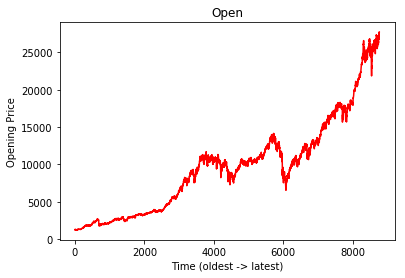

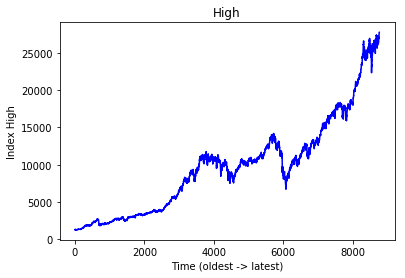

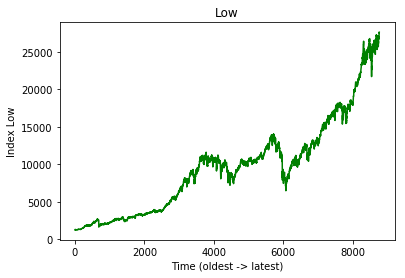

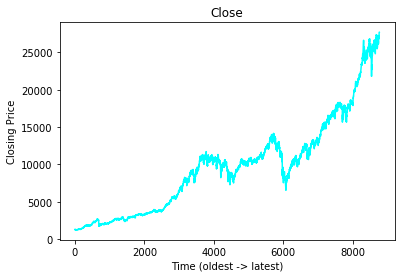

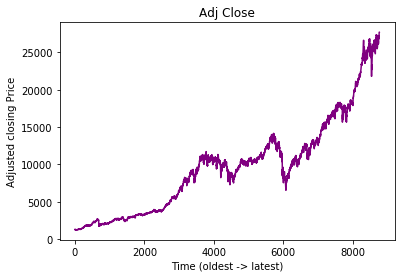

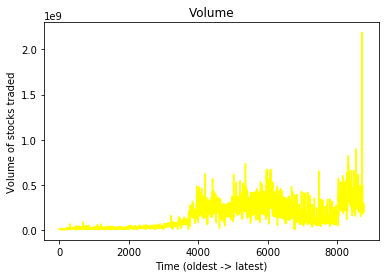

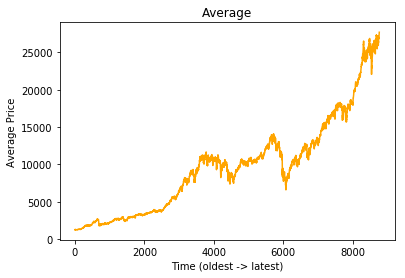

In [42]:
plt.plot(input_data[:,0], color='red')
plt.title("Open")
plt.xlabel("Time (oldest -> latest)")
plt.ylabel("Opening Price")
plt.show()

plt.plot(input_data[:,1], color='blue')
plt.title("High")
plt.xlabel("Time (oldest -> latest)")
plt.ylabel("Index High")
plt.show()

plt.plot(input_data[:,2], color='green')
plt.title("Low")
plt.xlabel("Time (oldest -> latest)")
plt.ylabel("Index Low")
plt.show()

plt.plot(input_data[:,3], color='Cyan')
plt.title("Close")
plt.xlabel("Time (oldest -> latest)")
plt.ylabel("Closing Price")
plt.show()

plt.plot(input_data[:,4], color='Purple')
plt.title("Adj Close")
plt.xlabel("Time (oldest -> latest)")
plt.ylabel("Adjusted closing Price")
plt.show()

plt.plot(input_data[:,5], color='Yellow')
plt.title("Volume")
plt.xlabel("Time (oldest -> latest)")
plt.ylabel("Volume of stocks traded")
plt.show()

plt.plot(input_data[:,6], color='orange')
plt.title("Average")
plt.xlabel("Time (oldest -> latest)")
plt.ylabel("Average Price")
plt.show()

In [43]:
print(new_df)

             0         1         2         3         4         5         6
0     0.001285  0.001669  0.001188  0.001912  0.001912  0.005040  0.001429
1     0.002028  0.002032  0.001644  0.001733  0.001733  0.006530  0.001838
2     0.001494  0.001591  0.001406  0.001691  0.001691  0.005274  0.001499
3     0.001256  0.001316  0.001297  0.001349  0.001349  0.003861  0.001307
4     0.001072  0.001649  0.001267  0.001816  0.001816  0.004159  0.001459
5     0.001903  0.001882  0.001631  0.001633  0.001633  0.005150  0.001757
6     0.001556  0.001632  0.001498  0.001457  0.001457  0.005520  0.001565
7     0.001561  0.001728  0.001677  0.001816  0.001816  0.004072  0.001703
8     0.001753  0.001732  0.001736  0.001812  0.001812  0.002500  0.001734
9     0.001674  0.001528  0.001255  0.001286  0.001286  0.004602  0.001392
10    0.001039  0.001203  0.001167  0.001307  0.001307  0.004268  0.001185
11    0.001290  0.002015  0.001477  0.002112  0.002112  0.005264  0.001747
12    0.002195  0.002123 

In [44]:
input_ = new_df.iloc[:,:].values
print(input_)

[[0.00128544 0.00166947 0.00118789 ... 0.00191195 0.00504049 0.00142934]
 [0.00202813 0.00203179 0.00164395 ... 0.00173274 0.00653024 0.00183846]
 [0.00149407 0.00159067 0.00140569 ... 0.00169077 0.00527355 0.00149851]
 ...
 [0.9994183  0.99699433 0.99786553 ... 0.99961247 0.10003747 0.99750073]
 [0.99542935 0.99772732 0.99554351 ... 1.         0.09131373 0.99670973]
 [1.         0.99985633 1.         ... 1.         0.09648674 1.        ]]


In [45]:
lookback = 50
test_size = int(len(df) * 0.2)
X = []
Y = []
print(test_size)
print("len(df) - lookback - 1 : ", len(df) - lookback - 1)
for i in range(len(df) - lookback - 1):
    t = []
    for j in range(0,lookback):
        print("j : ", j)
        print("i+j : ", i+j)
        t.append(input_[[(i+j)], :])
    X.append(t)
    Y.append(input_[i+lookback, [0,1,2,3,6]]) #Y.append(input_[i+lookback, 6])
    

1754
len(df) - lookback - 1 :  8719
j :  0
i+j :  0
j :  1
i+j :  1
j :  2
i+j :  2
j :  3
i+j :  3
j :  4
i+j :  4
j :  5
i+j :  5
j :  6
i+j :  6
j :  7
i+j :  7
j :  8
i+j :  8
j :  9
i+j :  9
j :  10
i+j :  10
j :  11
i+j :  11
j :  12
i+j :  12
j :  13
i+j :  13
j :  14
i+j :  14
j :  15
i+j :  15
j :  16
i+j :  16
j :  17
i+j :  17
j :  18
i+j :  18
j :  19
i+j :  19
j :  20
i+j :  20
j :  21
i+j :  21
j :  22
i+j :  22
j :  23
i+j :  23
j :  24
i+j :  24
j :  25
i+j :  25
j :  26
i+j :  26
j :  27
i+j :  27
j :  28
i+j :  28
j :  29
i+j :  29
j :  30
i+j :  30
j :  31
i+j :  31
j :  32
i+j :  32
j :  33
i+j :  33
j :  34
i+j :  34
j :  35
i+j :  35
j :  36
i+j :  36
j :  37
i+j :  37
j :  38
i+j :  38
j :  39
i+j :  39
j :  40
i+j :  40
j :  41
i+j :  41
j :  42
i+j :  42
j :  43
i+j :  43
j :  44
i+j :  44
j :  45
i+j :  45
j :  46
i+j :  46
j :  47
i+j :  47
j :  48
i+j :  48
j :  49
i+j :  49
j :  0
i+j :  1
j :  1
i+j :  2
j :  2
i+j :  3
j :  3
i+j :  4
j :  4
i+j :  5
j : 

j :  43
i+j :  52
j :  44
i+j :  53
j :  45
i+j :  54
j :  46
i+j :  55
j :  47
i+j :  56
j :  48
i+j :  57
j :  49
i+j :  58
j :  0
i+j :  10
j :  1
i+j :  11
j :  2
i+j :  12
j :  3
i+j :  13
j :  4
i+j :  14
j :  5
i+j :  15
j :  6
i+j :  16
j :  7
i+j :  17
j :  8
i+j :  18
j :  9
i+j :  19
j :  10
i+j :  20
j :  11
i+j :  21
j :  12
i+j :  22
j :  13
i+j :  23
j :  14
i+j :  24
j :  15
i+j :  25
j :  16
i+j :  26
j :  17
i+j :  27
j :  18
i+j :  28
j :  19
i+j :  29
j :  20
i+j :  30
j :  21
i+j :  31
j :  22
i+j :  32
j :  23
i+j :  33
j :  24
i+j :  34
j :  25
i+j :  35
j :  26
i+j :  36
j :  27
i+j :  37
j :  28
i+j :  38
j :  29
i+j :  39
j :  30
i+j :  40
j :  31
i+j :  41
j :  32
i+j :  42
j :  33
i+j :  43
j :  34
i+j :  44
j :  35
i+j :  45
j :  36
i+j :  46
j :  37
i+j :  47
j :  38
i+j :  48
j :  39
i+j :  49
j :  40
i+j :  50
j :  41
i+j :  51
j :  42
i+j :  52
j :  43
i+j :  53
j :  44
i+j :  54
j :  45
i+j :  55
j :  46
i+j :  56
j :  47
i+j :  57
j :  48
i+j :  58
j 

j :  41
i+j :  60
j :  42
i+j :  61
j :  43
i+j :  62
j :  44
i+j :  63
j :  45
i+j :  64
j :  46
i+j :  65
j :  47
i+j :  66
j :  48
i+j :  67
j :  49
i+j :  68
j :  0
i+j :  20
j :  1
i+j :  21
j :  2
i+j :  22
j :  3
i+j :  23
j :  4
i+j :  24
j :  5
i+j :  25
j :  6
i+j :  26
j :  7
i+j :  27
j :  8
i+j :  28
j :  9
i+j :  29
j :  10
i+j :  30
j :  11
i+j :  31
j :  12
i+j :  32
j :  13
i+j :  33
j :  14
i+j :  34
j :  15
i+j :  35
j :  16
i+j :  36
j :  17
i+j :  37
j :  18
i+j :  38
j :  19
i+j :  39
j :  20
i+j :  40
j :  21
i+j :  41
j :  22
i+j :  42
j :  23
i+j :  43
j :  24
i+j :  44
j :  25
i+j :  45
j :  26
i+j :  46
j :  27
i+j :  47
j :  28
i+j :  48
j :  29
i+j :  49
j :  30
i+j :  50
j :  31
i+j :  51
j :  32
i+j :  52
j :  33
i+j :  53
j :  34
i+j :  54
j :  35
i+j :  55
j :  36
i+j :  56
j :  37
i+j :  57
j :  38
i+j :  58
j :  39
i+j :  59
j :  40
i+j :  60
j :  41
i+j :  61
j :  42
i+j :  62
j :  43
i+j :  63
j :  44
i+j :  64
j :  45
i+j :  65
j :  46
i+j :  66
j 

i+j :  77
j :  49
i+j :  78
j :  0
i+j :  30
j :  1
i+j :  31
j :  2
i+j :  32
j :  3
i+j :  33
j :  4
i+j :  34
j :  5
i+j :  35
j :  6
i+j :  36
j :  7
i+j :  37
j :  8
i+j :  38
j :  9
i+j :  39
j :  10
i+j :  40
j :  11
i+j :  41
j :  12
i+j :  42
j :  13
i+j :  43
j :  14
i+j :  44
j :  15
i+j :  45
j :  16
i+j :  46
j :  17
i+j :  47
j :  18
i+j :  48
j :  19
i+j :  49
j :  20
i+j :  50
j :  21
i+j :  51
j :  22
i+j :  52
j :  23
i+j :  53
j :  24
i+j :  54
j :  25
i+j :  55
j :  26
i+j :  56
j :  27
i+j :  57
j :  28
i+j :  58
j :  29
i+j :  59
j :  30
i+j :  60
j :  31
i+j :  61
j :  32
i+j :  62
j :  33
i+j :  63
j :  34
i+j :  64
j :  35
i+j :  65
j :  36
i+j :  66
j :  37
i+j :  67
j :  38
i+j :  68
j :  39
i+j :  69
j :  40
i+j :  70
j :  41
i+j :  71
j :  42
i+j :  72
j :  43
i+j :  73
j :  44
i+j :  74
j :  45
i+j :  75
j :  46
i+j :  76
j :  47
i+j :  77
j :  48
i+j :  78
j :  49
i+j :  79
j :  0
i+j :  31
j :  1
i+j :  32
j :  2
i+j :  33
j :  3
i+j :  34
j :  4
i+j :  

i+j :  42
j :  3
i+j :  43
j :  4
i+j :  44
j :  5
i+j :  45
j :  6
i+j :  46
j :  7
i+j :  47
j :  8
i+j :  48
j :  9
i+j :  49
j :  10
i+j :  50
j :  11
i+j :  51
j :  12
i+j :  52
j :  13
i+j :  53
j :  14
i+j :  54
j :  15
i+j :  55
j :  16
i+j :  56
j :  17
i+j :  57
j :  18
i+j :  58
j :  19
i+j :  59
j :  20
i+j :  60
j :  21
i+j :  61
j :  22
i+j :  62
j :  23
i+j :  63
j :  24
i+j :  64
j :  25
i+j :  65
j :  26
i+j :  66
j :  27
i+j :  67
j :  28
i+j :  68
j :  29
i+j :  69
j :  30
i+j :  70
j :  31
i+j :  71
j :  32
i+j :  72
j :  33
i+j :  73
j :  34
i+j :  74
j :  35
i+j :  75
j :  36
i+j :  76
j :  37
i+j :  77
j :  38
i+j :  78
j :  39
i+j :  79
j :  40
i+j :  80
j :  41
i+j :  81
j :  42
i+j :  82
j :  43
i+j :  83
j :  44
i+j :  84
j :  45
i+j :  85
j :  46
i+j :  86
j :  47
i+j :  87
j :  48
i+j :  88
j :  49
i+j :  89
j :  0
i+j :  41
j :  1
i+j :  42
j :  2
i+j :  43
j :  3
i+j :  44
j :  4
i+j :  45
j :  5
i+j :  46
j :  6
i+j :  47
j :  7
i+j :  48
j :  8
i+j :  4

i+j :  61
j :  12
i+j :  62
j :  13
i+j :  63
j :  14
i+j :  64
j :  15
i+j :  65
j :  16
i+j :  66
j :  17
i+j :  67
j :  18
i+j :  68
j :  19
i+j :  69
j :  20
i+j :  70
j :  21
i+j :  71
j :  22
i+j :  72
j :  23
i+j :  73
j :  24
i+j :  74
j :  25
i+j :  75
j :  26
i+j :  76
j :  27
i+j :  77
j :  28
i+j :  78
j :  29
i+j :  79
j :  30
i+j :  80
j :  31
i+j :  81
j :  32
i+j :  82
j :  33
i+j :  83
j :  34
i+j :  84
j :  35
i+j :  85
j :  36
i+j :  86
j :  37
i+j :  87
j :  38
i+j :  88
j :  39
i+j :  89
j :  40
i+j :  90
j :  41
i+j :  91
j :  42
i+j :  92
j :  43
i+j :  93
j :  44
i+j :  94
j :  45
i+j :  95
j :  46
i+j :  96
j :  47
i+j :  97
j :  48
i+j :  98
j :  49
i+j :  99
j :  0
i+j :  51
j :  1
i+j :  52
j :  2
i+j :  53
j :  3
i+j :  54
j :  4
i+j :  55
j :  5
i+j :  56
j :  6
i+j :  57
j :  7
i+j :  58
j :  8
i+j :  59
j :  9
i+j :  60
j :  10
i+j :  61
j :  11
i+j :  62
j :  12
i+j :  63
j :  13
i+j :  64
j :  14
i+j :  65
j :  15
i+j :  66
j :  16
i+j :  67
j :  17
i+

j :  20
i+j :  80
j :  21
i+j :  81
j :  22
i+j :  82
j :  23
i+j :  83
j :  24
i+j :  84
j :  25
i+j :  85
j :  26
i+j :  86
j :  27
i+j :  87
j :  28
i+j :  88
j :  29
i+j :  89
j :  30
i+j :  90
j :  31
i+j :  91
j :  32
i+j :  92
j :  33
i+j :  93
j :  34
i+j :  94
j :  35
i+j :  95
j :  36
i+j :  96
j :  37
i+j :  97
j :  38
i+j :  98
j :  39
i+j :  99
j :  40
i+j :  100
j :  41
i+j :  101
j :  42
i+j :  102
j :  43
i+j :  103
j :  44
i+j :  104
j :  45
i+j :  105
j :  46
i+j :  106
j :  47
i+j :  107
j :  48
i+j :  108
j :  49
i+j :  109
j :  0
i+j :  61
j :  1
i+j :  62
j :  2
i+j :  63
j :  3
i+j :  64
j :  4
i+j :  65
j :  5
i+j :  66
j :  6
i+j :  67
j :  7
i+j :  68
j :  8
i+j :  69
j :  9
i+j :  70
j :  10
i+j :  71
j :  11
i+j :  72
j :  12
i+j :  73
j :  13
i+j :  74
j :  14
i+j :  75
j :  15
i+j :  76
j :  16
i+j :  77
j :  17
i+j :  78
j :  18
i+j :  79
j :  19
i+j :  80
j :  20
i+j :  81
j :  21
i+j :  82
j :  22
i+j :  83
j :  23
i+j :  84
j :  24
i+j :  85
j :  25
i+

j :  21
i+j :  91
j :  22
i+j :  92
j :  23
i+j :  93
j :  24
i+j :  94
j :  25
i+j :  95
j :  26
i+j :  96
j :  27
i+j :  97
j :  28
i+j :  98
j :  29
i+j :  99
j :  30
i+j :  100
j :  31
i+j :  101
j :  32
i+j :  102
j :  33
i+j :  103
j :  34
i+j :  104
j :  35
i+j :  105
j :  36
i+j :  106
j :  37
i+j :  107
j :  38
i+j :  108
j :  39
i+j :  109
j :  40
i+j :  110
j :  41
i+j :  111
j :  42
i+j :  112
j :  43
i+j :  113
j :  44
i+j :  114
j :  45
i+j :  115
j :  46
i+j :  116
j :  47
i+j :  117
j :  48
i+j :  118
j :  49
i+j :  119
j :  0
i+j :  71
j :  1
i+j :  72
j :  2
i+j :  73
j :  3
i+j :  74
j :  4
i+j :  75
j :  5
i+j :  76
j :  6
i+j :  77
j :  7
i+j :  78
j :  8
i+j :  79
j :  9
i+j :  80
j :  10
i+j :  81
j :  11
i+j :  82
j :  12
i+j :  83
j :  13
i+j :  84
j :  14
i+j :  85
j :  15
i+j :  86
j :  16
i+j :  87
j :  17
i+j :  88
j :  18
i+j :  89
j :  19
i+j :  90
j :  20
i+j :  91
j :  21
i+j :  92
j :  22
i+j :  93
j :  23
i+j :  94
j :  24
i+j :  95
j :  25
i+j :  96


j :  42
i+j :  122
j :  43
i+j :  123
j :  44
i+j :  124
j :  45
i+j :  125
j :  46
i+j :  126
j :  47
i+j :  127
j :  48
i+j :  128
j :  49
i+j :  129
j :  0
i+j :  81
j :  1
i+j :  82
j :  2
i+j :  83
j :  3
i+j :  84
j :  4
i+j :  85
j :  5
i+j :  86
j :  6
i+j :  87
j :  7
i+j :  88
j :  8
i+j :  89
j :  9
i+j :  90
j :  10
i+j :  91
j :  11
i+j :  92
j :  12
i+j :  93
j :  13
i+j :  94
j :  14
i+j :  95
j :  15
i+j :  96
j :  16
i+j :  97
j :  17
i+j :  98
j :  18
i+j :  99
j :  19
i+j :  100
j :  20
i+j :  101
j :  21
i+j :  102
j :  22
i+j :  103
j :  23
i+j :  104
j :  24
i+j :  105
j :  25
i+j :  106
j :  26
i+j :  107
j :  27
i+j :  108
j :  28
i+j :  109
j :  29
i+j :  110
j :  30
i+j :  111
j :  31
i+j :  112
j :  32
i+j :  113
j :  33
i+j :  114
j :  34
i+j :  115
j :  35
i+j :  116
j :  36
i+j :  117
j :  37
i+j :  118
j :  38
i+j :  119
j :  39
i+j :  120
j :  40
i+j :  121
j :  41
i+j :  122
j :  42
i+j :  123
j :  43
i+j :  124
j :  44
i+j :  125
j :  45
i+j :  126
j :

j :  1
i+j :  92
j :  2
i+j :  93
j :  3
i+j :  94
j :  4
i+j :  95
j :  5
i+j :  96
j :  6
i+j :  97
j :  7
i+j :  98
j :  8
i+j :  99
j :  9
i+j :  100
j :  10
i+j :  101
j :  11
i+j :  102
j :  12
i+j :  103
j :  13
i+j :  104
j :  14
i+j :  105
j :  15
i+j :  106
j :  16
i+j :  107
j :  17
i+j :  108
j :  18
i+j :  109
j :  19
i+j :  110
j :  20
i+j :  111
j :  21
i+j :  112
j :  22
i+j :  113
j :  23
i+j :  114
j :  24
i+j :  115
j :  25
i+j :  116
j :  26
i+j :  117
j :  27
i+j :  118
j :  28
i+j :  119
j :  29
i+j :  120
j :  30
i+j :  121
j :  31
i+j :  122
j :  32
i+j :  123
j :  33
i+j :  124
j :  34
i+j :  125
j :  35
i+j :  126
j :  36
i+j :  127
j :  37
i+j :  128
j :  38
i+j :  129
j :  39
i+j :  130
j :  40
i+j :  131
j :  41
i+j :  132
j :  42
i+j :  133
j :  43
i+j :  134
j :  44
i+j :  135
j :  45
i+j :  136
j :  46
i+j :  137
j :  47
i+j :  138
j :  48
i+j :  139
j :  49
i+j :  140
j :  0
i+j :  92
j :  1
i+j :  93
j :  2
i+j :  94
j :  3
i+j :  95
j :  4
i+j :  96
j

j :  12
i+j :  113
j :  13
i+j :  114
j :  14
i+j :  115
j :  15
i+j :  116
j :  16
i+j :  117
j :  17
i+j :  118
j :  18
i+j :  119
j :  19
i+j :  120
j :  20
i+j :  121
j :  21
i+j :  122
j :  22
i+j :  123
j :  23
i+j :  124
j :  24
i+j :  125
j :  25
i+j :  126
j :  26
i+j :  127
j :  27
i+j :  128
j :  28
i+j :  129
j :  29
i+j :  130
j :  30
i+j :  131
j :  31
i+j :  132
j :  32
i+j :  133
j :  33
i+j :  134
j :  34
i+j :  135
j :  35
i+j :  136
j :  36
i+j :  137
j :  37
i+j :  138
j :  38
i+j :  139
j :  39
i+j :  140
j :  40
i+j :  141
j :  41
i+j :  142
j :  42
i+j :  143
j :  43
i+j :  144
j :  44
i+j :  145
j :  45
i+j :  146
j :  46
i+j :  147
j :  47
i+j :  148
j :  48
i+j :  149
j :  49
i+j :  150
j :  0
i+j :  102
j :  1
i+j :  103
j :  2
i+j :  104
j :  3
i+j :  105
j :  4
i+j :  106
j :  5
i+j :  107
j :  6
i+j :  108
j :  7
i+j :  109
j :  8
i+j :  110
j :  9
i+j :  111
j :  10
i+j :  112
j :  11
i+j :  113
j :  12
i+j :  114
j :  13
i+j :  115
j :  14
i+j :  116
j :

i+j :  121
j :  11
i+j :  122
j :  12
i+j :  123
j :  13
i+j :  124
j :  14
i+j :  125
j :  15
i+j :  126
j :  16
i+j :  127
j :  17
i+j :  128
j :  18
i+j :  129
j :  19
i+j :  130
j :  20
i+j :  131
j :  21
i+j :  132
j :  22
i+j :  133
j :  23
i+j :  134
j :  24
i+j :  135
j :  25
i+j :  136
j :  26
i+j :  137
j :  27
i+j :  138
j :  28
i+j :  139
j :  29
i+j :  140
j :  30
i+j :  141
j :  31
i+j :  142
j :  32
i+j :  143
j :  33
i+j :  144
j :  34
i+j :  145
j :  35
i+j :  146
j :  36
i+j :  147
j :  37
i+j :  148
j :  38
i+j :  149
j :  39
i+j :  150
j :  40
i+j :  151
j :  41
i+j :  152
j :  42
i+j :  153
j :  43
i+j :  154
j :  44
i+j :  155
j :  45
i+j :  156
j :  46
i+j :  157
j :  47
i+j :  158
j :  48
i+j :  159
j :  49
i+j :  160
j :  0
i+j :  112
j :  1
i+j :  113
j :  2
i+j :  114
j :  3
i+j :  115
j :  4
i+j :  116
j :  5
i+j :  117
j :  6
i+j :  118
j :  7
i+j :  119
j :  8
i+j :  120
j :  9
i+j :  121
j :  10
i+j :  122
j :  11
i+j :  123
j :  12
i+j :  124
j :  13
i+j

j :  12
i+j :  133
j :  13
i+j :  134
j :  14
i+j :  135
j :  15
i+j :  136
j :  16
i+j :  137
j :  17
i+j :  138
j :  18
i+j :  139
j :  19
i+j :  140
j :  20
i+j :  141
j :  21
i+j :  142
j :  22
i+j :  143
j :  23
i+j :  144
j :  24
i+j :  145
j :  25
i+j :  146
j :  26
i+j :  147
j :  27
i+j :  148
j :  28
i+j :  149
j :  29
i+j :  150
j :  30
i+j :  151
j :  31
i+j :  152
j :  32
i+j :  153
j :  33
i+j :  154
j :  34
i+j :  155
j :  35
i+j :  156
j :  36
i+j :  157
j :  37
i+j :  158
j :  38
i+j :  159
j :  39
i+j :  160
j :  40
i+j :  161
j :  41
i+j :  162
j :  42
i+j :  163
j :  43
i+j :  164
j :  44
i+j :  165
j :  45
i+j :  166
j :  46
i+j :  167
j :  47
i+j :  168
j :  48
i+j :  169
j :  49
i+j :  170
j :  0
i+j :  122
j :  1
i+j :  123
j :  2
i+j :  124
j :  3
i+j :  125
j :  4
i+j :  126
j :  5
i+j :  127
j :  6
i+j :  128
j :  7
i+j :  129
j :  8
i+j :  130
j :  9
i+j :  131
j :  10
i+j :  132
j :  11
i+j :  133
j :  12
i+j :  134
j :  13
i+j :  135
j :  14
i+j :  136
j :

i+j :  144
j :  14
i+j :  145
j :  15
i+j :  146
j :  16
i+j :  147
j :  17
i+j :  148
j :  18
i+j :  149
j :  19
i+j :  150
j :  20
i+j :  151
j :  21
i+j :  152
j :  22
i+j :  153
j :  23
i+j :  154
j :  24
i+j :  155
j :  25
i+j :  156
j :  26
i+j :  157
j :  27
i+j :  158
j :  28
i+j :  159
j :  29
i+j :  160
j :  30
i+j :  161
j :  31
i+j :  162
j :  32
i+j :  163
j :  33
i+j :  164
j :  34
i+j :  165
j :  35
i+j :  166
j :  36
i+j :  167
j :  37
i+j :  168
j :  38
i+j :  169
j :  39
i+j :  170
j :  40
i+j :  171
j :  41
i+j :  172
j :  42
i+j :  173
j :  43
i+j :  174
j :  44
i+j :  175
j :  45
i+j :  176
j :  46
i+j :  177
j :  47
i+j :  178
j :  48
i+j :  179
j :  49
i+j :  180
j :  0
i+j :  132
j :  1
i+j :  133
j :  2
i+j :  134
j :  3
i+j :  135
j :  4
i+j :  136
j :  5
i+j :  137
j :  6
i+j :  138
j :  7
i+j :  139
j :  8
i+j :  140
j :  9
i+j :  141
j :  10
i+j :  142
j :  11
i+j :  143
j :  12
i+j :  144
j :  13
i+j :  145
j :  14
i+j :  146
j :  15
i+j :  147
j :  16
i+j

j :  23
i+j :  164
j :  24
i+j :  165
j :  25
i+j :  166
j :  26
i+j :  167
j :  27
i+j :  168
j :  28
i+j :  169
j :  29
i+j :  170
j :  30
i+j :  171
j :  31
i+j :  172
j :  32
i+j :  173
j :  33
i+j :  174
j :  34
i+j :  175
j :  35
i+j :  176
j :  36
i+j :  177
j :  37
i+j :  178
j :  38
i+j :  179
j :  39
i+j :  180
j :  40
i+j :  181
j :  41
i+j :  182
j :  42
i+j :  183
j :  43
i+j :  184
j :  44
i+j :  185
j :  45
i+j :  186
j :  46
i+j :  187
j :  47
i+j :  188
j :  48
i+j :  189
j :  49
i+j :  190
j :  0
i+j :  142
j :  1
i+j :  143
j :  2
i+j :  144
j :  3
i+j :  145
j :  4
i+j :  146
j :  5
i+j :  147
j :  6
i+j :  148
j :  7
i+j :  149
j :  8
i+j :  150
j :  9
i+j :  151
j :  10
i+j :  152
j :  11
i+j :  153
j :  12
i+j :  154
j :  13
i+j :  155
j :  14
i+j :  156
j :  15
i+j :  157
j :  16
i+j :  158
j :  17
i+j :  159
j :  18
i+j :  160
j :  19
i+j :  161
j :  20
i+j :  162
j :  21
i+j :  163
j :  22
i+j :  164
j :  23
i+j :  165
j :  24
i+j :  166
j :  25
i+j :  167
j :

i+j :  200
j :  0
i+j :  152
j :  1
i+j :  153
j :  2
i+j :  154
j :  3
i+j :  155
j :  4
i+j :  156
j :  5
i+j :  157
j :  6
i+j :  158
j :  7
i+j :  159
j :  8
i+j :  160
j :  9
i+j :  161
j :  10
i+j :  162
j :  11
i+j :  163
j :  12
i+j :  164
j :  13
i+j :  165
j :  14
i+j :  166
j :  15
i+j :  167
j :  16
i+j :  168
j :  17
i+j :  169
j :  18
i+j :  170
j :  19
i+j :  171
j :  20
i+j :  172
j :  21
i+j :  173
j :  22
i+j :  174
j :  23
i+j :  175
j :  24
i+j :  176
j :  25
i+j :  177
j :  26
i+j :  178
j :  27
i+j :  179
j :  28
i+j :  180
j :  29
i+j :  181
j :  30
i+j :  182
j :  31
i+j :  183
j :  32
i+j :  184
j :  33
i+j :  185
j :  34
i+j :  186
j :  35
i+j :  187
j :  36
i+j :  188
j :  37
i+j :  189
j :  38
i+j :  190
j :  39
i+j :  191
j :  40
i+j :  192
j :  41
i+j :  193
j :  42
i+j :  194
j :  43
i+j :  195
j :  44
i+j :  196
j :  45
i+j :  197
j :  46
i+j :  198
j :  47
i+j :  199
j :  48
i+j :  200
j :  49
i+j :  201
j :  0
i+j :  153
j :  1
i+j :  154
j :  2
i+j : 

j :  16
i+j :  178
j :  17
i+j :  179
j :  18
i+j :  180
j :  19
i+j :  181
j :  20
i+j :  182
j :  21
i+j :  183
j :  22
i+j :  184
j :  23
i+j :  185
j :  24
i+j :  186
j :  25
i+j :  187
j :  26
i+j :  188
j :  27
i+j :  189
j :  28
i+j :  190
j :  29
i+j :  191
j :  30
i+j :  192
j :  31
i+j :  193
j :  32
i+j :  194
j :  33
i+j :  195
j :  34
i+j :  196
j :  35
i+j :  197
j :  36
i+j :  198
j :  37
i+j :  199
j :  38
i+j :  200
j :  39
i+j :  201
j :  40
i+j :  202
j :  41
i+j :  203
j :  42
i+j :  204
j :  43
i+j :  205
j :  44
i+j :  206
j :  45
i+j :  207
j :  46
i+j :  208
j :  47
i+j :  209
j :  48
i+j :  210
j :  49
i+j :  211
j :  0
i+j :  163
j :  1
i+j :  164
j :  2
i+j :  165
j :  3
i+j :  166
j :  4
i+j :  167
j :  5
i+j :  168
j :  6
i+j :  169
j :  7
i+j :  170
j :  8
i+j :  171
j :  9
i+j :  172
j :  10
i+j :  173
j :  11
i+j :  174
j :  12
i+j :  175
j :  13
i+j :  176
j :  14
i+j :  177
j :  15
i+j :  178
j :  16
i+j :  179
j :  17
i+j :  180
j :  18
i+j :  181
j :

i+j :  202
j :  31
i+j :  203
j :  32
i+j :  204
j :  33
i+j :  205
j :  34
i+j :  206
j :  35
i+j :  207
j :  36
i+j :  208
j :  37
i+j :  209
j :  38
i+j :  210
j :  39
i+j :  211
j :  40
i+j :  212
j :  41
i+j :  213
j :  42
i+j :  214
j :  43
i+j :  215
j :  44
i+j :  216
j :  45
i+j :  217
j :  46
i+j :  218
j :  47
i+j :  219
j :  48
i+j :  220
j :  49
i+j :  221
j :  0
i+j :  173
j :  1
i+j :  174
j :  2
i+j :  175
j :  3
i+j :  176
j :  4
i+j :  177
j :  5
i+j :  178
j :  6
i+j :  179
j :  7
i+j :  180
j :  8
i+j :  181
j :  9
i+j :  182
j :  10
i+j :  183
j :  11
i+j :  184
j :  12
i+j :  185
j :  13
i+j :  186
j :  14
i+j :  187
j :  15
i+j :  188
j :  16
i+j :  189
j :  17
i+j :  190
j :  18
i+j :  191
j :  19
i+j :  192
j :  20
i+j :  193
j :  21
i+j :  194
j :  22
i+j :  195
j :  23
i+j :  196
j :  24
i+j :  197
j :  25
i+j :  198
j :  26
i+j :  199
j :  27
i+j :  200
j :  28
i+j :  201
j :  29
i+j :  202
j :  30
i+j :  203
j :  31
i+j :  204
j :  32
i+j :  205
j :  33
i+j

j :  40
i+j :  222
j :  41
i+j :  223
j :  42
i+j :  224
j :  43
i+j :  225
j :  44
i+j :  226
j :  45
i+j :  227
j :  46
i+j :  228
j :  47
i+j :  229
j :  48
i+j :  230
j :  49
i+j :  231
j :  0
i+j :  183
j :  1
i+j :  184
j :  2
i+j :  185
j :  3
i+j :  186
j :  4
i+j :  187
j :  5
i+j :  188
j :  6
i+j :  189
j :  7
i+j :  190
j :  8
i+j :  191
j :  9
i+j :  192
j :  10
i+j :  193
j :  11
i+j :  194
j :  12
i+j :  195
j :  13
i+j :  196
j :  14
i+j :  197
j :  15
i+j :  198
j :  16
i+j :  199
j :  17
i+j :  200
j :  18
i+j :  201
j :  19
i+j :  202
j :  20
i+j :  203
j :  21
i+j :  204
j :  22
i+j :  205
j :  23
i+j :  206
j :  24
i+j :  207
j :  25
i+j :  208
j :  26
i+j :  209
j :  27
i+j :  210
j :  28
i+j :  211
j :  29
i+j :  212
j :  30
i+j :  213
j :  31
i+j :  214
j :  32
i+j :  215
j :  33
i+j :  216
j :  34
i+j :  217
j :  35
i+j :  218
j :  36
i+j :  219
j :  37
i+j :  220
j :  38
i+j :  221
j :  39
i+j :  222
j :  40
i+j :  223
j :  41
i+j :  224
j :  42
i+j :  225
j :

j :  45
i+j :  237
j :  46
i+j :  238
j :  47
i+j :  239
j :  48
i+j :  240
j :  49
i+j :  241
j :  0
i+j :  193
j :  1
i+j :  194
j :  2
i+j :  195
j :  3
i+j :  196
j :  4
i+j :  197
j :  5
i+j :  198
j :  6
i+j :  199
j :  7
i+j :  200
j :  8
i+j :  201
j :  9
i+j :  202
j :  10
i+j :  203
j :  11
i+j :  204
j :  12
i+j :  205
j :  13
i+j :  206
j :  14
i+j :  207
j :  15
i+j :  208
j :  16
i+j :  209
j :  17
i+j :  210
j :  18
i+j :  211
j :  19
i+j :  212
j :  20
i+j :  213
j :  21
i+j :  214
j :  22
i+j :  215
j :  23
i+j :  216
j :  24
i+j :  217
j :  25
i+j :  218
j :  26
i+j :  219
j :  27
i+j :  220
j :  28
i+j :  221
j :  29
i+j :  222
j :  30
i+j :  223
j :  31
i+j :  224
j :  32
i+j :  225
j :  33
i+j :  226
j :  34
i+j :  227
j :  35
i+j :  228
j :  36
i+j :  229
j :  37
i+j :  230
j :  38
i+j :  231
j :  39
i+j :  232
j :  40
i+j :  233
j :  41
i+j :  234
j :  42
i+j :  235
j :  43
i+j :  236
j :  44
i+j :  237
j :  45
i+j :  238
j :  46
i+j :  239
j :  47
i+j :  240
j :

j :  0
i+j :  203
j :  1
i+j :  204
j :  2
i+j :  205
j :  3
i+j :  206
j :  4
i+j :  207
j :  5
i+j :  208
j :  6
i+j :  209
j :  7
i+j :  210
j :  8
i+j :  211
j :  9
i+j :  212
j :  10
i+j :  213
j :  11
i+j :  214
j :  12
i+j :  215
j :  13
i+j :  216
j :  14
i+j :  217
j :  15
i+j :  218
j :  16
i+j :  219
j :  17
i+j :  220
j :  18
i+j :  221
j :  19
i+j :  222
j :  20
i+j :  223
j :  21
i+j :  224
j :  22
i+j :  225
j :  23
i+j :  226
j :  24
i+j :  227
j :  25
i+j :  228
j :  26
i+j :  229
j :  27
i+j :  230
j :  28
i+j :  231
j :  29
i+j :  232
j :  30
i+j :  233
j :  31
i+j :  234
j :  32
i+j :  235
j :  33
i+j :  236
j :  34
i+j :  237
j :  35
i+j :  238
j :  36
i+j :  239
j :  37
i+j :  240
j :  38
i+j :  241
j :  39
i+j :  242
j :  40
i+j :  243
j :  41
i+j :  244
j :  42
i+j :  245
j :  43
i+j :  246
j :  44
i+j :  247
j :  45
i+j :  248
j :  46
i+j :  249
j :  47
i+j :  250
j :  48
i+j :  251
j :  49
i+j :  252
j :  0
i+j :  204
j :  1
i+j :  205
j :  2
i+j :  206
j :  3

i+j :  221
j :  9
i+j :  222
j :  10
i+j :  223
j :  11
i+j :  224
j :  12
i+j :  225
j :  13
i+j :  226
j :  14
i+j :  227
j :  15
i+j :  228
j :  16
i+j :  229
j :  17
i+j :  230
j :  18
i+j :  231
j :  19
i+j :  232
j :  20
i+j :  233
j :  21
i+j :  234
j :  22
i+j :  235
j :  23
i+j :  236
j :  24
i+j :  237
j :  25
i+j :  238
j :  26
i+j :  239
j :  27
i+j :  240
j :  28
i+j :  241
j :  29
i+j :  242
j :  30
i+j :  243
j :  31
i+j :  244
j :  32
i+j :  245
j :  33
i+j :  246
j :  34
i+j :  247
j :  35
i+j :  248
j :  36
i+j :  249
j :  37
i+j :  250
j :  38
i+j :  251
j :  39
i+j :  252
j :  40
i+j :  253
j :  41
i+j :  254
j :  42
i+j :  255
j :  43
i+j :  256
j :  44
i+j :  257
j :  45
i+j :  258
j :  46
i+j :  259
j :  47
i+j :  260
j :  48
i+j :  261
j :  49
i+j :  262
j :  0
i+j :  214
j :  1
i+j :  215
j :  2
i+j :  216
j :  3
i+j :  217
j :  4
i+j :  218
j :  5
i+j :  219
j :  6
i+j :  220
j :  7
i+j :  221
j :  8
i+j :  222
j :  9
i+j :  223
j :  10
i+j :  224
j :  11
i+j 

j :  17
i+j :  240
j :  18
i+j :  241
j :  19
i+j :  242
j :  20
i+j :  243
j :  21
i+j :  244
j :  22
i+j :  245
j :  23
i+j :  246
j :  24
i+j :  247
j :  25
i+j :  248
j :  26
i+j :  249
j :  27
i+j :  250
j :  28
i+j :  251
j :  29
i+j :  252
j :  30
i+j :  253
j :  31
i+j :  254
j :  32
i+j :  255
j :  33
i+j :  256
j :  34
i+j :  257
j :  35
i+j :  258
j :  36
i+j :  259
j :  37
i+j :  260
j :  38
i+j :  261
j :  39
i+j :  262
j :  40
i+j :  263
j :  41
i+j :  264
j :  42
i+j :  265
j :  43
i+j :  266
j :  44
i+j :  267
j :  45
i+j :  268
j :  46
i+j :  269
j :  47
i+j :  270
j :  48
i+j :  271
j :  49
i+j :  272
j :  0
i+j :  224
j :  1
i+j :  225
j :  2
i+j :  226
j :  3
i+j :  227
j :  4
i+j :  228
j :  5
i+j :  229
j :  6
i+j :  230
j :  7
i+j :  231
j :  8
i+j :  232
j :  9
i+j :  233
j :  10
i+j :  234
j :  11
i+j :  235
j :  12
i+j :  236
j :  13
i+j :  237
j :  14
i+j :  238
j :  15
i+j :  239
j :  16
i+j :  240
j :  17
i+j :  241
j :  18
i+j :  242
j :  19
i+j :  243
j :

i+j :  252
j :  20
i+j :  253
j :  21
i+j :  254
j :  22
i+j :  255
j :  23
i+j :  256
j :  24
i+j :  257
j :  25
i+j :  258
j :  26
i+j :  259
j :  27
i+j :  260
j :  28
i+j :  261
j :  29
i+j :  262
j :  30
i+j :  263
j :  31
i+j :  264
j :  32
i+j :  265
j :  33
i+j :  266
j :  34
i+j :  267
j :  35
i+j :  268
j :  36
i+j :  269
j :  37
i+j :  270
j :  38
i+j :  271
j :  39
i+j :  272
j :  40
i+j :  273
j :  41
i+j :  274
j :  42
i+j :  275
j :  43
i+j :  276
j :  44
i+j :  277
j :  45
i+j :  278
j :  46
i+j :  279
j :  47
i+j :  280
j :  48
i+j :  281
j :  49
i+j :  282
j :  0
i+j :  234
j :  1
i+j :  235
j :  2
i+j :  236
j :  3
i+j :  237
j :  4
i+j :  238
j :  5
i+j :  239
j :  6
i+j :  240
j :  7
i+j :  241
j :  8
i+j :  242
j :  9
i+j :  243
j :  10
i+j :  244
j :  11
i+j :  245
j :  12
i+j :  246
j :  13
i+j :  247
j :  14
i+j :  248
j :  15
i+j :  249
j :  16
i+j :  250
j :  17
i+j :  251
j :  18
i+j :  252
j :  19
i+j :  253
j :  20
i+j :  254
j :  21
i+j :  255
j :  22
i+j

i+j :  263
j :  21
i+j :  264
j :  22
i+j :  265
j :  23
i+j :  266
j :  24
i+j :  267
j :  25
i+j :  268
j :  26
i+j :  269
j :  27
i+j :  270
j :  28
i+j :  271
j :  29
i+j :  272
j :  30
i+j :  273
j :  31
i+j :  274
j :  32
i+j :  275
j :  33
i+j :  276
j :  34
i+j :  277
j :  35
i+j :  278
j :  36
i+j :  279
j :  37
i+j :  280
j :  38
i+j :  281
j :  39
i+j :  282
j :  40
i+j :  283
j :  41
i+j :  284
j :  42
i+j :  285
j :  43
i+j :  286
j :  44
i+j :  287
j :  45
i+j :  288
j :  46
i+j :  289
j :  47
i+j :  290
j :  48
i+j :  291
j :  49
i+j :  292
j :  0
i+j :  244
j :  1
i+j :  245
j :  2
i+j :  246
j :  3
i+j :  247
j :  4
i+j :  248
j :  5
i+j :  249
j :  6
i+j :  250
j :  7
i+j :  251
j :  8
i+j :  252
j :  9
i+j :  253
j :  10
i+j :  254
j :  11
i+j :  255
j :  12
i+j :  256
j :  13
i+j :  257
j :  14
i+j :  258
j :  15
i+j :  259
j :  16
i+j :  260
j :  17
i+j :  261
j :  18
i+j :  262
j :  19
i+j :  263
j :  20
i+j :  264
j :  21
i+j :  265
j :  22
i+j :  266
j :  23
i+j

j :  28
i+j :  281
j :  29
i+j :  282
j :  30
i+j :  283
j :  31
i+j :  284
j :  32
i+j :  285
j :  33
i+j :  286
j :  34
i+j :  287
j :  35
i+j :  288
j :  36
i+j :  289
j :  37
i+j :  290
j :  38
i+j :  291
j :  39
i+j :  292
j :  40
i+j :  293
j :  41
i+j :  294
j :  42
i+j :  295
j :  43
i+j :  296
j :  44
i+j :  297
j :  45
i+j :  298
j :  46
i+j :  299
j :  47
i+j :  300
j :  48
i+j :  301
j :  49
i+j :  302
j :  0
i+j :  254
j :  1
i+j :  255
j :  2
i+j :  256
j :  3
i+j :  257
j :  4
i+j :  258
j :  5
i+j :  259
j :  6
i+j :  260
j :  7
i+j :  261
j :  8
i+j :  262
j :  9
i+j :  263
j :  10
i+j :  264
j :  11
i+j :  265
j :  12
i+j :  266
j :  13
i+j :  267
j :  14
i+j :  268
j :  15
i+j :  269
j :  16
i+j :  270
j :  17
i+j :  271
j :  18
i+j :  272
j :  19
i+j :  273
j :  20
i+j :  274
j :  21
i+j :  275
j :  22
i+j :  276
j :  23
i+j :  277
j :  24
i+j :  278
j :  25
i+j :  279
j :  26
i+j :  280
j :  27
i+j :  281
j :  28
i+j :  282
j :  29
i+j :  283
j :  30
i+j :  284
j :

j :  35
i+j :  298
j :  36
i+j :  299
j :  37
i+j :  300
j :  38
i+j :  301
j :  39
i+j :  302
j :  40
i+j :  303
j :  41
i+j :  304
j :  42
i+j :  305
j :  43
i+j :  306
j :  44
i+j :  307
j :  45
i+j :  308
j :  46
i+j :  309
j :  47
i+j :  310
j :  48
i+j :  311
j :  49
i+j :  312
j :  0
i+j :  264
j :  1
i+j :  265
j :  2
i+j :  266
j :  3
i+j :  267
j :  4
i+j :  268
j :  5
i+j :  269
j :  6
i+j :  270
j :  7
i+j :  271
j :  8
i+j :  272
j :  9
i+j :  273
j :  10
i+j :  274
j :  11
i+j :  275
j :  12
i+j :  276
j :  13
i+j :  277
j :  14
i+j :  278
j :  15
i+j :  279
j :  16
i+j :  280
j :  17
i+j :  281
j :  18
i+j :  282
j :  19
i+j :  283
j :  20
i+j :  284
j :  21
i+j :  285
j :  22
i+j :  286
j :  23
i+j :  287
j :  24
i+j :  288
j :  25
i+j :  289
j :  26
i+j :  290
j :  27
i+j :  291
j :  28
i+j :  292
j :  29
i+j :  293
j :  30
i+j :  294
j :  31
i+j :  295
j :  32
i+j :  296
j :  33
i+j :  297
j :  34
i+j :  298
j :  35
i+j :  299
j :  36
i+j :  300
j :  37
i+j :  301
j :

j :  42
i+j :  315
j :  43
i+j :  316
j :  44
i+j :  317
j :  45
i+j :  318
j :  46
i+j :  319
j :  47
i+j :  320
j :  48
i+j :  321
j :  49
i+j :  322
j :  0
i+j :  274
j :  1
i+j :  275
j :  2
i+j :  276
j :  3
i+j :  277
j :  4
i+j :  278
j :  5
i+j :  279
j :  6
i+j :  280
j :  7
i+j :  281
j :  8
i+j :  282
j :  9
i+j :  283
j :  10
i+j :  284
j :  11
i+j :  285
j :  12
i+j :  286
j :  13
i+j :  287
j :  14
i+j :  288
j :  15
i+j :  289
j :  16
i+j :  290
j :  17
i+j :  291
j :  18
i+j :  292
j :  19
i+j :  293
j :  20
i+j :  294
j :  21
i+j :  295
j :  22
i+j :  296
j :  23
i+j :  297
j :  24
i+j :  298
j :  25
i+j :  299
j :  26
i+j :  300
j :  27
i+j :  301
j :  28
i+j :  302
j :  29
i+j :  303
j :  30
i+j :  304
j :  31
i+j :  305
j :  32
i+j :  306
j :  33
i+j :  307
j :  34
i+j :  308
j :  35
i+j :  309
j :  36
i+j :  310
j :  37
i+j :  311
j :  38
i+j :  312
j :  39
i+j :  313
j :  40
i+j :  314
j :  41
i+j :  315
j :  42
i+j :  316
j :  43
i+j :  317
j :  44
i+j :  318
j :

j :  41
i+j :  324
j :  42
i+j :  325
j :  43
i+j :  326
j :  44
i+j :  327
j :  45
i+j :  328
j :  46
i+j :  329
j :  47
i+j :  330
j :  48
i+j :  331
j :  49
i+j :  332
j :  0
i+j :  284
j :  1
i+j :  285
j :  2
i+j :  286
j :  3
i+j :  287
j :  4
i+j :  288
j :  5
i+j :  289
j :  6
i+j :  290
j :  7
i+j :  291
j :  8
i+j :  292
j :  9
i+j :  293
j :  10
i+j :  294
j :  11
i+j :  295
j :  12
i+j :  296
j :  13
i+j :  297
j :  14
i+j :  298
j :  15
i+j :  299
j :  16
i+j :  300
j :  17
i+j :  301
j :  18
i+j :  302
j :  19
i+j :  303
j :  20
i+j :  304
j :  21
i+j :  305
j :  22
i+j :  306
j :  23
i+j :  307
j :  24
i+j :  308
j :  25
i+j :  309
j :  26
i+j :  310
j :  27
i+j :  311
j :  28
i+j :  312
j :  29
i+j :  313
j :  30
i+j :  314
j :  31
i+j :  315
j :  32
i+j :  316
j :  33
i+j :  317
j :  34
i+j :  318
j :  35
i+j :  319
j :  36
i+j :  320
j :  37
i+j :  321
j :  38
i+j :  322
j :  39
i+j :  323
j :  40
i+j :  324
j :  41
i+j :  325
j :  42
i+j :  326
j :  43
i+j :  327
j :

j :  40
i+j :  333
j :  41
i+j :  334
j :  42
i+j :  335
j :  43
i+j :  336
j :  44
i+j :  337
j :  45
i+j :  338
j :  46
i+j :  339
j :  47
i+j :  340
j :  48
i+j :  341
j :  49
i+j :  342
j :  0
i+j :  294
j :  1
i+j :  295
j :  2
i+j :  296
j :  3
i+j :  297
j :  4
i+j :  298
j :  5
i+j :  299
j :  6
i+j :  300
j :  7
i+j :  301
j :  8
i+j :  302
j :  9
i+j :  303
j :  10
i+j :  304
j :  11
i+j :  305
j :  12
i+j :  306
j :  13
i+j :  307
j :  14
i+j :  308
j :  15
i+j :  309
j :  16
i+j :  310
j :  17
i+j :  311
j :  18
i+j :  312
j :  19
i+j :  313
j :  20
i+j :  314
j :  21
i+j :  315
j :  22
i+j :  316
j :  23
i+j :  317
j :  24
i+j :  318
j :  25
i+j :  319
j :  26
i+j :  320
j :  27
i+j :  321
j :  28
i+j :  322
j :  29
i+j :  323
j :  30
i+j :  324
j :  31
i+j :  325
j :  32
i+j :  326
j :  33
i+j :  327
j :  34
i+j :  328
j :  35
i+j :  329
j :  36
i+j :  330
j :  37
i+j :  331
j :  38
i+j :  332
j :  39
i+j :  333
j :  40
i+j :  334
j :  41
i+j :  335
j :  42
i+j :  336
j :

j :  1
i+j :  305
j :  2
i+j :  306
j :  3
i+j :  307
j :  4
i+j :  308
j :  5
i+j :  309
j :  6
i+j :  310
j :  7
i+j :  311
j :  8
i+j :  312
j :  9
i+j :  313
j :  10
i+j :  314
j :  11
i+j :  315
j :  12
i+j :  316
j :  13
i+j :  317
j :  14
i+j :  318
j :  15
i+j :  319
j :  16
i+j :  320
j :  17
i+j :  321
j :  18
i+j :  322
j :  19
i+j :  323
j :  20
i+j :  324
j :  21
i+j :  325
j :  22
i+j :  326
j :  23
i+j :  327
j :  24
i+j :  328
j :  25
i+j :  329
j :  26
i+j :  330
j :  27
i+j :  331
j :  28
i+j :  332
j :  29
i+j :  333
j :  30
i+j :  334
j :  31
i+j :  335
j :  32
i+j :  336
j :  33
i+j :  337
j :  34
i+j :  338
j :  35
i+j :  339
j :  36
i+j :  340
j :  37
i+j :  341
j :  38
i+j :  342
j :  39
i+j :  343
j :  40
i+j :  344
j :  41
i+j :  345
j :  42
i+j :  346
j :  43
i+j :  347
j :  44
i+j :  348
j :  45
i+j :  349
j :  46
i+j :  350
j :  47
i+j :  351
j :  48
i+j :  352
j :  49
i+j :  353
j :  0
i+j :  305
j :  1
i+j :  306
j :  2
i+j :  307
j :  3
i+j :  308
j :  4

j :  10
i+j :  324
j :  11
i+j :  325
j :  12
i+j :  326
j :  13
i+j :  327
j :  14
i+j :  328
j :  15
i+j :  329
j :  16
i+j :  330
j :  17
i+j :  331
j :  18
i+j :  332
j :  19
i+j :  333
j :  20
i+j :  334
j :  21
i+j :  335
j :  22
i+j :  336
j :  23
i+j :  337
j :  24
i+j :  338
j :  25
i+j :  339
j :  26
i+j :  340
j :  27
i+j :  341
j :  28
i+j :  342
j :  29
i+j :  343
j :  30
i+j :  344
j :  31
i+j :  345
j :  32
i+j :  346
j :  33
i+j :  347
j :  34
i+j :  348
j :  35
i+j :  349
j :  36
i+j :  350
j :  37
i+j :  351
j :  38
i+j :  352
j :  39
i+j :  353
j :  40
i+j :  354
j :  41
i+j :  355
j :  42
i+j :  356
j :  43
i+j :  357
j :  44
i+j :  358
j :  45
i+j :  359
j :  46
i+j :  360
j :  47
i+j :  361
j :  48
i+j :  362
j :  49
i+j :  363
j :  0
i+j :  315
j :  1
i+j :  316
j :  2
i+j :  317
j :  3
i+j :  318
j :  4
i+j :  319
j :  5
i+j :  320
j :  6
i+j :  321
j :  7
i+j :  322
j :  8
i+j :  323
j :  9
i+j :  324
j :  10
i+j :  325
j :  11
i+j :  326
j :  12
i+j :  327
j :

i+j :  340
j :  17
i+j :  341
j :  18
i+j :  342
j :  19
i+j :  343
j :  20
i+j :  344
j :  21
i+j :  345
j :  22
i+j :  346
j :  23
i+j :  347
j :  24
i+j :  348
j :  25
i+j :  349
j :  26
i+j :  350
j :  27
i+j :  351
j :  28
i+j :  352
j :  29
i+j :  353
j :  30
i+j :  354
j :  31
i+j :  355
j :  32
i+j :  356
j :  33
i+j :  357
j :  34
i+j :  358
j :  35
i+j :  359
j :  36
i+j :  360
j :  37
i+j :  361
j :  38
i+j :  362
j :  39
i+j :  363
j :  40
i+j :  364
j :  41
i+j :  365
j :  42
i+j :  366
j :  43
i+j :  367
j :  44
i+j :  368
j :  45
i+j :  369
j :  46
i+j :  370
j :  47
i+j :  371
j :  48
i+j :  372
j :  49
i+j :  373
j :  0
i+j :  325
j :  1
i+j :  326
j :  2
i+j :  327
j :  3
i+j :  328
j :  4
i+j :  329
j :  5
i+j :  330
j :  6
i+j :  331
j :  7
i+j :  332
j :  8
i+j :  333
j :  9
i+j :  334
j :  10
i+j :  335
j :  11
i+j :  336
j :  12
i+j :  337
j :  13
i+j :  338
j :  14
i+j :  339
j :  15
i+j :  340
j :  16
i+j :  341
j :  17
i+j :  342
j :  18
i+j :  343
j :  19
i+j

i+j :  348
j :  15
i+j :  349
j :  16
i+j :  350
j :  17
i+j :  351
j :  18
i+j :  352
j :  19
i+j :  353
j :  20
i+j :  354
j :  21
i+j :  355
j :  22
i+j :  356
j :  23
i+j :  357
j :  24
i+j :  358
j :  25
i+j :  359
j :  26
i+j :  360
j :  27
i+j :  361
j :  28
i+j :  362
j :  29
i+j :  363
j :  30
i+j :  364
j :  31
i+j :  365
j :  32
i+j :  366
j :  33
i+j :  367
j :  34
i+j :  368
j :  35
i+j :  369
j :  36
i+j :  370
j :  37
i+j :  371
j :  38
i+j :  372
j :  39
i+j :  373
j :  40
i+j :  374
j :  41
i+j :  375
j :  42
i+j :  376
j :  43
i+j :  377
j :  44
i+j :  378
j :  45
i+j :  379
j :  46
i+j :  380
j :  47
i+j :  381
j :  48
i+j :  382
j :  49
i+j :  383
j :  0
i+j :  335
j :  1
i+j :  336
j :  2
i+j :  337
j :  3
i+j :  338
j :  4
i+j :  339
j :  5
i+j :  340
j :  6
i+j :  341
j :  7
i+j :  342
j :  8
i+j :  343
j :  9
i+j :  344
j :  10
i+j :  345
j :  11
i+j :  346
j :  12
i+j :  347
j :  13
i+j :  348
j :  14
i+j :  349
j :  15
i+j :  350
j :  16
i+j :  351
j :  17
i+j

j :  27
i+j :  371
j :  28
i+j :  372
j :  29
i+j :  373
j :  30
i+j :  374
j :  31
i+j :  375
j :  32
i+j :  376
j :  33
i+j :  377
j :  34
i+j :  378
j :  35
i+j :  379
j :  36
i+j :  380
j :  37
i+j :  381
j :  38
i+j :  382
j :  39
i+j :  383
j :  40
i+j :  384
j :  41
i+j :  385
j :  42
i+j :  386
j :  43
i+j :  387
j :  44
i+j :  388
j :  45
i+j :  389
j :  46
i+j :  390
j :  47
i+j :  391
j :  48
i+j :  392
j :  49
i+j :  393
j :  0
i+j :  345
j :  1
i+j :  346
j :  2
i+j :  347
j :  3
i+j :  348
j :  4
i+j :  349
j :  5
i+j :  350
j :  6
i+j :  351
j :  7
i+j :  352
j :  8
i+j :  353
j :  9
i+j :  354
j :  10
i+j :  355
j :  11
i+j :  356
j :  12
i+j :  357
j :  13
i+j :  358
j :  14
i+j :  359
j :  15
i+j :  360
j :  16
i+j :  361
j :  17
i+j :  362
j :  18
i+j :  363
j :  19
i+j :  364
j :  20
i+j :  365
j :  21
i+j :  366
j :  22
i+j :  367
j :  23
i+j :  368
j :  24
i+j :  369
j :  25
i+j :  370
j :  26
i+j :  371
j :  27
i+j :  372
j :  28
i+j :  373
j :  29
i+j :  374
j :

i+j :  396
j :  43
i+j :  397
j :  44
i+j :  398
j :  45
i+j :  399
j :  46
i+j :  400
j :  47
i+j :  401
j :  48
i+j :  402
j :  49
i+j :  403
j :  0
i+j :  355
j :  1
i+j :  356
j :  2
i+j :  357
j :  3
i+j :  358
j :  4
i+j :  359
j :  5
i+j :  360
j :  6
i+j :  361
j :  7
i+j :  362
j :  8
i+j :  363
j :  9
i+j :  364
j :  10
i+j :  365
j :  11
i+j :  366
j :  12
i+j :  367
j :  13
i+j :  368
j :  14
i+j :  369
j :  15
i+j :  370
j :  16
i+j :  371
j :  17
i+j :  372
j :  18
i+j :  373
j :  19
i+j :  374
j :  20
i+j :  375
j :  21
i+j :  376
j :  22
i+j :  377
j :  23
i+j :  378
j :  24
i+j :  379
j :  25
i+j :  380
j :  26
i+j :  381
j :  27
i+j :  382
j :  28
i+j :  383
j :  29
i+j :  384
j :  30
i+j :  385
j :  31
i+j :  386
j :  32
i+j :  387
j :  33
i+j :  388
j :  34
i+j :  389
j :  35
i+j :  390
j :  36
i+j :  391
j :  37
i+j :  392
j :  38
i+j :  393
j :  39
i+j :  394
j :  40
i+j :  395
j :  41
i+j :  396
j :  42
i+j :  397
j :  43
i+j :  398
j :  44
i+j :  399
j :  45
i+j

j :  42
i+j :  406
j :  43
i+j :  407
j :  44
i+j :  408
j :  45
i+j :  409
j :  46
i+j :  410
j :  47
i+j :  411
j :  48
i+j :  412
j :  49
i+j :  413
j :  0
i+j :  365
j :  1
i+j :  366
j :  2
i+j :  367
j :  3
i+j :  368
j :  4
i+j :  369
j :  5
i+j :  370
j :  6
i+j :  371
j :  7
i+j :  372
j :  8
i+j :  373
j :  9
i+j :  374
j :  10
i+j :  375
j :  11
i+j :  376
j :  12
i+j :  377
j :  13
i+j :  378
j :  14
i+j :  379
j :  15
i+j :  380
j :  16
i+j :  381
j :  17
i+j :  382
j :  18
i+j :  383
j :  19
i+j :  384
j :  20
i+j :  385
j :  21
i+j :  386
j :  22
i+j :  387
j :  23
i+j :  388
j :  24
i+j :  389
j :  25
i+j :  390
j :  26
i+j :  391
j :  27
i+j :  392
j :  28
i+j :  393
j :  29
i+j :  394
j :  30
i+j :  395
j :  31
i+j :  396
j :  32
i+j :  397
j :  33
i+j :  398
j :  34
i+j :  399
j :  35
i+j :  400
j :  36
i+j :  401
j :  37
i+j :  402
j :  38
i+j :  403
j :  39
i+j :  404
j :  40
i+j :  405
j :  41
i+j :  406
j :  42
i+j :  407
j :  43
i+j :  408
j :  44
i+j :  409
j :

i+j :  413
j :  40
i+j :  414
j :  41
i+j :  415
j :  42
i+j :  416
j :  43
i+j :  417
j :  44
i+j :  418
j :  45
i+j :  419
j :  46
i+j :  420
j :  47
i+j :  421
j :  48
i+j :  422
j :  49
i+j :  423
j :  0
i+j :  375
j :  1
i+j :  376
j :  2
i+j :  377
j :  3
i+j :  378
j :  4
i+j :  379
j :  5
i+j :  380
j :  6
i+j :  381
j :  7
i+j :  382
j :  8
i+j :  383
j :  9
i+j :  384
j :  10
i+j :  385
j :  11
i+j :  386
j :  12
i+j :  387
j :  13
i+j :  388
j :  14
i+j :  389
j :  15
i+j :  390
j :  16
i+j :  391
j :  17
i+j :  392
j :  18
i+j :  393
j :  19
i+j :  394
j :  20
i+j :  395
j :  21
i+j :  396
j :  22
i+j :  397
j :  23
i+j :  398
j :  24
i+j :  399
j :  25
i+j :  400
j :  26
i+j :  401
j :  27
i+j :  402
j :  28
i+j :  403
j :  29
i+j :  404
j :  30
i+j :  405
j :  31
i+j :  406
j :  32
i+j :  407
j :  33
i+j :  408
j :  34
i+j :  409
j :  35
i+j :  410
j :  36
i+j :  411
j :  37
i+j :  412
j :  38
i+j :  413
j :  39
i+j :  414
j :  40
i+j :  415
j :  41
i+j :  416
j :  42
i+j

j :  10
i+j :  395
j :  11
i+j :  396
j :  12
i+j :  397
j :  13
i+j :  398
j :  14
i+j :  399
j :  15
i+j :  400
j :  16
i+j :  401
j :  17
i+j :  402
j :  18
i+j :  403
j :  19
i+j :  404
j :  20
i+j :  405
j :  21
i+j :  406
j :  22
i+j :  407
j :  23
i+j :  408
j :  24
i+j :  409
j :  25
i+j :  410
j :  26
i+j :  411
j :  27
i+j :  412
j :  28
i+j :  413
j :  29
i+j :  414
j :  30
i+j :  415
j :  31
i+j :  416
j :  32
i+j :  417
j :  33
i+j :  418
j :  34
i+j :  419
j :  35
i+j :  420
j :  36
i+j :  421
j :  37
i+j :  422
j :  38
i+j :  423
j :  39
i+j :  424
j :  40
i+j :  425
j :  41
i+j :  426
j :  42
i+j :  427
j :  43
i+j :  428
j :  44
i+j :  429
j :  45
i+j :  430
j :  46
i+j :  431
j :  47
i+j :  432
j :  48
i+j :  433
j :  49
i+j :  434
j :  0
i+j :  386
j :  1
i+j :  387
j :  2
i+j :  388
j :  3
i+j :  389
j :  4
i+j :  390
j :  5
i+j :  391
j :  6
i+j :  392
j :  7
i+j :  393
j :  8
i+j :  394
j :  9
i+j :  395
j :  10
i+j :  396
j :  11
i+j :  397
j :  12
i+j :  398
j :

j :  19
i+j :  414
j :  20
i+j :  415
j :  21
i+j :  416
j :  22
i+j :  417
j :  23
i+j :  418
j :  24
i+j :  419
j :  25
i+j :  420
j :  26
i+j :  421
j :  27
i+j :  422
j :  28
i+j :  423
j :  29
i+j :  424
j :  30
i+j :  425
j :  31
i+j :  426
j :  32
i+j :  427
j :  33
i+j :  428
j :  34
i+j :  429
j :  35
i+j :  430
j :  36
i+j :  431
j :  37
i+j :  432
j :  38
i+j :  433
j :  39
i+j :  434
j :  40
i+j :  435
j :  41
i+j :  436
j :  42
i+j :  437
j :  43
i+j :  438
j :  44
i+j :  439
j :  45
i+j :  440
j :  46
i+j :  441
j :  47
i+j :  442
j :  48
i+j :  443
j :  49
i+j :  444
j :  0
i+j :  396
j :  1
i+j :  397
j :  2
i+j :  398
j :  3
i+j :  399
j :  4
i+j :  400
j :  5
i+j :  401
j :  6
i+j :  402
j :  7
i+j :  403
j :  8
i+j :  404
j :  9
i+j :  405
j :  10
i+j :  406
j :  11
i+j :  407
j :  12
i+j :  408
j :  13
i+j :  409
j :  14
i+j :  410
j :  15
i+j :  411
j :  16
i+j :  412
j :  17
i+j :  413
j :  18
i+j :  414
j :  19
i+j :  415
j :  20
i+j :  416
j :  21
i+j :  417
j :

i+j :  421
j :  17
i+j :  422
j :  18
i+j :  423
j :  19
i+j :  424
j :  20
i+j :  425
j :  21
i+j :  426
j :  22
i+j :  427
j :  23
i+j :  428
j :  24
i+j :  429
j :  25
i+j :  430
j :  26
i+j :  431
j :  27
i+j :  432
j :  28
i+j :  433
j :  29
i+j :  434
j :  30
i+j :  435
j :  31
i+j :  436
j :  32
i+j :  437
j :  33
i+j :  438
j :  34
i+j :  439
j :  35
i+j :  440
j :  36
i+j :  441
j :  37
i+j :  442
j :  38
i+j :  443
j :  39
i+j :  444
j :  40
i+j :  445
j :  41
i+j :  446
j :  42
i+j :  447
j :  43
i+j :  448
j :  44
i+j :  449
j :  45
i+j :  450
j :  46
i+j :  451
j :  47
i+j :  452
j :  48
i+j :  453
j :  49
i+j :  454
j :  0
i+j :  406
j :  1
i+j :  407
j :  2
i+j :  408
j :  3
i+j :  409
j :  4
i+j :  410
j :  5
i+j :  411
j :  6
i+j :  412
j :  7
i+j :  413
j :  8
i+j :  414
j :  9
i+j :  415
j :  10
i+j :  416
j :  11
i+j :  417
j :  12
i+j :  418
j :  13
i+j :  419
j :  14
i+j :  420
j :  15
i+j :  421
j :  16
i+j :  422
j :  17
i+j :  423
j :  18
i+j :  424
j :  19
i+j

j :  23
i+j :  438
j :  24
i+j :  439
j :  25
i+j :  440
j :  26
i+j :  441
j :  27
i+j :  442
j :  28
i+j :  443
j :  29
i+j :  444
j :  30
i+j :  445
j :  31
i+j :  446
j :  32
i+j :  447
j :  33
i+j :  448
j :  34
i+j :  449
j :  35
i+j :  450
j :  36
i+j :  451
j :  37
i+j :  452
j :  38
i+j :  453
j :  39
i+j :  454
j :  40
i+j :  455
j :  41
i+j :  456
j :  42
i+j :  457
j :  43
i+j :  458
j :  44
i+j :  459
j :  45
i+j :  460
j :  46
i+j :  461
j :  47
i+j :  462
j :  48
i+j :  463
j :  49
i+j :  464
j :  0
i+j :  416
j :  1
i+j :  417
j :  2
i+j :  418
j :  3
i+j :  419
j :  4
i+j :  420
j :  5
i+j :  421
j :  6
i+j :  422
j :  7
i+j :  423
j :  8
i+j :  424
j :  9
i+j :  425
j :  10
i+j :  426
j :  11
i+j :  427
j :  12
i+j :  428
j :  13
i+j :  429
j :  14
i+j :  430
j :  15
i+j :  431
j :  16
i+j :  432
j :  17
i+j :  433
j :  18
i+j :  434
j :  19
i+j :  435
j :  20
i+j :  436
j :  21
i+j :  437
j :  22
i+j :  438
j :  23
i+j :  439
j :  24
i+j :  440
j :  25
i+j :  441
j :

j :  47
i+j :  472
j :  48
i+j :  473
j :  49
i+j :  474
j :  0
i+j :  426
j :  1
i+j :  427
j :  2
i+j :  428
j :  3
i+j :  429
j :  4
i+j :  430
j :  5
i+j :  431
j :  6
i+j :  432
j :  7
i+j :  433
j :  8
i+j :  434
j :  9
i+j :  435
j :  10
i+j :  436
j :  11
i+j :  437
j :  12
i+j :  438
j :  13
i+j :  439
j :  14
i+j :  440
j :  15
i+j :  441
j :  16
i+j :  442
j :  17
i+j :  443
j :  18
i+j :  444
j :  19
i+j :  445
j :  20
i+j :  446
j :  21
i+j :  447
j :  22
i+j :  448
j :  23
i+j :  449
j :  24
i+j :  450
j :  25
i+j :  451
j :  26
i+j :  452
j :  27
i+j :  453
j :  28
i+j :  454
j :  29
i+j :  455
j :  30
i+j :  456
j :  31
i+j :  457
j :  32
i+j :  458
j :  33
i+j :  459
j :  34
i+j :  460
j :  35
i+j :  461
j :  36
i+j :  462
j :  37
i+j :  463
j :  38
i+j :  464
j :  39
i+j :  465
j :  40
i+j :  466
j :  41
i+j :  467
j :  42
i+j :  468
j :  43
i+j :  469
j :  44
i+j :  470
j :  45
i+j :  471
j :  46
i+j :  472
j :  47
i+j :  473
j :  48
i+j :  474
j :  49
i+j :  475
j :

i+j :  440
j :  5
i+j :  441
j :  6
i+j :  442
j :  7
i+j :  443
j :  8
i+j :  444
j :  9
i+j :  445
j :  10
i+j :  446
j :  11
i+j :  447
j :  12
i+j :  448
j :  13
i+j :  449
j :  14
i+j :  450
j :  15
i+j :  451
j :  16
i+j :  452
j :  17
i+j :  453
j :  18
i+j :  454
j :  19
i+j :  455
j :  20
i+j :  456
j :  21
i+j :  457
j :  22
i+j :  458
j :  23
i+j :  459
j :  24
i+j :  460
j :  25
i+j :  461
j :  26
i+j :  462
j :  27
i+j :  463
j :  28
i+j :  464
j :  29
i+j :  465
j :  30
i+j :  466
j :  31
i+j :  467
j :  32
i+j :  468
j :  33
i+j :  469
j :  34
i+j :  470
j :  35
i+j :  471
j :  36
i+j :  472
j :  37
i+j :  473
j :  38
i+j :  474
j :  39
i+j :  475
j :  40
i+j :  476
j :  41
i+j :  477
j :  42
i+j :  478
j :  43
i+j :  479
j :  44
i+j :  480
j :  45
i+j :  481
j :  46
i+j :  482
j :  47
i+j :  483
j :  48
i+j :  484
j :  49
i+j :  485
j :  0
i+j :  437
j :  1
i+j :  438
j :  2
i+j :  439
j :  3
i+j :  440
j :  4
i+j :  441
j :  5
i+j :  442
j :  6
i+j :  443
j :  7
i+j : 

j :  6
i+j :  452
j :  7
i+j :  453
j :  8
i+j :  454
j :  9
i+j :  455
j :  10
i+j :  456
j :  11
i+j :  457
j :  12
i+j :  458
j :  13
i+j :  459
j :  14
i+j :  460
j :  15
i+j :  461
j :  16
i+j :  462
j :  17
i+j :  463
j :  18
i+j :  464
j :  19
i+j :  465
j :  20
i+j :  466
j :  21
i+j :  467
j :  22
i+j :  468
j :  23
i+j :  469
j :  24
i+j :  470
j :  25
i+j :  471
j :  26
i+j :  472
j :  27
i+j :  473
j :  28
i+j :  474
j :  29
i+j :  475
j :  30
i+j :  476
j :  31
i+j :  477
j :  32
i+j :  478
j :  33
i+j :  479
j :  34
i+j :  480
j :  35
i+j :  481
j :  36
i+j :  482
j :  37
i+j :  483
j :  38
i+j :  484
j :  39
i+j :  485
j :  40
i+j :  486
j :  41
i+j :  487
j :  42
i+j :  488
j :  43
i+j :  489
j :  44
i+j :  490
j :  45
i+j :  491
j :  46
i+j :  492
j :  47
i+j :  493
j :  48
i+j :  494
j :  49
i+j :  495
j :  0
i+j :  447
j :  1
i+j :  448
j :  2
i+j :  449
j :  3
i+j :  450
j :  4
i+j :  451
j :  5
i+j :  452
j :  6
i+j :  453
j :  7
i+j :  454
j :  8
i+j :  455
j :  9

j :  48
i+j :  503
j :  49
i+j :  504
j :  0
i+j :  456
j :  1
i+j :  457
j :  2
i+j :  458
j :  3
i+j :  459
j :  4
i+j :  460
j :  5
i+j :  461
j :  6
i+j :  462
j :  7
i+j :  463
j :  8
i+j :  464
j :  9
i+j :  465
j :  10
i+j :  466
j :  11
i+j :  467
j :  12
i+j :  468
j :  13
i+j :  469
j :  14
i+j :  470
j :  15
i+j :  471
j :  16
i+j :  472
j :  17
i+j :  473
j :  18
i+j :  474
j :  19
i+j :  475
j :  20
i+j :  476
j :  21
i+j :  477
j :  22
i+j :  478
j :  23
i+j :  479
j :  24
i+j :  480
j :  25
i+j :  481
j :  26
i+j :  482
j :  27
i+j :  483
j :  28
i+j :  484
j :  29
i+j :  485
j :  30
i+j :  486
j :  31
i+j :  487
j :  32
i+j :  488
j :  33
i+j :  489
j :  34
i+j :  490
j :  35
i+j :  491
j :  36
i+j :  492
j :  37
i+j :  493
j :  38
i+j :  494
j :  39
i+j :  495
j :  40
i+j :  496
j :  41
i+j :  497
j :  42
i+j :  498
j :  43
i+j :  499
j :  44
i+j :  500
j :  45
i+j :  501
j :  46
i+j :  502
j :  47
i+j :  503
j :  48
i+j :  504
j :  49
i+j :  505
j :  0
i+j :  457
j : 

j :  5
i+j :  471
j :  6
i+j :  472
j :  7
i+j :  473
j :  8
i+j :  474
j :  9
i+j :  475
j :  10
i+j :  476
j :  11
i+j :  477
j :  12
i+j :  478
j :  13
i+j :  479
j :  14
i+j :  480
j :  15
i+j :  481
j :  16
i+j :  482
j :  17
i+j :  483
j :  18
i+j :  484
j :  19
i+j :  485
j :  20
i+j :  486
j :  21
i+j :  487
j :  22
i+j :  488
j :  23
i+j :  489
j :  24
i+j :  490
j :  25
i+j :  491
j :  26
i+j :  492
j :  27
i+j :  493
j :  28
i+j :  494
j :  29
i+j :  495
j :  30
i+j :  496
j :  31
i+j :  497
j :  32
i+j :  498
j :  33
i+j :  499
j :  34
i+j :  500
j :  35
i+j :  501
j :  36
i+j :  502
j :  37
i+j :  503
j :  38
i+j :  504
j :  39
i+j :  505
j :  40
i+j :  506
j :  41
i+j :  507
j :  42
i+j :  508
j :  43
i+j :  509
j :  44
i+j :  510
j :  45
i+j :  511
j :  46
i+j :  512
j :  47
i+j :  513
j :  48
i+j :  514
j :  49
i+j :  515
j :  0
i+j :  467
j :  1
i+j :  468
j :  2
i+j :  469
j :  3
i+j :  470
j :  4
i+j :  471
j :  5
i+j :  472
j :  6
i+j :  473
j :  7
i+j :  474
j :  8

i+j :  492
j :  17
i+j :  493
j :  18
i+j :  494
j :  19
i+j :  495
j :  20
i+j :  496
j :  21
i+j :  497
j :  22
i+j :  498
j :  23
i+j :  499
j :  24
i+j :  500
j :  25
i+j :  501
j :  26
i+j :  502
j :  27
i+j :  503
j :  28
i+j :  504
j :  29
i+j :  505
j :  30
i+j :  506
j :  31
i+j :  507
j :  32
i+j :  508
j :  33
i+j :  509
j :  34
i+j :  510
j :  35
i+j :  511
j :  36
i+j :  512
j :  37
i+j :  513
j :  38
i+j :  514
j :  39
i+j :  515
j :  40
i+j :  516
j :  41
i+j :  517
j :  42
i+j :  518
j :  43
i+j :  519
j :  44
i+j :  520
j :  45
i+j :  521
j :  46
i+j :  522
j :  47
i+j :  523
j :  48
i+j :  524
j :  49
i+j :  525
j :  0
i+j :  477
j :  1
i+j :  478
j :  2
i+j :  479
j :  3
i+j :  480
j :  4
i+j :  481
j :  5
i+j :  482
j :  6
i+j :  483
j :  7
i+j :  484
j :  8
i+j :  485
j :  9
i+j :  486
j :  10
i+j :  487
j :  11
i+j :  488
j :  12
i+j :  489
j :  13
i+j :  490
j :  14
i+j :  491
j :  15
i+j :  492
j :  16
i+j :  493
j :  17
i+j :  494
j :  18
i+j :  495
j :  19
i+j

j :  13
i+j :  499
j :  14
i+j :  500
j :  15
i+j :  501
j :  16
i+j :  502
j :  17
i+j :  503
j :  18
i+j :  504
j :  19
i+j :  505
j :  20
i+j :  506
j :  21
i+j :  507
j :  22
i+j :  508
j :  23
i+j :  509
j :  24
i+j :  510
j :  25
i+j :  511
j :  26
i+j :  512
j :  27
i+j :  513
j :  28
i+j :  514
j :  29
i+j :  515
j :  30
i+j :  516
j :  31
i+j :  517
j :  32
i+j :  518
j :  33
i+j :  519
j :  34
i+j :  520
j :  35
i+j :  521
j :  36
i+j :  522
j :  37
i+j :  523
j :  38
i+j :  524
j :  39
i+j :  525
j :  40
i+j :  526
j :  41
i+j :  527
j :  42
i+j :  528
j :  43
i+j :  529
j :  44
i+j :  530
j :  45
i+j :  531
j :  46
i+j :  532
j :  47
i+j :  533
j :  48
i+j :  534
j :  49
i+j :  535
j :  0
i+j :  487
j :  1
i+j :  488
j :  2
i+j :  489
j :  3
i+j :  490
j :  4
i+j :  491
j :  5
i+j :  492
j :  6
i+j :  493
j :  7
i+j :  494
j :  8
i+j :  495
j :  9
i+j :  496
j :  10
i+j :  497
j :  11
i+j :  498
j :  12
i+j :  499
j :  13
i+j :  500
j :  14
i+j :  501
j :  15
i+j :  502
j :

i+j :  516
j :  21
i+j :  517
j :  22
i+j :  518
j :  23
i+j :  519
j :  24
i+j :  520
j :  25
i+j :  521
j :  26
i+j :  522
j :  27
i+j :  523
j :  28
i+j :  524
j :  29
i+j :  525
j :  30
i+j :  526
j :  31
i+j :  527
j :  32
i+j :  528
j :  33
i+j :  529
j :  34
i+j :  530
j :  35
i+j :  531
j :  36
i+j :  532
j :  37
i+j :  533
j :  38
i+j :  534
j :  39
i+j :  535
j :  40
i+j :  536
j :  41
i+j :  537
j :  42
i+j :  538
j :  43
i+j :  539
j :  44
i+j :  540
j :  45
i+j :  541
j :  46
i+j :  542
j :  47
i+j :  543
j :  48
i+j :  544
j :  49
i+j :  545
j :  0
i+j :  497
j :  1
i+j :  498
j :  2
i+j :  499
j :  3
i+j :  500
j :  4
i+j :  501
j :  5
i+j :  502
j :  6
i+j :  503
j :  7
i+j :  504
j :  8
i+j :  505
j :  9
i+j :  506
j :  10
i+j :  507
j :  11
i+j :  508
j :  12
i+j :  509
j :  13
i+j :  510
j :  14
i+j :  511
j :  15
i+j :  512
j :  16
i+j :  513
j :  17
i+j :  514
j :  18
i+j :  515
j :  19
i+j :  516
j :  20
i+j :  517
j :  21
i+j :  518
j :  22
i+j :  519
j :  23
i+j

i+j :  537
j :  32
i+j :  538
j :  33
i+j :  539
j :  34
i+j :  540
j :  35
i+j :  541
j :  36
i+j :  542
j :  37
i+j :  543
j :  38
i+j :  544
j :  39
i+j :  545
j :  40
i+j :  546
j :  41
i+j :  547
j :  42
i+j :  548
j :  43
i+j :  549
j :  44
i+j :  550
j :  45
i+j :  551
j :  46
i+j :  552
j :  47
i+j :  553
j :  48
i+j :  554
j :  49
i+j :  555
j :  0
i+j :  507
j :  1
i+j :  508
j :  2
i+j :  509
j :  3
i+j :  510
j :  4
i+j :  511
j :  5
i+j :  512
j :  6
i+j :  513
j :  7
i+j :  514
j :  8
i+j :  515
j :  9
i+j :  516
j :  10
i+j :  517
j :  11
i+j :  518
j :  12
i+j :  519
j :  13
i+j :  520
j :  14
i+j :  521
j :  15
i+j :  522
j :  16
i+j :  523
j :  17
i+j :  524
j :  18
i+j :  525
j :  19
i+j :  526
j :  20
i+j :  527
j :  21
i+j :  528
j :  22
i+j :  529
j :  23
i+j :  530
j :  24
i+j :  531
j :  25
i+j :  532
j :  26
i+j :  533
j :  27
i+j :  534
j :  28
i+j :  535
j :  29
i+j :  536
j :  30
i+j :  537
j :  31
i+j :  538
j :  32
i+j :  539
j :  33
i+j :  540
j :  34
i+j

j :  17
i+j :  533
j :  18
i+j :  534
j :  19
i+j :  535
j :  20
i+j :  536
j :  21
i+j :  537
j :  22
i+j :  538
j :  23
i+j :  539
j :  24
i+j :  540
j :  25
i+j :  541
j :  26
i+j :  542
j :  27
i+j :  543
j :  28
i+j :  544
j :  29
i+j :  545
j :  30
i+j :  546
j :  31
i+j :  547
j :  32
i+j :  548
j :  33
i+j :  549
j :  34
i+j :  550
j :  35
i+j :  551
j :  36
i+j :  552
j :  37
i+j :  553
j :  38
i+j :  554
j :  39
i+j :  555
j :  40
i+j :  556
j :  41
i+j :  557
j :  42
i+j :  558
j :  43
i+j :  559
j :  44
i+j :  560
j :  45
i+j :  561
j :  46
i+j :  562
j :  47
i+j :  563
j :  48
i+j :  564
j :  49
i+j :  565
j :  0
i+j :  517
j :  1
i+j :  518
j :  2
i+j :  519
j :  3
i+j :  520
j :  4
i+j :  521
j :  5
i+j :  522
j :  6
i+j :  523
j :  7
i+j :  524
j :  8
i+j :  525
j :  9
i+j :  526
j :  10
i+j :  527
j :  11
i+j :  528
j :  12
i+j :  529
j :  13
i+j :  530
j :  14
i+j :  531
j :  15
i+j :  532
j :  16
i+j :  533
j :  17
i+j :  534
j :  18
i+j :  535
j :  19
i+j :  536
j :

j :  31
i+j :  557
j :  32
i+j :  558
j :  33
i+j :  559
j :  34
i+j :  560
j :  35
i+j :  561
j :  36
i+j :  562
j :  37
i+j :  563
j :  38
i+j :  564
j :  39
i+j :  565
j :  40
i+j :  566
j :  41
i+j :  567
j :  42
i+j :  568
j :  43
i+j :  569
j :  44
i+j :  570
j :  45
i+j :  571
j :  46
i+j :  572
j :  47
i+j :  573
j :  48
i+j :  574
j :  49
i+j :  575
j :  0
i+j :  527
j :  1
i+j :  528
j :  2
i+j :  529
j :  3
i+j :  530
j :  4
i+j :  531
j :  5
i+j :  532
j :  6
i+j :  533
j :  7
i+j :  534
j :  8
i+j :  535
j :  9
i+j :  536
j :  10
i+j :  537
j :  11
i+j :  538
j :  12
i+j :  539
j :  13
i+j :  540
j :  14
i+j :  541
j :  15
i+j :  542
j :  16
i+j :  543
j :  17
i+j :  544
j :  18
i+j :  545
j :  19
i+j :  546
j :  20
i+j :  547
j :  21
i+j :  548
j :  22
i+j :  549
j :  23
i+j :  550
j :  24
i+j :  551
j :  25
i+j :  552
j :  26
i+j :  553
j :  27
i+j :  554
j :  28
i+j :  555
j :  29
i+j :  556
j :  30
i+j :  557
j :  31
i+j :  558
j :  32
i+j :  559
j :  33
i+j :  560
j :

j :  25
i+j :  561
j :  26
i+j :  562
j :  27
i+j :  563
j :  28
i+j :  564
j :  29
i+j :  565
j :  30
i+j :  566
j :  31
i+j :  567
j :  32
i+j :  568
j :  33
i+j :  569
j :  34
i+j :  570
j :  35
i+j :  571
j :  36
i+j :  572
j :  37
i+j :  573
j :  38
i+j :  574
j :  39
i+j :  575
j :  40
i+j :  576
j :  41
i+j :  577
j :  42
i+j :  578
j :  43
i+j :  579
j :  44
i+j :  580
j :  45
i+j :  581
j :  46
i+j :  582
j :  47
i+j :  583
j :  48
i+j :  584
j :  49
i+j :  585
j :  0
i+j :  537
j :  1
i+j :  538
j :  2
i+j :  539
j :  3
i+j :  540
j :  4
i+j :  541
j :  5
i+j :  542
j :  6
i+j :  543
j :  7
i+j :  544
j :  8
i+j :  545
j :  9
i+j :  546
j :  10
i+j :  547
j :  11
i+j :  548
j :  12
i+j :  549
j :  13
i+j :  550
j :  14
i+j :  551
j :  15
i+j :  552
j :  16
i+j :  553
j :  17
i+j :  554
j :  18
i+j :  555
j :  19
i+j :  556
j :  20
i+j :  557
j :  21
i+j :  558
j :  22
i+j :  559
j :  23
i+j :  560
j :  24
i+j :  561
j :  25
i+j :  562
j :  26
i+j :  563
j :  27
i+j :  564
j :

j :  35
i+j :  581
j :  36
i+j :  582
j :  37
i+j :  583
j :  38
i+j :  584
j :  39
i+j :  585
j :  40
i+j :  586
j :  41
i+j :  587
j :  42
i+j :  588
j :  43
i+j :  589
j :  44
i+j :  590
j :  45
i+j :  591
j :  46
i+j :  592
j :  47
i+j :  593
j :  48
i+j :  594
j :  49
i+j :  595
j :  0
i+j :  547
j :  1
i+j :  548
j :  2
i+j :  549
j :  3
i+j :  550
j :  4
i+j :  551
j :  5
i+j :  552
j :  6
i+j :  553
j :  7
i+j :  554
j :  8
i+j :  555
j :  9
i+j :  556
j :  10
i+j :  557
j :  11
i+j :  558
j :  12
i+j :  559
j :  13
i+j :  560
j :  14
i+j :  561
j :  15
i+j :  562
j :  16
i+j :  563
j :  17
i+j :  564
j :  18
i+j :  565
j :  19
i+j :  566
j :  20
i+j :  567
j :  21
i+j :  568
j :  22
i+j :  569
j :  23
i+j :  570
j :  24
i+j :  571
j :  25
i+j :  572
j :  26
i+j :  573
j :  27
i+j :  574
j :  28
i+j :  575
j :  29
i+j :  576
j :  30
i+j :  577
j :  31
i+j :  578
j :  32
i+j :  579
j :  33
i+j :  580
j :  34
i+j :  581
j :  35
i+j :  582
j :  36
i+j :  583
j :  37
i+j :  584
j :

i+j :  592
j :  37
i+j :  593
j :  38
i+j :  594
j :  39
i+j :  595
j :  40
i+j :  596
j :  41
i+j :  597
j :  42
i+j :  598
j :  43
i+j :  599
j :  44
i+j :  600
j :  45
i+j :  601
j :  46
i+j :  602
j :  47
i+j :  603
j :  48
i+j :  604
j :  49
i+j :  605
j :  0
i+j :  557
j :  1
i+j :  558
j :  2
i+j :  559
j :  3
i+j :  560
j :  4
i+j :  561
j :  5
i+j :  562
j :  6
i+j :  563
j :  7
i+j :  564
j :  8
i+j :  565
j :  9
i+j :  566
j :  10
i+j :  567
j :  11
i+j :  568
j :  12
i+j :  569
j :  13
i+j :  570
j :  14
i+j :  571
j :  15
i+j :  572
j :  16
i+j :  573
j :  17
i+j :  574
j :  18
i+j :  575
j :  19
i+j :  576
j :  20
i+j :  577
j :  21
i+j :  578
j :  22
i+j :  579
j :  23
i+j :  580
j :  24
i+j :  581
j :  25
i+j :  582
j :  26
i+j :  583
j :  27
i+j :  584
j :  28
i+j :  585
j :  29
i+j :  586
j :  30
i+j :  587
j :  31
i+j :  588
j :  32
i+j :  589
j :  33
i+j :  590
j :  34
i+j :  591
j :  35
i+j :  592
j :  36
i+j :  593
j :  37
i+j :  594
j :  38
i+j :  595
j :  39
i+j

i+j :  604
j :  39
i+j :  605
j :  40
i+j :  606
j :  41
i+j :  607
j :  42
i+j :  608
j :  43
i+j :  609
j :  44
i+j :  610
j :  45
i+j :  611
j :  46
i+j :  612
j :  47
i+j :  613
j :  48
i+j :  614
j :  49
i+j :  615
j :  0
i+j :  567
j :  1
i+j :  568
j :  2
i+j :  569
j :  3
i+j :  570
j :  4
i+j :  571
j :  5
i+j :  572
j :  6
i+j :  573
j :  7
i+j :  574
j :  8
i+j :  575
j :  9
i+j :  576
j :  10
i+j :  577
j :  11
i+j :  578
j :  12
i+j :  579
j :  13
i+j :  580
j :  14
i+j :  581
j :  15
i+j :  582
j :  16
i+j :  583
j :  17
i+j :  584
j :  18
i+j :  585
j :  19
i+j :  586
j :  20
i+j :  587
j :  21
i+j :  588
j :  22
i+j :  589
j :  23
i+j :  590
j :  24
i+j :  591
j :  25
i+j :  592
j :  26
i+j :  593
j :  27
i+j :  594
j :  28
i+j :  595
j :  29
i+j :  596
j :  30
i+j :  597
j :  31
i+j :  598
j :  32
i+j :  599
j :  33
i+j :  600
j :  34
i+j :  601
j :  35
i+j :  602
j :  36
i+j :  603
j :  37
i+j :  604
j :  38
i+j :  605
j :  39
i+j :  606
j :  40
i+j :  607
j :  41
i+j

j :  47
i+j :  623
j :  48
i+j :  624
j :  49
i+j :  625
j :  0
i+j :  577
j :  1
i+j :  578
j :  2
i+j :  579
j :  3
i+j :  580
j :  4
i+j :  581
j :  5
i+j :  582
j :  6
i+j :  583
j :  7
i+j :  584
j :  8
i+j :  585
j :  9
i+j :  586
j :  10
i+j :  587
j :  11
i+j :  588
j :  12
i+j :  589
j :  13
i+j :  590
j :  14
i+j :  591
j :  15
i+j :  592
j :  16
i+j :  593
j :  17
i+j :  594
j :  18
i+j :  595
j :  19
i+j :  596
j :  20
i+j :  597
j :  21
i+j :  598
j :  22
i+j :  599
j :  23
i+j :  600
j :  24
i+j :  601
j :  25
i+j :  602
j :  26
i+j :  603
j :  27
i+j :  604
j :  28
i+j :  605
j :  29
i+j :  606
j :  30
i+j :  607
j :  31
i+j :  608
j :  32
i+j :  609
j :  33
i+j :  610
j :  34
i+j :  611
j :  35
i+j :  612
j :  36
i+j :  613
j :  37
i+j :  614
j :  38
i+j :  615
j :  39
i+j :  616
j :  40
i+j :  617
j :  41
i+j :  618
j :  42
i+j :  619
j :  43
i+j :  620
j :  44
i+j :  621
j :  45
i+j :  622
j :  46
i+j :  623
j :  47
i+j :  624
j :  48
i+j :  625
j :  49
i+j :  626
j :

j :  4
i+j :  591
j :  5
i+j :  592
j :  6
i+j :  593
j :  7
i+j :  594
j :  8
i+j :  595
j :  9
i+j :  596
j :  10
i+j :  597
j :  11
i+j :  598
j :  12
i+j :  599
j :  13
i+j :  600
j :  14
i+j :  601
j :  15
i+j :  602
j :  16
i+j :  603
j :  17
i+j :  604
j :  18
i+j :  605
j :  19
i+j :  606
j :  20
i+j :  607
j :  21
i+j :  608
j :  22
i+j :  609
j :  23
i+j :  610
j :  24
i+j :  611
j :  25
i+j :  612
j :  26
i+j :  613
j :  27
i+j :  614
j :  28
i+j :  615
j :  29
i+j :  616
j :  30
i+j :  617
j :  31
i+j :  618
j :  32
i+j :  619
j :  33
i+j :  620
j :  34
i+j :  621
j :  35
i+j :  622
j :  36
i+j :  623
j :  37
i+j :  624
j :  38
i+j :  625
j :  39
i+j :  626
j :  40
i+j :  627
j :  41
i+j :  628
j :  42
i+j :  629
j :  43
i+j :  630
j :  44
i+j :  631
j :  45
i+j :  632
j :  46
i+j :  633
j :  47
i+j :  634
j :  48
i+j :  635
j :  49
i+j :  636
j :  0
i+j :  588
j :  1
i+j :  589
j :  2
i+j :  590
j :  3
i+j :  591
j :  4
i+j :  592
j :  5
i+j :  593
j :  6
i+j :  594
j :  7

i+j :  602
j :  6
i+j :  603
j :  7
i+j :  604
j :  8
i+j :  605
j :  9
i+j :  606
j :  10
i+j :  607
j :  11
i+j :  608
j :  12
i+j :  609
j :  13
i+j :  610
j :  14
i+j :  611
j :  15
i+j :  612
j :  16
i+j :  613
j :  17
i+j :  614
j :  18
i+j :  615
j :  19
i+j :  616
j :  20
i+j :  617
j :  21
i+j :  618
j :  22
i+j :  619
j :  23
i+j :  620
j :  24
i+j :  621
j :  25
i+j :  622
j :  26
i+j :  623
j :  27
i+j :  624
j :  28
i+j :  625
j :  29
i+j :  626
j :  30
i+j :  627
j :  31
i+j :  628
j :  32
i+j :  629
j :  33
i+j :  630
j :  34
i+j :  631
j :  35
i+j :  632
j :  36
i+j :  633
j :  37
i+j :  634
j :  38
i+j :  635
j :  39
i+j :  636
j :  40
i+j :  637
j :  41
i+j :  638
j :  42
i+j :  639
j :  43
i+j :  640
j :  44
i+j :  641
j :  45
i+j :  642
j :  46
i+j :  643
j :  47
i+j :  644
j :  48
i+j :  645
j :  49
i+j :  646
j :  0
i+j :  598
j :  1
i+j :  599
j :  2
i+j :  600
j :  3
i+j :  601
j :  4
i+j :  602
j :  5
i+j :  603
j :  6
i+j :  604
j :  7
i+j :  605
j :  8
i+j : 

j :  2
i+j :  609
j :  3
i+j :  610
j :  4
i+j :  611
j :  5
i+j :  612
j :  6
i+j :  613
j :  7
i+j :  614
j :  8
i+j :  615
j :  9
i+j :  616
j :  10
i+j :  617
j :  11
i+j :  618
j :  12
i+j :  619
j :  13
i+j :  620
j :  14
i+j :  621
j :  15
i+j :  622
j :  16
i+j :  623
j :  17
i+j :  624
j :  18
i+j :  625
j :  19
i+j :  626
j :  20
i+j :  627
j :  21
i+j :  628
j :  22
i+j :  629
j :  23
i+j :  630
j :  24
i+j :  631
j :  25
i+j :  632
j :  26
i+j :  633
j :  27
i+j :  634
j :  28
i+j :  635
j :  29
i+j :  636
j :  30
i+j :  637
j :  31
i+j :  638
j :  32
i+j :  639
j :  33
i+j :  640
j :  34
i+j :  641
j :  35
i+j :  642
j :  36
i+j :  643
j :  37
i+j :  644
j :  38
i+j :  645
j :  39
i+j :  646
j :  40
i+j :  647
j :  41
i+j :  648
j :  42
i+j :  649
j :  43
i+j :  650
j :  44
i+j :  651
j :  45
i+j :  652
j :  46
i+j :  653
j :  47
i+j :  654
j :  48
i+j :  655
j :  49
i+j :  656
j :  0
i+j :  608
j :  1
i+j :  609
j :  2
i+j :  610
j :  3
i+j :  611
j :  4
i+j :  612
j :  5

i+j :  625
j :  9
i+j :  626
j :  10
i+j :  627
j :  11
i+j :  628
j :  12
i+j :  629
j :  13
i+j :  630
j :  14
i+j :  631
j :  15
i+j :  632
j :  16
i+j :  633
j :  17
i+j :  634
j :  18
i+j :  635
j :  19
i+j :  636
j :  20
i+j :  637
j :  21
i+j :  638
j :  22
i+j :  639
j :  23
i+j :  640
j :  24
i+j :  641
j :  25
i+j :  642
j :  26
i+j :  643
j :  27
i+j :  644
j :  28
i+j :  645
j :  29
i+j :  646
j :  30
i+j :  647
j :  31
i+j :  648
j :  32
i+j :  649
j :  33
i+j :  650
j :  34
i+j :  651
j :  35
i+j :  652
j :  36
i+j :  653
j :  37
i+j :  654
j :  38
i+j :  655
j :  39
i+j :  656
j :  40
i+j :  657
j :  41
i+j :  658
j :  42
i+j :  659
j :  43
i+j :  660
j :  44
i+j :  661
j :  45
i+j :  662
j :  46
i+j :  663
j :  47
i+j :  664
j :  48
i+j :  665
j :  49
i+j :  666
j :  0
i+j :  618
j :  1
i+j :  619
j :  2
i+j :  620
j :  3
i+j :  621
j :  4
i+j :  622
j :  5
i+j :  623
j :  6
i+j :  624
j :  7
i+j :  625
j :  8
i+j :  626
j :  9
i+j :  627
j :  10
i+j :  628
j :  11
i+j 

j :  26
i+j :  653
j :  27
i+j :  654
j :  28
i+j :  655
j :  29
i+j :  656
j :  30
i+j :  657
j :  31
i+j :  658
j :  32
i+j :  659
j :  33
i+j :  660
j :  34
i+j :  661
j :  35
i+j :  662
j :  36
i+j :  663
j :  37
i+j :  664
j :  38
i+j :  665
j :  39
i+j :  666
j :  40
i+j :  667
j :  41
i+j :  668
j :  42
i+j :  669
j :  43
i+j :  670
j :  44
i+j :  671
j :  45
i+j :  672
j :  46
i+j :  673
j :  47
i+j :  674
j :  48
i+j :  675
j :  49
i+j :  676
j :  0
i+j :  628
j :  1
i+j :  629
j :  2
i+j :  630
j :  3
i+j :  631
j :  4
i+j :  632
j :  5
i+j :  633
j :  6
i+j :  634
j :  7
i+j :  635
j :  8
i+j :  636
j :  9
i+j :  637
j :  10
i+j :  638
j :  11
i+j :  639
j :  12
i+j :  640
j :  13
i+j :  641
j :  14
i+j :  642
j :  15
i+j :  643
j :  16
i+j :  644
j :  17
i+j :  645
j :  18
i+j :  646
j :  19
i+j :  647
j :  20
i+j :  648
j :  21
i+j :  649
j :  22
i+j :  650
j :  23
i+j :  651
j :  24
i+j :  652
j :  25
i+j :  653
j :  26
i+j :  654
j :  27
i+j :  655
j :  28
i+j :  656
j :

j :  28
i+j :  665
j :  29
i+j :  666
j :  30
i+j :  667
j :  31
i+j :  668
j :  32
i+j :  669
j :  33
i+j :  670
j :  34
i+j :  671
j :  35
i+j :  672
j :  36
i+j :  673
j :  37
i+j :  674
j :  38
i+j :  675
j :  39
i+j :  676
j :  40
i+j :  677
j :  41
i+j :  678
j :  42
i+j :  679
j :  43
i+j :  680
j :  44
i+j :  681
j :  45
i+j :  682
j :  46
i+j :  683
j :  47
i+j :  684
j :  48
i+j :  685
j :  49
i+j :  686
j :  0
i+j :  638
j :  1
i+j :  639
j :  2
i+j :  640
j :  3
i+j :  641
j :  4
i+j :  642
j :  5
i+j :  643
j :  6
i+j :  644
j :  7
i+j :  645
j :  8
i+j :  646
j :  9
i+j :  647
j :  10
i+j :  648
j :  11
i+j :  649
j :  12
i+j :  650
j :  13
i+j :  651
j :  14
i+j :  652
j :  15
i+j :  653
j :  16
i+j :  654
j :  17
i+j :  655
j :  18
i+j :  656
j :  19
i+j :  657
j :  20
i+j :  658
j :  21
i+j :  659
j :  22
i+j :  660
j :  23
i+j :  661
j :  24
i+j :  662
j :  25
i+j :  663
j :  26
i+j :  664
j :  27
i+j :  665
j :  28
i+j :  666
j :  29
i+j :  667
j :  30
i+j :  668
j :

i+j :  689
j :  43
i+j :  690
j :  44
i+j :  691
j :  45
i+j :  692
j :  46
i+j :  693
j :  47
i+j :  694
j :  48
i+j :  695
j :  49
i+j :  696
j :  0
i+j :  648
j :  1
i+j :  649
j :  2
i+j :  650
j :  3
i+j :  651
j :  4
i+j :  652
j :  5
i+j :  653
j :  6
i+j :  654
j :  7
i+j :  655
j :  8
i+j :  656
j :  9
i+j :  657
j :  10
i+j :  658
j :  11
i+j :  659
j :  12
i+j :  660
j :  13
i+j :  661
j :  14
i+j :  662
j :  15
i+j :  663
j :  16
i+j :  664
j :  17
i+j :  665
j :  18
i+j :  666
j :  19
i+j :  667
j :  20
i+j :  668
j :  21
i+j :  669
j :  22
i+j :  670
j :  23
i+j :  671
j :  24
i+j :  672
j :  25
i+j :  673
j :  26
i+j :  674
j :  27
i+j :  675
j :  28
i+j :  676
j :  29
i+j :  677
j :  30
i+j :  678
j :  31
i+j :  679
j :  32
i+j :  680
j :  33
i+j :  681
j :  34
i+j :  682
j :  35
i+j :  683
j :  36
i+j :  684
j :  37
i+j :  685
j :  38
i+j :  686
j :  39
i+j :  687
j :  40
i+j :  688
j :  41
i+j :  689
j :  42
i+j :  690
j :  43
i+j :  691
j :  44
i+j :  692
j :  45
i+j

i+j :  698
j :  42
i+j :  699
j :  43
i+j :  700
j :  44
i+j :  701
j :  45
i+j :  702
j :  46
i+j :  703
j :  47
i+j :  704
j :  48
i+j :  705
j :  49
i+j :  706
j :  0
i+j :  658
j :  1
i+j :  659
j :  2
i+j :  660
j :  3
i+j :  661
j :  4
i+j :  662
j :  5
i+j :  663
j :  6
i+j :  664
j :  7
i+j :  665
j :  8
i+j :  666
j :  9
i+j :  667
j :  10
i+j :  668
j :  11
i+j :  669
j :  12
i+j :  670
j :  13
i+j :  671
j :  14
i+j :  672
j :  15
i+j :  673
j :  16
i+j :  674
j :  17
i+j :  675
j :  18
i+j :  676
j :  19
i+j :  677
j :  20
i+j :  678
j :  21
i+j :  679
j :  22
i+j :  680
j :  23
i+j :  681
j :  24
i+j :  682
j :  25
i+j :  683
j :  26
i+j :  684
j :  27
i+j :  685
j :  28
i+j :  686
j :  29
i+j :  687
j :  30
i+j :  688
j :  31
i+j :  689
j :  32
i+j :  690
j :  33
i+j :  691
j :  34
i+j :  692
j :  35
i+j :  693
j :  36
i+j :  694
j :  37
i+j :  695
j :  38
i+j :  696
j :  39
i+j :  697
j :  40
i+j :  698
j :  41
i+j :  699
j :  42
i+j :  700
j :  43
i+j :  701
j :  44
i+j

i+j :  671
j :  4
i+j :  672
j :  5
i+j :  673
j :  6
i+j :  674
j :  7
i+j :  675
j :  8
i+j :  676
j :  9
i+j :  677
j :  10
i+j :  678
j :  11
i+j :  679
j :  12
i+j :  680
j :  13
i+j :  681
j :  14
i+j :  682
j :  15
i+j :  683
j :  16
i+j :  684
j :  17
i+j :  685
j :  18
i+j :  686
j :  19
i+j :  687
j :  20
i+j :  688
j :  21
i+j :  689
j :  22
i+j :  690
j :  23
i+j :  691
j :  24
i+j :  692
j :  25
i+j :  693
j :  26
i+j :  694
j :  27
i+j :  695
j :  28
i+j :  696
j :  29
i+j :  697
j :  30
i+j :  698
j :  31
i+j :  699
j :  32
i+j :  700
j :  33
i+j :  701
j :  34
i+j :  702
j :  35
i+j :  703
j :  36
i+j :  704
j :  37
i+j :  705
j :  38
i+j :  706
j :  39
i+j :  707
j :  40
i+j :  708
j :  41
i+j :  709
j :  42
i+j :  710
j :  43
i+j :  711
j :  44
i+j :  712
j :  45
i+j :  713
j :  46
i+j :  714
j :  47
i+j :  715
j :  48
i+j :  716
j :  49
i+j :  717
j :  0
i+j :  669
j :  1
i+j :  670
j :  2
i+j :  671
j :  3
i+j :  672
j :  4
i+j :  673
j :  5
i+j :  674
j :  6
i+j : 

j :  38
i+j :  715
j :  39
i+j :  716
j :  40
i+j :  717
j :  41
i+j :  718
j :  42
i+j :  719
j :  43
i+j :  720
j :  44
i+j :  721
j :  45
i+j :  722
j :  46
i+j :  723
j :  47
i+j :  724
j :  48
i+j :  725
j :  49
i+j :  726
j :  0
i+j :  678
j :  1
i+j :  679
j :  2
i+j :  680
j :  3
i+j :  681
j :  4
i+j :  682
j :  5
i+j :  683
j :  6
i+j :  684
j :  7
i+j :  685
j :  8
i+j :  686
j :  9
i+j :  687
j :  10
i+j :  688
j :  11
i+j :  689
j :  12
i+j :  690
j :  13
i+j :  691
j :  14
i+j :  692
j :  15
i+j :  693
j :  16
i+j :  694
j :  17
i+j :  695
j :  18
i+j :  696
j :  19
i+j :  697
j :  20
i+j :  698
j :  21
i+j :  699
j :  22
i+j :  700
j :  23
i+j :  701
j :  24
i+j :  702
j :  25
i+j :  703
j :  26
i+j :  704
j :  27
i+j :  705
j :  28
i+j :  706
j :  29
i+j :  707
j :  30
i+j :  708
j :  31
i+j :  709
j :  32
i+j :  710
j :  33
i+j :  711
j :  34
i+j :  712
j :  35
i+j :  713
j :  36
i+j :  714
j :  37
i+j :  715
j :  38
i+j :  716
j :  39
i+j :  717
j :  40
i+j :  718
j :

j :  42
i+j :  729
j :  43
i+j :  730
j :  44
i+j :  731
j :  45
i+j :  732
j :  46
i+j :  733
j :  47
i+j :  734
j :  48
i+j :  735
j :  49
i+j :  736
j :  0
i+j :  688
j :  1
i+j :  689
j :  2
i+j :  690
j :  3
i+j :  691
j :  4
i+j :  692
j :  5
i+j :  693
j :  6
i+j :  694
j :  7
i+j :  695
j :  8
i+j :  696
j :  9
i+j :  697
j :  10
i+j :  698
j :  11
i+j :  699
j :  12
i+j :  700
j :  13
i+j :  701
j :  14
i+j :  702
j :  15
i+j :  703
j :  16
i+j :  704
j :  17
i+j :  705
j :  18
i+j :  706
j :  19
i+j :  707
j :  20
i+j :  708
j :  21
i+j :  709
j :  22
i+j :  710
j :  23
i+j :  711
j :  24
i+j :  712
j :  25
i+j :  713
j :  26
i+j :  714
j :  27
i+j :  715
j :  28
i+j :  716
j :  29
i+j :  717
j :  30
i+j :  718
j :  31
i+j :  719
j :  32
i+j :  720
j :  33
i+j :  721
j :  34
i+j :  722
j :  35
i+j :  723
j :  36
i+j :  724
j :  37
i+j :  725
j :  38
i+j :  726
j :  39
i+j :  727
j :  40
i+j :  728
j :  41
i+j :  729
j :  42
i+j :  730
j :  43
i+j :  731
j :  44
i+j :  732
j :

i+j :  737
j :  41
i+j :  738
j :  42
i+j :  739
j :  43
i+j :  740
j :  44
i+j :  741
j :  45
i+j :  742
j :  46
i+j :  743
j :  47
i+j :  744
j :  48
i+j :  745
j :  49
i+j :  746
j :  0
i+j :  698
j :  1
i+j :  699
j :  2
i+j :  700
j :  3
i+j :  701
j :  4
i+j :  702
j :  5
i+j :  703
j :  6
i+j :  704
j :  7
i+j :  705
j :  8
i+j :  706
j :  9
i+j :  707
j :  10
i+j :  708
j :  11
i+j :  709
j :  12
i+j :  710
j :  13
i+j :  711
j :  14
i+j :  712
j :  15
i+j :  713
j :  16
i+j :  714
j :  17
i+j :  715
j :  18
i+j :  716
j :  19
i+j :  717
j :  20
i+j :  718
j :  21
i+j :  719
j :  22
i+j :  720
j :  23
i+j :  721
j :  24
i+j :  722
j :  25
i+j :  723
j :  26
i+j :  724
j :  27
i+j :  725
j :  28
i+j :  726
j :  29
i+j :  727
j :  30
i+j :  728
j :  31
i+j :  729
j :  32
i+j :  730
j :  33
i+j :  731
j :  34
i+j :  732
j :  35
i+j :  733
j :  36
i+j :  734
j :  37
i+j :  735
j :  38
i+j :  736
j :  39
i+j :  737
j :  40
i+j :  738
j :  41
i+j :  739
j :  42
i+j :  740
j :  43
i+j

j :  40
i+j :  747
j :  41
i+j :  748
j :  42
i+j :  749
j :  43
i+j :  750
j :  44
i+j :  751
j :  45
i+j :  752
j :  46
i+j :  753
j :  47
i+j :  754
j :  48
i+j :  755
j :  49
i+j :  756
j :  0
i+j :  708
j :  1
i+j :  709
j :  2
i+j :  710
j :  3
i+j :  711
j :  4
i+j :  712
j :  5
i+j :  713
j :  6
i+j :  714
j :  7
i+j :  715
j :  8
i+j :  716
j :  9
i+j :  717
j :  10
i+j :  718
j :  11
i+j :  719
j :  12
i+j :  720
j :  13
i+j :  721
j :  14
i+j :  722
j :  15
i+j :  723
j :  16
i+j :  724
j :  17
i+j :  725
j :  18
i+j :  726
j :  19
i+j :  727
j :  20
i+j :  728
j :  21
i+j :  729
j :  22
i+j :  730
j :  23
i+j :  731
j :  24
i+j :  732
j :  25
i+j :  733
j :  26
i+j :  734
j :  27
i+j :  735
j :  28
i+j :  736
j :  29
i+j :  737
j :  30
i+j :  738
j :  31
i+j :  739
j :  32
i+j :  740
j :  33
i+j :  741
j :  34
i+j :  742
j :  35
i+j :  743
j :  36
i+j :  744
j :  37
i+j :  745
j :  38
i+j :  746
j :  39
i+j :  747
j :  40
i+j :  748
j :  41
i+j :  749
j :  42
i+j :  750
j :

i+j :  721
j :  4
i+j :  722
j :  5
i+j :  723
j :  6
i+j :  724
j :  7
i+j :  725
j :  8
i+j :  726
j :  9
i+j :  727
j :  10
i+j :  728
j :  11
i+j :  729
j :  12
i+j :  730
j :  13
i+j :  731
j :  14
i+j :  732
j :  15
i+j :  733
j :  16
i+j :  734
j :  17
i+j :  735
j :  18
i+j :  736
j :  19
i+j :  737
j :  20
i+j :  738
j :  21
i+j :  739
j :  22
i+j :  740
j :  23
i+j :  741
j :  24
i+j :  742
j :  25
i+j :  743
j :  26
i+j :  744
j :  27
i+j :  745
j :  28
i+j :  746
j :  29
i+j :  747
j :  30
i+j :  748
j :  31
i+j :  749
j :  32
i+j :  750
j :  33
i+j :  751
j :  34
i+j :  752
j :  35
i+j :  753
j :  36
i+j :  754
j :  37
i+j :  755
j :  38
i+j :  756
j :  39
i+j :  757
j :  40
i+j :  758
j :  41
i+j :  759
j :  42
i+j :  760
j :  43
i+j :  761
j :  44
i+j :  762
j :  45
i+j :  763
j :  46
i+j :  764
j :  47
i+j :  765
j :  48
i+j :  766
j :  49
i+j :  767
j :  0
i+j :  719
j :  1
i+j :  720
j :  2
i+j :  721
j :  3
i+j :  722
j :  4
i+j :  723
j :  5
i+j :  724
j :  6
i+j : 

i+j :  730
j :  3
i+j :  731
j :  4
i+j :  732
j :  5
i+j :  733
j :  6
i+j :  734
j :  7
i+j :  735
j :  8
i+j :  736
j :  9
i+j :  737
j :  10
i+j :  738
j :  11
i+j :  739
j :  12
i+j :  740
j :  13
i+j :  741
j :  14
i+j :  742
j :  15
i+j :  743
j :  16
i+j :  744
j :  17
i+j :  745
j :  18
i+j :  746
j :  19
i+j :  747
j :  20
i+j :  748
j :  21
i+j :  749
j :  22
i+j :  750
j :  23
i+j :  751
j :  24
i+j :  752
j :  25
i+j :  753
j :  26
i+j :  754
j :  27
i+j :  755
j :  28
i+j :  756
j :  29
i+j :  757
j :  30
i+j :  758
j :  31
i+j :  759
j :  32
i+j :  760
j :  33
i+j :  761
j :  34
i+j :  762
j :  35
i+j :  763
j :  36
i+j :  764
j :  37
i+j :  765
j :  38
i+j :  766
j :  39
i+j :  767
j :  40
i+j :  768
j :  41
i+j :  769
j :  42
i+j :  770
j :  43
i+j :  771
j :  44
i+j :  772
j :  45
i+j :  773
j :  46
i+j :  774
j :  47
i+j :  775
j :  48
i+j :  776
j :  49
i+j :  777
j :  0
i+j :  729
j :  1
i+j :  730
j :  2
i+j :  731
j :  3
i+j :  732
j :  4
i+j :  733
j :  5
i+j : 

i+j :  753
j :  16
i+j :  754
j :  17
i+j :  755
j :  18
i+j :  756
j :  19
i+j :  757
j :  20
i+j :  758
j :  21
i+j :  759
j :  22
i+j :  760
j :  23
i+j :  761
j :  24
i+j :  762
j :  25
i+j :  763
j :  26
i+j :  764
j :  27
i+j :  765
j :  28
i+j :  766
j :  29
i+j :  767
j :  30
i+j :  768
j :  31
i+j :  769
j :  32
i+j :  770
j :  33
i+j :  771
j :  34
i+j :  772
j :  35
i+j :  773
j :  36
i+j :  774
j :  37
i+j :  775
j :  38
i+j :  776
j :  39
i+j :  777
j :  40
i+j :  778
j :  41
i+j :  779
j :  42
i+j :  780
j :  43
i+j :  781
j :  44
i+j :  782
j :  45
i+j :  783
j :  46
i+j :  784
j :  47
i+j :  785
j :  48
i+j :  786
j :  49
i+j :  787
j :  0
i+j :  739
j :  1
i+j :  740
j :  2
i+j :  741
j :  3
i+j :  742
j :  4
i+j :  743
j :  5
i+j :  744
j :  6
i+j :  745
j :  7
i+j :  746
j :  8
i+j :  747
j :  9
i+j :  748
j :  10
i+j :  749
j :  11
i+j :  750
j :  12
i+j :  751
j :  13
i+j :  752
j :  14
i+j :  753
j :  15
i+j :  754
j :  16
i+j :  755
j :  17
i+j :  756
j :  18
i+j

j :  21
i+j :  769
j :  22
i+j :  770
j :  23
i+j :  771
j :  24
i+j :  772
j :  25
i+j :  773
j :  26
i+j :  774
j :  27
i+j :  775
j :  28
i+j :  776
j :  29
i+j :  777
j :  30
i+j :  778
j :  31
i+j :  779
j :  32
i+j :  780
j :  33
i+j :  781
j :  34
i+j :  782
j :  35
i+j :  783
j :  36
i+j :  784
j :  37
i+j :  785
j :  38
i+j :  786
j :  39
i+j :  787
j :  40
i+j :  788
j :  41
i+j :  789
j :  42
i+j :  790
j :  43
i+j :  791
j :  44
i+j :  792
j :  45
i+j :  793
j :  46
i+j :  794
j :  47
i+j :  795
j :  48
i+j :  796
j :  49
i+j :  797
j :  0
i+j :  749
j :  1
i+j :  750
j :  2
i+j :  751
j :  3
i+j :  752
j :  4
i+j :  753
j :  5
i+j :  754
j :  6
i+j :  755
j :  7
i+j :  756
j :  8
i+j :  757
j :  9
i+j :  758
j :  10
i+j :  759
j :  11
i+j :  760
j :  12
i+j :  761
j :  13
i+j :  762
j :  14
i+j :  763
j :  15
i+j :  764
j :  16
i+j :  765
j :  17
i+j :  766
j :  18
i+j :  767
j :  19
i+j :  768
j :  20
i+j :  769
j :  21
i+j :  770
j :  22
i+j :  771
j :  23
i+j :  772
j :

j :  15
i+j :  773
j :  16
i+j :  774
j :  17
i+j :  775
j :  18
i+j :  776
j :  19
i+j :  777
j :  20
i+j :  778
j :  21
i+j :  779
j :  22
i+j :  780
j :  23
i+j :  781
j :  24
i+j :  782
j :  25
i+j :  783
j :  26
i+j :  784
j :  27
i+j :  785
j :  28
i+j :  786
j :  29
i+j :  787
j :  30
i+j :  788
j :  31
i+j :  789
j :  32
i+j :  790
j :  33
i+j :  791
j :  34
i+j :  792
j :  35
i+j :  793
j :  36
i+j :  794
j :  37
i+j :  795
j :  38
i+j :  796
j :  39
i+j :  797
j :  40
i+j :  798
j :  41
i+j :  799
j :  42
i+j :  800
j :  43
i+j :  801
j :  44
i+j :  802
j :  45
i+j :  803
j :  46
i+j :  804
j :  47
i+j :  805
j :  48
i+j :  806
j :  49
i+j :  807
j :  0
i+j :  759
j :  1
i+j :  760
j :  2
i+j :  761
j :  3
i+j :  762
j :  4
i+j :  763
j :  5
i+j :  764
j :  6
i+j :  765
j :  7
i+j :  766
j :  8
i+j :  767
j :  9
i+j :  768
j :  10
i+j :  769
j :  11
i+j :  770
j :  12
i+j :  771
j :  13
i+j :  772
j :  14
i+j :  773
j :  15
i+j :  774
j :  16
i+j :  775
j :  17
i+j :  776
j :

j :  16
i+j :  784
j :  17
i+j :  785
j :  18
i+j :  786
j :  19
i+j :  787
j :  20
i+j :  788
j :  21
i+j :  789
j :  22
i+j :  790
j :  23
i+j :  791
j :  24
i+j :  792
j :  25
i+j :  793
j :  26
i+j :  794
j :  27
i+j :  795
j :  28
i+j :  796
j :  29
i+j :  797
j :  30
i+j :  798
j :  31
i+j :  799
j :  32
i+j :  800
j :  33
i+j :  801
j :  34
i+j :  802
j :  35
i+j :  803
j :  36
i+j :  804
j :  37
i+j :  805
j :  38
i+j :  806
j :  39
i+j :  807
j :  40
i+j :  808
j :  41
i+j :  809
j :  42
i+j :  810
j :  43
i+j :  811
j :  44
i+j :  812
j :  45
i+j :  813
j :  46
i+j :  814
j :  47
i+j :  815
j :  48
i+j :  816
j :  49
i+j :  817
j :  0
i+j :  769
j :  1
i+j :  770
j :  2
i+j :  771
j :  3
i+j :  772
j :  4
i+j :  773
j :  5
i+j :  774
j :  6
i+j :  775
j :  7
i+j :  776
j :  8
i+j :  777
j :  9
i+j :  778
j :  10
i+j :  779
j :  11
i+j :  780
j :  12
i+j :  781
j :  13
i+j :  782
j :  14
i+j :  783
j :  15
i+j :  784
j :  16
i+j :  785
j :  17
i+j :  786
j :  18
i+j :  787
j :

j :  4
i+j :  782
j :  5
i+j :  783
j :  6
i+j :  784
j :  7
i+j :  785
j :  8
i+j :  786
j :  9
i+j :  787
j :  10
i+j :  788
j :  11
i+j :  789
j :  12
i+j :  790
j :  13
i+j :  791
j :  14
i+j :  792
j :  15
i+j :  793
j :  16
i+j :  794
j :  17
i+j :  795
j :  18
i+j :  796
j :  19
i+j :  797
j :  20
i+j :  798
j :  21
i+j :  799
j :  22
i+j :  800
j :  23
i+j :  801
j :  24
i+j :  802
j :  25
i+j :  803
j :  26
i+j :  804
j :  27
i+j :  805
j :  28
i+j :  806
j :  29
i+j :  807
j :  30
i+j :  808
j :  31
i+j :  809
j :  32
i+j :  810
j :  33
i+j :  811
j :  34
i+j :  812
j :  35
i+j :  813
j :  36
i+j :  814
j :  37
i+j :  815
j :  38
i+j :  816
j :  39
i+j :  817
j :  40
i+j :  818
j :  41
i+j :  819
j :  42
i+j :  820
j :  43
i+j :  821
j :  44
i+j :  822
j :  45
i+j :  823
j :  46
i+j :  824
j :  47
i+j :  825
j :  48
i+j :  826
j :  49
i+j :  827
j :  0
i+j :  779
j :  1
i+j :  780
j :  2
i+j :  781
j :  3
i+j :  782
j :  4
i+j :  783
j :  5
i+j :  784
j :  6
i+j :  785
j :  7

i+j :  794
j :  7
i+j :  795
j :  8
i+j :  796
j :  9
i+j :  797
j :  10
i+j :  798
j :  11
i+j :  799
j :  12
i+j :  800
j :  13
i+j :  801
j :  14
i+j :  802
j :  15
i+j :  803
j :  16
i+j :  804
j :  17
i+j :  805
j :  18
i+j :  806
j :  19
i+j :  807
j :  20
i+j :  808
j :  21
i+j :  809
j :  22
i+j :  810
j :  23
i+j :  811
j :  24
i+j :  812
j :  25
i+j :  813
j :  26
i+j :  814
j :  27
i+j :  815
j :  28
i+j :  816
j :  29
i+j :  817
j :  30
i+j :  818
j :  31
i+j :  819
j :  32
i+j :  820
j :  33
i+j :  821
j :  34
i+j :  822
j :  35
i+j :  823
j :  36
i+j :  824
j :  37
i+j :  825
j :  38
i+j :  826
j :  39
i+j :  827
j :  40
i+j :  828
j :  41
i+j :  829
j :  42
i+j :  830
j :  43
i+j :  831
j :  44
i+j :  832
j :  45
i+j :  833
j :  46
i+j :  834
j :  47
i+j :  835
j :  48
i+j :  836
j :  49
i+j :  837
j :  0
i+j :  789
j :  1
i+j :  790
j :  2
i+j :  791
j :  3
i+j :  792
j :  4
i+j :  793
j :  5
i+j :  794
j :  6
i+j :  795
j :  7
i+j :  796
j :  8
i+j :  797
j :  9
i+j : 

i+j :  843
j :  47
i+j :  844
j :  48
i+j :  845
j :  49
i+j :  846
j :  0
i+j :  798
j :  1
i+j :  799
j :  2
i+j :  800
j :  3
i+j :  801
j :  4
i+j :  802
j :  5
i+j :  803
j :  6
i+j :  804
j :  7
i+j :  805
j :  8
i+j :  806
j :  9
i+j :  807
j :  10
i+j :  808
j :  11
i+j :  809
j :  12
i+j :  810
j :  13
i+j :  811
j :  14
i+j :  812
j :  15
i+j :  813
j :  16
i+j :  814
j :  17
i+j :  815
j :  18
i+j :  816
j :  19
i+j :  817
j :  20
i+j :  818
j :  21
i+j :  819
j :  22
i+j :  820
j :  23
i+j :  821
j :  24
i+j :  822
j :  25
i+j :  823
j :  26
i+j :  824
j :  27
i+j :  825
j :  28
i+j :  826
j :  29
i+j :  827
j :  30
i+j :  828
j :  31
i+j :  829
j :  32
i+j :  830
j :  33
i+j :  831
j :  34
i+j :  832
j :  35
i+j :  833
j :  36
i+j :  834
j :  37
i+j :  835
j :  38
i+j :  836
j :  39
i+j :  837
j :  40
i+j :  838
j :  41
i+j :  839
j :  42
i+j :  840
j :  43
i+j :  841
j :  44
i+j :  842
j :  45
i+j :  843
j :  46
i+j :  844
j :  47
i+j :  845
j :  48
i+j :  846
j :  49
i+j

i+j :  808
j :  1
i+j :  809
j :  2
i+j :  810
j :  3
i+j :  811
j :  4
i+j :  812
j :  5
i+j :  813
j :  6
i+j :  814
j :  7
i+j :  815
j :  8
i+j :  816
j :  9
i+j :  817
j :  10
i+j :  818
j :  11
i+j :  819
j :  12
i+j :  820
j :  13
i+j :  821
j :  14
i+j :  822
j :  15
i+j :  823
j :  16
i+j :  824
j :  17
i+j :  825
j :  18
i+j :  826
j :  19
i+j :  827
j :  20
i+j :  828
j :  21
i+j :  829
j :  22
i+j :  830
j :  23
i+j :  831
j :  24
i+j :  832
j :  25
i+j :  833
j :  26
i+j :  834
j :  27
i+j :  835
j :  28
i+j :  836
j :  29
i+j :  837
j :  30
i+j :  838
j :  31
i+j :  839
j :  32
i+j :  840
j :  33
i+j :  841
j :  34
i+j :  842
j :  35
i+j :  843
j :  36
i+j :  844
j :  37
i+j :  845
j :  38
i+j :  846
j :  39
i+j :  847
j :  40
i+j :  848
j :  41
i+j :  849
j :  42
i+j :  850
j :  43
i+j :  851
j :  44
i+j :  852
j :  45
i+j :  853
j :  46
i+j :  854
j :  47
i+j :  855
j :  48
i+j :  856
j :  49
i+j :  857
j :  0
i+j :  809
j :  1
i+j :  810
j :  2
i+j :  811
j :  3
i+j : 

i+j :  827
j :  10
i+j :  828
j :  11
i+j :  829
j :  12
i+j :  830
j :  13
i+j :  831
j :  14
i+j :  832
j :  15
i+j :  833
j :  16
i+j :  834
j :  17
i+j :  835
j :  18
i+j :  836
j :  19
i+j :  837
j :  20
i+j :  838
j :  21
i+j :  839
j :  22
i+j :  840
j :  23
i+j :  841
j :  24
i+j :  842
j :  25
i+j :  843
j :  26
i+j :  844
j :  27
i+j :  845
j :  28
i+j :  846
j :  29
i+j :  847
j :  30
i+j :  848
j :  31
i+j :  849
j :  32
i+j :  850
j :  33
i+j :  851
j :  34
i+j :  852
j :  35
i+j :  853
j :  36
i+j :  854
j :  37
i+j :  855
j :  38
i+j :  856
j :  39
i+j :  857
j :  40
i+j :  858
j :  41
i+j :  859
j :  42
i+j :  860
j :  43
i+j :  861
j :  44
i+j :  862
j :  45
i+j :  863
j :  46
i+j :  864
j :  47
i+j :  865
j :  48
i+j :  866
j :  49
i+j :  867
j :  0
i+j :  819
j :  1
i+j :  820
j :  2
i+j :  821
j :  3
i+j :  822
j :  4
i+j :  823
j :  5
i+j :  824
j :  6
i+j :  825
j :  7
i+j :  826
j :  8
i+j :  827
j :  9
i+j :  828
j :  10
i+j :  829
j :  11
i+j :  830
j :  12
i+j

i+j :  851
j :  24
i+j :  852
j :  25
i+j :  853
j :  26
i+j :  854
j :  27
i+j :  855
j :  28
i+j :  856
j :  29
i+j :  857
j :  30
i+j :  858
j :  31
i+j :  859
j :  32
i+j :  860
j :  33
i+j :  861
j :  34
i+j :  862
j :  35
i+j :  863
j :  36
i+j :  864
j :  37
i+j :  865
j :  38
i+j :  866
j :  39
i+j :  867
j :  40
i+j :  868
j :  41
i+j :  869
j :  42
i+j :  870
j :  43
i+j :  871
j :  44
i+j :  872
j :  45
i+j :  873
j :  46
i+j :  874
j :  47
i+j :  875
j :  48
i+j :  876
j :  49
i+j :  877
j :  0
i+j :  829
j :  1
i+j :  830
j :  2
i+j :  831
j :  3
i+j :  832
j :  4
i+j :  833
j :  5
i+j :  834
j :  6
i+j :  835
j :  7
i+j :  836
j :  8
i+j :  837
j :  9
i+j :  838
j :  10
i+j :  839
j :  11
i+j :  840
j :  12
i+j :  841
j :  13
i+j :  842
j :  14
i+j :  843
j :  15
i+j :  844
j :  16
i+j :  845
j :  17
i+j :  846
j :  18
i+j :  847
j :  19
i+j :  848
j :  20
i+j :  849
j :  21
i+j :  850
j :  22
i+j :  851
j :  23
i+j :  852
j :  24
i+j :  853
j :  25
i+j :  854
j :  26
i+j

j :  25
i+j :  863
j :  26
i+j :  864
j :  27
i+j :  865
j :  28
i+j :  866
j :  29
i+j :  867
j :  30
i+j :  868
j :  31
i+j :  869
j :  32
i+j :  870
j :  33
i+j :  871
j :  34
i+j :  872
j :  35
i+j :  873
j :  36
i+j :  874
j :  37
i+j :  875
j :  38
i+j :  876
j :  39
i+j :  877
j :  40
i+j :  878
j :  41
i+j :  879
j :  42
i+j :  880
j :  43
i+j :  881
j :  44
i+j :  882
j :  45
i+j :  883
j :  46
i+j :  884
j :  47
i+j :  885
j :  48
i+j :  886
j :  49
i+j :  887
j :  0
i+j :  839
j :  1
i+j :  840
j :  2
i+j :  841
j :  3
i+j :  842
j :  4
i+j :  843
j :  5
i+j :  844
j :  6
i+j :  845
j :  7
i+j :  846
j :  8
i+j :  847
j :  9
i+j :  848
j :  10
i+j :  849
j :  11
i+j :  850
j :  12
i+j :  851
j :  13
i+j :  852
j :  14
i+j :  853
j :  15
i+j :  854
j :  16
i+j :  855
j :  17
i+j :  856
j :  18
i+j :  857
j :  19
i+j :  858
j :  20
i+j :  859
j :  21
i+j :  860
j :  22
i+j :  861
j :  23
i+j :  862
j :  24
i+j :  863
j :  25
i+j :  864
j :  26
i+j :  865
j :  27
i+j :  866
j :

j :  45
i+j :  893
j :  46
i+j :  894
j :  47
i+j :  895
j :  48
i+j :  896
j :  49
i+j :  897
j :  0
i+j :  849
j :  1
i+j :  850
j :  2
i+j :  851
j :  3
i+j :  852
j :  4
i+j :  853
j :  5
i+j :  854
j :  6
i+j :  855
j :  7
i+j :  856
j :  8
i+j :  857
j :  9
i+j :  858
j :  10
i+j :  859
j :  11
i+j :  860
j :  12
i+j :  861
j :  13
i+j :  862
j :  14
i+j :  863
j :  15
i+j :  864
j :  16
i+j :  865
j :  17
i+j :  866
j :  18
i+j :  867
j :  19
i+j :  868
j :  20
i+j :  869
j :  21
i+j :  870
j :  22
i+j :  871
j :  23
i+j :  872
j :  24
i+j :  873
j :  25
i+j :  874
j :  26
i+j :  875
j :  27
i+j :  876
j :  28
i+j :  877
j :  29
i+j :  878
j :  30
i+j :  879
j :  31
i+j :  880
j :  32
i+j :  881
j :  33
i+j :  882
j :  34
i+j :  883
j :  35
i+j :  884
j :  36
i+j :  885
j :  37
i+j :  886
j :  38
i+j :  887
j :  39
i+j :  888
j :  40
i+j :  889
j :  41
i+j :  890
j :  42
i+j :  891
j :  43
i+j :  892
j :  44
i+j :  893
j :  45
i+j :  894
j :  46
i+j :  895
j :  47
i+j :  896
j :

i+j :  875
j :  17
i+j :  876
j :  18
i+j :  877
j :  19
i+j :  878
j :  20
i+j :  879
j :  21
i+j :  880
j :  22
i+j :  881
j :  23
i+j :  882
j :  24
i+j :  883
j :  25
i+j :  884
j :  26
i+j :  885
j :  27
i+j :  886
j :  28
i+j :  887
j :  29
i+j :  888
j :  30
i+j :  889
j :  31
i+j :  890
j :  32
i+j :  891
j :  33
i+j :  892
j :  34
i+j :  893
j :  35
i+j :  894
j :  36
i+j :  895
j :  37
i+j :  896
j :  38
i+j :  897
j :  39
i+j :  898
j :  40
i+j :  899
j :  41
i+j :  900
j :  42
i+j :  901
j :  43
i+j :  902
j :  44
i+j :  903
j :  45
i+j :  904
j :  46
i+j :  905
j :  47
i+j :  906
j :  48
i+j :  907
j :  49
i+j :  908
j :  0
i+j :  860
j :  1
i+j :  861
j :  2
i+j :  862
j :  3
i+j :  863
j :  4
i+j :  864
j :  5
i+j :  865
j :  6
i+j :  866
j :  7
i+j :  867
j :  8
i+j :  868
j :  9
i+j :  869
j :  10
i+j :  870
j :  11
i+j :  871
j :  12
i+j :  872
j :  13
i+j :  873
j :  14
i+j :  874
j :  15
i+j :  875
j :  16
i+j :  876
j :  17
i+j :  877
j :  18
i+j :  878
j :  19
i+j

i+j :  900
j :  32
i+j :  901
j :  33
i+j :  902
j :  34
i+j :  903
j :  35
i+j :  904
j :  36
i+j :  905
j :  37
i+j :  906
j :  38
i+j :  907
j :  39
i+j :  908
j :  40
i+j :  909
j :  41
i+j :  910
j :  42
i+j :  911
j :  43
i+j :  912
j :  44
i+j :  913
j :  45
i+j :  914
j :  46
i+j :  915
j :  47
i+j :  916
j :  48
i+j :  917
j :  49
i+j :  918
j :  0
i+j :  870
j :  1
i+j :  871
j :  2
i+j :  872
j :  3
i+j :  873
j :  4
i+j :  874
j :  5
i+j :  875
j :  6
i+j :  876
j :  7
i+j :  877
j :  8
i+j :  878
j :  9
i+j :  879
j :  10
i+j :  880
j :  11
i+j :  881
j :  12
i+j :  882
j :  13
i+j :  883
j :  14
i+j :  884
j :  15
i+j :  885
j :  16
i+j :  886
j :  17
i+j :  887
j :  18
i+j :  888
j :  19
i+j :  889
j :  20
i+j :  890
j :  21
i+j :  891
j :  22
i+j :  892
j :  23
i+j :  893
j :  24
i+j :  894
j :  25
i+j :  895
j :  26
i+j :  896
j :  27
i+j :  897
j :  28
i+j :  898
j :  29
i+j :  899
j :  30
i+j :  900
j :  31
i+j :  901
j :  32
i+j :  902
j :  33
i+j :  903
j :  34
i+j

i+j :  915
j :  37
i+j :  916
j :  38
i+j :  917
j :  39
i+j :  918
j :  40
i+j :  919
j :  41
i+j :  920
j :  42
i+j :  921
j :  43
i+j :  922
j :  44
i+j :  923
j :  45
i+j :  924
j :  46
i+j :  925
j :  47
i+j :  926
j :  48
i+j :  927
j :  49
i+j :  928
j :  0
i+j :  880
j :  1
i+j :  881
j :  2
i+j :  882
j :  3
i+j :  883
j :  4
i+j :  884
j :  5
i+j :  885
j :  6
i+j :  886
j :  7
i+j :  887
j :  8
i+j :  888
j :  9
i+j :  889
j :  10
i+j :  890
j :  11
i+j :  891
j :  12
i+j :  892
j :  13
i+j :  893
j :  14
i+j :  894
j :  15
i+j :  895
j :  16
i+j :  896
j :  17
i+j :  897
j :  18
i+j :  898
j :  19
i+j :  899
j :  20
i+j :  900
j :  21
i+j :  901
j :  22
i+j :  902
j :  23
i+j :  903
j :  24
i+j :  904
j :  25
i+j :  905
j :  26
i+j :  906
j :  27
i+j :  907
j :  28
i+j :  908
j :  29
i+j :  909
j :  30
i+j :  910
j :  31
i+j :  911
j :  32
i+j :  912
j :  33
i+j :  913
j :  34
i+j :  914
j :  35
i+j :  915
j :  36
i+j :  916
j :  37
i+j :  917
j :  38
i+j :  918
j :  39
i+j

j :  40
i+j :  929
j :  41
i+j :  930
j :  42
i+j :  931
j :  43
i+j :  932
j :  44
i+j :  933
j :  45
i+j :  934
j :  46
i+j :  935
j :  47
i+j :  936
j :  48
i+j :  937
j :  49
i+j :  938
j :  0
i+j :  890
j :  1
i+j :  891
j :  2
i+j :  892
j :  3
i+j :  893
j :  4
i+j :  894
j :  5
i+j :  895
j :  6
i+j :  896
j :  7
i+j :  897
j :  8
i+j :  898
j :  9
i+j :  899
j :  10
i+j :  900
j :  11
i+j :  901
j :  12
i+j :  902
j :  13
i+j :  903
j :  14
i+j :  904
j :  15
i+j :  905
j :  16
i+j :  906
j :  17
i+j :  907
j :  18
i+j :  908
j :  19
i+j :  909
j :  20
i+j :  910
j :  21
i+j :  911
j :  22
i+j :  912
j :  23
i+j :  913
j :  24
i+j :  914
j :  25
i+j :  915
j :  26
i+j :  916
j :  27
i+j :  917
j :  28
i+j :  918
j :  29
i+j :  919
j :  30
i+j :  920
j :  31
i+j :  921
j :  32
i+j :  922
j :  33
i+j :  923
j :  34
i+j :  924
j :  35
i+j :  925
j :  36
i+j :  926
j :  37
i+j :  927
j :  38
i+j :  928
j :  39
i+j :  929
j :  40
i+j :  930
j :  41
i+j :  931
j :  42
i+j :  932
j :

j :  49
i+j :  948
j :  0
i+j :  900
j :  1
i+j :  901
j :  2
i+j :  902
j :  3
i+j :  903
j :  4
i+j :  904
j :  5
i+j :  905
j :  6
i+j :  906
j :  7
i+j :  907
j :  8
i+j :  908
j :  9
i+j :  909
j :  10
i+j :  910
j :  11
i+j :  911
j :  12
i+j :  912
j :  13
i+j :  913
j :  14
i+j :  914
j :  15
i+j :  915
j :  16
i+j :  916
j :  17
i+j :  917
j :  18
i+j :  918
j :  19
i+j :  919
j :  20
i+j :  920
j :  21
i+j :  921
j :  22
i+j :  922
j :  23
i+j :  923
j :  24
i+j :  924
j :  25
i+j :  925
j :  26
i+j :  926
j :  27
i+j :  927
j :  28
i+j :  928
j :  29
i+j :  929
j :  30
i+j :  930
j :  31
i+j :  931
j :  32
i+j :  932
j :  33
i+j :  933
j :  34
i+j :  934
j :  35
i+j :  935
j :  36
i+j :  936
j :  37
i+j :  937
j :  38
i+j :  938
j :  39
i+j :  939
j :  40
i+j :  940
j :  41
i+j :  941
j :  42
i+j :  942
j :  43
i+j :  943
j :  44
i+j :  944
j :  45
i+j :  945
j :  46
i+j :  946
j :  47
i+j :  947
j :  48
i+j :  948
j :  49
i+j :  949
j :  0
i+j :  901
j :  1
i+j :  902
j :  

j :  8
i+j :  918
j :  9
i+j :  919
j :  10
i+j :  920
j :  11
i+j :  921
j :  12
i+j :  922
j :  13
i+j :  923
j :  14
i+j :  924
j :  15
i+j :  925
j :  16
i+j :  926
j :  17
i+j :  927
j :  18
i+j :  928
j :  19
i+j :  929
j :  20
i+j :  930
j :  21
i+j :  931
j :  22
i+j :  932
j :  23
i+j :  933
j :  24
i+j :  934
j :  25
i+j :  935
j :  26
i+j :  936
j :  27
i+j :  937
j :  28
i+j :  938
j :  29
i+j :  939
j :  30
i+j :  940
j :  31
i+j :  941
j :  32
i+j :  942
j :  33
i+j :  943
j :  34
i+j :  944
j :  35
i+j :  945
j :  36
i+j :  946
j :  37
i+j :  947
j :  38
i+j :  948
j :  39
i+j :  949
j :  40
i+j :  950
j :  41
i+j :  951
j :  42
i+j :  952
j :  43
i+j :  953
j :  44
i+j :  954
j :  45
i+j :  955
j :  46
i+j :  956
j :  47
i+j :  957
j :  48
i+j :  958
j :  49
i+j :  959
j :  0
i+j :  911
j :  1
i+j :  912
j :  2
i+j :  913
j :  3
i+j :  914
j :  4
i+j :  915
j :  5
i+j :  916
j :  6
i+j :  917
j :  7
i+j :  918
j :  8
i+j :  919
j :  9
i+j :  920
j :  10
i+j :  921
j :  

i+j :  924
j :  5
i+j :  925
j :  6
i+j :  926
j :  7
i+j :  927
j :  8
i+j :  928
j :  9
i+j :  929
j :  10
i+j :  930
j :  11
i+j :  931
j :  12
i+j :  932
j :  13
i+j :  933
j :  14
i+j :  934
j :  15
i+j :  935
j :  16
i+j :  936
j :  17
i+j :  937
j :  18
i+j :  938
j :  19
i+j :  939
j :  20
i+j :  940
j :  21
i+j :  941
j :  22
i+j :  942
j :  23
i+j :  943
j :  24
i+j :  944
j :  25
i+j :  945
j :  26
i+j :  946
j :  27
i+j :  947
j :  28
i+j :  948
j :  29
i+j :  949
j :  30
i+j :  950
j :  31
i+j :  951
j :  32
i+j :  952
j :  33
i+j :  953
j :  34
i+j :  954
j :  35
i+j :  955
j :  36
i+j :  956
j :  37
i+j :  957
j :  38
i+j :  958
j :  39
i+j :  959
j :  40
i+j :  960
j :  41
i+j :  961
j :  42
i+j :  962
j :  43
i+j :  963
j :  44
i+j :  964
j :  45
i+j :  965
j :  46
i+j :  966
j :  47
i+j :  967
j :  48
i+j :  968
j :  49
i+j :  969
j :  0
i+j :  921
j :  1
i+j :  922
j :  2
i+j :  923
j :  3
i+j :  924
j :  4
i+j :  925
j :  5
i+j :  926
j :  6
i+j :  927
j :  7
i+j : 

j :  11
i+j :  941
j :  12
i+j :  942
j :  13
i+j :  943
j :  14
i+j :  944
j :  15
i+j :  945
j :  16
i+j :  946
j :  17
i+j :  947
j :  18
i+j :  948
j :  19
i+j :  949
j :  20
i+j :  950
j :  21
i+j :  951
j :  22
i+j :  952
j :  23
i+j :  953
j :  24
i+j :  954
j :  25
i+j :  955
j :  26
i+j :  956
j :  27
i+j :  957
j :  28
i+j :  958
j :  29
i+j :  959
j :  30
i+j :  960
j :  31
i+j :  961
j :  32
i+j :  962
j :  33
i+j :  963
j :  34
i+j :  964
j :  35
i+j :  965
j :  36
i+j :  966
j :  37
i+j :  967
j :  38
i+j :  968
j :  39
i+j :  969
j :  40
i+j :  970
j :  41
i+j :  971
j :  42
i+j :  972
j :  43
i+j :  973
j :  44
i+j :  974
j :  45
i+j :  975
j :  46
i+j :  976
j :  47
i+j :  977
j :  48
i+j :  978
j :  49
i+j :  979
j :  0
i+j :  931
j :  1
i+j :  932
j :  2
i+j :  933
j :  3
i+j :  934
j :  4
i+j :  935
j :  5
i+j :  936
j :  6
i+j :  937
j :  7
i+j :  938
j :  8
i+j :  939
j :  9
i+j :  940
j :  10
i+j :  941
j :  11
i+j :  942
j :  12
i+j :  943
j :  13
i+j :  944
j :

j :  33
i+j :  973
j :  34
i+j :  974
j :  35
i+j :  975
j :  36
i+j :  976
j :  37
i+j :  977
j :  38
i+j :  978
j :  39
i+j :  979
j :  40
i+j :  980
j :  41
i+j :  981
j :  42
i+j :  982
j :  43
i+j :  983
j :  44
i+j :  984
j :  45
i+j :  985
j :  46
i+j :  986
j :  47
i+j :  987
j :  48
i+j :  988
j :  49
i+j :  989
j :  0
i+j :  941
j :  1
i+j :  942
j :  2
i+j :  943
j :  3
i+j :  944
j :  4
i+j :  945
j :  5
i+j :  946
j :  6
i+j :  947
j :  7
i+j :  948
j :  8
i+j :  949
j :  9
i+j :  950
j :  10
i+j :  951
j :  11
i+j :  952
j :  12
i+j :  953
j :  13
i+j :  954
j :  14
i+j :  955
j :  15
i+j :  956
j :  16
i+j :  957
j :  17
i+j :  958
j :  18
i+j :  959
j :  19
i+j :  960
j :  20
i+j :  961
j :  21
i+j :  962
j :  22
i+j :  963
j :  23
i+j :  964
j :  24
i+j :  965
j :  25
i+j :  966
j :  26
i+j :  967
j :  27
i+j :  968
j :  28
i+j :  969
j :  29
i+j :  970
j :  30
i+j :  971
j :  31
i+j :  972
j :  32
i+j :  973
j :  33
i+j :  974
j :  34
i+j :  975
j :  35
i+j :  976
j :

i+j :  982
j :  33
i+j :  983
j :  34
i+j :  984
j :  35
i+j :  985
j :  36
i+j :  986
j :  37
i+j :  987
j :  38
i+j :  988
j :  39
i+j :  989
j :  40
i+j :  990
j :  41
i+j :  991
j :  42
i+j :  992
j :  43
i+j :  993
j :  44
i+j :  994
j :  45
i+j :  995
j :  46
i+j :  996
j :  47
i+j :  997
j :  48
i+j :  998
j :  49
i+j :  999
j :  0
i+j :  951
j :  1
i+j :  952
j :  2
i+j :  953
j :  3
i+j :  954
j :  4
i+j :  955
j :  5
i+j :  956
j :  6
i+j :  957
j :  7
i+j :  958
j :  8
i+j :  959
j :  9
i+j :  960
j :  10
i+j :  961
j :  11
i+j :  962
j :  12
i+j :  963
j :  13
i+j :  964
j :  14
i+j :  965
j :  15
i+j :  966
j :  16
i+j :  967
j :  17
i+j :  968
j :  18
i+j :  969
j :  19
i+j :  970
j :  20
i+j :  971
j :  21
i+j :  972
j :  22
i+j :  973
j :  23
i+j :  974
j :  24
i+j :  975
j :  25
i+j :  976
j :  26
i+j :  977
j :  27
i+j :  978
j :  28
i+j :  979
j :  29
i+j :  980
j :  30
i+j :  981
j :  31
i+j :  982
j :  32
i+j :  983
j :  33
i+j :  984
j :  34
i+j :  985
j :  35
i+j

j :  38
i+j :  998
j :  39
i+j :  999
j :  40
i+j :  1000
j :  41
i+j :  1001
j :  42
i+j :  1002
j :  43
i+j :  1003
j :  44
i+j :  1004
j :  45
i+j :  1005
j :  46
i+j :  1006
j :  47
i+j :  1007
j :  48
i+j :  1008
j :  49
i+j :  1009
j :  0
i+j :  961
j :  1
i+j :  962
j :  2
i+j :  963
j :  3
i+j :  964
j :  4
i+j :  965
j :  5
i+j :  966
j :  6
i+j :  967
j :  7
i+j :  968
j :  8
i+j :  969
j :  9
i+j :  970
j :  10
i+j :  971
j :  11
i+j :  972
j :  12
i+j :  973
j :  13
i+j :  974
j :  14
i+j :  975
j :  15
i+j :  976
j :  16
i+j :  977
j :  17
i+j :  978
j :  18
i+j :  979
j :  19
i+j :  980
j :  20
i+j :  981
j :  21
i+j :  982
j :  22
i+j :  983
j :  23
i+j :  984
j :  24
i+j :  985
j :  25
i+j :  986
j :  26
i+j :  987
j :  27
i+j :  988
j :  28
i+j :  989
j :  29
i+j :  990
j :  30
i+j :  991
j :  31
i+j :  992
j :  32
i+j :  993
j :  33
i+j :  994
j :  34
i+j :  995
j :  35
i+j :  996
j :  36
i+j :  997
j :  37
i+j :  998
j :  38
i+j :  999
j :  39
i+j :  1000
j :  40
i+j

j :  0
i+j :  971
j :  1
i+j :  972
j :  2
i+j :  973
j :  3
i+j :  974
j :  4
i+j :  975
j :  5
i+j :  976
j :  6
i+j :  977
j :  7
i+j :  978
j :  8
i+j :  979
j :  9
i+j :  980
j :  10
i+j :  981
j :  11
i+j :  982
j :  12
i+j :  983
j :  13
i+j :  984
j :  14
i+j :  985
j :  15
i+j :  986
j :  16
i+j :  987
j :  17
i+j :  988
j :  18
i+j :  989
j :  19
i+j :  990
j :  20
i+j :  991
j :  21
i+j :  992
j :  22
i+j :  993
j :  23
i+j :  994
j :  24
i+j :  995
j :  25
i+j :  996
j :  26
i+j :  997
j :  27
i+j :  998
j :  28
i+j :  999
j :  29
i+j :  1000
j :  30
i+j :  1001
j :  31
i+j :  1002
j :  32
i+j :  1003
j :  33
i+j :  1004
j :  34
i+j :  1005
j :  35
i+j :  1006
j :  36
i+j :  1007
j :  37
i+j :  1008
j :  38
i+j :  1009
j :  39
i+j :  1010
j :  40
i+j :  1011
j :  41
i+j :  1012
j :  42
i+j :  1013
j :  43
i+j :  1014
j :  44
i+j :  1015
j :  45
i+j :  1016
j :  46
i+j :  1017
j :  47
i+j :  1018
j :  48
i+j :  1019
j :  49
i+j :  1020
j :  0
i+j :  972
j :  1
i+j :  973
j :

j :  42
i+j :  1022
j :  43
i+j :  1023
j :  44
i+j :  1024
j :  45
i+j :  1025
j :  46
i+j :  1026
j :  47
i+j :  1027
j :  48
i+j :  1028
j :  49
i+j :  1029
j :  0
i+j :  981
j :  1
i+j :  982
j :  2
i+j :  983
j :  3
i+j :  984
j :  4
i+j :  985
j :  5
i+j :  986
j :  6
i+j :  987
j :  7
i+j :  988
j :  8
i+j :  989
j :  9
i+j :  990
j :  10
i+j :  991
j :  11
i+j :  992
j :  12
i+j :  993
j :  13
i+j :  994
j :  14
i+j :  995
j :  15
i+j :  996
j :  16
i+j :  997
j :  17
i+j :  998
j :  18
i+j :  999
j :  19
i+j :  1000
j :  20
i+j :  1001
j :  21
i+j :  1002
j :  22
i+j :  1003
j :  23
i+j :  1004
j :  24
i+j :  1005
j :  25
i+j :  1006
j :  26
i+j :  1007
j :  27
i+j :  1008
j :  28
i+j :  1009
j :  29
i+j :  1010
j :  30
i+j :  1011
j :  31
i+j :  1012
j :  32
i+j :  1013
j :  33
i+j :  1014
j :  34
i+j :  1015
j :  35
i+j :  1016
j :  36
i+j :  1017
j :  37
i+j :  1018
j :  38
i+j :  1019
j :  39
i+j :  1020
j :  40
i+j :  1021
j :  41
i+j :  1022
j :  42
i+j :  1023
j :  43
i

i+j :  997
j :  7
i+j :  998
j :  8
i+j :  999
j :  9
i+j :  1000
j :  10
i+j :  1001
j :  11
i+j :  1002
j :  12
i+j :  1003
j :  13
i+j :  1004
j :  14
i+j :  1005
j :  15
i+j :  1006
j :  16
i+j :  1007
j :  17
i+j :  1008
j :  18
i+j :  1009
j :  19
i+j :  1010
j :  20
i+j :  1011
j :  21
i+j :  1012
j :  22
i+j :  1013
j :  23
i+j :  1014
j :  24
i+j :  1015
j :  25
i+j :  1016
j :  26
i+j :  1017
j :  27
i+j :  1018
j :  28
i+j :  1019
j :  29
i+j :  1020
j :  30
i+j :  1021
j :  31
i+j :  1022
j :  32
i+j :  1023
j :  33
i+j :  1024
j :  34
i+j :  1025
j :  35
i+j :  1026
j :  36
i+j :  1027
j :  37
i+j :  1028
j :  38
i+j :  1029
j :  39
i+j :  1030
j :  40
i+j :  1031
j :  41
i+j :  1032
j :  42
i+j :  1033
j :  43
i+j :  1034
j :  44
i+j :  1035
j :  45
i+j :  1036
j :  46
i+j :  1037
j :  47
i+j :  1038
j :  48
i+j :  1039
j :  49
i+j :  1040
j :  0
i+j :  992
j :  1
i+j :  993
j :  2
i+j :  994
j :  3
i+j :  995
j :  4
i+j :  996
j :  5
i+j :  997
j :  6
i+j :  998
j :  7
i

j :  23
i+j :  1024
j :  24
i+j :  1025
j :  25
i+j :  1026
j :  26
i+j :  1027
j :  27
i+j :  1028
j :  28
i+j :  1029
j :  29
i+j :  1030
j :  30
i+j :  1031
j :  31
i+j :  1032
j :  32
i+j :  1033
j :  33
i+j :  1034
j :  34
i+j :  1035
j :  35
i+j :  1036
j :  36
i+j :  1037
j :  37
i+j :  1038
j :  38
i+j :  1039
j :  39
i+j :  1040
j :  40
i+j :  1041
j :  41
i+j :  1042
j :  42
i+j :  1043
j :  43
i+j :  1044
j :  44
i+j :  1045
j :  45
i+j :  1046
j :  46
i+j :  1047
j :  47
i+j :  1048
j :  48
i+j :  1049
j :  49
i+j :  1050
j :  0
i+j :  1002
j :  1
i+j :  1003
j :  2
i+j :  1004
j :  3
i+j :  1005
j :  4
i+j :  1006
j :  5
i+j :  1007
j :  6
i+j :  1008
j :  7
i+j :  1009
j :  8
i+j :  1010
j :  9
i+j :  1011
j :  10
i+j :  1012
j :  11
i+j :  1013
j :  12
i+j :  1014
j :  13
i+j :  1015
j :  14
i+j :  1016
j :  15
i+j :  1017
j :  16
i+j :  1018
j :  17
i+j :  1019
j :  18
i+j :  1020
j :  19
i+j :  1021
j :  20
i+j :  1022
j :  21
i+j :  1023
j :  22
i+j :  1024
j :  23
i+

j :  39
i+j :  1050
j :  40
i+j :  1051
j :  41
i+j :  1052
j :  42
i+j :  1053
j :  43
i+j :  1054
j :  44
i+j :  1055
j :  45
i+j :  1056
j :  46
i+j :  1057
j :  47
i+j :  1058
j :  48
i+j :  1059
j :  49
i+j :  1060
j :  0
i+j :  1012
j :  1
i+j :  1013
j :  2
i+j :  1014
j :  3
i+j :  1015
j :  4
i+j :  1016
j :  5
i+j :  1017
j :  6
i+j :  1018
j :  7
i+j :  1019
j :  8
i+j :  1020
j :  9
i+j :  1021
j :  10
i+j :  1022
j :  11
i+j :  1023
j :  12
i+j :  1024
j :  13
i+j :  1025
j :  14
i+j :  1026
j :  15
i+j :  1027
j :  16
i+j :  1028
j :  17
i+j :  1029
j :  18
i+j :  1030
j :  19
i+j :  1031
j :  20
i+j :  1032
j :  21
i+j :  1033
j :  22
i+j :  1034
j :  23
i+j :  1035
j :  24
i+j :  1036
j :  25
i+j :  1037
j :  26
i+j :  1038
j :  27
i+j :  1039
j :  28
i+j :  1040
j :  29
i+j :  1041
j :  30
i+j :  1042
j :  31
i+j :  1043
j :  32
i+j :  1044
j :  33
i+j :  1045
j :  34
i+j :  1046
j :  35
i+j :  1047
j :  36
i+j :  1048
j :  37
i+j :  1049
j :  38
i+j :  1050
j :  39
i+

i+j :  1059
j :  39
i+j :  1060
j :  40
i+j :  1061
j :  41
i+j :  1062
j :  42
i+j :  1063
j :  43
i+j :  1064
j :  44
i+j :  1065
j :  45
i+j :  1066
j :  46
i+j :  1067
j :  47
i+j :  1068
j :  48
i+j :  1069
j :  49
i+j :  1070
j :  0
i+j :  1022
j :  1
i+j :  1023
j :  2
i+j :  1024
j :  3
i+j :  1025
j :  4
i+j :  1026
j :  5
i+j :  1027
j :  6
i+j :  1028
j :  7
i+j :  1029
j :  8
i+j :  1030
j :  9
i+j :  1031
j :  10
i+j :  1032
j :  11
i+j :  1033
j :  12
i+j :  1034
j :  13
i+j :  1035
j :  14
i+j :  1036
j :  15
i+j :  1037
j :  16
i+j :  1038
j :  17
i+j :  1039
j :  18
i+j :  1040
j :  19
i+j :  1041
j :  20
i+j :  1042
j :  21
i+j :  1043
j :  22
i+j :  1044
j :  23
i+j :  1045
j :  24
i+j :  1046
j :  25
i+j :  1047
j :  26
i+j :  1048
j :  27
i+j :  1049
j :  28
i+j :  1050
j :  29
i+j :  1051
j :  30
i+j :  1052
j :  31
i+j :  1053
j :  32
i+j :  1054
j :  33
i+j :  1055
j :  34
i+j :  1056
j :  35
i+j :  1057
j :  36
i+j :  1058
j :  37
i+j :  1059
j :  38
i+j :  106

j :  43
i+j :  1074
j :  44
i+j :  1075
j :  45
i+j :  1076
j :  46
i+j :  1077
j :  47
i+j :  1078
j :  48
i+j :  1079
j :  49
i+j :  1080
j :  0
i+j :  1032
j :  1
i+j :  1033
j :  2
i+j :  1034
j :  3
i+j :  1035
j :  4
i+j :  1036
j :  5
i+j :  1037
j :  6
i+j :  1038
j :  7
i+j :  1039
j :  8
i+j :  1040
j :  9
i+j :  1041
j :  10
i+j :  1042
j :  11
i+j :  1043
j :  12
i+j :  1044
j :  13
i+j :  1045
j :  14
i+j :  1046
j :  15
i+j :  1047
j :  16
i+j :  1048
j :  17
i+j :  1049
j :  18
i+j :  1050
j :  19
i+j :  1051
j :  20
i+j :  1052
j :  21
i+j :  1053
j :  22
i+j :  1054
j :  23
i+j :  1055
j :  24
i+j :  1056
j :  25
i+j :  1057
j :  26
i+j :  1058
j :  27
i+j :  1059
j :  28
i+j :  1060
j :  29
i+j :  1061
j :  30
i+j :  1062
j :  31
i+j :  1063
j :  32
i+j :  1064
j :  33
i+j :  1065
j :  34
i+j :  1066
j :  35
i+j :  1067
j :  36
i+j :  1068
j :  37
i+j :  1069
j :  38
i+j :  1070
j :  39
i+j :  1071
j :  40
i+j :  1072
j :  41
i+j :  1073
j :  42
i+j :  1074
j :  43
i+

j :  11
i+j :  1053
j :  12
i+j :  1054
j :  13
i+j :  1055
j :  14
i+j :  1056
j :  15
i+j :  1057
j :  16
i+j :  1058
j :  17
i+j :  1059
j :  18
i+j :  1060
j :  19
i+j :  1061
j :  20
i+j :  1062
j :  21
i+j :  1063
j :  22
i+j :  1064
j :  23
i+j :  1065
j :  24
i+j :  1066
j :  25
i+j :  1067
j :  26
i+j :  1068
j :  27
i+j :  1069
j :  28
i+j :  1070
j :  29
i+j :  1071
j :  30
i+j :  1072
j :  31
i+j :  1073
j :  32
i+j :  1074
j :  33
i+j :  1075
j :  34
i+j :  1076
j :  35
i+j :  1077
j :  36
i+j :  1078
j :  37
i+j :  1079
j :  38
i+j :  1080
j :  39
i+j :  1081
j :  40
i+j :  1082
j :  41
i+j :  1083
j :  42
i+j :  1084
j :  43
i+j :  1085
j :  44
i+j :  1086
j :  45
i+j :  1087
j :  46
i+j :  1088
j :  47
i+j :  1089
j :  48
i+j :  1090
j :  49
i+j :  1091
j :  0
i+j :  1043
j :  1
i+j :  1044
j :  2
i+j :  1045
j :  3
i+j :  1046
j :  4
i+j :  1047
j :  5
i+j :  1048
j :  6
i+j :  1049
j :  7
i+j :  1050
j :  8
i+j :  1051
j :  9
i+j :  1052
j :  10
i+j :  1053
j :  11
i+

j :  24
i+j :  1076
j :  25
i+j :  1077
j :  26
i+j :  1078
j :  27
i+j :  1079
j :  28
i+j :  1080
j :  29
i+j :  1081
j :  30
i+j :  1082
j :  31
i+j :  1083
j :  32
i+j :  1084
j :  33
i+j :  1085
j :  34
i+j :  1086
j :  35
i+j :  1087
j :  36
i+j :  1088
j :  37
i+j :  1089
j :  38
i+j :  1090
j :  39
i+j :  1091
j :  40
i+j :  1092
j :  41
i+j :  1093
j :  42
i+j :  1094
j :  43
i+j :  1095
j :  44
i+j :  1096
j :  45
i+j :  1097
j :  46
i+j :  1098
j :  47
i+j :  1099
j :  48
i+j :  1100
j :  49
i+j :  1101
j :  0
i+j :  1053
j :  1
i+j :  1054
j :  2
i+j :  1055
j :  3
i+j :  1056
j :  4
i+j :  1057
j :  5
i+j :  1058
j :  6
i+j :  1059
j :  7
i+j :  1060
j :  8
i+j :  1061
j :  9
i+j :  1062
j :  10
i+j :  1063
j :  11
i+j :  1064
j :  12
i+j :  1065
j :  13
i+j :  1066
j :  14
i+j :  1067
j :  15
i+j :  1068
j :  16
i+j :  1069
j :  17
i+j :  1070
j :  18
i+j :  1071
j :  19
i+j :  1072
j :  20
i+j :  1073
j :  21
i+j :  1074
j :  22
i+j :  1075
j :  23
i+j :  1076
j :  24
i+

i+j :  1096
j :  35
i+j :  1097
j :  36
i+j :  1098
j :  37
i+j :  1099
j :  38
i+j :  1100
j :  39
i+j :  1101
j :  40
i+j :  1102
j :  41
i+j :  1103
j :  42
i+j :  1104
j :  43
i+j :  1105
j :  44
i+j :  1106
j :  45
i+j :  1107
j :  46
i+j :  1108
j :  47
i+j :  1109
j :  48
i+j :  1110
j :  49
i+j :  1111
j :  0
i+j :  1063
j :  1
i+j :  1064
j :  2
i+j :  1065
j :  3
i+j :  1066
j :  4
i+j :  1067
j :  5
i+j :  1068
j :  6
i+j :  1069
j :  7
i+j :  1070
j :  8
i+j :  1071
j :  9
i+j :  1072
j :  10
i+j :  1073
j :  11
i+j :  1074
j :  12
i+j :  1075
j :  13
i+j :  1076
j :  14
i+j :  1077
j :  15
i+j :  1078
j :  16
i+j :  1079
j :  17
i+j :  1080
j :  18
i+j :  1081
j :  19
i+j :  1082
j :  20
i+j :  1083
j :  21
i+j :  1084
j :  22
i+j :  1085
j :  23
i+j :  1086
j :  24
i+j :  1087
j :  25
i+j :  1088
j :  26
i+j :  1089
j :  27
i+j :  1090
j :  28
i+j :  1091
j :  29
i+j :  1092
j :  30
i+j :  1093
j :  31
i+j :  1094
j :  32
i+j :  1095
j :  33
i+j :  1096
j :  34
i+j :  109

j :  23
i+j :  1095
j :  24
i+j :  1096
j :  25
i+j :  1097
j :  26
i+j :  1098
j :  27
i+j :  1099
j :  28
i+j :  1100
j :  29
i+j :  1101
j :  30
i+j :  1102
j :  31
i+j :  1103
j :  32
i+j :  1104
j :  33
i+j :  1105
j :  34
i+j :  1106
j :  35
i+j :  1107
j :  36
i+j :  1108
j :  37
i+j :  1109
j :  38
i+j :  1110
j :  39
i+j :  1111
j :  40
i+j :  1112
j :  41
i+j :  1113
j :  42
i+j :  1114
j :  43
i+j :  1115
j :  44
i+j :  1116
j :  45
i+j :  1117
j :  46
i+j :  1118
j :  47
i+j :  1119
j :  48
i+j :  1120
j :  49
i+j :  1121
j :  0
i+j :  1073
j :  1
i+j :  1074
j :  2
i+j :  1075
j :  3
i+j :  1076
j :  4
i+j :  1077
j :  5
i+j :  1078
j :  6
i+j :  1079
j :  7
i+j :  1080
j :  8
i+j :  1081
j :  9
i+j :  1082
j :  10
i+j :  1083
j :  11
i+j :  1084
j :  12
i+j :  1085
j :  13
i+j :  1086
j :  14
i+j :  1087
j :  15
i+j :  1088
j :  16
i+j :  1089
j :  17
i+j :  1090
j :  18
i+j :  1091
j :  19
i+j :  1092
j :  20
i+j :  1093
j :  21
i+j :  1094
j :  22
i+j :  1095
j :  23
i+

j :  26
i+j :  1108
j :  27
i+j :  1109
j :  28
i+j :  1110
j :  29
i+j :  1111
j :  30
i+j :  1112
j :  31
i+j :  1113
j :  32
i+j :  1114
j :  33
i+j :  1115
j :  34
i+j :  1116
j :  35
i+j :  1117
j :  36
i+j :  1118
j :  37
i+j :  1119
j :  38
i+j :  1120
j :  39
i+j :  1121
j :  40
i+j :  1122
j :  41
i+j :  1123
j :  42
i+j :  1124
j :  43
i+j :  1125
j :  44
i+j :  1126
j :  45
i+j :  1127
j :  46
i+j :  1128
j :  47
i+j :  1129
j :  48
i+j :  1130
j :  49
i+j :  1131
j :  0
i+j :  1083
j :  1
i+j :  1084
j :  2
i+j :  1085
j :  3
i+j :  1086
j :  4
i+j :  1087
j :  5
i+j :  1088
j :  6
i+j :  1089
j :  7
i+j :  1090
j :  8
i+j :  1091
j :  9
i+j :  1092
j :  10
i+j :  1093
j :  11
i+j :  1094
j :  12
i+j :  1095
j :  13
i+j :  1096
j :  14
i+j :  1097
j :  15
i+j :  1098
j :  16
i+j :  1099
j :  17
i+j :  1100
j :  18
i+j :  1101
j :  19
i+j :  1102
j :  20
i+j :  1103
j :  21
i+j :  1104
j :  22
i+j :  1105
j :  23
i+j :  1106
j :  24
i+j :  1107
j :  25
i+j :  1108
j :  26
i+

i+j :  1117
j :  26
i+j :  1118
j :  27
i+j :  1119
j :  28
i+j :  1120
j :  29
i+j :  1121
j :  30
i+j :  1122
j :  31
i+j :  1123
j :  32
i+j :  1124
j :  33
i+j :  1125
j :  34
i+j :  1126
j :  35
i+j :  1127
j :  36
i+j :  1128
j :  37
i+j :  1129
j :  38
i+j :  1130
j :  39
i+j :  1131
j :  40
i+j :  1132
j :  41
i+j :  1133
j :  42
i+j :  1134
j :  43
i+j :  1135
j :  44
i+j :  1136
j :  45
i+j :  1137
j :  46
i+j :  1138
j :  47
i+j :  1139
j :  48
i+j :  1140
j :  49
i+j :  1141
j :  0
i+j :  1093
j :  1
i+j :  1094
j :  2
i+j :  1095
j :  3
i+j :  1096
j :  4
i+j :  1097
j :  5
i+j :  1098
j :  6
i+j :  1099
j :  7
i+j :  1100
j :  8
i+j :  1101
j :  9
i+j :  1102
j :  10
i+j :  1103
j :  11
i+j :  1104
j :  12
i+j :  1105
j :  13
i+j :  1106
j :  14
i+j :  1107
j :  15
i+j :  1108
j :  16
i+j :  1109
j :  17
i+j :  1110
j :  18
i+j :  1111
j :  19
i+j :  1112
j :  20
i+j :  1113
j :  21
i+j :  1114
j :  22
i+j :  1115
j :  23
i+j :  1116
j :  24
i+j :  1117
j :  25
i+j :  111

j :  28
i+j :  1130
j :  29
i+j :  1131
j :  30
i+j :  1132
j :  31
i+j :  1133
j :  32
i+j :  1134
j :  33
i+j :  1135
j :  34
i+j :  1136
j :  35
i+j :  1137
j :  36
i+j :  1138
j :  37
i+j :  1139
j :  38
i+j :  1140
j :  39
i+j :  1141
j :  40
i+j :  1142
j :  41
i+j :  1143
j :  42
i+j :  1144
j :  43
i+j :  1145
j :  44
i+j :  1146
j :  45
i+j :  1147
j :  46
i+j :  1148
j :  47
i+j :  1149
j :  48
i+j :  1150
j :  49
i+j :  1151
j :  0
i+j :  1103
j :  1
i+j :  1104
j :  2
i+j :  1105
j :  3
i+j :  1106
j :  4
i+j :  1107
j :  5
i+j :  1108
j :  6
i+j :  1109
j :  7
i+j :  1110
j :  8
i+j :  1111
j :  9
i+j :  1112
j :  10
i+j :  1113
j :  11
i+j :  1114
j :  12
i+j :  1115
j :  13
i+j :  1116
j :  14
i+j :  1117
j :  15
i+j :  1118
j :  16
i+j :  1119
j :  17
i+j :  1120
j :  18
i+j :  1121
j :  19
i+j :  1122
j :  20
i+j :  1123
j :  21
i+j :  1124
j :  22
i+j :  1125
j :  23
i+j :  1126
j :  24
i+j :  1127
j :  25
i+j :  1128
j :  26
i+j :  1129
j :  27
i+j :  1130
j :  28
i+

i+j :  1142
j :  31
i+j :  1143
j :  32
i+j :  1144
j :  33
i+j :  1145
j :  34
i+j :  1146
j :  35
i+j :  1147
j :  36
i+j :  1148
j :  37
i+j :  1149
j :  38
i+j :  1150
j :  39
i+j :  1151
j :  40
i+j :  1152
j :  41
i+j :  1153
j :  42
i+j :  1154
j :  43
i+j :  1155
j :  44
i+j :  1156
j :  45
i+j :  1157
j :  46
i+j :  1158
j :  47
i+j :  1159
j :  48
i+j :  1160
j :  49
i+j :  1161
j :  0
i+j :  1113
j :  1
i+j :  1114
j :  2
i+j :  1115
j :  3
i+j :  1116
j :  4
i+j :  1117
j :  5
i+j :  1118
j :  6
i+j :  1119
j :  7
i+j :  1120
j :  8
i+j :  1121
j :  9
i+j :  1122
j :  10
i+j :  1123
j :  11
i+j :  1124
j :  12
i+j :  1125
j :  13
i+j :  1126
j :  14
i+j :  1127
j :  15
i+j :  1128
j :  16
i+j :  1129
j :  17
i+j :  1130
j :  18
i+j :  1131
j :  19
i+j :  1132
j :  20
i+j :  1133
j :  21
i+j :  1134
j :  22
i+j :  1135
j :  23
i+j :  1136
j :  24
i+j :  1137
j :  25
i+j :  1138
j :  26
i+j :  1139
j :  27
i+j :  1140
j :  28
i+j :  1141
j :  29
i+j :  1142
j :  30
i+j :  114

j :  45
i+j :  1167
j :  46
i+j :  1168
j :  47
i+j :  1169
j :  48
i+j :  1170
j :  49
i+j :  1171
j :  0
i+j :  1123
j :  1
i+j :  1124
j :  2
i+j :  1125
j :  3
i+j :  1126
j :  4
i+j :  1127
j :  5
i+j :  1128
j :  6
i+j :  1129
j :  7
i+j :  1130
j :  8
i+j :  1131
j :  9
i+j :  1132
j :  10
i+j :  1133
j :  11
i+j :  1134
j :  12
i+j :  1135
j :  13
i+j :  1136
j :  14
i+j :  1137
j :  15
i+j :  1138
j :  16
i+j :  1139
j :  17
i+j :  1140
j :  18
i+j :  1141
j :  19
i+j :  1142
j :  20
i+j :  1143
j :  21
i+j :  1144
j :  22
i+j :  1145
j :  23
i+j :  1146
j :  24
i+j :  1147
j :  25
i+j :  1148
j :  26
i+j :  1149
j :  27
i+j :  1150
j :  28
i+j :  1151
j :  29
i+j :  1152
j :  30
i+j :  1153
j :  31
i+j :  1154
j :  32
i+j :  1155
j :  33
i+j :  1156
j :  34
i+j :  1157
j :  35
i+j :  1158
j :  36
i+j :  1159
j :  37
i+j :  1160
j :  38
i+j :  1161
j :  39
i+j :  1162
j :  40
i+j :  1163
j :  41
i+j :  1164
j :  42
i+j :  1165
j :  43
i+j :  1166
j :  44
i+j :  1167
j :  45
i+

j :  0
i+j :  1133
j :  1
i+j :  1134
j :  2
i+j :  1135
j :  3
i+j :  1136
j :  4
i+j :  1137
j :  5
i+j :  1138
j :  6
i+j :  1139
j :  7
i+j :  1140
j :  8
i+j :  1141
j :  9
i+j :  1142
j :  10
i+j :  1143
j :  11
i+j :  1144
j :  12
i+j :  1145
j :  13
i+j :  1146
j :  14
i+j :  1147
j :  15
i+j :  1148
j :  16
i+j :  1149
j :  17
i+j :  1150
j :  18
i+j :  1151
j :  19
i+j :  1152
j :  20
i+j :  1153
j :  21
i+j :  1154
j :  22
i+j :  1155
j :  23
i+j :  1156
j :  24
i+j :  1157
j :  25
i+j :  1158
j :  26
i+j :  1159
j :  27
i+j :  1160
j :  28
i+j :  1161
j :  29
i+j :  1162
j :  30
i+j :  1163
j :  31
i+j :  1164
j :  32
i+j :  1165
j :  33
i+j :  1166
j :  34
i+j :  1167
j :  35
i+j :  1168
j :  36
i+j :  1169
j :  37
i+j :  1170
j :  38
i+j :  1171
j :  39
i+j :  1172
j :  40
i+j :  1173
j :  41
i+j :  1174
j :  42
i+j :  1175
j :  43
i+j :  1176
j :  44
i+j :  1177
j :  45
i+j :  1178
j :  46
i+j :  1179
j :  47
i+j :  1180
j :  48
i+j :  1181
j :  49
i+j :  1182
j :  0
i+j

j :  45
i+j :  1187
j :  46
i+j :  1188
j :  47
i+j :  1189
j :  48
i+j :  1190
j :  49
i+j :  1191
j :  0
i+j :  1143
j :  1
i+j :  1144
j :  2
i+j :  1145
j :  3
i+j :  1146
j :  4
i+j :  1147
j :  5
i+j :  1148
j :  6
i+j :  1149
j :  7
i+j :  1150
j :  8
i+j :  1151
j :  9
i+j :  1152
j :  10
i+j :  1153
j :  11
i+j :  1154
j :  12
i+j :  1155
j :  13
i+j :  1156
j :  14
i+j :  1157
j :  15
i+j :  1158
j :  16
i+j :  1159
j :  17
i+j :  1160
j :  18
i+j :  1161
j :  19
i+j :  1162
j :  20
i+j :  1163
j :  21
i+j :  1164
j :  22
i+j :  1165
j :  23
i+j :  1166
j :  24
i+j :  1167
j :  25
i+j :  1168
j :  26
i+j :  1169
j :  27
i+j :  1170
j :  28
i+j :  1171
j :  29
i+j :  1172
j :  30
i+j :  1173
j :  31
i+j :  1174
j :  32
i+j :  1175
j :  33
i+j :  1176
j :  34
i+j :  1177
j :  35
i+j :  1178
j :  36
i+j :  1179
j :  37
i+j :  1180
j :  38
i+j :  1181
j :  39
i+j :  1182
j :  40
i+j :  1183
j :  41
i+j :  1184
j :  42
i+j :  1185
j :  43
i+j :  1186
j :  44
i+j :  1187
j :  45
i+

i+j :  1199
j :  48
i+j :  1200
j :  49
i+j :  1201
j :  0
i+j :  1153
j :  1
i+j :  1154
j :  2
i+j :  1155
j :  3
i+j :  1156
j :  4
i+j :  1157
j :  5
i+j :  1158
j :  6
i+j :  1159
j :  7
i+j :  1160
j :  8
i+j :  1161
j :  9
i+j :  1162
j :  10
i+j :  1163
j :  11
i+j :  1164
j :  12
i+j :  1165
j :  13
i+j :  1166
j :  14
i+j :  1167
j :  15
i+j :  1168
j :  16
i+j :  1169
j :  17
i+j :  1170
j :  18
i+j :  1171
j :  19
i+j :  1172
j :  20
i+j :  1173
j :  21
i+j :  1174
j :  22
i+j :  1175
j :  23
i+j :  1176
j :  24
i+j :  1177
j :  25
i+j :  1178
j :  26
i+j :  1179
j :  27
i+j :  1180
j :  28
i+j :  1181
j :  29
i+j :  1182
j :  30
i+j :  1183
j :  31
i+j :  1184
j :  32
i+j :  1185
j :  33
i+j :  1186
j :  34
i+j :  1187
j :  35
i+j :  1188
j :  36
i+j :  1189
j :  37
i+j :  1190
j :  38
i+j :  1191
j :  39
i+j :  1192
j :  40
i+j :  1193
j :  41
i+j :  1194
j :  42
i+j :  1195
j :  43
i+j :  1196
j :  44
i+j :  1197
j :  45
i+j :  1198
j :  46
i+j :  1199
j :  47
i+j :  120

i+j :  1167
j :  5
i+j :  1168
j :  6
i+j :  1169
j :  7
i+j :  1170
j :  8
i+j :  1171
j :  9
i+j :  1172
j :  10
i+j :  1173
j :  11
i+j :  1174
j :  12
i+j :  1175
j :  13
i+j :  1176
j :  14
i+j :  1177
j :  15
i+j :  1178
j :  16
i+j :  1179
j :  17
i+j :  1180
j :  18
i+j :  1181
j :  19
i+j :  1182
j :  20
i+j :  1183
j :  21
i+j :  1184
j :  22
i+j :  1185
j :  23
i+j :  1186
j :  24
i+j :  1187
j :  25
i+j :  1188
j :  26
i+j :  1189
j :  27
i+j :  1190
j :  28
i+j :  1191
j :  29
i+j :  1192
j :  30
i+j :  1193
j :  31
i+j :  1194
j :  32
i+j :  1195
j :  33
i+j :  1196
j :  34
i+j :  1197
j :  35
i+j :  1198
j :  36
i+j :  1199
j :  37
i+j :  1200
j :  38
i+j :  1201
j :  39
i+j :  1202
j :  40
i+j :  1203
j :  41
i+j :  1204
j :  42
i+j :  1205
j :  43
i+j :  1206
j :  44
i+j :  1207
j :  45
i+j :  1208
j :  46
i+j :  1209
j :  47
i+j :  1210
j :  48
i+j :  1211
j :  49
i+j :  1212
j :  0
i+j :  1164
j :  1
i+j :  1165
j :  2
i+j :  1166
j :  3
i+j :  1167
j :  4
i+j :  116

i+j :  1185
j :  13
i+j :  1186
j :  14
i+j :  1187
j :  15
i+j :  1188
j :  16
i+j :  1189
j :  17
i+j :  1190
j :  18
i+j :  1191
j :  19
i+j :  1192
j :  20
i+j :  1193
j :  21
i+j :  1194
j :  22
i+j :  1195
j :  23
i+j :  1196
j :  24
i+j :  1197
j :  25
i+j :  1198
j :  26
i+j :  1199
j :  27
i+j :  1200
j :  28
i+j :  1201
j :  29
i+j :  1202
j :  30
i+j :  1203
j :  31
i+j :  1204
j :  32
i+j :  1205
j :  33
i+j :  1206
j :  34
i+j :  1207
j :  35
i+j :  1208
j :  36
i+j :  1209
j :  37
i+j :  1210
j :  38
i+j :  1211
j :  39
i+j :  1212
j :  40
i+j :  1213
j :  41
i+j :  1214
j :  42
i+j :  1215
j :  43
i+j :  1216
j :  44
i+j :  1217
j :  45
i+j :  1218
j :  46
i+j :  1219
j :  47
i+j :  1220
j :  48
i+j :  1221
j :  49
i+j :  1222
j :  0
i+j :  1174
j :  1
i+j :  1175
j :  2
i+j :  1176
j :  3
i+j :  1177
j :  4
i+j :  1178
j :  5
i+j :  1179
j :  6
i+j :  1180
j :  7
i+j :  1181
j :  8
i+j :  1182
j :  9
i+j :  1183
j :  10
i+j :  1184
j :  11
i+j :  1185
j :  12
i+j :  118

i+j :  1196
j :  14
i+j :  1197
j :  15
i+j :  1198
j :  16
i+j :  1199
j :  17
i+j :  1200
j :  18
i+j :  1201
j :  19
i+j :  1202
j :  20
i+j :  1203
j :  21
i+j :  1204
j :  22
i+j :  1205
j :  23
i+j :  1206
j :  24
i+j :  1207
j :  25
i+j :  1208
j :  26
i+j :  1209
j :  27
i+j :  1210
j :  28
i+j :  1211
j :  29
i+j :  1212
j :  30
i+j :  1213
j :  31
i+j :  1214
j :  32
i+j :  1215
j :  33
i+j :  1216
j :  34
i+j :  1217
j :  35
i+j :  1218
j :  36
i+j :  1219
j :  37
i+j :  1220
j :  38
i+j :  1221
j :  39
i+j :  1222
j :  40
i+j :  1223
j :  41
i+j :  1224
j :  42
i+j :  1225
j :  43
i+j :  1226
j :  44
i+j :  1227
j :  45
i+j :  1228
j :  46
i+j :  1229
j :  47
i+j :  1230
j :  48
i+j :  1231
j :  49
i+j :  1232
j :  0
i+j :  1184
j :  1
i+j :  1185
j :  2
i+j :  1186
j :  3
i+j :  1187
j :  4
i+j :  1188
j :  5
i+j :  1189
j :  6
i+j :  1190
j :  7
i+j :  1191
j :  8
i+j :  1192
j :  9
i+j :  1193
j :  10
i+j :  1194
j :  11
i+j :  1195
j :  12
i+j :  1196
j :  13
i+j :  119

i+j :  1215
j :  23
i+j :  1216
j :  24
i+j :  1217
j :  25
i+j :  1218
j :  26
i+j :  1219
j :  27
i+j :  1220
j :  28
i+j :  1221
j :  29
i+j :  1222
j :  30
i+j :  1223
j :  31
i+j :  1224
j :  32
i+j :  1225
j :  33
i+j :  1226
j :  34
i+j :  1227
j :  35
i+j :  1228
j :  36
i+j :  1229
j :  37
i+j :  1230
j :  38
i+j :  1231
j :  39
i+j :  1232
j :  40
i+j :  1233
j :  41
i+j :  1234
j :  42
i+j :  1235
j :  43
i+j :  1236
j :  44
i+j :  1237
j :  45
i+j :  1238
j :  46
i+j :  1239
j :  47
i+j :  1240
j :  48
i+j :  1241
j :  49
i+j :  1242
j :  0
i+j :  1194
j :  1
i+j :  1195
j :  2
i+j :  1196
j :  3
i+j :  1197
j :  4
i+j :  1198
j :  5
i+j :  1199
j :  6
i+j :  1200
j :  7
i+j :  1201
j :  8
i+j :  1202
j :  9
i+j :  1203
j :  10
i+j :  1204
j :  11
i+j :  1205
j :  12
i+j :  1206
j :  13
i+j :  1207
j :  14
i+j :  1208
j :  15
i+j :  1209
j :  16
i+j :  1210
j :  17
i+j :  1211
j :  18
i+j :  1212
j :  19
i+j :  1213
j :  20
i+j :  1214
j :  21
i+j :  1215
j :  22
i+j :  121

j :  40
i+j :  1243
j :  41
i+j :  1244
j :  42
i+j :  1245
j :  43
i+j :  1246
j :  44
i+j :  1247
j :  45
i+j :  1248
j :  46
i+j :  1249
j :  47
i+j :  1250
j :  48
i+j :  1251
j :  49
i+j :  1252
j :  0
i+j :  1204
j :  1
i+j :  1205
j :  2
i+j :  1206
j :  3
i+j :  1207
j :  4
i+j :  1208
j :  5
i+j :  1209
j :  6
i+j :  1210
j :  7
i+j :  1211
j :  8
i+j :  1212
j :  9
i+j :  1213
j :  10
i+j :  1214
j :  11
i+j :  1215
j :  12
i+j :  1216
j :  13
i+j :  1217
j :  14
i+j :  1218
j :  15
i+j :  1219
j :  16
i+j :  1220
j :  17
i+j :  1221
j :  18
i+j :  1222
j :  19
i+j :  1223
j :  20
i+j :  1224
j :  21
i+j :  1225
j :  22
i+j :  1226
j :  23
i+j :  1227
j :  24
i+j :  1228
j :  25
i+j :  1229
j :  26
i+j :  1230
j :  27
i+j :  1231
j :  28
i+j :  1232
j :  29
i+j :  1233
j :  30
i+j :  1234
j :  31
i+j :  1235
j :  32
i+j :  1236
j :  33
i+j :  1237
j :  34
i+j :  1238
j :  35
i+j :  1239
j :  36
i+j :  1240
j :  37
i+j :  1241
j :  38
i+j :  1242
j :  39
i+j :  1243
j :  40
i+

j :  27
i+j :  1240
j :  28
i+j :  1241
j :  29
i+j :  1242
j :  30
i+j :  1243
j :  31
i+j :  1244
j :  32
i+j :  1245
j :  33
i+j :  1246
j :  34
i+j :  1247
j :  35
i+j :  1248
j :  36
i+j :  1249
j :  37
i+j :  1250
j :  38
i+j :  1251
j :  39
i+j :  1252
j :  40
i+j :  1253
j :  41
i+j :  1254
j :  42
i+j :  1255
j :  43
i+j :  1256
j :  44
i+j :  1257
j :  45
i+j :  1258
j :  46
i+j :  1259
j :  47
i+j :  1260
j :  48
i+j :  1261
j :  49
i+j :  1262
j :  0
i+j :  1214
j :  1
i+j :  1215
j :  2
i+j :  1216
j :  3
i+j :  1217
j :  4
i+j :  1218
j :  5
i+j :  1219
j :  6
i+j :  1220
j :  7
i+j :  1221
j :  8
i+j :  1222
j :  9
i+j :  1223
j :  10
i+j :  1224
j :  11
i+j :  1225
j :  12
i+j :  1226
j :  13
i+j :  1227
j :  14
i+j :  1228
j :  15
i+j :  1229
j :  16
i+j :  1230
j :  17
i+j :  1231
j :  18
i+j :  1232
j :  19
i+j :  1233
j :  20
i+j :  1234
j :  21
i+j :  1235
j :  22
i+j :  1236
j :  23
i+j :  1237
j :  24
i+j :  1238
j :  25
i+j :  1239
j :  26
i+j :  1240
j :  27
i+

j :  29
i+j :  1252
j :  30
i+j :  1253
j :  31
i+j :  1254
j :  32
i+j :  1255
j :  33
i+j :  1256
j :  34
i+j :  1257
j :  35
i+j :  1258
j :  36
i+j :  1259
j :  37
i+j :  1260
j :  38
i+j :  1261
j :  39
i+j :  1262
j :  40
i+j :  1263
j :  41
i+j :  1264
j :  42
i+j :  1265
j :  43
i+j :  1266
j :  44
i+j :  1267
j :  45
i+j :  1268
j :  46
i+j :  1269
j :  47
i+j :  1270
j :  48
i+j :  1271
j :  49
i+j :  1272
j :  0
i+j :  1224
j :  1
i+j :  1225
j :  2
i+j :  1226
j :  3
i+j :  1227
j :  4
i+j :  1228
j :  5
i+j :  1229
j :  6
i+j :  1230
j :  7
i+j :  1231
j :  8
i+j :  1232
j :  9
i+j :  1233
j :  10
i+j :  1234
j :  11
i+j :  1235
j :  12
i+j :  1236
j :  13
i+j :  1237
j :  14
i+j :  1238
j :  15
i+j :  1239
j :  16
i+j :  1240
j :  17
i+j :  1241
j :  18
i+j :  1242
j :  19
i+j :  1243
j :  20
i+j :  1244
j :  21
i+j :  1245
j :  22
i+j :  1246
j :  23
i+j :  1247
j :  24
i+j :  1248
j :  25
i+j :  1249
j :  26
i+j :  1250
j :  27
i+j :  1251
j :  28
i+j :  1252
j :  29
i+

j :  26
i+j :  1259
j :  27
i+j :  1260
j :  28
i+j :  1261
j :  29
i+j :  1262
j :  30
i+j :  1263
j :  31
i+j :  1264
j :  32
i+j :  1265
j :  33
i+j :  1266
j :  34
i+j :  1267
j :  35
i+j :  1268
j :  36
i+j :  1269
j :  37
i+j :  1270
j :  38
i+j :  1271
j :  39
i+j :  1272
j :  40
i+j :  1273
j :  41
i+j :  1274
j :  42
i+j :  1275
j :  43
i+j :  1276
j :  44
i+j :  1277
j :  45
i+j :  1278
j :  46
i+j :  1279
j :  47
i+j :  1280
j :  48
i+j :  1281
j :  49
i+j :  1282
j :  0
i+j :  1234
j :  1
i+j :  1235
j :  2
i+j :  1236
j :  3
i+j :  1237
j :  4
i+j :  1238
j :  5
i+j :  1239
j :  6
i+j :  1240
j :  7
i+j :  1241
j :  8
i+j :  1242
j :  9
i+j :  1243
j :  10
i+j :  1244
j :  11
i+j :  1245
j :  12
i+j :  1246
j :  13
i+j :  1247
j :  14
i+j :  1248
j :  15
i+j :  1249
j :  16
i+j :  1250
j :  17
i+j :  1251
j :  18
i+j :  1252
j :  19
i+j :  1253
j :  20
i+j :  1254
j :  21
i+j :  1255
j :  22
i+j :  1256
j :  23
i+j :  1257
j :  24
i+j :  1258
j :  25
i+j :  1259
j :  26
i+

j :  23
i+j :  1266
j :  24
i+j :  1267
j :  25
i+j :  1268
j :  26
i+j :  1269
j :  27
i+j :  1270
j :  28
i+j :  1271
j :  29
i+j :  1272
j :  30
i+j :  1273
j :  31
i+j :  1274
j :  32
i+j :  1275
j :  33
i+j :  1276
j :  34
i+j :  1277
j :  35
i+j :  1278
j :  36
i+j :  1279
j :  37
i+j :  1280
j :  38
i+j :  1281
j :  39
i+j :  1282
j :  40
i+j :  1283
j :  41
i+j :  1284
j :  42
i+j :  1285
j :  43
i+j :  1286
j :  44
i+j :  1287
j :  45
i+j :  1288
j :  46
i+j :  1289
j :  47
i+j :  1290
j :  48
i+j :  1291
j :  49
i+j :  1292
j :  0
i+j :  1244
j :  1
i+j :  1245
j :  2
i+j :  1246
j :  3
i+j :  1247
j :  4
i+j :  1248
j :  5
i+j :  1249
j :  6
i+j :  1250
j :  7
i+j :  1251
j :  8
i+j :  1252
j :  9
i+j :  1253
j :  10
i+j :  1254
j :  11
i+j :  1255
j :  12
i+j :  1256
j :  13
i+j :  1257
j :  14
i+j :  1258
j :  15
i+j :  1259
j :  16
i+j :  1260
j :  17
i+j :  1261
j :  18
i+j :  1262
j :  19
i+j :  1263
j :  20
i+j :  1264
j :  21
i+j :  1265
j :  22
i+j :  1266
j :  23
i+

i+j :  1277
j :  25
i+j :  1278
j :  26
i+j :  1279
j :  27
i+j :  1280
j :  28
i+j :  1281
j :  29
i+j :  1282
j :  30
i+j :  1283
j :  31
i+j :  1284
j :  32
i+j :  1285
j :  33
i+j :  1286
j :  34
i+j :  1287
j :  35
i+j :  1288
j :  36
i+j :  1289
j :  37
i+j :  1290
j :  38
i+j :  1291
j :  39
i+j :  1292
j :  40
i+j :  1293
j :  41
i+j :  1294
j :  42
i+j :  1295
j :  43
i+j :  1296
j :  44
i+j :  1297
j :  45
i+j :  1298
j :  46
i+j :  1299
j :  47
i+j :  1300
j :  48
i+j :  1301
j :  49
i+j :  1302
j :  0
i+j :  1254
j :  1
i+j :  1255
j :  2
i+j :  1256
j :  3
i+j :  1257
j :  4
i+j :  1258
j :  5
i+j :  1259
j :  6
i+j :  1260
j :  7
i+j :  1261
j :  8
i+j :  1262
j :  9
i+j :  1263
j :  10
i+j :  1264
j :  11
i+j :  1265
j :  12
i+j :  1266
j :  13
i+j :  1267
j :  14
i+j :  1268
j :  15
i+j :  1269
j :  16
i+j :  1270
j :  17
i+j :  1271
j :  18
i+j :  1272
j :  19
i+j :  1273
j :  20
i+j :  1274
j :  21
i+j :  1275
j :  22
i+j :  1276
j :  23
i+j :  1277
j :  24
i+j :  127

i+j :  1295
j :  33
i+j :  1296
j :  34
i+j :  1297
j :  35
i+j :  1298
j :  36
i+j :  1299
j :  37
i+j :  1300
j :  38
i+j :  1301
j :  39
i+j :  1302
j :  40
i+j :  1303
j :  41
i+j :  1304
j :  42
i+j :  1305
j :  43
i+j :  1306
j :  44
i+j :  1307
j :  45
i+j :  1308
j :  46
i+j :  1309
j :  47
i+j :  1310
j :  48
i+j :  1311
j :  49
i+j :  1312
j :  0
i+j :  1264
j :  1
i+j :  1265
j :  2
i+j :  1266
j :  3
i+j :  1267
j :  4
i+j :  1268
j :  5
i+j :  1269
j :  6
i+j :  1270
j :  7
i+j :  1271
j :  8
i+j :  1272
j :  9
i+j :  1273
j :  10
i+j :  1274
j :  11
i+j :  1275
j :  12
i+j :  1276
j :  13
i+j :  1277
j :  14
i+j :  1278
j :  15
i+j :  1279
j :  16
i+j :  1280
j :  17
i+j :  1281
j :  18
i+j :  1282
j :  19
i+j :  1283
j :  20
i+j :  1284
j :  21
i+j :  1285
j :  22
i+j :  1286
j :  23
i+j :  1287
j :  24
i+j :  1288
j :  25
i+j :  1289
j :  26
i+j :  1290
j :  27
i+j :  1291
j :  28
i+j :  1292
j :  29
i+j :  1293
j :  30
i+j :  1294
j :  31
i+j :  1295
j :  32
i+j :  129

j :  33
i+j :  1306
j :  34
i+j :  1307
j :  35
i+j :  1308
j :  36
i+j :  1309
j :  37
i+j :  1310
j :  38
i+j :  1311
j :  39
i+j :  1312
j :  40
i+j :  1313
j :  41
i+j :  1314
j :  42
i+j :  1315
j :  43
i+j :  1316
j :  44
i+j :  1317
j :  45
i+j :  1318
j :  46
i+j :  1319
j :  47
i+j :  1320
j :  48
i+j :  1321
j :  49
i+j :  1322
j :  0
i+j :  1274
j :  1
i+j :  1275
j :  2
i+j :  1276
j :  3
i+j :  1277
j :  4
i+j :  1278
j :  5
i+j :  1279
j :  6
i+j :  1280
j :  7
i+j :  1281
j :  8
i+j :  1282
j :  9
i+j :  1283
j :  10
i+j :  1284
j :  11
i+j :  1285
j :  12
i+j :  1286
j :  13
i+j :  1287
j :  14
i+j :  1288
j :  15
i+j :  1289
j :  16
i+j :  1290
j :  17
i+j :  1291
j :  18
i+j :  1292
j :  19
i+j :  1293
j :  20
i+j :  1294
j :  21
i+j :  1295
j :  22
i+j :  1296
j :  23
i+j :  1297
j :  24
i+j :  1298
j :  25
i+j :  1299
j :  26
i+j :  1300
j :  27
i+j :  1301
j :  28
i+j :  1302
j :  29
i+j :  1303
j :  30
i+j :  1304
j :  31
i+j :  1305
j :  32
i+j :  1306
j :  33
i+

i+j :  1316
j :  34
i+j :  1317
j :  35
i+j :  1318
j :  36
i+j :  1319
j :  37
i+j :  1320
j :  38
i+j :  1321
j :  39
i+j :  1322
j :  40
i+j :  1323
j :  41
i+j :  1324
j :  42
i+j :  1325
j :  43
i+j :  1326
j :  44
i+j :  1327
j :  45
i+j :  1328
j :  46
i+j :  1329
j :  47
i+j :  1330
j :  48
i+j :  1331
j :  49
i+j :  1332
j :  0
i+j :  1284
j :  1
i+j :  1285
j :  2
i+j :  1286
j :  3
i+j :  1287
j :  4
i+j :  1288
j :  5
i+j :  1289
j :  6
i+j :  1290
j :  7
i+j :  1291
j :  8
i+j :  1292
j :  9
i+j :  1293
j :  10
i+j :  1294
j :  11
i+j :  1295
j :  12
i+j :  1296
j :  13
i+j :  1297
j :  14
i+j :  1298
j :  15
i+j :  1299
j :  16
i+j :  1300
j :  17
i+j :  1301
j :  18
i+j :  1302
j :  19
i+j :  1303
j :  20
i+j :  1304
j :  21
i+j :  1305
j :  22
i+j :  1306
j :  23
i+j :  1307
j :  24
i+j :  1308
j :  25
i+j :  1309
j :  26
i+j :  1310
j :  27
i+j :  1311
j :  28
i+j :  1312
j :  29
i+j :  1313
j :  30
i+j :  1314
j :  31
i+j :  1315
j :  32
i+j :  1316
j :  33
i+j :  131

j :  34
i+j :  1327
j :  35
i+j :  1328
j :  36
i+j :  1329
j :  37
i+j :  1330
j :  38
i+j :  1331
j :  39
i+j :  1332
j :  40
i+j :  1333
j :  41
i+j :  1334
j :  42
i+j :  1335
j :  43
i+j :  1336
j :  44
i+j :  1337
j :  45
i+j :  1338
j :  46
i+j :  1339
j :  47
i+j :  1340
j :  48
i+j :  1341
j :  49
i+j :  1342
j :  0
i+j :  1294
j :  1
i+j :  1295
j :  2
i+j :  1296
j :  3
i+j :  1297
j :  4
i+j :  1298
j :  5
i+j :  1299
j :  6
i+j :  1300
j :  7
i+j :  1301
j :  8
i+j :  1302
j :  9
i+j :  1303
j :  10
i+j :  1304
j :  11
i+j :  1305
j :  12
i+j :  1306
j :  13
i+j :  1307
j :  14
i+j :  1308
j :  15
i+j :  1309
j :  16
i+j :  1310
j :  17
i+j :  1311
j :  18
i+j :  1312
j :  19
i+j :  1313
j :  20
i+j :  1314
j :  21
i+j :  1315
j :  22
i+j :  1316
j :  23
i+j :  1317
j :  24
i+j :  1318
j :  25
i+j :  1319
j :  26
i+j :  1320
j :  27
i+j :  1321
j :  28
i+j :  1322
j :  29
i+j :  1323
j :  30
i+j :  1324
j :  31
i+j :  1325
j :  32
i+j :  1326
j :  33
i+j :  1327
j :  34
i+

j :  33
i+j :  1336
j :  34
i+j :  1337
j :  35
i+j :  1338
j :  36
i+j :  1339
j :  37
i+j :  1340
j :  38
i+j :  1341
j :  39
i+j :  1342
j :  40
i+j :  1343
j :  41
i+j :  1344
j :  42
i+j :  1345
j :  43
i+j :  1346
j :  44
i+j :  1347
j :  45
i+j :  1348
j :  46
i+j :  1349
j :  47
i+j :  1350
j :  48
i+j :  1351
j :  49
i+j :  1352
j :  0
i+j :  1304
j :  1
i+j :  1305
j :  2
i+j :  1306
j :  3
i+j :  1307
j :  4
i+j :  1308
j :  5
i+j :  1309
j :  6
i+j :  1310
j :  7
i+j :  1311
j :  8
i+j :  1312
j :  9
i+j :  1313
j :  10
i+j :  1314
j :  11
i+j :  1315
j :  12
i+j :  1316
j :  13
i+j :  1317
j :  14
i+j :  1318
j :  15
i+j :  1319
j :  16
i+j :  1320
j :  17
i+j :  1321
j :  18
i+j :  1322
j :  19
i+j :  1323
j :  20
i+j :  1324
j :  21
i+j :  1325
j :  22
i+j :  1326
j :  23
i+j :  1327
j :  24
i+j :  1328
j :  25
i+j :  1329
j :  26
i+j :  1330
j :  27
i+j :  1331
j :  28
i+j :  1332
j :  29
i+j :  1333
j :  30
i+j :  1334
j :  31
i+j :  1335
j :  32
i+j :  1336
j :  33
i+

i+j :  1338
j :  26
i+j :  1339
j :  27
i+j :  1340
j :  28
i+j :  1341
j :  29
i+j :  1342
j :  30
i+j :  1343
j :  31
i+j :  1344
j :  32
i+j :  1345
j :  33
i+j :  1346
j :  34
i+j :  1347
j :  35
i+j :  1348
j :  36
i+j :  1349
j :  37
i+j :  1350
j :  38
i+j :  1351
j :  39
i+j :  1352
j :  40
i+j :  1353
j :  41
i+j :  1354
j :  42
i+j :  1355
j :  43
i+j :  1356
j :  44
i+j :  1357
j :  45
i+j :  1358
j :  46
i+j :  1359
j :  47
i+j :  1360
j :  48
i+j :  1361
j :  49
i+j :  1362
j :  0
i+j :  1314
j :  1
i+j :  1315
j :  2
i+j :  1316
j :  3
i+j :  1317
j :  4
i+j :  1318
j :  5
i+j :  1319
j :  6
i+j :  1320
j :  7
i+j :  1321
j :  8
i+j :  1322
j :  9
i+j :  1323
j :  10
i+j :  1324
j :  11
i+j :  1325
j :  12
i+j :  1326
j :  13
i+j :  1327
j :  14
i+j :  1328
j :  15
i+j :  1329
j :  16
i+j :  1330
j :  17
i+j :  1331
j :  18
i+j :  1332
j :  19
i+j :  1333
j :  20
i+j :  1334
j :  21
i+j :  1335
j :  22
i+j :  1336
j :  23
i+j :  1337
j :  24
i+j :  1338
j :  25
i+j :  133

j :  29
i+j :  1352
j :  30
i+j :  1353
j :  31
i+j :  1354
j :  32
i+j :  1355
j :  33
i+j :  1356
j :  34
i+j :  1357
j :  35
i+j :  1358
j :  36
i+j :  1359
j :  37
i+j :  1360
j :  38
i+j :  1361
j :  39
i+j :  1362
j :  40
i+j :  1363
j :  41
i+j :  1364
j :  42
i+j :  1365
j :  43
i+j :  1366
j :  44
i+j :  1367
j :  45
i+j :  1368
j :  46
i+j :  1369
j :  47
i+j :  1370
j :  48
i+j :  1371
j :  49
i+j :  1372
j :  0
i+j :  1324
j :  1
i+j :  1325
j :  2
i+j :  1326
j :  3
i+j :  1327
j :  4
i+j :  1328
j :  5
i+j :  1329
j :  6
i+j :  1330
j :  7
i+j :  1331
j :  8
i+j :  1332
j :  9
i+j :  1333
j :  10
i+j :  1334
j :  11
i+j :  1335
j :  12
i+j :  1336
j :  13
i+j :  1337
j :  14
i+j :  1338
j :  15
i+j :  1339
j :  16
i+j :  1340
j :  17
i+j :  1341
j :  18
i+j :  1342
j :  19
i+j :  1343
j :  20
i+j :  1344
j :  21
i+j :  1345
j :  22
i+j :  1346
j :  23
i+j :  1347
j :  24
i+j :  1348
j :  25
i+j :  1349
j :  26
i+j :  1350
j :  27
i+j :  1351
j :  28
i+j :  1352
j :  29
i+

i+j :  1368
j :  36
i+j :  1369
j :  37
i+j :  1370
j :  38
i+j :  1371
j :  39
i+j :  1372
j :  40
i+j :  1373
j :  41
i+j :  1374
j :  42
i+j :  1375
j :  43
i+j :  1376
j :  44
i+j :  1377
j :  45
i+j :  1378
j :  46
i+j :  1379
j :  47
i+j :  1380
j :  48
i+j :  1381
j :  49
i+j :  1382
j :  0
i+j :  1334
j :  1
i+j :  1335
j :  2
i+j :  1336
j :  3
i+j :  1337
j :  4
i+j :  1338
j :  5
i+j :  1339
j :  6
i+j :  1340
j :  7
i+j :  1341
j :  8
i+j :  1342
j :  9
i+j :  1343
j :  10
i+j :  1344
j :  11
i+j :  1345
j :  12
i+j :  1346
j :  13
i+j :  1347
j :  14
i+j :  1348
j :  15
i+j :  1349
j :  16
i+j :  1350
j :  17
i+j :  1351
j :  18
i+j :  1352
j :  19
i+j :  1353
j :  20
i+j :  1354
j :  21
i+j :  1355
j :  22
i+j :  1356
j :  23
i+j :  1357
j :  24
i+j :  1358
j :  25
i+j :  1359
j :  26
i+j :  1360
j :  27
i+j :  1361
j :  28
i+j :  1362
j :  29
i+j :  1363
j :  30
i+j :  1364
j :  31
i+j :  1365
j :  32
i+j :  1366
j :  33
i+j :  1367
j :  34
i+j :  1368
j :  35
i+j :  136

i+j :  1349
j :  6
i+j :  1350
j :  7
i+j :  1351
j :  8
i+j :  1352
j :  9
i+j :  1353
j :  10
i+j :  1354
j :  11
i+j :  1355
j :  12
i+j :  1356
j :  13
i+j :  1357
j :  14
i+j :  1358
j :  15
i+j :  1359
j :  16
i+j :  1360
j :  17
i+j :  1361
j :  18
i+j :  1362
j :  19
i+j :  1363
j :  20
i+j :  1364
j :  21
i+j :  1365
j :  22
i+j :  1366
j :  23
i+j :  1367
j :  24
i+j :  1368
j :  25
i+j :  1369
j :  26
i+j :  1370
j :  27
i+j :  1371
j :  28
i+j :  1372
j :  29
i+j :  1373
j :  30
i+j :  1374
j :  31
i+j :  1375
j :  32
i+j :  1376
j :  33
i+j :  1377
j :  34
i+j :  1378
j :  35
i+j :  1379
j :  36
i+j :  1380
j :  37
i+j :  1381
j :  38
i+j :  1382
j :  39
i+j :  1383
j :  40
i+j :  1384
j :  41
i+j :  1385
j :  42
i+j :  1386
j :  43
i+j :  1387
j :  44
i+j :  1388
j :  45
i+j :  1389
j :  46
i+j :  1390
j :  47
i+j :  1391
j :  48
i+j :  1392
j :  49
i+j :  1393
j :  0
i+j :  1345
j :  1
i+j :  1346
j :  2
i+j :  1347
j :  3
i+j :  1348
j :  4
i+j :  1349
j :  5
i+j :  135

i+j :  1361
j :  8
i+j :  1362
j :  9
i+j :  1363
j :  10
i+j :  1364
j :  11
i+j :  1365
j :  12
i+j :  1366
j :  13
i+j :  1367
j :  14
i+j :  1368
j :  15
i+j :  1369
j :  16
i+j :  1370
j :  17
i+j :  1371
j :  18
i+j :  1372
j :  19
i+j :  1373
j :  20
i+j :  1374
j :  21
i+j :  1375
j :  22
i+j :  1376
j :  23
i+j :  1377
j :  24
i+j :  1378
j :  25
i+j :  1379
j :  26
i+j :  1380
j :  27
i+j :  1381
j :  28
i+j :  1382
j :  29
i+j :  1383
j :  30
i+j :  1384
j :  31
i+j :  1385
j :  32
i+j :  1386
j :  33
i+j :  1387
j :  34
i+j :  1388
j :  35
i+j :  1389
j :  36
i+j :  1390
j :  37
i+j :  1391
j :  38
i+j :  1392
j :  39
i+j :  1393
j :  40
i+j :  1394
j :  41
i+j :  1395
j :  42
i+j :  1396
j :  43
i+j :  1397
j :  44
i+j :  1398
j :  45
i+j :  1399
j :  46
i+j :  1400
j :  47
i+j :  1401
j :  48
i+j :  1402
j :  49
i+j :  1403
j :  0
i+j :  1355
j :  1
i+j :  1356
j :  2
i+j :  1357
j :  3
i+j :  1358
j :  4
i+j :  1359
j :  5
i+j :  1360
j :  6
i+j :  1361
j :  7
i+j :  136

i+j :  1375
j :  12
i+j :  1376
j :  13
i+j :  1377
j :  14
i+j :  1378
j :  15
i+j :  1379
j :  16
i+j :  1380
j :  17
i+j :  1381
j :  18
i+j :  1382
j :  19
i+j :  1383
j :  20
i+j :  1384
j :  21
i+j :  1385
j :  22
i+j :  1386
j :  23
i+j :  1387
j :  24
i+j :  1388
j :  25
i+j :  1389
j :  26
i+j :  1390
j :  27
i+j :  1391
j :  28
i+j :  1392
j :  29
i+j :  1393
j :  30
i+j :  1394
j :  31
i+j :  1395
j :  32
i+j :  1396
j :  33
i+j :  1397
j :  34
i+j :  1398
j :  35
i+j :  1399
j :  36
i+j :  1400
j :  37
i+j :  1401
j :  38
i+j :  1402
j :  39
i+j :  1403
j :  40
i+j :  1404
j :  41
i+j :  1405
j :  42
i+j :  1406
j :  43
i+j :  1407
j :  44
i+j :  1408
j :  45
i+j :  1409
j :  46
i+j :  1410
j :  47
i+j :  1411
j :  48
i+j :  1412
j :  49
i+j :  1413
j :  0
i+j :  1365
j :  1
i+j :  1366
j :  2
i+j :  1367
j :  3
i+j :  1368
j :  4
i+j :  1369
j :  5
i+j :  1370
j :  6
i+j :  1371
j :  7
i+j :  1372
j :  8
i+j :  1373
j :  9
i+j :  1374
j :  10
i+j :  1375
j :  11
i+j :  137

j :  33
i+j :  1407
j :  34
i+j :  1408
j :  35
i+j :  1409
j :  36
i+j :  1410
j :  37
i+j :  1411
j :  38
i+j :  1412
j :  39
i+j :  1413
j :  40
i+j :  1414
j :  41
i+j :  1415
j :  42
i+j :  1416
j :  43
i+j :  1417
j :  44
i+j :  1418
j :  45
i+j :  1419
j :  46
i+j :  1420
j :  47
i+j :  1421
j :  48
i+j :  1422
j :  49
i+j :  1423
j :  0
i+j :  1375
j :  1
i+j :  1376
j :  2
i+j :  1377
j :  3
i+j :  1378
j :  4
i+j :  1379
j :  5
i+j :  1380
j :  6
i+j :  1381
j :  7
i+j :  1382
j :  8
i+j :  1383
j :  9
i+j :  1384
j :  10
i+j :  1385
j :  11
i+j :  1386
j :  12
i+j :  1387
j :  13
i+j :  1388
j :  14
i+j :  1389
j :  15
i+j :  1390
j :  16
i+j :  1391
j :  17
i+j :  1392
j :  18
i+j :  1393
j :  19
i+j :  1394
j :  20
i+j :  1395
j :  21
i+j :  1396
j :  22
i+j :  1397
j :  23
i+j :  1398
j :  24
i+j :  1399
j :  25
i+j :  1400
j :  26
i+j :  1401
j :  27
i+j :  1402
j :  28
i+j :  1403
j :  29
i+j :  1404
j :  30
i+j :  1405
j :  31
i+j :  1406
j :  32
i+j :  1407
j :  33
i+

j :  30
i+j :  1414
j :  31
i+j :  1415
j :  32
i+j :  1416
j :  33
i+j :  1417
j :  34
i+j :  1418
j :  35
i+j :  1419
j :  36
i+j :  1420
j :  37
i+j :  1421
j :  38
i+j :  1422
j :  39
i+j :  1423
j :  40
i+j :  1424
j :  41
i+j :  1425
j :  42
i+j :  1426
j :  43
i+j :  1427
j :  44
i+j :  1428
j :  45
i+j :  1429
j :  46
i+j :  1430
j :  47
i+j :  1431
j :  48
i+j :  1432
j :  49
i+j :  1433
j :  0
i+j :  1385
j :  1
i+j :  1386
j :  2
i+j :  1387
j :  3
i+j :  1388
j :  4
i+j :  1389
j :  5
i+j :  1390
j :  6
i+j :  1391
j :  7
i+j :  1392
j :  8
i+j :  1393
j :  9
i+j :  1394
j :  10
i+j :  1395
j :  11
i+j :  1396
j :  12
i+j :  1397
j :  13
i+j :  1398
j :  14
i+j :  1399
j :  15
i+j :  1400
j :  16
i+j :  1401
j :  17
i+j :  1402
j :  18
i+j :  1403
j :  19
i+j :  1404
j :  20
i+j :  1405
j :  21
i+j :  1406
j :  22
i+j :  1407
j :  23
i+j :  1408
j :  24
i+j :  1409
j :  25
i+j :  1410
j :  26
i+j :  1411
j :  27
i+j :  1412
j :  28
i+j :  1413
j :  29
i+j :  1414
j :  30
i+

j :  31
i+j :  1425
j :  32
i+j :  1426
j :  33
i+j :  1427
j :  34
i+j :  1428
j :  35
i+j :  1429
j :  36
i+j :  1430
j :  37
i+j :  1431
j :  38
i+j :  1432
j :  39
i+j :  1433
j :  40
i+j :  1434
j :  41
i+j :  1435
j :  42
i+j :  1436
j :  43
i+j :  1437
j :  44
i+j :  1438
j :  45
i+j :  1439
j :  46
i+j :  1440
j :  47
i+j :  1441
j :  48
i+j :  1442
j :  49
i+j :  1443
j :  0
i+j :  1395
j :  1
i+j :  1396
j :  2
i+j :  1397
j :  3
i+j :  1398
j :  4
i+j :  1399
j :  5
i+j :  1400
j :  6
i+j :  1401
j :  7
i+j :  1402
j :  8
i+j :  1403
j :  9
i+j :  1404
j :  10
i+j :  1405
j :  11
i+j :  1406
j :  12
i+j :  1407
j :  13
i+j :  1408
j :  14
i+j :  1409
j :  15
i+j :  1410
j :  16
i+j :  1411
j :  17
i+j :  1412
j :  18
i+j :  1413
j :  19
i+j :  1414
j :  20
i+j :  1415
j :  21
i+j :  1416
j :  22
i+j :  1417
j :  23
i+j :  1418
j :  24
i+j :  1419
j :  25
i+j :  1420
j :  26
i+j :  1421
j :  27
i+j :  1422
j :  28
i+j :  1423
j :  29
i+j :  1424
j :  30
i+j :  1425
j :  31
i+

i+j :  1433
j :  30
i+j :  1434
j :  31
i+j :  1435
j :  32
i+j :  1436
j :  33
i+j :  1437
j :  34
i+j :  1438
j :  35
i+j :  1439
j :  36
i+j :  1440
j :  37
i+j :  1441
j :  38
i+j :  1442
j :  39
i+j :  1443
j :  40
i+j :  1444
j :  41
i+j :  1445
j :  42
i+j :  1446
j :  43
i+j :  1447
j :  44
i+j :  1448
j :  45
i+j :  1449
j :  46
i+j :  1450
j :  47
i+j :  1451
j :  48
i+j :  1452
j :  49
i+j :  1453
j :  0
i+j :  1405
j :  1
i+j :  1406
j :  2
i+j :  1407
j :  3
i+j :  1408
j :  4
i+j :  1409
j :  5
i+j :  1410
j :  6
i+j :  1411
j :  7
i+j :  1412
j :  8
i+j :  1413
j :  9
i+j :  1414
j :  10
i+j :  1415
j :  11
i+j :  1416
j :  12
i+j :  1417
j :  13
i+j :  1418
j :  14
i+j :  1419
j :  15
i+j :  1420
j :  16
i+j :  1421
j :  17
i+j :  1422
j :  18
i+j :  1423
j :  19
i+j :  1424
j :  20
i+j :  1425
j :  21
i+j :  1426
j :  22
i+j :  1427
j :  23
i+j :  1428
j :  24
i+j :  1429
j :  25
i+j :  1430
j :  26
i+j :  1431
j :  27
i+j :  1432
j :  28
i+j :  1433
j :  29
i+j :  143

j :  29
i+j :  1443
j :  30
i+j :  1444
j :  31
i+j :  1445
j :  32
i+j :  1446
j :  33
i+j :  1447
j :  34
i+j :  1448
j :  35
i+j :  1449
j :  36
i+j :  1450
j :  37
i+j :  1451
j :  38
i+j :  1452
j :  39
i+j :  1453
j :  40
i+j :  1454
j :  41
i+j :  1455
j :  42
i+j :  1456
j :  43
i+j :  1457
j :  44
i+j :  1458
j :  45
i+j :  1459
j :  46
i+j :  1460
j :  47
i+j :  1461
j :  48
i+j :  1462
j :  49
i+j :  1463
j :  0
i+j :  1415
j :  1
i+j :  1416
j :  2
i+j :  1417
j :  3
i+j :  1418
j :  4
i+j :  1419
j :  5
i+j :  1420
j :  6
i+j :  1421
j :  7
i+j :  1422
j :  8
i+j :  1423
j :  9
i+j :  1424
j :  10
i+j :  1425
j :  11
i+j :  1426
j :  12
i+j :  1427
j :  13
i+j :  1428
j :  14
i+j :  1429
j :  15
i+j :  1430
j :  16
i+j :  1431
j :  17
i+j :  1432
j :  18
i+j :  1433
j :  19
i+j :  1434
j :  20
i+j :  1435
j :  21
i+j :  1436
j :  22
i+j :  1437
j :  23
i+j :  1438
j :  24
i+j :  1439
j :  25
i+j :  1440
j :  26
i+j :  1441
j :  27
i+j :  1442
j :  28
i+j :  1443
j :  29
i+

i+j :  1461
j :  38
i+j :  1462
j :  39
i+j :  1463
j :  40
i+j :  1464
j :  41
i+j :  1465
j :  42
i+j :  1466
j :  43
i+j :  1467
j :  44
i+j :  1468
j :  45
i+j :  1469
j :  46
i+j :  1470
j :  47
i+j :  1471
j :  48
i+j :  1472
j :  49
i+j :  1473
j :  0
i+j :  1425
j :  1
i+j :  1426
j :  2
i+j :  1427
j :  3
i+j :  1428
j :  4
i+j :  1429
j :  5
i+j :  1430
j :  6
i+j :  1431
j :  7
i+j :  1432
j :  8
i+j :  1433
j :  9
i+j :  1434
j :  10
i+j :  1435
j :  11
i+j :  1436
j :  12
i+j :  1437
j :  13
i+j :  1438
j :  14
i+j :  1439
j :  15
i+j :  1440
j :  16
i+j :  1441
j :  17
i+j :  1442
j :  18
i+j :  1443
j :  19
i+j :  1444
j :  20
i+j :  1445
j :  21
i+j :  1446
j :  22
i+j :  1447
j :  23
i+j :  1448
j :  24
i+j :  1449
j :  25
i+j :  1450
j :  26
i+j :  1451
j :  27
i+j :  1452
j :  28
i+j :  1453
j :  29
i+j :  1454
j :  30
i+j :  1455
j :  31
i+j :  1456
j :  32
i+j :  1457
j :  33
i+j :  1458
j :  34
i+j :  1459
j :  35
i+j :  1460
j :  36
i+j :  1461
j :  37
i+j :  146

j :  46
i+j :  1480
j :  47
i+j :  1481
j :  48
i+j :  1482
j :  49
i+j :  1483
j :  0
i+j :  1435
j :  1
i+j :  1436
j :  2
i+j :  1437
j :  3
i+j :  1438
j :  4
i+j :  1439
j :  5
i+j :  1440
j :  6
i+j :  1441
j :  7
i+j :  1442
j :  8
i+j :  1443
j :  9
i+j :  1444
j :  10
i+j :  1445
j :  11
i+j :  1446
j :  12
i+j :  1447
j :  13
i+j :  1448
j :  14
i+j :  1449
j :  15
i+j :  1450
j :  16
i+j :  1451
j :  17
i+j :  1452
j :  18
i+j :  1453
j :  19
i+j :  1454
j :  20
i+j :  1455
j :  21
i+j :  1456
j :  22
i+j :  1457
j :  23
i+j :  1458
j :  24
i+j :  1459
j :  25
i+j :  1460
j :  26
i+j :  1461
j :  27
i+j :  1462
j :  28
i+j :  1463
j :  29
i+j :  1464
j :  30
i+j :  1465
j :  31
i+j :  1466
j :  32
i+j :  1467
j :  33
i+j :  1468
j :  34
i+j :  1469
j :  35
i+j :  1470
j :  36
i+j :  1471
j :  37
i+j :  1472
j :  38
i+j :  1473
j :  39
i+j :  1474
j :  40
i+j :  1475
j :  41
i+j :  1476
j :  42
i+j :  1477
j :  43
i+j :  1478
j :  44
i+j :  1479
j :  45
i+j :  1480
j :  46
i+

i+j :  1453
j :  9
i+j :  1454
j :  10
i+j :  1455
j :  11
i+j :  1456
j :  12
i+j :  1457
j :  13
i+j :  1458
j :  14
i+j :  1459
j :  15
i+j :  1460
j :  16
i+j :  1461
j :  17
i+j :  1462
j :  18
i+j :  1463
j :  19
i+j :  1464
j :  20
i+j :  1465
j :  21
i+j :  1466
j :  22
i+j :  1467
j :  23
i+j :  1468
j :  24
i+j :  1469
j :  25
i+j :  1470
j :  26
i+j :  1471
j :  27
i+j :  1472
j :  28
i+j :  1473
j :  29
i+j :  1474
j :  30
i+j :  1475
j :  31
i+j :  1476
j :  32
i+j :  1477
j :  33
i+j :  1478
j :  34
i+j :  1479
j :  35
i+j :  1480
j :  36
i+j :  1481
j :  37
i+j :  1482
j :  38
i+j :  1483
j :  39
i+j :  1484
j :  40
i+j :  1485
j :  41
i+j :  1486
j :  42
i+j :  1487
j :  43
i+j :  1488
j :  44
i+j :  1489
j :  45
i+j :  1490
j :  46
i+j :  1491
j :  47
i+j :  1492
j :  48
i+j :  1493
j :  49
i+j :  1494
j :  0
i+j :  1446
j :  1
i+j :  1447
j :  2
i+j :  1448
j :  3
i+j :  1449
j :  4
i+j :  1450
j :  5
i+j :  1451
j :  6
i+j :  1452
j :  7
i+j :  1453
j :  8
i+j :  145

j :  17
i+j :  1472
j :  18
i+j :  1473
j :  19
i+j :  1474
j :  20
i+j :  1475
j :  21
i+j :  1476
j :  22
i+j :  1477
j :  23
i+j :  1478
j :  24
i+j :  1479
j :  25
i+j :  1480
j :  26
i+j :  1481
j :  27
i+j :  1482
j :  28
i+j :  1483
j :  29
i+j :  1484
j :  30
i+j :  1485
j :  31
i+j :  1486
j :  32
i+j :  1487
j :  33
i+j :  1488
j :  34
i+j :  1489
j :  35
i+j :  1490
j :  36
i+j :  1491
j :  37
i+j :  1492
j :  38
i+j :  1493
j :  39
i+j :  1494
j :  40
i+j :  1495
j :  41
i+j :  1496
j :  42
i+j :  1497
j :  43
i+j :  1498
j :  44
i+j :  1499
j :  45
i+j :  1500
j :  46
i+j :  1501
j :  47
i+j :  1502
j :  48
i+j :  1503
j :  49
i+j :  1504
j :  0
i+j :  1456
j :  1
i+j :  1457
j :  2
i+j :  1458
j :  3
i+j :  1459
j :  4
i+j :  1460
j :  5
i+j :  1461
j :  6
i+j :  1462
j :  7
i+j :  1463
j :  8
i+j :  1464
j :  9
i+j :  1465
j :  10
i+j :  1466
j :  11
i+j :  1467
j :  12
i+j :  1468
j :  13
i+j :  1469
j :  14
i+j :  1470
j :  15
i+j :  1471
j :  16
i+j :  1472
j :  17
i+

j :  19
i+j :  1484
j :  20
i+j :  1485
j :  21
i+j :  1486
j :  22
i+j :  1487
j :  23
i+j :  1488
j :  24
i+j :  1489
j :  25
i+j :  1490
j :  26
i+j :  1491
j :  27
i+j :  1492
j :  28
i+j :  1493
j :  29
i+j :  1494
j :  30
i+j :  1495
j :  31
i+j :  1496
j :  32
i+j :  1497
j :  33
i+j :  1498
j :  34
i+j :  1499
j :  35
i+j :  1500
j :  36
i+j :  1501
j :  37
i+j :  1502
j :  38
i+j :  1503
j :  39
i+j :  1504
j :  40
i+j :  1505
j :  41
i+j :  1506
j :  42
i+j :  1507
j :  43
i+j :  1508
j :  44
i+j :  1509
j :  45
i+j :  1510
j :  46
i+j :  1511
j :  47
i+j :  1512
j :  48
i+j :  1513
j :  49
i+j :  1514
j :  0
i+j :  1466
j :  1
i+j :  1467
j :  2
i+j :  1468
j :  3
i+j :  1469
j :  4
i+j :  1470
j :  5
i+j :  1471
j :  6
i+j :  1472
j :  7
i+j :  1473
j :  8
i+j :  1474
j :  9
i+j :  1475
j :  10
i+j :  1476
j :  11
i+j :  1477
j :  12
i+j :  1478
j :  13
i+j :  1479
j :  14
i+j :  1480
j :  15
i+j :  1481
j :  16
i+j :  1482
j :  17
i+j :  1483
j :  18
i+j :  1484
j :  19
i+

i+j :  1493
j :  19
i+j :  1494
j :  20
i+j :  1495
j :  21
i+j :  1496
j :  22
i+j :  1497
j :  23
i+j :  1498
j :  24
i+j :  1499
j :  25
i+j :  1500
j :  26
i+j :  1501
j :  27
i+j :  1502
j :  28
i+j :  1503
j :  29
i+j :  1504
j :  30
i+j :  1505
j :  31
i+j :  1506
j :  32
i+j :  1507
j :  33
i+j :  1508
j :  34
i+j :  1509
j :  35
i+j :  1510
j :  36
i+j :  1511
j :  37
i+j :  1512
j :  38
i+j :  1513
j :  39
i+j :  1514
j :  40
i+j :  1515
j :  41
i+j :  1516
j :  42
i+j :  1517
j :  43
i+j :  1518
j :  44
i+j :  1519
j :  45
i+j :  1520
j :  46
i+j :  1521
j :  47
i+j :  1522
j :  48
i+j :  1523
j :  49
i+j :  1524
j :  0
i+j :  1476
j :  1
i+j :  1477
j :  2
i+j :  1478
j :  3
i+j :  1479
j :  4
i+j :  1480
j :  5
i+j :  1481
j :  6
i+j :  1482
j :  7
i+j :  1483
j :  8
i+j :  1484
j :  9
i+j :  1485
j :  10
i+j :  1486
j :  11
i+j :  1487
j :  12
i+j :  1488
j :  13
i+j :  1489
j :  14
i+j :  1490
j :  15
i+j :  1491
j :  16
i+j :  1492
j :  17
i+j :  1493
j :  18
i+j :  149

j :  25
i+j :  1510
j :  26
i+j :  1511
j :  27
i+j :  1512
j :  28
i+j :  1513
j :  29
i+j :  1514
j :  30
i+j :  1515
j :  31
i+j :  1516
j :  32
i+j :  1517
j :  33
i+j :  1518
j :  34
i+j :  1519
j :  35
i+j :  1520
j :  36
i+j :  1521
j :  37
i+j :  1522
j :  38
i+j :  1523
j :  39
i+j :  1524
j :  40
i+j :  1525
j :  41
i+j :  1526
j :  42
i+j :  1527
j :  43
i+j :  1528
j :  44
i+j :  1529
j :  45
i+j :  1530
j :  46
i+j :  1531
j :  47
i+j :  1532
j :  48
i+j :  1533
j :  49
i+j :  1534
j :  0
i+j :  1486
j :  1
i+j :  1487
j :  2
i+j :  1488
j :  3
i+j :  1489
j :  4
i+j :  1490
j :  5
i+j :  1491
j :  6
i+j :  1492
j :  7
i+j :  1493
j :  8
i+j :  1494
j :  9
i+j :  1495
j :  10
i+j :  1496
j :  11
i+j :  1497
j :  12
i+j :  1498
j :  13
i+j :  1499
j :  14
i+j :  1500
j :  15
i+j :  1501
j :  16
i+j :  1502
j :  17
i+j :  1503
j :  18
i+j :  1504
j :  19
i+j :  1505
j :  20
i+j :  1506
j :  21
i+j :  1507
j :  22
i+j :  1508
j :  23
i+j :  1509
j :  24
i+j :  1510
j :  25
i+

i+j :  1521
j :  27
i+j :  1522
j :  28
i+j :  1523
j :  29
i+j :  1524
j :  30
i+j :  1525
j :  31
i+j :  1526
j :  32
i+j :  1527
j :  33
i+j :  1528
j :  34
i+j :  1529
j :  35
i+j :  1530
j :  36
i+j :  1531
j :  37
i+j :  1532
j :  38
i+j :  1533
j :  39
i+j :  1534
j :  40
i+j :  1535
j :  41
i+j :  1536
j :  42
i+j :  1537
j :  43
i+j :  1538
j :  44
i+j :  1539
j :  45
i+j :  1540
j :  46
i+j :  1541
j :  47
i+j :  1542
j :  48
i+j :  1543
j :  49
i+j :  1544
j :  0
i+j :  1496
j :  1
i+j :  1497
j :  2
i+j :  1498
j :  3
i+j :  1499
j :  4
i+j :  1500
j :  5
i+j :  1501
j :  6
i+j :  1502
j :  7
i+j :  1503
j :  8
i+j :  1504
j :  9
i+j :  1505
j :  10
i+j :  1506
j :  11
i+j :  1507
j :  12
i+j :  1508
j :  13
i+j :  1509
j :  14
i+j :  1510
j :  15
i+j :  1511
j :  16
i+j :  1512
j :  17
i+j :  1513
j :  18
i+j :  1514
j :  19
i+j :  1515
j :  20
i+j :  1516
j :  21
i+j :  1517
j :  22
i+j :  1518
j :  23
i+j :  1519
j :  24
i+j :  1520
j :  25
i+j :  1521
j :  26
i+j :  152

i+j :  1527
j :  23
i+j :  1528
j :  24
i+j :  1529
j :  25
i+j :  1530
j :  26
i+j :  1531
j :  27
i+j :  1532
j :  28
i+j :  1533
j :  29
i+j :  1534
j :  30
i+j :  1535
j :  31
i+j :  1536
j :  32
i+j :  1537
j :  33
i+j :  1538
j :  34
i+j :  1539
j :  35
i+j :  1540
j :  36
i+j :  1541
j :  37
i+j :  1542
j :  38
i+j :  1543
j :  39
i+j :  1544
j :  40
i+j :  1545
j :  41
i+j :  1546
j :  42
i+j :  1547
j :  43
i+j :  1548
j :  44
i+j :  1549
j :  45
i+j :  1550
j :  46
i+j :  1551
j :  47
i+j :  1552
j :  48
i+j :  1553
j :  49
i+j :  1554
j :  0
i+j :  1506
j :  1
i+j :  1507
j :  2
i+j :  1508
j :  3
i+j :  1509
j :  4
i+j :  1510
j :  5
i+j :  1511
j :  6
i+j :  1512
j :  7
i+j :  1513
j :  8
i+j :  1514
j :  9
i+j :  1515
j :  10
i+j :  1516
j :  11
i+j :  1517
j :  12
i+j :  1518
j :  13
i+j :  1519
j :  14
i+j :  1520
j :  15
i+j :  1521
j :  16
i+j :  1522
j :  17
i+j :  1523
j :  18
i+j :  1524
j :  19
i+j :  1525
j :  20
i+j :  1526
j :  21
i+j :  1527
j :  22
i+j :  152

j :  27
i+j :  1542
j :  28
i+j :  1543
j :  29
i+j :  1544
j :  30
i+j :  1545
j :  31
i+j :  1546
j :  32
i+j :  1547
j :  33
i+j :  1548
j :  34
i+j :  1549
j :  35
i+j :  1550
j :  36
i+j :  1551
j :  37
i+j :  1552
j :  38
i+j :  1553
j :  39
i+j :  1554
j :  40
i+j :  1555
j :  41
i+j :  1556
j :  42
i+j :  1557
j :  43
i+j :  1558
j :  44
i+j :  1559
j :  45
i+j :  1560
j :  46
i+j :  1561
j :  47
i+j :  1562
j :  48
i+j :  1563
j :  49
i+j :  1564
j :  0
i+j :  1516
j :  1
i+j :  1517
j :  2
i+j :  1518
j :  3
i+j :  1519
j :  4
i+j :  1520
j :  5
i+j :  1521
j :  6
i+j :  1522
j :  7
i+j :  1523
j :  8
i+j :  1524
j :  9
i+j :  1525
j :  10
i+j :  1526
j :  11
i+j :  1527
j :  12
i+j :  1528
j :  13
i+j :  1529
j :  14
i+j :  1530
j :  15
i+j :  1531
j :  16
i+j :  1532
j :  17
i+j :  1533
j :  18
i+j :  1534
j :  19
i+j :  1535
j :  20
i+j :  1536
j :  21
i+j :  1537
j :  22
i+j :  1538
j :  23
i+j :  1539
j :  24
i+j :  1540
j :  25
i+j :  1541
j :  26
i+j :  1542
j :  27
i+

j :  40
i+j :  1565
j :  41
i+j :  1566
j :  42
i+j :  1567
j :  43
i+j :  1568
j :  44
i+j :  1569
j :  45
i+j :  1570
j :  46
i+j :  1571
j :  47
i+j :  1572
j :  48
i+j :  1573
j :  49
i+j :  1574
j :  0
i+j :  1526
j :  1
i+j :  1527
j :  2
i+j :  1528
j :  3
i+j :  1529
j :  4
i+j :  1530
j :  5
i+j :  1531
j :  6
i+j :  1532
j :  7
i+j :  1533
j :  8
i+j :  1534
j :  9
i+j :  1535
j :  10
i+j :  1536
j :  11
i+j :  1537
j :  12
i+j :  1538
j :  13
i+j :  1539
j :  14
i+j :  1540
j :  15
i+j :  1541
j :  16
i+j :  1542
j :  17
i+j :  1543
j :  18
i+j :  1544
j :  19
i+j :  1545
j :  20
i+j :  1546
j :  21
i+j :  1547
j :  22
i+j :  1548
j :  23
i+j :  1549
j :  24
i+j :  1550
j :  25
i+j :  1551
j :  26
i+j :  1552
j :  27
i+j :  1553
j :  28
i+j :  1554
j :  29
i+j :  1555
j :  30
i+j :  1556
j :  31
i+j :  1557
j :  32
i+j :  1558
j :  33
i+j :  1559
j :  34
i+j :  1560
j :  35
i+j :  1561
j :  36
i+j :  1562
j :  37
i+j :  1563
j :  38
i+j :  1564
j :  39
i+j :  1565
j :  40
i+

i+j :  1575
j :  41
i+j :  1576
j :  42
i+j :  1577
j :  43
i+j :  1578
j :  44
i+j :  1579
j :  45
i+j :  1580
j :  46
i+j :  1581
j :  47
i+j :  1582
j :  48
i+j :  1583
j :  49
i+j :  1584
j :  0
i+j :  1536
j :  1
i+j :  1537
j :  2
i+j :  1538
j :  3
i+j :  1539
j :  4
i+j :  1540
j :  5
i+j :  1541
j :  6
i+j :  1542
j :  7
i+j :  1543
j :  8
i+j :  1544
j :  9
i+j :  1545
j :  10
i+j :  1546
j :  11
i+j :  1547
j :  12
i+j :  1548
j :  13
i+j :  1549
j :  14
i+j :  1550
j :  15
i+j :  1551
j :  16
i+j :  1552
j :  17
i+j :  1553
j :  18
i+j :  1554
j :  19
i+j :  1555
j :  20
i+j :  1556
j :  21
i+j :  1557
j :  22
i+j :  1558
j :  23
i+j :  1559
j :  24
i+j :  1560
j :  25
i+j :  1561
j :  26
i+j :  1562
j :  27
i+j :  1563
j :  28
i+j :  1564
j :  29
i+j :  1565
j :  30
i+j :  1566
j :  31
i+j :  1567
j :  32
i+j :  1568
j :  33
i+j :  1569
j :  34
i+j :  1570
j :  35
i+j :  1571
j :  36
i+j :  1572
j :  37
i+j :  1573
j :  38
i+j :  1574
j :  39
i+j :  1575
j :  40
i+j :  157

j :  45
i+j :  1590
j :  46
i+j :  1591
j :  47
i+j :  1592
j :  48
i+j :  1593
j :  49
i+j :  1594
j :  0
i+j :  1546
j :  1
i+j :  1547
j :  2
i+j :  1548
j :  3
i+j :  1549
j :  4
i+j :  1550
j :  5
i+j :  1551
j :  6
i+j :  1552
j :  7
i+j :  1553
j :  8
i+j :  1554
j :  9
i+j :  1555
j :  10
i+j :  1556
j :  11
i+j :  1557
j :  12
i+j :  1558
j :  13
i+j :  1559
j :  14
i+j :  1560
j :  15
i+j :  1561
j :  16
i+j :  1562
j :  17
i+j :  1563
j :  18
i+j :  1564
j :  19
i+j :  1565
j :  20
i+j :  1566
j :  21
i+j :  1567
j :  22
i+j :  1568
j :  23
i+j :  1569
j :  24
i+j :  1570
j :  25
i+j :  1571
j :  26
i+j :  1572
j :  27
i+j :  1573
j :  28
i+j :  1574
j :  29
i+j :  1575
j :  30
i+j :  1576
j :  31
i+j :  1577
j :  32
i+j :  1578
j :  33
i+j :  1579
j :  34
i+j :  1580
j :  35
i+j :  1581
j :  36
i+j :  1582
j :  37
i+j :  1583
j :  38
i+j :  1584
j :  39
i+j :  1585
j :  40
i+j :  1586
j :  41
i+j :  1587
j :  42
i+j :  1588
j :  43
i+j :  1589
j :  44
i+j :  1590
j :  45
i+

j :  43
i+j :  1598
j :  44
i+j :  1599
j :  45
i+j :  1600
j :  46
i+j :  1601
j :  47
i+j :  1602
j :  48
i+j :  1603
j :  49
i+j :  1604
j :  0
i+j :  1556
j :  1
i+j :  1557
j :  2
i+j :  1558
j :  3
i+j :  1559
j :  4
i+j :  1560
j :  5
i+j :  1561
j :  6
i+j :  1562
j :  7
i+j :  1563
j :  8
i+j :  1564
j :  9
i+j :  1565
j :  10
i+j :  1566
j :  11
i+j :  1567
j :  12
i+j :  1568
j :  13
i+j :  1569
j :  14
i+j :  1570
j :  15
i+j :  1571
j :  16
i+j :  1572
j :  17
i+j :  1573
j :  18
i+j :  1574
j :  19
i+j :  1575
j :  20
i+j :  1576
j :  21
i+j :  1577
j :  22
i+j :  1578
j :  23
i+j :  1579
j :  24
i+j :  1580
j :  25
i+j :  1581
j :  26
i+j :  1582
j :  27
i+j :  1583
j :  28
i+j :  1584
j :  29
i+j :  1585
j :  30
i+j :  1586
j :  31
i+j :  1587
j :  32
i+j :  1588
j :  33
i+j :  1589
j :  34
i+j :  1590
j :  35
i+j :  1591
j :  36
i+j :  1592
j :  37
i+j :  1593
j :  38
i+j :  1594
j :  39
i+j :  1595
j :  40
i+j :  1596
j :  41
i+j :  1597
j :  42
i+j :  1598
j :  43
i+

j :  36
i+j :  1601
j :  37
i+j :  1602
j :  38
i+j :  1603
j :  39
i+j :  1604
j :  40
i+j :  1605
j :  41
i+j :  1606
j :  42
i+j :  1607
j :  43
i+j :  1608
j :  44
i+j :  1609
j :  45
i+j :  1610
j :  46
i+j :  1611
j :  47
i+j :  1612
j :  48
i+j :  1613
j :  49
i+j :  1614
j :  0
i+j :  1566
j :  1
i+j :  1567
j :  2
i+j :  1568
j :  3
i+j :  1569
j :  4
i+j :  1570
j :  5
i+j :  1571
j :  6
i+j :  1572
j :  7
i+j :  1573
j :  8
i+j :  1574
j :  9
i+j :  1575
j :  10
i+j :  1576
j :  11
i+j :  1577
j :  12
i+j :  1578
j :  13
i+j :  1579
j :  14
i+j :  1580
j :  15
i+j :  1581
j :  16
i+j :  1582
j :  17
i+j :  1583
j :  18
i+j :  1584
j :  19
i+j :  1585
j :  20
i+j :  1586
j :  21
i+j :  1587
j :  22
i+j :  1588
j :  23
i+j :  1589
j :  24
i+j :  1590
j :  25
i+j :  1591
j :  26
i+j :  1592
j :  27
i+j :  1593
j :  28
i+j :  1594
j :  29
i+j :  1595
j :  30
i+j :  1596
j :  31
i+j :  1597
j :  32
i+j :  1598
j :  33
i+j :  1599
j :  34
i+j :  1600
j :  35
i+j :  1601
j :  36
i+

i+j :  1611
j :  37
i+j :  1612
j :  38
i+j :  1613
j :  39
i+j :  1614
j :  40
i+j :  1615
j :  41
i+j :  1616
j :  42
i+j :  1617
j :  43
i+j :  1618
j :  44
i+j :  1619
j :  45
i+j :  1620
j :  46
i+j :  1621
j :  47
i+j :  1622
j :  48
i+j :  1623
j :  49
i+j :  1624
j :  0
i+j :  1576
j :  1
i+j :  1577
j :  2
i+j :  1578
j :  3
i+j :  1579
j :  4
i+j :  1580
j :  5
i+j :  1581
j :  6
i+j :  1582
j :  7
i+j :  1583
j :  8
i+j :  1584
j :  9
i+j :  1585
j :  10
i+j :  1586
j :  11
i+j :  1587
j :  12
i+j :  1588
j :  13
i+j :  1589
j :  14
i+j :  1590
j :  15
i+j :  1591
j :  16
i+j :  1592
j :  17
i+j :  1593
j :  18
i+j :  1594
j :  19
i+j :  1595
j :  20
i+j :  1596
j :  21
i+j :  1597
j :  22
i+j :  1598
j :  23
i+j :  1599
j :  24
i+j :  1600
j :  25
i+j :  1601
j :  26
i+j :  1602
j :  27
i+j :  1603
j :  28
i+j :  1604
j :  29
i+j :  1605
j :  30
i+j :  1606
j :  31
i+j :  1607
j :  32
i+j :  1608
j :  33
i+j :  1609
j :  34
i+j :  1610
j :  35
i+j :  1611
j :  36
i+j :  161

i+j :  1592
j :  7
i+j :  1593
j :  8
i+j :  1594
j :  9
i+j :  1595
j :  10
i+j :  1596
j :  11
i+j :  1597
j :  12
i+j :  1598
j :  13
i+j :  1599
j :  14
i+j :  1600
j :  15
i+j :  1601
j :  16
i+j :  1602
j :  17
i+j :  1603
j :  18
i+j :  1604
j :  19
i+j :  1605
j :  20
i+j :  1606
j :  21
i+j :  1607
j :  22
i+j :  1608
j :  23
i+j :  1609
j :  24
i+j :  1610
j :  25
i+j :  1611
j :  26
i+j :  1612
j :  27
i+j :  1613
j :  28
i+j :  1614
j :  29
i+j :  1615
j :  30
i+j :  1616
j :  31
i+j :  1617
j :  32
i+j :  1618
j :  33
i+j :  1619
j :  34
i+j :  1620
j :  35
i+j :  1621
j :  36
i+j :  1622
j :  37
i+j :  1623
j :  38
i+j :  1624
j :  39
i+j :  1625
j :  40
i+j :  1626
j :  41
i+j :  1627
j :  42
i+j :  1628
j :  43
i+j :  1629
j :  44
i+j :  1630
j :  45
i+j :  1631
j :  46
i+j :  1632
j :  47
i+j :  1633
j :  48
i+j :  1634
j :  49
i+j :  1635
j :  0
i+j :  1587
j :  1
i+j :  1588
j :  2
i+j :  1589
j :  3
i+j :  1590
j :  4
i+j :  1591
j :  5
i+j :  1592
j :  6
i+j :  159

j :  15
i+j :  1611
j :  16
i+j :  1612
j :  17
i+j :  1613
j :  18
i+j :  1614
j :  19
i+j :  1615
j :  20
i+j :  1616
j :  21
i+j :  1617
j :  22
i+j :  1618
j :  23
i+j :  1619
j :  24
i+j :  1620
j :  25
i+j :  1621
j :  26
i+j :  1622
j :  27
i+j :  1623
j :  28
i+j :  1624
j :  29
i+j :  1625
j :  30
i+j :  1626
j :  31
i+j :  1627
j :  32
i+j :  1628
j :  33
i+j :  1629
j :  34
i+j :  1630
j :  35
i+j :  1631
j :  36
i+j :  1632
j :  37
i+j :  1633
j :  38
i+j :  1634
j :  39
i+j :  1635
j :  40
i+j :  1636
j :  41
i+j :  1637
j :  42
i+j :  1638
j :  43
i+j :  1639
j :  44
i+j :  1640
j :  45
i+j :  1641
j :  46
i+j :  1642
j :  47
i+j :  1643
j :  48
i+j :  1644
j :  49
i+j :  1645
j :  0
i+j :  1597
j :  1
i+j :  1598
j :  2
i+j :  1599
j :  3
i+j :  1600
j :  4
i+j :  1601
j :  5
i+j :  1602
j :  6
i+j :  1603
j :  7
i+j :  1604
j :  8
i+j :  1605
j :  9
i+j :  1606
j :  10
i+j :  1607
j :  11
i+j :  1608
j :  12
i+j :  1609
j :  13
i+j :  1610
j :  14
i+j :  1611
j :  15
i+

j :  26
i+j :  1632
j :  27
i+j :  1633
j :  28
i+j :  1634
j :  29
i+j :  1635
j :  30
i+j :  1636
j :  31
i+j :  1637
j :  32
i+j :  1638
j :  33
i+j :  1639
j :  34
i+j :  1640
j :  35
i+j :  1641
j :  36
i+j :  1642
j :  37
i+j :  1643
j :  38
i+j :  1644
j :  39
i+j :  1645
j :  40
i+j :  1646
j :  41
i+j :  1647
j :  42
i+j :  1648
j :  43
i+j :  1649
j :  44
i+j :  1650
j :  45
i+j :  1651
j :  46
i+j :  1652
j :  47
i+j :  1653
j :  48
i+j :  1654
j :  49
i+j :  1655
j :  0
i+j :  1607
j :  1
i+j :  1608
j :  2
i+j :  1609
j :  3
i+j :  1610
j :  4
i+j :  1611
j :  5
i+j :  1612
j :  6
i+j :  1613
j :  7
i+j :  1614
j :  8
i+j :  1615
j :  9
i+j :  1616
j :  10
i+j :  1617
j :  11
i+j :  1618
j :  12
i+j :  1619
j :  13
i+j :  1620
j :  14
i+j :  1621
j :  15
i+j :  1622
j :  16
i+j :  1623
j :  17
i+j :  1624
j :  18
i+j :  1625
j :  19
i+j :  1626
j :  20
i+j :  1627
j :  21
i+j :  1628
j :  22
i+j :  1629
j :  23
i+j :  1630
j :  24
i+j :  1631
j :  25
i+j :  1632
j :  26
i+

i+j :  1644
j :  29
i+j :  1645
j :  30
i+j :  1646
j :  31
i+j :  1647
j :  32
i+j :  1648
j :  33
i+j :  1649
j :  34
i+j :  1650
j :  35
i+j :  1651
j :  36
i+j :  1652
j :  37
i+j :  1653
j :  38
i+j :  1654
j :  39
i+j :  1655
j :  40
i+j :  1656
j :  41
i+j :  1657
j :  42
i+j :  1658
j :  43
i+j :  1659
j :  44
i+j :  1660
j :  45
i+j :  1661
j :  46
i+j :  1662
j :  47
i+j :  1663
j :  48
i+j :  1664
j :  49
i+j :  1665
j :  0
i+j :  1617
j :  1
i+j :  1618
j :  2
i+j :  1619
j :  3
i+j :  1620
j :  4
i+j :  1621
j :  5
i+j :  1622
j :  6
i+j :  1623
j :  7
i+j :  1624
j :  8
i+j :  1625
j :  9
i+j :  1626
j :  10
i+j :  1627
j :  11
i+j :  1628
j :  12
i+j :  1629
j :  13
i+j :  1630
j :  14
i+j :  1631
j :  15
i+j :  1632
j :  16
i+j :  1633
j :  17
i+j :  1634
j :  18
i+j :  1635
j :  19
i+j :  1636
j :  20
i+j :  1637
j :  21
i+j :  1638
j :  22
i+j :  1639
j :  23
i+j :  1640
j :  24
i+j :  1641
j :  25
i+j :  1642
j :  26
i+j :  1643
j :  27
i+j :  1644
j :  28
i+j :  164

j :  26
i+j :  1652
j :  27
i+j :  1653
j :  28
i+j :  1654
j :  29
i+j :  1655
j :  30
i+j :  1656
j :  31
i+j :  1657
j :  32
i+j :  1658
j :  33
i+j :  1659
j :  34
i+j :  1660
j :  35
i+j :  1661
j :  36
i+j :  1662
j :  37
i+j :  1663
j :  38
i+j :  1664
j :  39
i+j :  1665
j :  40
i+j :  1666
j :  41
i+j :  1667
j :  42
i+j :  1668
j :  43
i+j :  1669
j :  44
i+j :  1670
j :  45
i+j :  1671
j :  46
i+j :  1672
j :  47
i+j :  1673
j :  48
i+j :  1674
j :  49
i+j :  1675
j :  0
i+j :  1627
j :  1
i+j :  1628
j :  2
i+j :  1629
j :  3
i+j :  1630
j :  4
i+j :  1631
j :  5
i+j :  1632
j :  6
i+j :  1633
j :  7
i+j :  1634
j :  8
i+j :  1635
j :  9
i+j :  1636
j :  10
i+j :  1637
j :  11
i+j :  1638
j :  12
i+j :  1639
j :  13
i+j :  1640
j :  14
i+j :  1641
j :  15
i+j :  1642
j :  16
i+j :  1643
j :  17
i+j :  1644
j :  18
i+j :  1645
j :  19
i+j :  1646
j :  20
i+j :  1647
j :  21
i+j :  1648
j :  22
i+j :  1649
j :  23
i+j :  1650
j :  24
i+j :  1651
j :  25
i+j :  1652
j :  26
i+

j :  29
i+j :  1666
j :  30
i+j :  1667
j :  31
i+j :  1668
j :  32
i+j :  1669
j :  33
i+j :  1670
j :  34
i+j :  1671
j :  35
i+j :  1672
j :  36
i+j :  1673
j :  37
i+j :  1674
j :  38
i+j :  1675
j :  39
i+j :  1676
j :  40
i+j :  1677
j :  41
i+j :  1678
j :  42
i+j :  1679
j :  43
i+j :  1680
j :  44
i+j :  1681
j :  45
i+j :  1682
j :  46
i+j :  1683
j :  47
i+j :  1684
j :  48
i+j :  1685
j :  49
i+j :  1686
j :  0
i+j :  1638
j :  1
i+j :  1639
j :  2
i+j :  1640
j :  3
i+j :  1641
j :  4
i+j :  1642
j :  5
i+j :  1643
j :  6
i+j :  1644
j :  7
i+j :  1645
j :  8
i+j :  1646
j :  9
i+j :  1647
j :  10
i+j :  1648
j :  11
i+j :  1649
j :  12
i+j :  1650
j :  13
i+j :  1651
j :  14
i+j :  1652
j :  15
i+j :  1653
j :  16
i+j :  1654
j :  17
i+j :  1655
j :  18
i+j :  1656
j :  19
i+j :  1657
j :  20
i+j :  1658
j :  21
i+j :  1659
j :  22
i+j :  1660
j :  23
i+j :  1661
j :  24
i+j :  1662
j :  25
i+j :  1663
j :  26
i+j :  1664
j :  27
i+j :  1665
j :  28
i+j :  1666
j :  29
i+

i+j :  1651
j :  5
i+j :  1652
j :  6
i+j :  1653
j :  7
i+j :  1654
j :  8
i+j :  1655
j :  9
i+j :  1656
j :  10
i+j :  1657
j :  11
i+j :  1658
j :  12
i+j :  1659
j :  13
i+j :  1660
j :  14
i+j :  1661
j :  15
i+j :  1662
j :  16
i+j :  1663
j :  17
i+j :  1664
j :  18
i+j :  1665
j :  19
i+j :  1666
j :  20
i+j :  1667
j :  21
i+j :  1668
j :  22
i+j :  1669
j :  23
i+j :  1670
j :  24
i+j :  1671
j :  25
i+j :  1672
j :  26
i+j :  1673
j :  27
i+j :  1674
j :  28
i+j :  1675
j :  29
i+j :  1676
j :  30
i+j :  1677
j :  31
i+j :  1678
j :  32
i+j :  1679
j :  33
i+j :  1680
j :  34
i+j :  1681
j :  35
i+j :  1682
j :  36
i+j :  1683
j :  37
i+j :  1684
j :  38
i+j :  1685
j :  39
i+j :  1686
j :  40
i+j :  1687
j :  41
i+j :  1688
j :  42
i+j :  1689
j :  43
i+j :  1690
j :  44
i+j :  1691
j :  45
i+j :  1692
j :  46
i+j :  1693
j :  47
i+j :  1694
j :  48
i+j :  1695
j :  49
i+j :  1696
j :  0
i+j :  1648
j :  1
i+j :  1649
j :  2
i+j :  1650
j :  3
i+j :  1651
j :  4
i+j :  165

i+j :  1673
j :  17
i+j :  1674
j :  18
i+j :  1675
j :  19
i+j :  1676
j :  20
i+j :  1677
j :  21
i+j :  1678
j :  22
i+j :  1679
j :  23
i+j :  1680
j :  24
i+j :  1681
j :  25
i+j :  1682
j :  26
i+j :  1683
j :  27
i+j :  1684
j :  28
i+j :  1685
j :  29
i+j :  1686
j :  30
i+j :  1687
j :  31
i+j :  1688
j :  32
i+j :  1689
j :  33
i+j :  1690
j :  34
i+j :  1691
j :  35
i+j :  1692
j :  36
i+j :  1693
j :  37
i+j :  1694
j :  38
i+j :  1695
j :  39
i+j :  1696
j :  40
i+j :  1697
j :  41
i+j :  1698
j :  42
i+j :  1699
j :  43
i+j :  1700
j :  44
i+j :  1701
j :  45
i+j :  1702
j :  46
i+j :  1703
j :  47
i+j :  1704
j :  48
i+j :  1705
j :  49
i+j :  1706
j :  0
i+j :  1658
j :  1
i+j :  1659
j :  2
i+j :  1660
j :  3
i+j :  1661
j :  4
i+j :  1662
j :  5
i+j :  1663
j :  6
i+j :  1664
j :  7
i+j :  1665
j :  8
i+j :  1666
j :  9
i+j :  1667
j :  10
i+j :  1668
j :  11
i+j :  1669
j :  12
i+j :  1670
j :  13
i+j :  1671
j :  14
i+j :  1672
j :  15
i+j :  1673
j :  16
i+j :  167

i+j :  1680
j :  14
i+j :  1681
j :  15
i+j :  1682
j :  16
i+j :  1683
j :  17
i+j :  1684
j :  18
i+j :  1685
j :  19
i+j :  1686
j :  20
i+j :  1687
j :  21
i+j :  1688
j :  22
i+j :  1689
j :  23
i+j :  1690
j :  24
i+j :  1691
j :  25
i+j :  1692
j :  26
i+j :  1693
j :  27
i+j :  1694
j :  28
i+j :  1695
j :  29
i+j :  1696
j :  30
i+j :  1697
j :  31
i+j :  1698
j :  32
i+j :  1699
j :  33
i+j :  1700
j :  34
i+j :  1701
j :  35
i+j :  1702
j :  36
i+j :  1703
j :  37
i+j :  1704
j :  38
i+j :  1705
j :  39
i+j :  1706
j :  40
i+j :  1707
j :  41
i+j :  1708
j :  42
i+j :  1709
j :  43
i+j :  1710
j :  44
i+j :  1711
j :  45
i+j :  1712
j :  46
i+j :  1713
j :  47
i+j :  1714
j :  48
i+j :  1715
j :  49
i+j :  1716
j :  0
i+j :  1668
j :  1
i+j :  1669
j :  2
i+j :  1670
j :  3
i+j :  1671
j :  4
i+j :  1672
j :  5
i+j :  1673
j :  6
i+j :  1674
j :  7
i+j :  1675
j :  8
i+j :  1676
j :  9
i+j :  1677
j :  10
i+j :  1678
j :  11
i+j :  1679
j :  12
i+j :  1680
j :  13
i+j :  168

i+j :  1680
j :  4
i+j :  1681
j :  5
i+j :  1682
j :  6
i+j :  1683
j :  7
i+j :  1684
j :  8
i+j :  1685
j :  9
i+j :  1686
j :  10
i+j :  1687
j :  11
i+j :  1688
j :  12
i+j :  1689
j :  13
i+j :  1690
j :  14
i+j :  1691
j :  15
i+j :  1692
j :  16
i+j :  1693
j :  17
i+j :  1694
j :  18
i+j :  1695
j :  19
i+j :  1696
j :  20
i+j :  1697
j :  21
i+j :  1698
j :  22
i+j :  1699
j :  23
i+j :  1700
j :  24
i+j :  1701
j :  25
i+j :  1702
j :  26
i+j :  1703
j :  27
i+j :  1704
j :  28
i+j :  1705
j :  29
i+j :  1706
j :  30
i+j :  1707
j :  31
i+j :  1708
j :  32
i+j :  1709
j :  33
i+j :  1710
j :  34
i+j :  1711
j :  35
i+j :  1712
j :  36
i+j :  1713
j :  37
i+j :  1714
j :  38
i+j :  1715
j :  39
i+j :  1716
j :  40
i+j :  1717
j :  41
i+j :  1718
j :  42
i+j :  1719
j :  43
i+j :  1720
j :  44
i+j :  1721
j :  45
i+j :  1722
j :  46
i+j :  1723
j :  47
i+j :  1724
j :  48
i+j :  1725
j :  49
i+j :  1726
j :  0
i+j :  1678
j :  1
i+j :  1679
j :  2
i+j :  1680
j :  3
i+j :  168

i+j :  1718
j :  32
i+j :  1719
j :  33
i+j :  1720
j :  34
i+j :  1721
j :  35
i+j :  1722
j :  36
i+j :  1723
j :  37
i+j :  1724
j :  38
i+j :  1725
j :  39
i+j :  1726
j :  40
i+j :  1727
j :  41
i+j :  1728
j :  42
i+j :  1729
j :  43
i+j :  1730
j :  44
i+j :  1731
j :  45
i+j :  1732
j :  46
i+j :  1733
j :  47
i+j :  1734
j :  48
i+j :  1735
j :  49
i+j :  1736
j :  0
i+j :  1688
j :  1
i+j :  1689
j :  2
i+j :  1690
j :  3
i+j :  1691
j :  4
i+j :  1692
j :  5
i+j :  1693
j :  6
i+j :  1694
j :  7
i+j :  1695
j :  8
i+j :  1696
j :  9
i+j :  1697
j :  10
i+j :  1698
j :  11
i+j :  1699
j :  12
i+j :  1700
j :  13
i+j :  1701
j :  14
i+j :  1702
j :  15
i+j :  1703
j :  16
i+j :  1704
j :  17
i+j :  1705
j :  18
i+j :  1706
j :  19
i+j :  1707
j :  20
i+j :  1708
j :  21
i+j :  1709
j :  22
i+j :  1710
j :  23
i+j :  1711
j :  24
i+j :  1712
j :  25
i+j :  1713
j :  26
i+j :  1714
j :  27
i+j :  1715
j :  28
i+j :  1716
j :  29
i+j :  1717
j :  30
i+j :  1718
j :  31
i+j :  171

j :  13
i+j :  1711
j :  14
i+j :  1712
j :  15
i+j :  1713
j :  16
i+j :  1714
j :  17
i+j :  1715
j :  18
i+j :  1716
j :  19
i+j :  1717
j :  20
i+j :  1718
j :  21
i+j :  1719
j :  22
i+j :  1720
j :  23
i+j :  1721
j :  24
i+j :  1722
j :  25
i+j :  1723
j :  26
i+j :  1724
j :  27
i+j :  1725
j :  28
i+j :  1726
j :  29
i+j :  1727
j :  30
i+j :  1728
j :  31
i+j :  1729
j :  32
i+j :  1730
j :  33
i+j :  1731
j :  34
i+j :  1732
j :  35
i+j :  1733
j :  36
i+j :  1734
j :  37
i+j :  1735
j :  38
i+j :  1736
j :  39
i+j :  1737
j :  40
i+j :  1738
j :  41
i+j :  1739
j :  42
i+j :  1740
j :  43
i+j :  1741
j :  44
i+j :  1742
j :  45
i+j :  1743
j :  46
i+j :  1744
j :  47
i+j :  1745
j :  48
i+j :  1746
j :  49
i+j :  1747
j :  0
i+j :  1699
j :  1
i+j :  1700
j :  2
i+j :  1701
j :  3
i+j :  1702
j :  4
i+j :  1703
j :  5
i+j :  1704
j :  6
i+j :  1705
j :  7
i+j :  1706
j :  8
i+j :  1707
j :  9
i+j :  1708
j :  10
i+j :  1709
j :  11
i+j :  1710
j :  12
i+j :  1711
j :  13
i+

i+j :  1710
j :  3
i+j :  1711
j :  4
i+j :  1712
j :  5
i+j :  1713
j :  6
i+j :  1714
j :  7
i+j :  1715
j :  8
i+j :  1716
j :  9
i+j :  1717
j :  10
i+j :  1718
j :  11
i+j :  1719
j :  12
i+j :  1720
j :  13
i+j :  1721
j :  14
i+j :  1722
j :  15
i+j :  1723
j :  16
i+j :  1724
j :  17
i+j :  1725
j :  18
i+j :  1726
j :  19
i+j :  1727
j :  20
i+j :  1728
j :  21
i+j :  1729
j :  22
i+j :  1730
j :  23
i+j :  1731
j :  24
i+j :  1732
j :  25
i+j :  1733
j :  26
i+j :  1734
j :  27
i+j :  1735
j :  28
i+j :  1736
j :  29
i+j :  1737
j :  30
i+j :  1738
j :  31
i+j :  1739
j :  32
i+j :  1740
j :  33
i+j :  1741
j :  34
i+j :  1742
j :  35
i+j :  1743
j :  36
i+j :  1744
j :  37
i+j :  1745
j :  38
i+j :  1746
j :  39
i+j :  1747
j :  40
i+j :  1748
j :  41
i+j :  1749
j :  42
i+j :  1750
j :  43
i+j :  1751
j :  44
i+j :  1752
j :  45
i+j :  1753
j :  46
i+j :  1754
j :  47
i+j :  1755
j :  48
i+j :  1756
j :  49
i+j :  1757
j :  0
i+j :  1709
j :  1
i+j :  1710
j :  2
i+j :  171

i+j :  1723
j :  6
i+j :  1724
j :  7
i+j :  1725
j :  8
i+j :  1726
j :  9
i+j :  1727
j :  10
i+j :  1728
j :  11
i+j :  1729
j :  12
i+j :  1730
j :  13
i+j :  1731
j :  14
i+j :  1732
j :  15
i+j :  1733
j :  16
i+j :  1734
j :  17
i+j :  1735
j :  18
i+j :  1736
j :  19
i+j :  1737
j :  20
i+j :  1738
j :  21
i+j :  1739
j :  22
i+j :  1740
j :  23
i+j :  1741
j :  24
i+j :  1742
j :  25
i+j :  1743
j :  26
i+j :  1744
j :  27
i+j :  1745
j :  28
i+j :  1746
j :  29
i+j :  1747
j :  30
i+j :  1748
j :  31
i+j :  1749
j :  32
i+j :  1750
j :  33
i+j :  1751
j :  34
i+j :  1752
j :  35
i+j :  1753
j :  36
i+j :  1754
j :  37
i+j :  1755
j :  38
i+j :  1756
j :  39
i+j :  1757
j :  40
i+j :  1758
j :  41
i+j :  1759
j :  42
i+j :  1760
j :  43
i+j :  1761
j :  44
i+j :  1762
j :  45
i+j :  1763
j :  46
i+j :  1764
j :  47
i+j :  1765
j :  48
i+j :  1766
j :  49
i+j :  1767
j :  0
i+j :  1719
j :  1
i+j :  1720
j :  2
i+j :  1721
j :  3
i+j :  1722
j :  4
i+j :  1723
j :  5
i+j :  172

i+j :  1753
j :  26
i+j :  1754
j :  27
i+j :  1755
j :  28
i+j :  1756
j :  29
i+j :  1757
j :  30
i+j :  1758
j :  31
i+j :  1759
j :  32
i+j :  1760
j :  33
i+j :  1761
j :  34
i+j :  1762
j :  35
i+j :  1763
j :  36
i+j :  1764
j :  37
i+j :  1765
j :  38
i+j :  1766
j :  39
i+j :  1767
j :  40
i+j :  1768
j :  41
i+j :  1769
j :  42
i+j :  1770
j :  43
i+j :  1771
j :  44
i+j :  1772
j :  45
i+j :  1773
j :  46
i+j :  1774
j :  47
i+j :  1775
j :  48
i+j :  1776
j :  49
i+j :  1777
j :  0
i+j :  1729
j :  1
i+j :  1730
j :  2
i+j :  1731
j :  3
i+j :  1732
j :  4
i+j :  1733
j :  5
i+j :  1734
j :  6
i+j :  1735
j :  7
i+j :  1736
j :  8
i+j :  1737
j :  9
i+j :  1738
j :  10
i+j :  1739
j :  11
i+j :  1740
j :  12
i+j :  1741
j :  13
i+j :  1742
j :  14
i+j :  1743
j :  15
i+j :  1744
j :  16
i+j :  1745
j :  17
i+j :  1746
j :  18
i+j :  1747
j :  19
i+j :  1748
j :  20
i+j :  1749
j :  21
i+j :  1750
j :  22
i+j :  1751
j :  23
i+j :  1752
j :  24
i+j :  1753
j :  25
i+j :  175

i+j :  1763
j :  26
i+j :  1764
j :  27
i+j :  1765
j :  28
i+j :  1766
j :  29
i+j :  1767
j :  30
i+j :  1768
j :  31
i+j :  1769
j :  32
i+j :  1770
j :  33
i+j :  1771
j :  34
i+j :  1772
j :  35
i+j :  1773
j :  36
i+j :  1774
j :  37
i+j :  1775
j :  38
i+j :  1776
j :  39
i+j :  1777
j :  40
i+j :  1778
j :  41
i+j :  1779
j :  42
i+j :  1780
j :  43
i+j :  1781
j :  44
i+j :  1782
j :  45
i+j :  1783
j :  46
i+j :  1784
j :  47
i+j :  1785
j :  48
i+j :  1786
j :  49
i+j :  1787
j :  0
i+j :  1739
j :  1
i+j :  1740
j :  2
i+j :  1741
j :  3
i+j :  1742
j :  4
i+j :  1743
j :  5
i+j :  1744
j :  6
i+j :  1745
j :  7
i+j :  1746
j :  8
i+j :  1747
j :  9
i+j :  1748
j :  10
i+j :  1749
j :  11
i+j :  1750
j :  12
i+j :  1751
j :  13
i+j :  1752
j :  14
i+j :  1753
j :  15
i+j :  1754
j :  16
i+j :  1755
j :  17
i+j :  1756
j :  18
i+j :  1757
j :  19
i+j :  1758
j :  20
i+j :  1759
j :  21
i+j :  1760
j :  22
i+j :  1761
j :  23
i+j :  1762
j :  24
i+j :  1763
j :  25
i+j :  176

j :  8
i+j :  1757
j :  9
i+j :  1758
j :  10
i+j :  1759
j :  11
i+j :  1760
j :  12
i+j :  1761
j :  13
i+j :  1762
j :  14
i+j :  1763
j :  15
i+j :  1764
j :  16
i+j :  1765
j :  17
i+j :  1766
j :  18
i+j :  1767
j :  19
i+j :  1768
j :  20
i+j :  1769
j :  21
i+j :  1770
j :  22
i+j :  1771
j :  23
i+j :  1772
j :  24
i+j :  1773
j :  25
i+j :  1774
j :  26
i+j :  1775
j :  27
i+j :  1776
j :  28
i+j :  1777
j :  29
i+j :  1778
j :  30
i+j :  1779
j :  31
i+j :  1780
j :  32
i+j :  1781
j :  33
i+j :  1782
j :  34
i+j :  1783
j :  35
i+j :  1784
j :  36
i+j :  1785
j :  37
i+j :  1786
j :  38
i+j :  1787
j :  39
i+j :  1788
j :  40
i+j :  1789
j :  41
i+j :  1790
j :  42
i+j :  1791
j :  43
i+j :  1792
j :  44
i+j :  1793
j :  45
i+j :  1794
j :  46
i+j :  1795
j :  47
i+j :  1796
j :  48
i+j :  1797
j :  49
i+j :  1798
j :  0
i+j :  1750
j :  1
i+j :  1751
j :  2
i+j :  1752
j :  3
i+j :  1753
j :  4
i+j :  1754
j :  5
i+j :  1755
j :  6
i+j :  1756
j :  7
i+j :  1757
j :  8
i+j

i+j :  1788
j :  31
i+j :  1789
j :  32
i+j :  1790
j :  33
i+j :  1791
j :  34
i+j :  1792
j :  35
i+j :  1793
j :  36
i+j :  1794
j :  37
i+j :  1795
j :  38
i+j :  1796
j :  39
i+j :  1797
j :  40
i+j :  1798
j :  41
i+j :  1799
j :  42
i+j :  1800
j :  43
i+j :  1801
j :  44
i+j :  1802
j :  45
i+j :  1803
j :  46
i+j :  1804
j :  47
i+j :  1805
j :  48
i+j :  1806
j :  49
i+j :  1807
j :  0
i+j :  1759
j :  1
i+j :  1760
j :  2
i+j :  1761
j :  3
i+j :  1762
j :  4
i+j :  1763
j :  5
i+j :  1764
j :  6
i+j :  1765
j :  7
i+j :  1766
j :  8
i+j :  1767
j :  9
i+j :  1768
j :  10
i+j :  1769
j :  11
i+j :  1770
j :  12
i+j :  1771
j :  13
i+j :  1772
j :  14
i+j :  1773
j :  15
i+j :  1774
j :  16
i+j :  1775
j :  17
i+j :  1776
j :  18
i+j :  1777
j :  19
i+j :  1778
j :  20
i+j :  1779
j :  21
i+j :  1780
j :  22
i+j :  1781
j :  23
i+j :  1782
j :  24
i+j :  1783
j :  25
i+j :  1784
j :  26
i+j :  1785
j :  27
i+j :  1786
j :  28
i+j :  1787
j :  29
i+j :  1788
j :  30
i+j :  178

j :  39
i+j :  1807
j :  40
i+j :  1808
j :  41
i+j :  1809
j :  42
i+j :  1810
j :  43
i+j :  1811
j :  44
i+j :  1812
j :  45
i+j :  1813
j :  46
i+j :  1814
j :  47
i+j :  1815
j :  48
i+j :  1816
j :  49
i+j :  1817
j :  0
i+j :  1769
j :  1
i+j :  1770
j :  2
i+j :  1771
j :  3
i+j :  1772
j :  4
i+j :  1773
j :  5
i+j :  1774
j :  6
i+j :  1775
j :  7
i+j :  1776
j :  8
i+j :  1777
j :  9
i+j :  1778
j :  10
i+j :  1779
j :  11
i+j :  1780
j :  12
i+j :  1781
j :  13
i+j :  1782
j :  14
i+j :  1783
j :  15
i+j :  1784
j :  16
i+j :  1785
j :  17
i+j :  1786
j :  18
i+j :  1787
j :  19
i+j :  1788
j :  20
i+j :  1789
j :  21
i+j :  1790
j :  22
i+j :  1791
j :  23
i+j :  1792
j :  24
i+j :  1793
j :  25
i+j :  1794
j :  26
i+j :  1795
j :  27
i+j :  1796
j :  28
i+j :  1797
j :  29
i+j :  1798
j :  30
i+j :  1799
j :  31
i+j :  1800
j :  32
i+j :  1801
j :  33
i+j :  1802
j :  34
i+j :  1803
j :  35
i+j :  1804
j :  36
i+j :  1805
j :  37
i+j :  1806
j :  38
i+j :  1807
j :  39
i+

j :  38
i+j :  1816
j :  39
i+j :  1817
j :  40
i+j :  1818
j :  41
i+j :  1819
j :  42
i+j :  1820
j :  43
i+j :  1821
j :  44
i+j :  1822
j :  45
i+j :  1823
j :  46
i+j :  1824
j :  47
i+j :  1825
j :  48
i+j :  1826
j :  49
i+j :  1827
j :  0
i+j :  1779
j :  1
i+j :  1780
j :  2
i+j :  1781
j :  3
i+j :  1782
j :  4
i+j :  1783
j :  5
i+j :  1784
j :  6
i+j :  1785
j :  7
i+j :  1786
j :  8
i+j :  1787
j :  9
i+j :  1788
j :  10
i+j :  1789
j :  11
i+j :  1790
j :  12
i+j :  1791
j :  13
i+j :  1792
j :  14
i+j :  1793
j :  15
i+j :  1794
j :  16
i+j :  1795
j :  17
i+j :  1796
j :  18
i+j :  1797
j :  19
i+j :  1798
j :  20
i+j :  1799
j :  21
i+j :  1800
j :  22
i+j :  1801
j :  23
i+j :  1802
j :  24
i+j :  1803
j :  25
i+j :  1804
j :  26
i+j :  1805
j :  27
i+j :  1806
j :  28
i+j :  1807
j :  29
i+j :  1808
j :  30
i+j :  1809
j :  31
i+j :  1810
j :  32
i+j :  1811
j :  33
i+j :  1812
j :  34
i+j :  1813
j :  35
i+j :  1814
j :  36
i+j :  1815
j :  37
i+j :  1816
j :  38
i+

j :  38
i+j :  1826
j :  39
i+j :  1827
j :  40
i+j :  1828
j :  41
i+j :  1829
j :  42
i+j :  1830
j :  43
i+j :  1831
j :  44
i+j :  1832
j :  45
i+j :  1833
j :  46
i+j :  1834
j :  47
i+j :  1835
j :  48
i+j :  1836
j :  49
i+j :  1837
j :  0
i+j :  1789
j :  1
i+j :  1790
j :  2
i+j :  1791
j :  3
i+j :  1792
j :  4
i+j :  1793
j :  5
i+j :  1794
j :  6
i+j :  1795
j :  7
i+j :  1796
j :  8
i+j :  1797
j :  9
i+j :  1798
j :  10
i+j :  1799
j :  11
i+j :  1800
j :  12
i+j :  1801
j :  13
i+j :  1802
j :  14
i+j :  1803
j :  15
i+j :  1804
j :  16
i+j :  1805
j :  17
i+j :  1806
j :  18
i+j :  1807
j :  19
i+j :  1808
j :  20
i+j :  1809
j :  21
i+j :  1810
j :  22
i+j :  1811
j :  23
i+j :  1812
j :  24
i+j :  1813
j :  25
i+j :  1814
j :  26
i+j :  1815
j :  27
i+j :  1816
j :  28
i+j :  1817
j :  29
i+j :  1818
j :  30
i+j :  1819
j :  31
i+j :  1820
j :  32
i+j :  1821
j :  33
i+j :  1822
j :  34
i+j :  1823
j :  35
i+j :  1824
j :  36
i+j :  1825
j :  37
i+j :  1826
j :  38
i+

j :  39
i+j :  1837
j :  40
i+j :  1838
j :  41
i+j :  1839
j :  42
i+j :  1840
j :  43
i+j :  1841
j :  44
i+j :  1842
j :  45
i+j :  1843
j :  46
i+j :  1844
j :  47
i+j :  1845
j :  48
i+j :  1846
j :  49
i+j :  1847
j :  0
i+j :  1799
j :  1
i+j :  1800
j :  2
i+j :  1801
j :  3
i+j :  1802
j :  4
i+j :  1803
j :  5
i+j :  1804
j :  6
i+j :  1805
j :  7
i+j :  1806
j :  8
i+j :  1807
j :  9
i+j :  1808
j :  10
i+j :  1809
j :  11
i+j :  1810
j :  12
i+j :  1811
j :  13
i+j :  1812
j :  14
i+j :  1813
j :  15
i+j :  1814
j :  16
i+j :  1815
j :  17
i+j :  1816
j :  18
i+j :  1817
j :  19
i+j :  1818
j :  20
i+j :  1819
j :  21
i+j :  1820
j :  22
i+j :  1821
j :  23
i+j :  1822
j :  24
i+j :  1823
j :  25
i+j :  1824
j :  26
i+j :  1825
j :  27
i+j :  1826
j :  28
i+j :  1827
j :  29
i+j :  1828
j :  30
i+j :  1829
j :  31
i+j :  1830
j :  32
i+j :  1831
j :  33
i+j :  1832
j :  34
i+j :  1833
j :  35
i+j :  1834
j :  36
i+j :  1835
j :  37
i+j :  1836
j :  38
i+j :  1837
j :  39
i+

j :  33
i+j :  1841
j :  34
i+j :  1842
j :  35
i+j :  1843
j :  36
i+j :  1844
j :  37
i+j :  1845
j :  38
i+j :  1846
j :  39
i+j :  1847
j :  40
i+j :  1848
j :  41
i+j :  1849
j :  42
i+j :  1850
j :  43
i+j :  1851
j :  44
i+j :  1852
j :  45
i+j :  1853
j :  46
i+j :  1854
j :  47
i+j :  1855
j :  48
i+j :  1856
j :  49
i+j :  1857
j :  0
i+j :  1809
j :  1
i+j :  1810
j :  2
i+j :  1811
j :  3
i+j :  1812
j :  4
i+j :  1813
j :  5
i+j :  1814
j :  6
i+j :  1815
j :  7
i+j :  1816
j :  8
i+j :  1817
j :  9
i+j :  1818
j :  10
i+j :  1819
j :  11
i+j :  1820
j :  12
i+j :  1821
j :  13
i+j :  1822
j :  14
i+j :  1823
j :  15
i+j :  1824
j :  16
i+j :  1825
j :  17
i+j :  1826
j :  18
i+j :  1827
j :  19
i+j :  1828
j :  20
i+j :  1829
j :  21
i+j :  1830
j :  22
i+j :  1831
j :  23
i+j :  1832
j :  24
i+j :  1833
j :  25
i+j :  1834
j :  26
i+j :  1835
j :  27
i+j :  1836
j :  28
i+j :  1837
j :  29
i+j :  1838
j :  30
i+j :  1839
j :  31
i+j :  1840
j :  32
i+j :  1841
j :  33
i+

i+j :  1847
j :  30
i+j :  1848
j :  31
i+j :  1849
j :  32
i+j :  1850
j :  33
i+j :  1851
j :  34
i+j :  1852
j :  35
i+j :  1853
j :  36
i+j :  1854
j :  37
i+j :  1855
j :  38
i+j :  1856
j :  39
i+j :  1857
j :  40
i+j :  1858
j :  41
i+j :  1859
j :  42
i+j :  1860
j :  43
i+j :  1861
j :  44
i+j :  1862
j :  45
i+j :  1863
j :  46
i+j :  1864
j :  47
i+j :  1865
j :  48
i+j :  1866
j :  49
i+j :  1867
j :  0
i+j :  1819
j :  1
i+j :  1820
j :  2
i+j :  1821
j :  3
i+j :  1822
j :  4
i+j :  1823
j :  5
i+j :  1824
j :  6
i+j :  1825
j :  7
i+j :  1826
j :  8
i+j :  1827
j :  9
i+j :  1828
j :  10
i+j :  1829
j :  11
i+j :  1830
j :  12
i+j :  1831
j :  13
i+j :  1832
j :  14
i+j :  1833
j :  15
i+j :  1834
j :  16
i+j :  1835
j :  17
i+j :  1836
j :  18
i+j :  1837
j :  19
i+j :  1838
j :  20
i+j :  1839
j :  21
i+j :  1840
j :  22
i+j :  1841
j :  23
i+j :  1842
j :  24
i+j :  1843
j :  25
i+j :  1844
j :  26
i+j :  1845
j :  27
i+j :  1846
j :  28
i+j :  1847
j :  29
i+j :  184

j :  42
i+j :  1870
j :  43
i+j :  1871
j :  44
i+j :  1872
j :  45
i+j :  1873
j :  46
i+j :  1874
j :  47
i+j :  1875
j :  48
i+j :  1876
j :  49
i+j :  1877
j :  0
i+j :  1829
j :  1
i+j :  1830
j :  2
i+j :  1831
j :  3
i+j :  1832
j :  4
i+j :  1833
j :  5
i+j :  1834
j :  6
i+j :  1835
j :  7
i+j :  1836
j :  8
i+j :  1837
j :  9
i+j :  1838
j :  10
i+j :  1839
j :  11
i+j :  1840
j :  12
i+j :  1841
j :  13
i+j :  1842
j :  14
i+j :  1843
j :  15
i+j :  1844
j :  16
i+j :  1845
j :  17
i+j :  1846
j :  18
i+j :  1847
j :  19
i+j :  1848
j :  20
i+j :  1849
j :  21
i+j :  1850
j :  22
i+j :  1851
j :  23
i+j :  1852
j :  24
i+j :  1853
j :  25
i+j :  1854
j :  26
i+j :  1855
j :  27
i+j :  1856
j :  28
i+j :  1857
j :  29
i+j :  1858
j :  30
i+j :  1859
j :  31
i+j :  1860
j :  32
i+j :  1861
j :  33
i+j :  1862
j :  34
i+j :  1863
j :  35
i+j :  1864
j :  36
i+j :  1865
j :  37
i+j :  1866
j :  38
i+j :  1867
j :  39
i+j :  1868
j :  40
i+j :  1869
j :  41
i+j :  1870
j :  42
i+

j :  39
i+j :  1877
j :  40
i+j :  1878
j :  41
i+j :  1879
j :  42
i+j :  1880
j :  43
i+j :  1881
j :  44
i+j :  1882
j :  45
i+j :  1883
j :  46
i+j :  1884
j :  47
i+j :  1885
j :  48
i+j :  1886
j :  49
i+j :  1887
j :  0
i+j :  1839
j :  1
i+j :  1840
j :  2
i+j :  1841
j :  3
i+j :  1842
j :  4
i+j :  1843
j :  5
i+j :  1844
j :  6
i+j :  1845
j :  7
i+j :  1846
j :  8
i+j :  1847
j :  9
i+j :  1848
j :  10
i+j :  1849
j :  11
i+j :  1850
j :  12
i+j :  1851
j :  13
i+j :  1852
j :  14
i+j :  1853
j :  15
i+j :  1854
j :  16
i+j :  1855
j :  17
i+j :  1856
j :  18
i+j :  1857
j :  19
i+j :  1858
j :  20
i+j :  1859
j :  21
i+j :  1860
j :  22
i+j :  1861
j :  23
i+j :  1862
j :  24
i+j :  1863
j :  25
i+j :  1864
j :  26
i+j :  1865
j :  27
i+j :  1866
j :  28
i+j :  1867
j :  29
i+j :  1868
j :  30
i+j :  1869
j :  31
i+j :  1870
j :  32
i+j :  1871
j :  33
i+j :  1872
j :  34
i+j :  1873
j :  35
i+j :  1874
j :  36
i+j :  1875
j :  37
i+j :  1876
j :  38
i+j :  1877
j :  39
i+

j :  43
i+j :  1891
j :  44
i+j :  1892
j :  45
i+j :  1893
j :  46
i+j :  1894
j :  47
i+j :  1895
j :  48
i+j :  1896
j :  49
i+j :  1897
j :  0
i+j :  1849
j :  1
i+j :  1850
j :  2
i+j :  1851
j :  3
i+j :  1852
j :  4
i+j :  1853
j :  5
i+j :  1854
j :  6
i+j :  1855
j :  7
i+j :  1856
j :  8
i+j :  1857
j :  9
i+j :  1858
j :  10
i+j :  1859
j :  11
i+j :  1860
j :  12
i+j :  1861
j :  13
i+j :  1862
j :  14
i+j :  1863
j :  15
i+j :  1864
j :  16
i+j :  1865
j :  17
i+j :  1866
j :  18
i+j :  1867
j :  19
i+j :  1868
j :  20
i+j :  1869
j :  21
i+j :  1870
j :  22
i+j :  1871
j :  23
i+j :  1872
j :  24
i+j :  1873
j :  25
i+j :  1874
j :  26
i+j :  1875
j :  27
i+j :  1876
j :  28
i+j :  1877
j :  29
i+j :  1878
j :  30
i+j :  1879
j :  31
i+j :  1880
j :  32
i+j :  1881
j :  33
i+j :  1882
j :  34
i+j :  1883
j :  35
i+j :  1884
j :  36
i+j :  1885
j :  37
i+j :  1886
j :  38
i+j :  1887
j :  39
i+j :  1888
j :  40
i+j :  1889
j :  41
i+j :  1890
j :  42
i+j :  1891
j :  43
i+

j :  42
i+j :  1900
j :  43
i+j :  1901
j :  44
i+j :  1902
j :  45
i+j :  1903
j :  46
i+j :  1904
j :  47
i+j :  1905
j :  48
i+j :  1906
j :  49
i+j :  1907
j :  0
i+j :  1859
j :  1
i+j :  1860
j :  2
i+j :  1861
j :  3
i+j :  1862
j :  4
i+j :  1863
j :  5
i+j :  1864
j :  6
i+j :  1865
j :  7
i+j :  1866
j :  8
i+j :  1867
j :  9
i+j :  1868
j :  10
i+j :  1869
j :  11
i+j :  1870
j :  12
i+j :  1871
j :  13
i+j :  1872
j :  14
i+j :  1873
j :  15
i+j :  1874
j :  16
i+j :  1875
j :  17
i+j :  1876
j :  18
i+j :  1877
j :  19
i+j :  1878
j :  20
i+j :  1879
j :  21
i+j :  1880
j :  22
i+j :  1881
j :  23
i+j :  1882
j :  24
i+j :  1883
j :  25
i+j :  1884
j :  26
i+j :  1885
j :  27
i+j :  1886
j :  28
i+j :  1887
j :  29
i+j :  1888
j :  30
i+j :  1889
j :  31
i+j :  1890
j :  32
i+j :  1891
j :  33
i+j :  1892
j :  34
i+j :  1893
j :  35
i+j :  1894
j :  36
i+j :  1895
j :  37
i+j :  1896
j :  38
i+j :  1897
j :  39
i+j :  1898
j :  40
i+j :  1899
j :  41
i+j :  1900
j :  42
i+

i+j :  1874
j :  6
i+j :  1875
j :  7
i+j :  1876
j :  8
i+j :  1877
j :  9
i+j :  1878
j :  10
i+j :  1879
j :  11
i+j :  1880
j :  12
i+j :  1881
j :  13
i+j :  1882
j :  14
i+j :  1883
j :  15
i+j :  1884
j :  16
i+j :  1885
j :  17
i+j :  1886
j :  18
i+j :  1887
j :  19
i+j :  1888
j :  20
i+j :  1889
j :  21
i+j :  1890
j :  22
i+j :  1891
j :  23
i+j :  1892
j :  24
i+j :  1893
j :  25
i+j :  1894
j :  26
i+j :  1895
j :  27
i+j :  1896
j :  28
i+j :  1897
j :  29
i+j :  1898
j :  30
i+j :  1899
j :  31
i+j :  1900
j :  32
i+j :  1901
j :  33
i+j :  1902
j :  34
i+j :  1903
j :  35
i+j :  1904
j :  36
i+j :  1905
j :  37
i+j :  1906
j :  38
i+j :  1907
j :  39
i+j :  1908
j :  40
i+j :  1909
j :  41
i+j :  1910
j :  42
i+j :  1911
j :  43
i+j :  1912
j :  44
i+j :  1913
j :  45
i+j :  1914
j :  46
i+j :  1915
j :  47
i+j :  1916
j :  48
i+j :  1917
j :  49
i+j :  1918
j :  0
i+j :  1870
j :  1
i+j :  1871
j :  2
i+j :  1872
j :  3
i+j :  1873
j :  4
i+j :  1874
j :  5
i+j :  187

i+j :  1916
j :  39
i+j :  1917
j :  40
i+j :  1918
j :  41
i+j :  1919
j :  42
i+j :  1920
j :  43
i+j :  1921
j :  44
i+j :  1922
j :  45
i+j :  1923
j :  46
i+j :  1924
j :  47
i+j :  1925
j :  48
i+j :  1926
j :  49
i+j :  1927
j :  0
i+j :  1879
j :  1
i+j :  1880
j :  2
i+j :  1881
j :  3
i+j :  1882
j :  4
i+j :  1883
j :  5
i+j :  1884
j :  6
i+j :  1885
j :  7
i+j :  1886
j :  8
i+j :  1887
j :  9
i+j :  1888
j :  10
i+j :  1889
j :  11
i+j :  1890
j :  12
i+j :  1891
j :  13
i+j :  1892
j :  14
i+j :  1893
j :  15
i+j :  1894
j :  16
i+j :  1895
j :  17
i+j :  1896
j :  18
i+j :  1897
j :  19
i+j :  1898
j :  20
i+j :  1899
j :  21
i+j :  1900
j :  22
i+j :  1901
j :  23
i+j :  1902
j :  24
i+j :  1903
j :  25
i+j :  1904
j :  26
i+j :  1905
j :  27
i+j :  1906
j :  28
i+j :  1907
j :  29
i+j :  1908
j :  30
i+j :  1909
j :  31
i+j :  1910
j :  32
i+j :  1911
j :  33
i+j :  1912
j :  34
i+j :  1913
j :  35
i+j :  1914
j :  36
i+j :  1915
j :  37
i+j :  1916
j :  38
i+j :  191

i+j :  1936
j :  49
i+j :  1937
j :  0
i+j :  1889
j :  1
i+j :  1890
j :  2
i+j :  1891
j :  3
i+j :  1892
j :  4
i+j :  1893
j :  5
i+j :  1894
j :  6
i+j :  1895
j :  7
i+j :  1896
j :  8
i+j :  1897
j :  9
i+j :  1898
j :  10
i+j :  1899
j :  11
i+j :  1900
j :  12
i+j :  1901
j :  13
i+j :  1902
j :  14
i+j :  1903
j :  15
i+j :  1904
j :  16
i+j :  1905
j :  17
i+j :  1906
j :  18
i+j :  1907
j :  19
i+j :  1908
j :  20
i+j :  1909
j :  21
i+j :  1910
j :  22
i+j :  1911
j :  23
i+j :  1912
j :  24
i+j :  1913
j :  25
i+j :  1914
j :  26
i+j :  1915
j :  27
i+j :  1916
j :  28
i+j :  1917
j :  29
i+j :  1918
j :  30
i+j :  1919
j :  31
i+j :  1920
j :  32
i+j :  1921
j :  33
i+j :  1922
j :  34
i+j :  1923
j :  35
i+j :  1924
j :  36
i+j :  1925
j :  37
i+j :  1926
j :  38
i+j :  1927
j :  39
i+j :  1928
j :  40
i+j :  1929
j :  41
i+j :  1930
j :  42
i+j :  1931
j :  43
i+j :  1932
j :  44
i+j :  1933
j :  45
i+j :  1934
j :  46
i+j :  1935
j :  47
i+j :  1936
j :  48
i+j :  193

i+j :  1918
j :  20
i+j :  1919
j :  21
i+j :  1920
j :  22
i+j :  1921
j :  23
i+j :  1922
j :  24
i+j :  1923
j :  25
i+j :  1924
j :  26
i+j :  1925
j :  27
i+j :  1926
j :  28
i+j :  1927
j :  29
i+j :  1928
j :  30
i+j :  1929
j :  31
i+j :  1930
j :  32
i+j :  1931
j :  33
i+j :  1932
j :  34
i+j :  1933
j :  35
i+j :  1934
j :  36
i+j :  1935
j :  37
i+j :  1936
j :  38
i+j :  1937
j :  39
i+j :  1938
j :  40
i+j :  1939
j :  41
i+j :  1940
j :  42
i+j :  1941
j :  43
i+j :  1942
j :  44
i+j :  1943
j :  45
i+j :  1944
j :  46
i+j :  1945
j :  47
i+j :  1946
j :  48
i+j :  1947
j :  49
i+j :  1948
j :  0
i+j :  1900
j :  1
i+j :  1901
j :  2
i+j :  1902
j :  3
i+j :  1903
j :  4
i+j :  1904
j :  5
i+j :  1905
j :  6
i+j :  1906
j :  7
i+j :  1907
j :  8
i+j :  1908
j :  9
i+j :  1909
j :  10
i+j :  1910
j :  11
i+j :  1911
j :  12
i+j :  1912
j :  13
i+j :  1913
j :  14
i+j :  1914
j :  15
i+j :  1915
j :  16
i+j :  1916
j :  17
i+j :  1917
j :  18
i+j :  1918
j :  19
i+j :  191

i+j :  1944
j :  36
i+j :  1945
j :  37
i+j :  1946
j :  38
i+j :  1947
j :  39
i+j :  1948
j :  40
i+j :  1949
j :  41
i+j :  1950
j :  42
i+j :  1951
j :  43
i+j :  1952
j :  44
i+j :  1953
j :  45
i+j :  1954
j :  46
i+j :  1955
j :  47
i+j :  1956
j :  48
i+j :  1957
j :  49
i+j :  1958
j :  0
i+j :  1910
j :  1
i+j :  1911
j :  2
i+j :  1912
j :  3
i+j :  1913
j :  4
i+j :  1914
j :  5
i+j :  1915
j :  6
i+j :  1916
j :  7
i+j :  1917
j :  8
i+j :  1918
j :  9
i+j :  1919
j :  10
i+j :  1920
j :  11
i+j :  1921
j :  12
i+j :  1922
j :  13
i+j :  1923
j :  14
i+j :  1924
j :  15
i+j :  1925
j :  16
i+j :  1926
j :  17
i+j :  1927
j :  18
i+j :  1928
j :  19
i+j :  1929
j :  20
i+j :  1930
j :  21
i+j :  1931
j :  22
i+j :  1932
j :  23
i+j :  1933
j :  24
i+j :  1934
j :  25
i+j :  1935
j :  26
i+j :  1936
j :  27
i+j :  1937
j :  28
i+j :  1938
j :  29
i+j :  1939
j :  30
i+j :  1940
j :  31
i+j :  1941
j :  32
i+j :  1942
j :  33
i+j :  1943
j :  34
i+j :  1944
j :  35
i+j :  194

j :  40
i+j :  1959
j :  41
i+j :  1960
j :  42
i+j :  1961
j :  43
i+j :  1962
j :  44
i+j :  1963
j :  45
i+j :  1964
j :  46
i+j :  1965
j :  47
i+j :  1966
j :  48
i+j :  1967
j :  49
i+j :  1968
j :  0
i+j :  1920
j :  1
i+j :  1921
j :  2
i+j :  1922
j :  3
i+j :  1923
j :  4
i+j :  1924
j :  5
i+j :  1925
j :  6
i+j :  1926
j :  7
i+j :  1927
j :  8
i+j :  1928
j :  9
i+j :  1929
j :  10
i+j :  1930
j :  11
i+j :  1931
j :  12
i+j :  1932
j :  13
i+j :  1933
j :  14
i+j :  1934
j :  15
i+j :  1935
j :  16
i+j :  1936
j :  17
i+j :  1937
j :  18
i+j :  1938
j :  19
i+j :  1939
j :  20
i+j :  1940
j :  21
i+j :  1941
j :  22
i+j :  1942
j :  23
i+j :  1943
j :  24
i+j :  1944
j :  25
i+j :  1945
j :  26
i+j :  1946
j :  27
i+j :  1947
j :  28
i+j :  1948
j :  29
i+j :  1949
j :  30
i+j :  1950
j :  31
i+j :  1951
j :  32
i+j :  1952
j :  33
i+j :  1953
j :  34
i+j :  1954
j :  35
i+j :  1955
j :  36
i+j :  1956
j :  37
i+j :  1957
j :  38
i+j :  1958
j :  39
i+j :  1959
j :  40
i+

j :  40
i+j :  1969
j :  41
i+j :  1970
j :  42
i+j :  1971
j :  43
i+j :  1972
j :  44
i+j :  1973
j :  45
i+j :  1974
j :  46
i+j :  1975
j :  47
i+j :  1976
j :  48
i+j :  1977
j :  49
i+j :  1978
j :  0
i+j :  1930
j :  1
i+j :  1931
j :  2
i+j :  1932
j :  3
i+j :  1933
j :  4
i+j :  1934
j :  5
i+j :  1935
j :  6
i+j :  1936
j :  7
i+j :  1937
j :  8
i+j :  1938
j :  9
i+j :  1939
j :  10
i+j :  1940
j :  11
i+j :  1941
j :  12
i+j :  1942
j :  13
i+j :  1943
j :  14
i+j :  1944
j :  15
i+j :  1945
j :  16
i+j :  1946
j :  17
i+j :  1947
j :  18
i+j :  1948
j :  19
i+j :  1949
j :  20
i+j :  1950
j :  21
i+j :  1951
j :  22
i+j :  1952
j :  23
i+j :  1953
j :  24
i+j :  1954
j :  25
i+j :  1955
j :  26
i+j :  1956
j :  27
i+j :  1957
j :  28
i+j :  1958
j :  29
i+j :  1959
j :  30
i+j :  1960
j :  31
i+j :  1961
j :  32
i+j :  1962
j :  33
i+j :  1963
j :  34
i+j :  1964
j :  35
i+j :  1965
j :  36
i+j :  1966
j :  37
i+j :  1967
j :  38
i+j :  1968
j :  39
i+j :  1969
j :  40
i+

i+j :  1986
j :  48
i+j :  1987
j :  49
i+j :  1988
j :  0
i+j :  1940
j :  1
i+j :  1941
j :  2
i+j :  1942
j :  3
i+j :  1943
j :  4
i+j :  1944
j :  5
i+j :  1945
j :  6
i+j :  1946
j :  7
i+j :  1947
j :  8
i+j :  1948
j :  9
i+j :  1949
j :  10
i+j :  1950
j :  11
i+j :  1951
j :  12
i+j :  1952
j :  13
i+j :  1953
j :  14
i+j :  1954
j :  15
i+j :  1955
j :  16
i+j :  1956
j :  17
i+j :  1957
j :  18
i+j :  1958
j :  19
i+j :  1959
j :  20
i+j :  1960
j :  21
i+j :  1961
j :  22
i+j :  1962
j :  23
i+j :  1963
j :  24
i+j :  1964
j :  25
i+j :  1965
j :  26
i+j :  1966
j :  27
i+j :  1967
j :  28
i+j :  1968
j :  29
i+j :  1969
j :  30
i+j :  1970
j :  31
i+j :  1971
j :  32
i+j :  1972
j :  33
i+j :  1973
j :  34
i+j :  1974
j :  35
i+j :  1975
j :  36
i+j :  1976
j :  37
i+j :  1977
j :  38
i+j :  1978
j :  39
i+j :  1979
j :  40
i+j :  1980
j :  41
i+j :  1981
j :  42
i+j :  1982
j :  43
i+j :  1983
j :  44
i+j :  1984
j :  45
i+j :  1985
j :  46
i+j :  1986
j :  47
i+j :  198

j :  41
i+j :  1990
j :  42
i+j :  1991
j :  43
i+j :  1992
j :  44
i+j :  1993
j :  45
i+j :  1994
j :  46
i+j :  1995
j :  47
i+j :  1996
j :  48
i+j :  1997
j :  49
i+j :  1998
j :  0
i+j :  1950
j :  1
i+j :  1951
j :  2
i+j :  1952
j :  3
i+j :  1953
j :  4
i+j :  1954
j :  5
i+j :  1955
j :  6
i+j :  1956
j :  7
i+j :  1957
j :  8
i+j :  1958
j :  9
i+j :  1959
j :  10
i+j :  1960
j :  11
i+j :  1961
j :  12
i+j :  1962
j :  13
i+j :  1963
j :  14
i+j :  1964
j :  15
i+j :  1965
j :  16
i+j :  1966
j :  17
i+j :  1967
j :  18
i+j :  1968
j :  19
i+j :  1969
j :  20
i+j :  1970
j :  21
i+j :  1971
j :  22
i+j :  1972
j :  23
i+j :  1973
j :  24
i+j :  1974
j :  25
i+j :  1975
j :  26
i+j :  1976
j :  27
i+j :  1977
j :  28
i+j :  1978
j :  29
i+j :  1979
j :  30
i+j :  1980
j :  31
i+j :  1981
j :  32
i+j :  1982
j :  33
i+j :  1983
j :  34
i+j :  1984
j :  35
i+j :  1985
j :  36
i+j :  1986
j :  37
i+j :  1987
j :  38
i+j :  1988
j :  39
i+j :  1989
j :  40
i+j :  1990
j :  41
i+

i+j :  1969
j :  10
i+j :  1970
j :  11
i+j :  1971
j :  12
i+j :  1972
j :  13
i+j :  1973
j :  14
i+j :  1974
j :  15
i+j :  1975
j :  16
i+j :  1976
j :  17
i+j :  1977
j :  18
i+j :  1978
j :  19
i+j :  1979
j :  20
i+j :  1980
j :  21
i+j :  1981
j :  22
i+j :  1982
j :  23
i+j :  1983
j :  24
i+j :  1984
j :  25
i+j :  1985
j :  26
i+j :  1986
j :  27
i+j :  1987
j :  28
i+j :  1988
j :  29
i+j :  1989
j :  30
i+j :  1990
j :  31
i+j :  1991
j :  32
i+j :  1992
j :  33
i+j :  1993
j :  34
i+j :  1994
j :  35
i+j :  1995
j :  36
i+j :  1996
j :  37
i+j :  1997
j :  38
i+j :  1998
j :  39
i+j :  1999
j :  40
i+j :  2000
j :  41
i+j :  2001
j :  42
i+j :  2002
j :  43
i+j :  2003
j :  44
i+j :  2004
j :  45
i+j :  2005
j :  46
i+j :  2006
j :  47
i+j :  2007
j :  48
i+j :  2008
j :  49
i+j :  2009
j :  0
i+j :  1961
j :  1
i+j :  1962
j :  2
i+j :  1963
j :  3
i+j :  1964
j :  4
i+j :  1965
j :  5
i+j :  1966
j :  6
i+j :  1967
j :  7
i+j :  1968
j :  8
i+j :  1969
j :  9
i+j :  197

j :  10
i+j :  1981
j :  11
i+j :  1982
j :  12
i+j :  1983
j :  13
i+j :  1984
j :  14
i+j :  1985
j :  15
i+j :  1986
j :  16
i+j :  1987
j :  17
i+j :  1988
j :  18
i+j :  1989
j :  19
i+j :  1990
j :  20
i+j :  1991
j :  21
i+j :  1992
j :  22
i+j :  1993
j :  23
i+j :  1994
j :  24
i+j :  1995
j :  25
i+j :  1996
j :  26
i+j :  1997
j :  27
i+j :  1998
j :  28
i+j :  1999
j :  29
i+j :  2000
j :  30
i+j :  2001
j :  31
i+j :  2002
j :  32
i+j :  2003
j :  33
i+j :  2004
j :  34
i+j :  2005
j :  35
i+j :  2006
j :  36
i+j :  2007
j :  37
i+j :  2008
j :  38
i+j :  2009
j :  39
i+j :  2010
j :  40
i+j :  2011
j :  41
i+j :  2012
j :  42
i+j :  2013
j :  43
i+j :  2014
j :  44
i+j :  2015
j :  45
i+j :  2016
j :  46
i+j :  2017
j :  47
i+j :  2018
j :  48
i+j :  2019
j :  49
i+j :  2020
j :  0
i+j :  1972
j :  1
i+j :  1973
j :  2
i+j :  1974
j :  3
i+j :  1975
j :  4
i+j :  1976
j :  5
i+j :  1977
j :  6
i+j :  1978
j :  7
i+j :  1979
j :  8
i+j :  1980
j :  9
i+j :  1981
j :  10
i+

j :  31
i+j :  2013
j :  32
i+j :  2014
j :  33
i+j :  2015
j :  34
i+j :  2016
j :  35
i+j :  2017
j :  36
i+j :  2018
j :  37
i+j :  2019
j :  38
i+j :  2020
j :  39
i+j :  2021
j :  40
i+j :  2022
j :  41
i+j :  2023
j :  42
i+j :  2024
j :  43
i+j :  2025
j :  44
i+j :  2026
j :  45
i+j :  2027
j :  46
i+j :  2028
j :  47
i+j :  2029
j :  48
i+j :  2030
j :  49
i+j :  2031
j :  0
i+j :  1983
j :  1
i+j :  1984
j :  2
i+j :  1985
j :  3
i+j :  1986
j :  4
i+j :  1987
j :  5
i+j :  1988
j :  6
i+j :  1989
j :  7
i+j :  1990
j :  8
i+j :  1991
j :  9
i+j :  1992
j :  10
i+j :  1993
j :  11
i+j :  1994
j :  12
i+j :  1995
j :  13
i+j :  1996
j :  14
i+j :  1997
j :  15
i+j :  1998
j :  16
i+j :  1999
j :  17
i+j :  2000
j :  18
i+j :  2001
j :  19
i+j :  2002
j :  20
i+j :  2003
j :  21
i+j :  2004
j :  22
i+j :  2005
j :  23
i+j :  2006
j :  24
i+j :  2007
j :  25
i+j :  2008
j :  26
i+j :  2009
j :  27
i+j :  2010
j :  28
i+j :  2011
j :  29
i+j :  2012
j :  30
i+j :  2013
j :  31
i+

j :  27
i+j :  2019
j :  28
i+j :  2020
j :  29
i+j :  2021
j :  30
i+j :  2022
j :  31
i+j :  2023
j :  32
i+j :  2024
j :  33
i+j :  2025
j :  34
i+j :  2026
j :  35
i+j :  2027
j :  36
i+j :  2028
j :  37
i+j :  2029
j :  38
i+j :  2030
j :  39
i+j :  2031
j :  40
i+j :  2032
j :  41
i+j :  2033
j :  42
i+j :  2034
j :  43
i+j :  2035
j :  44
i+j :  2036
j :  45
i+j :  2037
j :  46
i+j :  2038
j :  47
i+j :  2039
j :  48
i+j :  2040
j :  49
i+j :  2041
j :  0
i+j :  1993
j :  1
i+j :  1994
j :  2
i+j :  1995
j :  3
i+j :  1996
j :  4
i+j :  1997
j :  5
i+j :  1998
j :  6
i+j :  1999
j :  7
i+j :  2000
j :  8
i+j :  2001
j :  9
i+j :  2002
j :  10
i+j :  2003
j :  11
i+j :  2004
j :  12
i+j :  2005
j :  13
i+j :  2006
j :  14
i+j :  2007
j :  15
i+j :  2008
j :  16
i+j :  2009
j :  17
i+j :  2010
j :  18
i+j :  2011
j :  19
i+j :  2012
j :  20
i+j :  2013
j :  21
i+j :  2014
j :  22
i+j :  2015
j :  23
i+j :  2016
j :  24
i+j :  2017
j :  25
i+j :  2018
j :  26
i+j :  2019
j :  27
i+

j :  21
i+j :  2023
j :  22
i+j :  2024
j :  23
i+j :  2025
j :  24
i+j :  2026
j :  25
i+j :  2027
j :  26
i+j :  2028
j :  27
i+j :  2029
j :  28
i+j :  2030
j :  29
i+j :  2031
j :  30
i+j :  2032
j :  31
i+j :  2033
j :  32
i+j :  2034
j :  33
i+j :  2035
j :  34
i+j :  2036
j :  35
i+j :  2037
j :  36
i+j :  2038
j :  37
i+j :  2039
j :  38
i+j :  2040
j :  39
i+j :  2041
j :  40
i+j :  2042
j :  41
i+j :  2043
j :  42
i+j :  2044
j :  43
i+j :  2045
j :  44
i+j :  2046
j :  45
i+j :  2047
j :  46
i+j :  2048
j :  47
i+j :  2049
j :  48
i+j :  2050
j :  49
i+j :  2051
j :  0
i+j :  2003
j :  1
i+j :  2004
j :  2
i+j :  2005
j :  3
i+j :  2006
j :  4
i+j :  2007
j :  5
i+j :  2008
j :  6
i+j :  2009
j :  7
i+j :  2010
j :  8
i+j :  2011
j :  9
i+j :  2012
j :  10
i+j :  2013
j :  11
i+j :  2014
j :  12
i+j :  2015
j :  13
i+j :  2016
j :  14
i+j :  2017
j :  15
i+j :  2018
j :  16
i+j :  2019
j :  17
i+j :  2020
j :  18
i+j :  2021
j :  19
i+j :  2022
j :  20
i+j :  2023
j :  21
i+

i+j :  2050
j :  39
i+j :  2051
j :  40
i+j :  2052
j :  41
i+j :  2053
j :  42
i+j :  2054
j :  43
i+j :  2055
j :  44
i+j :  2056
j :  45
i+j :  2057
j :  46
i+j :  2058
j :  47
i+j :  2059
j :  48
i+j :  2060
j :  49
i+j :  2061
j :  0
i+j :  2013
j :  1
i+j :  2014
j :  2
i+j :  2015
j :  3
i+j :  2016
j :  4
i+j :  2017
j :  5
i+j :  2018
j :  6
i+j :  2019
j :  7
i+j :  2020
j :  8
i+j :  2021
j :  9
i+j :  2022
j :  10
i+j :  2023
j :  11
i+j :  2024
j :  12
i+j :  2025
j :  13
i+j :  2026
j :  14
i+j :  2027
j :  15
i+j :  2028
j :  16
i+j :  2029
j :  17
i+j :  2030
j :  18
i+j :  2031
j :  19
i+j :  2032
j :  20
i+j :  2033
j :  21
i+j :  2034
j :  22
i+j :  2035
j :  23
i+j :  2036
j :  24
i+j :  2037
j :  25
i+j :  2038
j :  26
i+j :  2039
j :  27
i+j :  2040
j :  28
i+j :  2041
j :  29
i+j :  2042
j :  30
i+j :  2043
j :  31
i+j :  2044
j :  32
i+j :  2045
j :  33
i+j :  2046
j :  34
i+j :  2047
j :  35
i+j :  2048
j :  36
i+j :  2049
j :  37
i+j :  2050
j :  38
i+j :  205

i+j :  2061
j :  40
i+j :  2062
j :  41
i+j :  2063
j :  42
i+j :  2064
j :  43
i+j :  2065
j :  44
i+j :  2066
j :  45
i+j :  2067
j :  46
i+j :  2068
j :  47
i+j :  2069
j :  48
i+j :  2070
j :  49
i+j :  2071
j :  0
i+j :  2023
j :  1
i+j :  2024
j :  2
i+j :  2025
j :  3
i+j :  2026
j :  4
i+j :  2027
j :  5
i+j :  2028
j :  6
i+j :  2029
j :  7
i+j :  2030
j :  8
i+j :  2031
j :  9
i+j :  2032
j :  10
i+j :  2033
j :  11
i+j :  2034
j :  12
i+j :  2035
j :  13
i+j :  2036
j :  14
i+j :  2037
j :  15
i+j :  2038
j :  16
i+j :  2039
j :  17
i+j :  2040
j :  18
i+j :  2041
j :  19
i+j :  2042
j :  20
i+j :  2043
j :  21
i+j :  2044
j :  22
i+j :  2045
j :  23
i+j :  2046
j :  24
i+j :  2047
j :  25
i+j :  2048
j :  26
i+j :  2049
j :  27
i+j :  2050
j :  28
i+j :  2051
j :  29
i+j :  2052
j :  30
i+j :  2053
j :  31
i+j :  2054
j :  32
i+j :  2055
j :  33
i+j :  2056
j :  34
i+j :  2057
j :  35
i+j :  2058
j :  36
i+j :  2059
j :  37
i+j :  2060
j :  38
i+j :  2061
j :  39
i+j :  206

i+j :  2075
j :  44
i+j :  2076
j :  45
i+j :  2077
j :  46
i+j :  2078
j :  47
i+j :  2079
j :  48
i+j :  2080
j :  49
i+j :  2081
j :  0
i+j :  2033
j :  1
i+j :  2034
j :  2
i+j :  2035
j :  3
i+j :  2036
j :  4
i+j :  2037
j :  5
i+j :  2038
j :  6
i+j :  2039
j :  7
i+j :  2040
j :  8
i+j :  2041
j :  9
i+j :  2042
j :  10
i+j :  2043
j :  11
i+j :  2044
j :  12
i+j :  2045
j :  13
i+j :  2046
j :  14
i+j :  2047
j :  15
i+j :  2048
j :  16
i+j :  2049
j :  17
i+j :  2050
j :  18
i+j :  2051
j :  19
i+j :  2052
j :  20
i+j :  2053
j :  21
i+j :  2054
j :  22
i+j :  2055
j :  23
i+j :  2056
j :  24
i+j :  2057
j :  25
i+j :  2058
j :  26
i+j :  2059
j :  27
i+j :  2060
j :  28
i+j :  2061
j :  29
i+j :  2062
j :  30
i+j :  2063
j :  31
i+j :  2064
j :  32
i+j :  2065
j :  33
i+j :  2066
j :  34
i+j :  2067
j :  35
i+j :  2068
j :  36
i+j :  2069
j :  37
i+j :  2070
j :  38
i+j :  2071
j :  39
i+j :  2072
j :  40
i+j :  2073
j :  41
i+j :  2074
j :  42
i+j :  2075
j :  43
i+j :  207

j :  40
i+j :  2082
j :  41
i+j :  2083
j :  42
i+j :  2084
j :  43
i+j :  2085
j :  44
i+j :  2086
j :  45
i+j :  2087
j :  46
i+j :  2088
j :  47
i+j :  2089
j :  48
i+j :  2090
j :  49
i+j :  2091
j :  0
i+j :  2043
j :  1
i+j :  2044
j :  2
i+j :  2045
j :  3
i+j :  2046
j :  4
i+j :  2047
j :  5
i+j :  2048
j :  6
i+j :  2049
j :  7
i+j :  2050
j :  8
i+j :  2051
j :  9
i+j :  2052
j :  10
i+j :  2053
j :  11
i+j :  2054
j :  12
i+j :  2055
j :  13
i+j :  2056
j :  14
i+j :  2057
j :  15
i+j :  2058
j :  16
i+j :  2059
j :  17
i+j :  2060
j :  18
i+j :  2061
j :  19
i+j :  2062
j :  20
i+j :  2063
j :  21
i+j :  2064
j :  22
i+j :  2065
j :  23
i+j :  2066
j :  24
i+j :  2067
j :  25
i+j :  2068
j :  26
i+j :  2069
j :  27
i+j :  2070
j :  28
i+j :  2071
j :  29
i+j :  2072
j :  30
i+j :  2073
j :  31
i+j :  2074
j :  32
i+j :  2075
j :  33
i+j :  2076
j :  34
i+j :  2077
j :  35
i+j :  2078
j :  36
i+j :  2079
j :  37
i+j :  2080
j :  38
i+j :  2081
j :  39
i+j :  2082
j :  40
i+

j :  35
i+j :  2087
j :  36
i+j :  2088
j :  37
i+j :  2089
j :  38
i+j :  2090
j :  39
i+j :  2091
j :  40
i+j :  2092
j :  41
i+j :  2093
j :  42
i+j :  2094
j :  43
i+j :  2095
j :  44
i+j :  2096
j :  45
i+j :  2097
j :  46
i+j :  2098
j :  47
i+j :  2099
j :  48
i+j :  2100
j :  49
i+j :  2101
j :  0
i+j :  2053
j :  1
i+j :  2054
j :  2
i+j :  2055
j :  3
i+j :  2056
j :  4
i+j :  2057
j :  5
i+j :  2058
j :  6
i+j :  2059
j :  7
i+j :  2060
j :  8
i+j :  2061
j :  9
i+j :  2062
j :  10
i+j :  2063
j :  11
i+j :  2064
j :  12
i+j :  2065
j :  13
i+j :  2066
j :  14
i+j :  2067
j :  15
i+j :  2068
j :  16
i+j :  2069
j :  17
i+j :  2070
j :  18
i+j :  2071
j :  19
i+j :  2072
j :  20
i+j :  2073
j :  21
i+j :  2074
j :  22
i+j :  2075
j :  23
i+j :  2076
j :  24
i+j :  2077
j :  25
i+j :  2078
j :  26
i+j :  2079
j :  27
i+j :  2080
j :  28
i+j :  2081
j :  29
i+j :  2082
j :  30
i+j :  2083
j :  31
i+j :  2084
j :  32
i+j :  2085
j :  33
i+j :  2086
j :  34
i+j :  2087
j :  35
i+

j :  40
i+j :  2102
j :  41
i+j :  2103
j :  42
i+j :  2104
j :  43
i+j :  2105
j :  44
i+j :  2106
j :  45
i+j :  2107
j :  46
i+j :  2108
j :  47
i+j :  2109
j :  48
i+j :  2110
j :  49
i+j :  2111
j :  0
i+j :  2063
j :  1
i+j :  2064
j :  2
i+j :  2065
j :  3
i+j :  2066
j :  4
i+j :  2067
j :  5
i+j :  2068
j :  6
i+j :  2069
j :  7
i+j :  2070
j :  8
i+j :  2071
j :  9
i+j :  2072
j :  10
i+j :  2073
j :  11
i+j :  2074
j :  12
i+j :  2075
j :  13
i+j :  2076
j :  14
i+j :  2077
j :  15
i+j :  2078
j :  16
i+j :  2079
j :  17
i+j :  2080
j :  18
i+j :  2081
j :  19
i+j :  2082
j :  20
i+j :  2083
j :  21
i+j :  2084
j :  22
i+j :  2085
j :  23
i+j :  2086
j :  24
i+j :  2087
j :  25
i+j :  2088
j :  26
i+j :  2089
j :  27
i+j :  2090
j :  28
i+j :  2091
j :  29
i+j :  2092
j :  30
i+j :  2093
j :  31
i+j :  2094
j :  32
i+j :  2095
j :  33
i+j :  2096
j :  34
i+j :  2097
j :  35
i+j :  2098
j :  36
i+j :  2099
j :  37
i+j :  2100
j :  38
i+j :  2101
j :  39
i+j :  2102
j :  40
i+

i+j :  2110
j :  39
i+j :  2111
j :  40
i+j :  2112
j :  41
i+j :  2113
j :  42
i+j :  2114
j :  43
i+j :  2115
j :  44
i+j :  2116
j :  45
i+j :  2117
j :  46
i+j :  2118
j :  47
i+j :  2119
j :  48
i+j :  2120
j :  49
i+j :  2121
j :  0
i+j :  2073
j :  1
i+j :  2074
j :  2
i+j :  2075
j :  3
i+j :  2076
j :  4
i+j :  2077
j :  5
i+j :  2078
j :  6
i+j :  2079
j :  7
i+j :  2080
j :  8
i+j :  2081
j :  9
i+j :  2082
j :  10
i+j :  2083
j :  11
i+j :  2084
j :  12
i+j :  2085
j :  13
i+j :  2086
j :  14
i+j :  2087
j :  15
i+j :  2088
j :  16
i+j :  2089
j :  17
i+j :  2090
j :  18
i+j :  2091
j :  19
i+j :  2092
j :  20
i+j :  2093
j :  21
i+j :  2094
j :  22
i+j :  2095
j :  23
i+j :  2096
j :  24
i+j :  2097
j :  25
i+j :  2098
j :  26
i+j :  2099
j :  27
i+j :  2100
j :  28
i+j :  2101
j :  29
i+j :  2102
j :  30
i+j :  2103
j :  31
i+j :  2104
j :  32
i+j :  2105
j :  33
i+j :  2106
j :  34
i+j :  2107
j :  35
i+j :  2108
j :  36
i+j :  2109
j :  37
i+j :  2110
j :  38
i+j :  211

j :  46
i+j :  2128
j :  47
i+j :  2129
j :  48
i+j :  2130
j :  49
i+j :  2131
j :  0
i+j :  2083
j :  1
i+j :  2084
j :  2
i+j :  2085
j :  3
i+j :  2086
j :  4
i+j :  2087
j :  5
i+j :  2088
j :  6
i+j :  2089
j :  7
i+j :  2090
j :  8
i+j :  2091
j :  9
i+j :  2092
j :  10
i+j :  2093
j :  11
i+j :  2094
j :  12
i+j :  2095
j :  13
i+j :  2096
j :  14
i+j :  2097
j :  15
i+j :  2098
j :  16
i+j :  2099
j :  17
i+j :  2100
j :  18
i+j :  2101
j :  19
i+j :  2102
j :  20
i+j :  2103
j :  21
i+j :  2104
j :  22
i+j :  2105
j :  23
i+j :  2106
j :  24
i+j :  2107
j :  25
i+j :  2108
j :  26
i+j :  2109
j :  27
i+j :  2110
j :  28
i+j :  2111
j :  29
i+j :  2112
j :  30
i+j :  2113
j :  31
i+j :  2114
j :  32
i+j :  2115
j :  33
i+j :  2116
j :  34
i+j :  2117
j :  35
i+j :  2118
j :  36
i+j :  2119
j :  37
i+j :  2120
j :  38
i+j :  2121
j :  39
i+j :  2122
j :  40
i+j :  2123
j :  41
i+j :  2124
j :  42
i+j :  2125
j :  43
i+j :  2126
j :  44
i+j :  2127
j :  45
i+j :  2128
j :  46
i+

i+j :  2141
j :  0
i+j :  2093
j :  1
i+j :  2094
j :  2
i+j :  2095
j :  3
i+j :  2096
j :  4
i+j :  2097
j :  5
i+j :  2098
j :  6
i+j :  2099
j :  7
i+j :  2100
j :  8
i+j :  2101
j :  9
i+j :  2102
j :  10
i+j :  2103
j :  11
i+j :  2104
j :  12
i+j :  2105
j :  13
i+j :  2106
j :  14
i+j :  2107
j :  15
i+j :  2108
j :  16
i+j :  2109
j :  17
i+j :  2110
j :  18
i+j :  2111
j :  19
i+j :  2112
j :  20
i+j :  2113
j :  21
i+j :  2114
j :  22
i+j :  2115
j :  23
i+j :  2116
j :  24
i+j :  2117
j :  25
i+j :  2118
j :  26
i+j :  2119
j :  27
i+j :  2120
j :  28
i+j :  2121
j :  29
i+j :  2122
j :  30
i+j :  2123
j :  31
i+j :  2124
j :  32
i+j :  2125
j :  33
i+j :  2126
j :  34
i+j :  2127
j :  35
i+j :  2128
j :  36
i+j :  2129
j :  37
i+j :  2130
j :  38
i+j :  2131
j :  39
i+j :  2132
j :  40
i+j :  2133
j :  41
i+j :  2134
j :  42
i+j :  2135
j :  43
i+j :  2136
j :  44
i+j :  2137
j :  45
i+j :  2138
j :  46
i+j :  2139
j :  47
i+j :  2140
j :  48
i+j :  2141
j :  49
i+j :  214

j :  34
i+j :  2137
j :  35
i+j :  2138
j :  36
i+j :  2139
j :  37
i+j :  2140
j :  38
i+j :  2141
j :  39
i+j :  2142
j :  40
i+j :  2143
j :  41
i+j :  2144
j :  42
i+j :  2145
j :  43
i+j :  2146
j :  44
i+j :  2147
j :  45
i+j :  2148
j :  46
i+j :  2149
j :  47
i+j :  2150
j :  48
i+j :  2151
j :  49
i+j :  2152
j :  0
i+j :  2104
j :  1
i+j :  2105
j :  2
i+j :  2106
j :  3
i+j :  2107
j :  4
i+j :  2108
j :  5
i+j :  2109
j :  6
i+j :  2110
j :  7
i+j :  2111
j :  8
i+j :  2112
j :  9
i+j :  2113
j :  10
i+j :  2114
j :  11
i+j :  2115
j :  12
i+j :  2116
j :  13
i+j :  2117
j :  14
i+j :  2118
j :  15
i+j :  2119
j :  16
i+j :  2120
j :  17
i+j :  2121
j :  18
i+j :  2122
j :  19
i+j :  2123
j :  20
i+j :  2124
j :  21
i+j :  2125
j :  22
i+j :  2126
j :  23
i+j :  2127
j :  24
i+j :  2128
j :  25
i+j :  2129
j :  26
i+j :  2130
j :  27
i+j :  2131
j :  28
i+j :  2132
j :  29
i+j :  2133
j :  30
i+j :  2134
j :  31
i+j :  2135
j :  32
i+j :  2136
j :  33
i+j :  2137
j :  34
i+

j :  29
i+j :  2142
j :  30
i+j :  2143
j :  31
i+j :  2144
j :  32
i+j :  2145
j :  33
i+j :  2146
j :  34
i+j :  2147
j :  35
i+j :  2148
j :  36
i+j :  2149
j :  37
i+j :  2150
j :  38
i+j :  2151
j :  39
i+j :  2152
j :  40
i+j :  2153
j :  41
i+j :  2154
j :  42
i+j :  2155
j :  43
i+j :  2156
j :  44
i+j :  2157
j :  45
i+j :  2158
j :  46
i+j :  2159
j :  47
i+j :  2160
j :  48
i+j :  2161
j :  49
i+j :  2162
j :  0
i+j :  2114
j :  1
i+j :  2115
j :  2
i+j :  2116
j :  3
i+j :  2117
j :  4
i+j :  2118
j :  5
i+j :  2119
j :  6
i+j :  2120
j :  7
i+j :  2121
j :  8
i+j :  2122
j :  9
i+j :  2123
j :  10
i+j :  2124
j :  11
i+j :  2125
j :  12
i+j :  2126
j :  13
i+j :  2127
j :  14
i+j :  2128
j :  15
i+j :  2129
j :  16
i+j :  2130
j :  17
i+j :  2131
j :  18
i+j :  2132
j :  19
i+j :  2133
j :  20
i+j :  2134
j :  21
i+j :  2135
j :  22
i+j :  2136
j :  23
i+j :  2137
j :  24
i+j :  2138
j :  25
i+j :  2139
j :  26
i+j :  2140
j :  27
i+j :  2141
j :  28
i+j :  2142
j :  29
i+

j :  33
i+j :  2156
j :  34
i+j :  2157
j :  35
i+j :  2158
j :  36
i+j :  2159
j :  37
i+j :  2160
j :  38
i+j :  2161
j :  39
i+j :  2162
j :  40
i+j :  2163
j :  41
i+j :  2164
j :  42
i+j :  2165
j :  43
i+j :  2166
j :  44
i+j :  2167
j :  45
i+j :  2168
j :  46
i+j :  2169
j :  47
i+j :  2170
j :  48
i+j :  2171
j :  49
i+j :  2172
j :  0
i+j :  2124
j :  1
i+j :  2125
j :  2
i+j :  2126
j :  3
i+j :  2127
j :  4
i+j :  2128
j :  5
i+j :  2129
j :  6
i+j :  2130
j :  7
i+j :  2131
j :  8
i+j :  2132
j :  9
i+j :  2133
j :  10
i+j :  2134
j :  11
i+j :  2135
j :  12
i+j :  2136
j :  13
i+j :  2137
j :  14
i+j :  2138
j :  15
i+j :  2139
j :  16
i+j :  2140
j :  17
i+j :  2141
j :  18
i+j :  2142
j :  19
i+j :  2143
j :  20
i+j :  2144
j :  21
i+j :  2145
j :  22
i+j :  2146
j :  23
i+j :  2147
j :  24
i+j :  2148
j :  25
i+j :  2149
j :  26
i+j :  2150
j :  27
i+j :  2151
j :  28
i+j :  2152
j :  29
i+j :  2153
j :  30
i+j :  2154
j :  31
i+j :  2155
j :  32
i+j :  2156
j :  33
i+

j :  4
i+j :  2138
j :  5
i+j :  2139
j :  6
i+j :  2140
j :  7
i+j :  2141
j :  8
i+j :  2142
j :  9
i+j :  2143
j :  10
i+j :  2144
j :  11
i+j :  2145
j :  12
i+j :  2146
j :  13
i+j :  2147
j :  14
i+j :  2148
j :  15
i+j :  2149
j :  16
i+j :  2150
j :  17
i+j :  2151
j :  18
i+j :  2152
j :  19
i+j :  2153
j :  20
i+j :  2154
j :  21
i+j :  2155
j :  22
i+j :  2156
j :  23
i+j :  2157
j :  24
i+j :  2158
j :  25
i+j :  2159
j :  26
i+j :  2160
j :  27
i+j :  2161
j :  28
i+j :  2162
j :  29
i+j :  2163
j :  30
i+j :  2164
j :  31
i+j :  2165
j :  32
i+j :  2166
j :  33
i+j :  2167
j :  34
i+j :  2168
j :  35
i+j :  2169
j :  36
i+j :  2170
j :  37
i+j :  2171
j :  38
i+j :  2172
j :  39
i+j :  2173
j :  40
i+j :  2174
j :  41
i+j :  2175
j :  42
i+j :  2176
j :  43
i+j :  2177
j :  44
i+j :  2178
j :  45
i+j :  2179
j :  46
i+j :  2180
j :  47
i+j :  2181
j :  48
i+j :  2182
j :  49
i+j :  2183
j :  0
i+j :  2135
j :  1
i+j :  2136
j :  2
i+j :  2137
j :  3
i+j :  2138
j :  4
i+j

j :  47
i+j :  2190
j :  48
i+j :  2191
j :  49
i+j :  2192
j :  0
i+j :  2144
j :  1
i+j :  2145
j :  2
i+j :  2146
j :  3
i+j :  2147
j :  4
i+j :  2148
j :  5
i+j :  2149
j :  6
i+j :  2150
j :  7
i+j :  2151
j :  8
i+j :  2152
j :  9
i+j :  2153
j :  10
i+j :  2154
j :  11
i+j :  2155
j :  12
i+j :  2156
j :  13
i+j :  2157
j :  14
i+j :  2158
j :  15
i+j :  2159
j :  16
i+j :  2160
j :  17
i+j :  2161
j :  18
i+j :  2162
j :  19
i+j :  2163
j :  20
i+j :  2164
j :  21
i+j :  2165
j :  22
i+j :  2166
j :  23
i+j :  2167
j :  24
i+j :  2168
j :  25
i+j :  2169
j :  26
i+j :  2170
j :  27
i+j :  2171
j :  28
i+j :  2172
j :  29
i+j :  2173
j :  30
i+j :  2174
j :  31
i+j :  2175
j :  32
i+j :  2176
j :  33
i+j :  2177
j :  34
i+j :  2178
j :  35
i+j :  2179
j :  36
i+j :  2180
j :  37
i+j :  2181
j :  38
i+j :  2182
j :  39
i+j :  2183
j :  40
i+j :  2184
j :  41
i+j :  2185
j :  42
i+j :  2186
j :  43
i+j :  2187
j :  44
i+j :  2188
j :  45
i+j :  2189
j :  46
i+j :  2190
j :  47
i+

i+j :  2195
j :  43
i+j :  2196
j :  44
i+j :  2197
j :  45
i+j :  2198
j :  46
i+j :  2199
j :  47
i+j :  2200
j :  48
i+j :  2201
j :  49
i+j :  2202
j :  0
i+j :  2154
j :  1
i+j :  2155
j :  2
i+j :  2156
j :  3
i+j :  2157
j :  4
i+j :  2158
j :  5
i+j :  2159
j :  6
i+j :  2160
j :  7
i+j :  2161
j :  8
i+j :  2162
j :  9
i+j :  2163
j :  10
i+j :  2164
j :  11
i+j :  2165
j :  12
i+j :  2166
j :  13
i+j :  2167
j :  14
i+j :  2168
j :  15
i+j :  2169
j :  16
i+j :  2170
j :  17
i+j :  2171
j :  18
i+j :  2172
j :  19
i+j :  2173
j :  20
i+j :  2174
j :  21
i+j :  2175
j :  22
i+j :  2176
j :  23
i+j :  2177
j :  24
i+j :  2178
j :  25
i+j :  2179
j :  26
i+j :  2180
j :  27
i+j :  2181
j :  28
i+j :  2182
j :  29
i+j :  2183
j :  30
i+j :  2184
j :  31
i+j :  2185
j :  32
i+j :  2186
j :  33
i+j :  2187
j :  34
i+j :  2188
j :  35
i+j :  2189
j :  36
i+j :  2190
j :  37
i+j :  2191
j :  38
i+j :  2192
j :  39
i+j :  2193
j :  40
i+j :  2194
j :  41
i+j :  2195
j :  42
i+j :  219

i+j :  2209
j :  47
i+j :  2210
j :  48
i+j :  2211
j :  49
i+j :  2212
j :  0
i+j :  2164
j :  1
i+j :  2165
j :  2
i+j :  2166
j :  3
i+j :  2167
j :  4
i+j :  2168
j :  5
i+j :  2169
j :  6
i+j :  2170
j :  7
i+j :  2171
j :  8
i+j :  2172
j :  9
i+j :  2173
j :  10
i+j :  2174
j :  11
i+j :  2175
j :  12
i+j :  2176
j :  13
i+j :  2177
j :  14
i+j :  2178
j :  15
i+j :  2179
j :  16
i+j :  2180
j :  17
i+j :  2181
j :  18
i+j :  2182
j :  19
i+j :  2183
j :  20
i+j :  2184
j :  21
i+j :  2185
j :  22
i+j :  2186
j :  23
i+j :  2187
j :  24
i+j :  2188
j :  25
i+j :  2189
j :  26
i+j :  2190
j :  27
i+j :  2191
j :  28
i+j :  2192
j :  29
i+j :  2193
j :  30
i+j :  2194
j :  31
i+j :  2195
j :  32
i+j :  2196
j :  33
i+j :  2197
j :  34
i+j :  2198
j :  35
i+j :  2199
j :  36
i+j :  2200
j :  37
i+j :  2201
j :  38
i+j :  2202
j :  39
i+j :  2203
j :  40
i+j :  2204
j :  41
i+j :  2205
j :  42
i+j :  2206
j :  43
i+j :  2207
j :  44
i+j :  2208
j :  45
i+j :  2209
j :  46
i+j :  221

i+j :  2218
j :  46
i+j :  2219
j :  47
i+j :  2220
j :  48
i+j :  2221
j :  49
i+j :  2222
j :  0
i+j :  2174
j :  1
i+j :  2175
j :  2
i+j :  2176
j :  3
i+j :  2177
j :  4
i+j :  2178
j :  5
i+j :  2179
j :  6
i+j :  2180
j :  7
i+j :  2181
j :  8
i+j :  2182
j :  9
i+j :  2183
j :  10
i+j :  2184
j :  11
i+j :  2185
j :  12
i+j :  2186
j :  13
i+j :  2187
j :  14
i+j :  2188
j :  15
i+j :  2189
j :  16
i+j :  2190
j :  17
i+j :  2191
j :  18
i+j :  2192
j :  19
i+j :  2193
j :  20
i+j :  2194
j :  21
i+j :  2195
j :  22
i+j :  2196
j :  23
i+j :  2197
j :  24
i+j :  2198
j :  25
i+j :  2199
j :  26
i+j :  2200
j :  27
i+j :  2201
j :  28
i+j :  2202
j :  29
i+j :  2203
j :  30
i+j :  2204
j :  31
i+j :  2205
j :  32
i+j :  2206
j :  33
i+j :  2207
j :  34
i+j :  2208
j :  35
i+j :  2209
j :  36
i+j :  2210
j :  37
i+j :  2211
j :  38
i+j :  2212
j :  39
i+j :  2213
j :  40
i+j :  2214
j :  41
i+j :  2215
j :  42
i+j :  2216
j :  43
i+j :  2217
j :  44
i+j :  2218
j :  45
i+j :  221

j :  47
i+j :  2230
j :  48
i+j :  2231
j :  49
i+j :  2232
j :  0
i+j :  2184
j :  1
i+j :  2185
j :  2
i+j :  2186
j :  3
i+j :  2187
j :  4
i+j :  2188
j :  5
i+j :  2189
j :  6
i+j :  2190
j :  7
i+j :  2191
j :  8
i+j :  2192
j :  9
i+j :  2193
j :  10
i+j :  2194
j :  11
i+j :  2195
j :  12
i+j :  2196
j :  13
i+j :  2197
j :  14
i+j :  2198
j :  15
i+j :  2199
j :  16
i+j :  2200
j :  17
i+j :  2201
j :  18
i+j :  2202
j :  19
i+j :  2203
j :  20
i+j :  2204
j :  21
i+j :  2205
j :  22
i+j :  2206
j :  23
i+j :  2207
j :  24
i+j :  2208
j :  25
i+j :  2209
j :  26
i+j :  2210
j :  27
i+j :  2211
j :  28
i+j :  2212
j :  29
i+j :  2213
j :  30
i+j :  2214
j :  31
i+j :  2215
j :  32
i+j :  2216
j :  33
i+j :  2217
j :  34
i+j :  2218
j :  35
i+j :  2219
j :  36
i+j :  2220
j :  37
i+j :  2221
j :  38
i+j :  2222
j :  39
i+j :  2223
j :  40
i+j :  2224
j :  41
i+j :  2225
j :  42
i+j :  2226
j :  43
i+j :  2227
j :  44
i+j :  2228
j :  45
i+j :  2229
j :  46
i+j :  2230
j :  47
i+

i+j :  2194
j :  1
i+j :  2195
j :  2
i+j :  2196
j :  3
i+j :  2197
j :  4
i+j :  2198
j :  5
i+j :  2199
j :  6
i+j :  2200
j :  7
i+j :  2201
j :  8
i+j :  2202
j :  9
i+j :  2203
j :  10
i+j :  2204
j :  11
i+j :  2205
j :  12
i+j :  2206
j :  13
i+j :  2207
j :  14
i+j :  2208
j :  15
i+j :  2209
j :  16
i+j :  2210
j :  17
i+j :  2211
j :  18
i+j :  2212
j :  19
i+j :  2213
j :  20
i+j :  2214
j :  21
i+j :  2215
j :  22
i+j :  2216
j :  23
i+j :  2217
j :  24
i+j :  2218
j :  25
i+j :  2219
j :  26
i+j :  2220
j :  27
i+j :  2221
j :  28
i+j :  2222
j :  29
i+j :  2223
j :  30
i+j :  2224
j :  31
i+j :  2225
j :  32
i+j :  2226
j :  33
i+j :  2227
j :  34
i+j :  2228
j :  35
i+j :  2229
j :  36
i+j :  2230
j :  37
i+j :  2231
j :  38
i+j :  2232
j :  39
i+j :  2233
j :  40
i+j :  2234
j :  41
i+j :  2235
j :  42
i+j :  2236
j :  43
i+j :  2237
j :  44
i+j :  2238
j :  45
i+j :  2239
j :  46
i+j :  2240
j :  47
i+j :  2241
j :  48
i+j :  2242
j :  49
i+j :  2243
j :  0
i+j :  219

j :  26
i+j :  2230
j :  27
i+j :  2231
j :  28
i+j :  2232
j :  29
i+j :  2233
j :  30
i+j :  2234
j :  31
i+j :  2235
j :  32
i+j :  2236
j :  33
i+j :  2237
j :  34
i+j :  2238
j :  35
i+j :  2239
j :  36
i+j :  2240
j :  37
i+j :  2241
j :  38
i+j :  2242
j :  39
i+j :  2243
j :  40
i+j :  2244
j :  41
i+j :  2245
j :  42
i+j :  2246
j :  43
i+j :  2247
j :  44
i+j :  2248
j :  45
i+j :  2249
j :  46
i+j :  2250
j :  47
i+j :  2251
j :  48
i+j :  2252
j :  49
i+j :  2253
j :  0
i+j :  2205
j :  1
i+j :  2206
j :  2
i+j :  2207
j :  3
i+j :  2208
j :  4
i+j :  2209
j :  5
i+j :  2210
j :  6
i+j :  2211
j :  7
i+j :  2212
j :  8
i+j :  2213
j :  9
i+j :  2214
j :  10
i+j :  2215
j :  11
i+j :  2216
j :  12
i+j :  2217
j :  13
i+j :  2218
j :  14
i+j :  2219
j :  15
i+j :  2220
j :  16
i+j :  2221
j :  17
i+j :  2222
j :  18
i+j :  2223
j :  19
i+j :  2224
j :  20
i+j :  2225
j :  21
i+j :  2226
j :  22
i+j :  2227
j :  23
i+j :  2228
j :  24
i+j :  2229
j :  25
i+j :  2230
j :  26
i+

i+j :  2251
j :  38
i+j :  2252
j :  39
i+j :  2253
j :  40
i+j :  2254
j :  41
i+j :  2255
j :  42
i+j :  2256
j :  43
i+j :  2257
j :  44
i+j :  2258
j :  45
i+j :  2259
j :  46
i+j :  2260
j :  47
i+j :  2261
j :  48
i+j :  2262
j :  49
i+j :  2263
j :  0
i+j :  2215
j :  1
i+j :  2216
j :  2
i+j :  2217
j :  3
i+j :  2218
j :  4
i+j :  2219
j :  5
i+j :  2220
j :  6
i+j :  2221
j :  7
i+j :  2222
j :  8
i+j :  2223
j :  9
i+j :  2224
j :  10
i+j :  2225
j :  11
i+j :  2226
j :  12
i+j :  2227
j :  13
i+j :  2228
j :  14
i+j :  2229
j :  15
i+j :  2230
j :  16
i+j :  2231
j :  17
i+j :  2232
j :  18
i+j :  2233
j :  19
i+j :  2234
j :  20
i+j :  2235
j :  21
i+j :  2236
j :  22
i+j :  2237
j :  23
i+j :  2238
j :  24
i+j :  2239
j :  25
i+j :  2240
j :  26
i+j :  2241
j :  27
i+j :  2242
j :  28
i+j :  2243
j :  29
i+j :  2244
j :  30
i+j :  2245
j :  31
i+j :  2246
j :  32
i+j :  2247
j :  33
i+j :  2248
j :  34
i+j :  2249
j :  35
i+j :  2250
j :  36
i+j :  2251
j :  37
i+j :  225

i+j :  2255
j :  32
i+j :  2256
j :  33
i+j :  2257
j :  34
i+j :  2258
j :  35
i+j :  2259
j :  36
i+j :  2260
j :  37
i+j :  2261
j :  38
i+j :  2262
j :  39
i+j :  2263
j :  40
i+j :  2264
j :  41
i+j :  2265
j :  42
i+j :  2266
j :  43
i+j :  2267
j :  44
i+j :  2268
j :  45
i+j :  2269
j :  46
i+j :  2270
j :  47
i+j :  2271
j :  48
i+j :  2272
j :  49
i+j :  2273
j :  0
i+j :  2225
j :  1
i+j :  2226
j :  2
i+j :  2227
j :  3
i+j :  2228
j :  4
i+j :  2229
j :  5
i+j :  2230
j :  6
i+j :  2231
j :  7
i+j :  2232
j :  8
i+j :  2233
j :  9
i+j :  2234
j :  10
i+j :  2235
j :  11
i+j :  2236
j :  12
i+j :  2237
j :  13
i+j :  2238
j :  14
i+j :  2239
j :  15
i+j :  2240
j :  16
i+j :  2241
j :  17
i+j :  2242
j :  18
i+j :  2243
j :  19
i+j :  2244
j :  20
i+j :  2245
j :  21
i+j :  2246
j :  22
i+j :  2247
j :  23
i+j :  2248
j :  24
i+j :  2249
j :  25
i+j :  2250
j :  26
i+j :  2251
j :  27
i+j :  2252
j :  28
i+j :  2253
j :  29
i+j :  2254
j :  30
i+j :  2255
j :  31
i+j :  225

i+j :  2260
j :  27
i+j :  2261
j :  28
i+j :  2262
j :  29
i+j :  2263
j :  30
i+j :  2264
j :  31
i+j :  2265
j :  32
i+j :  2266
j :  33
i+j :  2267
j :  34
i+j :  2268
j :  35
i+j :  2269
j :  36
i+j :  2270
j :  37
i+j :  2271
j :  38
i+j :  2272
j :  39
i+j :  2273
j :  40
i+j :  2274
j :  41
i+j :  2275
j :  42
i+j :  2276
j :  43
i+j :  2277
j :  44
i+j :  2278
j :  45
i+j :  2279
j :  46
i+j :  2280
j :  47
i+j :  2281
j :  48
i+j :  2282
j :  49
i+j :  2283
j :  0
i+j :  2235
j :  1
i+j :  2236
j :  2
i+j :  2237
j :  3
i+j :  2238
j :  4
i+j :  2239
j :  5
i+j :  2240
j :  6
i+j :  2241
j :  7
i+j :  2242
j :  8
i+j :  2243
j :  9
i+j :  2244
j :  10
i+j :  2245
j :  11
i+j :  2246
j :  12
i+j :  2247
j :  13
i+j :  2248
j :  14
i+j :  2249
j :  15
i+j :  2250
j :  16
i+j :  2251
j :  17
i+j :  2252
j :  18
i+j :  2253
j :  19
i+j :  2254
j :  20
i+j :  2255
j :  21
i+j :  2256
j :  22
i+j :  2257
j :  23
i+j :  2258
j :  24
i+j :  2259
j :  25
i+j :  2260
j :  26
i+j :  226

j :  12
i+j :  2257
j :  13
i+j :  2258
j :  14
i+j :  2259
j :  15
i+j :  2260
j :  16
i+j :  2261
j :  17
i+j :  2262
j :  18
i+j :  2263
j :  19
i+j :  2264
j :  20
i+j :  2265
j :  21
i+j :  2266
j :  22
i+j :  2267
j :  23
i+j :  2268
j :  24
i+j :  2269
j :  25
i+j :  2270
j :  26
i+j :  2271
j :  27
i+j :  2272
j :  28
i+j :  2273
j :  29
i+j :  2274
j :  30
i+j :  2275
j :  31
i+j :  2276
j :  32
i+j :  2277
j :  33
i+j :  2278
j :  34
i+j :  2279
j :  35
i+j :  2280
j :  36
i+j :  2281
j :  37
i+j :  2282
j :  38
i+j :  2283
j :  39
i+j :  2284
j :  40
i+j :  2285
j :  41
i+j :  2286
j :  42
i+j :  2287
j :  43
i+j :  2288
j :  44
i+j :  2289
j :  45
i+j :  2290
j :  46
i+j :  2291
j :  47
i+j :  2292
j :  48
i+j :  2293
j :  49
i+j :  2294
j :  0
i+j :  2246
j :  1
i+j :  2247
j :  2
i+j :  2248
j :  3
i+j :  2249
j :  4
i+j :  2250
j :  5
i+j :  2251
j :  6
i+j :  2252
j :  7
i+j :  2253
j :  8
i+j :  2254
j :  9
i+j :  2255
j :  10
i+j :  2256
j :  11
i+j :  2257
j :  12
i+

i+j :  2298
j :  45
i+j :  2299
j :  46
i+j :  2300
j :  47
i+j :  2301
j :  48
i+j :  2302
j :  49
i+j :  2303
j :  0
i+j :  2255
j :  1
i+j :  2256
j :  2
i+j :  2257
j :  3
i+j :  2258
j :  4
i+j :  2259
j :  5
i+j :  2260
j :  6
i+j :  2261
j :  7
i+j :  2262
j :  8
i+j :  2263
j :  9
i+j :  2264
j :  10
i+j :  2265
j :  11
i+j :  2266
j :  12
i+j :  2267
j :  13
i+j :  2268
j :  14
i+j :  2269
j :  15
i+j :  2270
j :  16
i+j :  2271
j :  17
i+j :  2272
j :  18
i+j :  2273
j :  19
i+j :  2274
j :  20
i+j :  2275
j :  21
i+j :  2276
j :  22
i+j :  2277
j :  23
i+j :  2278
j :  24
i+j :  2279
j :  25
i+j :  2280
j :  26
i+j :  2281
j :  27
i+j :  2282
j :  28
i+j :  2283
j :  29
i+j :  2284
j :  30
i+j :  2285
j :  31
i+j :  2286
j :  32
i+j :  2287
j :  33
i+j :  2288
j :  34
i+j :  2289
j :  35
i+j :  2290
j :  36
i+j :  2291
j :  37
i+j :  2292
j :  38
i+j :  2293
j :  39
i+j :  2294
j :  40
i+j :  2295
j :  41
i+j :  2296
j :  42
i+j :  2297
j :  43
i+j :  2298
j :  44
i+j :  229

i+j :  2285
j :  21
i+j :  2286
j :  22
i+j :  2287
j :  23
i+j :  2288
j :  24
i+j :  2289
j :  25
i+j :  2290
j :  26
i+j :  2291
j :  27
i+j :  2292
j :  28
i+j :  2293
j :  29
i+j :  2294
j :  30
i+j :  2295
j :  31
i+j :  2296
j :  32
i+j :  2297
j :  33
i+j :  2298
j :  34
i+j :  2299
j :  35
i+j :  2300
j :  36
i+j :  2301
j :  37
i+j :  2302
j :  38
i+j :  2303
j :  39
i+j :  2304
j :  40
i+j :  2305
j :  41
i+j :  2306
j :  42
i+j :  2307
j :  43
i+j :  2308
j :  44
i+j :  2309
j :  45
i+j :  2310
j :  46
i+j :  2311
j :  47
i+j :  2312
j :  48
i+j :  2313
j :  49
i+j :  2314
j :  0
i+j :  2266
j :  1
i+j :  2267
j :  2
i+j :  2268
j :  3
i+j :  2269
j :  4
i+j :  2270
j :  5
i+j :  2271
j :  6
i+j :  2272
j :  7
i+j :  2273
j :  8
i+j :  2274
j :  9
i+j :  2275
j :  10
i+j :  2276
j :  11
i+j :  2277
j :  12
i+j :  2278
j :  13
i+j :  2279
j :  14
i+j :  2280
j :  15
i+j :  2281
j :  16
i+j :  2282
j :  17
i+j :  2283
j :  18
i+j :  2284
j :  19
i+j :  2285
j :  20
i+j :  228

j :  18
i+j :  2293
j :  19
i+j :  2294
j :  20
i+j :  2295
j :  21
i+j :  2296
j :  22
i+j :  2297
j :  23
i+j :  2298
j :  24
i+j :  2299
j :  25
i+j :  2300
j :  26
i+j :  2301
j :  27
i+j :  2302
j :  28
i+j :  2303
j :  29
i+j :  2304
j :  30
i+j :  2305
j :  31
i+j :  2306
j :  32
i+j :  2307
j :  33
i+j :  2308
j :  34
i+j :  2309
j :  35
i+j :  2310
j :  36
i+j :  2311
j :  37
i+j :  2312
j :  38
i+j :  2313
j :  39
i+j :  2314
j :  40
i+j :  2315
j :  41
i+j :  2316
j :  42
i+j :  2317
j :  43
i+j :  2318
j :  44
i+j :  2319
j :  45
i+j :  2320
j :  46
i+j :  2321
j :  47
i+j :  2322
j :  48
i+j :  2323
j :  49
i+j :  2324
j :  0
i+j :  2276
j :  1
i+j :  2277
j :  2
i+j :  2278
j :  3
i+j :  2279
j :  4
i+j :  2280
j :  5
i+j :  2281
j :  6
i+j :  2282
j :  7
i+j :  2283
j :  8
i+j :  2284
j :  9
i+j :  2285
j :  10
i+j :  2286
j :  11
i+j :  2287
j :  12
i+j :  2288
j :  13
i+j :  2289
j :  14
i+j :  2290
j :  15
i+j :  2291
j :  16
i+j :  2292
j :  17
i+j :  2293
j :  18
i+

j :  28
i+j :  2313
j :  29
i+j :  2314
j :  30
i+j :  2315
j :  31
i+j :  2316
j :  32
i+j :  2317
j :  33
i+j :  2318
j :  34
i+j :  2319
j :  35
i+j :  2320
j :  36
i+j :  2321
j :  37
i+j :  2322
j :  38
i+j :  2323
j :  39
i+j :  2324
j :  40
i+j :  2325
j :  41
i+j :  2326
j :  42
i+j :  2327
j :  43
i+j :  2328
j :  44
i+j :  2329
j :  45
i+j :  2330
j :  46
i+j :  2331
j :  47
i+j :  2332
j :  48
i+j :  2333
j :  49
i+j :  2334
j :  0
i+j :  2286
j :  1
i+j :  2287
j :  2
i+j :  2288
j :  3
i+j :  2289
j :  4
i+j :  2290
j :  5
i+j :  2291
j :  6
i+j :  2292
j :  7
i+j :  2293
j :  8
i+j :  2294
j :  9
i+j :  2295
j :  10
i+j :  2296
j :  11
i+j :  2297
j :  12
i+j :  2298
j :  13
i+j :  2299
j :  14
i+j :  2300
j :  15
i+j :  2301
j :  16
i+j :  2302
j :  17
i+j :  2303
j :  18
i+j :  2304
j :  19
i+j :  2305
j :  20
i+j :  2306
j :  21
i+j :  2307
j :  22
i+j :  2308
j :  23
i+j :  2309
j :  24
i+j :  2310
j :  25
i+j :  2311
j :  26
i+j :  2312
j :  27
i+j :  2313
j :  28
i+

j :  29
i+j :  2325
j :  30
i+j :  2326
j :  31
i+j :  2327
j :  32
i+j :  2328
j :  33
i+j :  2329
j :  34
i+j :  2330
j :  35
i+j :  2331
j :  36
i+j :  2332
j :  37
i+j :  2333
j :  38
i+j :  2334
j :  39
i+j :  2335
j :  40
i+j :  2336
j :  41
i+j :  2337
j :  42
i+j :  2338
j :  43
i+j :  2339
j :  44
i+j :  2340
j :  45
i+j :  2341
j :  46
i+j :  2342
j :  47
i+j :  2343
j :  48
i+j :  2344
j :  49
i+j :  2345
j :  0
i+j :  2297
j :  1
i+j :  2298
j :  2
i+j :  2299
j :  3
i+j :  2300
j :  4
i+j :  2301
j :  5
i+j :  2302
j :  6
i+j :  2303
j :  7
i+j :  2304
j :  8
i+j :  2305
j :  9
i+j :  2306
j :  10
i+j :  2307
j :  11
i+j :  2308
j :  12
i+j :  2309
j :  13
i+j :  2310
j :  14
i+j :  2311
j :  15
i+j :  2312
j :  16
i+j :  2313
j :  17
i+j :  2314
j :  18
i+j :  2315
j :  19
i+j :  2316
j :  20
i+j :  2317
j :  21
i+j :  2318
j :  22
i+j :  2319
j :  23
i+j :  2320
j :  24
i+j :  2321
j :  25
i+j :  2322
j :  26
i+j :  2323
j :  27
i+j :  2324
j :  28
i+j :  2325
j :  29
i+

i+j :  2314
j :  9
i+j :  2315
j :  10
i+j :  2316
j :  11
i+j :  2317
j :  12
i+j :  2318
j :  13
i+j :  2319
j :  14
i+j :  2320
j :  15
i+j :  2321
j :  16
i+j :  2322
j :  17
i+j :  2323
j :  18
i+j :  2324
j :  19
i+j :  2325
j :  20
i+j :  2326
j :  21
i+j :  2327
j :  22
i+j :  2328
j :  23
i+j :  2329
j :  24
i+j :  2330
j :  25
i+j :  2331
j :  26
i+j :  2332
j :  27
i+j :  2333
j :  28
i+j :  2334
j :  29
i+j :  2335
j :  30
i+j :  2336
j :  31
i+j :  2337
j :  32
i+j :  2338
j :  33
i+j :  2339
j :  34
i+j :  2340
j :  35
i+j :  2341
j :  36
i+j :  2342
j :  37
i+j :  2343
j :  38
i+j :  2344
j :  39
i+j :  2345
j :  40
i+j :  2346
j :  41
i+j :  2347
j :  42
i+j :  2348
j :  43
i+j :  2349
j :  44
i+j :  2350
j :  45
i+j :  2351
j :  46
i+j :  2352
j :  47
i+j :  2353
j :  48
i+j :  2354
j :  49
i+j :  2355
j :  0
i+j :  2307
j :  1
i+j :  2308
j :  2
i+j :  2309
j :  3
i+j :  2310
j :  4
i+j :  2311
j :  5
i+j :  2312
j :  6
i+j :  2313
j :  7
i+j :  2314
j :  8
i+j :  231

i+j :  2335
j :  20
i+j :  2336
j :  21
i+j :  2337
j :  22
i+j :  2338
j :  23
i+j :  2339
j :  24
i+j :  2340
j :  25
i+j :  2341
j :  26
i+j :  2342
j :  27
i+j :  2343
j :  28
i+j :  2344
j :  29
i+j :  2345
j :  30
i+j :  2346
j :  31
i+j :  2347
j :  32
i+j :  2348
j :  33
i+j :  2349
j :  34
i+j :  2350
j :  35
i+j :  2351
j :  36
i+j :  2352
j :  37
i+j :  2353
j :  38
i+j :  2354
j :  39
i+j :  2355
j :  40
i+j :  2356
j :  41
i+j :  2357
j :  42
i+j :  2358
j :  43
i+j :  2359
j :  44
i+j :  2360
j :  45
i+j :  2361
j :  46
i+j :  2362
j :  47
i+j :  2363
j :  48
i+j :  2364
j :  49
i+j :  2365
j :  0
i+j :  2317
j :  1
i+j :  2318
j :  2
i+j :  2319
j :  3
i+j :  2320
j :  4
i+j :  2321
j :  5
i+j :  2322
j :  6
i+j :  2323
j :  7
i+j :  2324
j :  8
i+j :  2325
j :  9
i+j :  2326
j :  10
i+j :  2327
j :  11
i+j :  2328
j :  12
i+j :  2329
j :  13
i+j :  2330
j :  14
i+j :  2331
j :  15
i+j :  2332
j :  16
i+j :  2333
j :  17
i+j :  2334
j :  18
i+j :  2335
j :  19
i+j :  233

j :  22
i+j :  2348
j :  23
i+j :  2349
j :  24
i+j :  2350
j :  25
i+j :  2351
j :  26
i+j :  2352
j :  27
i+j :  2353
j :  28
i+j :  2354
j :  29
i+j :  2355
j :  30
i+j :  2356
j :  31
i+j :  2357
j :  32
i+j :  2358
j :  33
i+j :  2359
j :  34
i+j :  2360
j :  35
i+j :  2361
j :  36
i+j :  2362
j :  37
i+j :  2363
j :  38
i+j :  2364
j :  39
i+j :  2365
j :  40
i+j :  2366
j :  41
i+j :  2367
j :  42
i+j :  2368
j :  43
i+j :  2369
j :  44
i+j :  2370
j :  45
i+j :  2371
j :  46
i+j :  2372
j :  47
i+j :  2373
j :  48
i+j :  2374
j :  49
i+j :  2375
j :  0
i+j :  2327
j :  1
i+j :  2328
j :  2
i+j :  2329
j :  3
i+j :  2330
j :  4
i+j :  2331
j :  5
i+j :  2332
j :  6
i+j :  2333
j :  7
i+j :  2334
j :  8
i+j :  2335
j :  9
i+j :  2336
j :  10
i+j :  2337
j :  11
i+j :  2338
j :  12
i+j :  2339
j :  13
i+j :  2340
j :  14
i+j :  2341
j :  15
i+j :  2342
j :  16
i+j :  2343
j :  17
i+j :  2344
j :  18
i+j :  2345
j :  19
i+j :  2346
j :  20
i+j :  2347
j :  21
i+j :  2348
j :  22
i+

j :  20
i+j :  2356
j :  21
i+j :  2357
j :  22
i+j :  2358
j :  23
i+j :  2359
j :  24
i+j :  2360
j :  25
i+j :  2361
j :  26
i+j :  2362
j :  27
i+j :  2363
j :  28
i+j :  2364
j :  29
i+j :  2365
j :  30
i+j :  2366
j :  31
i+j :  2367
j :  32
i+j :  2368
j :  33
i+j :  2369
j :  34
i+j :  2370
j :  35
i+j :  2371
j :  36
i+j :  2372
j :  37
i+j :  2373
j :  38
i+j :  2374
j :  39
i+j :  2375
j :  40
i+j :  2376
j :  41
i+j :  2377
j :  42
i+j :  2378
j :  43
i+j :  2379
j :  44
i+j :  2380
j :  45
i+j :  2381
j :  46
i+j :  2382
j :  47
i+j :  2383
j :  48
i+j :  2384
j :  49
i+j :  2385
j :  0
i+j :  2337
j :  1
i+j :  2338
j :  2
i+j :  2339
j :  3
i+j :  2340
j :  4
i+j :  2341
j :  5
i+j :  2342
j :  6
i+j :  2343
j :  7
i+j :  2344
j :  8
i+j :  2345
j :  9
i+j :  2346
j :  10
i+j :  2347
j :  11
i+j :  2348
j :  12
i+j :  2349
j :  13
i+j :  2350
j :  14
i+j :  2351
j :  15
i+j :  2352
j :  16
i+j :  2353
j :  17
i+j :  2354
j :  18
i+j :  2355
j :  19
i+j :  2356
j :  20
i+

i+j :  2368
j :  23
i+j :  2369
j :  24
i+j :  2370
j :  25
i+j :  2371
j :  26
i+j :  2372
j :  27
i+j :  2373
j :  28
i+j :  2374
j :  29
i+j :  2375
j :  30
i+j :  2376
j :  31
i+j :  2377
j :  32
i+j :  2378
j :  33
i+j :  2379
j :  34
i+j :  2380
j :  35
i+j :  2381
j :  36
i+j :  2382
j :  37
i+j :  2383
j :  38
i+j :  2384
j :  39
i+j :  2385
j :  40
i+j :  2386
j :  41
i+j :  2387
j :  42
i+j :  2388
j :  43
i+j :  2389
j :  44
i+j :  2390
j :  45
i+j :  2391
j :  46
i+j :  2392
j :  47
i+j :  2393
j :  48
i+j :  2394
j :  49
i+j :  2395
j :  0
i+j :  2347
j :  1
i+j :  2348
j :  2
i+j :  2349
j :  3
i+j :  2350
j :  4
i+j :  2351
j :  5
i+j :  2352
j :  6
i+j :  2353
j :  7
i+j :  2354
j :  8
i+j :  2355
j :  9
i+j :  2356
j :  10
i+j :  2357
j :  11
i+j :  2358
j :  12
i+j :  2359
j :  13
i+j :  2360
j :  14
i+j :  2361
j :  15
i+j :  2362
j :  16
i+j :  2363
j :  17
i+j :  2364
j :  18
i+j :  2365
j :  19
i+j :  2366
j :  20
i+j :  2367
j :  21
i+j :  2368
j :  22
i+j :  236

j :  31
i+j :  2387
j :  32
i+j :  2388
j :  33
i+j :  2389
j :  34
i+j :  2390
j :  35
i+j :  2391
j :  36
i+j :  2392
j :  37
i+j :  2393
j :  38
i+j :  2394
j :  39
i+j :  2395
j :  40
i+j :  2396
j :  41
i+j :  2397
j :  42
i+j :  2398
j :  43
i+j :  2399
j :  44
i+j :  2400
j :  45
i+j :  2401
j :  46
i+j :  2402
j :  47
i+j :  2403
j :  48
i+j :  2404
j :  49
i+j :  2405
j :  0
i+j :  2357
j :  1
i+j :  2358
j :  2
i+j :  2359
j :  3
i+j :  2360
j :  4
i+j :  2361
j :  5
i+j :  2362
j :  6
i+j :  2363
j :  7
i+j :  2364
j :  8
i+j :  2365
j :  9
i+j :  2366
j :  10
i+j :  2367
j :  11
i+j :  2368
j :  12
i+j :  2369
j :  13
i+j :  2370
j :  14
i+j :  2371
j :  15
i+j :  2372
j :  16
i+j :  2373
j :  17
i+j :  2374
j :  18
i+j :  2375
j :  19
i+j :  2376
j :  20
i+j :  2377
j :  21
i+j :  2378
j :  22
i+j :  2379
j :  23
i+j :  2380
j :  24
i+j :  2381
j :  25
i+j :  2382
j :  26
i+j :  2383
j :  27
i+j :  2384
j :  28
i+j :  2385
j :  29
i+j :  2386
j :  30
i+j :  2387
j :  31
i+

i+j :  2399
j :  34
i+j :  2400
j :  35
i+j :  2401
j :  36
i+j :  2402
j :  37
i+j :  2403
j :  38
i+j :  2404
j :  39
i+j :  2405
j :  40
i+j :  2406
j :  41
i+j :  2407
j :  42
i+j :  2408
j :  43
i+j :  2409
j :  44
i+j :  2410
j :  45
i+j :  2411
j :  46
i+j :  2412
j :  47
i+j :  2413
j :  48
i+j :  2414
j :  49
i+j :  2415
j :  0
i+j :  2367
j :  1
i+j :  2368
j :  2
i+j :  2369
j :  3
i+j :  2370
j :  4
i+j :  2371
j :  5
i+j :  2372
j :  6
i+j :  2373
j :  7
i+j :  2374
j :  8
i+j :  2375
j :  9
i+j :  2376
j :  10
i+j :  2377
j :  11
i+j :  2378
j :  12
i+j :  2379
j :  13
i+j :  2380
j :  14
i+j :  2381
j :  15
i+j :  2382
j :  16
i+j :  2383
j :  17
i+j :  2384
j :  18
i+j :  2385
j :  19
i+j :  2386
j :  20
i+j :  2387
j :  21
i+j :  2388
j :  22
i+j :  2389
j :  23
i+j :  2390
j :  24
i+j :  2391
j :  25
i+j :  2392
j :  26
i+j :  2393
j :  27
i+j :  2394
j :  28
i+j :  2395
j :  29
i+j :  2396
j :  30
i+j :  2397
j :  31
i+j :  2398
j :  32
i+j :  2399
j :  33
i+j :  240

i+j :  2403
j :  28
i+j :  2404
j :  29
i+j :  2405
j :  30
i+j :  2406
j :  31
i+j :  2407
j :  32
i+j :  2408
j :  33
i+j :  2409
j :  34
i+j :  2410
j :  35
i+j :  2411
j :  36
i+j :  2412
j :  37
i+j :  2413
j :  38
i+j :  2414
j :  39
i+j :  2415
j :  40
i+j :  2416
j :  41
i+j :  2417
j :  42
i+j :  2418
j :  43
i+j :  2419
j :  44
i+j :  2420
j :  45
i+j :  2421
j :  46
i+j :  2422
j :  47
i+j :  2423
j :  48
i+j :  2424
j :  49
i+j :  2425
j :  0
i+j :  2377
j :  1
i+j :  2378
j :  2
i+j :  2379
j :  3
i+j :  2380
j :  4
i+j :  2381
j :  5
i+j :  2382
j :  6
i+j :  2383
j :  7
i+j :  2384
j :  8
i+j :  2385
j :  9
i+j :  2386
j :  10
i+j :  2387
j :  11
i+j :  2388
j :  12
i+j :  2389
j :  13
i+j :  2390
j :  14
i+j :  2391
j :  15
i+j :  2392
j :  16
i+j :  2393
j :  17
i+j :  2394
j :  18
i+j :  2395
j :  19
i+j :  2396
j :  20
i+j :  2397
j :  21
i+j :  2398
j :  22
i+j :  2399
j :  23
i+j :  2400
j :  24
i+j :  2401
j :  25
i+j :  2402
j :  26
i+j :  2403
j :  27
i+j :  240

i+j :  2428
j :  43
i+j :  2429
j :  44
i+j :  2430
j :  45
i+j :  2431
j :  46
i+j :  2432
j :  47
i+j :  2433
j :  48
i+j :  2434
j :  49
i+j :  2435
j :  0
i+j :  2387
j :  1
i+j :  2388
j :  2
i+j :  2389
j :  3
i+j :  2390
j :  4
i+j :  2391
j :  5
i+j :  2392
j :  6
i+j :  2393
j :  7
i+j :  2394
j :  8
i+j :  2395
j :  9
i+j :  2396
j :  10
i+j :  2397
j :  11
i+j :  2398
j :  12
i+j :  2399
j :  13
i+j :  2400
j :  14
i+j :  2401
j :  15
i+j :  2402
j :  16
i+j :  2403
j :  17
i+j :  2404
j :  18
i+j :  2405
j :  19
i+j :  2406
j :  20
i+j :  2407
j :  21
i+j :  2408
j :  22
i+j :  2409
j :  23
i+j :  2410
j :  24
i+j :  2411
j :  25
i+j :  2412
j :  26
i+j :  2413
j :  27
i+j :  2414
j :  28
i+j :  2415
j :  29
i+j :  2416
j :  30
i+j :  2417
j :  31
i+j :  2418
j :  32
i+j :  2419
j :  33
i+j :  2420
j :  34
i+j :  2421
j :  35
i+j :  2422
j :  36
i+j :  2423
j :  37
i+j :  2424
j :  38
i+j :  2425
j :  39
i+j :  2426
j :  40
i+j :  2427
j :  41
i+j :  2428
j :  42
i+j :  242

i+j :  2439
j :  44
i+j :  2440
j :  45
i+j :  2441
j :  46
i+j :  2442
j :  47
i+j :  2443
j :  48
i+j :  2444
j :  49
i+j :  2445
j :  0
i+j :  2397
j :  1
i+j :  2398
j :  2
i+j :  2399
j :  3
i+j :  2400
j :  4
i+j :  2401
j :  5
i+j :  2402
j :  6
i+j :  2403
j :  7
i+j :  2404
j :  8
i+j :  2405
j :  9
i+j :  2406
j :  10
i+j :  2407
j :  11
i+j :  2408
j :  12
i+j :  2409
j :  13
i+j :  2410
j :  14
i+j :  2411
j :  15
i+j :  2412
j :  16
i+j :  2413
j :  17
i+j :  2414
j :  18
i+j :  2415
j :  19
i+j :  2416
j :  20
i+j :  2417
j :  21
i+j :  2418
j :  22
i+j :  2419
j :  23
i+j :  2420
j :  24
i+j :  2421
j :  25
i+j :  2422
j :  26
i+j :  2423
j :  27
i+j :  2424
j :  28
i+j :  2425
j :  29
i+j :  2426
j :  30
i+j :  2427
j :  31
i+j :  2428
j :  32
i+j :  2429
j :  33
i+j :  2430
j :  34
i+j :  2431
j :  35
i+j :  2432
j :  36
i+j :  2433
j :  37
i+j :  2434
j :  38
i+j :  2435
j :  39
i+j :  2436
j :  40
i+j :  2437
j :  41
i+j :  2438
j :  42
i+j :  2439
j :  43
i+j :  244

j :  45
i+j :  2451
j :  46
i+j :  2452
j :  47
i+j :  2453
j :  48
i+j :  2454
j :  49
i+j :  2455
j :  0
i+j :  2407
j :  1
i+j :  2408
j :  2
i+j :  2409
j :  3
i+j :  2410
j :  4
i+j :  2411
j :  5
i+j :  2412
j :  6
i+j :  2413
j :  7
i+j :  2414
j :  8
i+j :  2415
j :  9
i+j :  2416
j :  10
i+j :  2417
j :  11
i+j :  2418
j :  12
i+j :  2419
j :  13
i+j :  2420
j :  14
i+j :  2421
j :  15
i+j :  2422
j :  16
i+j :  2423
j :  17
i+j :  2424
j :  18
i+j :  2425
j :  19
i+j :  2426
j :  20
i+j :  2427
j :  21
i+j :  2428
j :  22
i+j :  2429
j :  23
i+j :  2430
j :  24
i+j :  2431
j :  25
i+j :  2432
j :  26
i+j :  2433
j :  27
i+j :  2434
j :  28
i+j :  2435
j :  29
i+j :  2436
j :  30
i+j :  2437
j :  31
i+j :  2438
j :  32
i+j :  2439
j :  33
i+j :  2440
j :  34
i+j :  2441
j :  35
i+j :  2442
j :  36
i+j :  2443
j :  37
i+j :  2444
j :  38
i+j :  2445
j :  39
i+j :  2446
j :  40
i+j :  2447
j :  41
i+j :  2448
j :  42
i+j :  2449
j :  43
i+j :  2450
j :  44
i+j :  2451
j :  45
i+

j :  0
i+j :  2417
j :  1
i+j :  2418
j :  2
i+j :  2419
j :  3
i+j :  2420
j :  4
i+j :  2421
j :  5
i+j :  2422
j :  6
i+j :  2423
j :  7
i+j :  2424
j :  8
i+j :  2425
j :  9
i+j :  2426
j :  10
i+j :  2427
j :  11
i+j :  2428
j :  12
i+j :  2429
j :  13
i+j :  2430
j :  14
i+j :  2431
j :  15
i+j :  2432
j :  16
i+j :  2433
j :  17
i+j :  2434
j :  18
i+j :  2435
j :  19
i+j :  2436
j :  20
i+j :  2437
j :  21
i+j :  2438
j :  22
i+j :  2439
j :  23
i+j :  2440
j :  24
i+j :  2441
j :  25
i+j :  2442
j :  26
i+j :  2443
j :  27
i+j :  2444
j :  28
i+j :  2445
j :  29
i+j :  2446
j :  30
i+j :  2447
j :  31
i+j :  2448
j :  32
i+j :  2449
j :  33
i+j :  2450
j :  34
i+j :  2451
j :  35
i+j :  2452
j :  36
i+j :  2453
j :  37
i+j :  2454
j :  38
i+j :  2455
j :  39
i+j :  2456
j :  40
i+j :  2457
j :  41
i+j :  2458
j :  42
i+j :  2459
j :  43
i+j :  2460
j :  44
i+j :  2461
j :  45
i+j :  2462
j :  46
i+j :  2463
j :  47
i+j :  2464
j :  48
i+j :  2465
j :  49
i+j :  2466
j :  0
i+j

j :  3
i+j :  2430
j :  4
i+j :  2431
j :  5
i+j :  2432
j :  6
i+j :  2433
j :  7
i+j :  2434
j :  8
i+j :  2435
j :  9
i+j :  2436
j :  10
i+j :  2437
j :  11
i+j :  2438
j :  12
i+j :  2439
j :  13
i+j :  2440
j :  14
i+j :  2441
j :  15
i+j :  2442
j :  16
i+j :  2443
j :  17
i+j :  2444
j :  18
i+j :  2445
j :  19
i+j :  2446
j :  20
i+j :  2447
j :  21
i+j :  2448
j :  22
i+j :  2449
j :  23
i+j :  2450
j :  24
i+j :  2451
j :  25
i+j :  2452
j :  26
i+j :  2453
j :  27
i+j :  2454
j :  28
i+j :  2455
j :  29
i+j :  2456
j :  30
i+j :  2457
j :  31
i+j :  2458
j :  32
i+j :  2459
j :  33
i+j :  2460
j :  34
i+j :  2461
j :  35
i+j :  2462
j :  36
i+j :  2463
j :  37
i+j :  2464
j :  38
i+j :  2465
j :  39
i+j :  2466
j :  40
i+j :  2467
j :  41
i+j :  2468
j :  42
i+j :  2469
j :  43
i+j :  2470
j :  44
i+j :  2471
j :  45
i+j :  2472
j :  46
i+j :  2473
j :  47
i+j :  2474
j :  48
i+j :  2475
j :  49
i+j :  2476
j :  0
i+j :  2428
j :  1
i+j :  2429
j :  2
i+j :  2430
j :  3
i+j

j :  0
i+j :  2437
j :  1
i+j :  2438
j :  2
i+j :  2439
j :  3
i+j :  2440
j :  4
i+j :  2441
j :  5
i+j :  2442
j :  6
i+j :  2443
j :  7
i+j :  2444
j :  8
i+j :  2445
j :  9
i+j :  2446
j :  10
i+j :  2447
j :  11
i+j :  2448
j :  12
i+j :  2449
j :  13
i+j :  2450
j :  14
i+j :  2451
j :  15
i+j :  2452
j :  16
i+j :  2453
j :  17
i+j :  2454
j :  18
i+j :  2455
j :  19
i+j :  2456
j :  20
i+j :  2457
j :  21
i+j :  2458
j :  22
i+j :  2459
j :  23
i+j :  2460
j :  24
i+j :  2461
j :  25
i+j :  2462
j :  26
i+j :  2463
j :  27
i+j :  2464
j :  28
i+j :  2465
j :  29
i+j :  2466
j :  30
i+j :  2467
j :  31
i+j :  2468
j :  32
i+j :  2469
j :  33
i+j :  2470
j :  34
i+j :  2471
j :  35
i+j :  2472
j :  36
i+j :  2473
j :  37
i+j :  2474
j :  38
i+j :  2475
j :  39
i+j :  2476
j :  40
i+j :  2477
j :  41
i+j :  2478
j :  42
i+j :  2479
j :  43
i+j :  2480
j :  44
i+j :  2481
j :  45
i+j :  2482
j :  46
i+j :  2483
j :  47
i+j :  2484
j :  48
i+j :  2485
j :  49
i+j :  2486
j :  0
i+j

i+j :  2495
j :  0
i+j :  2447
j :  1
i+j :  2448
j :  2
i+j :  2449
j :  3
i+j :  2450
j :  4
i+j :  2451
j :  5
i+j :  2452
j :  6
i+j :  2453
j :  7
i+j :  2454
j :  8
i+j :  2455
j :  9
i+j :  2456
j :  10
i+j :  2457
j :  11
i+j :  2458
j :  12
i+j :  2459
j :  13
i+j :  2460
j :  14
i+j :  2461
j :  15
i+j :  2462
j :  16
i+j :  2463
j :  17
i+j :  2464
j :  18
i+j :  2465
j :  19
i+j :  2466
j :  20
i+j :  2467
j :  21
i+j :  2468
j :  22
i+j :  2469
j :  23
i+j :  2470
j :  24
i+j :  2471
j :  25
i+j :  2472
j :  26
i+j :  2473
j :  27
i+j :  2474
j :  28
i+j :  2475
j :  29
i+j :  2476
j :  30
i+j :  2477
j :  31
i+j :  2478
j :  32
i+j :  2479
j :  33
i+j :  2480
j :  34
i+j :  2481
j :  35
i+j :  2482
j :  36
i+j :  2483
j :  37
i+j :  2484
j :  38
i+j :  2485
j :  39
i+j :  2486
j :  40
i+j :  2487
j :  41
i+j :  2488
j :  42
i+j :  2489
j :  43
i+j :  2490
j :  44
i+j :  2491
j :  45
i+j :  2492
j :  46
i+j :  2493
j :  47
i+j :  2494
j :  48
i+j :  2495
j :  49
i+j :  249

j :  13
i+j :  2470
j :  14
i+j :  2471
j :  15
i+j :  2472
j :  16
i+j :  2473
j :  17
i+j :  2474
j :  18
i+j :  2475
j :  19
i+j :  2476
j :  20
i+j :  2477
j :  21
i+j :  2478
j :  22
i+j :  2479
j :  23
i+j :  2480
j :  24
i+j :  2481
j :  25
i+j :  2482
j :  26
i+j :  2483
j :  27
i+j :  2484
j :  28
i+j :  2485
j :  29
i+j :  2486
j :  30
i+j :  2487
j :  31
i+j :  2488
j :  32
i+j :  2489
j :  33
i+j :  2490
j :  34
i+j :  2491
j :  35
i+j :  2492
j :  36
i+j :  2493
j :  37
i+j :  2494
j :  38
i+j :  2495
j :  39
i+j :  2496
j :  40
i+j :  2497
j :  41
i+j :  2498
j :  42
i+j :  2499
j :  43
i+j :  2500
j :  44
i+j :  2501
j :  45
i+j :  2502
j :  46
i+j :  2503
j :  47
i+j :  2504
j :  48
i+j :  2505
j :  49
i+j :  2506
j :  0
i+j :  2458
j :  1
i+j :  2459
j :  2
i+j :  2460
j :  3
i+j :  2461
j :  4
i+j :  2462
j :  5
i+j :  2463
j :  6
i+j :  2464
j :  7
i+j :  2465
j :  8
i+j :  2466
j :  9
i+j :  2467
j :  10
i+j :  2468
j :  11
i+j :  2469
j :  12
i+j :  2470
j :  13
i+

j :  6
i+j :  2473
j :  7
i+j :  2474
j :  8
i+j :  2475
j :  9
i+j :  2476
j :  10
i+j :  2477
j :  11
i+j :  2478
j :  12
i+j :  2479
j :  13
i+j :  2480
j :  14
i+j :  2481
j :  15
i+j :  2482
j :  16
i+j :  2483
j :  17
i+j :  2484
j :  18
i+j :  2485
j :  19
i+j :  2486
j :  20
i+j :  2487
j :  21
i+j :  2488
j :  22
i+j :  2489
j :  23
i+j :  2490
j :  24
i+j :  2491
j :  25
i+j :  2492
j :  26
i+j :  2493
j :  27
i+j :  2494
j :  28
i+j :  2495
j :  29
i+j :  2496
j :  30
i+j :  2497
j :  31
i+j :  2498
j :  32
i+j :  2499
j :  33
i+j :  2500
j :  34
i+j :  2501
j :  35
i+j :  2502
j :  36
i+j :  2503
j :  37
i+j :  2504
j :  38
i+j :  2505
j :  39
i+j :  2506
j :  40
i+j :  2507
j :  41
i+j :  2508
j :  42
i+j :  2509
j :  43
i+j :  2510
j :  44
i+j :  2511
j :  45
i+j :  2512
j :  46
i+j :  2513
j :  47
i+j :  2514
j :  48
i+j :  2515
j :  49
i+j :  2516
j :  0
i+j :  2468
j :  1
i+j :  2469
j :  2
i+j :  2470
j :  3
i+j :  2471
j :  4
i+j :  2472
j :  5
i+j :  2473
j :  6
i+j

i+j :  2494
j :  18
i+j :  2495
j :  19
i+j :  2496
j :  20
i+j :  2497
j :  21
i+j :  2498
j :  22
i+j :  2499
j :  23
i+j :  2500
j :  24
i+j :  2501
j :  25
i+j :  2502
j :  26
i+j :  2503
j :  27
i+j :  2504
j :  28
i+j :  2505
j :  29
i+j :  2506
j :  30
i+j :  2507
j :  31
i+j :  2508
j :  32
i+j :  2509
j :  33
i+j :  2510
j :  34
i+j :  2511
j :  35
i+j :  2512
j :  36
i+j :  2513
j :  37
i+j :  2514
j :  38
i+j :  2515
j :  39
i+j :  2516
j :  40
i+j :  2517
j :  41
i+j :  2518
j :  42
i+j :  2519
j :  43
i+j :  2520
j :  44
i+j :  2521
j :  45
i+j :  2522
j :  46
i+j :  2523
j :  47
i+j :  2524
j :  48
i+j :  2525
j :  49
i+j :  2526
j :  0
i+j :  2478
j :  1
i+j :  2479
j :  2
i+j :  2480
j :  3
i+j :  2481
j :  4
i+j :  2482
j :  5
i+j :  2483
j :  6
i+j :  2484
j :  7
i+j :  2485
j :  8
i+j :  2486
j :  9
i+j :  2487
j :  10
i+j :  2488
j :  11
i+j :  2489
j :  12
i+j :  2490
j :  13
i+j :  2491
j :  14
i+j :  2492
j :  15
i+j :  2493
j :  16
i+j :  2494
j :  17
i+j :  249

j :  17
i+j :  2504
j :  18
i+j :  2505
j :  19
i+j :  2506
j :  20
i+j :  2507
j :  21
i+j :  2508
j :  22
i+j :  2509
j :  23
i+j :  2510
j :  24
i+j :  2511
j :  25
i+j :  2512
j :  26
i+j :  2513
j :  27
i+j :  2514
j :  28
i+j :  2515
j :  29
i+j :  2516
j :  30
i+j :  2517
j :  31
i+j :  2518
j :  32
i+j :  2519
j :  33
i+j :  2520
j :  34
i+j :  2521
j :  35
i+j :  2522
j :  36
i+j :  2523
j :  37
i+j :  2524
j :  38
i+j :  2525
j :  39
i+j :  2526
j :  40
i+j :  2527
j :  41
i+j :  2528
j :  42
i+j :  2529
j :  43
i+j :  2530
j :  44
i+j :  2531
j :  45
i+j :  2532
j :  46
i+j :  2533
j :  47
i+j :  2534
j :  48
i+j :  2535
j :  49
i+j :  2536
j :  0
i+j :  2488
j :  1
i+j :  2489
j :  2
i+j :  2490
j :  3
i+j :  2491
j :  4
i+j :  2492
j :  5
i+j :  2493
j :  6
i+j :  2494
j :  7
i+j :  2495
j :  8
i+j :  2496
j :  9
i+j :  2497
j :  10
i+j :  2498
j :  11
i+j :  2499
j :  12
i+j :  2500
j :  13
i+j :  2501
j :  14
i+j :  2502
j :  15
i+j :  2503
j :  16
i+j :  2504
j :  17
i+

i+j :  2520
j :  24
i+j :  2521
j :  25
i+j :  2522
j :  26
i+j :  2523
j :  27
i+j :  2524
j :  28
i+j :  2525
j :  29
i+j :  2526
j :  30
i+j :  2527
j :  31
i+j :  2528
j :  32
i+j :  2529
j :  33
i+j :  2530
j :  34
i+j :  2531
j :  35
i+j :  2532
j :  36
i+j :  2533
j :  37
i+j :  2534
j :  38
i+j :  2535
j :  39
i+j :  2536
j :  40
i+j :  2537
j :  41
i+j :  2538
j :  42
i+j :  2539
j :  43
i+j :  2540
j :  44
i+j :  2541
j :  45
i+j :  2542
j :  46
i+j :  2543
j :  47
i+j :  2544
j :  48
i+j :  2545
j :  49
i+j :  2546
j :  0
i+j :  2498
j :  1
i+j :  2499
j :  2
i+j :  2500
j :  3
i+j :  2501
j :  4
i+j :  2502
j :  5
i+j :  2503
j :  6
i+j :  2504
j :  7
i+j :  2505
j :  8
i+j :  2506
j :  9
i+j :  2507
j :  10
i+j :  2508
j :  11
i+j :  2509
j :  12
i+j :  2510
j :  13
i+j :  2511
j :  14
i+j :  2512
j :  15
i+j :  2513
j :  16
i+j :  2514
j :  17
i+j :  2515
j :  18
i+j :  2516
j :  19
i+j :  2517
j :  20
i+j :  2518
j :  21
i+j :  2519
j :  22
i+j :  2520
j :  23
i+j :  252

i+j :  2522
j :  16
i+j :  2523
j :  17
i+j :  2524
j :  18
i+j :  2525
j :  19
i+j :  2526
j :  20
i+j :  2527
j :  21
i+j :  2528
j :  22
i+j :  2529
j :  23
i+j :  2530
j :  24
i+j :  2531
j :  25
i+j :  2532
j :  26
i+j :  2533
j :  27
i+j :  2534
j :  28
i+j :  2535
j :  29
i+j :  2536
j :  30
i+j :  2537
j :  31
i+j :  2538
j :  32
i+j :  2539
j :  33
i+j :  2540
j :  34
i+j :  2541
j :  35
i+j :  2542
j :  36
i+j :  2543
j :  37
i+j :  2544
j :  38
i+j :  2545
j :  39
i+j :  2546
j :  40
i+j :  2547
j :  41
i+j :  2548
j :  42
i+j :  2549
j :  43
i+j :  2550
j :  44
i+j :  2551
j :  45
i+j :  2552
j :  46
i+j :  2553
j :  47
i+j :  2554
j :  48
i+j :  2555
j :  49
i+j :  2556
j :  0
i+j :  2508
j :  1
i+j :  2509
j :  2
i+j :  2510
j :  3
i+j :  2511
j :  4
i+j :  2512
j :  5
i+j :  2513
j :  6
i+j :  2514
j :  7
i+j :  2515
j :  8
i+j :  2516
j :  9
i+j :  2517
j :  10
i+j :  2518
j :  11
i+j :  2519
j :  12
i+j :  2520
j :  13
i+j :  2521
j :  14
i+j :  2522
j :  15
i+j :  252

j :  31
i+j :  2548
j :  32
i+j :  2549
j :  33
i+j :  2550
j :  34
i+j :  2551
j :  35
i+j :  2552
j :  36
i+j :  2553
j :  37
i+j :  2554
j :  38
i+j :  2555
j :  39
i+j :  2556
j :  40
i+j :  2557
j :  41
i+j :  2558
j :  42
i+j :  2559
j :  43
i+j :  2560
j :  44
i+j :  2561
j :  45
i+j :  2562
j :  46
i+j :  2563
j :  47
i+j :  2564
j :  48
i+j :  2565
j :  49
i+j :  2566
j :  0
i+j :  2518
j :  1
i+j :  2519
j :  2
i+j :  2520
j :  3
i+j :  2521
j :  4
i+j :  2522
j :  5
i+j :  2523
j :  6
i+j :  2524
j :  7
i+j :  2525
j :  8
i+j :  2526
j :  9
i+j :  2527
j :  10
i+j :  2528
j :  11
i+j :  2529
j :  12
i+j :  2530
j :  13
i+j :  2531
j :  14
i+j :  2532
j :  15
i+j :  2533
j :  16
i+j :  2534
j :  17
i+j :  2535
j :  18
i+j :  2536
j :  19
i+j :  2537
j :  20
i+j :  2538
j :  21
i+j :  2539
j :  22
i+j :  2540
j :  23
i+j :  2541
j :  24
i+j :  2542
j :  25
i+j :  2543
j :  26
i+j :  2544
j :  27
i+j :  2545
j :  28
i+j :  2546
j :  29
i+j :  2547
j :  30
i+j :  2548
j :  31
i+

j :  38
i+j :  2565
j :  39
i+j :  2566
j :  40
i+j :  2567
j :  41
i+j :  2568
j :  42
i+j :  2569
j :  43
i+j :  2570
j :  44
i+j :  2571
j :  45
i+j :  2572
j :  46
i+j :  2573
j :  47
i+j :  2574
j :  48
i+j :  2575
j :  49
i+j :  2576
j :  0
i+j :  2528
j :  1
i+j :  2529
j :  2
i+j :  2530
j :  3
i+j :  2531
j :  4
i+j :  2532
j :  5
i+j :  2533
j :  6
i+j :  2534
j :  7
i+j :  2535
j :  8
i+j :  2536
j :  9
i+j :  2537
j :  10
i+j :  2538
j :  11
i+j :  2539
j :  12
i+j :  2540
j :  13
i+j :  2541
j :  14
i+j :  2542
j :  15
i+j :  2543
j :  16
i+j :  2544
j :  17
i+j :  2545
j :  18
i+j :  2546
j :  19
i+j :  2547
j :  20
i+j :  2548
j :  21
i+j :  2549
j :  22
i+j :  2550
j :  23
i+j :  2551
j :  24
i+j :  2552
j :  25
i+j :  2553
j :  26
i+j :  2554
j :  27
i+j :  2555
j :  28
i+j :  2556
j :  29
i+j :  2557
j :  30
i+j :  2558
j :  31
i+j :  2559
j :  32
i+j :  2560
j :  33
i+j :  2561
j :  34
i+j :  2562
j :  35
i+j :  2563
j :  36
i+j :  2564
j :  37
i+j :  2565
j :  38
i+

j :  18
i+j :  2556
j :  19
i+j :  2557
j :  20
i+j :  2558
j :  21
i+j :  2559
j :  22
i+j :  2560
j :  23
i+j :  2561
j :  24
i+j :  2562
j :  25
i+j :  2563
j :  26
i+j :  2564
j :  27
i+j :  2565
j :  28
i+j :  2566
j :  29
i+j :  2567
j :  30
i+j :  2568
j :  31
i+j :  2569
j :  32
i+j :  2570
j :  33
i+j :  2571
j :  34
i+j :  2572
j :  35
i+j :  2573
j :  36
i+j :  2574
j :  37
i+j :  2575
j :  38
i+j :  2576
j :  39
i+j :  2577
j :  40
i+j :  2578
j :  41
i+j :  2579
j :  42
i+j :  2580
j :  43
i+j :  2581
j :  44
i+j :  2582
j :  45
i+j :  2583
j :  46
i+j :  2584
j :  47
i+j :  2585
j :  48
i+j :  2586
j :  49
i+j :  2587
j :  0
i+j :  2539
j :  1
i+j :  2540
j :  2
i+j :  2541
j :  3
i+j :  2542
j :  4
i+j :  2543
j :  5
i+j :  2544
j :  6
i+j :  2545
j :  7
i+j :  2546
j :  8
i+j :  2547
j :  9
i+j :  2548
j :  10
i+j :  2549
j :  11
i+j :  2550
j :  12
i+j :  2551
j :  13
i+j :  2552
j :  14
i+j :  2553
j :  15
i+j :  2554
j :  16
i+j :  2555
j :  17
i+j :  2556
j :  18
i+

i+j :  2564
j :  17
i+j :  2565
j :  18
i+j :  2566
j :  19
i+j :  2567
j :  20
i+j :  2568
j :  21
i+j :  2569
j :  22
i+j :  2570
j :  23
i+j :  2571
j :  24
i+j :  2572
j :  25
i+j :  2573
j :  26
i+j :  2574
j :  27
i+j :  2575
j :  28
i+j :  2576
j :  29
i+j :  2577
j :  30
i+j :  2578
j :  31
i+j :  2579
j :  32
i+j :  2580
j :  33
i+j :  2581
j :  34
i+j :  2582
j :  35
i+j :  2583
j :  36
i+j :  2584
j :  37
i+j :  2585
j :  38
i+j :  2586
j :  39
i+j :  2587
j :  40
i+j :  2588
j :  41
i+j :  2589
j :  42
i+j :  2590
j :  43
i+j :  2591
j :  44
i+j :  2592
j :  45
i+j :  2593
j :  46
i+j :  2594
j :  47
i+j :  2595
j :  48
i+j :  2596
j :  49
i+j :  2597
j :  0
i+j :  2549
j :  1
i+j :  2550
j :  2
i+j :  2551
j :  3
i+j :  2552
j :  4
i+j :  2553
j :  5
i+j :  2554
j :  6
i+j :  2555
j :  7
i+j :  2556
j :  8
i+j :  2557
j :  9
i+j :  2558
j :  10
i+j :  2559
j :  11
i+j :  2560
j :  12
i+j :  2561
j :  13
i+j :  2562
j :  14
i+j :  2563
j :  15
i+j :  2564
j :  16
i+j :  256

j :  20
i+j :  2578
j :  21
i+j :  2579
j :  22
i+j :  2580
j :  23
i+j :  2581
j :  24
i+j :  2582
j :  25
i+j :  2583
j :  26
i+j :  2584
j :  27
i+j :  2585
j :  28
i+j :  2586
j :  29
i+j :  2587
j :  30
i+j :  2588
j :  31
i+j :  2589
j :  32
i+j :  2590
j :  33
i+j :  2591
j :  34
i+j :  2592
j :  35
i+j :  2593
j :  36
i+j :  2594
j :  37
i+j :  2595
j :  38
i+j :  2596
j :  39
i+j :  2597
j :  40
i+j :  2598
j :  41
i+j :  2599
j :  42
i+j :  2600
j :  43
i+j :  2601
j :  44
i+j :  2602
j :  45
i+j :  2603
j :  46
i+j :  2604
j :  47
i+j :  2605
j :  48
i+j :  2606
j :  49
i+j :  2607
j :  0
i+j :  2559
j :  1
i+j :  2560
j :  2
i+j :  2561
j :  3
i+j :  2562
j :  4
i+j :  2563
j :  5
i+j :  2564
j :  6
i+j :  2565
j :  7
i+j :  2566
j :  8
i+j :  2567
j :  9
i+j :  2568
j :  10
i+j :  2569
j :  11
i+j :  2570
j :  12
i+j :  2571
j :  13
i+j :  2572
j :  14
i+j :  2573
j :  15
i+j :  2574
j :  16
i+j :  2575
j :  17
i+j :  2576
j :  18
i+j :  2577
j :  19
i+j :  2578
j :  20
i+

j :  46
i+j :  2614
j :  47
i+j :  2615
j :  48
i+j :  2616
j :  49
i+j :  2617
j :  0
i+j :  2569
j :  1
i+j :  2570
j :  2
i+j :  2571
j :  3
i+j :  2572
j :  4
i+j :  2573
j :  5
i+j :  2574
j :  6
i+j :  2575
j :  7
i+j :  2576
j :  8
i+j :  2577
j :  9
i+j :  2578
j :  10
i+j :  2579
j :  11
i+j :  2580
j :  12
i+j :  2581
j :  13
i+j :  2582
j :  14
i+j :  2583
j :  15
i+j :  2584
j :  16
i+j :  2585
j :  17
i+j :  2586
j :  18
i+j :  2587
j :  19
i+j :  2588
j :  20
i+j :  2589
j :  21
i+j :  2590
j :  22
i+j :  2591
j :  23
i+j :  2592
j :  24
i+j :  2593
j :  25
i+j :  2594
j :  26
i+j :  2595
j :  27
i+j :  2596
j :  28
i+j :  2597
j :  29
i+j :  2598
j :  30
i+j :  2599
j :  31
i+j :  2600
j :  32
i+j :  2601
j :  33
i+j :  2602
j :  34
i+j :  2603
j :  35
i+j :  2604
j :  36
i+j :  2605
j :  37
i+j :  2606
j :  38
i+j :  2607
j :  39
i+j :  2608
j :  40
i+j :  2609
j :  41
i+j :  2610
j :  42
i+j :  2611
j :  43
i+j :  2612
j :  44
i+j :  2613
j :  45
i+j :  2614
j :  46
i+

i+j :  2626
j :  49
i+j :  2627
j :  0
i+j :  2579
j :  1
i+j :  2580
j :  2
i+j :  2581
j :  3
i+j :  2582
j :  4
i+j :  2583
j :  5
i+j :  2584
j :  6
i+j :  2585
j :  7
i+j :  2586
j :  8
i+j :  2587
j :  9
i+j :  2588
j :  10
i+j :  2589
j :  11
i+j :  2590
j :  12
i+j :  2591
j :  13
i+j :  2592
j :  14
i+j :  2593
j :  15
i+j :  2594
j :  16
i+j :  2595
j :  17
i+j :  2596
j :  18
i+j :  2597
j :  19
i+j :  2598
j :  20
i+j :  2599
j :  21
i+j :  2600
j :  22
i+j :  2601
j :  23
i+j :  2602
j :  24
i+j :  2603
j :  25
i+j :  2604
j :  26
i+j :  2605
j :  27
i+j :  2606
j :  28
i+j :  2607
j :  29
i+j :  2608
j :  30
i+j :  2609
j :  31
i+j :  2610
j :  32
i+j :  2611
j :  33
i+j :  2612
j :  34
i+j :  2613
j :  35
i+j :  2614
j :  36
i+j :  2615
j :  37
i+j :  2616
j :  38
i+j :  2617
j :  39
i+j :  2618
j :  40
i+j :  2619
j :  41
i+j :  2620
j :  42
i+j :  2621
j :  43
i+j :  2622
j :  44
i+j :  2623
j :  45
i+j :  2624
j :  46
i+j :  2625
j :  47
i+j :  2626
j :  48
i+j :  262

i+j :  2634
j :  47
i+j :  2635
j :  48
i+j :  2636
j :  49
i+j :  2637
j :  0
i+j :  2589
j :  1
i+j :  2590
j :  2
i+j :  2591
j :  3
i+j :  2592
j :  4
i+j :  2593
j :  5
i+j :  2594
j :  6
i+j :  2595
j :  7
i+j :  2596
j :  8
i+j :  2597
j :  9
i+j :  2598
j :  10
i+j :  2599
j :  11
i+j :  2600
j :  12
i+j :  2601
j :  13
i+j :  2602
j :  14
i+j :  2603
j :  15
i+j :  2604
j :  16
i+j :  2605
j :  17
i+j :  2606
j :  18
i+j :  2607
j :  19
i+j :  2608
j :  20
i+j :  2609
j :  21
i+j :  2610
j :  22
i+j :  2611
j :  23
i+j :  2612
j :  24
i+j :  2613
j :  25
i+j :  2614
j :  26
i+j :  2615
j :  27
i+j :  2616
j :  28
i+j :  2617
j :  29
i+j :  2618
j :  30
i+j :  2619
j :  31
i+j :  2620
j :  32
i+j :  2621
j :  33
i+j :  2622
j :  34
i+j :  2623
j :  35
i+j :  2624
j :  36
i+j :  2625
j :  37
i+j :  2626
j :  38
i+j :  2627
j :  39
i+j :  2628
j :  40
i+j :  2629
j :  41
i+j :  2630
j :  42
i+j :  2631
j :  43
i+j :  2632
j :  44
i+j :  2633
j :  45
i+j :  2634
j :  46
i+j :  263

j :  39
i+j :  2637
j :  40
i+j :  2638
j :  41
i+j :  2639
j :  42
i+j :  2640
j :  43
i+j :  2641
j :  44
i+j :  2642
j :  45
i+j :  2643
j :  46
i+j :  2644
j :  47
i+j :  2645
j :  48
i+j :  2646
j :  49
i+j :  2647
j :  0
i+j :  2599
j :  1
i+j :  2600
j :  2
i+j :  2601
j :  3
i+j :  2602
j :  4
i+j :  2603
j :  5
i+j :  2604
j :  6
i+j :  2605
j :  7
i+j :  2606
j :  8
i+j :  2607
j :  9
i+j :  2608
j :  10
i+j :  2609
j :  11
i+j :  2610
j :  12
i+j :  2611
j :  13
i+j :  2612
j :  14
i+j :  2613
j :  15
i+j :  2614
j :  16
i+j :  2615
j :  17
i+j :  2616
j :  18
i+j :  2617
j :  19
i+j :  2618
j :  20
i+j :  2619
j :  21
i+j :  2620
j :  22
i+j :  2621
j :  23
i+j :  2622
j :  24
i+j :  2623
j :  25
i+j :  2624
j :  26
i+j :  2625
j :  27
i+j :  2626
j :  28
i+j :  2627
j :  29
i+j :  2628
j :  30
i+j :  2629
j :  31
i+j :  2630
j :  32
i+j :  2631
j :  33
i+j :  2632
j :  34
i+j :  2633
j :  35
i+j :  2634
j :  36
i+j :  2635
j :  37
i+j :  2636
j :  38
i+j :  2637
j :  39
i+

i+j :  2651
j :  44
i+j :  2652
j :  45
i+j :  2653
j :  46
i+j :  2654
j :  47
i+j :  2655
j :  48
i+j :  2656
j :  49
i+j :  2657
j :  0
i+j :  2609
j :  1
i+j :  2610
j :  2
i+j :  2611
j :  3
i+j :  2612
j :  4
i+j :  2613
j :  5
i+j :  2614
j :  6
i+j :  2615
j :  7
i+j :  2616
j :  8
i+j :  2617
j :  9
i+j :  2618
j :  10
i+j :  2619
j :  11
i+j :  2620
j :  12
i+j :  2621
j :  13
i+j :  2622
j :  14
i+j :  2623
j :  15
i+j :  2624
j :  16
i+j :  2625
j :  17
i+j :  2626
j :  18
i+j :  2627
j :  19
i+j :  2628
j :  20
i+j :  2629
j :  21
i+j :  2630
j :  22
i+j :  2631
j :  23
i+j :  2632
j :  24
i+j :  2633
j :  25
i+j :  2634
j :  26
i+j :  2635
j :  27
i+j :  2636
j :  28
i+j :  2637
j :  29
i+j :  2638
j :  30
i+j :  2639
j :  31
i+j :  2640
j :  32
i+j :  2641
j :  33
i+j :  2642
j :  34
i+j :  2643
j :  35
i+j :  2644
j :  36
i+j :  2645
j :  37
i+j :  2646
j :  38
i+j :  2647
j :  39
i+j :  2648
j :  40
i+j :  2649
j :  41
i+j :  2650
j :  42
i+j :  2651
j :  43
i+j :  265

i+j :  2641
j :  24
i+j :  2642
j :  25
i+j :  2643
j :  26
i+j :  2644
j :  27
i+j :  2645
j :  28
i+j :  2646
j :  29
i+j :  2647
j :  30
i+j :  2648
j :  31
i+j :  2649
j :  32
i+j :  2650
j :  33
i+j :  2651
j :  34
i+j :  2652
j :  35
i+j :  2653
j :  36
i+j :  2654
j :  37
i+j :  2655
j :  38
i+j :  2656
j :  39
i+j :  2657
j :  40
i+j :  2658
j :  41
i+j :  2659
j :  42
i+j :  2660
j :  43
i+j :  2661
j :  44
i+j :  2662
j :  45
i+j :  2663
j :  46
i+j :  2664
j :  47
i+j :  2665
j :  48
i+j :  2666
j :  49
i+j :  2667
j :  0
i+j :  2619
j :  1
i+j :  2620
j :  2
i+j :  2621
j :  3
i+j :  2622
j :  4
i+j :  2623
j :  5
i+j :  2624
j :  6
i+j :  2625
j :  7
i+j :  2626
j :  8
i+j :  2627
j :  9
i+j :  2628
j :  10
i+j :  2629
j :  11
i+j :  2630
j :  12
i+j :  2631
j :  13
i+j :  2632
j :  14
i+j :  2633
j :  15
i+j :  2634
j :  16
i+j :  2635
j :  17
i+j :  2636
j :  18
i+j :  2637
j :  19
i+j :  2638
j :  20
i+j :  2639
j :  21
i+j :  2640
j :  22
i+j :  2641
j :  23
i+j :  264

j :  29
i+j :  2657
j :  30
i+j :  2658
j :  31
i+j :  2659
j :  32
i+j :  2660
j :  33
i+j :  2661
j :  34
i+j :  2662
j :  35
i+j :  2663
j :  36
i+j :  2664
j :  37
i+j :  2665
j :  38
i+j :  2666
j :  39
i+j :  2667
j :  40
i+j :  2668
j :  41
i+j :  2669
j :  42
i+j :  2670
j :  43
i+j :  2671
j :  44
i+j :  2672
j :  45
i+j :  2673
j :  46
i+j :  2674
j :  47
i+j :  2675
j :  48
i+j :  2676
j :  49
i+j :  2677
j :  0
i+j :  2629
j :  1
i+j :  2630
j :  2
i+j :  2631
j :  3
i+j :  2632
j :  4
i+j :  2633
j :  5
i+j :  2634
j :  6
i+j :  2635
j :  7
i+j :  2636
j :  8
i+j :  2637
j :  9
i+j :  2638
j :  10
i+j :  2639
j :  11
i+j :  2640
j :  12
i+j :  2641
j :  13
i+j :  2642
j :  14
i+j :  2643
j :  15
i+j :  2644
j :  16
i+j :  2645
j :  17
i+j :  2646
j :  18
i+j :  2647
j :  19
i+j :  2648
j :  20
i+j :  2649
j :  21
i+j :  2650
j :  22
i+j :  2651
j :  23
i+j :  2652
j :  24
i+j :  2653
j :  25
i+j :  2654
j :  26
i+j :  2655
j :  27
i+j :  2656
j :  28
i+j :  2657
j :  29
i+

i+j :  2676
j :  39
i+j :  2677
j :  40
i+j :  2678
j :  41
i+j :  2679
j :  42
i+j :  2680
j :  43
i+j :  2681
j :  44
i+j :  2682
j :  45
i+j :  2683
j :  46
i+j :  2684
j :  47
i+j :  2685
j :  48
i+j :  2686
j :  49
i+j :  2687
j :  0
i+j :  2639
j :  1
i+j :  2640
j :  2
i+j :  2641
j :  3
i+j :  2642
j :  4
i+j :  2643
j :  5
i+j :  2644
j :  6
i+j :  2645
j :  7
i+j :  2646
j :  8
i+j :  2647
j :  9
i+j :  2648
j :  10
i+j :  2649
j :  11
i+j :  2650
j :  12
i+j :  2651
j :  13
i+j :  2652
j :  14
i+j :  2653
j :  15
i+j :  2654
j :  16
i+j :  2655
j :  17
i+j :  2656
j :  18
i+j :  2657
j :  19
i+j :  2658
j :  20
i+j :  2659
j :  21
i+j :  2660
j :  22
i+j :  2661
j :  23
i+j :  2662
j :  24
i+j :  2663
j :  25
i+j :  2664
j :  26
i+j :  2665
j :  27
i+j :  2666
j :  28
i+j :  2667
j :  29
i+j :  2668
j :  30
i+j :  2669
j :  31
i+j :  2670
j :  32
i+j :  2671
j :  33
i+j :  2672
j :  34
i+j :  2673
j :  35
i+j :  2674
j :  36
i+j :  2675
j :  37
i+j :  2676
j :  38
i+j :  267

j :  31
i+j :  2679
j :  32
i+j :  2680
j :  33
i+j :  2681
j :  34
i+j :  2682
j :  35
i+j :  2683
j :  36
i+j :  2684
j :  37
i+j :  2685
j :  38
i+j :  2686
j :  39
i+j :  2687
j :  40
i+j :  2688
j :  41
i+j :  2689
j :  42
i+j :  2690
j :  43
i+j :  2691
j :  44
i+j :  2692
j :  45
i+j :  2693
j :  46
i+j :  2694
j :  47
i+j :  2695
j :  48
i+j :  2696
j :  49
i+j :  2697
j :  0
i+j :  2649
j :  1
i+j :  2650
j :  2
i+j :  2651
j :  3
i+j :  2652
j :  4
i+j :  2653
j :  5
i+j :  2654
j :  6
i+j :  2655
j :  7
i+j :  2656
j :  8
i+j :  2657
j :  9
i+j :  2658
j :  10
i+j :  2659
j :  11
i+j :  2660
j :  12
i+j :  2661
j :  13
i+j :  2662
j :  14
i+j :  2663
j :  15
i+j :  2664
j :  16
i+j :  2665
j :  17
i+j :  2666
j :  18
i+j :  2667
j :  19
i+j :  2668
j :  20
i+j :  2669
j :  21
i+j :  2670
j :  22
i+j :  2671
j :  23
i+j :  2672
j :  24
i+j :  2673
j :  25
i+j :  2674
j :  26
i+j :  2675
j :  27
i+j :  2676
j :  28
i+j :  2677
j :  29
i+j :  2678
j :  30
i+j :  2679
j :  31
i+

i+j :  2690
j :  33
i+j :  2691
j :  34
i+j :  2692
j :  35
i+j :  2693
j :  36
i+j :  2694
j :  37
i+j :  2695
j :  38
i+j :  2696
j :  39
i+j :  2697
j :  40
i+j :  2698
j :  41
i+j :  2699
j :  42
i+j :  2700
j :  43
i+j :  2701
j :  44
i+j :  2702
j :  45
i+j :  2703
j :  46
i+j :  2704
j :  47
i+j :  2705
j :  48
i+j :  2706
j :  49
i+j :  2707
j :  0
i+j :  2659
j :  1
i+j :  2660
j :  2
i+j :  2661
j :  3
i+j :  2662
j :  4
i+j :  2663
j :  5
i+j :  2664
j :  6
i+j :  2665
j :  7
i+j :  2666
j :  8
i+j :  2667
j :  9
i+j :  2668
j :  10
i+j :  2669
j :  11
i+j :  2670
j :  12
i+j :  2671
j :  13
i+j :  2672
j :  14
i+j :  2673
j :  15
i+j :  2674
j :  16
i+j :  2675
j :  17
i+j :  2676
j :  18
i+j :  2677
j :  19
i+j :  2678
j :  20
i+j :  2679
j :  21
i+j :  2680
j :  22
i+j :  2681
j :  23
i+j :  2682
j :  24
i+j :  2683
j :  25
i+j :  2684
j :  26
i+j :  2685
j :  27
i+j :  2686
j :  28
i+j :  2687
j :  29
i+j :  2688
j :  30
i+j :  2689
j :  31
i+j :  2690
j :  32
i+j :  269

i+j :  2705
j :  38
i+j :  2706
j :  39
i+j :  2707
j :  40
i+j :  2708
j :  41
i+j :  2709
j :  42
i+j :  2710
j :  43
i+j :  2711
j :  44
i+j :  2712
j :  45
i+j :  2713
j :  46
i+j :  2714
j :  47
i+j :  2715
j :  48
i+j :  2716
j :  49
i+j :  2717
j :  0
i+j :  2669
j :  1
i+j :  2670
j :  2
i+j :  2671
j :  3
i+j :  2672
j :  4
i+j :  2673
j :  5
i+j :  2674
j :  6
i+j :  2675
j :  7
i+j :  2676
j :  8
i+j :  2677
j :  9
i+j :  2678
j :  10
i+j :  2679
j :  11
i+j :  2680
j :  12
i+j :  2681
j :  13
i+j :  2682
j :  14
i+j :  2683
j :  15
i+j :  2684
j :  16
i+j :  2685
j :  17
i+j :  2686
j :  18
i+j :  2687
j :  19
i+j :  2688
j :  20
i+j :  2689
j :  21
i+j :  2690
j :  22
i+j :  2691
j :  23
i+j :  2692
j :  24
i+j :  2693
j :  25
i+j :  2694
j :  26
i+j :  2695
j :  27
i+j :  2696
j :  28
i+j :  2697
j :  29
i+j :  2698
j :  30
i+j :  2699
j :  31
i+j :  2700
j :  32
i+j :  2701
j :  33
i+j :  2702
j :  34
i+j :  2703
j :  35
i+j :  2704
j :  36
i+j :  2705
j :  37
i+j :  270

i+j :  2702
j :  24
i+j :  2703
j :  25
i+j :  2704
j :  26
i+j :  2705
j :  27
i+j :  2706
j :  28
i+j :  2707
j :  29
i+j :  2708
j :  30
i+j :  2709
j :  31
i+j :  2710
j :  32
i+j :  2711
j :  33
i+j :  2712
j :  34
i+j :  2713
j :  35
i+j :  2714
j :  36
i+j :  2715
j :  37
i+j :  2716
j :  38
i+j :  2717
j :  39
i+j :  2718
j :  40
i+j :  2719
j :  41
i+j :  2720
j :  42
i+j :  2721
j :  43
i+j :  2722
j :  44
i+j :  2723
j :  45
i+j :  2724
j :  46
i+j :  2725
j :  47
i+j :  2726
j :  48
i+j :  2727
j :  49
i+j :  2728
j :  0
i+j :  2680
j :  1
i+j :  2681
j :  2
i+j :  2682
j :  3
i+j :  2683
j :  4
i+j :  2684
j :  5
i+j :  2685
j :  6
i+j :  2686
j :  7
i+j :  2687
j :  8
i+j :  2688
j :  9
i+j :  2689
j :  10
i+j :  2690
j :  11
i+j :  2691
j :  12
i+j :  2692
j :  13
i+j :  2693
j :  14
i+j :  2694
j :  15
i+j :  2695
j :  16
i+j :  2696
j :  17
i+j :  2697
j :  18
i+j :  2698
j :  19
i+j :  2699
j :  20
i+j :  2700
j :  21
i+j :  2701
j :  22
i+j :  2702
j :  23
i+j :  270

j :  22
i+j :  2711
j :  23
i+j :  2712
j :  24
i+j :  2713
j :  25
i+j :  2714
j :  26
i+j :  2715
j :  27
i+j :  2716
j :  28
i+j :  2717
j :  29
i+j :  2718
j :  30
i+j :  2719
j :  31
i+j :  2720
j :  32
i+j :  2721
j :  33
i+j :  2722
j :  34
i+j :  2723
j :  35
i+j :  2724
j :  36
i+j :  2725
j :  37
i+j :  2726
j :  38
i+j :  2727
j :  39
i+j :  2728
j :  40
i+j :  2729
j :  41
i+j :  2730
j :  42
i+j :  2731
j :  43
i+j :  2732
j :  44
i+j :  2733
j :  45
i+j :  2734
j :  46
i+j :  2735
j :  47
i+j :  2736
j :  48
i+j :  2737
j :  49
i+j :  2738
j :  0
i+j :  2690
j :  1
i+j :  2691
j :  2
i+j :  2692
j :  3
i+j :  2693
j :  4
i+j :  2694
j :  5
i+j :  2695
j :  6
i+j :  2696
j :  7
i+j :  2697
j :  8
i+j :  2698
j :  9
i+j :  2699
j :  10
i+j :  2700
j :  11
i+j :  2701
j :  12
i+j :  2702
j :  13
i+j :  2703
j :  14
i+j :  2704
j :  15
i+j :  2705
j :  16
i+j :  2706
j :  17
i+j :  2707
j :  18
i+j :  2708
j :  19
i+j :  2709
j :  20
i+j :  2710
j :  21
i+j :  2711
j :  22
i+

j :  26
i+j :  2725
j :  27
i+j :  2726
j :  28
i+j :  2727
j :  29
i+j :  2728
j :  30
i+j :  2729
j :  31
i+j :  2730
j :  32
i+j :  2731
j :  33
i+j :  2732
j :  34
i+j :  2733
j :  35
i+j :  2734
j :  36
i+j :  2735
j :  37
i+j :  2736
j :  38
i+j :  2737
j :  39
i+j :  2738
j :  40
i+j :  2739
j :  41
i+j :  2740
j :  42
i+j :  2741
j :  43
i+j :  2742
j :  44
i+j :  2743
j :  45
i+j :  2744
j :  46
i+j :  2745
j :  47
i+j :  2746
j :  48
i+j :  2747
j :  49
i+j :  2748
j :  0
i+j :  2700
j :  1
i+j :  2701
j :  2
i+j :  2702
j :  3
i+j :  2703
j :  4
i+j :  2704
j :  5
i+j :  2705
j :  6
i+j :  2706
j :  7
i+j :  2707
j :  8
i+j :  2708
j :  9
i+j :  2709
j :  10
i+j :  2710
j :  11
i+j :  2711
j :  12
i+j :  2712
j :  13
i+j :  2713
j :  14
i+j :  2714
j :  15
i+j :  2715
j :  16
i+j :  2716
j :  17
i+j :  2717
j :  18
i+j :  2718
j :  19
i+j :  2719
j :  20
i+j :  2720
j :  21
i+j :  2721
j :  22
i+j :  2722
j :  23
i+j :  2723
j :  24
i+j :  2724
j :  25
i+j :  2725
j :  26
i+

j :  19
i+j :  2728
j :  20
i+j :  2729
j :  21
i+j :  2730
j :  22
i+j :  2731
j :  23
i+j :  2732
j :  24
i+j :  2733
j :  25
i+j :  2734
j :  26
i+j :  2735
j :  27
i+j :  2736
j :  28
i+j :  2737
j :  29
i+j :  2738
j :  30
i+j :  2739
j :  31
i+j :  2740
j :  32
i+j :  2741
j :  33
i+j :  2742
j :  34
i+j :  2743
j :  35
i+j :  2744
j :  36
i+j :  2745
j :  37
i+j :  2746
j :  38
i+j :  2747
j :  39
i+j :  2748
j :  40
i+j :  2749
j :  41
i+j :  2750
j :  42
i+j :  2751
j :  43
i+j :  2752
j :  44
i+j :  2753
j :  45
i+j :  2754
j :  46
i+j :  2755
j :  47
i+j :  2756
j :  48
i+j :  2757
j :  49
i+j :  2758
j :  0
i+j :  2710
j :  1
i+j :  2711
j :  2
i+j :  2712
j :  3
i+j :  2713
j :  4
i+j :  2714
j :  5
i+j :  2715
j :  6
i+j :  2716
j :  7
i+j :  2717
j :  8
i+j :  2718
j :  9
i+j :  2719
j :  10
i+j :  2720
j :  11
i+j :  2721
j :  12
i+j :  2722
j :  13
i+j :  2723
j :  14
i+j :  2724
j :  15
i+j :  2725
j :  16
i+j :  2726
j :  17
i+j :  2727
j :  18
i+j :  2728
j :  19
i+

i+j :  2743
j :  25
i+j :  2744
j :  26
i+j :  2745
j :  27
i+j :  2746
j :  28
i+j :  2747
j :  29
i+j :  2748
j :  30
i+j :  2749
j :  31
i+j :  2750
j :  32
i+j :  2751
j :  33
i+j :  2752
j :  34
i+j :  2753
j :  35
i+j :  2754
j :  36
i+j :  2755
j :  37
i+j :  2756
j :  38
i+j :  2757
j :  39
i+j :  2758
j :  40
i+j :  2759
j :  41
i+j :  2760
j :  42
i+j :  2761
j :  43
i+j :  2762
j :  44
i+j :  2763
j :  45
i+j :  2764
j :  46
i+j :  2765
j :  47
i+j :  2766
j :  48
i+j :  2767
j :  49
i+j :  2768
j :  0
i+j :  2720
j :  1
i+j :  2721
j :  2
i+j :  2722
j :  3
i+j :  2723
j :  4
i+j :  2724
j :  5
i+j :  2725
j :  6
i+j :  2726
j :  7
i+j :  2727
j :  8
i+j :  2728
j :  9
i+j :  2729
j :  10
i+j :  2730
j :  11
i+j :  2731
j :  12
i+j :  2732
j :  13
i+j :  2733
j :  14
i+j :  2734
j :  15
i+j :  2735
j :  16
i+j :  2736
j :  17
i+j :  2737
j :  18
i+j :  2738
j :  19
i+j :  2739
j :  20
i+j :  2740
j :  21
i+j :  2741
j :  22
i+j :  2742
j :  23
i+j :  2743
j :  24
i+j :  274

i+j :  2756
j :  28
i+j :  2757
j :  29
i+j :  2758
j :  30
i+j :  2759
j :  31
i+j :  2760
j :  32
i+j :  2761
j :  33
i+j :  2762
j :  34
i+j :  2763
j :  35
i+j :  2764
j :  36
i+j :  2765
j :  37
i+j :  2766
j :  38
i+j :  2767
j :  39
i+j :  2768
j :  40
i+j :  2769
j :  41
i+j :  2770
j :  42
i+j :  2771
j :  43
i+j :  2772
j :  44
i+j :  2773
j :  45
i+j :  2774
j :  46
i+j :  2775
j :  47
i+j :  2776
j :  48
i+j :  2777
j :  49
i+j :  2778
j :  0
i+j :  2730
j :  1
i+j :  2731
j :  2
i+j :  2732
j :  3
i+j :  2733
j :  4
i+j :  2734
j :  5
i+j :  2735
j :  6
i+j :  2736
j :  7
i+j :  2737
j :  8
i+j :  2738
j :  9
i+j :  2739
j :  10
i+j :  2740
j :  11
i+j :  2741
j :  12
i+j :  2742
j :  13
i+j :  2743
j :  14
i+j :  2744
j :  15
i+j :  2745
j :  16
i+j :  2746
j :  17
i+j :  2747
j :  18
i+j :  2748
j :  19
i+j :  2749
j :  20
i+j :  2750
j :  21
i+j :  2751
j :  22
i+j :  2752
j :  23
i+j :  2753
j :  24
i+j :  2754
j :  25
i+j :  2755
j :  26
i+j :  2756
j :  27
i+j :  275

j :  25
i+j :  2764
j :  26
i+j :  2765
j :  27
i+j :  2766
j :  28
i+j :  2767
j :  29
i+j :  2768
j :  30
i+j :  2769
j :  31
i+j :  2770
j :  32
i+j :  2771
j :  33
i+j :  2772
j :  34
i+j :  2773
j :  35
i+j :  2774
j :  36
i+j :  2775
j :  37
i+j :  2776
j :  38
i+j :  2777
j :  39
i+j :  2778
j :  40
i+j :  2779
j :  41
i+j :  2780
j :  42
i+j :  2781
j :  43
i+j :  2782
j :  44
i+j :  2783
j :  45
i+j :  2784
j :  46
i+j :  2785
j :  47
i+j :  2786
j :  48
i+j :  2787
j :  49
i+j :  2788
j :  0
i+j :  2740
j :  1
i+j :  2741
j :  2
i+j :  2742
j :  3
i+j :  2743
j :  4
i+j :  2744
j :  5
i+j :  2745
j :  6
i+j :  2746
j :  7
i+j :  2747
j :  8
i+j :  2748
j :  9
i+j :  2749
j :  10
i+j :  2750
j :  11
i+j :  2751
j :  12
i+j :  2752
j :  13
i+j :  2753
j :  14
i+j :  2754
j :  15
i+j :  2755
j :  16
i+j :  2756
j :  17
i+j :  2757
j :  18
i+j :  2758
j :  19
i+j :  2759
j :  20
i+j :  2760
j :  21
i+j :  2761
j :  22
i+j :  2762
j :  23
i+j :  2763
j :  24
i+j :  2764
j :  25
i+

i+j :  2772
j :  24
i+j :  2773
j :  25
i+j :  2774
j :  26
i+j :  2775
j :  27
i+j :  2776
j :  28
i+j :  2777
j :  29
i+j :  2778
j :  30
i+j :  2779
j :  31
i+j :  2780
j :  32
i+j :  2781
j :  33
i+j :  2782
j :  34
i+j :  2783
j :  35
i+j :  2784
j :  36
i+j :  2785
j :  37
i+j :  2786
j :  38
i+j :  2787
j :  39
i+j :  2788
j :  40
i+j :  2789
j :  41
i+j :  2790
j :  42
i+j :  2791
j :  43
i+j :  2792
j :  44
i+j :  2793
j :  45
i+j :  2794
j :  46
i+j :  2795
j :  47
i+j :  2796
j :  48
i+j :  2797
j :  49
i+j :  2798
j :  0
i+j :  2750
j :  1
i+j :  2751
j :  2
i+j :  2752
j :  3
i+j :  2753
j :  4
i+j :  2754
j :  5
i+j :  2755
j :  6
i+j :  2756
j :  7
i+j :  2757
j :  8
i+j :  2758
j :  9
i+j :  2759
j :  10
i+j :  2760
j :  11
i+j :  2761
j :  12
i+j :  2762
j :  13
i+j :  2763
j :  14
i+j :  2764
j :  15
i+j :  2765
j :  16
i+j :  2766
j :  17
i+j :  2767
j :  18
i+j :  2768
j :  19
i+j :  2769
j :  20
i+j :  2770
j :  21
i+j :  2771
j :  22
i+j :  2772
j :  23
i+j :  277

i+j :  2780
j :  22
i+j :  2781
j :  23
i+j :  2782
j :  24
i+j :  2783
j :  25
i+j :  2784
j :  26
i+j :  2785
j :  27
i+j :  2786
j :  28
i+j :  2787
j :  29
i+j :  2788
j :  30
i+j :  2789
j :  31
i+j :  2790
j :  32
i+j :  2791
j :  33
i+j :  2792
j :  34
i+j :  2793
j :  35
i+j :  2794
j :  36
i+j :  2795
j :  37
i+j :  2796
j :  38
i+j :  2797
j :  39
i+j :  2798
j :  40
i+j :  2799
j :  41
i+j :  2800
j :  42
i+j :  2801
j :  43
i+j :  2802
j :  44
i+j :  2803
j :  45
i+j :  2804
j :  46
i+j :  2805
j :  47
i+j :  2806
j :  48
i+j :  2807
j :  49
i+j :  2808
j :  0
i+j :  2760
j :  1
i+j :  2761
j :  2
i+j :  2762
j :  3
i+j :  2763
j :  4
i+j :  2764
j :  5
i+j :  2765
j :  6
i+j :  2766
j :  7
i+j :  2767
j :  8
i+j :  2768
j :  9
i+j :  2769
j :  10
i+j :  2770
j :  11
i+j :  2771
j :  12
i+j :  2772
j :  13
i+j :  2773
j :  14
i+j :  2774
j :  15
i+j :  2775
j :  16
i+j :  2776
j :  17
i+j :  2777
j :  18
i+j :  2778
j :  19
i+j :  2779
j :  20
i+j :  2780
j :  21
i+j :  278

i+j :  2803
j :  35
i+j :  2804
j :  36
i+j :  2805
j :  37
i+j :  2806
j :  38
i+j :  2807
j :  39
i+j :  2808
j :  40
i+j :  2809
j :  41
i+j :  2810
j :  42
i+j :  2811
j :  43
i+j :  2812
j :  44
i+j :  2813
j :  45
i+j :  2814
j :  46
i+j :  2815
j :  47
i+j :  2816
j :  48
i+j :  2817
j :  49
i+j :  2818
j :  0
i+j :  2770
j :  1
i+j :  2771
j :  2
i+j :  2772
j :  3
i+j :  2773
j :  4
i+j :  2774
j :  5
i+j :  2775
j :  6
i+j :  2776
j :  7
i+j :  2777
j :  8
i+j :  2778
j :  9
i+j :  2779
j :  10
i+j :  2780
j :  11
i+j :  2781
j :  12
i+j :  2782
j :  13
i+j :  2783
j :  14
i+j :  2784
j :  15
i+j :  2785
j :  16
i+j :  2786
j :  17
i+j :  2787
j :  18
i+j :  2788
j :  19
i+j :  2789
j :  20
i+j :  2790
j :  21
i+j :  2791
j :  22
i+j :  2792
j :  23
i+j :  2793
j :  24
i+j :  2794
j :  25
i+j :  2795
j :  26
i+j :  2796
j :  27
i+j :  2797
j :  28
i+j :  2798
j :  29
i+j :  2799
j :  30
i+j :  2800
j :  31
i+j :  2801
j :  32
i+j :  2802
j :  33
i+j :  2803
j :  34
i+j :  280

j :  38
i+j :  2817
j :  39
i+j :  2818
j :  40
i+j :  2819
j :  41
i+j :  2820
j :  42
i+j :  2821
j :  43
i+j :  2822
j :  44
i+j :  2823
j :  45
i+j :  2824
j :  46
i+j :  2825
j :  47
i+j :  2826
j :  48
i+j :  2827
j :  49
i+j :  2828
j :  0
i+j :  2780
j :  1
i+j :  2781
j :  2
i+j :  2782
j :  3
i+j :  2783
j :  4
i+j :  2784
j :  5
i+j :  2785
j :  6
i+j :  2786
j :  7
i+j :  2787
j :  8
i+j :  2788
j :  9
i+j :  2789
j :  10
i+j :  2790
j :  11
i+j :  2791
j :  12
i+j :  2792
j :  13
i+j :  2793
j :  14
i+j :  2794
j :  15
i+j :  2795
j :  16
i+j :  2796
j :  17
i+j :  2797
j :  18
i+j :  2798
j :  19
i+j :  2799
j :  20
i+j :  2800
j :  21
i+j :  2801
j :  22
i+j :  2802
j :  23
i+j :  2803
j :  24
i+j :  2804
j :  25
i+j :  2805
j :  26
i+j :  2806
j :  27
i+j :  2807
j :  28
i+j :  2808
j :  29
i+j :  2809
j :  30
i+j :  2810
j :  31
i+j :  2811
j :  32
i+j :  2812
j :  33
i+j :  2813
j :  34
i+j :  2814
j :  35
i+j :  2815
j :  36
i+j :  2816
j :  37
i+j :  2817
j :  38
i+

j :  37
i+j :  2826
j :  38
i+j :  2827
j :  39
i+j :  2828
j :  40
i+j :  2829
j :  41
i+j :  2830
j :  42
i+j :  2831
j :  43
i+j :  2832
j :  44
i+j :  2833
j :  45
i+j :  2834
j :  46
i+j :  2835
j :  47
i+j :  2836
j :  48
i+j :  2837
j :  49
i+j :  2838
j :  0
i+j :  2790
j :  1
i+j :  2791
j :  2
i+j :  2792
j :  3
i+j :  2793
j :  4
i+j :  2794
j :  5
i+j :  2795
j :  6
i+j :  2796
j :  7
i+j :  2797
j :  8
i+j :  2798
j :  9
i+j :  2799
j :  10
i+j :  2800
j :  11
i+j :  2801
j :  12
i+j :  2802
j :  13
i+j :  2803
j :  14
i+j :  2804
j :  15
i+j :  2805
j :  16
i+j :  2806
j :  17
i+j :  2807
j :  18
i+j :  2808
j :  19
i+j :  2809
j :  20
i+j :  2810
j :  21
i+j :  2811
j :  22
i+j :  2812
j :  23
i+j :  2813
j :  24
i+j :  2814
j :  25
i+j :  2815
j :  26
i+j :  2816
j :  27
i+j :  2817
j :  28
i+j :  2818
j :  29
i+j :  2819
j :  30
i+j :  2820
j :  31
i+j :  2821
j :  32
i+j :  2822
j :  33
i+j :  2823
j :  34
i+j :  2824
j :  35
i+j :  2825
j :  36
i+j :  2826
j :  37
i+

i+j :  2841
j :  43
i+j :  2842
j :  44
i+j :  2843
j :  45
i+j :  2844
j :  46
i+j :  2845
j :  47
i+j :  2846
j :  48
i+j :  2847
j :  49
i+j :  2848
j :  0
i+j :  2800
j :  1
i+j :  2801
j :  2
i+j :  2802
j :  3
i+j :  2803
j :  4
i+j :  2804
j :  5
i+j :  2805
j :  6
i+j :  2806
j :  7
i+j :  2807
j :  8
i+j :  2808
j :  9
i+j :  2809
j :  10
i+j :  2810
j :  11
i+j :  2811
j :  12
i+j :  2812
j :  13
i+j :  2813
j :  14
i+j :  2814
j :  15
i+j :  2815
j :  16
i+j :  2816
j :  17
i+j :  2817
j :  18
i+j :  2818
j :  19
i+j :  2819
j :  20
i+j :  2820
j :  21
i+j :  2821
j :  22
i+j :  2822
j :  23
i+j :  2823
j :  24
i+j :  2824
j :  25
i+j :  2825
j :  26
i+j :  2826
j :  27
i+j :  2827
j :  28
i+j :  2828
j :  29
i+j :  2829
j :  30
i+j :  2830
j :  31
i+j :  2831
j :  32
i+j :  2832
j :  33
i+j :  2833
j :  34
i+j :  2834
j :  35
i+j :  2835
j :  36
i+j :  2836
j :  37
i+j :  2837
j :  38
i+j :  2838
j :  39
i+j :  2839
j :  40
i+j :  2840
j :  41
i+j :  2841
j :  42
i+j :  284

j :  5
i+j :  2815
j :  6
i+j :  2816
j :  7
i+j :  2817
j :  8
i+j :  2818
j :  9
i+j :  2819
j :  10
i+j :  2820
j :  11
i+j :  2821
j :  12
i+j :  2822
j :  13
i+j :  2823
j :  14
i+j :  2824
j :  15
i+j :  2825
j :  16
i+j :  2826
j :  17
i+j :  2827
j :  18
i+j :  2828
j :  19
i+j :  2829
j :  20
i+j :  2830
j :  21
i+j :  2831
j :  22
i+j :  2832
j :  23
i+j :  2833
j :  24
i+j :  2834
j :  25
i+j :  2835
j :  26
i+j :  2836
j :  27
i+j :  2837
j :  28
i+j :  2838
j :  29
i+j :  2839
j :  30
i+j :  2840
j :  31
i+j :  2841
j :  32
i+j :  2842
j :  33
i+j :  2843
j :  34
i+j :  2844
j :  35
i+j :  2845
j :  36
i+j :  2846
j :  37
i+j :  2847
j :  38
i+j :  2848
j :  39
i+j :  2849
j :  40
i+j :  2850
j :  41
i+j :  2851
j :  42
i+j :  2852
j :  43
i+j :  2853
j :  44
i+j :  2854
j :  45
i+j :  2855
j :  46
i+j :  2856
j :  47
i+j :  2857
j :  48
i+j :  2858
j :  49
i+j :  2859
j :  0
i+j :  2811
j :  1
i+j :  2812
j :  2
i+j :  2813
j :  3
i+j :  2814
j :  4
i+j :  2815
j :  5
i+j

i+j :  2864
j :  46
i+j :  2865
j :  47
i+j :  2866
j :  48
i+j :  2867
j :  49
i+j :  2868
j :  0
i+j :  2820
j :  1
i+j :  2821
j :  2
i+j :  2822
j :  3
i+j :  2823
j :  4
i+j :  2824
j :  5
i+j :  2825
j :  6
i+j :  2826
j :  7
i+j :  2827
j :  8
i+j :  2828
j :  9
i+j :  2829
j :  10
i+j :  2830
j :  11
i+j :  2831
j :  12
i+j :  2832
j :  13
i+j :  2833
j :  14
i+j :  2834
j :  15
i+j :  2835
j :  16
i+j :  2836
j :  17
i+j :  2837
j :  18
i+j :  2838
j :  19
i+j :  2839
j :  20
i+j :  2840
j :  21
i+j :  2841
j :  22
i+j :  2842
j :  23
i+j :  2843
j :  24
i+j :  2844
j :  25
i+j :  2845
j :  26
i+j :  2846
j :  27
i+j :  2847
j :  28
i+j :  2848
j :  29
i+j :  2849
j :  30
i+j :  2850
j :  31
i+j :  2851
j :  32
i+j :  2852
j :  33
i+j :  2853
j :  34
i+j :  2854
j :  35
i+j :  2855
j :  36
i+j :  2856
j :  37
i+j :  2857
j :  38
i+j :  2858
j :  39
i+j :  2859
j :  40
i+j :  2860
j :  41
i+j :  2861
j :  42
i+j :  2862
j :  43
i+j :  2863
j :  44
i+j :  2864
j :  45
i+j :  286

j :  49
i+j :  2878
j :  0
i+j :  2830
j :  1
i+j :  2831
j :  2
i+j :  2832
j :  3
i+j :  2833
j :  4
i+j :  2834
j :  5
i+j :  2835
j :  6
i+j :  2836
j :  7
i+j :  2837
j :  8
i+j :  2838
j :  9
i+j :  2839
j :  10
i+j :  2840
j :  11
i+j :  2841
j :  12
i+j :  2842
j :  13
i+j :  2843
j :  14
i+j :  2844
j :  15
i+j :  2845
j :  16
i+j :  2846
j :  17
i+j :  2847
j :  18
i+j :  2848
j :  19
i+j :  2849
j :  20
i+j :  2850
j :  21
i+j :  2851
j :  22
i+j :  2852
j :  23
i+j :  2853
j :  24
i+j :  2854
j :  25
i+j :  2855
j :  26
i+j :  2856
j :  27
i+j :  2857
j :  28
i+j :  2858
j :  29
i+j :  2859
j :  30
i+j :  2860
j :  31
i+j :  2861
j :  32
i+j :  2862
j :  33
i+j :  2863
j :  34
i+j :  2864
j :  35
i+j :  2865
j :  36
i+j :  2866
j :  37
i+j :  2867
j :  38
i+j :  2868
j :  39
i+j :  2869
j :  40
i+j :  2870
j :  41
i+j :  2871
j :  42
i+j :  2872
j :  43
i+j :  2873
j :  44
i+j :  2874
j :  45
i+j :  2875
j :  46
i+j :  2876
j :  47
i+j :  2877
j :  48
i+j :  2878
j :  49
i+

j :  7
i+j :  2847
j :  8
i+j :  2848
j :  9
i+j :  2849
j :  10
i+j :  2850
j :  11
i+j :  2851
j :  12
i+j :  2852
j :  13
i+j :  2853
j :  14
i+j :  2854
j :  15
i+j :  2855
j :  16
i+j :  2856
j :  17
i+j :  2857
j :  18
i+j :  2858
j :  19
i+j :  2859
j :  20
i+j :  2860
j :  21
i+j :  2861
j :  22
i+j :  2862
j :  23
i+j :  2863
j :  24
i+j :  2864
j :  25
i+j :  2865
j :  26
i+j :  2866
j :  27
i+j :  2867
j :  28
i+j :  2868
j :  29
i+j :  2869
j :  30
i+j :  2870
j :  31
i+j :  2871
j :  32
i+j :  2872
j :  33
i+j :  2873
j :  34
i+j :  2874
j :  35
i+j :  2875
j :  36
i+j :  2876
j :  37
i+j :  2877
j :  38
i+j :  2878
j :  39
i+j :  2879
j :  40
i+j :  2880
j :  41
i+j :  2881
j :  42
i+j :  2882
j :  43
i+j :  2883
j :  44
i+j :  2884
j :  45
i+j :  2885
j :  46
i+j :  2886
j :  47
i+j :  2887
j :  48
i+j :  2888
j :  49
i+j :  2889
j :  0
i+j :  2841
j :  1
i+j :  2842
j :  2
i+j :  2843
j :  3
i+j :  2844
j :  4
i+j :  2845
j :  5
i+j :  2846
j :  6
i+j :  2847
j :  7
i+j

j :  32
i+j :  2881
j :  33
i+j :  2882
j :  34
i+j :  2883
j :  35
i+j :  2884
j :  36
i+j :  2885
j :  37
i+j :  2886
j :  38
i+j :  2887
j :  39
i+j :  2888
j :  40
i+j :  2889
j :  41
i+j :  2890
j :  42
i+j :  2891
j :  43
i+j :  2892
j :  44
i+j :  2893
j :  45
i+j :  2894
j :  46
i+j :  2895
j :  47
i+j :  2896
j :  48
i+j :  2897
j :  49
i+j :  2898
j :  0
i+j :  2850
j :  1
i+j :  2851
j :  2
i+j :  2852
j :  3
i+j :  2853
j :  4
i+j :  2854
j :  5
i+j :  2855
j :  6
i+j :  2856
j :  7
i+j :  2857
j :  8
i+j :  2858
j :  9
i+j :  2859
j :  10
i+j :  2860
j :  11
i+j :  2861
j :  12
i+j :  2862
j :  13
i+j :  2863
j :  14
i+j :  2864
j :  15
i+j :  2865
j :  16
i+j :  2866
j :  17
i+j :  2867
j :  18
i+j :  2868
j :  19
i+j :  2869
j :  20
i+j :  2870
j :  21
i+j :  2871
j :  22
i+j :  2872
j :  23
i+j :  2873
j :  24
i+j :  2874
j :  25
i+j :  2875
j :  26
i+j :  2876
j :  27
i+j :  2877
j :  28
i+j :  2878
j :  29
i+j :  2879
j :  30
i+j :  2880
j :  31
i+j :  2881
j :  32
i+

j :  33
i+j :  2892
j :  34
i+j :  2893
j :  35
i+j :  2894
j :  36
i+j :  2895
j :  37
i+j :  2896
j :  38
i+j :  2897
j :  39
i+j :  2898
j :  40
i+j :  2899
j :  41
i+j :  2900
j :  42
i+j :  2901
j :  43
i+j :  2902
j :  44
i+j :  2903
j :  45
i+j :  2904
j :  46
i+j :  2905
j :  47
i+j :  2906
j :  48
i+j :  2907
j :  49
i+j :  2908
j :  0
i+j :  2860
j :  1
i+j :  2861
j :  2
i+j :  2862
j :  3
i+j :  2863
j :  4
i+j :  2864
j :  5
i+j :  2865
j :  6
i+j :  2866
j :  7
i+j :  2867
j :  8
i+j :  2868
j :  9
i+j :  2869
j :  10
i+j :  2870
j :  11
i+j :  2871
j :  12
i+j :  2872
j :  13
i+j :  2873
j :  14
i+j :  2874
j :  15
i+j :  2875
j :  16
i+j :  2876
j :  17
i+j :  2877
j :  18
i+j :  2878
j :  19
i+j :  2879
j :  20
i+j :  2880
j :  21
i+j :  2881
j :  22
i+j :  2882
j :  23
i+j :  2883
j :  24
i+j :  2884
j :  25
i+j :  2885
j :  26
i+j :  2886
j :  27
i+j :  2887
j :  28
i+j :  2888
j :  29
i+j :  2889
j :  30
i+j :  2890
j :  31
i+j :  2891
j :  32
i+j :  2892
j :  33
i+

j :  44
i+j :  2913
j :  45
i+j :  2914
j :  46
i+j :  2915
j :  47
i+j :  2916
j :  48
i+j :  2917
j :  49
i+j :  2918
j :  0
i+j :  2870
j :  1
i+j :  2871
j :  2
i+j :  2872
j :  3
i+j :  2873
j :  4
i+j :  2874
j :  5
i+j :  2875
j :  6
i+j :  2876
j :  7
i+j :  2877
j :  8
i+j :  2878
j :  9
i+j :  2879
j :  10
i+j :  2880
j :  11
i+j :  2881
j :  12
i+j :  2882
j :  13
i+j :  2883
j :  14
i+j :  2884
j :  15
i+j :  2885
j :  16
i+j :  2886
j :  17
i+j :  2887
j :  18
i+j :  2888
j :  19
i+j :  2889
j :  20
i+j :  2890
j :  21
i+j :  2891
j :  22
i+j :  2892
j :  23
i+j :  2893
j :  24
i+j :  2894
j :  25
i+j :  2895
j :  26
i+j :  2896
j :  27
i+j :  2897
j :  28
i+j :  2898
j :  29
i+j :  2899
j :  30
i+j :  2900
j :  31
i+j :  2901
j :  32
i+j :  2902
j :  33
i+j :  2903
j :  34
i+j :  2904
j :  35
i+j :  2905
j :  36
i+j :  2906
j :  37
i+j :  2907
j :  38
i+j :  2908
j :  39
i+j :  2909
j :  40
i+j :  2910
j :  41
i+j :  2911
j :  42
i+j :  2912
j :  43
i+j :  2913
j :  44
i+

j :  9
i+j :  2889
j :  10
i+j :  2890
j :  11
i+j :  2891
j :  12
i+j :  2892
j :  13
i+j :  2893
j :  14
i+j :  2894
j :  15
i+j :  2895
j :  16
i+j :  2896
j :  17
i+j :  2897
j :  18
i+j :  2898
j :  19
i+j :  2899
j :  20
i+j :  2900
j :  21
i+j :  2901
j :  22
i+j :  2902
j :  23
i+j :  2903
j :  24
i+j :  2904
j :  25
i+j :  2905
j :  26
i+j :  2906
j :  27
i+j :  2907
j :  28
i+j :  2908
j :  29
i+j :  2909
j :  30
i+j :  2910
j :  31
i+j :  2911
j :  32
i+j :  2912
j :  33
i+j :  2913
j :  34
i+j :  2914
j :  35
i+j :  2915
j :  36
i+j :  2916
j :  37
i+j :  2917
j :  38
i+j :  2918
j :  39
i+j :  2919
j :  40
i+j :  2920
j :  41
i+j :  2921
j :  42
i+j :  2922
j :  43
i+j :  2923
j :  44
i+j :  2924
j :  45
i+j :  2925
j :  46
i+j :  2926
j :  47
i+j :  2927
j :  48
i+j :  2928
j :  49
i+j :  2929
j :  0
i+j :  2881
j :  1
i+j :  2882
j :  2
i+j :  2883
j :  3
i+j :  2884
j :  4
i+j :  2885
j :  5
i+j :  2886
j :  6
i+j :  2887
j :  7
i+j :  2888
j :  8
i+j :  2889
j :  9
i+j

i+j :  2900
j :  11
i+j :  2901
j :  12
i+j :  2902
j :  13
i+j :  2903
j :  14
i+j :  2904
j :  15
i+j :  2905
j :  16
i+j :  2906
j :  17
i+j :  2907
j :  18
i+j :  2908
j :  19
i+j :  2909
j :  20
i+j :  2910
j :  21
i+j :  2911
j :  22
i+j :  2912
j :  23
i+j :  2913
j :  24
i+j :  2914
j :  25
i+j :  2915
j :  26
i+j :  2916
j :  27
i+j :  2917
j :  28
i+j :  2918
j :  29
i+j :  2919
j :  30
i+j :  2920
j :  31
i+j :  2921
j :  32
i+j :  2922
j :  33
i+j :  2923
j :  34
i+j :  2924
j :  35
i+j :  2925
j :  36
i+j :  2926
j :  37
i+j :  2927
j :  38
i+j :  2928
j :  39
i+j :  2929
j :  40
i+j :  2930
j :  41
i+j :  2931
j :  42
i+j :  2932
j :  43
i+j :  2933
j :  44
i+j :  2934
j :  45
i+j :  2935
j :  46
i+j :  2936
j :  47
i+j :  2937
j :  48
i+j :  2938
j :  49
i+j :  2939
j :  0
i+j :  2891
j :  1
i+j :  2892
j :  2
i+j :  2893
j :  3
i+j :  2894
j :  4
i+j :  2895
j :  5
i+j :  2896
j :  6
i+j :  2897
j :  7
i+j :  2898
j :  8
i+j :  2899
j :  9
i+j :  2900
j :  10
i+j :  290

i+j :  2920
j :  18
i+j :  2921
j :  19
i+j :  2922
j :  20
i+j :  2923
j :  21
i+j :  2924
j :  22
i+j :  2925
j :  23
i+j :  2926
j :  24
i+j :  2927
j :  25
i+j :  2928
j :  26
i+j :  2929
j :  27
i+j :  2930
j :  28
i+j :  2931
j :  29
i+j :  2932
j :  30
i+j :  2933
j :  31
i+j :  2934
j :  32
i+j :  2935
j :  33
i+j :  2936
j :  34
i+j :  2937
j :  35
i+j :  2938
j :  36
i+j :  2939
j :  37
i+j :  2940
j :  38
i+j :  2941
j :  39
i+j :  2942
j :  40
i+j :  2943
j :  41
i+j :  2944
j :  42
i+j :  2945
j :  43
i+j :  2946
j :  44
i+j :  2947
j :  45
i+j :  2948
j :  46
i+j :  2949
j :  47
i+j :  2950
j :  48
i+j :  2951
j :  49
i+j :  2952
j :  0
i+j :  2904
j :  1
i+j :  2905
j :  2
i+j :  2906
j :  3
i+j :  2907
j :  4
i+j :  2908
j :  5
i+j :  2909
j :  6
i+j :  2910
j :  7
i+j :  2911
j :  8
i+j :  2912
j :  9
i+j :  2913
j :  10
i+j :  2914
j :  11
i+j :  2915
j :  12
i+j :  2916
j :  13
i+j :  2917
j :  14
i+j :  2918
j :  15
i+j :  2919
j :  16
i+j :  2920
j :  17
i+j :  292

j :  44
i+j :  2962
j :  45
i+j :  2963
j :  46
i+j :  2964
j :  47
i+j :  2965
j :  48
i+j :  2966
j :  49
i+j :  2967
j :  0
i+j :  2919
j :  1
i+j :  2920
j :  2
i+j :  2921
j :  3
i+j :  2922
j :  4
i+j :  2923
j :  5
i+j :  2924
j :  6
i+j :  2925
j :  7
i+j :  2926
j :  8
i+j :  2927
j :  9
i+j :  2928
j :  10
i+j :  2929
j :  11
i+j :  2930
j :  12
i+j :  2931
j :  13
i+j :  2932
j :  14
i+j :  2933
j :  15
i+j :  2934
j :  16
i+j :  2935
j :  17
i+j :  2936
j :  18
i+j :  2937
j :  19
i+j :  2938
j :  20
i+j :  2939
j :  21
i+j :  2940
j :  22
i+j :  2941
j :  23
i+j :  2942
j :  24
i+j :  2943
j :  25
i+j :  2944
j :  26
i+j :  2945
j :  27
i+j :  2946
j :  28
i+j :  2947
j :  29
i+j :  2948
j :  30
i+j :  2949
j :  31
i+j :  2950
j :  32
i+j :  2951
j :  33
i+j :  2952
j :  34
i+j :  2953
j :  35
i+j :  2954
j :  36
i+j :  2955
j :  37
i+j :  2956
j :  38
i+j :  2957
j :  39
i+j :  2958
j :  40
i+j :  2959
j :  41
i+j :  2960
j :  42
i+j :  2961
j :  43
i+j :  2962
j :  44
i+

j :  19
i+j :  2950
j :  20
i+j :  2951
j :  21
i+j :  2952
j :  22
i+j :  2953
j :  23
i+j :  2954
j :  24
i+j :  2955
j :  25
i+j :  2956
j :  26
i+j :  2957
j :  27
i+j :  2958
j :  28
i+j :  2959
j :  29
i+j :  2960
j :  30
i+j :  2961
j :  31
i+j :  2962
j :  32
i+j :  2963
j :  33
i+j :  2964
j :  34
i+j :  2965
j :  35
i+j :  2966
j :  36
i+j :  2967
j :  37
i+j :  2968
j :  38
i+j :  2969
j :  39
i+j :  2970
j :  40
i+j :  2971
j :  41
i+j :  2972
j :  42
i+j :  2973
j :  43
i+j :  2974
j :  44
i+j :  2975
j :  45
i+j :  2976
j :  46
i+j :  2977
j :  47
i+j :  2978
j :  48
i+j :  2979
j :  49
i+j :  2980
j :  0
i+j :  2932
j :  1
i+j :  2933
j :  2
i+j :  2934
j :  3
i+j :  2935
j :  4
i+j :  2936
j :  5
i+j :  2937
j :  6
i+j :  2938
j :  7
i+j :  2939
j :  8
i+j :  2940
j :  9
i+j :  2941
j :  10
i+j :  2942
j :  11
i+j :  2943
j :  12
i+j :  2944
j :  13
i+j :  2945
j :  14
i+j :  2946
j :  15
i+j :  2947
j :  16
i+j :  2948
j :  17
i+j :  2949
j :  18
i+j :  2950
j :  19
i+

j :  37
i+j :  2980
j :  38
i+j :  2981
j :  39
i+j :  2982
j :  40
i+j :  2983
j :  41
i+j :  2984
j :  42
i+j :  2985
j :  43
i+j :  2986
j :  44
i+j :  2987
j :  45
i+j :  2988
j :  46
i+j :  2989
j :  47
i+j :  2990
j :  48
i+j :  2991
j :  49
i+j :  2992
j :  0
i+j :  2944
j :  1
i+j :  2945
j :  2
i+j :  2946
j :  3
i+j :  2947
j :  4
i+j :  2948
j :  5
i+j :  2949
j :  6
i+j :  2950
j :  7
i+j :  2951
j :  8
i+j :  2952
j :  9
i+j :  2953
j :  10
i+j :  2954
j :  11
i+j :  2955
j :  12
i+j :  2956
j :  13
i+j :  2957
j :  14
i+j :  2958
j :  15
i+j :  2959
j :  16
i+j :  2960
j :  17
i+j :  2961
j :  18
i+j :  2962
j :  19
i+j :  2963
j :  20
i+j :  2964
j :  21
i+j :  2965
j :  22
i+j :  2966
j :  23
i+j :  2967
j :  24
i+j :  2968
j :  25
i+j :  2969
j :  26
i+j :  2970
j :  27
i+j :  2971
j :  28
i+j :  2972
j :  29
i+j :  2973
j :  30
i+j :  2974
j :  31
i+j :  2975
j :  32
i+j :  2976
j :  33
i+j :  2977
j :  34
i+j :  2978
j :  35
i+j :  2979
j :  36
i+j :  2980
j :  37
i+

i+j :  2969
j :  11
i+j :  2970
j :  12
i+j :  2971
j :  13
i+j :  2972
j :  14
i+j :  2973
j :  15
i+j :  2974
j :  16
i+j :  2975
j :  17
i+j :  2976
j :  18
i+j :  2977
j :  19
i+j :  2978
j :  20
i+j :  2979
j :  21
i+j :  2980
j :  22
i+j :  2981
j :  23
i+j :  2982
j :  24
i+j :  2983
j :  25
i+j :  2984
j :  26
i+j :  2985
j :  27
i+j :  2986
j :  28
i+j :  2987
j :  29
i+j :  2988
j :  30
i+j :  2989
j :  31
i+j :  2990
j :  32
i+j :  2991
j :  33
i+j :  2992
j :  34
i+j :  2993
j :  35
i+j :  2994
j :  36
i+j :  2995
j :  37
i+j :  2996
j :  38
i+j :  2997
j :  39
i+j :  2998
j :  40
i+j :  2999
j :  41
i+j :  3000
j :  42
i+j :  3001
j :  43
i+j :  3002
j :  44
i+j :  3003
j :  45
i+j :  3004
j :  46
i+j :  3005
j :  47
i+j :  3006
j :  48
i+j :  3007
j :  49
i+j :  3008
j :  0
i+j :  2960
j :  1
i+j :  2961
j :  2
i+j :  2962
j :  3
i+j :  2963
j :  4
i+j :  2964
j :  5
i+j :  2965
j :  6
i+j :  2966
j :  7
i+j :  2967
j :  8
i+j :  2968
j :  9
i+j :  2969
j :  10
i+j :  297

j :  46
i+j :  3015
j :  47
i+j :  3016
j :  48
i+j :  3017
j :  49
i+j :  3018
j :  0
i+j :  2970
j :  1
i+j :  2971
j :  2
i+j :  2972
j :  3
i+j :  2973
j :  4
i+j :  2974
j :  5
i+j :  2975
j :  6
i+j :  2976
j :  7
i+j :  2977
j :  8
i+j :  2978
j :  9
i+j :  2979
j :  10
i+j :  2980
j :  11
i+j :  2981
j :  12
i+j :  2982
j :  13
i+j :  2983
j :  14
i+j :  2984
j :  15
i+j :  2985
j :  16
i+j :  2986
j :  17
i+j :  2987
j :  18
i+j :  2988
j :  19
i+j :  2989
j :  20
i+j :  2990
j :  21
i+j :  2991
j :  22
i+j :  2992
j :  23
i+j :  2993
j :  24
i+j :  2994
j :  25
i+j :  2995
j :  26
i+j :  2996
j :  27
i+j :  2997
j :  28
i+j :  2998
j :  29
i+j :  2999
j :  30
i+j :  3000
j :  31
i+j :  3001
j :  32
i+j :  3002
j :  33
i+j :  3003
j :  34
i+j :  3004
j :  35
i+j :  3005
j :  36
i+j :  3006
j :  37
i+j :  3007
j :  38
i+j :  3008
j :  39
i+j :  3009
j :  40
i+j :  3010
j :  41
i+j :  3011
j :  42
i+j :  3012
j :  43
i+j :  3013
j :  44
i+j :  3014
j :  45
i+j :  3015
j :  46
i+

i+j :  3019
j :  38
i+j :  3020
j :  39
i+j :  3021
j :  40
i+j :  3022
j :  41
i+j :  3023
j :  42
i+j :  3024
j :  43
i+j :  3025
j :  44
i+j :  3026
j :  45
i+j :  3027
j :  46
i+j :  3028
j :  47
i+j :  3029
j :  48
i+j :  3030
j :  49
i+j :  3031
j :  0
i+j :  2983
j :  1
i+j :  2984
j :  2
i+j :  2985
j :  3
i+j :  2986
j :  4
i+j :  2987
j :  5
i+j :  2988
j :  6
i+j :  2989
j :  7
i+j :  2990
j :  8
i+j :  2991
j :  9
i+j :  2992
j :  10
i+j :  2993
j :  11
i+j :  2994
j :  12
i+j :  2995
j :  13
i+j :  2996
j :  14
i+j :  2997
j :  15
i+j :  2998
j :  16
i+j :  2999
j :  17
i+j :  3000
j :  18
i+j :  3001
j :  19
i+j :  3002
j :  20
i+j :  3003
j :  21
i+j :  3004
j :  22
i+j :  3005
j :  23
i+j :  3006
j :  24
i+j :  3007
j :  25
i+j :  3008
j :  26
i+j :  3009
j :  27
i+j :  3010
j :  28
i+j :  3011
j :  29
i+j :  3012
j :  30
i+j :  3013
j :  31
i+j :  3014
j :  32
i+j :  3015
j :  33
i+j :  3016
j :  34
i+j :  3017
j :  35
i+j :  3018
j :  36
i+j :  3019
j :  37
i+j :  302

i+j :  3041
j :  0
i+j :  2993
j :  1
i+j :  2994
j :  2
i+j :  2995
j :  3
i+j :  2996
j :  4
i+j :  2997
j :  5
i+j :  2998
j :  6
i+j :  2999
j :  7
i+j :  3000
j :  8
i+j :  3001
j :  9
i+j :  3002
j :  10
i+j :  3003
j :  11
i+j :  3004
j :  12
i+j :  3005
j :  13
i+j :  3006
j :  14
i+j :  3007
j :  15
i+j :  3008
j :  16
i+j :  3009
j :  17
i+j :  3010
j :  18
i+j :  3011
j :  19
i+j :  3012
j :  20
i+j :  3013
j :  21
i+j :  3014
j :  22
i+j :  3015
j :  23
i+j :  3016
j :  24
i+j :  3017
j :  25
i+j :  3018
j :  26
i+j :  3019
j :  27
i+j :  3020
j :  28
i+j :  3021
j :  29
i+j :  3022
j :  30
i+j :  3023
j :  31
i+j :  3024
j :  32
i+j :  3025
j :  33
i+j :  3026
j :  34
i+j :  3027
j :  35
i+j :  3028
j :  36
i+j :  3029
j :  37
i+j :  3030
j :  38
i+j :  3031
j :  39
i+j :  3032
j :  40
i+j :  3033
j :  41
i+j :  3034
j :  42
i+j :  3035
j :  43
i+j :  3036
j :  44
i+j :  3037
j :  45
i+j :  3038
j :  46
i+j :  3039
j :  47
i+j :  3040
j :  48
i+j :  3041
j :  49
i+j :  304

i+j :  3017
j :  11
i+j :  3018
j :  12
i+j :  3019
j :  13
i+j :  3020
j :  14
i+j :  3021
j :  15
i+j :  3022
j :  16
i+j :  3023
j :  17
i+j :  3024
j :  18
i+j :  3025
j :  19
i+j :  3026
j :  20
i+j :  3027
j :  21
i+j :  3028
j :  22
i+j :  3029
j :  23
i+j :  3030
j :  24
i+j :  3031
j :  25
i+j :  3032
j :  26
i+j :  3033
j :  27
i+j :  3034
j :  28
i+j :  3035
j :  29
i+j :  3036
j :  30
i+j :  3037
j :  31
i+j :  3038
j :  32
i+j :  3039
j :  33
i+j :  3040
j :  34
i+j :  3041
j :  35
i+j :  3042
j :  36
i+j :  3043
j :  37
i+j :  3044
j :  38
i+j :  3045
j :  39
i+j :  3046
j :  40
i+j :  3047
j :  41
i+j :  3048
j :  42
i+j :  3049
j :  43
i+j :  3050
j :  44
i+j :  3051
j :  45
i+j :  3052
j :  46
i+j :  3053
j :  47
i+j :  3054
j :  48
i+j :  3055
j :  49
i+j :  3056
j :  0
i+j :  3008
j :  1
i+j :  3009
j :  2
i+j :  3010
j :  3
i+j :  3011
j :  4
i+j :  3012
j :  5
i+j :  3013
j :  6
i+j :  3014
j :  7
i+j :  3015
j :  8
i+j :  3016
j :  9
i+j :  3017
j :  10
i+j :  301

i+j :  3060
j :  40
i+j :  3061
j :  41
i+j :  3062
j :  42
i+j :  3063
j :  43
i+j :  3064
j :  44
i+j :  3065
j :  45
i+j :  3066
j :  46
i+j :  3067
j :  47
i+j :  3068
j :  48
i+j :  3069
j :  49
i+j :  3070
j :  0
i+j :  3022
j :  1
i+j :  3023
j :  2
i+j :  3024
j :  3
i+j :  3025
j :  4
i+j :  3026
j :  5
i+j :  3027
j :  6
i+j :  3028
j :  7
i+j :  3029
j :  8
i+j :  3030
j :  9
i+j :  3031
j :  10
i+j :  3032
j :  11
i+j :  3033
j :  12
i+j :  3034
j :  13
i+j :  3035
j :  14
i+j :  3036
j :  15
i+j :  3037
j :  16
i+j :  3038
j :  17
i+j :  3039
j :  18
i+j :  3040
j :  19
i+j :  3041
j :  20
i+j :  3042
j :  21
i+j :  3043
j :  22
i+j :  3044
j :  23
i+j :  3045
j :  24
i+j :  3046
j :  25
i+j :  3047
j :  26
i+j :  3048
j :  27
i+j :  3049
j :  28
i+j :  3050
j :  29
i+j :  3051
j :  30
i+j :  3052
j :  31
i+j :  3053
j :  32
i+j :  3054
j :  33
i+j :  3055
j :  34
i+j :  3056
j :  35
i+j :  3057
j :  36
i+j :  3058
j :  37
i+j :  3059
j :  38
i+j :  3060
j :  39
i+j :  306

i+j :  3063
j :  28
i+j :  3064
j :  29
i+j :  3065
j :  30
i+j :  3066
j :  31
i+j :  3067
j :  32
i+j :  3068
j :  33
i+j :  3069
j :  34
i+j :  3070
j :  35
i+j :  3071
j :  36
i+j :  3072
j :  37
i+j :  3073
j :  38
i+j :  3074
j :  39
i+j :  3075
j :  40
i+j :  3076
j :  41
i+j :  3077
j :  42
i+j :  3078
j :  43
i+j :  3079
j :  44
i+j :  3080
j :  45
i+j :  3081
j :  46
i+j :  3082
j :  47
i+j :  3083
j :  48
i+j :  3084
j :  49
i+j :  3085
j :  0
i+j :  3037
j :  1
i+j :  3038
j :  2
i+j :  3039
j :  3
i+j :  3040
j :  4
i+j :  3041
j :  5
i+j :  3042
j :  6
i+j :  3043
j :  7
i+j :  3044
j :  8
i+j :  3045
j :  9
i+j :  3046
j :  10
i+j :  3047
j :  11
i+j :  3048
j :  12
i+j :  3049
j :  13
i+j :  3050
j :  14
i+j :  3051
j :  15
i+j :  3052
j :  16
i+j :  3053
j :  17
i+j :  3054
j :  18
i+j :  3055
j :  19
i+j :  3056
j :  20
i+j :  3057
j :  21
i+j :  3058
j :  22
i+j :  3059
j :  23
i+j :  3060
j :  24
i+j :  3061
j :  25
i+j :  3062
j :  26
i+j :  3063
j :  27
i+j :  306

i+j :  3050
j :  1
i+j :  3051
j :  2
i+j :  3052
j :  3
i+j :  3053
j :  4
i+j :  3054
j :  5
i+j :  3055
j :  6
i+j :  3056
j :  7
i+j :  3057
j :  8
i+j :  3058
j :  9
i+j :  3059
j :  10
i+j :  3060
j :  11
i+j :  3061
j :  12
i+j :  3062
j :  13
i+j :  3063
j :  14
i+j :  3064
j :  15
i+j :  3065
j :  16
i+j :  3066
j :  17
i+j :  3067
j :  18
i+j :  3068
j :  19
i+j :  3069
j :  20
i+j :  3070
j :  21
i+j :  3071
j :  22
i+j :  3072
j :  23
i+j :  3073
j :  24
i+j :  3074
j :  25
i+j :  3075
j :  26
i+j :  3076
j :  27
i+j :  3077
j :  28
i+j :  3078
j :  29
i+j :  3079
j :  30
i+j :  3080
j :  31
i+j :  3081
j :  32
i+j :  3082
j :  33
i+j :  3083
j :  34
i+j :  3084
j :  35
i+j :  3085
j :  36
i+j :  3086
j :  37
i+j :  3087
j :  38
i+j :  3088
j :  39
i+j :  3089
j :  40
i+j :  3090
j :  41
i+j :  3091
j :  42
i+j :  3092
j :  43
i+j :  3093
j :  44
i+j :  3094
j :  45
i+j :  3095
j :  46
i+j :  3096
j :  47
i+j :  3097
j :  48
i+j :  3098
j :  49
i+j :  3099
j :  0
i+j :  305

i+j :  3095
j :  33
i+j :  3096
j :  34
i+j :  3097
j :  35
i+j :  3098
j :  36
i+j :  3099
j :  37
i+j :  3100
j :  38
i+j :  3101
j :  39
i+j :  3102
j :  40
i+j :  3103
j :  41
i+j :  3104
j :  42
i+j :  3105
j :  43
i+j :  3106
j :  44
i+j :  3107
j :  45
i+j :  3108
j :  46
i+j :  3109
j :  47
i+j :  3110
j :  48
i+j :  3111
j :  49
i+j :  3112
j :  0
i+j :  3064
j :  1
i+j :  3065
j :  2
i+j :  3066
j :  3
i+j :  3067
j :  4
i+j :  3068
j :  5
i+j :  3069
j :  6
i+j :  3070
j :  7
i+j :  3071
j :  8
i+j :  3072
j :  9
i+j :  3073
j :  10
i+j :  3074
j :  11
i+j :  3075
j :  12
i+j :  3076
j :  13
i+j :  3077
j :  14
i+j :  3078
j :  15
i+j :  3079
j :  16
i+j :  3080
j :  17
i+j :  3081
j :  18
i+j :  3082
j :  19
i+j :  3083
j :  20
i+j :  3084
j :  21
i+j :  3085
j :  22
i+j :  3086
j :  23
i+j :  3087
j :  24
i+j :  3088
j :  25
i+j :  3089
j :  26
i+j :  3090
j :  27
i+j :  3091
j :  28
i+j :  3092
j :  29
i+j :  3093
j :  30
i+j :  3094
j :  31
i+j :  3095
j :  32
i+j :  309

j :  9
i+j :  3087
j :  10
i+j :  3088
j :  11
i+j :  3089
j :  12
i+j :  3090
j :  13
i+j :  3091
j :  14
i+j :  3092
j :  15
i+j :  3093
j :  16
i+j :  3094
j :  17
i+j :  3095
j :  18
i+j :  3096
j :  19
i+j :  3097
j :  20
i+j :  3098
j :  21
i+j :  3099
j :  22
i+j :  3100
j :  23
i+j :  3101
j :  24
i+j :  3102
j :  25
i+j :  3103
j :  26
i+j :  3104
j :  27
i+j :  3105
j :  28
i+j :  3106
j :  29
i+j :  3107
j :  30
i+j :  3108
j :  31
i+j :  3109
j :  32
i+j :  3110
j :  33
i+j :  3111
j :  34
i+j :  3112
j :  35
i+j :  3113
j :  36
i+j :  3114
j :  37
i+j :  3115
j :  38
i+j :  3116
j :  39
i+j :  3117
j :  40
i+j :  3118
j :  41
i+j :  3119
j :  42
i+j :  3120
j :  43
i+j :  3121
j :  44
i+j :  3122
j :  45
i+j :  3123
j :  46
i+j :  3124
j :  47
i+j :  3125
j :  48
i+j :  3126
j :  49
i+j :  3127
j :  0
i+j :  3079
j :  1
i+j :  3080
j :  2
i+j :  3081
j :  3
i+j :  3082
j :  4
i+j :  3083
j :  5
i+j :  3084
j :  6
i+j :  3085
j :  7
i+j :  3086
j :  8
i+j :  3087
j :  9
i+j

j :  21
i+j :  3114
j :  22
i+j :  3115
j :  23
i+j :  3116
j :  24
i+j :  3117
j :  25
i+j :  3118
j :  26
i+j :  3119
j :  27
i+j :  3120
j :  28
i+j :  3121
j :  29
i+j :  3122
j :  30
i+j :  3123
j :  31
i+j :  3124
j :  32
i+j :  3125
j :  33
i+j :  3126
j :  34
i+j :  3127
j :  35
i+j :  3128
j :  36
i+j :  3129
j :  37
i+j :  3130
j :  38
i+j :  3131
j :  39
i+j :  3132
j :  40
i+j :  3133
j :  41
i+j :  3134
j :  42
i+j :  3135
j :  43
i+j :  3136
j :  44
i+j :  3137
j :  45
i+j :  3138
j :  46
i+j :  3139
j :  47
i+j :  3140
j :  48
i+j :  3141
j :  49
i+j :  3142
j :  0
i+j :  3094
j :  1
i+j :  3095
j :  2
i+j :  3096
j :  3
i+j :  3097
j :  4
i+j :  3098
j :  5
i+j :  3099
j :  6
i+j :  3100
j :  7
i+j :  3101
j :  8
i+j :  3102
j :  9
i+j :  3103
j :  10
i+j :  3104
j :  11
i+j :  3105
j :  12
i+j :  3106
j :  13
i+j :  3107
j :  14
i+j :  3108
j :  15
i+j :  3109
j :  16
i+j :  3110
j :  17
i+j :  3111
j :  18
i+j :  3112
j :  19
i+j :  3113
j :  20
i+j :  3114
j :  21
i+

i+j :  3133
j :  27
i+j :  3134
j :  28
i+j :  3135
j :  29
i+j :  3136
j :  30
i+j :  3137
j :  31
i+j :  3138
j :  32
i+j :  3139
j :  33
i+j :  3140
j :  34
i+j :  3141
j :  35
i+j :  3142
j :  36
i+j :  3143
j :  37
i+j :  3144
j :  38
i+j :  3145
j :  39
i+j :  3146
j :  40
i+j :  3147
j :  41
i+j :  3148
j :  42
i+j :  3149
j :  43
i+j :  3150
j :  44
i+j :  3151
j :  45
i+j :  3152
j :  46
i+j :  3153
j :  47
i+j :  3154
j :  48
i+j :  3155
j :  49
i+j :  3156
j :  0
i+j :  3108
j :  1
i+j :  3109
j :  2
i+j :  3110
j :  3
i+j :  3111
j :  4
i+j :  3112
j :  5
i+j :  3113
j :  6
i+j :  3114
j :  7
i+j :  3115
j :  8
i+j :  3116
j :  9
i+j :  3117
j :  10
i+j :  3118
j :  11
i+j :  3119
j :  12
i+j :  3120
j :  13
i+j :  3121
j :  14
i+j :  3122
j :  15
i+j :  3123
j :  16
i+j :  3124
j :  17
i+j :  3125
j :  18
i+j :  3126
j :  19
i+j :  3127
j :  20
i+j :  3128
j :  21
i+j :  3129
j :  22
i+j :  3130
j :  23
i+j :  3131
j :  24
i+j :  3132
j :  25
i+j :  3133
j :  26
i+j :  313

j :  29
i+j :  3150
j :  30
i+j :  3151
j :  31
i+j :  3152
j :  32
i+j :  3153
j :  33
i+j :  3154
j :  34
i+j :  3155
j :  35
i+j :  3156
j :  36
i+j :  3157
j :  37
i+j :  3158
j :  38
i+j :  3159
j :  39
i+j :  3160
j :  40
i+j :  3161
j :  41
i+j :  3162
j :  42
i+j :  3163
j :  43
i+j :  3164
j :  44
i+j :  3165
j :  45
i+j :  3166
j :  46
i+j :  3167
j :  47
i+j :  3168
j :  48
i+j :  3169
j :  49
i+j :  3170
j :  0
i+j :  3122
j :  1
i+j :  3123
j :  2
i+j :  3124
j :  3
i+j :  3125
j :  4
i+j :  3126
j :  5
i+j :  3127
j :  6
i+j :  3128
j :  7
i+j :  3129
j :  8
i+j :  3130
j :  9
i+j :  3131
j :  10
i+j :  3132
j :  11
i+j :  3133
j :  12
i+j :  3134
j :  13
i+j :  3135
j :  14
i+j :  3136
j :  15
i+j :  3137
j :  16
i+j :  3138
j :  17
i+j :  3139
j :  18
i+j :  3140
j :  19
i+j :  3141
j :  20
i+j :  3142
j :  21
i+j :  3143
j :  22
i+j :  3144
j :  23
i+j :  3145
j :  24
i+j :  3146
j :  25
i+j :  3147
j :  26
i+j :  3148
j :  27
i+j :  3149
j :  28
i+j :  3150
j :  29
i+

j :  33
i+j :  3168
j :  34
i+j :  3169
j :  35
i+j :  3170
j :  36
i+j :  3171
j :  37
i+j :  3172
j :  38
i+j :  3173
j :  39
i+j :  3174
j :  40
i+j :  3175
j :  41
i+j :  3176
j :  42
i+j :  3177
j :  43
i+j :  3178
j :  44
i+j :  3179
j :  45
i+j :  3180
j :  46
i+j :  3181
j :  47
i+j :  3182
j :  48
i+j :  3183
j :  49
i+j :  3184
j :  0
i+j :  3136
j :  1
i+j :  3137
j :  2
i+j :  3138
j :  3
i+j :  3139
j :  4
i+j :  3140
j :  5
i+j :  3141
j :  6
i+j :  3142
j :  7
i+j :  3143
j :  8
i+j :  3144
j :  9
i+j :  3145
j :  10
i+j :  3146
j :  11
i+j :  3147
j :  12
i+j :  3148
j :  13
i+j :  3149
j :  14
i+j :  3150
j :  15
i+j :  3151
j :  16
i+j :  3152
j :  17
i+j :  3153
j :  18
i+j :  3154
j :  19
i+j :  3155
j :  20
i+j :  3156
j :  21
i+j :  3157
j :  22
i+j :  3158
j :  23
i+j :  3159
j :  24
i+j :  3160
j :  25
i+j :  3161
j :  26
i+j :  3162
j :  27
i+j :  3163
j :  28
i+j :  3164
j :  29
i+j :  3165
j :  30
i+j :  3166
j :  31
i+j :  3167
j :  32
i+j :  3168
j :  33
i+

i+j :  3156
j :  7
i+j :  3157
j :  8
i+j :  3158
j :  9
i+j :  3159
j :  10
i+j :  3160
j :  11
i+j :  3161
j :  12
i+j :  3162
j :  13
i+j :  3163
j :  14
i+j :  3164
j :  15
i+j :  3165
j :  16
i+j :  3166
j :  17
i+j :  3167
j :  18
i+j :  3168
j :  19
i+j :  3169
j :  20
i+j :  3170
j :  21
i+j :  3171
j :  22
i+j :  3172
j :  23
i+j :  3173
j :  24
i+j :  3174
j :  25
i+j :  3175
j :  26
i+j :  3176
j :  27
i+j :  3177
j :  28
i+j :  3178
j :  29
i+j :  3179
j :  30
i+j :  3180
j :  31
i+j :  3181
j :  32
i+j :  3182
j :  33
i+j :  3183
j :  34
i+j :  3184
j :  35
i+j :  3185
j :  36
i+j :  3186
j :  37
i+j :  3187
j :  38
i+j :  3188
j :  39
i+j :  3189
j :  40
i+j :  3190
j :  41
i+j :  3191
j :  42
i+j :  3192
j :  43
i+j :  3193
j :  44
i+j :  3194
j :  45
i+j :  3195
j :  46
i+j :  3196
j :  47
i+j :  3197
j :  48
i+j :  3198
j :  49
i+j :  3199
j :  0
i+j :  3151
j :  1
i+j :  3152
j :  2
i+j :  3153
j :  3
i+j :  3154
j :  4
i+j :  3155
j :  5
i+j :  3156
j :  6
i+j :  315

i+j :  3178
j :  15
i+j :  3179
j :  16
i+j :  3180
j :  17
i+j :  3181
j :  18
i+j :  3182
j :  19
i+j :  3183
j :  20
i+j :  3184
j :  21
i+j :  3185
j :  22
i+j :  3186
j :  23
i+j :  3187
j :  24
i+j :  3188
j :  25
i+j :  3189
j :  26
i+j :  3190
j :  27
i+j :  3191
j :  28
i+j :  3192
j :  29
i+j :  3193
j :  30
i+j :  3194
j :  31
i+j :  3195
j :  32
i+j :  3196
j :  33
i+j :  3197
j :  34
i+j :  3198
j :  35
i+j :  3199
j :  36
i+j :  3200
j :  37
i+j :  3201
j :  38
i+j :  3202
j :  39
i+j :  3203
j :  40
i+j :  3204
j :  41
i+j :  3205
j :  42
i+j :  3206
j :  43
i+j :  3207
j :  44
i+j :  3208
j :  45
i+j :  3209
j :  46
i+j :  3210
j :  47
i+j :  3211
j :  48
i+j :  3212
j :  49
i+j :  3213
j :  0
i+j :  3165
j :  1
i+j :  3166
j :  2
i+j :  3167
j :  3
i+j :  3168
j :  4
i+j :  3169
j :  5
i+j :  3170
j :  6
i+j :  3171
j :  7
i+j :  3172
j :  8
i+j :  3173
j :  9
i+j :  3174
j :  10
i+j :  3175
j :  11
i+j :  3176
j :  12
i+j :  3177
j :  13
i+j :  3178
j :  14
i+j :  317

j :  37
i+j :  3214
j :  38
i+j :  3215
j :  39
i+j :  3216
j :  40
i+j :  3217
j :  41
i+j :  3218
j :  42
i+j :  3219
j :  43
i+j :  3220
j :  44
i+j :  3221
j :  45
i+j :  3222
j :  46
i+j :  3223
j :  47
i+j :  3224
j :  48
i+j :  3225
j :  49
i+j :  3226
j :  0
i+j :  3178
j :  1
i+j :  3179
j :  2
i+j :  3180
j :  3
i+j :  3181
j :  4
i+j :  3182
j :  5
i+j :  3183
j :  6
i+j :  3184
j :  7
i+j :  3185
j :  8
i+j :  3186
j :  9
i+j :  3187
j :  10
i+j :  3188
j :  11
i+j :  3189
j :  12
i+j :  3190
j :  13
i+j :  3191
j :  14
i+j :  3192
j :  15
i+j :  3193
j :  16
i+j :  3194
j :  17
i+j :  3195
j :  18
i+j :  3196
j :  19
i+j :  3197
j :  20
i+j :  3198
j :  21
i+j :  3199
j :  22
i+j :  3200
j :  23
i+j :  3201
j :  24
i+j :  3202
j :  25
i+j :  3203
j :  26
i+j :  3204
j :  27
i+j :  3205
j :  28
i+j :  3206
j :  29
i+j :  3207
j :  30
i+j :  3208
j :  31
i+j :  3209
j :  32
i+j :  3210
j :  33
i+j :  3211
j :  34
i+j :  3212
j :  35
i+j :  3213
j :  36
i+j :  3214
j :  37
i+

i+j :  3219
j :  29
i+j :  3220
j :  30
i+j :  3221
j :  31
i+j :  3222
j :  32
i+j :  3223
j :  33
i+j :  3224
j :  34
i+j :  3225
j :  35
i+j :  3226
j :  36
i+j :  3227
j :  37
i+j :  3228
j :  38
i+j :  3229
j :  39
i+j :  3230
j :  40
i+j :  3231
j :  41
i+j :  3232
j :  42
i+j :  3233
j :  43
i+j :  3234
j :  44
i+j :  3235
j :  45
i+j :  3236
j :  46
i+j :  3237
j :  47
i+j :  3238
j :  48
i+j :  3239
j :  49
i+j :  3240
j :  0
i+j :  3192
j :  1
i+j :  3193
j :  2
i+j :  3194
j :  3
i+j :  3195
j :  4
i+j :  3196
j :  5
i+j :  3197
j :  6
i+j :  3198
j :  7
i+j :  3199
j :  8
i+j :  3200
j :  9
i+j :  3201
j :  10
i+j :  3202
j :  11
i+j :  3203
j :  12
i+j :  3204
j :  13
i+j :  3205
j :  14
i+j :  3206
j :  15
i+j :  3207
j :  16
i+j :  3208
j :  17
i+j :  3209
j :  18
i+j :  3210
j :  19
i+j :  3211
j :  20
i+j :  3212
j :  21
i+j :  3213
j :  22
i+j :  3214
j :  23
i+j :  3215
j :  24
i+j :  3216
j :  25
i+j :  3217
j :  26
i+j :  3218
j :  27
i+j :  3219
j :  28
i+j :  322

j :  38
i+j :  3243
j :  39
i+j :  3244
j :  40
i+j :  3245
j :  41
i+j :  3246
j :  42
i+j :  3247
j :  43
i+j :  3248
j :  44
i+j :  3249
j :  45
i+j :  3250
j :  46
i+j :  3251
j :  47
i+j :  3252
j :  48
i+j :  3253
j :  49
i+j :  3254
j :  0
i+j :  3206
j :  1
i+j :  3207
j :  2
i+j :  3208
j :  3
i+j :  3209
j :  4
i+j :  3210
j :  5
i+j :  3211
j :  6
i+j :  3212
j :  7
i+j :  3213
j :  8
i+j :  3214
j :  9
i+j :  3215
j :  10
i+j :  3216
j :  11
i+j :  3217
j :  12
i+j :  3218
j :  13
i+j :  3219
j :  14
i+j :  3220
j :  15
i+j :  3221
j :  16
i+j :  3222
j :  17
i+j :  3223
j :  18
i+j :  3224
j :  19
i+j :  3225
j :  20
i+j :  3226
j :  21
i+j :  3227
j :  22
i+j :  3228
j :  23
i+j :  3229
j :  24
i+j :  3230
j :  25
i+j :  3231
j :  26
i+j :  3232
j :  27
i+j :  3233
j :  28
i+j :  3234
j :  29
i+j :  3235
j :  30
i+j :  3236
j :  31
i+j :  3237
j :  32
i+j :  3238
j :  33
i+j :  3239
j :  34
i+j :  3240
j :  35
i+j :  3241
j :  36
i+j :  3242
j :  37
i+j :  3243
j :  38
i+

i+j :  3248
j :  30
i+j :  3249
j :  31
i+j :  3250
j :  32
i+j :  3251
j :  33
i+j :  3252
j :  34
i+j :  3253
j :  35
i+j :  3254
j :  36
i+j :  3255
j :  37
i+j :  3256
j :  38
i+j :  3257
j :  39
i+j :  3258
j :  40
i+j :  3259
j :  41
i+j :  3260
j :  42
i+j :  3261
j :  43
i+j :  3262
j :  44
i+j :  3263
j :  45
i+j :  3264
j :  46
i+j :  3265
j :  47
i+j :  3266
j :  48
i+j :  3267
j :  49
i+j :  3268
j :  0
i+j :  3220
j :  1
i+j :  3221
j :  2
i+j :  3222
j :  3
i+j :  3223
j :  4
i+j :  3224
j :  5
i+j :  3225
j :  6
i+j :  3226
j :  7
i+j :  3227
j :  8
i+j :  3228
j :  9
i+j :  3229
j :  10
i+j :  3230
j :  11
i+j :  3231
j :  12
i+j :  3232
j :  13
i+j :  3233
j :  14
i+j :  3234
j :  15
i+j :  3235
j :  16
i+j :  3236
j :  17
i+j :  3237
j :  18
i+j :  3238
j :  19
i+j :  3239
j :  20
i+j :  3240
j :  21
i+j :  3241
j :  22
i+j :  3242
j :  23
i+j :  3243
j :  24
i+j :  3244
j :  25
i+j :  3245
j :  26
i+j :  3246
j :  27
i+j :  3247
j :  28
i+j :  3248
j :  29
i+j :  324

j :  5
i+j :  3241
j :  6
i+j :  3242
j :  7
i+j :  3243
j :  8
i+j :  3244
j :  9
i+j :  3245
j :  10
i+j :  3246
j :  11
i+j :  3247
j :  12
i+j :  3248
j :  13
i+j :  3249
j :  14
i+j :  3250
j :  15
i+j :  3251
j :  16
i+j :  3252
j :  17
i+j :  3253
j :  18
i+j :  3254
j :  19
i+j :  3255
j :  20
i+j :  3256
j :  21
i+j :  3257
j :  22
i+j :  3258
j :  23
i+j :  3259
j :  24
i+j :  3260
j :  25
i+j :  3261
j :  26
i+j :  3262
j :  27
i+j :  3263
j :  28
i+j :  3264
j :  29
i+j :  3265
j :  30
i+j :  3266
j :  31
i+j :  3267
j :  32
i+j :  3268
j :  33
i+j :  3269
j :  34
i+j :  3270
j :  35
i+j :  3271
j :  36
i+j :  3272
j :  37
i+j :  3273
j :  38
i+j :  3274
j :  39
i+j :  3275
j :  40
i+j :  3276
j :  41
i+j :  3277
j :  42
i+j :  3278
j :  43
i+j :  3279
j :  44
i+j :  3280
j :  45
i+j :  3281
j :  46
i+j :  3282
j :  47
i+j :  3283
j :  48
i+j :  3284
j :  49
i+j :  3285
j :  0
i+j :  3237
j :  1
i+j :  3238
j :  2
i+j :  3239
j :  3
i+j :  3240
j :  4
i+j :  3241
j :  5
i+j

j :  12
i+j :  3262
j :  13
i+j :  3263
j :  14
i+j :  3264
j :  15
i+j :  3265
j :  16
i+j :  3266
j :  17
i+j :  3267
j :  18
i+j :  3268
j :  19
i+j :  3269
j :  20
i+j :  3270
j :  21
i+j :  3271
j :  22
i+j :  3272
j :  23
i+j :  3273
j :  24
i+j :  3274
j :  25
i+j :  3275
j :  26
i+j :  3276
j :  27
i+j :  3277
j :  28
i+j :  3278
j :  29
i+j :  3279
j :  30
i+j :  3280
j :  31
i+j :  3281
j :  32
i+j :  3282
j :  33
i+j :  3283
j :  34
i+j :  3284
j :  35
i+j :  3285
j :  36
i+j :  3286
j :  37
i+j :  3287
j :  38
i+j :  3288
j :  39
i+j :  3289
j :  40
i+j :  3290
j :  41
i+j :  3291
j :  42
i+j :  3292
j :  43
i+j :  3293
j :  44
i+j :  3294
j :  45
i+j :  3295
j :  46
i+j :  3296
j :  47
i+j :  3297
j :  48
i+j :  3298
j :  49
i+j :  3299
j :  0
i+j :  3251
j :  1
i+j :  3252
j :  2
i+j :  3253
j :  3
i+j :  3254
j :  4
i+j :  3255
j :  5
i+j :  3256
j :  6
i+j :  3257
j :  7
i+j :  3258
j :  8
i+j :  3259
j :  9
i+j :  3260
j :  10
i+j :  3261
j :  11
i+j :  3262
j :  12
i+

j :  25
i+j :  3289
j :  26
i+j :  3290
j :  27
i+j :  3291
j :  28
i+j :  3292
j :  29
i+j :  3293
j :  30
i+j :  3294
j :  31
i+j :  3295
j :  32
i+j :  3296
j :  33
i+j :  3297
j :  34
i+j :  3298
j :  35
i+j :  3299
j :  36
i+j :  3300
j :  37
i+j :  3301
j :  38
i+j :  3302
j :  39
i+j :  3303
j :  40
i+j :  3304
j :  41
i+j :  3305
j :  42
i+j :  3306
j :  43
i+j :  3307
j :  44
i+j :  3308
j :  45
i+j :  3309
j :  46
i+j :  3310
j :  47
i+j :  3311
j :  48
i+j :  3312
j :  49
i+j :  3313
j :  0
i+j :  3265
j :  1
i+j :  3266
j :  2
i+j :  3267
j :  3
i+j :  3268
j :  4
i+j :  3269
j :  5
i+j :  3270
j :  6
i+j :  3271
j :  7
i+j :  3272
j :  8
i+j :  3273
j :  9
i+j :  3274
j :  10
i+j :  3275
j :  11
i+j :  3276
j :  12
i+j :  3277
j :  13
i+j :  3278
j :  14
i+j :  3279
j :  15
i+j :  3280
j :  16
i+j :  3281
j :  17
i+j :  3282
j :  18
i+j :  3283
j :  19
i+j :  3284
j :  20
i+j :  3285
j :  21
i+j :  3286
j :  22
i+j :  3287
j :  23
i+j :  3288
j :  24
i+j :  3289
j :  25
i+

j :  36
i+j :  3314
j :  37
i+j :  3315
j :  38
i+j :  3316
j :  39
i+j :  3317
j :  40
i+j :  3318
j :  41
i+j :  3319
j :  42
i+j :  3320
j :  43
i+j :  3321
j :  44
i+j :  3322
j :  45
i+j :  3323
j :  46
i+j :  3324
j :  47
i+j :  3325
j :  48
i+j :  3326
j :  49
i+j :  3327
j :  0
i+j :  3279
j :  1
i+j :  3280
j :  2
i+j :  3281
j :  3
i+j :  3282
j :  4
i+j :  3283
j :  5
i+j :  3284
j :  6
i+j :  3285
j :  7
i+j :  3286
j :  8
i+j :  3287
j :  9
i+j :  3288
j :  10
i+j :  3289
j :  11
i+j :  3290
j :  12
i+j :  3291
j :  13
i+j :  3292
j :  14
i+j :  3293
j :  15
i+j :  3294
j :  16
i+j :  3295
j :  17
i+j :  3296
j :  18
i+j :  3297
j :  19
i+j :  3298
j :  20
i+j :  3299
j :  21
i+j :  3300
j :  22
i+j :  3301
j :  23
i+j :  3302
j :  24
i+j :  3303
j :  25
i+j :  3304
j :  26
i+j :  3305
j :  27
i+j :  3306
j :  28
i+j :  3307
j :  29
i+j :  3308
j :  30
i+j :  3309
j :  31
i+j :  3310
j :  32
i+j :  3311
j :  33
i+j :  3312
j :  34
i+j :  3313
j :  35
i+j :  3314
j :  36
i+

i+j :  3293
j :  7
i+j :  3294
j :  8
i+j :  3295
j :  9
i+j :  3296
j :  10
i+j :  3297
j :  11
i+j :  3298
j :  12
i+j :  3299
j :  13
i+j :  3300
j :  14
i+j :  3301
j :  15
i+j :  3302
j :  16
i+j :  3303
j :  17
i+j :  3304
j :  18
i+j :  3305
j :  19
i+j :  3306
j :  20
i+j :  3307
j :  21
i+j :  3308
j :  22
i+j :  3309
j :  23
i+j :  3310
j :  24
i+j :  3311
j :  25
i+j :  3312
j :  26
i+j :  3313
j :  27
i+j :  3314
j :  28
i+j :  3315
j :  29
i+j :  3316
j :  30
i+j :  3317
j :  31
i+j :  3318
j :  32
i+j :  3319
j :  33
i+j :  3320
j :  34
i+j :  3321
j :  35
i+j :  3322
j :  36
i+j :  3323
j :  37
i+j :  3324
j :  38
i+j :  3325
j :  39
i+j :  3326
j :  40
i+j :  3327
j :  41
i+j :  3328
j :  42
i+j :  3329
j :  43
i+j :  3330
j :  44
i+j :  3331
j :  45
i+j :  3332
j :  46
i+j :  3333
j :  47
i+j :  3334
j :  48
i+j :  3335
j :  49
i+j :  3336
j :  0
i+j :  3288
j :  1
i+j :  3289
j :  2
i+j :  3290
j :  3
i+j :  3291
j :  4
i+j :  3292
j :  5
i+j :  3293
j :  6
i+j :  329

j :  24
i+j :  3325
j :  25
i+j :  3326
j :  26
i+j :  3327
j :  27
i+j :  3328
j :  28
i+j :  3329
j :  29
i+j :  3330
j :  30
i+j :  3331
j :  31
i+j :  3332
j :  32
i+j :  3333
j :  33
i+j :  3334
j :  34
i+j :  3335
j :  35
i+j :  3336
j :  36
i+j :  3337
j :  37
i+j :  3338
j :  38
i+j :  3339
j :  39
i+j :  3340
j :  40
i+j :  3341
j :  41
i+j :  3342
j :  42
i+j :  3343
j :  43
i+j :  3344
j :  44
i+j :  3345
j :  45
i+j :  3346
j :  46
i+j :  3347
j :  47
i+j :  3348
j :  48
i+j :  3349
j :  49
i+j :  3350
j :  0
i+j :  3302
j :  1
i+j :  3303
j :  2
i+j :  3304
j :  3
i+j :  3305
j :  4
i+j :  3306
j :  5
i+j :  3307
j :  6
i+j :  3308
j :  7
i+j :  3309
j :  8
i+j :  3310
j :  9
i+j :  3311
j :  10
i+j :  3312
j :  11
i+j :  3313
j :  12
i+j :  3314
j :  13
i+j :  3315
j :  14
i+j :  3316
j :  15
i+j :  3317
j :  16
i+j :  3318
j :  17
i+j :  3319
j :  18
i+j :  3320
j :  19
i+j :  3321
j :  20
i+j :  3322
j :  21
i+j :  3323
j :  22
i+j :  3324
j :  23
i+j :  3325
j :  24
i+

i+j :  3363
j :  49
i+j :  3364
j :  0
i+j :  3316
j :  1
i+j :  3317
j :  2
i+j :  3318
j :  3
i+j :  3319
j :  4
i+j :  3320
j :  5
i+j :  3321
j :  6
i+j :  3322
j :  7
i+j :  3323
j :  8
i+j :  3324
j :  9
i+j :  3325
j :  10
i+j :  3326
j :  11
i+j :  3327
j :  12
i+j :  3328
j :  13
i+j :  3329
j :  14
i+j :  3330
j :  15
i+j :  3331
j :  16
i+j :  3332
j :  17
i+j :  3333
j :  18
i+j :  3334
j :  19
i+j :  3335
j :  20
i+j :  3336
j :  21
i+j :  3337
j :  22
i+j :  3338
j :  23
i+j :  3339
j :  24
i+j :  3340
j :  25
i+j :  3341
j :  26
i+j :  3342
j :  27
i+j :  3343
j :  28
i+j :  3344
j :  29
i+j :  3345
j :  30
i+j :  3346
j :  31
i+j :  3347
j :  32
i+j :  3348
j :  33
i+j :  3349
j :  34
i+j :  3350
j :  35
i+j :  3351
j :  36
i+j :  3352
j :  37
i+j :  3353
j :  38
i+j :  3354
j :  39
i+j :  3355
j :  40
i+j :  3356
j :  41
i+j :  3357
j :  42
i+j :  3358
j :  43
i+j :  3359
j :  44
i+j :  3360
j :  45
i+j :  3361
j :  46
i+j :  3362
j :  47
i+j :  3363
j :  48
i+j :  336

j :  1
i+j :  3332
j :  2
i+j :  3333
j :  3
i+j :  3334
j :  4
i+j :  3335
j :  5
i+j :  3336
j :  6
i+j :  3337
j :  7
i+j :  3338
j :  8
i+j :  3339
j :  9
i+j :  3340
j :  10
i+j :  3341
j :  11
i+j :  3342
j :  12
i+j :  3343
j :  13
i+j :  3344
j :  14
i+j :  3345
j :  15
i+j :  3346
j :  16
i+j :  3347
j :  17
i+j :  3348
j :  18
i+j :  3349
j :  19
i+j :  3350
j :  20
i+j :  3351
j :  21
i+j :  3352
j :  22
i+j :  3353
j :  23
i+j :  3354
j :  24
i+j :  3355
j :  25
i+j :  3356
j :  26
i+j :  3357
j :  27
i+j :  3358
j :  28
i+j :  3359
j :  29
i+j :  3360
j :  30
i+j :  3361
j :  31
i+j :  3362
j :  32
i+j :  3363
j :  33
i+j :  3364
j :  34
i+j :  3365
j :  35
i+j :  3366
j :  36
i+j :  3367
j :  37
i+j :  3368
j :  38
i+j :  3369
j :  39
i+j :  3370
j :  40
i+j :  3371
j :  41
i+j :  3372
j :  42
i+j :  3373
j :  43
i+j :  3374
j :  44
i+j :  3375
j :  45
i+j :  3376
j :  46
i+j :  3377
j :  47
i+j :  3378
j :  48
i+j :  3379
j :  49
i+j :  3380
j :  0
i+j :  3332
j :  1
i+j

j :  2
i+j :  3347
j :  3
i+j :  3348
j :  4
i+j :  3349
j :  5
i+j :  3350
j :  6
i+j :  3351
j :  7
i+j :  3352
j :  8
i+j :  3353
j :  9
i+j :  3354
j :  10
i+j :  3355
j :  11
i+j :  3356
j :  12
i+j :  3357
j :  13
i+j :  3358
j :  14
i+j :  3359
j :  15
i+j :  3360
j :  16
i+j :  3361
j :  17
i+j :  3362
j :  18
i+j :  3363
j :  19
i+j :  3364
j :  20
i+j :  3365
j :  21
i+j :  3366
j :  22
i+j :  3367
j :  23
i+j :  3368
j :  24
i+j :  3369
j :  25
i+j :  3370
j :  26
i+j :  3371
j :  27
i+j :  3372
j :  28
i+j :  3373
j :  29
i+j :  3374
j :  30
i+j :  3375
j :  31
i+j :  3376
j :  32
i+j :  3377
j :  33
i+j :  3378
j :  34
i+j :  3379
j :  35
i+j :  3380
j :  36
i+j :  3381
j :  37
i+j :  3382
j :  38
i+j :  3383
j :  39
i+j :  3384
j :  40
i+j :  3385
j :  41
i+j :  3386
j :  42
i+j :  3387
j :  43
i+j :  3388
j :  44
i+j :  3389
j :  45
i+j :  3390
j :  46
i+j :  3391
j :  47
i+j :  3392
j :  48
i+j :  3393
j :  49
i+j :  3394
j :  0
i+j :  3346
j :  1
i+j :  3347
j :  2
i+j

i+j :  3404
j :  47
i+j :  3405
j :  48
i+j :  3406
j :  49
i+j :  3407
j :  0
i+j :  3359
j :  1
i+j :  3360
j :  2
i+j :  3361
j :  3
i+j :  3362
j :  4
i+j :  3363
j :  5
i+j :  3364
j :  6
i+j :  3365
j :  7
i+j :  3366
j :  8
i+j :  3367
j :  9
i+j :  3368
j :  10
i+j :  3369
j :  11
i+j :  3370
j :  12
i+j :  3371
j :  13
i+j :  3372
j :  14
i+j :  3373
j :  15
i+j :  3374
j :  16
i+j :  3375
j :  17
i+j :  3376
j :  18
i+j :  3377
j :  19
i+j :  3378
j :  20
i+j :  3379
j :  21
i+j :  3380
j :  22
i+j :  3381
j :  23
i+j :  3382
j :  24
i+j :  3383
j :  25
i+j :  3384
j :  26
i+j :  3385
j :  27
i+j :  3386
j :  28
i+j :  3387
j :  29
i+j :  3388
j :  30
i+j :  3389
j :  31
i+j :  3390
j :  32
i+j :  3391
j :  33
i+j :  3392
j :  34
i+j :  3393
j :  35
i+j :  3394
j :  36
i+j :  3395
j :  37
i+j :  3396
j :  38
i+j :  3397
j :  39
i+j :  3398
j :  40
i+j :  3399
j :  41
i+j :  3400
j :  42
i+j :  3401
j :  43
i+j :  3402
j :  44
i+j :  3403
j :  45
i+j :  3404
j :  46
i+j :  340

i+j :  3381
j :  8
i+j :  3382
j :  9
i+j :  3383
j :  10
i+j :  3384
j :  11
i+j :  3385
j :  12
i+j :  3386
j :  13
i+j :  3387
j :  14
i+j :  3388
j :  15
i+j :  3389
j :  16
i+j :  3390
j :  17
i+j :  3391
j :  18
i+j :  3392
j :  19
i+j :  3393
j :  20
i+j :  3394
j :  21
i+j :  3395
j :  22
i+j :  3396
j :  23
i+j :  3397
j :  24
i+j :  3398
j :  25
i+j :  3399
j :  26
i+j :  3400
j :  27
i+j :  3401
j :  28
i+j :  3402
j :  29
i+j :  3403
j :  30
i+j :  3404
j :  31
i+j :  3405
j :  32
i+j :  3406
j :  33
i+j :  3407
j :  34
i+j :  3408
j :  35
i+j :  3409
j :  36
i+j :  3410
j :  37
i+j :  3411
j :  38
i+j :  3412
j :  39
i+j :  3413
j :  40
i+j :  3414
j :  41
i+j :  3415
j :  42
i+j :  3416
j :  43
i+j :  3417
j :  44
i+j :  3418
j :  45
i+j :  3419
j :  46
i+j :  3420
j :  47
i+j :  3421
j :  48
i+j :  3422
j :  49
i+j :  3423
j :  0
i+j :  3375
j :  1
i+j :  3376
j :  2
i+j :  3377
j :  3
i+j :  3378
j :  4
i+j :  3379
j :  5
i+j :  3380
j :  6
i+j :  3381
j :  7
i+j :  338

j :  5
i+j :  3394
j :  6
i+j :  3395
j :  7
i+j :  3396
j :  8
i+j :  3397
j :  9
i+j :  3398
j :  10
i+j :  3399
j :  11
i+j :  3400
j :  12
i+j :  3401
j :  13
i+j :  3402
j :  14
i+j :  3403
j :  15
i+j :  3404
j :  16
i+j :  3405
j :  17
i+j :  3406
j :  18
i+j :  3407
j :  19
i+j :  3408
j :  20
i+j :  3409
j :  21
i+j :  3410
j :  22
i+j :  3411
j :  23
i+j :  3412
j :  24
i+j :  3413
j :  25
i+j :  3414
j :  26
i+j :  3415
j :  27
i+j :  3416
j :  28
i+j :  3417
j :  29
i+j :  3418
j :  30
i+j :  3419
j :  31
i+j :  3420
j :  32
i+j :  3421
j :  33
i+j :  3422
j :  34
i+j :  3423
j :  35
i+j :  3424
j :  36
i+j :  3425
j :  37
i+j :  3426
j :  38
i+j :  3427
j :  39
i+j :  3428
j :  40
i+j :  3429
j :  41
i+j :  3430
j :  42
i+j :  3431
j :  43
i+j :  3432
j :  44
i+j :  3433
j :  45
i+j :  3434
j :  46
i+j :  3435
j :  47
i+j :  3436
j :  48
i+j :  3437
j :  49
i+j :  3438
j :  0
i+j :  3390
j :  1
i+j :  3391
j :  2
i+j :  3392
j :  3
i+j :  3393
j :  4
i+j :  3394
j :  5
i+j

i+j :  3405
j :  2
i+j :  3406
j :  3
i+j :  3407
j :  4
i+j :  3408
j :  5
i+j :  3409
j :  6
i+j :  3410
j :  7
i+j :  3411
j :  8
i+j :  3412
j :  9
i+j :  3413
j :  10
i+j :  3414
j :  11
i+j :  3415
j :  12
i+j :  3416
j :  13
i+j :  3417
j :  14
i+j :  3418
j :  15
i+j :  3419
j :  16
i+j :  3420
j :  17
i+j :  3421
j :  18
i+j :  3422
j :  19
i+j :  3423
j :  20
i+j :  3424
j :  21
i+j :  3425
j :  22
i+j :  3426
j :  23
i+j :  3427
j :  24
i+j :  3428
j :  25
i+j :  3429
j :  26
i+j :  3430
j :  27
i+j :  3431
j :  28
i+j :  3432
j :  29
i+j :  3433
j :  30
i+j :  3434
j :  31
i+j :  3435
j :  32
i+j :  3436
j :  33
i+j :  3437
j :  34
i+j :  3438
j :  35
i+j :  3439
j :  36
i+j :  3440
j :  37
i+j :  3441
j :  38
i+j :  3442
j :  39
i+j :  3443
j :  40
i+j :  3444
j :  41
i+j :  3445
j :  42
i+j :  3446
j :  43
i+j :  3447
j :  44
i+j :  3448
j :  45
i+j :  3449
j :  46
i+j :  3450
j :  47
i+j :  3451
j :  48
i+j :  3452
j :  49
i+j :  3453
j :  0
i+j :  3405
j :  1
i+j :  340

i+j :  3445
j :  28
i+j :  3446
j :  29
i+j :  3447
j :  30
i+j :  3448
j :  31
i+j :  3449
j :  32
i+j :  3450
j :  33
i+j :  3451
j :  34
i+j :  3452
j :  35
i+j :  3453
j :  36
i+j :  3454
j :  37
i+j :  3455
j :  38
i+j :  3456
j :  39
i+j :  3457
j :  40
i+j :  3458
j :  41
i+j :  3459
j :  42
i+j :  3460
j :  43
i+j :  3461
j :  44
i+j :  3462
j :  45
i+j :  3463
j :  46
i+j :  3464
j :  47
i+j :  3465
j :  48
i+j :  3466
j :  49
i+j :  3467
j :  0
i+j :  3419
j :  1
i+j :  3420
j :  2
i+j :  3421
j :  3
i+j :  3422
j :  4
i+j :  3423
j :  5
i+j :  3424
j :  6
i+j :  3425
j :  7
i+j :  3426
j :  8
i+j :  3427
j :  9
i+j :  3428
j :  10
i+j :  3429
j :  11
i+j :  3430
j :  12
i+j :  3431
j :  13
i+j :  3432
j :  14
i+j :  3433
j :  15
i+j :  3434
j :  16
i+j :  3435
j :  17
i+j :  3436
j :  18
i+j :  3437
j :  19
i+j :  3438
j :  20
i+j :  3439
j :  21
i+j :  3440
j :  22
i+j :  3441
j :  23
i+j :  3442
j :  24
i+j :  3443
j :  25
i+j :  3444
j :  26
i+j :  3445
j :  27
i+j :  344

i+j :  3459
j :  28
i+j :  3460
j :  29
i+j :  3461
j :  30
i+j :  3462
j :  31
i+j :  3463
j :  32
i+j :  3464
j :  33
i+j :  3465
j :  34
i+j :  3466
j :  35
i+j :  3467
j :  36
i+j :  3468
j :  37
i+j :  3469
j :  38
i+j :  3470
j :  39
i+j :  3471
j :  40
i+j :  3472
j :  41
i+j :  3473
j :  42
i+j :  3474
j :  43
i+j :  3475
j :  44
i+j :  3476
j :  45
i+j :  3477
j :  46
i+j :  3478
j :  47
i+j :  3479
j :  48
i+j :  3480
j :  49
i+j :  3481
j :  0
i+j :  3433
j :  1
i+j :  3434
j :  2
i+j :  3435
j :  3
i+j :  3436
j :  4
i+j :  3437
j :  5
i+j :  3438
j :  6
i+j :  3439
j :  7
i+j :  3440
j :  8
i+j :  3441
j :  9
i+j :  3442
j :  10
i+j :  3443
j :  11
i+j :  3444
j :  12
i+j :  3445
j :  13
i+j :  3446
j :  14
i+j :  3447
j :  15
i+j :  3448
j :  16
i+j :  3449
j :  17
i+j :  3450
j :  18
i+j :  3451
j :  19
i+j :  3452
j :  20
i+j :  3453
j :  21
i+j :  3454
j :  22
i+j :  3455
j :  23
i+j :  3456
j :  24
i+j :  3457
j :  25
i+j :  3458
j :  26
i+j :  3459
j :  27
i+j :  346

i+j :  3466
j :  21
i+j :  3467
j :  22
i+j :  3468
j :  23
i+j :  3469
j :  24
i+j :  3470
j :  25
i+j :  3471
j :  26
i+j :  3472
j :  27
i+j :  3473
j :  28
i+j :  3474
j :  29
i+j :  3475
j :  30
i+j :  3476
j :  31
i+j :  3477
j :  32
i+j :  3478
j :  33
i+j :  3479
j :  34
i+j :  3480
j :  35
i+j :  3481
j :  36
i+j :  3482
j :  37
i+j :  3483
j :  38
i+j :  3484
j :  39
i+j :  3485
j :  40
i+j :  3486
j :  41
i+j :  3487
j :  42
i+j :  3488
j :  43
i+j :  3489
j :  44
i+j :  3490
j :  45
i+j :  3491
j :  46
i+j :  3492
j :  47
i+j :  3493
j :  48
i+j :  3494
j :  49
i+j :  3495
j :  0
i+j :  3447
j :  1
i+j :  3448
j :  2
i+j :  3449
j :  3
i+j :  3450
j :  4
i+j :  3451
j :  5
i+j :  3452
j :  6
i+j :  3453
j :  7
i+j :  3454
j :  8
i+j :  3455
j :  9
i+j :  3456
j :  10
i+j :  3457
j :  11
i+j :  3458
j :  12
i+j :  3459
j :  13
i+j :  3460
j :  14
i+j :  3461
j :  15
i+j :  3462
j :  16
i+j :  3463
j :  17
i+j :  3464
j :  18
i+j :  3465
j :  19
i+j :  3466
j :  20
i+j :  346

j :  0
i+j :  3463
j :  1
i+j :  3464
j :  2
i+j :  3465
j :  3
i+j :  3466
j :  4
i+j :  3467
j :  5
i+j :  3468
j :  6
i+j :  3469
j :  7
i+j :  3470
j :  8
i+j :  3471
j :  9
i+j :  3472
j :  10
i+j :  3473
j :  11
i+j :  3474
j :  12
i+j :  3475
j :  13
i+j :  3476
j :  14
i+j :  3477
j :  15
i+j :  3478
j :  16
i+j :  3479
j :  17
i+j :  3480
j :  18
i+j :  3481
j :  19
i+j :  3482
j :  20
i+j :  3483
j :  21
i+j :  3484
j :  22
i+j :  3485
j :  23
i+j :  3486
j :  24
i+j :  3487
j :  25
i+j :  3488
j :  26
i+j :  3489
j :  27
i+j :  3490
j :  28
i+j :  3491
j :  29
i+j :  3492
j :  30
i+j :  3493
j :  31
i+j :  3494
j :  32
i+j :  3495
j :  33
i+j :  3496
j :  34
i+j :  3497
j :  35
i+j :  3498
j :  36
i+j :  3499
j :  37
i+j :  3500
j :  38
i+j :  3501
j :  39
i+j :  3502
j :  40
i+j :  3503
j :  41
i+j :  3504
j :  42
i+j :  3505
j :  43
i+j :  3506
j :  44
i+j :  3507
j :  45
i+j :  3508
j :  46
i+j :  3509
j :  47
i+j :  3510
j :  48
i+j :  3511
j :  49
i+j :  3512
j :  0
i+j

i+j :  3520
j :  45
i+j :  3521
j :  46
i+j :  3522
j :  47
i+j :  3523
j :  48
i+j :  3524
j :  49
i+j :  3525
j :  0
i+j :  3477
j :  1
i+j :  3478
j :  2
i+j :  3479
j :  3
i+j :  3480
j :  4
i+j :  3481
j :  5
i+j :  3482
j :  6
i+j :  3483
j :  7
i+j :  3484
j :  8
i+j :  3485
j :  9
i+j :  3486
j :  10
i+j :  3487
j :  11
i+j :  3488
j :  12
i+j :  3489
j :  13
i+j :  3490
j :  14
i+j :  3491
j :  15
i+j :  3492
j :  16
i+j :  3493
j :  17
i+j :  3494
j :  18
i+j :  3495
j :  19
i+j :  3496
j :  20
i+j :  3497
j :  21
i+j :  3498
j :  22
i+j :  3499
j :  23
i+j :  3500
j :  24
i+j :  3501
j :  25
i+j :  3502
j :  26
i+j :  3503
j :  27
i+j :  3504
j :  28
i+j :  3505
j :  29
i+j :  3506
j :  30
i+j :  3507
j :  31
i+j :  3508
j :  32
i+j :  3509
j :  33
i+j :  3510
j :  34
i+j :  3511
j :  35
i+j :  3512
j :  36
i+j :  3513
j :  37
i+j :  3514
j :  38
i+j :  3515
j :  39
i+j :  3516
j :  40
i+j :  3517
j :  41
i+j :  3518
j :  42
i+j :  3519
j :  43
i+j :  3520
j :  44
i+j :  352

j :  29
i+j :  3520
j :  30
i+j :  3521
j :  31
i+j :  3522
j :  32
i+j :  3523
j :  33
i+j :  3524
j :  34
i+j :  3525
j :  35
i+j :  3526
j :  36
i+j :  3527
j :  37
i+j :  3528
j :  38
i+j :  3529
j :  39
i+j :  3530
j :  40
i+j :  3531
j :  41
i+j :  3532
j :  42
i+j :  3533
j :  43
i+j :  3534
j :  44
i+j :  3535
j :  45
i+j :  3536
j :  46
i+j :  3537
j :  47
i+j :  3538
j :  48
i+j :  3539
j :  49
i+j :  3540
j :  0
i+j :  3492
j :  1
i+j :  3493
j :  2
i+j :  3494
j :  3
i+j :  3495
j :  4
i+j :  3496
j :  5
i+j :  3497
j :  6
i+j :  3498
j :  7
i+j :  3499
j :  8
i+j :  3500
j :  9
i+j :  3501
j :  10
i+j :  3502
j :  11
i+j :  3503
j :  12
i+j :  3504
j :  13
i+j :  3505
j :  14
i+j :  3506
j :  15
i+j :  3507
j :  16
i+j :  3508
j :  17
i+j :  3509
j :  18
i+j :  3510
j :  19
i+j :  3511
j :  20
i+j :  3512
j :  21
i+j :  3513
j :  22
i+j :  3514
j :  23
i+j :  3515
j :  24
i+j :  3516
j :  25
i+j :  3517
j :  26
i+j :  3518
j :  27
i+j :  3519
j :  28
i+j :  3520
j :  29
i+

j :  0
i+j :  3506
j :  1
i+j :  3507
j :  2
i+j :  3508
j :  3
i+j :  3509
j :  4
i+j :  3510
j :  5
i+j :  3511
j :  6
i+j :  3512
j :  7
i+j :  3513
j :  8
i+j :  3514
j :  9
i+j :  3515
j :  10
i+j :  3516
j :  11
i+j :  3517
j :  12
i+j :  3518
j :  13
i+j :  3519
j :  14
i+j :  3520
j :  15
i+j :  3521
j :  16
i+j :  3522
j :  17
i+j :  3523
j :  18
i+j :  3524
j :  19
i+j :  3525
j :  20
i+j :  3526
j :  21
i+j :  3527
j :  22
i+j :  3528
j :  23
i+j :  3529
j :  24
i+j :  3530
j :  25
i+j :  3531
j :  26
i+j :  3532
j :  27
i+j :  3533
j :  28
i+j :  3534
j :  29
i+j :  3535
j :  30
i+j :  3536
j :  31
i+j :  3537
j :  32
i+j :  3538
j :  33
i+j :  3539
j :  34
i+j :  3540
j :  35
i+j :  3541
j :  36
i+j :  3542
j :  37
i+j :  3543
j :  38
i+j :  3544
j :  39
i+j :  3545
j :  40
i+j :  3546
j :  41
i+j :  3547
j :  42
i+j :  3548
j :  43
i+j :  3549
j :  44
i+j :  3550
j :  45
i+j :  3551
j :  46
i+j :  3552
j :  47
i+j :  3553
j :  48
i+j :  3554
j :  49
i+j :  3555
j :  0
i+j

i+j :  3543
j :  24
i+j :  3544
j :  25
i+j :  3545
j :  26
i+j :  3546
j :  27
i+j :  3547
j :  28
i+j :  3548
j :  29
i+j :  3549
j :  30
i+j :  3550
j :  31
i+j :  3551
j :  32
i+j :  3552
j :  33
i+j :  3553
j :  34
i+j :  3554
j :  35
i+j :  3555
j :  36
i+j :  3556
j :  37
i+j :  3557
j :  38
i+j :  3558
j :  39
i+j :  3559
j :  40
i+j :  3560
j :  41
i+j :  3561
j :  42
i+j :  3562
j :  43
i+j :  3563
j :  44
i+j :  3564
j :  45
i+j :  3565
j :  46
i+j :  3566
j :  47
i+j :  3567
j :  48
i+j :  3568
j :  49
i+j :  3569
j :  0
i+j :  3521
j :  1
i+j :  3522
j :  2
i+j :  3523
j :  3
i+j :  3524
j :  4
i+j :  3525
j :  5
i+j :  3526
j :  6
i+j :  3527
j :  7
i+j :  3528
j :  8
i+j :  3529
j :  9
i+j :  3530
j :  10
i+j :  3531
j :  11
i+j :  3532
j :  12
i+j :  3533
j :  13
i+j :  3534
j :  14
i+j :  3535
j :  15
i+j :  3536
j :  16
i+j :  3537
j :  17
i+j :  3538
j :  18
i+j :  3539
j :  19
i+j :  3540
j :  20
i+j :  3541
j :  21
i+j :  3542
j :  22
i+j :  3543
j :  23
i+j :  354

j :  48
i+j :  3576
j :  49
i+j :  3577
j :  0
i+j :  3529
j :  1
i+j :  3530
j :  2
i+j :  3531
j :  3
i+j :  3532
j :  4
i+j :  3533
j :  5
i+j :  3534
j :  6
i+j :  3535
j :  7
i+j :  3536
j :  8
i+j :  3537
j :  9
i+j :  3538
j :  10
i+j :  3539
j :  11
i+j :  3540
j :  12
i+j :  3541
j :  13
i+j :  3542
j :  14
i+j :  3543
j :  15
i+j :  3544
j :  16
i+j :  3545
j :  17
i+j :  3546
j :  18
i+j :  3547
j :  19
i+j :  3548
j :  20
i+j :  3549
j :  21
i+j :  3550
j :  22
i+j :  3551
j :  23
i+j :  3552
j :  24
i+j :  3553
j :  25
i+j :  3554
j :  26
i+j :  3555
j :  27
i+j :  3556
j :  28
i+j :  3557
j :  29
i+j :  3558
j :  30
i+j :  3559
j :  31
i+j :  3560
j :  32
i+j :  3561
j :  33
i+j :  3562
j :  34
i+j :  3563
j :  35
i+j :  3564
j :  36
i+j :  3565
j :  37
i+j :  3566
j :  38
i+j :  3567
j :  39
i+j :  3568
j :  40
i+j :  3569
j :  41
i+j :  3570
j :  42
i+j :  3571
j :  43
i+j :  3572
j :  44
i+j :  3573
j :  45
i+j :  3574
j :  46
i+j :  3575
j :  47
i+j :  3576
j :  48
i+

j :  13
i+j :  3556
j :  14
i+j :  3557
j :  15
i+j :  3558
j :  16
i+j :  3559
j :  17
i+j :  3560
j :  18
i+j :  3561
j :  19
i+j :  3562
j :  20
i+j :  3563
j :  21
i+j :  3564
j :  22
i+j :  3565
j :  23
i+j :  3566
j :  24
i+j :  3567
j :  25
i+j :  3568
j :  26
i+j :  3569
j :  27
i+j :  3570
j :  28
i+j :  3571
j :  29
i+j :  3572
j :  30
i+j :  3573
j :  31
i+j :  3574
j :  32
i+j :  3575
j :  33
i+j :  3576
j :  34
i+j :  3577
j :  35
i+j :  3578
j :  36
i+j :  3579
j :  37
i+j :  3580
j :  38
i+j :  3581
j :  39
i+j :  3582
j :  40
i+j :  3583
j :  41
i+j :  3584
j :  42
i+j :  3585
j :  43
i+j :  3586
j :  44
i+j :  3587
j :  45
i+j :  3588
j :  46
i+j :  3589
j :  47
i+j :  3590
j :  48
i+j :  3591
j :  49
i+j :  3592
j :  0
i+j :  3544
j :  1
i+j :  3545
j :  2
i+j :  3546
j :  3
i+j :  3547
j :  4
i+j :  3548
j :  5
i+j :  3549
j :  6
i+j :  3550
j :  7
i+j :  3551
j :  8
i+j :  3552
j :  9
i+j :  3553
j :  10
i+j :  3554
j :  11
i+j :  3555
j :  12
i+j :  3556
j :  13
i+

j :  21
i+j :  3580
j :  22
i+j :  3581
j :  23
i+j :  3582
j :  24
i+j :  3583
j :  25
i+j :  3584
j :  26
i+j :  3585
j :  27
i+j :  3586
j :  28
i+j :  3587
j :  29
i+j :  3588
j :  30
i+j :  3589
j :  31
i+j :  3590
j :  32
i+j :  3591
j :  33
i+j :  3592
j :  34
i+j :  3593
j :  35
i+j :  3594
j :  36
i+j :  3595
j :  37
i+j :  3596
j :  38
i+j :  3597
j :  39
i+j :  3598
j :  40
i+j :  3599
j :  41
i+j :  3600
j :  42
i+j :  3601
j :  43
i+j :  3602
j :  44
i+j :  3603
j :  45
i+j :  3604
j :  46
i+j :  3605
j :  47
i+j :  3606
j :  48
i+j :  3607
j :  49
i+j :  3608
j :  0
i+j :  3560
j :  1
i+j :  3561
j :  2
i+j :  3562
j :  3
i+j :  3563
j :  4
i+j :  3564
j :  5
i+j :  3565
j :  6
i+j :  3566
j :  7
i+j :  3567
j :  8
i+j :  3568
j :  9
i+j :  3569
j :  10
i+j :  3570
j :  11
i+j :  3571
j :  12
i+j :  3572
j :  13
i+j :  3573
j :  14
i+j :  3574
j :  15
i+j :  3575
j :  16
i+j :  3576
j :  17
i+j :  3577
j :  18
i+j :  3578
j :  19
i+j :  3579
j :  20
i+j :  3580
j :  21
i+

i+j :  3580
j :  7
i+j :  3581
j :  8
i+j :  3582
j :  9
i+j :  3583
j :  10
i+j :  3584
j :  11
i+j :  3585
j :  12
i+j :  3586
j :  13
i+j :  3587
j :  14
i+j :  3588
j :  15
i+j :  3589
j :  16
i+j :  3590
j :  17
i+j :  3591
j :  18
i+j :  3592
j :  19
i+j :  3593
j :  20
i+j :  3594
j :  21
i+j :  3595
j :  22
i+j :  3596
j :  23
i+j :  3597
j :  24
i+j :  3598
j :  25
i+j :  3599
j :  26
i+j :  3600
j :  27
i+j :  3601
j :  28
i+j :  3602
j :  29
i+j :  3603
j :  30
i+j :  3604
j :  31
i+j :  3605
j :  32
i+j :  3606
j :  33
i+j :  3607
j :  34
i+j :  3608
j :  35
i+j :  3609
j :  36
i+j :  3610
j :  37
i+j :  3611
j :  38
i+j :  3612
j :  39
i+j :  3613
j :  40
i+j :  3614
j :  41
i+j :  3615
j :  42
i+j :  3616
j :  43
i+j :  3617
j :  44
i+j :  3618
j :  45
i+j :  3619
j :  46
i+j :  3620
j :  47
i+j :  3621
j :  48
i+j :  3622
j :  49
i+j :  3623
j :  0
i+j :  3575
j :  1
i+j :  3576
j :  2
i+j :  3577
j :  3
i+j :  3578
j :  4
i+j :  3579
j :  5
i+j :  3580
j :  6
i+j :  358

i+j :  3598
j :  11
i+j :  3599
j :  12
i+j :  3600
j :  13
i+j :  3601
j :  14
i+j :  3602
j :  15
i+j :  3603
j :  16
i+j :  3604
j :  17
i+j :  3605
j :  18
i+j :  3606
j :  19
i+j :  3607
j :  20
i+j :  3608
j :  21
i+j :  3609
j :  22
i+j :  3610
j :  23
i+j :  3611
j :  24
i+j :  3612
j :  25
i+j :  3613
j :  26
i+j :  3614
j :  27
i+j :  3615
j :  28
i+j :  3616
j :  29
i+j :  3617
j :  30
i+j :  3618
j :  31
i+j :  3619
j :  32
i+j :  3620
j :  33
i+j :  3621
j :  34
i+j :  3622
j :  35
i+j :  3623
j :  36
i+j :  3624
j :  37
i+j :  3625
j :  38
i+j :  3626
j :  39
i+j :  3627
j :  40
i+j :  3628
j :  41
i+j :  3629
j :  42
i+j :  3630
j :  43
i+j :  3631
j :  44
i+j :  3632
j :  45
i+j :  3633
j :  46
i+j :  3634
j :  47
i+j :  3635
j :  48
i+j :  3636
j :  49
i+j :  3637
j :  0
i+j :  3589
j :  1
i+j :  3590
j :  2
i+j :  3591
j :  3
i+j :  3592
j :  4
i+j :  3593
j :  5
i+j :  3594
j :  6
i+j :  3595
j :  7
i+j :  3596
j :  8
i+j :  3597
j :  9
i+j :  3598
j :  10
i+j :  359

j :  15
i+j :  3617
j :  16
i+j :  3618
j :  17
i+j :  3619
j :  18
i+j :  3620
j :  19
i+j :  3621
j :  20
i+j :  3622
j :  21
i+j :  3623
j :  22
i+j :  3624
j :  23
i+j :  3625
j :  24
i+j :  3626
j :  25
i+j :  3627
j :  26
i+j :  3628
j :  27
i+j :  3629
j :  28
i+j :  3630
j :  29
i+j :  3631
j :  30
i+j :  3632
j :  31
i+j :  3633
j :  32
i+j :  3634
j :  33
i+j :  3635
j :  34
i+j :  3636
j :  35
i+j :  3637
j :  36
i+j :  3638
j :  37
i+j :  3639
j :  38
i+j :  3640
j :  39
i+j :  3641
j :  40
i+j :  3642
j :  41
i+j :  3643
j :  42
i+j :  3644
j :  43
i+j :  3645
j :  44
i+j :  3646
j :  45
i+j :  3647
j :  46
i+j :  3648
j :  47
i+j :  3649
j :  48
i+j :  3650
j :  49
i+j :  3651
j :  0
i+j :  3603
j :  1
i+j :  3604
j :  2
i+j :  3605
j :  3
i+j :  3606
j :  4
i+j :  3607
j :  5
i+j :  3608
j :  6
i+j :  3609
j :  7
i+j :  3610
j :  8
i+j :  3611
j :  9
i+j :  3612
j :  10
i+j :  3613
j :  11
i+j :  3614
j :  12
i+j :  3615
j :  13
i+j :  3616
j :  14
i+j :  3617
j :  15
i+

j :  46
i+j :  3662
j :  47
i+j :  3663
j :  48
i+j :  3664
j :  49
i+j :  3665
j :  0
i+j :  3617
j :  1
i+j :  3618
j :  2
i+j :  3619
j :  3
i+j :  3620
j :  4
i+j :  3621
j :  5
i+j :  3622
j :  6
i+j :  3623
j :  7
i+j :  3624
j :  8
i+j :  3625
j :  9
i+j :  3626
j :  10
i+j :  3627
j :  11
i+j :  3628
j :  12
i+j :  3629
j :  13
i+j :  3630
j :  14
i+j :  3631
j :  15
i+j :  3632
j :  16
i+j :  3633
j :  17
i+j :  3634
j :  18
i+j :  3635
j :  19
i+j :  3636
j :  20
i+j :  3637
j :  21
i+j :  3638
j :  22
i+j :  3639
j :  23
i+j :  3640
j :  24
i+j :  3641
j :  25
i+j :  3642
j :  26
i+j :  3643
j :  27
i+j :  3644
j :  28
i+j :  3645
j :  29
i+j :  3646
j :  30
i+j :  3647
j :  31
i+j :  3648
j :  32
i+j :  3649
j :  33
i+j :  3650
j :  34
i+j :  3651
j :  35
i+j :  3652
j :  36
i+j :  3653
j :  37
i+j :  3654
j :  38
i+j :  3655
j :  39
i+j :  3656
j :  40
i+j :  3657
j :  41
i+j :  3658
j :  42
i+j :  3659
j :  43
i+j :  3660
j :  44
i+j :  3661
j :  45
i+j :  3662
j :  46
i+

i+j :  3639
j :  8
i+j :  3640
j :  9
i+j :  3641
j :  10
i+j :  3642
j :  11
i+j :  3643
j :  12
i+j :  3644
j :  13
i+j :  3645
j :  14
i+j :  3646
j :  15
i+j :  3647
j :  16
i+j :  3648
j :  17
i+j :  3649
j :  18
i+j :  3650
j :  19
i+j :  3651
j :  20
i+j :  3652
j :  21
i+j :  3653
j :  22
i+j :  3654
j :  23
i+j :  3655
j :  24
i+j :  3656
j :  25
i+j :  3657
j :  26
i+j :  3658
j :  27
i+j :  3659
j :  28
i+j :  3660
j :  29
i+j :  3661
j :  30
i+j :  3662
j :  31
i+j :  3663
j :  32
i+j :  3664
j :  33
i+j :  3665
j :  34
i+j :  3666
j :  35
i+j :  3667
j :  36
i+j :  3668
j :  37
i+j :  3669
j :  38
i+j :  3670
j :  39
i+j :  3671
j :  40
i+j :  3672
j :  41
i+j :  3673
j :  42
i+j :  3674
j :  43
i+j :  3675
j :  44
i+j :  3676
j :  45
i+j :  3677
j :  46
i+j :  3678
j :  47
i+j :  3679
j :  48
i+j :  3680
j :  49
i+j :  3681
j :  0
i+j :  3633
j :  1
i+j :  3634
j :  2
i+j :  3635
j :  3
i+j :  3636
j :  4
i+j :  3637
j :  5
i+j :  3638
j :  6
i+j :  3639
j :  7
i+j :  364

i+j :  3681
j :  37
i+j :  3682
j :  38
i+j :  3683
j :  39
i+j :  3684
j :  40
i+j :  3685
j :  41
i+j :  3686
j :  42
i+j :  3687
j :  43
i+j :  3688
j :  44
i+j :  3689
j :  45
i+j :  3690
j :  46
i+j :  3691
j :  47
i+j :  3692
j :  48
i+j :  3693
j :  49
i+j :  3694
j :  0
i+j :  3646
j :  1
i+j :  3647
j :  2
i+j :  3648
j :  3
i+j :  3649
j :  4
i+j :  3650
j :  5
i+j :  3651
j :  6
i+j :  3652
j :  7
i+j :  3653
j :  8
i+j :  3654
j :  9
i+j :  3655
j :  10
i+j :  3656
j :  11
i+j :  3657
j :  12
i+j :  3658
j :  13
i+j :  3659
j :  14
i+j :  3660
j :  15
i+j :  3661
j :  16
i+j :  3662
j :  17
i+j :  3663
j :  18
i+j :  3664
j :  19
i+j :  3665
j :  20
i+j :  3666
j :  21
i+j :  3667
j :  22
i+j :  3668
j :  23
i+j :  3669
j :  24
i+j :  3670
j :  25
i+j :  3671
j :  26
i+j :  3672
j :  27
i+j :  3673
j :  28
i+j :  3674
j :  29
i+j :  3675
j :  30
i+j :  3676
j :  31
i+j :  3677
j :  32
i+j :  3678
j :  33
i+j :  3679
j :  34
i+j :  3680
j :  35
i+j :  3681
j :  36
i+j :  368

j :  24
i+j :  3683
j :  25
i+j :  3684
j :  26
i+j :  3685
j :  27
i+j :  3686
j :  28
i+j :  3687
j :  29
i+j :  3688
j :  30
i+j :  3689
j :  31
i+j :  3690
j :  32
i+j :  3691
j :  33
i+j :  3692
j :  34
i+j :  3693
j :  35
i+j :  3694
j :  36
i+j :  3695
j :  37
i+j :  3696
j :  38
i+j :  3697
j :  39
i+j :  3698
j :  40
i+j :  3699
j :  41
i+j :  3700
j :  42
i+j :  3701
j :  43
i+j :  3702
j :  44
i+j :  3703
j :  45
i+j :  3704
j :  46
i+j :  3705
j :  47
i+j :  3706
j :  48
i+j :  3707
j :  49
i+j :  3708
j :  0
i+j :  3660
j :  1
i+j :  3661
j :  2
i+j :  3662
j :  3
i+j :  3663
j :  4
i+j :  3664
j :  5
i+j :  3665
j :  6
i+j :  3666
j :  7
i+j :  3667
j :  8
i+j :  3668
j :  9
i+j :  3669
j :  10
i+j :  3670
j :  11
i+j :  3671
j :  12
i+j :  3672
j :  13
i+j :  3673
j :  14
i+j :  3674
j :  15
i+j :  3675
j :  16
i+j :  3676
j :  17
i+j :  3677
j :  18
i+j :  3678
j :  19
i+j :  3679
j :  20
i+j :  3680
j :  21
i+j :  3681
j :  22
i+j :  3682
j :  23
i+j :  3683
j :  24
i+

i+j :  3718
j :  46
i+j :  3719
j :  47
i+j :  3720
j :  48
i+j :  3721
j :  49
i+j :  3722
j :  0
i+j :  3674
j :  1
i+j :  3675
j :  2
i+j :  3676
j :  3
i+j :  3677
j :  4
i+j :  3678
j :  5
i+j :  3679
j :  6
i+j :  3680
j :  7
i+j :  3681
j :  8
i+j :  3682
j :  9
i+j :  3683
j :  10
i+j :  3684
j :  11
i+j :  3685
j :  12
i+j :  3686
j :  13
i+j :  3687
j :  14
i+j :  3688
j :  15
i+j :  3689
j :  16
i+j :  3690
j :  17
i+j :  3691
j :  18
i+j :  3692
j :  19
i+j :  3693
j :  20
i+j :  3694
j :  21
i+j :  3695
j :  22
i+j :  3696
j :  23
i+j :  3697
j :  24
i+j :  3698
j :  25
i+j :  3699
j :  26
i+j :  3700
j :  27
i+j :  3701
j :  28
i+j :  3702
j :  29
i+j :  3703
j :  30
i+j :  3704
j :  31
i+j :  3705
j :  32
i+j :  3706
j :  33
i+j :  3707
j :  34
i+j :  3708
j :  35
i+j :  3709
j :  36
i+j :  3710
j :  37
i+j :  3711
j :  38
i+j :  3712
j :  39
i+j :  3713
j :  40
i+j :  3714
j :  41
i+j :  3715
j :  42
i+j :  3716
j :  43
i+j :  3717
j :  44
i+j :  3718
j :  45
i+j :  371

j :  45
i+j :  3733
j :  46
i+j :  3734
j :  47
i+j :  3735
j :  48
i+j :  3736
j :  49
i+j :  3737
j :  0
i+j :  3689
j :  1
i+j :  3690
j :  2
i+j :  3691
j :  3
i+j :  3692
j :  4
i+j :  3693
j :  5
i+j :  3694
j :  6
i+j :  3695
j :  7
i+j :  3696
j :  8
i+j :  3697
j :  9
i+j :  3698
j :  10
i+j :  3699
j :  11
i+j :  3700
j :  12
i+j :  3701
j :  13
i+j :  3702
j :  14
i+j :  3703
j :  15
i+j :  3704
j :  16
i+j :  3705
j :  17
i+j :  3706
j :  18
i+j :  3707
j :  19
i+j :  3708
j :  20
i+j :  3709
j :  21
i+j :  3710
j :  22
i+j :  3711
j :  23
i+j :  3712
j :  24
i+j :  3713
j :  25
i+j :  3714
j :  26
i+j :  3715
j :  27
i+j :  3716
j :  28
i+j :  3717
j :  29
i+j :  3718
j :  30
i+j :  3719
j :  31
i+j :  3720
j :  32
i+j :  3721
j :  33
i+j :  3722
j :  34
i+j :  3723
j :  35
i+j :  3724
j :  36
i+j :  3725
j :  37
i+j :  3726
j :  38
i+j :  3727
j :  39
i+j :  3728
j :  40
i+j :  3729
j :  41
i+j :  3730
j :  42
i+j :  3731
j :  43
i+j :  3732
j :  44
i+j :  3733
j :  45
i+

i+j :  3726
j :  25
i+j :  3727
j :  26
i+j :  3728
j :  27
i+j :  3729
j :  28
i+j :  3730
j :  29
i+j :  3731
j :  30
i+j :  3732
j :  31
i+j :  3733
j :  32
i+j :  3734
j :  33
i+j :  3735
j :  34
i+j :  3736
j :  35
i+j :  3737
j :  36
i+j :  3738
j :  37
i+j :  3739
j :  38
i+j :  3740
j :  39
i+j :  3741
j :  40
i+j :  3742
j :  41
i+j :  3743
j :  42
i+j :  3744
j :  43
i+j :  3745
j :  44
i+j :  3746
j :  45
i+j :  3747
j :  46
i+j :  3748
j :  47
i+j :  3749
j :  48
i+j :  3750
j :  49
i+j :  3751
j :  0
i+j :  3703
j :  1
i+j :  3704
j :  2
i+j :  3705
j :  3
i+j :  3706
j :  4
i+j :  3707
j :  5
i+j :  3708
j :  6
i+j :  3709
j :  7
i+j :  3710
j :  8
i+j :  3711
j :  9
i+j :  3712
j :  10
i+j :  3713
j :  11
i+j :  3714
j :  12
i+j :  3715
j :  13
i+j :  3716
j :  14
i+j :  3717
j :  15
i+j :  3718
j :  16
i+j :  3719
j :  17
i+j :  3720
j :  18
i+j :  3721
j :  19
i+j :  3722
j :  20
i+j :  3723
j :  21
i+j :  3724
j :  22
i+j :  3725
j :  23
i+j :  3726
j :  24
i+j :  372

j :  22
i+j :  3738
j :  23
i+j :  3739
j :  24
i+j :  3740
j :  25
i+j :  3741
j :  26
i+j :  3742
j :  27
i+j :  3743
j :  28
i+j :  3744
j :  29
i+j :  3745
j :  30
i+j :  3746
j :  31
i+j :  3747
j :  32
i+j :  3748
j :  33
i+j :  3749
j :  34
i+j :  3750
j :  35
i+j :  3751
j :  36
i+j :  3752
j :  37
i+j :  3753
j :  38
i+j :  3754
j :  39
i+j :  3755
j :  40
i+j :  3756
j :  41
i+j :  3757
j :  42
i+j :  3758
j :  43
i+j :  3759
j :  44
i+j :  3760
j :  45
i+j :  3761
j :  46
i+j :  3762
j :  47
i+j :  3763
j :  48
i+j :  3764
j :  49
i+j :  3765
j :  0
i+j :  3717
j :  1
i+j :  3718
j :  2
i+j :  3719
j :  3
i+j :  3720
j :  4
i+j :  3721
j :  5
i+j :  3722
j :  6
i+j :  3723
j :  7
i+j :  3724
j :  8
i+j :  3725
j :  9
i+j :  3726
j :  10
i+j :  3727
j :  11
i+j :  3728
j :  12
i+j :  3729
j :  13
i+j :  3730
j :  14
i+j :  3731
j :  15
i+j :  3732
j :  16
i+j :  3733
j :  17
i+j :  3734
j :  18
i+j :  3735
j :  19
i+j :  3736
j :  20
i+j :  3737
j :  21
i+j :  3738
j :  22
i+

i+j :  3761
j :  38
i+j :  3762
j :  39
i+j :  3763
j :  40
i+j :  3764
j :  41
i+j :  3765
j :  42
i+j :  3766
j :  43
i+j :  3767
j :  44
i+j :  3768
j :  45
i+j :  3769
j :  46
i+j :  3770
j :  47
i+j :  3771
j :  48
i+j :  3772
j :  49
i+j :  3773
j :  0
i+j :  3725
j :  1
i+j :  3726
j :  2
i+j :  3727
j :  3
i+j :  3728
j :  4
i+j :  3729
j :  5
i+j :  3730
j :  6
i+j :  3731
j :  7
i+j :  3732
j :  8
i+j :  3733
j :  9
i+j :  3734
j :  10
i+j :  3735
j :  11
i+j :  3736
j :  12
i+j :  3737
j :  13
i+j :  3738
j :  14
i+j :  3739
j :  15
i+j :  3740
j :  16
i+j :  3741
j :  17
i+j :  3742
j :  18
i+j :  3743
j :  19
i+j :  3744
j :  20
i+j :  3745
j :  21
i+j :  3746
j :  22
i+j :  3747
j :  23
i+j :  3748
j :  24
i+j :  3749
j :  25
i+j :  3750
j :  26
i+j :  3751
j :  27
i+j :  3752
j :  28
i+j :  3753
j :  29
i+j :  3754
j :  30
i+j :  3755
j :  31
i+j :  3756
j :  32
i+j :  3757
j :  33
i+j :  3758
j :  34
i+j :  3759
j :  35
i+j :  3760
j :  36
i+j :  3761
j :  37
i+j :  376

i+j :  3778
j :  41
i+j :  3779
j :  42
i+j :  3780
j :  43
i+j :  3781
j :  44
i+j :  3782
j :  45
i+j :  3783
j :  46
i+j :  3784
j :  47
i+j :  3785
j :  48
i+j :  3786
j :  49
i+j :  3787
j :  0
i+j :  3739
j :  1
i+j :  3740
j :  2
i+j :  3741
j :  3
i+j :  3742
j :  4
i+j :  3743
j :  5
i+j :  3744
j :  6
i+j :  3745
j :  7
i+j :  3746
j :  8
i+j :  3747
j :  9
i+j :  3748
j :  10
i+j :  3749
j :  11
i+j :  3750
j :  12
i+j :  3751
j :  13
i+j :  3752
j :  14
i+j :  3753
j :  15
i+j :  3754
j :  16
i+j :  3755
j :  17
i+j :  3756
j :  18
i+j :  3757
j :  19
i+j :  3758
j :  20
i+j :  3759
j :  21
i+j :  3760
j :  22
i+j :  3761
j :  23
i+j :  3762
j :  24
i+j :  3763
j :  25
i+j :  3764
j :  26
i+j :  3765
j :  27
i+j :  3766
j :  28
i+j :  3767
j :  29
i+j :  3768
j :  30
i+j :  3769
j :  31
i+j :  3770
j :  32
i+j :  3771
j :  33
i+j :  3772
j :  34
i+j :  3773
j :  35
i+j :  3774
j :  36
i+j :  3775
j :  37
i+j :  3776
j :  38
i+j :  3777
j :  39
i+j :  3778
j :  40
i+j :  377

j :  33
i+j :  3785
j :  34
i+j :  3786
j :  35
i+j :  3787
j :  36
i+j :  3788
j :  37
i+j :  3789
j :  38
i+j :  3790
j :  39
i+j :  3791
j :  40
i+j :  3792
j :  41
i+j :  3793
j :  42
i+j :  3794
j :  43
i+j :  3795
j :  44
i+j :  3796
j :  45
i+j :  3797
j :  46
i+j :  3798
j :  47
i+j :  3799
j :  48
i+j :  3800
j :  49
i+j :  3801
j :  0
i+j :  3753
j :  1
i+j :  3754
j :  2
i+j :  3755
j :  3
i+j :  3756
j :  4
i+j :  3757
j :  5
i+j :  3758
j :  6
i+j :  3759
j :  7
i+j :  3760
j :  8
i+j :  3761
j :  9
i+j :  3762
j :  10
i+j :  3763
j :  11
i+j :  3764
j :  12
i+j :  3765
j :  13
i+j :  3766
j :  14
i+j :  3767
j :  15
i+j :  3768
j :  16
i+j :  3769
j :  17
i+j :  3770
j :  18
i+j :  3771
j :  19
i+j :  3772
j :  20
i+j :  3773
j :  21
i+j :  3774
j :  22
i+j :  3775
j :  23
i+j :  3776
j :  24
i+j :  3777
j :  25
i+j :  3778
j :  26
i+j :  3779
j :  27
i+j :  3780
j :  28
i+j :  3781
j :  29
i+j :  3782
j :  30
i+j :  3783
j :  31
i+j :  3784
j :  32
i+j :  3785
j :  33
i+

i+j :  3780
j :  15
i+j :  3781
j :  16
i+j :  3782
j :  17
i+j :  3783
j :  18
i+j :  3784
j :  19
i+j :  3785
j :  20
i+j :  3786
j :  21
i+j :  3787
j :  22
i+j :  3788
j :  23
i+j :  3789
j :  24
i+j :  3790
j :  25
i+j :  3791
j :  26
i+j :  3792
j :  27
i+j :  3793
j :  28
i+j :  3794
j :  29
i+j :  3795
j :  30
i+j :  3796
j :  31
i+j :  3797
j :  32
i+j :  3798
j :  33
i+j :  3799
j :  34
i+j :  3800
j :  35
i+j :  3801
j :  36
i+j :  3802
j :  37
i+j :  3803
j :  38
i+j :  3804
j :  39
i+j :  3805
j :  40
i+j :  3806
j :  41
i+j :  3807
j :  42
i+j :  3808
j :  43
i+j :  3809
j :  44
i+j :  3810
j :  45
i+j :  3811
j :  46
i+j :  3812
j :  47
i+j :  3813
j :  48
i+j :  3814
j :  49
i+j :  3815
j :  0
i+j :  3767
j :  1
i+j :  3768
j :  2
i+j :  3769
j :  3
i+j :  3770
j :  4
i+j :  3771
j :  5
i+j :  3772
j :  6
i+j :  3773
j :  7
i+j :  3774
j :  8
i+j :  3775
j :  9
i+j :  3776
j :  10
i+j :  3777
j :  11
i+j :  3778
j :  12
i+j :  3779
j :  13
i+j :  3780
j :  14
i+j :  378

j :  4
i+j :  3785
j :  5
i+j :  3786
j :  6
i+j :  3787
j :  7
i+j :  3788
j :  8
i+j :  3789
j :  9
i+j :  3790
j :  10
i+j :  3791
j :  11
i+j :  3792
j :  12
i+j :  3793
j :  13
i+j :  3794
j :  14
i+j :  3795
j :  15
i+j :  3796
j :  16
i+j :  3797
j :  17
i+j :  3798
j :  18
i+j :  3799
j :  19
i+j :  3800
j :  20
i+j :  3801
j :  21
i+j :  3802
j :  22
i+j :  3803
j :  23
i+j :  3804
j :  24
i+j :  3805
j :  25
i+j :  3806
j :  26
i+j :  3807
j :  27
i+j :  3808
j :  28
i+j :  3809
j :  29
i+j :  3810
j :  30
i+j :  3811
j :  31
i+j :  3812
j :  32
i+j :  3813
j :  33
i+j :  3814
j :  34
i+j :  3815
j :  35
i+j :  3816
j :  36
i+j :  3817
j :  37
i+j :  3818
j :  38
i+j :  3819
j :  39
i+j :  3820
j :  40
i+j :  3821
j :  41
i+j :  3822
j :  42
i+j :  3823
j :  43
i+j :  3824
j :  44
i+j :  3825
j :  45
i+j :  3826
j :  46
i+j :  3827
j :  47
i+j :  3828
j :  48
i+j :  3829
j :  49
i+j :  3830
j :  0
i+j :  3782
j :  1
i+j :  3783
j :  2
i+j :  3784
j :  3
i+j :  3785
j :  4
i+j

i+j :  3814
j :  20
i+j :  3815
j :  21
i+j :  3816
j :  22
i+j :  3817
j :  23
i+j :  3818
j :  24
i+j :  3819
j :  25
i+j :  3820
j :  26
i+j :  3821
j :  27
i+j :  3822
j :  28
i+j :  3823
j :  29
i+j :  3824
j :  30
i+j :  3825
j :  31
i+j :  3826
j :  32
i+j :  3827
j :  33
i+j :  3828
j :  34
i+j :  3829
j :  35
i+j :  3830
j :  36
i+j :  3831
j :  37
i+j :  3832
j :  38
i+j :  3833
j :  39
i+j :  3834
j :  40
i+j :  3835
j :  41
i+j :  3836
j :  42
i+j :  3837
j :  43
i+j :  3838
j :  44
i+j :  3839
j :  45
i+j :  3840
j :  46
i+j :  3841
j :  47
i+j :  3842
j :  48
i+j :  3843
j :  49
i+j :  3844
j :  0
i+j :  3796
j :  1
i+j :  3797
j :  2
i+j :  3798
j :  3
i+j :  3799
j :  4
i+j :  3800
j :  5
i+j :  3801
j :  6
i+j :  3802
j :  7
i+j :  3803
j :  8
i+j :  3804
j :  9
i+j :  3805
j :  10
i+j :  3806
j :  11
i+j :  3807
j :  12
i+j :  3808
j :  13
i+j :  3809
j :  14
i+j :  3810
j :  15
i+j :  3811
j :  16
i+j :  3812
j :  17
i+j :  3813
j :  18
i+j :  3814
j :  19
i+j :  381

i+j :  3815
j :  7
i+j :  3816
j :  8
i+j :  3817
j :  9
i+j :  3818
j :  10
i+j :  3819
j :  11
i+j :  3820
j :  12
i+j :  3821
j :  13
i+j :  3822
j :  14
i+j :  3823
j :  15
i+j :  3824
j :  16
i+j :  3825
j :  17
i+j :  3826
j :  18
i+j :  3827
j :  19
i+j :  3828
j :  20
i+j :  3829
j :  21
i+j :  3830
j :  22
i+j :  3831
j :  23
i+j :  3832
j :  24
i+j :  3833
j :  25
i+j :  3834
j :  26
i+j :  3835
j :  27
i+j :  3836
j :  28
i+j :  3837
j :  29
i+j :  3838
j :  30
i+j :  3839
j :  31
i+j :  3840
j :  32
i+j :  3841
j :  33
i+j :  3842
j :  34
i+j :  3843
j :  35
i+j :  3844
j :  36
i+j :  3845
j :  37
i+j :  3846
j :  38
i+j :  3847
j :  39
i+j :  3848
j :  40
i+j :  3849
j :  41
i+j :  3850
j :  42
i+j :  3851
j :  43
i+j :  3852
j :  44
i+j :  3853
j :  45
i+j :  3854
j :  46
i+j :  3855
j :  47
i+j :  3856
j :  48
i+j :  3857
j :  49
i+j :  3858
j :  0
i+j :  3810
j :  1
i+j :  3811
j :  2
i+j :  3812
j :  3
i+j :  3813
j :  4
i+j :  3814
j :  5
i+j :  3815
j :  6
i+j :  381

i+j :  3867
j :  46
i+j :  3868
j :  47
i+j :  3869
j :  48
i+j :  3870
j :  49
i+j :  3871
j :  0
i+j :  3823
j :  1
i+j :  3824
j :  2
i+j :  3825
j :  3
i+j :  3826
j :  4
i+j :  3827
j :  5
i+j :  3828
j :  6
i+j :  3829
j :  7
i+j :  3830
j :  8
i+j :  3831
j :  9
i+j :  3832
j :  10
i+j :  3833
j :  11
i+j :  3834
j :  12
i+j :  3835
j :  13
i+j :  3836
j :  14
i+j :  3837
j :  15
i+j :  3838
j :  16
i+j :  3839
j :  17
i+j :  3840
j :  18
i+j :  3841
j :  19
i+j :  3842
j :  20
i+j :  3843
j :  21
i+j :  3844
j :  22
i+j :  3845
j :  23
i+j :  3846
j :  24
i+j :  3847
j :  25
i+j :  3848
j :  26
i+j :  3849
j :  27
i+j :  3850
j :  28
i+j :  3851
j :  29
i+j :  3852
j :  30
i+j :  3853
j :  31
i+j :  3854
j :  32
i+j :  3855
j :  33
i+j :  3856
j :  34
i+j :  3857
j :  35
i+j :  3858
j :  36
i+j :  3859
j :  37
i+j :  3860
j :  38
i+j :  3861
j :  39
i+j :  3862
j :  40
i+j :  3863
j :  41
i+j :  3864
j :  42
i+j :  3865
j :  43
i+j :  3866
j :  44
i+j :  3867
j :  45
i+j :  386

i+j :  3877
j :  42
i+j :  3878
j :  43
i+j :  3879
j :  44
i+j :  3880
j :  45
i+j :  3881
j :  46
i+j :  3882
j :  47
i+j :  3883
j :  48
i+j :  3884
j :  49
i+j :  3885
j :  0
i+j :  3837
j :  1
i+j :  3838
j :  2
i+j :  3839
j :  3
i+j :  3840
j :  4
i+j :  3841
j :  5
i+j :  3842
j :  6
i+j :  3843
j :  7
i+j :  3844
j :  8
i+j :  3845
j :  9
i+j :  3846
j :  10
i+j :  3847
j :  11
i+j :  3848
j :  12
i+j :  3849
j :  13
i+j :  3850
j :  14
i+j :  3851
j :  15
i+j :  3852
j :  16
i+j :  3853
j :  17
i+j :  3854
j :  18
i+j :  3855
j :  19
i+j :  3856
j :  20
i+j :  3857
j :  21
i+j :  3858
j :  22
i+j :  3859
j :  23
i+j :  3860
j :  24
i+j :  3861
j :  25
i+j :  3862
j :  26
i+j :  3863
j :  27
i+j :  3864
j :  28
i+j :  3865
j :  29
i+j :  3866
j :  30
i+j :  3867
j :  31
i+j :  3868
j :  32
i+j :  3869
j :  33
i+j :  3870
j :  34
i+j :  3871
j :  35
i+j :  3872
j :  36
i+j :  3873
j :  37
i+j :  3874
j :  38
i+j :  3875
j :  39
i+j :  3876
j :  40
i+j :  3877
j :  41
i+j :  387

i+j :  3891
j :  41
i+j :  3892
j :  42
i+j :  3893
j :  43
i+j :  3894
j :  44
i+j :  3895
j :  45
i+j :  3896
j :  46
i+j :  3897
j :  47
i+j :  3898
j :  48
i+j :  3899
j :  49
i+j :  3900
j :  0
i+j :  3852
j :  1
i+j :  3853
j :  2
i+j :  3854
j :  3
i+j :  3855
j :  4
i+j :  3856
j :  5
i+j :  3857
j :  6
i+j :  3858
j :  7
i+j :  3859
j :  8
i+j :  3860
j :  9
i+j :  3861
j :  10
i+j :  3862
j :  11
i+j :  3863
j :  12
i+j :  3864
j :  13
i+j :  3865
j :  14
i+j :  3866
j :  15
i+j :  3867
j :  16
i+j :  3868
j :  17
i+j :  3869
j :  18
i+j :  3870
j :  19
i+j :  3871
j :  20
i+j :  3872
j :  21
i+j :  3873
j :  22
i+j :  3874
j :  23
i+j :  3875
j :  24
i+j :  3876
j :  25
i+j :  3877
j :  26
i+j :  3878
j :  27
i+j :  3879
j :  28
i+j :  3880
j :  29
i+j :  3881
j :  30
i+j :  3882
j :  31
i+j :  3883
j :  32
i+j :  3884
j :  33
i+j :  3885
j :  34
i+j :  3886
j :  35
i+j :  3887
j :  36
i+j :  3888
j :  37
i+j :  3889
j :  38
i+j :  3890
j :  39
i+j :  3891
j :  40
i+j :  389

j :  43
i+j :  3908
j :  44
i+j :  3909
j :  45
i+j :  3910
j :  46
i+j :  3911
j :  47
i+j :  3912
j :  48
i+j :  3913
j :  49
i+j :  3914
j :  0
i+j :  3866
j :  1
i+j :  3867
j :  2
i+j :  3868
j :  3
i+j :  3869
j :  4
i+j :  3870
j :  5
i+j :  3871
j :  6
i+j :  3872
j :  7
i+j :  3873
j :  8
i+j :  3874
j :  9
i+j :  3875
j :  10
i+j :  3876
j :  11
i+j :  3877
j :  12
i+j :  3878
j :  13
i+j :  3879
j :  14
i+j :  3880
j :  15
i+j :  3881
j :  16
i+j :  3882
j :  17
i+j :  3883
j :  18
i+j :  3884
j :  19
i+j :  3885
j :  20
i+j :  3886
j :  21
i+j :  3887
j :  22
i+j :  3888
j :  23
i+j :  3889
j :  24
i+j :  3890
j :  25
i+j :  3891
j :  26
i+j :  3892
j :  27
i+j :  3893
j :  28
i+j :  3894
j :  29
i+j :  3895
j :  30
i+j :  3896
j :  31
i+j :  3897
j :  32
i+j :  3898
j :  33
i+j :  3899
j :  34
i+j :  3900
j :  35
i+j :  3901
j :  36
i+j :  3902
j :  37
i+j :  3903
j :  38
i+j :  3904
j :  39
i+j :  3905
j :  40
i+j :  3906
j :  41
i+j :  3907
j :  42
i+j :  3908
j :  43
i+

j :  27
i+j :  3906
j :  28
i+j :  3907
j :  29
i+j :  3908
j :  30
i+j :  3909
j :  31
i+j :  3910
j :  32
i+j :  3911
j :  33
i+j :  3912
j :  34
i+j :  3913
j :  35
i+j :  3914
j :  36
i+j :  3915
j :  37
i+j :  3916
j :  38
i+j :  3917
j :  39
i+j :  3918
j :  40
i+j :  3919
j :  41
i+j :  3920
j :  42
i+j :  3921
j :  43
i+j :  3922
j :  44
i+j :  3923
j :  45
i+j :  3924
j :  46
i+j :  3925
j :  47
i+j :  3926
j :  48
i+j :  3927
j :  49
i+j :  3928
j :  0
i+j :  3880
j :  1
i+j :  3881
j :  2
i+j :  3882
j :  3
i+j :  3883
j :  4
i+j :  3884
j :  5
i+j :  3885
j :  6
i+j :  3886
j :  7
i+j :  3887
j :  8
i+j :  3888
j :  9
i+j :  3889
j :  10
i+j :  3890
j :  11
i+j :  3891
j :  12
i+j :  3892
j :  13
i+j :  3893
j :  14
i+j :  3894
j :  15
i+j :  3895
j :  16
i+j :  3896
j :  17
i+j :  3897
j :  18
i+j :  3898
j :  19
i+j :  3899
j :  20
i+j :  3900
j :  21
i+j :  3901
j :  22
i+j :  3902
j :  23
i+j :  3903
j :  24
i+j :  3904
j :  25
i+j :  3905
j :  26
i+j :  3906
j :  27
i+

i+j :  3909
j :  17
i+j :  3910
j :  18
i+j :  3911
j :  19
i+j :  3912
j :  20
i+j :  3913
j :  21
i+j :  3914
j :  22
i+j :  3915
j :  23
i+j :  3916
j :  24
i+j :  3917
j :  25
i+j :  3918
j :  26
i+j :  3919
j :  27
i+j :  3920
j :  28
i+j :  3921
j :  29
i+j :  3922
j :  30
i+j :  3923
j :  31
i+j :  3924
j :  32
i+j :  3925
j :  33
i+j :  3926
j :  34
i+j :  3927
j :  35
i+j :  3928
j :  36
i+j :  3929
j :  37
i+j :  3930
j :  38
i+j :  3931
j :  39
i+j :  3932
j :  40
i+j :  3933
j :  41
i+j :  3934
j :  42
i+j :  3935
j :  43
i+j :  3936
j :  44
i+j :  3937
j :  45
i+j :  3938
j :  46
i+j :  3939
j :  47
i+j :  3940
j :  48
i+j :  3941
j :  49
i+j :  3942
j :  0
i+j :  3894
j :  1
i+j :  3895
j :  2
i+j :  3896
j :  3
i+j :  3897
j :  4
i+j :  3898
j :  5
i+j :  3899
j :  6
i+j :  3900
j :  7
i+j :  3901
j :  8
i+j :  3902
j :  9
i+j :  3903
j :  10
i+j :  3904
j :  11
i+j :  3905
j :  12
i+j :  3906
j :  13
i+j :  3907
j :  14
i+j :  3908
j :  15
i+j :  3909
j :  16
i+j :  391

i+j :  3934
j :  28
i+j :  3935
j :  29
i+j :  3936
j :  30
i+j :  3937
j :  31
i+j :  3938
j :  32
i+j :  3939
j :  33
i+j :  3940
j :  34
i+j :  3941
j :  35
i+j :  3942
j :  36
i+j :  3943
j :  37
i+j :  3944
j :  38
i+j :  3945
j :  39
i+j :  3946
j :  40
i+j :  3947
j :  41
i+j :  3948
j :  42
i+j :  3949
j :  43
i+j :  3950
j :  44
i+j :  3951
j :  45
i+j :  3952
j :  46
i+j :  3953
j :  47
i+j :  3954
j :  48
i+j :  3955
j :  49
i+j :  3956
j :  0
i+j :  3908
j :  1
i+j :  3909
j :  2
i+j :  3910
j :  3
i+j :  3911
j :  4
i+j :  3912
j :  5
i+j :  3913
j :  6
i+j :  3914
j :  7
i+j :  3915
j :  8
i+j :  3916
j :  9
i+j :  3917
j :  10
i+j :  3918
j :  11
i+j :  3919
j :  12
i+j :  3920
j :  13
i+j :  3921
j :  14
i+j :  3922
j :  15
i+j :  3923
j :  16
i+j :  3924
j :  17
i+j :  3925
j :  18
i+j :  3926
j :  19
i+j :  3927
j :  20
i+j :  3928
j :  21
i+j :  3929
j :  22
i+j :  3930
j :  23
i+j :  3931
j :  24
i+j :  3932
j :  25
i+j :  3933
j :  26
i+j :  3934
j :  27
i+j :  393

j :  16
i+j :  3937
j :  17
i+j :  3938
j :  18
i+j :  3939
j :  19
i+j :  3940
j :  20
i+j :  3941
j :  21
i+j :  3942
j :  22
i+j :  3943
j :  23
i+j :  3944
j :  24
i+j :  3945
j :  25
i+j :  3946
j :  26
i+j :  3947
j :  27
i+j :  3948
j :  28
i+j :  3949
j :  29
i+j :  3950
j :  30
i+j :  3951
j :  31
i+j :  3952
j :  32
i+j :  3953
j :  33
i+j :  3954
j :  34
i+j :  3955
j :  35
i+j :  3956
j :  36
i+j :  3957
j :  37
i+j :  3958
j :  38
i+j :  3959
j :  39
i+j :  3960
j :  40
i+j :  3961
j :  41
i+j :  3962
j :  42
i+j :  3963
j :  43
i+j :  3964
j :  44
i+j :  3965
j :  45
i+j :  3966
j :  46
i+j :  3967
j :  47
i+j :  3968
j :  48
i+j :  3969
j :  49
i+j :  3970
j :  0
i+j :  3922
j :  1
i+j :  3923
j :  2
i+j :  3924
j :  3
i+j :  3925
j :  4
i+j :  3926
j :  5
i+j :  3927
j :  6
i+j :  3928
j :  7
i+j :  3929
j :  8
i+j :  3930
j :  9
i+j :  3931
j :  10
i+j :  3932
j :  11
i+j :  3933
j :  12
i+j :  3934
j :  13
i+j :  3935
j :  14
i+j :  3936
j :  15
i+j :  3937
j :  16
i+

i+j :  3944
j :  10
i+j :  3945
j :  11
i+j :  3946
j :  12
i+j :  3947
j :  13
i+j :  3948
j :  14
i+j :  3949
j :  15
i+j :  3950
j :  16
i+j :  3951
j :  17
i+j :  3952
j :  18
i+j :  3953
j :  19
i+j :  3954
j :  20
i+j :  3955
j :  21
i+j :  3956
j :  22
i+j :  3957
j :  23
i+j :  3958
j :  24
i+j :  3959
j :  25
i+j :  3960
j :  26
i+j :  3961
j :  27
i+j :  3962
j :  28
i+j :  3963
j :  29
i+j :  3964
j :  30
i+j :  3965
j :  31
i+j :  3966
j :  32
i+j :  3967
j :  33
i+j :  3968
j :  34
i+j :  3969
j :  35
i+j :  3970
j :  36
i+j :  3971
j :  37
i+j :  3972
j :  38
i+j :  3973
j :  39
i+j :  3974
j :  40
i+j :  3975
j :  41
i+j :  3976
j :  42
i+j :  3977
j :  43
i+j :  3978
j :  44
i+j :  3979
j :  45
i+j :  3980
j :  46
i+j :  3981
j :  47
i+j :  3982
j :  48
i+j :  3983
j :  49
i+j :  3984
j :  0
i+j :  3936
j :  1
i+j :  3937
j :  2
i+j :  3938
j :  3
i+j :  3939
j :  4
i+j :  3940
j :  5
i+j :  3941
j :  6
i+j :  3942
j :  7
i+j :  3943
j :  8
i+j :  3944
j :  9
i+j :  394

j :  30
i+j :  3978
j :  31
i+j :  3979
j :  32
i+j :  3980
j :  33
i+j :  3981
j :  34
i+j :  3982
j :  35
i+j :  3983
j :  36
i+j :  3984
j :  37
i+j :  3985
j :  38
i+j :  3986
j :  39
i+j :  3987
j :  40
i+j :  3988
j :  41
i+j :  3989
j :  42
i+j :  3990
j :  43
i+j :  3991
j :  44
i+j :  3992
j :  45
i+j :  3993
j :  46
i+j :  3994
j :  47
i+j :  3995
j :  48
i+j :  3996
j :  49
i+j :  3997
j :  0
i+j :  3949
j :  1
i+j :  3950
j :  2
i+j :  3951
j :  3
i+j :  3952
j :  4
i+j :  3953
j :  5
i+j :  3954
j :  6
i+j :  3955
j :  7
i+j :  3956
j :  8
i+j :  3957
j :  9
i+j :  3958
j :  10
i+j :  3959
j :  11
i+j :  3960
j :  12
i+j :  3961
j :  13
i+j :  3962
j :  14
i+j :  3963
j :  15
i+j :  3964
j :  16
i+j :  3965
j :  17
i+j :  3966
j :  18
i+j :  3967
j :  19
i+j :  3968
j :  20
i+j :  3969
j :  21
i+j :  3970
j :  22
i+j :  3971
j :  23
i+j :  3972
j :  24
i+j :  3973
j :  25
i+j :  3974
j :  26
i+j :  3975
j :  27
i+j :  3976
j :  28
i+j :  3977
j :  29
i+j :  3978
j :  30
i+

i+j :  3997
j :  36
i+j :  3998
j :  37
i+j :  3999
j :  38
i+j :  4000
j :  39
i+j :  4001
j :  40
i+j :  4002
j :  41
i+j :  4003
j :  42
i+j :  4004
j :  43
i+j :  4005
j :  44
i+j :  4006
j :  45
i+j :  4007
j :  46
i+j :  4008
j :  47
i+j :  4009
j :  48
i+j :  4010
j :  49
i+j :  4011
j :  0
i+j :  3963
j :  1
i+j :  3964
j :  2
i+j :  3965
j :  3
i+j :  3966
j :  4
i+j :  3967
j :  5
i+j :  3968
j :  6
i+j :  3969
j :  7
i+j :  3970
j :  8
i+j :  3971
j :  9
i+j :  3972
j :  10
i+j :  3973
j :  11
i+j :  3974
j :  12
i+j :  3975
j :  13
i+j :  3976
j :  14
i+j :  3977
j :  15
i+j :  3978
j :  16
i+j :  3979
j :  17
i+j :  3980
j :  18
i+j :  3981
j :  19
i+j :  3982
j :  20
i+j :  3983
j :  21
i+j :  3984
j :  22
i+j :  3985
j :  23
i+j :  3986
j :  24
i+j :  3987
j :  25
i+j :  3988
j :  26
i+j :  3989
j :  27
i+j :  3990
j :  28
i+j :  3991
j :  29
i+j :  3992
j :  30
i+j :  3993
j :  31
i+j :  3994
j :  32
i+j :  3995
j :  33
i+j :  3996
j :  34
i+j :  3997
j :  35
i+j :  399

j :  49
i+j :  4021
j :  0
i+j :  3973
j :  1
i+j :  3974
j :  2
i+j :  3975
j :  3
i+j :  3976
j :  4
i+j :  3977
j :  5
i+j :  3978
j :  6
i+j :  3979
j :  7
i+j :  3980
j :  8
i+j :  3981
j :  9
i+j :  3982
j :  10
i+j :  3983
j :  11
i+j :  3984
j :  12
i+j :  3985
j :  13
i+j :  3986
j :  14
i+j :  3987
j :  15
i+j :  3988
j :  16
i+j :  3989
j :  17
i+j :  3990
j :  18
i+j :  3991
j :  19
i+j :  3992
j :  20
i+j :  3993
j :  21
i+j :  3994
j :  22
i+j :  3995
j :  23
i+j :  3996
j :  24
i+j :  3997
j :  25
i+j :  3998
j :  26
i+j :  3999
j :  27
i+j :  4000
j :  28
i+j :  4001
j :  29
i+j :  4002
j :  30
i+j :  4003
j :  31
i+j :  4004
j :  32
i+j :  4005
j :  33
i+j :  4006
j :  34
i+j :  4007
j :  35
i+j :  4008
j :  36
i+j :  4009
j :  37
i+j :  4010
j :  38
i+j :  4011
j :  39
i+j :  4012
j :  40
i+j :  4013
j :  41
i+j :  4014
j :  42
i+j :  4015
j :  43
i+j :  4016
j :  44
i+j :  4017
j :  45
i+j :  4018
j :  46
i+j :  4019
j :  47
i+j :  4020
j :  48
i+j :  4021
j :  49
i+

i+j :  4013
j :  27
i+j :  4014
j :  28
i+j :  4015
j :  29
i+j :  4016
j :  30
i+j :  4017
j :  31
i+j :  4018
j :  32
i+j :  4019
j :  33
i+j :  4020
j :  34
i+j :  4021
j :  35
i+j :  4022
j :  36
i+j :  4023
j :  37
i+j :  4024
j :  38
i+j :  4025
j :  39
i+j :  4026
j :  40
i+j :  4027
j :  41
i+j :  4028
j :  42
i+j :  4029
j :  43
i+j :  4030
j :  44
i+j :  4031
j :  45
i+j :  4032
j :  46
i+j :  4033
j :  47
i+j :  4034
j :  48
i+j :  4035
j :  49
i+j :  4036
j :  0
i+j :  3988
j :  1
i+j :  3989
j :  2
i+j :  3990
j :  3
i+j :  3991
j :  4
i+j :  3992
j :  5
i+j :  3993
j :  6
i+j :  3994
j :  7
i+j :  3995
j :  8
i+j :  3996
j :  9
i+j :  3997
j :  10
i+j :  3998
j :  11
i+j :  3999
j :  12
i+j :  4000
j :  13
i+j :  4001
j :  14
i+j :  4002
j :  15
i+j :  4003
j :  16
i+j :  4004
j :  17
i+j :  4005
j :  18
i+j :  4006
j :  19
i+j :  4007
j :  20
i+j :  4008
j :  21
i+j :  4009
j :  22
i+j :  4010
j :  23
i+j :  4011
j :  24
i+j :  4012
j :  25
i+j :  4013
j :  26
i+j :  401

i+j :  4016
j :  14
i+j :  4017
j :  15
i+j :  4018
j :  16
i+j :  4019
j :  17
i+j :  4020
j :  18
i+j :  4021
j :  19
i+j :  4022
j :  20
i+j :  4023
j :  21
i+j :  4024
j :  22
i+j :  4025
j :  23
i+j :  4026
j :  24
i+j :  4027
j :  25
i+j :  4028
j :  26
i+j :  4029
j :  27
i+j :  4030
j :  28
i+j :  4031
j :  29
i+j :  4032
j :  30
i+j :  4033
j :  31
i+j :  4034
j :  32
i+j :  4035
j :  33
i+j :  4036
j :  34
i+j :  4037
j :  35
i+j :  4038
j :  36
i+j :  4039
j :  37
i+j :  4040
j :  38
i+j :  4041
j :  39
i+j :  4042
j :  40
i+j :  4043
j :  41
i+j :  4044
j :  42
i+j :  4045
j :  43
i+j :  4046
j :  44
i+j :  4047
j :  45
i+j :  4048
j :  46
i+j :  4049
j :  47
i+j :  4050
j :  48
i+j :  4051
j :  49
i+j :  4052
j :  0
i+j :  4004
j :  1
i+j :  4005
j :  2
i+j :  4006
j :  3
i+j :  4007
j :  4
i+j :  4008
j :  5
i+j :  4009
j :  6
i+j :  4010
j :  7
i+j :  4011
j :  8
i+j :  4012
j :  9
i+j :  4013
j :  10
i+j :  4014
j :  11
i+j :  4015
j :  12
i+j :  4016
j :  13
i+j :  401

i+j :  4053
j :  37
i+j :  4054
j :  38
i+j :  4055
j :  39
i+j :  4056
j :  40
i+j :  4057
j :  41
i+j :  4058
j :  42
i+j :  4059
j :  43
i+j :  4060
j :  44
i+j :  4061
j :  45
i+j :  4062
j :  46
i+j :  4063
j :  47
i+j :  4064
j :  48
i+j :  4065
j :  49
i+j :  4066
j :  0
i+j :  4018
j :  1
i+j :  4019
j :  2
i+j :  4020
j :  3
i+j :  4021
j :  4
i+j :  4022
j :  5
i+j :  4023
j :  6
i+j :  4024
j :  7
i+j :  4025
j :  8
i+j :  4026
j :  9
i+j :  4027
j :  10
i+j :  4028
j :  11
i+j :  4029
j :  12
i+j :  4030
j :  13
i+j :  4031
j :  14
i+j :  4032
j :  15
i+j :  4033
j :  16
i+j :  4034
j :  17
i+j :  4035
j :  18
i+j :  4036
j :  19
i+j :  4037
j :  20
i+j :  4038
j :  21
i+j :  4039
j :  22
i+j :  4040
j :  23
i+j :  4041
j :  24
i+j :  4042
j :  25
i+j :  4043
j :  26
i+j :  4044
j :  27
i+j :  4045
j :  28
i+j :  4046
j :  29
i+j :  4047
j :  30
i+j :  4048
j :  31
i+j :  4049
j :  32
i+j :  4050
j :  33
i+j :  4051
j :  34
i+j :  4052
j :  35
i+j :  4053
j :  36
i+j :  405

j :  30
i+j :  4061
j :  31
i+j :  4062
j :  32
i+j :  4063
j :  33
i+j :  4064
j :  34
i+j :  4065
j :  35
i+j :  4066
j :  36
i+j :  4067
j :  37
i+j :  4068
j :  38
i+j :  4069
j :  39
i+j :  4070
j :  40
i+j :  4071
j :  41
i+j :  4072
j :  42
i+j :  4073
j :  43
i+j :  4074
j :  44
i+j :  4075
j :  45
i+j :  4076
j :  46
i+j :  4077
j :  47
i+j :  4078
j :  48
i+j :  4079
j :  49
i+j :  4080
j :  0
i+j :  4032
j :  1
i+j :  4033
j :  2
i+j :  4034
j :  3
i+j :  4035
j :  4
i+j :  4036
j :  5
i+j :  4037
j :  6
i+j :  4038
j :  7
i+j :  4039
j :  8
i+j :  4040
j :  9
i+j :  4041
j :  10
i+j :  4042
j :  11
i+j :  4043
j :  12
i+j :  4044
j :  13
i+j :  4045
j :  14
i+j :  4046
j :  15
i+j :  4047
j :  16
i+j :  4048
j :  17
i+j :  4049
j :  18
i+j :  4050
j :  19
i+j :  4051
j :  20
i+j :  4052
j :  21
i+j :  4053
j :  22
i+j :  4054
j :  23
i+j :  4055
j :  24
i+j :  4056
j :  25
i+j :  4057
j :  26
i+j :  4058
j :  27
i+j :  4059
j :  28
i+j :  4060
j :  29
i+j :  4061
j :  30
i+

i+j :  4064
j :  20
i+j :  4065
j :  21
i+j :  4066
j :  22
i+j :  4067
j :  23
i+j :  4068
j :  24
i+j :  4069
j :  25
i+j :  4070
j :  26
i+j :  4071
j :  27
i+j :  4072
j :  28
i+j :  4073
j :  29
i+j :  4074
j :  30
i+j :  4075
j :  31
i+j :  4076
j :  32
i+j :  4077
j :  33
i+j :  4078
j :  34
i+j :  4079
j :  35
i+j :  4080
j :  36
i+j :  4081
j :  37
i+j :  4082
j :  38
i+j :  4083
j :  39
i+j :  4084
j :  40
i+j :  4085
j :  41
i+j :  4086
j :  42
i+j :  4087
j :  43
i+j :  4088
j :  44
i+j :  4089
j :  45
i+j :  4090
j :  46
i+j :  4091
j :  47
i+j :  4092
j :  48
i+j :  4093
j :  49
i+j :  4094
j :  0
i+j :  4046
j :  1
i+j :  4047
j :  2
i+j :  4048
j :  3
i+j :  4049
j :  4
i+j :  4050
j :  5
i+j :  4051
j :  6
i+j :  4052
j :  7
i+j :  4053
j :  8
i+j :  4054
j :  9
i+j :  4055
j :  10
i+j :  4056
j :  11
i+j :  4057
j :  12
i+j :  4058
j :  13
i+j :  4059
j :  14
i+j :  4060
j :  15
i+j :  4061
j :  16
i+j :  4062
j :  17
i+j :  4063
j :  18
i+j :  4064
j :  19
i+j :  406

i+j :  4065
j :  6
i+j :  4066
j :  7
i+j :  4067
j :  8
i+j :  4068
j :  9
i+j :  4069
j :  10
i+j :  4070
j :  11
i+j :  4071
j :  12
i+j :  4072
j :  13
i+j :  4073
j :  14
i+j :  4074
j :  15
i+j :  4075
j :  16
i+j :  4076
j :  17
i+j :  4077
j :  18
i+j :  4078
j :  19
i+j :  4079
j :  20
i+j :  4080
j :  21
i+j :  4081
j :  22
i+j :  4082
j :  23
i+j :  4083
j :  24
i+j :  4084
j :  25
i+j :  4085
j :  26
i+j :  4086
j :  27
i+j :  4087
j :  28
i+j :  4088
j :  29
i+j :  4089
j :  30
i+j :  4090
j :  31
i+j :  4091
j :  32
i+j :  4092
j :  33
i+j :  4093
j :  34
i+j :  4094
j :  35
i+j :  4095
j :  36
i+j :  4096
j :  37
i+j :  4097
j :  38
i+j :  4098
j :  39
i+j :  4099
j :  40
i+j :  4100
j :  41
i+j :  4101
j :  42
i+j :  4102
j :  43
i+j :  4103
j :  44
i+j :  4104
j :  45
i+j :  4105
j :  46
i+j :  4106
j :  47
i+j :  4107
j :  48
i+j :  4108
j :  49
i+j :  4109
j :  0
i+j :  4061
j :  1
i+j :  4062
j :  2
i+j :  4063
j :  3
i+j :  4064
j :  4
i+j :  4065
j :  5
i+j :  406

i+j :  4080
j :  7
i+j :  4081
j :  8
i+j :  4082
j :  9
i+j :  4083
j :  10
i+j :  4084
j :  11
i+j :  4085
j :  12
i+j :  4086
j :  13
i+j :  4087
j :  14
i+j :  4088
j :  15
i+j :  4089
j :  16
i+j :  4090
j :  17
i+j :  4091
j :  18
i+j :  4092
j :  19
i+j :  4093
j :  20
i+j :  4094
j :  21
i+j :  4095
j :  22
i+j :  4096
j :  23
i+j :  4097
j :  24
i+j :  4098
j :  25
i+j :  4099
j :  26
i+j :  4100
j :  27
i+j :  4101
j :  28
i+j :  4102
j :  29
i+j :  4103
j :  30
i+j :  4104
j :  31
i+j :  4105
j :  32
i+j :  4106
j :  33
i+j :  4107
j :  34
i+j :  4108
j :  35
i+j :  4109
j :  36
i+j :  4110
j :  37
i+j :  4111
j :  38
i+j :  4112
j :  39
i+j :  4113
j :  40
i+j :  4114
j :  41
i+j :  4115
j :  42
i+j :  4116
j :  43
i+j :  4117
j :  44
i+j :  4118
j :  45
i+j :  4119
j :  46
i+j :  4120
j :  47
i+j :  4121
j :  48
i+j :  4122
j :  49
i+j :  4123
j :  0
i+j :  4075
j :  1
i+j :  4076
j :  2
i+j :  4077
j :  3
i+j :  4078
j :  4
i+j :  4079
j :  5
i+j :  4080
j :  6
i+j :  408

i+j :  4089
j :  2
i+j :  4090
j :  3
i+j :  4091
j :  4
i+j :  4092
j :  5
i+j :  4093
j :  6
i+j :  4094
j :  7
i+j :  4095
j :  8
i+j :  4096
j :  9
i+j :  4097
j :  10
i+j :  4098
j :  11
i+j :  4099
j :  12
i+j :  4100
j :  13
i+j :  4101
j :  14
i+j :  4102
j :  15
i+j :  4103
j :  16
i+j :  4104
j :  17
i+j :  4105
j :  18
i+j :  4106
j :  19
i+j :  4107
j :  20
i+j :  4108
j :  21
i+j :  4109
j :  22
i+j :  4110
j :  23
i+j :  4111
j :  24
i+j :  4112
j :  25
i+j :  4113
j :  26
i+j :  4114
j :  27
i+j :  4115
j :  28
i+j :  4116
j :  29
i+j :  4117
j :  30
i+j :  4118
j :  31
i+j :  4119
j :  32
i+j :  4120
j :  33
i+j :  4121
j :  34
i+j :  4122
j :  35
i+j :  4123
j :  36
i+j :  4124
j :  37
i+j :  4125
j :  38
i+j :  4126
j :  39
i+j :  4127
j :  40
i+j :  4128
j :  41
i+j :  4129
j :  42
i+j :  4130
j :  43
i+j :  4131
j :  44
i+j :  4132
j :  45
i+j :  4133
j :  46
i+j :  4134
j :  47
i+j :  4135
j :  48
i+j :  4136
j :  49
i+j :  4137
j :  0
i+j :  4089
j :  1
i+j :  409

j :  16
i+j :  4118
j :  17
i+j :  4119
j :  18
i+j :  4120
j :  19
i+j :  4121
j :  20
i+j :  4122
j :  21
i+j :  4123
j :  22
i+j :  4124
j :  23
i+j :  4125
j :  24
i+j :  4126
j :  25
i+j :  4127
j :  26
i+j :  4128
j :  27
i+j :  4129
j :  28
i+j :  4130
j :  29
i+j :  4131
j :  30
i+j :  4132
j :  31
i+j :  4133
j :  32
i+j :  4134
j :  33
i+j :  4135
j :  34
i+j :  4136
j :  35
i+j :  4137
j :  36
i+j :  4138
j :  37
i+j :  4139
j :  38
i+j :  4140
j :  39
i+j :  4141
j :  40
i+j :  4142
j :  41
i+j :  4143
j :  42
i+j :  4144
j :  43
i+j :  4145
j :  44
i+j :  4146
j :  45
i+j :  4147
j :  46
i+j :  4148
j :  47
i+j :  4149
j :  48
i+j :  4150
j :  49
i+j :  4151
j :  0
i+j :  4103
j :  1
i+j :  4104
j :  2
i+j :  4105
j :  3
i+j :  4106
j :  4
i+j :  4107
j :  5
i+j :  4108
j :  6
i+j :  4109
j :  7
i+j :  4110
j :  8
i+j :  4111
j :  9
i+j :  4112
j :  10
i+j :  4113
j :  11
i+j :  4114
j :  12
i+j :  4115
j :  13
i+j :  4116
j :  14
i+j :  4117
j :  15
i+j :  4118
j :  16
i+

j :  20
i+j :  4137
j :  21
i+j :  4138
j :  22
i+j :  4139
j :  23
i+j :  4140
j :  24
i+j :  4141
j :  25
i+j :  4142
j :  26
i+j :  4143
j :  27
i+j :  4144
j :  28
i+j :  4145
j :  29
i+j :  4146
j :  30
i+j :  4147
j :  31
i+j :  4148
j :  32
i+j :  4149
j :  33
i+j :  4150
j :  34
i+j :  4151
j :  35
i+j :  4152
j :  36
i+j :  4153
j :  37
i+j :  4154
j :  38
i+j :  4155
j :  39
i+j :  4156
j :  40
i+j :  4157
j :  41
i+j :  4158
j :  42
i+j :  4159
j :  43
i+j :  4160
j :  44
i+j :  4161
j :  45
i+j :  4162
j :  46
i+j :  4163
j :  47
i+j :  4164
j :  48
i+j :  4165
j :  49
i+j :  4166
j :  0
i+j :  4118
j :  1
i+j :  4119
j :  2
i+j :  4120
j :  3
i+j :  4121
j :  4
i+j :  4122
j :  5
i+j :  4123
j :  6
i+j :  4124
j :  7
i+j :  4125
j :  8
i+j :  4126
j :  9
i+j :  4127
j :  10
i+j :  4128
j :  11
i+j :  4129
j :  12
i+j :  4130
j :  13
i+j :  4131
j :  14
i+j :  4132
j :  15
i+j :  4133
j :  16
i+j :  4134
j :  17
i+j :  4135
j :  18
i+j :  4136
j :  19
i+j :  4137
j :  20
i+

i+j :  4175
j :  45
i+j :  4176
j :  46
i+j :  4177
j :  47
i+j :  4178
j :  48
i+j :  4179
j :  49
i+j :  4180
j :  0
i+j :  4132
j :  1
i+j :  4133
j :  2
i+j :  4134
j :  3
i+j :  4135
j :  4
i+j :  4136
j :  5
i+j :  4137
j :  6
i+j :  4138
j :  7
i+j :  4139
j :  8
i+j :  4140
j :  9
i+j :  4141
j :  10
i+j :  4142
j :  11
i+j :  4143
j :  12
i+j :  4144
j :  13
i+j :  4145
j :  14
i+j :  4146
j :  15
i+j :  4147
j :  16
i+j :  4148
j :  17
i+j :  4149
j :  18
i+j :  4150
j :  19
i+j :  4151
j :  20
i+j :  4152
j :  21
i+j :  4153
j :  22
i+j :  4154
j :  23
i+j :  4155
j :  24
i+j :  4156
j :  25
i+j :  4157
j :  26
i+j :  4158
j :  27
i+j :  4159
j :  28
i+j :  4160
j :  29
i+j :  4161
j :  30
i+j :  4162
j :  31
i+j :  4163
j :  32
i+j :  4164
j :  33
i+j :  4165
j :  34
i+j :  4166
j :  35
i+j :  4167
j :  36
i+j :  4168
j :  37
i+j :  4169
j :  38
i+j :  4170
j :  39
i+j :  4171
j :  40
i+j :  4172
j :  41
i+j :  4173
j :  42
i+j :  4174
j :  43
i+j :  4175
j :  44
i+j :  417

i+j :  4179
j :  35
i+j :  4180
j :  36
i+j :  4181
j :  37
i+j :  4182
j :  38
i+j :  4183
j :  39
i+j :  4184
j :  40
i+j :  4185
j :  41
i+j :  4186
j :  42
i+j :  4187
j :  43
i+j :  4188
j :  44
i+j :  4189
j :  45
i+j :  4190
j :  46
i+j :  4191
j :  47
i+j :  4192
j :  48
i+j :  4193
j :  49
i+j :  4194
j :  0
i+j :  4146
j :  1
i+j :  4147
j :  2
i+j :  4148
j :  3
i+j :  4149
j :  4
i+j :  4150
j :  5
i+j :  4151
j :  6
i+j :  4152
j :  7
i+j :  4153
j :  8
i+j :  4154
j :  9
i+j :  4155
j :  10
i+j :  4156
j :  11
i+j :  4157
j :  12
i+j :  4158
j :  13
i+j :  4159
j :  14
i+j :  4160
j :  15
i+j :  4161
j :  16
i+j :  4162
j :  17
i+j :  4163
j :  18
i+j :  4164
j :  19
i+j :  4165
j :  20
i+j :  4166
j :  21
i+j :  4167
j :  22
i+j :  4168
j :  23
i+j :  4169
j :  24
i+j :  4170
j :  25
i+j :  4171
j :  26
i+j :  4172
j :  27
i+j :  4173
j :  28
i+j :  4174
j :  29
i+j :  4175
j :  30
i+j :  4176
j :  31
i+j :  4177
j :  32
i+j :  4178
j :  33
i+j :  4179
j :  34
i+j :  418

i+j :  4199
j :  41
i+j :  4200
j :  42
i+j :  4201
j :  43
i+j :  4202
j :  44
i+j :  4203
j :  45
i+j :  4204
j :  46
i+j :  4205
j :  47
i+j :  4206
j :  48
i+j :  4207
j :  49
i+j :  4208
j :  0
i+j :  4160
j :  1
i+j :  4161
j :  2
i+j :  4162
j :  3
i+j :  4163
j :  4
i+j :  4164
j :  5
i+j :  4165
j :  6
i+j :  4166
j :  7
i+j :  4167
j :  8
i+j :  4168
j :  9
i+j :  4169
j :  10
i+j :  4170
j :  11
i+j :  4171
j :  12
i+j :  4172
j :  13
i+j :  4173
j :  14
i+j :  4174
j :  15
i+j :  4175
j :  16
i+j :  4176
j :  17
i+j :  4177
j :  18
i+j :  4178
j :  19
i+j :  4179
j :  20
i+j :  4180
j :  21
i+j :  4181
j :  22
i+j :  4182
j :  23
i+j :  4183
j :  24
i+j :  4184
j :  25
i+j :  4185
j :  26
i+j :  4186
j :  27
i+j :  4187
j :  28
i+j :  4188
j :  29
i+j :  4189
j :  30
i+j :  4190
j :  31
i+j :  4191
j :  32
i+j :  4192
j :  33
i+j :  4193
j :  34
i+j :  4194
j :  35
i+j :  4195
j :  36
i+j :  4196
j :  37
i+j :  4197
j :  38
i+j :  4198
j :  39
i+j :  4199
j :  40
i+j :  420

j :  11
i+j :  4186
j :  12
i+j :  4187
j :  13
i+j :  4188
j :  14
i+j :  4189
j :  15
i+j :  4190
j :  16
i+j :  4191
j :  17
i+j :  4192
j :  18
i+j :  4193
j :  19
i+j :  4194
j :  20
i+j :  4195
j :  21
i+j :  4196
j :  22
i+j :  4197
j :  23
i+j :  4198
j :  24
i+j :  4199
j :  25
i+j :  4200
j :  26
i+j :  4201
j :  27
i+j :  4202
j :  28
i+j :  4203
j :  29
i+j :  4204
j :  30
i+j :  4205
j :  31
i+j :  4206
j :  32
i+j :  4207
j :  33
i+j :  4208
j :  34
i+j :  4209
j :  35
i+j :  4210
j :  36
i+j :  4211
j :  37
i+j :  4212
j :  38
i+j :  4213
j :  39
i+j :  4214
j :  40
i+j :  4215
j :  41
i+j :  4216
j :  42
i+j :  4217
j :  43
i+j :  4218
j :  44
i+j :  4219
j :  45
i+j :  4220
j :  46
i+j :  4221
j :  47
i+j :  4222
j :  48
i+j :  4223
j :  49
i+j :  4224
j :  0
i+j :  4176
j :  1
i+j :  4177
j :  2
i+j :  4178
j :  3
i+j :  4179
j :  4
i+j :  4180
j :  5
i+j :  4181
j :  6
i+j :  4182
j :  7
i+j :  4183
j :  8
i+j :  4184
j :  9
i+j :  4185
j :  10
i+j :  4186
j :  11
i+

j :  9
i+j :  4198
j :  10
i+j :  4199
j :  11
i+j :  4200
j :  12
i+j :  4201
j :  13
i+j :  4202
j :  14
i+j :  4203
j :  15
i+j :  4204
j :  16
i+j :  4205
j :  17
i+j :  4206
j :  18
i+j :  4207
j :  19
i+j :  4208
j :  20
i+j :  4209
j :  21
i+j :  4210
j :  22
i+j :  4211
j :  23
i+j :  4212
j :  24
i+j :  4213
j :  25
i+j :  4214
j :  26
i+j :  4215
j :  27
i+j :  4216
j :  28
i+j :  4217
j :  29
i+j :  4218
j :  30
i+j :  4219
j :  31
i+j :  4220
j :  32
i+j :  4221
j :  33
i+j :  4222
j :  34
i+j :  4223
j :  35
i+j :  4224
j :  36
i+j :  4225
j :  37
i+j :  4226
j :  38
i+j :  4227
j :  39
i+j :  4228
j :  40
i+j :  4229
j :  41
i+j :  4230
j :  42
i+j :  4231
j :  43
i+j :  4232
j :  44
i+j :  4233
j :  45
i+j :  4234
j :  46
i+j :  4235
j :  47
i+j :  4236
j :  48
i+j :  4237
j :  49
i+j :  4238
j :  0
i+j :  4190
j :  1
i+j :  4191
j :  2
i+j :  4192
j :  3
i+j :  4193
j :  4
i+j :  4194
j :  5
i+j :  4195
j :  6
i+j :  4196
j :  7
i+j :  4197
j :  8
i+j :  4198
j :  9
i+j

j :  25
i+j :  4229
j :  26
i+j :  4230
j :  27
i+j :  4231
j :  28
i+j :  4232
j :  29
i+j :  4233
j :  30
i+j :  4234
j :  31
i+j :  4235
j :  32
i+j :  4236
j :  33
i+j :  4237
j :  34
i+j :  4238
j :  35
i+j :  4239
j :  36
i+j :  4240
j :  37
i+j :  4241
j :  38
i+j :  4242
j :  39
i+j :  4243
j :  40
i+j :  4244
j :  41
i+j :  4245
j :  42
i+j :  4246
j :  43
i+j :  4247
j :  44
i+j :  4248
j :  45
i+j :  4249
j :  46
i+j :  4250
j :  47
i+j :  4251
j :  48
i+j :  4252
j :  49
i+j :  4253
j :  0
i+j :  4205
j :  1
i+j :  4206
j :  2
i+j :  4207
j :  3
i+j :  4208
j :  4
i+j :  4209
j :  5
i+j :  4210
j :  6
i+j :  4211
j :  7
i+j :  4212
j :  8
i+j :  4213
j :  9
i+j :  4214
j :  10
i+j :  4215
j :  11
i+j :  4216
j :  12
i+j :  4217
j :  13
i+j :  4218
j :  14
i+j :  4219
j :  15
i+j :  4220
j :  16
i+j :  4221
j :  17
i+j :  4222
j :  18
i+j :  4223
j :  19
i+j :  4224
j :  20
i+j :  4225
j :  21
i+j :  4226
j :  22
i+j :  4227
j :  23
i+j :  4228
j :  24
i+j :  4229
j :  25
i+

i+j :  4248
j :  31
i+j :  4249
j :  32
i+j :  4250
j :  33
i+j :  4251
j :  34
i+j :  4252
j :  35
i+j :  4253
j :  36
i+j :  4254
j :  37
i+j :  4255
j :  38
i+j :  4256
j :  39
i+j :  4257
j :  40
i+j :  4258
j :  41
i+j :  4259
j :  42
i+j :  4260
j :  43
i+j :  4261
j :  44
i+j :  4262
j :  45
i+j :  4263
j :  46
i+j :  4264
j :  47
i+j :  4265
j :  48
i+j :  4266
j :  49
i+j :  4267
j :  0
i+j :  4219
j :  1
i+j :  4220
j :  2
i+j :  4221
j :  3
i+j :  4222
j :  4
i+j :  4223
j :  5
i+j :  4224
j :  6
i+j :  4225
j :  7
i+j :  4226
j :  8
i+j :  4227
j :  9
i+j :  4228
j :  10
i+j :  4229
j :  11
i+j :  4230
j :  12
i+j :  4231
j :  13
i+j :  4232
j :  14
i+j :  4233
j :  15
i+j :  4234
j :  16
i+j :  4235
j :  17
i+j :  4236
j :  18
i+j :  4237
j :  19
i+j :  4238
j :  20
i+j :  4239
j :  21
i+j :  4240
j :  22
i+j :  4241
j :  23
i+j :  4242
j :  24
i+j :  4243
j :  25
i+j :  4244
j :  26
i+j :  4245
j :  27
i+j :  4246
j :  28
i+j :  4247
j :  29
i+j :  4248
j :  30
i+j :  424

i+j :  4240
j :  9
i+j :  4241
j :  10
i+j :  4242
j :  11
i+j :  4243
j :  12
i+j :  4244
j :  13
i+j :  4245
j :  14
i+j :  4246
j :  15
i+j :  4247
j :  16
i+j :  4248
j :  17
i+j :  4249
j :  18
i+j :  4250
j :  19
i+j :  4251
j :  20
i+j :  4252
j :  21
i+j :  4253
j :  22
i+j :  4254
j :  23
i+j :  4255
j :  24
i+j :  4256
j :  25
i+j :  4257
j :  26
i+j :  4258
j :  27
i+j :  4259
j :  28
i+j :  4260
j :  29
i+j :  4261
j :  30
i+j :  4262
j :  31
i+j :  4263
j :  32
i+j :  4264
j :  33
i+j :  4265
j :  34
i+j :  4266
j :  35
i+j :  4267
j :  36
i+j :  4268
j :  37
i+j :  4269
j :  38
i+j :  4270
j :  39
i+j :  4271
j :  40
i+j :  4272
j :  41
i+j :  4273
j :  42
i+j :  4274
j :  43
i+j :  4275
j :  44
i+j :  4276
j :  45
i+j :  4277
j :  46
i+j :  4278
j :  47
i+j :  4279
j :  48
i+j :  4280
j :  49
i+j :  4281
j :  0
i+j :  4233
j :  1
i+j :  4234
j :  2
i+j :  4235
j :  3
i+j :  4236
j :  4
i+j :  4237
j :  5
i+j :  4238
j :  6
i+j :  4239
j :  7
i+j :  4240
j :  8
i+j :  424

j :  16
i+j :  4262
j :  17
i+j :  4263
j :  18
i+j :  4264
j :  19
i+j :  4265
j :  20
i+j :  4266
j :  21
i+j :  4267
j :  22
i+j :  4268
j :  23
i+j :  4269
j :  24
i+j :  4270
j :  25
i+j :  4271
j :  26
i+j :  4272
j :  27
i+j :  4273
j :  28
i+j :  4274
j :  29
i+j :  4275
j :  30
i+j :  4276
j :  31
i+j :  4277
j :  32
i+j :  4278
j :  33
i+j :  4279
j :  34
i+j :  4280
j :  35
i+j :  4281
j :  36
i+j :  4282
j :  37
i+j :  4283
j :  38
i+j :  4284
j :  39
i+j :  4285
j :  40
i+j :  4286
j :  41
i+j :  4287
j :  42
i+j :  4288
j :  43
i+j :  4289
j :  44
i+j :  4290
j :  45
i+j :  4291
j :  46
i+j :  4292
j :  47
i+j :  4293
j :  48
i+j :  4294
j :  49
i+j :  4295
j :  0
i+j :  4247
j :  1
i+j :  4248
j :  2
i+j :  4249
j :  3
i+j :  4250
j :  4
i+j :  4251
j :  5
i+j :  4252
j :  6
i+j :  4253
j :  7
i+j :  4254
j :  8
i+j :  4255
j :  9
i+j :  4256
j :  10
i+j :  4257
j :  11
i+j :  4258
j :  12
i+j :  4259
j :  13
i+j :  4260
j :  14
i+j :  4261
j :  15
i+j :  4262
j :  16
i+

j :  47
i+j :  4306
j :  48
i+j :  4307
j :  49
i+j :  4308
j :  0
i+j :  4260
j :  1
i+j :  4261
j :  2
i+j :  4262
j :  3
i+j :  4263
j :  4
i+j :  4264
j :  5
i+j :  4265
j :  6
i+j :  4266
j :  7
i+j :  4267
j :  8
i+j :  4268
j :  9
i+j :  4269
j :  10
i+j :  4270
j :  11
i+j :  4271
j :  12
i+j :  4272
j :  13
i+j :  4273
j :  14
i+j :  4274
j :  15
i+j :  4275
j :  16
i+j :  4276
j :  17
i+j :  4277
j :  18
i+j :  4278
j :  19
i+j :  4279
j :  20
i+j :  4280
j :  21
i+j :  4281
j :  22
i+j :  4282
j :  23
i+j :  4283
j :  24
i+j :  4284
j :  25
i+j :  4285
j :  26
i+j :  4286
j :  27
i+j :  4287
j :  28
i+j :  4288
j :  29
i+j :  4289
j :  30
i+j :  4290
j :  31
i+j :  4291
j :  32
i+j :  4292
j :  33
i+j :  4293
j :  34
i+j :  4294
j :  35
i+j :  4295
j :  36
i+j :  4296
j :  37
i+j :  4297
j :  38
i+j :  4298
j :  39
i+j :  4299
j :  40
i+j :  4300
j :  41
i+j :  4301
j :  42
i+j :  4302
j :  43
i+j :  4303
j :  44
i+j :  4304
j :  45
i+j :  4305
j :  46
i+j :  4306
j :  47
i+

j :  23
i+j :  4296
j :  24
i+j :  4297
j :  25
i+j :  4298
j :  26
i+j :  4299
j :  27
i+j :  4300
j :  28
i+j :  4301
j :  29
i+j :  4302
j :  30
i+j :  4303
j :  31
i+j :  4304
j :  32
i+j :  4305
j :  33
i+j :  4306
j :  34
i+j :  4307
j :  35
i+j :  4308
j :  36
i+j :  4309
j :  37
i+j :  4310
j :  38
i+j :  4311
j :  39
i+j :  4312
j :  40
i+j :  4313
j :  41
i+j :  4314
j :  42
i+j :  4315
j :  43
i+j :  4316
j :  44
i+j :  4317
j :  45
i+j :  4318
j :  46
i+j :  4319
j :  47
i+j :  4320
j :  48
i+j :  4321
j :  49
i+j :  4322
j :  0
i+j :  4274
j :  1
i+j :  4275
j :  2
i+j :  4276
j :  3
i+j :  4277
j :  4
i+j :  4278
j :  5
i+j :  4279
j :  6
i+j :  4280
j :  7
i+j :  4281
j :  8
i+j :  4282
j :  9
i+j :  4283
j :  10
i+j :  4284
j :  11
i+j :  4285
j :  12
i+j :  4286
j :  13
i+j :  4287
j :  14
i+j :  4288
j :  15
i+j :  4289
j :  16
i+j :  4290
j :  17
i+j :  4291
j :  18
i+j :  4292
j :  19
i+j :  4293
j :  20
i+j :  4294
j :  21
i+j :  4295
j :  22
i+j :  4296
j :  23
i+

i+j :  4329
j :  43
i+j :  4330
j :  44
i+j :  4331
j :  45
i+j :  4332
j :  46
i+j :  4333
j :  47
i+j :  4334
j :  48
i+j :  4335
j :  49
i+j :  4336
j :  0
i+j :  4288
j :  1
i+j :  4289
j :  2
i+j :  4290
j :  3
i+j :  4291
j :  4
i+j :  4292
j :  5
i+j :  4293
j :  6
i+j :  4294
j :  7
i+j :  4295
j :  8
i+j :  4296
j :  9
i+j :  4297
j :  10
i+j :  4298
j :  11
i+j :  4299
j :  12
i+j :  4300
j :  13
i+j :  4301
j :  14
i+j :  4302
j :  15
i+j :  4303
j :  16
i+j :  4304
j :  17
i+j :  4305
j :  18
i+j :  4306
j :  19
i+j :  4307
j :  20
i+j :  4308
j :  21
i+j :  4309
j :  22
i+j :  4310
j :  23
i+j :  4311
j :  24
i+j :  4312
j :  25
i+j :  4313
j :  26
i+j :  4314
j :  27
i+j :  4315
j :  28
i+j :  4316
j :  29
i+j :  4317
j :  30
i+j :  4318
j :  31
i+j :  4319
j :  32
i+j :  4320
j :  33
i+j :  4321
j :  34
i+j :  4322
j :  35
i+j :  4323
j :  36
i+j :  4324
j :  37
i+j :  4325
j :  38
i+j :  4326
j :  39
i+j :  4327
j :  40
i+j :  4328
j :  41
i+j :  4329
j :  42
i+j :  433

i+j :  4319
j :  15
i+j :  4320
j :  16
i+j :  4321
j :  17
i+j :  4322
j :  18
i+j :  4323
j :  19
i+j :  4324
j :  20
i+j :  4325
j :  21
i+j :  4326
j :  22
i+j :  4327
j :  23
i+j :  4328
j :  24
i+j :  4329
j :  25
i+j :  4330
j :  26
i+j :  4331
j :  27
i+j :  4332
j :  28
i+j :  4333
j :  29
i+j :  4334
j :  30
i+j :  4335
j :  31
i+j :  4336
j :  32
i+j :  4337
j :  33
i+j :  4338
j :  34
i+j :  4339
j :  35
i+j :  4340
j :  36
i+j :  4341
j :  37
i+j :  4342
j :  38
i+j :  4343
j :  39
i+j :  4344
j :  40
i+j :  4345
j :  41
i+j :  4346
j :  42
i+j :  4347
j :  43
i+j :  4348
j :  44
i+j :  4349
j :  45
i+j :  4350
j :  46
i+j :  4351
j :  47
i+j :  4352
j :  48
i+j :  4353
j :  49
i+j :  4354
j :  0
i+j :  4306
j :  1
i+j :  4307
j :  2
i+j :  4308
j :  3
i+j :  4309
j :  4
i+j :  4310
j :  5
i+j :  4311
j :  6
i+j :  4312
j :  7
i+j :  4313
j :  8
i+j :  4314
j :  9
i+j :  4315
j :  10
i+j :  4316
j :  11
i+j :  4317
j :  12
i+j :  4318
j :  13
i+j :  4319
j :  14
i+j :  432

j :  20
i+j :  4339
j :  21
i+j :  4340
j :  22
i+j :  4341
j :  23
i+j :  4342
j :  24
i+j :  4343
j :  25
i+j :  4344
j :  26
i+j :  4345
j :  27
i+j :  4346
j :  28
i+j :  4347
j :  29
i+j :  4348
j :  30
i+j :  4349
j :  31
i+j :  4350
j :  32
i+j :  4351
j :  33
i+j :  4352
j :  34
i+j :  4353
j :  35
i+j :  4354
j :  36
i+j :  4355
j :  37
i+j :  4356
j :  38
i+j :  4357
j :  39
i+j :  4358
j :  40
i+j :  4359
j :  41
i+j :  4360
j :  42
i+j :  4361
j :  43
i+j :  4362
j :  44
i+j :  4363
j :  45
i+j :  4364
j :  46
i+j :  4365
j :  47
i+j :  4366
j :  48
i+j :  4367
j :  49
i+j :  4368
j :  0
i+j :  4320
j :  1
i+j :  4321
j :  2
i+j :  4322
j :  3
i+j :  4323
j :  4
i+j :  4324
j :  5
i+j :  4325
j :  6
i+j :  4326
j :  7
i+j :  4327
j :  8
i+j :  4328
j :  9
i+j :  4329
j :  10
i+j :  4330
j :  11
i+j :  4331
j :  12
i+j :  4332
j :  13
i+j :  4333
j :  14
i+j :  4334
j :  15
i+j :  4335
j :  16
i+j :  4336
j :  17
i+j :  4337
j :  18
i+j :  4338
j :  19
i+j :  4339
j :  20
i+

j :  36
i+j :  4369
j :  37
i+j :  4370
j :  38
i+j :  4371
j :  39
i+j :  4372
j :  40
i+j :  4373
j :  41
i+j :  4374
j :  42
i+j :  4375
j :  43
i+j :  4376
j :  44
i+j :  4377
j :  45
i+j :  4378
j :  46
i+j :  4379
j :  47
i+j :  4380
j :  48
i+j :  4381
j :  49
i+j :  4382
j :  0
i+j :  4334
j :  1
i+j :  4335
j :  2
i+j :  4336
j :  3
i+j :  4337
j :  4
i+j :  4338
j :  5
i+j :  4339
j :  6
i+j :  4340
j :  7
i+j :  4341
j :  8
i+j :  4342
j :  9
i+j :  4343
j :  10
i+j :  4344
j :  11
i+j :  4345
j :  12
i+j :  4346
j :  13
i+j :  4347
j :  14
i+j :  4348
j :  15
i+j :  4349
j :  16
i+j :  4350
j :  17
i+j :  4351
j :  18
i+j :  4352
j :  19
i+j :  4353
j :  20
i+j :  4354
j :  21
i+j :  4355
j :  22
i+j :  4356
j :  23
i+j :  4357
j :  24
i+j :  4358
j :  25
i+j :  4359
j :  26
i+j :  4360
j :  27
i+j :  4361
j :  28
i+j :  4362
j :  29
i+j :  4363
j :  30
i+j :  4364
j :  31
i+j :  4365
j :  32
i+j :  4366
j :  33
i+j :  4367
j :  34
i+j :  4368
j :  35
i+j :  4369
j :  36
i+

j :  21
i+j :  4368
j :  22
i+j :  4369
j :  23
i+j :  4370
j :  24
i+j :  4371
j :  25
i+j :  4372
j :  26
i+j :  4373
j :  27
i+j :  4374
j :  28
i+j :  4375
j :  29
i+j :  4376
j :  30
i+j :  4377
j :  31
i+j :  4378
j :  32
i+j :  4379
j :  33
i+j :  4380
j :  34
i+j :  4381
j :  35
i+j :  4382
j :  36
i+j :  4383
j :  37
i+j :  4384
j :  38
i+j :  4385
j :  39
i+j :  4386
j :  40
i+j :  4387
j :  41
i+j :  4388
j :  42
i+j :  4389
j :  43
i+j :  4390
j :  44
i+j :  4391
j :  45
i+j :  4392
j :  46
i+j :  4393
j :  47
i+j :  4394
j :  48
i+j :  4395
j :  49
i+j :  4396
j :  0
i+j :  4348
j :  1
i+j :  4349
j :  2
i+j :  4350
j :  3
i+j :  4351
j :  4
i+j :  4352
j :  5
i+j :  4353
j :  6
i+j :  4354
j :  7
i+j :  4355
j :  8
i+j :  4356
j :  9
i+j :  4357
j :  10
i+j :  4358
j :  11
i+j :  4359
j :  12
i+j :  4360
j :  13
i+j :  4361
j :  14
i+j :  4362
j :  15
i+j :  4363
j :  16
i+j :  4364
j :  17
i+j :  4365
j :  18
i+j :  4366
j :  19
i+j :  4367
j :  20
i+j :  4368
j :  21
i+

i+j :  4410
j :  0
i+j :  4362
j :  1
i+j :  4363
j :  2
i+j :  4364
j :  3
i+j :  4365
j :  4
i+j :  4366
j :  5
i+j :  4367
j :  6
i+j :  4368
j :  7
i+j :  4369
j :  8
i+j :  4370
j :  9
i+j :  4371
j :  10
i+j :  4372
j :  11
i+j :  4373
j :  12
i+j :  4374
j :  13
i+j :  4375
j :  14
i+j :  4376
j :  15
i+j :  4377
j :  16
i+j :  4378
j :  17
i+j :  4379
j :  18
i+j :  4380
j :  19
i+j :  4381
j :  20
i+j :  4382
j :  21
i+j :  4383
j :  22
i+j :  4384
j :  23
i+j :  4385
j :  24
i+j :  4386
j :  25
i+j :  4387
j :  26
i+j :  4388
j :  27
i+j :  4389
j :  28
i+j :  4390
j :  29
i+j :  4391
j :  30
i+j :  4392
j :  31
i+j :  4393
j :  32
i+j :  4394
j :  33
i+j :  4395
j :  34
i+j :  4396
j :  35
i+j :  4397
j :  36
i+j :  4398
j :  37
i+j :  4399
j :  38
i+j :  4400
j :  39
i+j :  4401
j :  40
i+j :  4402
j :  41
i+j :  4403
j :  42
i+j :  4404
j :  43
i+j :  4405
j :  44
i+j :  4406
j :  45
i+j :  4407
j :  46
i+j :  4408
j :  47
i+j :  4409
j :  48
i+j :  4410
j :  49
i+j :  441

i+j :  4411
j :  37
i+j :  4412
j :  38
i+j :  4413
j :  39
i+j :  4414
j :  40
i+j :  4415
j :  41
i+j :  4416
j :  42
i+j :  4417
j :  43
i+j :  4418
j :  44
i+j :  4419
j :  45
i+j :  4420
j :  46
i+j :  4421
j :  47
i+j :  4422
j :  48
i+j :  4423
j :  49
i+j :  4424
j :  0
i+j :  4376
j :  1
i+j :  4377
j :  2
i+j :  4378
j :  3
i+j :  4379
j :  4
i+j :  4380
j :  5
i+j :  4381
j :  6
i+j :  4382
j :  7
i+j :  4383
j :  8
i+j :  4384
j :  9
i+j :  4385
j :  10
i+j :  4386
j :  11
i+j :  4387
j :  12
i+j :  4388
j :  13
i+j :  4389
j :  14
i+j :  4390
j :  15
i+j :  4391
j :  16
i+j :  4392
j :  17
i+j :  4393
j :  18
i+j :  4394
j :  19
i+j :  4395
j :  20
i+j :  4396
j :  21
i+j :  4397
j :  22
i+j :  4398
j :  23
i+j :  4399
j :  24
i+j :  4400
j :  25
i+j :  4401
j :  26
i+j :  4402
j :  27
i+j :  4403
j :  28
i+j :  4404
j :  29
i+j :  4405
j :  30
i+j :  4406
j :  31
i+j :  4407
j :  32
i+j :  4408
j :  33
i+j :  4409
j :  34
i+j :  4410
j :  35
i+j :  4411
j :  36
i+j :  441

i+j :  4404
j :  16
i+j :  4405
j :  17
i+j :  4406
j :  18
i+j :  4407
j :  19
i+j :  4408
j :  20
i+j :  4409
j :  21
i+j :  4410
j :  22
i+j :  4411
j :  23
i+j :  4412
j :  24
i+j :  4413
j :  25
i+j :  4414
j :  26
i+j :  4415
j :  27
i+j :  4416
j :  28
i+j :  4417
j :  29
i+j :  4418
j :  30
i+j :  4419
j :  31
i+j :  4420
j :  32
i+j :  4421
j :  33
i+j :  4422
j :  34
i+j :  4423
j :  35
i+j :  4424
j :  36
i+j :  4425
j :  37
i+j :  4426
j :  38
i+j :  4427
j :  39
i+j :  4428
j :  40
i+j :  4429
j :  41
i+j :  4430
j :  42
i+j :  4431
j :  43
i+j :  4432
j :  44
i+j :  4433
j :  45
i+j :  4434
j :  46
i+j :  4435
j :  47
i+j :  4436
j :  48
i+j :  4437
j :  49
i+j :  4438
j :  0
i+j :  4390
j :  1
i+j :  4391
j :  2
i+j :  4392
j :  3
i+j :  4393
j :  4
i+j :  4394
j :  5
i+j :  4395
j :  6
i+j :  4396
j :  7
i+j :  4397
j :  8
i+j :  4398
j :  9
i+j :  4399
j :  10
i+j :  4400
j :  11
i+j :  4401
j :  12
i+j :  4402
j :  13
i+j :  4403
j :  14
i+j :  4404
j :  15
i+j :  440

j :  31
i+j :  4428
j :  32
i+j :  4429
j :  33
i+j :  4430
j :  34
i+j :  4431
j :  35
i+j :  4432
j :  36
i+j :  4433
j :  37
i+j :  4434
j :  38
i+j :  4435
j :  39
i+j :  4436
j :  40
i+j :  4437
j :  41
i+j :  4438
j :  42
i+j :  4439
j :  43
i+j :  4440
j :  44
i+j :  4441
j :  45
i+j :  4442
j :  46
i+j :  4443
j :  47
i+j :  4444
j :  48
i+j :  4445
j :  49
i+j :  4446
j :  0
i+j :  4398
j :  1
i+j :  4399
j :  2
i+j :  4400
j :  3
i+j :  4401
j :  4
i+j :  4402
j :  5
i+j :  4403
j :  6
i+j :  4404
j :  7
i+j :  4405
j :  8
i+j :  4406
j :  9
i+j :  4407
j :  10
i+j :  4408
j :  11
i+j :  4409
j :  12
i+j :  4410
j :  13
i+j :  4411
j :  14
i+j :  4412
j :  15
i+j :  4413
j :  16
i+j :  4414
j :  17
i+j :  4415
j :  18
i+j :  4416
j :  19
i+j :  4417
j :  20
i+j :  4418
j :  21
i+j :  4419
j :  22
i+j :  4420
j :  23
i+j :  4421
j :  24
i+j :  4422
j :  25
i+j :  4423
j :  26
i+j :  4424
j :  27
i+j :  4425
j :  28
i+j :  4426
j :  29
i+j :  4427
j :  30
i+j :  4428
j :  31
i+

i+j :  4416
j :  5
i+j :  4417
j :  6
i+j :  4418
j :  7
i+j :  4419
j :  8
i+j :  4420
j :  9
i+j :  4421
j :  10
i+j :  4422
j :  11
i+j :  4423
j :  12
i+j :  4424
j :  13
i+j :  4425
j :  14
i+j :  4426
j :  15
i+j :  4427
j :  16
i+j :  4428
j :  17
i+j :  4429
j :  18
i+j :  4430
j :  19
i+j :  4431
j :  20
i+j :  4432
j :  21
i+j :  4433
j :  22
i+j :  4434
j :  23
i+j :  4435
j :  24
i+j :  4436
j :  25
i+j :  4437
j :  26
i+j :  4438
j :  27
i+j :  4439
j :  28
i+j :  4440
j :  29
i+j :  4441
j :  30
i+j :  4442
j :  31
i+j :  4443
j :  32
i+j :  4444
j :  33
i+j :  4445
j :  34
i+j :  4446
j :  35
i+j :  4447
j :  36
i+j :  4448
j :  37
i+j :  4449
j :  38
i+j :  4450
j :  39
i+j :  4451
j :  40
i+j :  4452
j :  41
i+j :  4453
j :  42
i+j :  4454
j :  43
i+j :  4455
j :  44
i+j :  4456
j :  45
i+j :  4457
j :  46
i+j :  4458
j :  47
i+j :  4459
j :  48
i+j :  4460
j :  49
i+j :  4461
j :  0
i+j :  4413
j :  1
i+j :  4414
j :  2
i+j :  4415
j :  3
i+j :  4416
j :  4
i+j :  441

i+j :  4451
j :  26
i+j :  4452
j :  27
i+j :  4453
j :  28
i+j :  4454
j :  29
i+j :  4455
j :  30
i+j :  4456
j :  31
i+j :  4457
j :  32
i+j :  4458
j :  33
i+j :  4459
j :  34
i+j :  4460
j :  35
i+j :  4461
j :  36
i+j :  4462
j :  37
i+j :  4463
j :  38
i+j :  4464
j :  39
i+j :  4465
j :  40
i+j :  4466
j :  41
i+j :  4467
j :  42
i+j :  4468
j :  43
i+j :  4469
j :  44
i+j :  4470
j :  45
i+j :  4471
j :  46
i+j :  4472
j :  47
i+j :  4473
j :  48
i+j :  4474
j :  49
i+j :  4475
j :  0
i+j :  4427
j :  1
i+j :  4428
j :  2
i+j :  4429
j :  3
i+j :  4430
j :  4
i+j :  4431
j :  5
i+j :  4432
j :  6
i+j :  4433
j :  7
i+j :  4434
j :  8
i+j :  4435
j :  9
i+j :  4436
j :  10
i+j :  4437
j :  11
i+j :  4438
j :  12
i+j :  4439
j :  13
i+j :  4440
j :  14
i+j :  4441
j :  15
i+j :  4442
j :  16
i+j :  4443
j :  17
i+j :  4444
j :  18
i+j :  4445
j :  19
i+j :  4446
j :  20
i+j :  4447
j :  21
i+j :  4448
j :  22
i+j :  4449
j :  23
i+j :  4450
j :  24
i+j :  4451
j :  25
i+j :  445

i+j :  4489
j :  0
i+j :  4441
j :  1
i+j :  4442
j :  2
i+j :  4443
j :  3
i+j :  4444
j :  4
i+j :  4445
j :  5
i+j :  4446
j :  6
i+j :  4447
j :  7
i+j :  4448
j :  8
i+j :  4449
j :  9
i+j :  4450
j :  10
i+j :  4451
j :  11
i+j :  4452
j :  12
i+j :  4453
j :  13
i+j :  4454
j :  14
i+j :  4455
j :  15
i+j :  4456
j :  16
i+j :  4457
j :  17
i+j :  4458
j :  18
i+j :  4459
j :  19
i+j :  4460
j :  20
i+j :  4461
j :  21
i+j :  4462
j :  22
i+j :  4463
j :  23
i+j :  4464
j :  24
i+j :  4465
j :  25
i+j :  4466
j :  26
i+j :  4467
j :  27
i+j :  4468
j :  28
i+j :  4469
j :  29
i+j :  4470
j :  30
i+j :  4471
j :  31
i+j :  4472
j :  32
i+j :  4473
j :  33
i+j :  4474
j :  34
i+j :  4475
j :  35
i+j :  4476
j :  36
i+j :  4477
j :  37
i+j :  4478
j :  38
i+j :  4479
j :  39
i+j :  4480
j :  40
i+j :  4481
j :  41
i+j :  4482
j :  42
i+j :  4483
j :  43
i+j :  4484
j :  44
i+j :  4485
j :  45
i+j :  4486
j :  46
i+j :  4487
j :  47
i+j :  4488
j :  48
i+j :  4489
j :  49
i+j :  449

i+j :  4489
j :  36
i+j :  4490
j :  37
i+j :  4491
j :  38
i+j :  4492
j :  39
i+j :  4493
j :  40
i+j :  4494
j :  41
i+j :  4495
j :  42
i+j :  4496
j :  43
i+j :  4497
j :  44
i+j :  4498
j :  45
i+j :  4499
j :  46
i+j :  4500
j :  47
i+j :  4501
j :  48
i+j :  4502
j :  49
i+j :  4503
j :  0
i+j :  4455
j :  1
i+j :  4456
j :  2
i+j :  4457
j :  3
i+j :  4458
j :  4
i+j :  4459
j :  5
i+j :  4460
j :  6
i+j :  4461
j :  7
i+j :  4462
j :  8
i+j :  4463
j :  9
i+j :  4464
j :  10
i+j :  4465
j :  11
i+j :  4466
j :  12
i+j :  4467
j :  13
i+j :  4468
j :  14
i+j :  4469
j :  15
i+j :  4470
j :  16
i+j :  4471
j :  17
i+j :  4472
j :  18
i+j :  4473
j :  19
i+j :  4474
j :  20
i+j :  4475
j :  21
i+j :  4476
j :  22
i+j :  4477
j :  23
i+j :  4478
j :  24
i+j :  4479
j :  25
i+j :  4480
j :  26
i+j :  4481
j :  27
i+j :  4482
j :  28
i+j :  4483
j :  29
i+j :  4484
j :  30
i+j :  4485
j :  31
i+j :  4486
j :  32
i+j :  4487
j :  33
i+j :  4488
j :  34
i+j :  4489
j :  35
i+j :  449

i+j :  4479
j :  12
i+j :  4480
j :  13
i+j :  4481
j :  14
i+j :  4482
j :  15
i+j :  4483
j :  16
i+j :  4484
j :  17
i+j :  4485
j :  18
i+j :  4486
j :  19
i+j :  4487
j :  20
i+j :  4488
j :  21
i+j :  4489
j :  22
i+j :  4490
j :  23
i+j :  4491
j :  24
i+j :  4492
j :  25
i+j :  4493
j :  26
i+j :  4494
j :  27
i+j :  4495
j :  28
i+j :  4496
j :  29
i+j :  4497
j :  30
i+j :  4498
j :  31
i+j :  4499
j :  32
i+j :  4500
j :  33
i+j :  4501
j :  34
i+j :  4502
j :  35
i+j :  4503
j :  36
i+j :  4504
j :  37
i+j :  4505
j :  38
i+j :  4506
j :  39
i+j :  4507
j :  40
i+j :  4508
j :  41
i+j :  4509
j :  42
i+j :  4510
j :  43
i+j :  4511
j :  44
i+j :  4512
j :  45
i+j :  4513
j :  46
i+j :  4514
j :  47
i+j :  4515
j :  48
i+j :  4516
j :  49
i+j :  4517
j :  0
i+j :  4469
j :  1
i+j :  4470
j :  2
i+j :  4471
j :  3
i+j :  4472
j :  4
i+j :  4473
j :  5
i+j :  4474
j :  6
i+j :  4475
j :  7
i+j :  4476
j :  8
i+j :  4477
j :  9
i+j :  4478
j :  10
i+j :  4479
j :  11
i+j :  448

i+j :  4524
j :  42
i+j :  4525
j :  43
i+j :  4526
j :  44
i+j :  4527
j :  45
i+j :  4528
j :  46
i+j :  4529
j :  47
i+j :  4530
j :  48
i+j :  4531
j :  49
i+j :  4532
j :  0
i+j :  4484
j :  1
i+j :  4485
j :  2
i+j :  4486
j :  3
i+j :  4487
j :  4
i+j :  4488
j :  5
i+j :  4489
j :  6
i+j :  4490
j :  7
i+j :  4491
j :  8
i+j :  4492
j :  9
i+j :  4493
j :  10
i+j :  4494
j :  11
i+j :  4495
j :  12
i+j :  4496
j :  13
i+j :  4497
j :  14
i+j :  4498
j :  15
i+j :  4499
j :  16
i+j :  4500
j :  17
i+j :  4501
j :  18
i+j :  4502
j :  19
i+j :  4503
j :  20
i+j :  4504
j :  21
i+j :  4505
j :  22
i+j :  4506
j :  23
i+j :  4507
j :  24
i+j :  4508
j :  25
i+j :  4509
j :  26
i+j :  4510
j :  27
i+j :  4511
j :  28
i+j :  4512
j :  29
i+j :  4513
j :  30
i+j :  4514
j :  31
i+j :  4515
j :  32
i+j :  4516
j :  33
i+j :  4517
j :  34
i+j :  4518
j :  35
i+j :  4519
j :  36
i+j :  4520
j :  37
i+j :  4521
j :  38
i+j :  4522
j :  39
i+j :  4523
j :  40
i+j :  4524
j :  41
i+j :  452

j :  36
i+j :  4533
j :  37
i+j :  4534
j :  38
i+j :  4535
j :  39
i+j :  4536
j :  40
i+j :  4537
j :  41
i+j :  4538
j :  42
i+j :  4539
j :  43
i+j :  4540
j :  44
i+j :  4541
j :  45
i+j :  4542
j :  46
i+j :  4543
j :  47
i+j :  4544
j :  48
i+j :  4545
j :  49
i+j :  4546
j :  0
i+j :  4498
j :  1
i+j :  4499
j :  2
i+j :  4500
j :  3
i+j :  4501
j :  4
i+j :  4502
j :  5
i+j :  4503
j :  6
i+j :  4504
j :  7
i+j :  4505
j :  8
i+j :  4506
j :  9
i+j :  4507
j :  10
i+j :  4508
j :  11
i+j :  4509
j :  12
i+j :  4510
j :  13
i+j :  4511
j :  14
i+j :  4512
j :  15
i+j :  4513
j :  16
i+j :  4514
j :  17
i+j :  4515
j :  18
i+j :  4516
j :  19
i+j :  4517
j :  20
i+j :  4518
j :  21
i+j :  4519
j :  22
i+j :  4520
j :  23
i+j :  4521
j :  24
i+j :  4522
j :  25
i+j :  4523
j :  26
i+j :  4524
j :  27
i+j :  4525
j :  28
i+j :  4526
j :  29
i+j :  4527
j :  30
i+j :  4528
j :  31
i+j :  4529
j :  32
i+j :  4530
j :  33
i+j :  4531
j :  34
i+j :  4532
j :  35
i+j :  4533
j :  36
i+

j :  42
i+j :  4553
j :  43
i+j :  4554
j :  44
i+j :  4555
j :  45
i+j :  4556
j :  46
i+j :  4557
j :  47
i+j :  4558
j :  48
i+j :  4559
j :  49
i+j :  4560
j :  0
i+j :  4512
j :  1
i+j :  4513
j :  2
i+j :  4514
j :  3
i+j :  4515
j :  4
i+j :  4516
j :  5
i+j :  4517
j :  6
i+j :  4518
j :  7
i+j :  4519
j :  8
i+j :  4520
j :  9
i+j :  4521
j :  10
i+j :  4522
j :  11
i+j :  4523
j :  12
i+j :  4524
j :  13
i+j :  4525
j :  14
i+j :  4526
j :  15
i+j :  4527
j :  16
i+j :  4528
j :  17
i+j :  4529
j :  18
i+j :  4530
j :  19
i+j :  4531
j :  20
i+j :  4532
j :  21
i+j :  4533
j :  22
i+j :  4534
j :  23
i+j :  4535
j :  24
i+j :  4536
j :  25
i+j :  4537
j :  26
i+j :  4538
j :  27
i+j :  4539
j :  28
i+j :  4540
j :  29
i+j :  4541
j :  30
i+j :  4542
j :  31
i+j :  4543
j :  32
i+j :  4544
j :  33
i+j :  4545
j :  34
i+j :  4546
j :  35
i+j :  4547
j :  36
i+j :  4548
j :  37
i+j :  4549
j :  38
i+j :  4550
j :  39
i+j :  4551
j :  40
i+j :  4552
j :  41
i+j :  4553
j :  42
i+

j :  34
i+j :  4559
j :  35
i+j :  4560
j :  36
i+j :  4561
j :  37
i+j :  4562
j :  38
i+j :  4563
j :  39
i+j :  4564
j :  40
i+j :  4565
j :  41
i+j :  4566
j :  42
i+j :  4567
j :  43
i+j :  4568
j :  44
i+j :  4569
j :  45
i+j :  4570
j :  46
i+j :  4571
j :  47
i+j :  4572
j :  48
i+j :  4573
j :  49
i+j :  4574
j :  0
i+j :  4526
j :  1
i+j :  4527
j :  2
i+j :  4528
j :  3
i+j :  4529
j :  4
i+j :  4530
j :  5
i+j :  4531
j :  6
i+j :  4532
j :  7
i+j :  4533
j :  8
i+j :  4534
j :  9
i+j :  4535
j :  10
i+j :  4536
j :  11
i+j :  4537
j :  12
i+j :  4538
j :  13
i+j :  4539
j :  14
i+j :  4540
j :  15
i+j :  4541
j :  16
i+j :  4542
j :  17
i+j :  4543
j :  18
i+j :  4544
j :  19
i+j :  4545
j :  20
i+j :  4546
j :  21
i+j :  4547
j :  22
i+j :  4548
j :  23
i+j :  4549
j :  24
i+j :  4550
j :  25
i+j :  4551
j :  26
i+j :  4552
j :  27
i+j :  4553
j :  28
i+j :  4554
j :  29
i+j :  4555
j :  30
i+j :  4556
j :  31
i+j :  4557
j :  32
i+j :  4558
j :  33
i+j :  4559
j :  34
i+

i+j :  4552
j :  12
i+j :  4553
j :  13
i+j :  4554
j :  14
i+j :  4555
j :  15
i+j :  4556
j :  16
i+j :  4557
j :  17
i+j :  4558
j :  18
i+j :  4559
j :  19
i+j :  4560
j :  20
i+j :  4561
j :  21
i+j :  4562
j :  22
i+j :  4563
j :  23
i+j :  4564
j :  24
i+j :  4565
j :  25
i+j :  4566
j :  26
i+j :  4567
j :  27
i+j :  4568
j :  28
i+j :  4569
j :  29
i+j :  4570
j :  30
i+j :  4571
j :  31
i+j :  4572
j :  32
i+j :  4573
j :  33
i+j :  4574
j :  34
i+j :  4575
j :  35
i+j :  4576
j :  36
i+j :  4577
j :  37
i+j :  4578
j :  38
i+j :  4579
j :  39
i+j :  4580
j :  40
i+j :  4581
j :  41
i+j :  4582
j :  42
i+j :  4583
j :  43
i+j :  4584
j :  44
i+j :  4585
j :  45
i+j :  4586
j :  46
i+j :  4587
j :  47
i+j :  4588
j :  48
i+j :  4589
j :  49
i+j :  4590
j :  0
i+j :  4542
j :  1
i+j :  4543
j :  2
i+j :  4544
j :  3
i+j :  4545
j :  4
i+j :  4546
j :  5
i+j :  4547
j :  6
i+j :  4548
j :  7
i+j :  4549
j :  8
i+j :  4550
j :  9
i+j :  4551
j :  10
i+j :  4552
j :  11
i+j :  455

j :  40
i+j :  4594
j :  41
i+j :  4595
j :  42
i+j :  4596
j :  43
i+j :  4597
j :  44
i+j :  4598
j :  45
i+j :  4599
j :  46
i+j :  4600
j :  47
i+j :  4601
j :  48
i+j :  4602
j :  49
i+j :  4603
j :  0
i+j :  4555
j :  1
i+j :  4556
j :  2
i+j :  4557
j :  3
i+j :  4558
j :  4
i+j :  4559
j :  5
i+j :  4560
j :  6
i+j :  4561
j :  7
i+j :  4562
j :  8
i+j :  4563
j :  9
i+j :  4564
j :  10
i+j :  4565
j :  11
i+j :  4566
j :  12
i+j :  4567
j :  13
i+j :  4568
j :  14
i+j :  4569
j :  15
i+j :  4570
j :  16
i+j :  4571
j :  17
i+j :  4572
j :  18
i+j :  4573
j :  19
i+j :  4574
j :  20
i+j :  4575
j :  21
i+j :  4576
j :  22
i+j :  4577
j :  23
i+j :  4578
j :  24
i+j :  4579
j :  25
i+j :  4580
j :  26
i+j :  4581
j :  27
i+j :  4582
j :  28
i+j :  4583
j :  29
i+j :  4584
j :  30
i+j :  4585
j :  31
i+j :  4586
j :  32
i+j :  4587
j :  33
i+j :  4588
j :  34
i+j :  4589
j :  35
i+j :  4590
j :  36
i+j :  4591
j :  37
i+j :  4592
j :  38
i+j :  4593
j :  39
i+j :  4594
j :  40
i+

j :  8
i+j :  4577
j :  9
i+j :  4578
j :  10
i+j :  4579
j :  11
i+j :  4580
j :  12
i+j :  4581
j :  13
i+j :  4582
j :  14
i+j :  4583
j :  15
i+j :  4584
j :  16
i+j :  4585
j :  17
i+j :  4586
j :  18
i+j :  4587
j :  19
i+j :  4588
j :  20
i+j :  4589
j :  21
i+j :  4590
j :  22
i+j :  4591
j :  23
i+j :  4592
j :  24
i+j :  4593
j :  25
i+j :  4594
j :  26
i+j :  4595
j :  27
i+j :  4596
j :  28
i+j :  4597
j :  29
i+j :  4598
j :  30
i+j :  4599
j :  31
i+j :  4600
j :  32
i+j :  4601
j :  33
i+j :  4602
j :  34
i+j :  4603
j :  35
i+j :  4604
j :  36
i+j :  4605
j :  37
i+j :  4606
j :  38
i+j :  4607
j :  39
i+j :  4608
j :  40
i+j :  4609
j :  41
i+j :  4610
j :  42
i+j :  4611
j :  43
i+j :  4612
j :  44
i+j :  4613
j :  45
i+j :  4614
j :  46
i+j :  4615
j :  47
i+j :  4616
j :  48
i+j :  4617
j :  49
i+j :  4618
j :  0
i+j :  4570
j :  1
i+j :  4571
j :  2
i+j :  4572
j :  3
i+j :  4573
j :  4
i+j :  4574
j :  5
i+j :  4575
j :  6
i+j :  4576
j :  7
i+j :  4577
j :  8
i+j

i+j :  4600
j :  18
i+j :  4601
j :  19
i+j :  4602
j :  20
i+j :  4603
j :  21
i+j :  4604
j :  22
i+j :  4605
j :  23
i+j :  4606
j :  24
i+j :  4607
j :  25
i+j :  4608
j :  26
i+j :  4609
j :  27
i+j :  4610
j :  28
i+j :  4611
j :  29
i+j :  4612
j :  30
i+j :  4613
j :  31
i+j :  4614
j :  32
i+j :  4615
j :  33
i+j :  4616
j :  34
i+j :  4617
j :  35
i+j :  4618
j :  36
i+j :  4619
j :  37
i+j :  4620
j :  38
i+j :  4621
j :  39
i+j :  4622
j :  40
i+j :  4623
j :  41
i+j :  4624
j :  42
i+j :  4625
j :  43
i+j :  4626
j :  44
i+j :  4627
j :  45
i+j :  4628
j :  46
i+j :  4629
j :  47
i+j :  4630
j :  48
i+j :  4631
j :  49
i+j :  4632
j :  0
i+j :  4584
j :  1
i+j :  4585
j :  2
i+j :  4586
j :  3
i+j :  4587
j :  4
i+j :  4588
j :  5
i+j :  4589
j :  6
i+j :  4590
j :  7
i+j :  4591
j :  8
i+j :  4592
j :  9
i+j :  4593
j :  10
i+j :  4594
j :  11
i+j :  4595
j :  12
i+j :  4596
j :  13
i+j :  4597
j :  14
i+j :  4598
j :  15
i+j :  4599
j :  16
i+j :  4600
j :  17
i+j :  460

i+j :  4633
j :  37
i+j :  4634
j :  38
i+j :  4635
j :  39
i+j :  4636
j :  40
i+j :  4637
j :  41
i+j :  4638
j :  42
i+j :  4639
j :  43
i+j :  4640
j :  44
i+j :  4641
j :  45
i+j :  4642
j :  46
i+j :  4643
j :  47
i+j :  4644
j :  48
i+j :  4645
j :  49
i+j :  4646
j :  0
i+j :  4598
j :  1
i+j :  4599
j :  2
i+j :  4600
j :  3
i+j :  4601
j :  4
i+j :  4602
j :  5
i+j :  4603
j :  6
i+j :  4604
j :  7
i+j :  4605
j :  8
i+j :  4606
j :  9
i+j :  4607
j :  10
i+j :  4608
j :  11
i+j :  4609
j :  12
i+j :  4610
j :  13
i+j :  4611
j :  14
i+j :  4612
j :  15
i+j :  4613
j :  16
i+j :  4614
j :  17
i+j :  4615
j :  18
i+j :  4616
j :  19
i+j :  4617
j :  20
i+j :  4618
j :  21
i+j :  4619
j :  22
i+j :  4620
j :  23
i+j :  4621
j :  24
i+j :  4622
j :  25
i+j :  4623
j :  26
i+j :  4624
j :  27
i+j :  4625
j :  28
i+j :  4626
j :  29
i+j :  4627
j :  30
i+j :  4628
j :  31
i+j :  4629
j :  32
i+j :  4630
j :  33
i+j :  4631
j :  34
i+j :  4632
j :  35
i+j :  4633
j :  36
i+j :  463

j :  29
i+j :  4636
j :  30
i+j :  4637
j :  31
i+j :  4638
j :  32
i+j :  4639
j :  33
i+j :  4640
j :  34
i+j :  4641
j :  35
i+j :  4642
j :  36
i+j :  4643
j :  37
i+j :  4644
j :  38
i+j :  4645
j :  39
i+j :  4646
j :  40
i+j :  4647
j :  41
i+j :  4648
j :  42
i+j :  4649
j :  43
i+j :  4650
j :  44
i+j :  4651
j :  45
i+j :  4652
j :  46
i+j :  4653
j :  47
i+j :  4654
j :  48
i+j :  4655
j :  49
i+j :  4656
j :  0
i+j :  4608
j :  1
i+j :  4609
j :  2
i+j :  4610
j :  3
i+j :  4611
j :  4
i+j :  4612
j :  5
i+j :  4613
j :  6
i+j :  4614
j :  7
i+j :  4615
j :  8
i+j :  4616
j :  9
i+j :  4617
j :  10
i+j :  4618
j :  11
i+j :  4619
j :  12
i+j :  4620
j :  13
i+j :  4621
j :  14
i+j :  4622
j :  15
i+j :  4623
j :  16
i+j :  4624
j :  17
i+j :  4625
j :  18
i+j :  4626
j :  19
i+j :  4627
j :  20
i+j :  4628
j :  21
i+j :  4629
j :  22
i+j :  4630
j :  23
i+j :  4631
j :  24
i+j :  4632
j :  25
i+j :  4633
j :  26
i+j :  4634
j :  27
i+j :  4635
j :  28
i+j :  4636
j :  29
i+

j :  43
i+j :  4664
j :  44
i+j :  4665
j :  45
i+j :  4666
j :  46
i+j :  4667
j :  47
i+j :  4668
j :  48
i+j :  4669
j :  49
i+j :  4670
j :  0
i+j :  4622
j :  1
i+j :  4623
j :  2
i+j :  4624
j :  3
i+j :  4625
j :  4
i+j :  4626
j :  5
i+j :  4627
j :  6
i+j :  4628
j :  7
i+j :  4629
j :  8
i+j :  4630
j :  9
i+j :  4631
j :  10
i+j :  4632
j :  11
i+j :  4633
j :  12
i+j :  4634
j :  13
i+j :  4635
j :  14
i+j :  4636
j :  15
i+j :  4637
j :  16
i+j :  4638
j :  17
i+j :  4639
j :  18
i+j :  4640
j :  19
i+j :  4641
j :  20
i+j :  4642
j :  21
i+j :  4643
j :  22
i+j :  4644
j :  23
i+j :  4645
j :  24
i+j :  4646
j :  25
i+j :  4647
j :  26
i+j :  4648
j :  27
i+j :  4649
j :  28
i+j :  4650
j :  29
i+j :  4651
j :  30
i+j :  4652
j :  31
i+j :  4653
j :  32
i+j :  4654
j :  33
i+j :  4655
j :  34
i+j :  4656
j :  35
i+j :  4657
j :  36
i+j :  4658
j :  37
i+j :  4659
j :  38
i+j :  4660
j :  39
i+j :  4661
j :  40
i+j :  4662
j :  41
i+j :  4663
j :  42
i+j :  4664
j :  43
i+

j :  11
i+j :  4641
j :  12
i+j :  4642
j :  13
i+j :  4643
j :  14
i+j :  4644
j :  15
i+j :  4645
j :  16
i+j :  4646
j :  17
i+j :  4647
j :  18
i+j :  4648
j :  19
i+j :  4649
j :  20
i+j :  4650
j :  21
i+j :  4651
j :  22
i+j :  4652
j :  23
i+j :  4653
j :  24
i+j :  4654
j :  25
i+j :  4655
j :  26
i+j :  4656
j :  27
i+j :  4657
j :  28
i+j :  4658
j :  29
i+j :  4659
j :  30
i+j :  4660
j :  31
i+j :  4661
j :  32
i+j :  4662
j :  33
i+j :  4663
j :  34
i+j :  4664
j :  35
i+j :  4665
j :  36
i+j :  4666
j :  37
i+j :  4667
j :  38
i+j :  4668
j :  39
i+j :  4669
j :  40
i+j :  4670
j :  41
i+j :  4671
j :  42
i+j :  4672
j :  43
i+j :  4673
j :  44
i+j :  4674
j :  45
i+j :  4675
j :  46
i+j :  4676
j :  47
i+j :  4677
j :  48
i+j :  4678
j :  49
i+j :  4679
j :  0
i+j :  4631
j :  1
i+j :  4632
j :  2
i+j :  4633
j :  3
i+j :  4634
j :  4
i+j :  4635
j :  5
i+j :  4636
j :  6
i+j :  4637
j :  7
i+j :  4638
j :  8
i+j :  4639
j :  9
i+j :  4640
j :  10
i+j :  4641
j :  11
i+

i+j :  4679
j :  37
i+j :  4680
j :  38
i+j :  4681
j :  39
i+j :  4682
j :  40
i+j :  4683
j :  41
i+j :  4684
j :  42
i+j :  4685
j :  43
i+j :  4686
j :  44
i+j :  4687
j :  45
i+j :  4688
j :  46
i+j :  4689
j :  47
i+j :  4690
j :  48
i+j :  4691
j :  49
i+j :  4692
j :  0
i+j :  4644
j :  1
i+j :  4645
j :  2
i+j :  4646
j :  3
i+j :  4647
j :  4
i+j :  4648
j :  5
i+j :  4649
j :  6
i+j :  4650
j :  7
i+j :  4651
j :  8
i+j :  4652
j :  9
i+j :  4653
j :  10
i+j :  4654
j :  11
i+j :  4655
j :  12
i+j :  4656
j :  13
i+j :  4657
j :  14
i+j :  4658
j :  15
i+j :  4659
j :  16
i+j :  4660
j :  17
i+j :  4661
j :  18
i+j :  4662
j :  19
i+j :  4663
j :  20
i+j :  4664
j :  21
i+j :  4665
j :  22
i+j :  4666
j :  23
i+j :  4667
j :  24
i+j :  4668
j :  25
i+j :  4669
j :  26
i+j :  4670
j :  27
i+j :  4671
j :  28
i+j :  4672
j :  29
i+j :  4673
j :  30
i+j :  4674
j :  31
i+j :  4675
j :  32
i+j :  4676
j :  33
i+j :  4677
j :  34
i+j :  4678
j :  35
i+j :  4679
j :  36
i+j :  468

i+j :  4671
j :  15
i+j :  4672
j :  16
i+j :  4673
j :  17
i+j :  4674
j :  18
i+j :  4675
j :  19
i+j :  4676
j :  20
i+j :  4677
j :  21
i+j :  4678
j :  22
i+j :  4679
j :  23
i+j :  4680
j :  24
i+j :  4681
j :  25
i+j :  4682
j :  26
i+j :  4683
j :  27
i+j :  4684
j :  28
i+j :  4685
j :  29
i+j :  4686
j :  30
i+j :  4687
j :  31
i+j :  4688
j :  32
i+j :  4689
j :  33
i+j :  4690
j :  34
i+j :  4691
j :  35
i+j :  4692
j :  36
i+j :  4693
j :  37
i+j :  4694
j :  38
i+j :  4695
j :  39
i+j :  4696
j :  40
i+j :  4697
j :  41
i+j :  4698
j :  42
i+j :  4699
j :  43
i+j :  4700
j :  44
i+j :  4701
j :  45
i+j :  4702
j :  46
i+j :  4703
j :  47
i+j :  4704
j :  48
i+j :  4705
j :  49
i+j :  4706
j :  0
i+j :  4658
j :  1
i+j :  4659
j :  2
i+j :  4660
j :  3
i+j :  4661
j :  4
i+j :  4662
j :  5
i+j :  4663
j :  6
i+j :  4664
j :  7
i+j :  4665
j :  8
i+j :  4666
j :  9
i+j :  4667
j :  10
i+j :  4668
j :  11
i+j :  4669
j :  12
i+j :  4670
j :  13
i+j :  4671
j :  14
i+j :  467

i+j :  4676
j :  6
i+j :  4677
j :  7
i+j :  4678
j :  8
i+j :  4679
j :  9
i+j :  4680
j :  10
i+j :  4681
j :  11
i+j :  4682
j :  12
i+j :  4683
j :  13
i+j :  4684
j :  14
i+j :  4685
j :  15
i+j :  4686
j :  16
i+j :  4687
j :  17
i+j :  4688
j :  18
i+j :  4689
j :  19
i+j :  4690
j :  20
i+j :  4691
j :  21
i+j :  4692
j :  22
i+j :  4693
j :  23
i+j :  4694
j :  24
i+j :  4695
j :  25
i+j :  4696
j :  26
i+j :  4697
j :  27
i+j :  4698
j :  28
i+j :  4699
j :  29
i+j :  4700
j :  30
i+j :  4701
j :  31
i+j :  4702
j :  32
i+j :  4703
j :  33
i+j :  4704
j :  34
i+j :  4705
j :  35
i+j :  4706
j :  36
i+j :  4707
j :  37
i+j :  4708
j :  38
i+j :  4709
j :  39
i+j :  4710
j :  40
i+j :  4711
j :  41
i+j :  4712
j :  42
i+j :  4713
j :  43
i+j :  4714
j :  44
i+j :  4715
j :  45
i+j :  4716
j :  46
i+j :  4717
j :  47
i+j :  4718
j :  48
i+j :  4719
j :  49
i+j :  4720
j :  0
i+j :  4672
j :  1
i+j :  4673
j :  2
i+j :  4674
j :  3
i+j :  4675
j :  4
i+j :  4676
j :  5
i+j :  467

i+j :  4709
j :  26
i+j :  4710
j :  27
i+j :  4711
j :  28
i+j :  4712
j :  29
i+j :  4713
j :  30
i+j :  4714
j :  31
i+j :  4715
j :  32
i+j :  4716
j :  33
i+j :  4717
j :  34
i+j :  4718
j :  35
i+j :  4719
j :  36
i+j :  4720
j :  37
i+j :  4721
j :  38
i+j :  4722
j :  39
i+j :  4723
j :  40
i+j :  4724
j :  41
i+j :  4725
j :  42
i+j :  4726
j :  43
i+j :  4727
j :  44
i+j :  4728
j :  45
i+j :  4729
j :  46
i+j :  4730
j :  47
i+j :  4731
j :  48
i+j :  4732
j :  49
i+j :  4733
j :  0
i+j :  4685
j :  1
i+j :  4686
j :  2
i+j :  4687
j :  3
i+j :  4688
j :  4
i+j :  4689
j :  5
i+j :  4690
j :  6
i+j :  4691
j :  7
i+j :  4692
j :  8
i+j :  4693
j :  9
i+j :  4694
j :  10
i+j :  4695
j :  11
i+j :  4696
j :  12
i+j :  4697
j :  13
i+j :  4698
j :  14
i+j :  4699
j :  15
i+j :  4700
j :  16
i+j :  4701
j :  17
i+j :  4702
j :  18
i+j :  4703
j :  19
i+j :  4704
j :  20
i+j :  4705
j :  21
i+j :  4706
j :  22
i+j :  4707
j :  23
i+j :  4708
j :  24
i+j :  4709
j :  25
i+j :  471

i+j :  4720
j :  23
i+j :  4721
j :  24
i+j :  4722
j :  25
i+j :  4723
j :  26
i+j :  4724
j :  27
i+j :  4725
j :  28
i+j :  4726
j :  29
i+j :  4727
j :  30
i+j :  4728
j :  31
i+j :  4729
j :  32
i+j :  4730
j :  33
i+j :  4731
j :  34
i+j :  4732
j :  35
i+j :  4733
j :  36
i+j :  4734
j :  37
i+j :  4735
j :  38
i+j :  4736
j :  39
i+j :  4737
j :  40
i+j :  4738
j :  41
i+j :  4739
j :  42
i+j :  4740
j :  43
i+j :  4741
j :  44
i+j :  4742
j :  45
i+j :  4743
j :  46
i+j :  4744
j :  47
i+j :  4745
j :  48
i+j :  4746
j :  49
i+j :  4747
j :  0
i+j :  4699
j :  1
i+j :  4700
j :  2
i+j :  4701
j :  3
i+j :  4702
j :  4
i+j :  4703
j :  5
i+j :  4704
j :  6
i+j :  4705
j :  7
i+j :  4706
j :  8
i+j :  4707
j :  9
i+j :  4708
j :  10
i+j :  4709
j :  11
i+j :  4710
j :  12
i+j :  4711
j :  13
i+j :  4712
j :  14
i+j :  4713
j :  15
i+j :  4714
j :  16
i+j :  4715
j :  17
i+j :  4716
j :  18
i+j :  4717
j :  19
i+j :  4718
j :  20
i+j :  4719
j :  21
i+j :  4720
j :  22
i+j :  472

i+j :  4723
j :  12
i+j :  4724
j :  13
i+j :  4725
j :  14
i+j :  4726
j :  15
i+j :  4727
j :  16
i+j :  4728
j :  17
i+j :  4729
j :  18
i+j :  4730
j :  19
i+j :  4731
j :  20
i+j :  4732
j :  21
i+j :  4733
j :  22
i+j :  4734
j :  23
i+j :  4735
j :  24
i+j :  4736
j :  25
i+j :  4737
j :  26
i+j :  4738
j :  27
i+j :  4739
j :  28
i+j :  4740
j :  29
i+j :  4741
j :  30
i+j :  4742
j :  31
i+j :  4743
j :  32
i+j :  4744
j :  33
i+j :  4745
j :  34
i+j :  4746
j :  35
i+j :  4747
j :  36
i+j :  4748
j :  37
i+j :  4749
j :  38
i+j :  4750
j :  39
i+j :  4751
j :  40
i+j :  4752
j :  41
i+j :  4753
j :  42
i+j :  4754
j :  43
i+j :  4755
j :  44
i+j :  4756
j :  45
i+j :  4757
j :  46
i+j :  4758
j :  47
i+j :  4759
j :  48
i+j :  4760
j :  49
i+j :  4761
j :  0
i+j :  4713
j :  1
i+j :  4714
j :  2
i+j :  4715
j :  3
i+j :  4716
j :  4
i+j :  4717
j :  5
i+j :  4718
j :  6
i+j :  4719
j :  7
i+j :  4720
j :  8
i+j :  4721
j :  9
i+j :  4722
j :  10
i+j :  4723
j :  11
i+j :  472

i+j :  4767
j :  43
i+j :  4768
j :  44
i+j :  4769
j :  45
i+j :  4770
j :  46
i+j :  4771
j :  47
i+j :  4772
j :  48
i+j :  4773
j :  49
i+j :  4774
j :  0
i+j :  4726
j :  1
i+j :  4727
j :  2
i+j :  4728
j :  3
i+j :  4729
j :  4
i+j :  4730
j :  5
i+j :  4731
j :  6
i+j :  4732
j :  7
i+j :  4733
j :  8
i+j :  4734
j :  9
i+j :  4735
j :  10
i+j :  4736
j :  11
i+j :  4737
j :  12
i+j :  4738
j :  13
i+j :  4739
j :  14
i+j :  4740
j :  15
i+j :  4741
j :  16
i+j :  4742
j :  17
i+j :  4743
j :  18
i+j :  4744
j :  19
i+j :  4745
j :  20
i+j :  4746
j :  21
i+j :  4747
j :  22
i+j :  4748
j :  23
i+j :  4749
j :  24
i+j :  4750
j :  25
i+j :  4751
j :  26
i+j :  4752
j :  27
i+j :  4753
j :  28
i+j :  4754
j :  29
i+j :  4755
j :  30
i+j :  4756
j :  31
i+j :  4757
j :  32
i+j :  4758
j :  33
i+j :  4759
j :  34
i+j :  4760
j :  35
i+j :  4761
j :  36
i+j :  4762
j :  37
i+j :  4763
j :  38
i+j :  4764
j :  39
i+j :  4765
j :  40
i+j :  4766
j :  41
i+j :  4767
j :  42
i+j :  476

j :  33
i+j :  4772
j :  34
i+j :  4773
j :  35
i+j :  4774
j :  36
i+j :  4775
j :  37
i+j :  4776
j :  38
i+j :  4777
j :  39
i+j :  4778
j :  40
i+j :  4779
j :  41
i+j :  4780
j :  42
i+j :  4781
j :  43
i+j :  4782
j :  44
i+j :  4783
j :  45
i+j :  4784
j :  46
i+j :  4785
j :  47
i+j :  4786
j :  48
i+j :  4787
j :  49
i+j :  4788
j :  0
i+j :  4740
j :  1
i+j :  4741
j :  2
i+j :  4742
j :  3
i+j :  4743
j :  4
i+j :  4744
j :  5
i+j :  4745
j :  6
i+j :  4746
j :  7
i+j :  4747
j :  8
i+j :  4748
j :  9
i+j :  4749
j :  10
i+j :  4750
j :  11
i+j :  4751
j :  12
i+j :  4752
j :  13
i+j :  4753
j :  14
i+j :  4754
j :  15
i+j :  4755
j :  16
i+j :  4756
j :  17
i+j :  4757
j :  18
i+j :  4758
j :  19
i+j :  4759
j :  20
i+j :  4760
j :  21
i+j :  4761
j :  22
i+j :  4762
j :  23
i+j :  4763
j :  24
i+j :  4764
j :  25
i+j :  4765
j :  26
i+j :  4766
j :  27
i+j :  4767
j :  28
i+j :  4768
j :  29
i+j :  4769
j :  30
i+j :  4770
j :  31
i+j :  4771
j :  32
i+j :  4772
j :  33
i+

j :  35
i+j :  4788
j :  36
i+j :  4789
j :  37
i+j :  4790
j :  38
i+j :  4791
j :  39
i+j :  4792
j :  40
i+j :  4793
j :  41
i+j :  4794
j :  42
i+j :  4795
j :  43
i+j :  4796
j :  44
i+j :  4797
j :  45
i+j :  4798
j :  46
i+j :  4799
j :  47
i+j :  4800
j :  48
i+j :  4801
j :  49
i+j :  4802
j :  0
i+j :  4754
j :  1
i+j :  4755
j :  2
i+j :  4756
j :  3
i+j :  4757
j :  4
i+j :  4758
j :  5
i+j :  4759
j :  6
i+j :  4760
j :  7
i+j :  4761
j :  8
i+j :  4762
j :  9
i+j :  4763
j :  10
i+j :  4764
j :  11
i+j :  4765
j :  12
i+j :  4766
j :  13
i+j :  4767
j :  14
i+j :  4768
j :  15
i+j :  4769
j :  16
i+j :  4770
j :  17
i+j :  4771
j :  18
i+j :  4772
j :  19
i+j :  4773
j :  20
i+j :  4774
j :  21
i+j :  4775
j :  22
i+j :  4776
j :  23
i+j :  4777
j :  24
i+j :  4778
j :  25
i+j :  4779
j :  26
i+j :  4780
j :  27
i+j :  4781
j :  28
i+j :  4782
j :  29
i+j :  4783
j :  30
i+j :  4784
j :  31
i+j :  4785
j :  32
i+j :  4786
j :  33
i+j :  4787
j :  34
i+j :  4788
j :  35
i+

j :  37
i+j :  4804
j :  38
i+j :  4805
j :  39
i+j :  4806
j :  40
i+j :  4807
j :  41
i+j :  4808
j :  42
i+j :  4809
j :  43
i+j :  4810
j :  44
i+j :  4811
j :  45
i+j :  4812
j :  46
i+j :  4813
j :  47
i+j :  4814
j :  48
i+j :  4815
j :  49
i+j :  4816
j :  0
i+j :  4768
j :  1
i+j :  4769
j :  2
i+j :  4770
j :  3
i+j :  4771
j :  4
i+j :  4772
j :  5
i+j :  4773
j :  6
i+j :  4774
j :  7
i+j :  4775
j :  8
i+j :  4776
j :  9
i+j :  4777
j :  10
i+j :  4778
j :  11
i+j :  4779
j :  12
i+j :  4780
j :  13
i+j :  4781
j :  14
i+j :  4782
j :  15
i+j :  4783
j :  16
i+j :  4784
j :  17
i+j :  4785
j :  18
i+j :  4786
j :  19
i+j :  4787
j :  20
i+j :  4788
j :  21
i+j :  4789
j :  22
i+j :  4790
j :  23
i+j :  4791
j :  24
i+j :  4792
j :  25
i+j :  4793
j :  26
i+j :  4794
j :  27
i+j :  4795
j :  28
i+j :  4796
j :  29
i+j :  4797
j :  30
i+j :  4798
j :  31
i+j :  4799
j :  32
i+j :  4800
j :  33
i+j :  4801
j :  34
i+j :  4802
j :  35
i+j :  4803
j :  36
i+j :  4804
j :  37
i+

j :  46
i+j :  4827
j :  47
i+j :  4828
j :  48
i+j :  4829
j :  49
i+j :  4830
j :  0
i+j :  4782
j :  1
i+j :  4783
j :  2
i+j :  4784
j :  3
i+j :  4785
j :  4
i+j :  4786
j :  5
i+j :  4787
j :  6
i+j :  4788
j :  7
i+j :  4789
j :  8
i+j :  4790
j :  9
i+j :  4791
j :  10
i+j :  4792
j :  11
i+j :  4793
j :  12
i+j :  4794
j :  13
i+j :  4795
j :  14
i+j :  4796
j :  15
i+j :  4797
j :  16
i+j :  4798
j :  17
i+j :  4799
j :  18
i+j :  4800
j :  19
i+j :  4801
j :  20
i+j :  4802
j :  21
i+j :  4803
j :  22
i+j :  4804
j :  23
i+j :  4805
j :  24
i+j :  4806
j :  25
i+j :  4807
j :  26
i+j :  4808
j :  27
i+j :  4809
j :  28
i+j :  4810
j :  29
i+j :  4811
j :  30
i+j :  4812
j :  31
i+j :  4813
j :  32
i+j :  4814
j :  33
i+j :  4815
j :  34
i+j :  4816
j :  35
i+j :  4817
j :  36
i+j :  4818
j :  37
i+j :  4819
j :  38
i+j :  4820
j :  39
i+j :  4821
j :  40
i+j :  4822
j :  41
i+j :  4823
j :  42
i+j :  4824
j :  43
i+j :  4825
j :  44
i+j :  4826
j :  45
i+j :  4827
j :  46
i+

i+j :  4828
j :  34
i+j :  4829
j :  35
i+j :  4830
j :  36
i+j :  4831
j :  37
i+j :  4832
j :  38
i+j :  4833
j :  39
i+j :  4834
j :  40
i+j :  4835
j :  41
i+j :  4836
j :  42
i+j :  4837
j :  43
i+j :  4838
j :  44
i+j :  4839
j :  45
i+j :  4840
j :  46
i+j :  4841
j :  47
i+j :  4842
j :  48
i+j :  4843
j :  49
i+j :  4844
j :  0
i+j :  4796
j :  1
i+j :  4797
j :  2
i+j :  4798
j :  3
i+j :  4799
j :  4
i+j :  4800
j :  5
i+j :  4801
j :  6
i+j :  4802
j :  7
i+j :  4803
j :  8
i+j :  4804
j :  9
i+j :  4805
j :  10
i+j :  4806
j :  11
i+j :  4807
j :  12
i+j :  4808
j :  13
i+j :  4809
j :  14
i+j :  4810
j :  15
i+j :  4811
j :  16
i+j :  4812
j :  17
i+j :  4813
j :  18
i+j :  4814
j :  19
i+j :  4815
j :  20
i+j :  4816
j :  21
i+j :  4817
j :  22
i+j :  4818
j :  23
i+j :  4819
j :  24
i+j :  4820
j :  25
i+j :  4821
j :  26
i+j :  4822
j :  27
i+j :  4823
j :  28
i+j :  4824
j :  29
i+j :  4825
j :  30
i+j :  4826
j :  31
i+j :  4827
j :  32
i+j :  4828
j :  33
i+j :  482

i+j :  4810
j :  1
i+j :  4811
j :  2
i+j :  4812
j :  3
i+j :  4813
j :  4
i+j :  4814
j :  5
i+j :  4815
j :  6
i+j :  4816
j :  7
i+j :  4817
j :  8
i+j :  4818
j :  9
i+j :  4819
j :  10
i+j :  4820
j :  11
i+j :  4821
j :  12
i+j :  4822
j :  13
i+j :  4823
j :  14
i+j :  4824
j :  15
i+j :  4825
j :  16
i+j :  4826
j :  17
i+j :  4827
j :  18
i+j :  4828
j :  19
i+j :  4829
j :  20
i+j :  4830
j :  21
i+j :  4831
j :  22
i+j :  4832
j :  23
i+j :  4833
j :  24
i+j :  4834
j :  25
i+j :  4835
j :  26
i+j :  4836
j :  27
i+j :  4837
j :  28
i+j :  4838
j :  29
i+j :  4839
j :  30
i+j :  4840
j :  31
i+j :  4841
j :  32
i+j :  4842
j :  33
i+j :  4843
j :  34
i+j :  4844
j :  35
i+j :  4845
j :  36
i+j :  4846
j :  37
i+j :  4847
j :  38
i+j :  4848
j :  39
i+j :  4849
j :  40
i+j :  4850
j :  41
i+j :  4851
j :  42
i+j :  4852
j :  43
i+j :  4853
j :  44
i+j :  4854
j :  45
i+j :  4855
j :  46
i+j :  4856
j :  47
i+j :  4857
j :  48
i+j :  4858
j :  49
i+j :  4859
j :  0
i+j :  481

j :  49
i+j :  4872
j :  0
i+j :  4824
j :  1
i+j :  4825
j :  2
i+j :  4826
j :  3
i+j :  4827
j :  4
i+j :  4828
j :  5
i+j :  4829
j :  6
i+j :  4830
j :  7
i+j :  4831
j :  8
i+j :  4832
j :  9
i+j :  4833
j :  10
i+j :  4834
j :  11
i+j :  4835
j :  12
i+j :  4836
j :  13
i+j :  4837
j :  14
i+j :  4838
j :  15
i+j :  4839
j :  16
i+j :  4840
j :  17
i+j :  4841
j :  18
i+j :  4842
j :  19
i+j :  4843
j :  20
i+j :  4844
j :  21
i+j :  4845
j :  22
i+j :  4846
j :  23
i+j :  4847
j :  24
i+j :  4848
j :  25
i+j :  4849
j :  26
i+j :  4850
j :  27
i+j :  4851
j :  28
i+j :  4852
j :  29
i+j :  4853
j :  30
i+j :  4854
j :  31
i+j :  4855
j :  32
i+j :  4856
j :  33
i+j :  4857
j :  34
i+j :  4858
j :  35
i+j :  4859
j :  36
i+j :  4860
j :  37
i+j :  4861
j :  38
i+j :  4862
j :  39
i+j :  4863
j :  40
i+j :  4864
j :  41
i+j :  4865
j :  42
i+j :  4866
j :  43
i+j :  4867
j :  44
i+j :  4868
j :  45
i+j :  4869
j :  46
i+j :  4870
j :  47
i+j :  4871
j :  48
i+j :  4872
j :  49
i+

j :  43
i+j :  4880
j :  44
i+j :  4881
j :  45
i+j :  4882
j :  46
i+j :  4883
j :  47
i+j :  4884
j :  48
i+j :  4885
j :  49
i+j :  4886
j :  0
i+j :  4838
j :  1
i+j :  4839
j :  2
i+j :  4840
j :  3
i+j :  4841
j :  4
i+j :  4842
j :  5
i+j :  4843
j :  6
i+j :  4844
j :  7
i+j :  4845
j :  8
i+j :  4846
j :  9
i+j :  4847
j :  10
i+j :  4848
j :  11
i+j :  4849
j :  12
i+j :  4850
j :  13
i+j :  4851
j :  14
i+j :  4852
j :  15
i+j :  4853
j :  16
i+j :  4854
j :  17
i+j :  4855
j :  18
i+j :  4856
j :  19
i+j :  4857
j :  20
i+j :  4858
j :  21
i+j :  4859
j :  22
i+j :  4860
j :  23
i+j :  4861
j :  24
i+j :  4862
j :  25
i+j :  4863
j :  26
i+j :  4864
j :  27
i+j :  4865
j :  28
i+j :  4866
j :  29
i+j :  4867
j :  30
i+j :  4868
j :  31
i+j :  4869
j :  32
i+j :  4870
j :  33
i+j :  4871
j :  34
i+j :  4872
j :  35
i+j :  4873
j :  36
i+j :  4874
j :  37
i+j :  4875
j :  38
i+j :  4876
j :  39
i+j :  4877
j :  40
i+j :  4878
j :  41
i+j :  4879
j :  42
i+j :  4880
j :  43
i+

i+j :  4861
j :  16
i+j :  4862
j :  17
i+j :  4863
j :  18
i+j :  4864
j :  19
i+j :  4865
j :  20
i+j :  4866
j :  21
i+j :  4867
j :  22
i+j :  4868
j :  23
i+j :  4869
j :  24
i+j :  4870
j :  25
i+j :  4871
j :  26
i+j :  4872
j :  27
i+j :  4873
j :  28
i+j :  4874
j :  29
i+j :  4875
j :  30
i+j :  4876
j :  31
i+j :  4877
j :  32
i+j :  4878
j :  33
i+j :  4879
j :  34
i+j :  4880
j :  35
i+j :  4881
j :  36
i+j :  4882
j :  37
i+j :  4883
j :  38
i+j :  4884
j :  39
i+j :  4885
j :  40
i+j :  4886
j :  41
i+j :  4887
j :  42
i+j :  4888
j :  43
i+j :  4889
j :  44
i+j :  4890
j :  45
i+j :  4891
j :  46
i+j :  4892
j :  47
i+j :  4893
j :  48
i+j :  4894
j :  49
i+j :  4895
j :  0
i+j :  4847
j :  1
i+j :  4848
j :  2
i+j :  4849
j :  3
i+j :  4850
j :  4
i+j :  4851
j :  5
i+j :  4852
j :  6
i+j :  4853
j :  7
i+j :  4854
j :  8
i+j :  4855
j :  9
i+j :  4856
j :  10
i+j :  4857
j :  11
i+j :  4858
j :  12
i+j :  4859
j :  13
i+j :  4860
j :  14
i+j :  4861
j :  15
i+j :  486

j :  45
i+j :  4905
j :  46
i+j :  4906
j :  47
i+j :  4907
j :  48
i+j :  4908
j :  49
i+j :  4909
j :  0
i+j :  4861
j :  1
i+j :  4862
j :  2
i+j :  4863
j :  3
i+j :  4864
j :  4
i+j :  4865
j :  5
i+j :  4866
j :  6
i+j :  4867
j :  7
i+j :  4868
j :  8
i+j :  4869
j :  9
i+j :  4870
j :  10
i+j :  4871
j :  11
i+j :  4872
j :  12
i+j :  4873
j :  13
i+j :  4874
j :  14
i+j :  4875
j :  15
i+j :  4876
j :  16
i+j :  4877
j :  17
i+j :  4878
j :  18
i+j :  4879
j :  19
i+j :  4880
j :  20
i+j :  4881
j :  21
i+j :  4882
j :  22
i+j :  4883
j :  23
i+j :  4884
j :  24
i+j :  4885
j :  25
i+j :  4886
j :  26
i+j :  4887
j :  27
i+j :  4888
j :  28
i+j :  4889
j :  29
i+j :  4890
j :  30
i+j :  4891
j :  31
i+j :  4892
j :  32
i+j :  4893
j :  33
i+j :  4894
j :  34
i+j :  4895
j :  35
i+j :  4896
j :  36
i+j :  4897
j :  37
i+j :  4898
j :  38
i+j :  4899
j :  39
i+j :  4900
j :  40
i+j :  4901
j :  41
i+j :  4902
j :  42
i+j :  4903
j :  43
i+j :  4904
j :  44
i+j :  4905
j :  45
i+

i+j :  4905
j :  32
i+j :  4906
j :  33
i+j :  4907
j :  34
i+j :  4908
j :  35
i+j :  4909
j :  36
i+j :  4910
j :  37
i+j :  4911
j :  38
i+j :  4912
j :  39
i+j :  4913
j :  40
i+j :  4914
j :  41
i+j :  4915
j :  42
i+j :  4916
j :  43
i+j :  4917
j :  44
i+j :  4918
j :  45
i+j :  4919
j :  46
i+j :  4920
j :  47
i+j :  4921
j :  48
i+j :  4922
j :  49
i+j :  4923
j :  0
i+j :  4875
j :  1
i+j :  4876
j :  2
i+j :  4877
j :  3
i+j :  4878
j :  4
i+j :  4879
j :  5
i+j :  4880
j :  6
i+j :  4881
j :  7
i+j :  4882
j :  8
i+j :  4883
j :  9
i+j :  4884
j :  10
i+j :  4885
j :  11
i+j :  4886
j :  12
i+j :  4887
j :  13
i+j :  4888
j :  14
i+j :  4889
j :  15
i+j :  4890
j :  16
i+j :  4891
j :  17
i+j :  4892
j :  18
i+j :  4893
j :  19
i+j :  4894
j :  20
i+j :  4895
j :  21
i+j :  4896
j :  22
i+j :  4897
j :  23
i+j :  4898
j :  24
i+j :  4899
j :  25
i+j :  4900
j :  26
i+j :  4901
j :  27
i+j :  4902
j :  28
i+j :  4903
j :  29
i+j :  4904
j :  30
i+j :  4905
j :  31
i+j :  490

i+j :  4896
j :  8
i+j :  4897
j :  9
i+j :  4898
j :  10
i+j :  4899
j :  11
i+j :  4900
j :  12
i+j :  4901
j :  13
i+j :  4902
j :  14
i+j :  4903
j :  15
i+j :  4904
j :  16
i+j :  4905
j :  17
i+j :  4906
j :  18
i+j :  4907
j :  19
i+j :  4908
j :  20
i+j :  4909
j :  21
i+j :  4910
j :  22
i+j :  4911
j :  23
i+j :  4912
j :  24
i+j :  4913
j :  25
i+j :  4914
j :  26
i+j :  4915
j :  27
i+j :  4916
j :  28
i+j :  4917
j :  29
i+j :  4918
j :  30
i+j :  4919
j :  31
i+j :  4920
j :  32
i+j :  4921
j :  33
i+j :  4922
j :  34
i+j :  4923
j :  35
i+j :  4924
j :  36
i+j :  4925
j :  37
i+j :  4926
j :  38
i+j :  4927
j :  39
i+j :  4928
j :  40
i+j :  4929
j :  41
i+j :  4930
j :  42
i+j :  4931
j :  43
i+j :  4932
j :  44
i+j :  4933
j :  45
i+j :  4934
j :  46
i+j :  4935
j :  47
i+j :  4936
j :  48
i+j :  4937
j :  49
i+j :  4938
j :  0
i+j :  4890
j :  1
i+j :  4891
j :  2
i+j :  4892
j :  3
i+j :  4893
j :  4
i+j :  4894
j :  5
i+j :  4895
j :  6
i+j :  4896
j :  7
i+j :  489

j :  42
i+j :  4945
j :  43
i+j :  4946
j :  44
i+j :  4947
j :  45
i+j :  4948
j :  46
i+j :  4949
j :  47
i+j :  4950
j :  48
i+j :  4951
j :  49
i+j :  4952
j :  0
i+j :  4904
j :  1
i+j :  4905
j :  2
i+j :  4906
j :  3
i+j :  4907
j :  4
i+j :  4908
j :  5
i+j :  4909
j :  6
i+j :  4910
j :  7
i+j :  4911
j :  8
i+j :  4912
j :  9
i+j :  4913
j :  10
i+j :  4914
j :  11
i+j :  4915
j :  12
i+j :  4916
j :  13
i+j :  4917
j :  14
i+j :  4918
j :  15
i+j :  4919
j :  16
i+j :  4920
j :  17
i+j :  4921
j :  18
i+j :  4922
j :  19
i+j :  4923
j :  20
i+j :  4924
j :  21
i+j :  4925
j :  22
i+j :  4926
j :  23
i+j :  4927
j :  24
i+j :  4928
j :  25
i+j :  4929
j :  26
i+j :  4930
j :  27
i+j :  4931
j :  28
i+j :  4932
j :  29
i+j :  4933
j :  30
i+j :  4934
j :  31
i+j :  4935
j :  32
i+j :  4936
j :  33
i+j :  4937
j :  34
i+j :  4938
j :  35
i+j :  4939
j :  36
i+j :  4940
j :  37
i+j :  4941
j :  38
i+j :  4942
j :  39
i+j :  4943
j :  40
i+j :  4944
j :  41
i+j :  4945
j :  42
i+

i+j :  4925
j :  8
i+j :  4926
j :  9
i+j :  4927
j :  10
i+j :  4928
j :  11
i+j :  4929
j :  12
i+j :  4930
j :  13
i+j :  4931
j :  14
i+j :  4932
j :  15
i+j :  4933
j :  16
i+j :  4934
j :  17
i+j :  4935
j :  18
i+j :  4936
j :  19
i+j :  4937
j :  20
i+j :  4938
j :  21
i+j :  4939
j :  22
i+j :  4940
j :  23
i+j :  4941
j :  24
i+j :  4942
j :  25
i+j :  4943
j :  26
i+j :  4944
j :  27
i+j :  4945
j :  28
i+j :  4946
j :  29
i+j :  4947
j :  30
i+j :  4948
j :  31
i+j :  4949
j :  32
i+j :  4950
j :  33
i+j :  4951
j :  34
i+j :  4952
j :  35
i+j :  4953
j :  36
i+j :  4954
j :  37
i+j :  4955
j :  38
i+j :  4956
j :  39
i+j :  4957
j :  40
i+j :  4958
j :  41
i+j :  4959
j :  42
i+j :  4960
j :  43
i+j :  4961
j :  44
i+j :  4962
j :  45
i+j :  4963
j :  46
i+j :  4964
j :  47
i+j :  4965
j :  48
i+j :  4966
j :  49
i+j :  4967
j :  0
i+j :  4919
j :  1
i+j :  4920
j :  2
i+j :  4921
j :  3
i+j :  4922
j :  4
i+j :  4923
j :  5
i+j :  4924
j :  6
i+j :  4925
j :  7
i+j :  492

j :  41
i+j :  4973
j :  42
i+j :  4974
j :  43
i+j :  4975
j :  44
i+j :  4976
j :  45
i+j :  4977
j :  46
i+j :  4978
j :  47
i+j :  4979
j :  48
i+j :  4980
j :  49
i+j :  4981
j :  0
i+j :  4933
j :  1
i+j :  4934
j :  2
i+j :  4935
j :  3
i+j :  4936
j :  4
i+j :  4937
j :  5
i+j :  4938
j :  6
i+j :  4939
j :  7
i+j :  4940
j :  8
i+j :  4941
j :  9
i+j :  4942
j :  10
i+j :  4943
j :  11
i+j :  4944
j :  12
i+j :  4945
j :  13
i+j :  4946
j :  14
i+j :  4947
j :  15
i+j :  4948
j :  16
i+j :  4949
j :  17
i+j :  4950
j :  18
i+j :  4951
j :  19
i+j :  4952
j :  20
i+j :  4953
j :  21
i+j :  4954
j :  22
i+j :  4955
j :  23
i+j :  4956
j :  24
i+j :  4957
j :  25
i+j :  4958
j :  26
i+j :  4959
j :  27
i+j :  4960
j :  28
i+j :  4961
j :  29
i+j :  4962
j :  30
i+j :  4963
j :  31
i+j :  4964
j :  32
i+j :  4965
j :  33
i+j :  4966
j :  34
i+j :  4967
j :  35
i+j :  4968
j :  36
i+j :  4969
j :  37
i+j :  4970
j :  38
i+j :  4971
j :  39
i+j :  4972
j :  40
i+j :  4973
j :  41
i+

i+j :  4969
j :  24
i+j :  4970
j :  25
i+j :  4971
j :  26
i+j :  4972
j :  27
i+j :  4973
j :  28
i+j :  4974
j :  29
i+j :  4975
j :  30
i+j :  4976
j :  31
i+j :  4977
j :  32
i+j :  4978
j :  33
i+j :  4979
j :  34
i+j :  4980
j :  35
i+j :  4981
j :  36
i+j :  4982
j :  37
i+j :  4983
j :  38
i+j :  4984
j :  39
i+j :  4985
j :  40
i+j :  4986
j :  41
i+j :  4987
j :  42
i+j :  4988
j :  43
i+j :  4989
j :  44
i+j :  4990
j :  45
i+j :  4991
j :  46
i+j :  4992
j :  47
i+j :  4993
j :  48
i+j :  4994
j :  49
i+j :  4995
j :  0
i+j :  4947
j :  1
i+j :  4948
j :  2
i+j :  4949
j :  3
i+j :  4950
j :  4
i+j :  4951
j :  5
i+j :  4952
j :  6
i+j :  4953
j :  7
i+j :  4954
j :  8
i+j :  4955
j :  9
i+j :  4956
j :  10
i+j :  4957
j :  11
i+j :  4958
j :  12
i+j :  4959
j :  13
i+j :  4960
j :  14
i+j :  4961
j :  15
i+j :  4962
j :  16
i+j :  4963
j :  17
i+j :  4964
j :  18
i+j :  4965
j :  19
i+j :  4966
j :  20
i+j :  4967
j :  21
i+j :  4968
j :  22
i+j :  4969
j :  23
i+j :  497

i+j :  4964
j :  5
i+j :  4965
j :  6
i+j :  4966
j :  7
i+j :  4967
j :  8
i+j :  4968
j :  9
i+j :  4969
j :  10
i+j :  4970
j :  11
i+j :  4971
j :  12
i+j :  4972
j :  13
i+j :  4973
j :  14
i+j :  4974
j :  15
i+j :  4975
j :  16
i+j :  4976
j :  17
i+j :  4977
j :  18
i+j :  4978
j :  19
i+j :  4979
j :  20
i+j :  4980
j :  21
i+j :  4981
j :  22
i+j :  4982
j :  23
i+j :  4983
j :  24
i+j :  4984
j :  25
i+j :  4985
j :  26
i+j :  4986
j :  27
i+j :  4987
j :  28
i+j :  4988
j :  29
i+j :  4989
j :  30
i+j :  4990
j :  31
i+j :  4991
j :  32
i+j :  4992
j :  33
i+j :  4993
j :  34
i+j :  4994
j :  35
i+j :  4995
j :  36
i+j :  4996
j :  37
i+j :  4997
j :  38
i+j :  4998
j :  39
i+j :  4999
j :  40
i+j :  5000
j :  41
i+j :  5001
j :  42
i+j :  5002
j :  43
i+j :  5003
j :  44
i+j :  5004
j :  45
i+j :  5005
j :  46
i+j :  5006
j :  47
i+j :  5007
j :  48
i+j :  5008
j :  49
i+j :  5009
j :  0
i+j :  4961
j :  1
i+j :  4962
j :  2
i+j :  4963
j :  3
i+j :  4964
j :  4
i+j :  496

j :  40
i+j :  5013
j :  41
i+j :  5014
j :  42
i+j :  5015
j :  43
i+j :  5016
j :  44
i+j :  5017
j :  45
i+j :  5018
j :  46
i+j :  5019
j :  47
i+j :  5020
j :  48
i+j :  5021
j :  49
i+j :  5022
j :  0
i+j :  4974
j :  1
i+j :  4975
j :  2
i+j :  4976
j :  3
i+j :  4977
j :  4
i+j :  4978
j :  5
i+j :  4979
j :  6
i+j :  4980
j :  7
i+j :  4981
j :  8
i+j :  4982
j :  9
i+j :  4983
j :  10
i+j :  4984
j :  11
i+j :  4985
j :  12
i+j :  4986
j :  13
i+j :  4987
j :  14
i+j :  4988
j :  15
i+j :  4989
j :  16
i+j :  4990
j :  17
i+j :  4991
j :  18
i+j :  4992
j :  19
i+j :  4993
j :  20
i+j :  4994
j :  21
i+j :  4995
j :  22
i+j :  4996
j :  23
i+j :  4997
j :  24
i+j :  4998
j :  25
i+j :  4999
j :  26
i+j :  5000
j :  27
i+j :  5001
j :  28
i+j :  5002
j :  29
i+j :  5003
j :  30
i+j :  5004
j :  31
i+j :  5005
j :  32
i+j :  5006
j :  33
i+j :  5007
j :  34
i+j :  5008
j :  35
i+j :  5009
j :  36
i+j :  5010
j :  37
i+j :  5011
j :  38
i+j :  5012
j :  39
i+j :  5013
j :  40
i+

j :  28
i+j :  5015
j :  29
i+j :  5016
j :  30
i+j :  5017
j :  31
i+j :  5018
j :  32
i+j :  5019
j :  33
i+j :  5020
j :  34
i+j :  5021
j :  35
i+j :  5022
j :  36
i+j :  5023
j :  37
i+j :  5024
j :  38
i+j :  5025
j :  39
i+j :  5026
j :  40
i+j :  5027
j :  41
i+j :  5028
j :  42
i+j :  5029
j :  43
i+j :  5030
j :  44
i+j :  5031
j :  45
i+j :  5032
j :  46
i+j :  5033
j :  47
i+j :  5034
j :  48
i+j :  5035
j :  49
i+j :  5036
j :  0
i+j :  4988
j :  1
i+j :  4989
j :  2
i+j :  4990
j :  3
i+j :  4991
j :  4
i+j :  4992
j :  5
i+j :  4993
j :  6
i+j :  4994
j :  7
i+j :  4995
j :  8
i+j :  4996
j :  9
i+j :  4997
j :  10
i+j :  4998
j :  11
i+j :  4999
j :  12
i+j :  5000
j :  13
i+j :  5001
j :  14
i+j :  5002
j :  15
i+j :  5003
j :  16
i+j :  5004
j :  17
i+j :  5005
j :  18
i+j :  5006
j :  19
i+j :  5007
j :  20
i+j :  5008
j :  21
i+j :  5009
j :  22
i+j :  5010
j :  23
i+j :  5011
j :  24
i+j :  5012
j :  25
i+j :  5013
j :  26
i+j :  5014
j :  27
i+j :  5015
j :  28
i+

i+j :  5017
j :  17
i+j :  5018
j :  18
i+j :  5019
j :  19
i+j :  5020
j :  20
i+j :  5021
j :  21
i+j :  5022
j :  22
i+j :  5023
j :  23
i+j :  5024
j :  24
i+j :  5025
j :  25
i+j :  5026
j :  26
i+j :  5027
j :  27
i+j :  5028
j :  28
i+j :  5029
j :  29
i+j :  5030
j :  30
i+j :  5031
j :  31
i+j :  5032
j :  32
i+j :  5033
j :  33
i+j :  5034
j :  34
i+j :  5035
j :  35
i+j :  5036
j :  36
i+j :  5037
j :  37
i+j :  5038
j :  38
i+j :  5039
j :  39
i+j :  5040
j :  40
i+j :  5041
j :  41
i+j :  5042
j :  42
i+j :  5043
j :  43
i+j :  5044
j :  44
i+j :  5045
j :  45
i+j :  5046
j :  46
i+j :  5047
j :  47
i+j :  5048
j :  48
i+j :  5049
j :  49
i+j :  5050
j :  0
i+j :  5002
j :  1
i+j :  5003
j :  2
i+j :  5004
j :  3
i+j :  5005
j :  4
i+j :  5006
j :  5
i+j :  5007
j :  6
i+j :  5008
j :  7
i+j :  5009
j :  8
i+j :  5010
j :  9
i+j :  5011
j :  10
i+j :  5012
j :  11
i+j :  5013
j :  12
i+j :  5014
j :  13
i+j :  5015
j :  14
i+j :  5016
j :  15
i+j :  5017
j :  16
i+j :  501

i+j :  5035
j :  21
i+j :  5036
j :  22
i+j :  5037
j :  23
i+j :  5038
j :  24
i+j :  5039
j :  25
i+j :  5040
j :  26
i+j :  5041
j :  27
i+j :  5042
j :  28
i+j :  5043
j :  29
i+j :  5044
j :  30
i+j :  5045
j :  31
i+j :  5046
j :  32
i+j :  5047
j :  33
i+j :  5048
j :  34
i+j :  5049
j :  35
i+j :  5050
j :  36
i+j :  5051
j :  37
i+j :  5052
j :  38
i+j :  5053
j :  39
i+j :  5054
j :  40
i+j :  5055
j :  41
i+j :  5056
j :  42
i+j :  5057
j :  43
i+j :  5058
j :  44
i+j :  5059
j :  45
i+j :  5060
j :  46
i+j :  5061
j :  47
i+j :  5062
j :  48
i+j :  5063
j :  49
i+j :  5064
j :  0
i+j :  5016
j :  1
i+j :  5017
j :  2
i+j :  5018
j :  3
i+j :  5019
j :  4
i+j :  5020
j :  5
i+j :  5021
j :  6
i+j :  5022
j :  7
i+j :  5023
j :  8
i+j :  5024
j :  9
i+j :  5025
j :  10
i+j :  5026
j :  11
i+j :  5027
j :  12
i+j :  5028
j :  13
i+j :  5029
j :  14
i+j :  5030
j :  15
i+j :  5031
j :  16
i+j :  5032
j :  17
i+j :  5033
j :  18
i+j :  5034
j :  19
i+j :  5035
j :  20
i+j :  503

i+j :  5048
j :  20
i+j :  5049
j :  21
i+j :  5050
j :  22
i+j :  5051
j :  23
i+j :  5052
j :  24
i+j :  5053
j :  25
i+j :  5054
j :  26
i+j :  5055
j :  27
i+j :  5056
j :  28
i+j :  5057
j :  29
i+j :  5058
j :  30
i+j :  5059
j :  31
i+j :  5060
j :  32
i+j :  5061
j :  33
i+j :  5062
j :  34
i+j :  5063
j :  35
i+j :  5064
j :  36
i+j :  5065
j :  37
i+j :  5066
j :  38
i+j :  5067
j :  39
i+j :  5068
j :  40
i+j :  5069
j :  41
i+j :  5070
j :  42
i+j :  5071
j :  43
i+j :  5072
j :  44
i+j :  5073
j :  45
i+j :  5074
j :  46
i+j :  5075
j :  47
i+j :  5076
j :  48
i+j :  5077
j :  49
i+j :  5078
j :  0
i+j :  5030
j :  1
i+j :  5031
j :  2
i+j :  5032
j :  3
i+j :  5033
j :  4
i+j :  5034
j :  5
i+j :  5035
j :  6
i+j :  5036
j :  7
i+j :  5037
j :  8
i+j :  5038
j :  9
i+j :  5039
j :  10
i+j :  5040
j :  11
i+j :  5041
j :  12
i+j :  5042
j :  13
i+j :  5043
j :  14
i+j :  5044
j :  15
i+j :  5045
j :  16
i+j :  5046
j :  17
i+j :  5047
j :  18
i+j :  5048
j :  19
i+j :  504

j :  5
i+j :  5048
j :  6
i+j :  5049
j :  7
i+j :  5050
j :  8
i+j :  5051
j :  9
i+j :  5052
j :  10
i+j :  5053
j :  11
i+j :  5054
j :  12
i+j :  5055
j :  13
i+j :  5056
j :  14
i+j :  5057
j :  15
i+j :  5058
j :  16
i+j :  5059
j :  17
i+j :  5060
j :  18
i+j :  5061
j :  19
i+j :  5062
j :  20
i+j :  5063
j :  21
i+j :  5064
j :  22
i+j :  5065
j :  23
i+j :  5066
j :  24
i+j :  5067
j :  25
i+j :  5068
j :  26
i+j :  5069
j :  27
i+j :  5070
j :  28
i+j :  5071
j :  29
i+j :  5072
j :  30
i+j :  5073
j :  31
i+j :  5074
j :  32
i+j :  5075
j :  33
i+j :  5076
j :  34
i+j :  5077
j :  35
i+j :  5078
j :  36
i+j :  5079
j :  37
i+j :  5080
j :  38
i+j :  5081
j :  39
i+j :  5082
j :  40
i+j :  5083
j :  41
i+j :  5084
j :  42
i+j :  5085
j :  43
i+j :  5086
j :  44
i+j :  5087
j :  45
i+j :  5088
j :  46
i+j :  5089
j :  47
i+j :  5090
j :  48
i+j :  5091
j :  49
i+j :  5092
j :  0
i+j :  5044
j :  1
i+j :  5045
j :  2
i+j :  5046
j :  3
i+j :  5047
j :  4
i+j :  5048
j :  5
i+j

j :  48
i+j :  5104
j :  49
i+j :  5105
j :  0
i+j :  5057
j :  1
i+j :  5058
j :  2
i+j :  5059
j :  3
i+j :  5060
j :  4
i+j :  5061
j :  5
i+j :  5062
j :  6
i+j :  5063
j :  7
i+j :  5064
j :  8
i+j :  5065
j :  9
i+j :  5066
j :  10
i+j :  5067
j :  11
i+j :  5068
j :  12
i+j :  5069
j :  13
i+j :  5070
j :  14
i+j :  5071
j :  15
i+j :  5072
j :  16
i+j :  5073
j :  17
i+j :  5074
j :  18
i+j :  5075
j :  19
i+j :  5076
j :  20
i+j :  5077
j :  21
i+j :  5078
j :  22
i+j :  5079
j :  23
i+j :  5080
j :  24
i+j :  5081
j :  25
i+j :  5082
j :  26
i+j :  5083
j :  27
i+j :  5084
j :  28
i+j :  5085
j :  29
i+j :  5086
j :  30
i+j :  5087
j :  31
i+j :  5088
j :  32
i+j :  5089
j :  33
i+j :  5090
j :  34
i+j :  5091
j :  35
i+j :  5092
j :  36
i+j :  5093
j :  37
i+j :  5094
j :  38
i+j :  5095
j :  39
i+j :  5096
j :  40
i+j :  5097
j :  41
i+j :  5098
j :  42
i+j :  5099
j :  43
i+j :  5100
j :  44
i+j :  5101
j :  45
i+j :  5102
j :  46
i+j :  5103
j :  47
i+j :  5104
j :  48
i+

i+j :  5094
j :  25
i+j :  5095
j :  26
i+j :  5096
j :  27
i+j :  5097
j :  28
i+j :  5098
j :  29
i+j :  5099
j :  30
i+j :  5100
j :  31
i+j :  5101
j :  32
i+j :  5102
j :  33
i+j :  5103
j :  34
i+j :  5104
j :  35
i+j :  5105
j :  36
i+j :  5106
j :  37
i+j :  5107
j :  38
i+j :  5108
j :  39
i+j :  5109
j :  40
i+j :  5110
j :  41
i+j :  5111
j :  42
i+j :  5112
j :  43
i+j :  5113
j :  44
i+j :  5114
j :  45
i+j :  5115
j :  46
i+j :  5116
j :  47
i+j :  5117
j :  48
i+j :  5118
j :  49
i+j :  5119
j :  0
i+j :  5071
j :  1
i+j :  5072
j :  2
i+j :  5073
j :  3
i+j :  5074
j :  4
i+j :  5075
j :  5
i+j :  5076
j :  6
i+j :  5077
j :  7
i+j :  5078
j :  8
i+j :  5079
j :  9
i+j :  5080
j :  10
i+j :  5081
j :  11
i+j :  5082
j :  12
i+j :  5083
j :  13
i+j :  5084
j :  14
i+j :  5085
j :  15
i+j :  5086
j :  16
i+j :  5087
j :  17
i+j :  5088
j :  18
i+j :  5089
j :  19
i+j :  5090
j :  20
i+j :  5091
j :  21
i+j :  5092
j :  22
i+j :  5093
j :  23
i+j :  5094
j :  24
i+j :  509

j :  24
i+j :  5109
j :  25
i+j :  5110
j :  26
i+j :  5111
j :  27
i+j :  5112
j :  28
i+j :  5113
j :  29
i+j :  5114
j :  30
i+j :  5115
j :  31
i+j :  5116
j :  32
i+j :  5117
j :  33
i+j :  5118
j :  34
i+j :  5119
j :  35
i+j :  5120
j :  36
i+j :  5121
j :  37
i+j :  5122
j :  38
i+j :  5123
j :  39
i+j :  5124
j :  40
i+j :  5125
j :  41
i+j :  5126
j :  42
i+j :  5127
j :  43
i+j :  5128
j :  44
i+j :  5129
j :  45
i+j :  5130
j :  46
i+j :  5131
j :  47
i+j :  5132
j :  48
i+j :  5133
j :  49
i+j :  5134
j :  0
i+j :  5086
j :  1
i+j :  5087
j :  2
i+j :  5088
j :  3
i+j :  5089
j :  4
i+j :  5090
j :  5
i+j :  5091
j :  6
i+j :  5092
j :  7
i+j :  5093
j :  8
i+j :  5094
j :  9
i+j :  5095
j :  10
i+j :  5096
j :  11
i+j :  5097
j :  12
i+j :  5098
j :  13
i+j :  5099
j :  14
i+j :  5100
j :  15
i+j :  5101
j :  16
i+j :  5102
j :  17
i+j :  5103
j :  18
i+j :  5104
j :  19
i+j :  5105
j :  20
i+j :  5106
j :  21
i+j :  5107
j :  22
i+j :  5108
j :  23
i+j :  5109
j :  24
i+

j :  34
i+j :  5133
j :  35
i+j :  5134
j :  36
i+j :  5135
j :  37
i+j :  5136
j :  38
i+j :  5137
j :  39
i+j :  5138
j :  40
i+j :  5139
j :  41
i+j :  5140
j :  42
i+j :  5141
j :  43
i+j :  5142
j :  44
i+j :  5143
j :  45
i+j :  5144
j :  46
i+j :  5145
j :  47
i+j :  5146
j :  48
i+j :  5147
j :  49
i+j :  5148
j :  0
i+j :  5100
j :  1
i+j :  5101
j :  2
i+j :  5102
j :  3
i+j :  5103
j :  4
i+j :  5104
j :  5
i+j :  5105
j :  6
i+j :  5106
j :  7
i+j :  5107
j :  8
i+j :  5108
j :  9
i+j :  5109
j :  10
i+j :  5110
j :  11
i+j :  5111
j :  12
i+j :  5112
j :  13
i+j :  5113
j :  14
i+j :  5114
j :  15
i+j :  5115
j :  16
i+j :  5116
j :  17
i+j :  5117
j :  18
i+j :  5118
j :  19
i+j :  5119
j :  20
i+j :  5120
j :  21
i+j :  5121
j :  22
i+j :  5122
j :  23
i+j :  5123
j :  24
i+j :  5124
j :  25
i+j :  5125
j :  26
i+j :  5126
j :  27
i+j :  5127
j :  28
i+j :  5128
j :  29
i+j :  5129
j :  30
i+j :  5130
j :  31
i+j :  5131
j :  32
i+j :  5132
j :  33
i+j :  5133
j :  34
i+

j :  22
i+j :  5136
j :  23
i+j :  5137
j :  24
i+j :  5138
j :  25
i+j :  5139
j :  26
i+j :  5140
j :  27
i+j :  5141
j :  28
i+j :  5142
j :  29
i+j :  5143
j :  30
i+j :  5144
j :  31
i+j :  5145
j :  32
i+j :  5146
j :  33
i+j :  5147
j :  34
i+j :  5148
j :  35
i+j :  5149
j :  36
i+j :  5150
j :  37
i+j :  5151
j :  38
i+j :  5152
j :  39
i+j :  5153
j :  40
i+j :  5154
j :  41
i+j :  5155
j :  42
i+j :  5156
j :  43
i+j :  5157
j :  44
i+j :  5158
j :  45
i+j :  5159
j :  46
i+j :  5160
j :  47
i+j :  5161
j :  48
i+j :  5162
j :  49
i+j :  5163
j :  0
i+j :  5115
j :  1
i+j :  5116
j :  2
i+j :  5117
j :  3
i+j :  5118
j :  4
i+j :  5119
j :  5
i+j :  5120
j :  6
i+j :  5121
j :  7
i+j :  5122
j :  8
i+j :  5123
j :  9
i+j :  5124
j :  10
i+j :  5125
j :  11
i+j :  5126
j :  12
i+j :  5127
j :  13
i+j :  5128
j :  14
i+j :  5129
j :  15
i+j :  5130
j :  16
i+j :  5131
j :  17
i+j :  5132
j :  18
i+j :  5133
j :  19
i+j :  5134
j :  20
i+j :  5135
j :  21
i+j :  5136
j :  22
i+

i+j :  5131
j :  3
i+j :  5132
j :  4
i+j :  5133
j :  5
i+j :  5134
j :  6
i+j :  5135
j :  7
i+j :  5136
j :  8
i+j :  5137
j :  9
i+j :  5138
j :  10
i+j :  5139
j :  11
i+j :  5140
j :  12
i+j :  5141
j :  13
i+j :  5142
j :  14
i+j :  5143
j :  15
i+j :  5144
j :  16
i+j :  5145
j :  17
i+j :  5146
j :  18
i+j :  5147
j :  19
i+j :  5148
j :  20
i+j :  5149
j :  21
i+j :  5150
j :  22
i+j :  5151
j :  23
i+j :  5152
j :  24
i+j :  5153
j :  25
i+j :  5154
j :  26
i+j :  5155
j :  27
i+j :  5156
j :  28
i+j :  5157
j :  29
i+j :  5158
j :  30
i+j :  5159
j :  31
i+j :  5160
j :  32
i+j :  5161
j :  33
i+j :  5162
j :  34
i+j :  5163
j :  35
i+j :  5164
j :  36
i+j :  5165
j :  37
i+j :  5166
j :  38
i+j :  5167
j :  39
i+j :  5168
j :  40
i+j :  5169
j :  41
i+j :  5170
j :  42
i+j :  5171
j :  43
i+j :  5172
j :  44
i+j :  5173
j :  45
i+j :  5174
j :  46
i+j :  5175
j :  47
i+j :  5176
j :  48
i+j :  5177
j :  49
i+j :  5178
j :  0
i+j :  5130
j :  1
i+j :  5131
j :  2
i+j :  513

i+j :  5167
j :  25
i+j :  5168
j :  26
i+j :  5169
j :  27
i+j :  5170
j :  28
i+j :  5171
j :  29
i+j :  5172
j :  30
i+j :  5173
j :  31
i+j :  5174
j :  32
i+j :  5175
j :  33
i+j :  5176
j :  34
i+j :  5177
j :  35
i+j :  5178
j :  36
i+j :  5179
j :  37
i+j :  5180
j :  38
i+j :  5181
j :  39
i+j :  5182
j :  40
i+j :  5183
j :  41
i+j :  5184
j :  42
i+j :  5185
j :  43
i+j :  5186
j :  44
i+j :  5187
j :  45
i+j :  5188
j :  46
i+j :  5189
j :  47
i+j :  5190
j :  48
i+j :  5191
j :  49
i+j :  5192
j :  0
i+j :  5144
j :  1
i+j :  5145
j :  2
i+j :  5146
j :  3
i+j :  5147
j :  4
i+j :  5148
j :  5
i+j :  5149
j :  6
i+j :  5150
j :  7
i+j :  5151
j :  8
i+j :  5152
j :  9
i+j :  5153
j :  10
i+j :  5154
j :  11
i+j :  5155
j :  12
i+j :  5156
j :  13
i+j :  5157
j :  14
i+j :  5158
j :  15
i+j :  5159
j :  16
i+j :  5160
j :  17
i+j :  5161
j :  18
i+j :  5162
j :  19
i+j :  5163
j :  20
i+j :  5164
j :  21
i+j :  5165
j :  22
i+j :  5166
j :  23
i+j :  5167
j :  24
i+j :  516

i+j :  5183
j :  31
i+j :  5184
j :  32
i+j :  5185
j :  33
i+j :  5186
j :  34
i+j :  5187
j :  35
i+j :  5188
j :  36
i+j :  5189
j :  37
i+j :  5190
j :  38
i+j :  5191
j :  39
i+j :  5192
j :  40
i+j :  5193
j :  41
i+j :  5194
j :  42
i+j :  5195
j :  43
i+j :  5196
j :  44
i+j :  5197
j :  45
i+j :  5198
j :  46
i+j :  5199
j :  47
i+j :  5200
j :  48
i+j :  5201
j :  49
i+j :  5202
j :  0
i+j :  5154
j :  1
i+j :  5155
j :  2
i+j :  5156
j :  3
i+j :  5157
j :  4
i+j :  5158
j :  5
i+j :  5159
j :  6
i+j :  5160
j :  7
i+j :  5161
j :  8
i+j :  5162
j :  9
i+j :  5163
j :  10
i+j :  5164
j :  11
i+j :  5165
j :  12
i+j :  5166
j :  13
i+j :  5167
j :  14
i+j :  5168
j :  15
i+j :  5169
j :  16
i+j :  5170
j :  17
i+j :  5171
j :  18
i+j :  5172
j :  19
i+j :  5173
j :  20
i+j :  5174
j :  21
i+j :  5175
j :  22
i+j :  5176
j :  23
i+j :  5177
j :  24
i+j :  5178
j :  25
i+j :  5179
j :  26
i+j :  5180
j :  27
i+j :  5181
j :  28
i+j :  5182
j :  29
i+j :  5183
j :  30
i+j :  518

i+j :  5174
j :  7
i+j :  5175
j :  8
i+j :  5176
j :  9
i+j :  5177
j :  10
i+j :  5178
j :  11
i+j :  5179
j :  12
i+j :  5180
j :  13
i+j :  5181
j :  14
i+j :  5182
j :  15
i+j :  5183
j :  16
i+j :  5184
j :  17
i+j :  5185
j :  18
i+j :  5186
j :  19
i+j :  5187
j :  20
i+j :  5188
j :  21
i+j :  5189
j :  22
i+j :  5190
j :  23
i+j :  5191
j :  24
i+j :  5192
j :  25
i+j :  5193
j :  26
i+j :  5194
j :  27
i+j :  5195
j :  28
i+j :  5196
j :  29
i+j :  5197
j :  30
i+j :  5198
j :  31
i+j :  5199
j :  32
i+j :  5200
j :  33
i+j :  5201
j :  34
i+j :  5202
j :  35
i+j :  5203
j :  36
i+j :  5204
j :  37
i+j :  5205
j :  38
i+j :  5206
j :  39
i+j :  5207
j :  40
i+j :  5208
j :  41
i+j :  5209
j :  42
i+j :  5210
j :  43
i+j :  5211
j :  44
i+j :  5212
j :  45
i+j :  5213
j :  46
i+j :  5214
j :  47
i+j :  5215
j :  48
i+j :  5216
j :  49
i+j :  5217
j :  0
i+j :  5169
j :  1
i+j :  5170
j :  2
i+j :  5171
j :  3
i+j :  5172
j :  4
i+j :  5173
j :  5
i+j :  5174
j :  6
i+j :  517

j :  26
i+j :  5207
j :  27
i+j :  5208
j :  28
i+j :  5209
j :  29
i+j :  5210
j :  30
i+j :  5211
j :  31
i+j :  5212
j :  32
i+j :  5213
j :  33
i+j :  5214
j :  34
i+j :  5215
j :  35
i+j :  5216
j :  36
i+j :  5217
j :  37
i+j :  5218
j :  38
i+j :  5219
j :  39
i+j :  5220
j :  40
i+j :  5221
j :  41
i+j :  5222
j :  42
i+j :  5223
j :  43
i+j :  5224
j :  44
i+j :  5225
j :  45
i+j :  5226
j :  46
i+j :  5227
j :  47
i+j :  5228
j :  48
i+j :  5229
j :  49
i+j :  5230
j :  0
i+j :  5182
j :  1
i+j :  5183
j :  2
i+j :  5184
j :  3
i+j :  5185
j :  4
i+j :  5186
j :  5
i+j :  5187
j :  6
i+j :  5188
j :  7
i+j :  5189
j :  8
i+j :  5190
j :  9
i+j :  5191
j :  10
i+j :  5192
j :  11
i+j :  5193
j :  12
i+j :  5194
j :  13
i+j :  5195
j :  14
i+j :  5196
j :  15
i+j :  5197
j :  16
i+j :  5198
j :  17
i+j :  5199
j :  18
i+j :  5200
j :  19
i+j :  5201
j :  20
i+j :  5202
j :  21
i+j :  5203
j :  22
i+j :  5204
j :  23
i+j :  5205
j :  24
i+j :  5206
j :  25
i+j :  5207
j :  26
i+

i+j :  5209
j :  15
i+j :  5210
j :  16
i+j :  5211
j :  17
i+j :  5212
j :  18
i+j :  5213
j :  19
i+j :  5214
j :  20
i+j :  5215
j :  21
i+j :  5216
j :  22
i+j :  5217
j :  23
i+j :  5218
j :  24
i+j :  5219
j :  25
i+j :  5220
j :  26
i+j :  5221
j :  27
i+j :  5222
j :  28
i+j :  5223
j :  29
i+j :  5224
j :  30
i+j :  5225
j :  31
i+j :  5226
j :  32
i+j :  5227
j :  33
i+j :  5228
j :  34
i+j :  5229
j :  35
i+j :  5230
j :  36
i+j :  5231
j :  37
i+j :  5232
j :  38
i+j :  5233
j :  39
i+j :  5234
j :  40
i+j :  5235
j :  41
i+j :  5236
j :  42
i+j :  5237
j :  43
i+j :  5238
j :  44
i+j :  5239
j :  45
i+j :  5240
j :  46
i+j :  5241
j :  47
i+j :  5242
j :  48
i+j :  5243
j :  49
i+j :  5244
j :  0
i+j :  5196
j :  1
i+j :  5197
j :  2
i+j :  5198
j :  3
i+j :  5199
j :  4
i+j :  5200
j :  5
i+j :  5201
j :  6
i+j :  5202
j :  7
i+j :  5203
j :  8
i+j :  5204
j :  9
i+j :  5205
j :  10
i+j :  5206
j :  11
i+j :  5207
j :  12
i+j :  5208
j :  13
i+j :  5209
j :  14
i+j :  521

i+j :  5206
j :  3
i+j :  5207
j :  4
i+j :  5208
j :  5
i+j :  5209
j :  6
i+j :  5210
j :  7
i+j :  5211
j :  8
i+j :  5212
j :  9
i+j :  5213
j :  10
i+j :  5214
j :  11
i+j :  5215
j :  12
i+j :  5216
j :  13
i+j :  5217
j :  14
i+j :  5218
j :  15
i+j :  5219
j :  16
i+j :  5220
j :  17
i+j :  5221
j :  18
i+j :  5222
j :  19
i+j :  5223
j :  20
i+j :  5224
j :  21
i+j :  5225
j :  22
i+j :  5226
j :  23
i+j :  5227
j :  24
i+j :  5228
j :  25
i+j :  5229
j :  26
i+j :  5230
j :  27
i+j :  5231
j :  28
i+j :  5232
j :  29
i+j :  5233
j :  30
i+j :  5234
j :  31
i+j :  5235
j :  32
i+j :  5236
j :  33
i+j :  5237
j :  34
i+j :  5238
j :  35
i+j :  5239
j :  36
i+j :  5240
j :  37
i+j :  5241
j :  38
i+j :  5242
j :  39
i+j :  5243
j :  40
i+j :  5244
j :  41
i+j :  5245
j :  42
i+j :  5246
j :  43
i+j :  5247
j :  44
i+j :  5248
j :  45
i+j :  5249
j :  46
i+j :  5250
j :  47
i+j :  5251
j :  48
i+j :  5252
j :  49
i+j :  5253
j :  0
i+j :  5205
j :  1
i+j :  5206
j :  2
i+j :  520

j :  10
i+j :  5228
j :  11
i+j :  5229
j :  12
i+j :  5230
j :  13
i+j :  5231
j :  14
i+j :  5232
j :  15
i+j :  5233
j :  16
i+j :  5234
j :  17
i+j :  5235
j :  18
i+j :  5236
j :  19
i+j :  5237
j :  20
i+j :  5238
j :  21
i+j :  5239
j :  22
i+j :  5240
j :  23
i+j :  5241
j :  24
i+j :  5242
j :  25
i+j :  5243
j :  26
i+j :  5244
j :  27
i+j :  5245
j :  28
i+j :  5246
j :  29
i+j :  5247
j :  30
i+j :  5248
j :  31
i+j :  5249
j :  32
i+j :  5250
j :  33
i+j :  5251
j :  34
i+j :  5252
j :  35
i+j :  5253
j :  36
i+j :  5254
j :  37
i+j :  5255
j :  38
i+j :  5256
j :  39
i+j :  5257
j :  40
i+j :  5258
j :  41
i+j :  5259
j :  42
i+j :  5260
j :  43
i+j :  5261
j :  44
i+j :  5262
j :  45
i+j :  5263
j :  46
i+j :  5264
j :  47
i+j :  5265
j :  48
i+j :  5266
j :  49
i+j :  5267
j :  0
i+j :  5219
j :  1
i+j :  5220
j :  2
i+j :  5221
j :  3
i+j :  5222
j :  4
i+j :  5223
j :  5
i+j :  5224
j :  6
i+j :  5225
j :  7
i+j :  5226
j :  8
i+j :  5227
j :  9
i+j :  5228
j :  10
i+

j :  42
i+j :  5273
j :  43
i+j :  5274
j :  44
i+j :  5275
j :  45
i+j :  5276
j :  46
i+j :  5277
j :  47
i+j :  5278
j :  48
i+j :  5279
j :  49
i+j :  5280
j :  0
i+j :  5232
j :  1
i+j :  5233
j :  2
i+j :  5234
j :  3
i+j :  5235
j :  4
i+j :  5236
j :  5
i+j :  5237
j :  6
i+j :  5238
j :  7
i+j :  5239
j :  8
i+j :  5240
j :  9
i+j :  5241
j :  10
i+j :  5242
j :  11
i+j :  5243
j :  12
i+j :  5244
j :  13
i+j :  5245
j :  14
i+j :  5246
j :  15
i+j :  5247
j :  16
i+j :  5248
j :  17
i+j :  5249
j :  18
i+j :  5250
j :  19
i+j :  5251
j :  20
i+j :  5252
j :  21
i+j :  5253
j :  22
i+j :  5254
j :  23
i+j :  5255
j :  24
i+j :  5256
j :  25
i+j :  5257
j :  26
i+j :  5258
j :  27
i+j :  5259
j :  28
i+j :  5260
j :  29
i+j :  5261
j :  30
i+j :  5262
j :  31
i+j :  5263
j :  32
i+j :  5264
j :  33
i+j :  5265
j :  34
i+j :  5266
j :  35
i+j :  5267
j :  36
i+j :  5268
j :  37
i+j :  5269
j :  38
i+j :  5270
j :  39
i+j :  5271
j :  40
i+j :  5272
j :  41
i+j :  5273
j :  42
i+

i+j :  5275
j :  30
i+j :  5276
j :  31
i+j :  5277
j :  32
i+j :  5278
j :  33
i+j :  5279
j :  34
i+j :  5280
j :  35
i+j :  5281
j :  36
i+j :  5282
j :  37
i+j :  5283
j :  38
i+j :  5284
j :  39
i+j :  5285
j :  40
i+j :  5286
j :  41
i+j :  5287
j :  42
i+j :  5288
j :  43
i+j :  5289
j :  44
i+j :  5290
j :  45
i+j :  5291
j :  46
i+j :  5292
j :  47
i+j :  5293
j :  48
i+j :  5294
j :  49
i+j :  5295
j :  0
i+j :  5247
j :  1
i+j :  5248
j :  2
i+j :  5249
j :  3
i+j :  5250
j :  4
i+j :  5251
j :  5
i+j :  5252
j :  6
i+j :  5253
j :  7
i+j :  5254
j :  8
i+j :  5255
j :  9
i+j :  5256
j :  10
i+j :  5257
j :  11
i+j :  5258
j :  12
i+j :  5259
j :  13
i+j :  5260
j :  14
i+j :  5261
j :  15
i+j :  5262
j :  16
i+j :  5263
j :  17
i+j :  5264
j :  18
i+j :  5265
j :  19
i+j :  5266
j :  20
i+j :  5267
j :  21
i+j :  5268
j :  22
i+j :  5269
j :  23
i+j :  5270
j :  24
i+j :  5271
j :  25
i+j :  5272
j :  26
i+j :  5273
j :  27
i+j :  5274
j :  28
i+j :  5275
j :  29
i+j :  527

j :  22
i+j :  5283
j :  23
i+j :  5284
j :  24
i+j :  5285
j :  25
i+j :  5286
j :  26
i+j :  5287
j :  27
i+j :  5288
j :  28
i+j :  5289
j :  29
i+j :  5290
j :  30
i+j :  5291
j :  31
i+j :  5292
j :  32
i+j :  5293
j :  33
i+j :  5294
j :  34
i+j :  5295
j :  35
i+j :  5296
j :  36
i+j :  5297
j :  37
i+j :  5298
j :  38
i+j :  5299
j :  39
i+j :  5300
j :  40
i+j :  5301
j :  41
i+j :  5302
j :  42
i+j :  5303
j :  43
i+j :  5304
j :  44
i+j :  5305
j :  45
i+j :  5306
j :  46
i+j :  5307
j :  47
i+j :  5308
j :  48
i+j :  5309
j :  49
i+j :  5310
j :  0
i+j :  5262
j :  1
i+j :  5263
j :  2
i+j :  5264
j :  3
i+j :  5265
j :  4
i+j :  5266
j :  5
i+j :  5267
j :  6
i+j :  5268
j :  7
i+j :  5269
j :  8
i+j :  5270
j :  9
i+j :  5271
j :  10
i+j :  5272
j :  11
i+j :  5273
j :  12
i+j :  5274
j :  13
i+j :  5275
j :  14
i+j :  5276
j :  15
i+j :  5277
j :  16
i+j :  5278
j :  17
i+j :  5279
j :  18
i+j :  5280
j :  19
i+j :  5281
j :  20
i+j :  5282
j :  21
i+j :  5283
j :  22
i+

i+j :  5297
j :  22
i+j :  5298
j :  23
i+j :  5299
j :  24
i+j :  5300
j :  25
i+j :  5301
j :  26
i+j :  5302
j :  27
i+j :  5303
j :  28
i+j :  5304
j :  29
i+j :  5305
j :  30
i+j :  5306
j :  31
i+j :  5307
j :  32
i+j :  5308
j :  33
i+j :  5309
j :  34
i+j :  5310
j :  35
i+j :  5311
j :  36
i+j :  5312
j :  37
i+j :  5313
j :  38
i+j :  5314
j :  39
i+j :  5315
j :  40
i+j :  5316
j :  41
i+j :  5317
j :  42
i+j :  5318
j :  43
i+j :  5319
j :  44
i+j :  5320
j :  45
i+j :  5321
j :  46
i+j :  5322
j :  47
i+j :  5323
j :  48
i+j :  5324
j :  49
i+j :  5325
j :  0
i+j :  5277
j :  1
i+j :  5278
j :  2
i+j :  5279
j :  3
i+j :  5280
j :  4
i+j :  5281
j :  5
i+j :  5282
j :  6
i+j :  5283
j :  7
i+j :  5284
j :  8
i+j :  5285
j :  9
i+j :  5286
j :  10
i+j :  5287
j :  11
i+j :  5288
j :  12
i+j :  5289
j :  13
i+j :  5290
j :  14
i+j :  5291
j :  15
i+j :  5292
j :  16
i+j :  5293
j :  17
i+j :  5294
j :  18
i+j :  5295
j :  19
i+j :  5296
j :  20
i+j :  5297
j :  21
i+j :  529

j :  4
i+j :  5295
j :  5
i+j :  5296
j :  6
i+j :  5297
j :  7
i+j :  5298
j :  8
i+j :  5299
j :  9
i+j :  5300
j :  10
i+j :  5301
j :  11
i+j :  5302
j :  12
i+j :  5303
j :  13
i+j :  5304
j :  14
i+j :  5305
j :  15
i+j :  5306
j :  16
i+j :  5307
j :  17
i+j :  5308
j :  18
i+j :  5309
j :  19
i+j :  5310
j :  20
i+j :  5311
j :  21
i+j :  5312
j :  22
i+j :  5313
j :  23
i+j :  5314
j :  24
i+j :  5315
j :  25
i+j :  5316
j :  26
i+j :  5317
j :  27
i+j :  5318
j :  28
i+j :  5319
j :  29
i+j :  5320
j :  30
i+j :  5321
j :  31
i+j :  5322
j :  32
i+j :  5323
j :  33
i+j :  5324
j :  34
i+j :  5325
j :  35
i+j :  5326
j :  36
i+j :  5327
j :  37
i+j :  5328
j :  38
i+j :  5329
j :  39
i+j :  5330
j :  40
i+j :  5331
j :  41
i+j :  5332
j :  42
i+j :  5333
j :  43
i+j :  5334
j :  44
i+j :  5335
j :  45
i+j :  5336
j :  46
i+j :  5337
j :  47
i+j :  5338
j :  48
i+j :  5339
j :  49
i+j :  5340
j :  0
i+j :  5292
j :  1
i+j :  5293
j :  2
i+j :  5294
j :  3
i+j :  5295
j :  4
i+j

i+j :  5337
j :  33
i+j :  5338
j :  34
i+j :  5339
j :  35
i+j :  5340
j :  36
i+j :  5341
j :  37
i+j :  5342
j :  38
i+j :  5343
j :  39
i+j :  5344
j :  40
i+j :  5345
j :  41
i+j :  5346
j :  42
i+j :  5347
j :  43
i+j :  5348
j :  44
i+j :  5349
j :  45
i+j :  5350
j :  46
i+j :  5351
j :  47
i+j :  5352
j :  48
i+j :  5353
j :  49
i+j :  5354
j :  0
i+j :  5306
j :  1
i+j :  5307
j :  2
i+j :  5308
j :  3
i+j :  5309
j :  4
i+j :  5310
j :  5
i+j :  5311
j :  6
i+j :  5312
j :  7
i+j :  5313
j :  8
i+j :  5314
j :  9
i+j :  5315
j :  10
i+j :  5316
j :  11
i+j :  5317
j :  12
i+j :  5318
j :  13
i+j :  5319
j :  14
i+j :  5320
j :  15
i+j :  5321
j :  16
i+j :  5322
j :  17
i+j :  5323
j :  18
i+j :  5324
j :  19
i+j :  5325
j :  20
i+j :  5326
j :  21
i+j :  5327
j :  22
i+j :  5328
j :  23
i+j :  5329
j :  24
i+j :  5330
j :  25
i+j :  5331
j :  26
i+j :  5332
j :  27
i+j :  5333
j :  28
i+j :  5334
j :  29
i+j :  5335
j :  30
i+j :  5336
j :  31
i+j :  5337
j :  32
i+j :  533

j :  44
i+j :  5358
j :  45
i+j :  5359
j :  46
i+j :  5360
j :  47
i+j :  5361
j :  48
i+j :  5362
j :  49
i+j :  5363
j :  0
i+j :  5315
j :  1
i+j :  5316
j :  2
i+j :  5317
j :  3
i+j :  5318
j :  4
i+j :  5319
j :  5
i+j :  5320
j :  6
i+j :  5321
j :  7
i+j :  5322
j :  8
i+j :  5323
j :  9
i+j :  5324
j :  10
i+j :  5325
j :  11
i+j :  5326
j :  12
i+j :  5327
j :  13
i+j :  5328
j :  14
i+j :  5329
j :  15
i+j :  5330
j :  16
i+j :  5331
j :  17
i+j :  5332
j :  18
i+j :  5333
j :  19
i+j :  5334
j :  20
i+j :  5335
j :  21
i+j :  5336
j :  22
i+j :  5337
j :  23
i+j :  5338
j :  24
i+j :  5339
j :  25
i+j :  5340
j :  26
i+j :  5341
j :  27
i+j :  5342
j :  28
i+j :  5343
j :  29
i+j :  5344
j :  30
i+j :  5345
j :  31
i+j :  5346
j :  32
i+j :  5347
j :  33
i+j :  5348
j :  34
i+j :  5349
j :  35
i+j :  5350
j :  36
i+j :  5351
j :  37
i+j :  5352
j :  38
i+j :  5353
j :  39
i+j :  5354
j :  40
i+j :  5355
j :  41
i+j :  5356
j :  42
i+j :  5357
j :  43
i+j :  5358
j :  44
i+

i+j :  5345
j :  17
i+j :  5346
j :  18
i+j :  5347
j :  19
i+j :  5348
j :  20
i+j :  5349
j :  21
i+j :  5350
j :  22
i+j :  5351
j :  23
i+j :  5352
j :  24
i+j :  5353
j :  25
i+j :  5354
j :  26
i+j :  5355
j :  27
i+j :  5356
j :  28
i+j :  5357
j :  29
i+j :  5358
j :  30
i+j :  5359
j :  31
i+j :  5360
j :  32
i+j :  5361
j :  33
i+j :  5362
j :  34
i+j :  5363
j :  35
i+j :  5364
j :  36
i+j :  5365
j :  37
i+j :  5366
j :  38
i+j :  5367
j :  39
i+j :  5368
j :  40
i+j :  5369
j :  41
i+j :  5370
j :  42
i+j :  5371
j :  43
i+j :  5372
j :  44
i+j :  5373
j :  45
i+j :  5374
j :  46
i+j :  5375
j :  47
i+j :  5376
j :  48
i+j :  5377
j :  49
i+j :  5378
j :  0
i+j :  5330
j :  1
i+j :  5331
j :  2
i+j :  5332
j :  3
i+j :  5333
j :  4
i+j :  5334
j :  5
i+j :  5335
j :  6
i+j :  5336
j :  7
i+j :  5337
j :  8
i+j :  5338
j :  9
i+j :  5339
j :  10
i+j :  5340
j :  11
i+j :  5341
j :  12
i+j :  5342
j :  13
i+j :  5343
j :  14
i+j :  5344
j :  15
i+j :  5345
j :  16
i+j :  534

j :  5
i+j :  5348
j :  6
i+j :  5349
j :  7
i+j :  5350
j :  8
i+j :  5351
j :  9
i+j :  5352
j :  10
i+j :  5353
j :  11
i+j :  5354
j :  12
i+j :  5355
j :  13
i+j :  5356
j :  14
i+j :  5357
j :  15
i+j :  5358
j :  16
i+j :  5359
j :  17
i+j :  5360
j :  18
i+j :  5361
j :  19
i+j :  5362
j :  20
i+j :  5363
j :  21
i+j :  5364
j :  22
i+j :  5365
j :  23
i+j :  5366
j :  24
i+j :  5367
j :  25
i+j :  5368
j :  26
i+j :  5369
j :  27
i+j :  5370
j :  28
i+j :  5371
j :  29
i+j :  5372
j :  30
i+j :  5373
j :  31
i+j :  5374
j :  32
i+j :  5375
j :  33
i+j :  5376
j :  34
i+j :  5377
j :  35
i+j :  5378
j :  36
i+j :  5379
j :  37
i+j :  5380
j :  38
i+j :  5381
j :  39
i+j :  5382
j :  40
i+j :  5383
j :  41
i+j :  5384
j :  42
i+j :  5385
j :  43
i+j :  5386
j :  44
i+j :  5387
j :  45
i+j :  5388
j :  46
i+j :  5389
j :  47
i+j :  5390
j :  48
i+j :  5391
j :  49
i+j :  5392
j :  0
i+j :  5344
j :  1
i+j :  5345
j :  2
i+j :  5346
j :  3
i+j :  5347
j :  4
i+j :  5348
j :  5
i+j

j :  26
i+j :  5383
j :  27
i+j :  5384
j :  28
i+j :  5385
j :  29
i+j :  5386
j :  30
i+j :  5387
j :  31
i+j :  5388
j :  32
i+j :  5389
j :  33
i+j :  5390
j :  34
i+j :  5391
j :  35
i+j :  5392
j :  36
i+j :  5393
j :  37
i+j :  5394
j :  38
i+j :  5395
j :  39
i+j :  5396
j :  40
i+j :  5397
j :  41
i+j :  5398
j :  42
i+j :  5399
j :  43
i+j :  5400
j :  44
i+j :  5401
j :  45
i+j :  5402
j :  46
i+j :  5403
j :  47
i+j :  5404
j :  48
i+j :  5405
j :  49
i+j :  5406
j :  0
i+j :  5358
j :  1
i+j :  5359
j :  2
i+j :  5360
j :  3
i+j :  5361
j :  4
i+j :  5362
j :  5
i+j :  5363
j :  6
i+j :  5364
j :  7
i+j :  5365
j :  8
i+j :  5366
j :  9
i+j :  5367
j :  10
i+j :  5368
j :  11
i+j :  5369
j :  12
i+j :  5370
j :  13
i+j :  5371
j :  14
i+j :  5372
j :  15
i+j :  5373
j :  16
i+j :  5374
j :  17
i+j :  5375
j :  18
i+j :  5376
j :  19
i+j :  5377
j :  20
i+j :  5378
j :  21
i+j :  5379
j :  22
i+j :  5380
j :  23
i+j :  5381
j :  24
i+j :  5382
j :  25
i+j :  5383
j :  26
i+

i+j :  5398
j :  28
i+j :  5399
j :  29
i+j :  5400
j :  30
i+j :  5401
j :  31
i+j :  5402
j :  32
i+j :  5403
j :  33
i+j :  5404
j :  34
i+j :  5405
j :  35
i+j :  5406
j :  36
i+j :  5407
j :  37
i+j :  5408
j :  38
i+j :  5409
j :  39
i+j :  5410
j :  40
i+j :  5411
j :  41
i+j :  5412
j :  42
i+j :  5413
j :  43
i+j :  5414
j :  44
i+j :  5415
j :  45
i+j :  5416
j :  46
i+j :  5417
j :  47
i+j :  5418
j :  48
i+j :  5419
j :  49
i+j :  5420
j :  0
i+j :  5372
j :  1
i+j :  5373
j :  2
i+j :  5374
j :  3
i+j :  5375
j :  4
i+j :  5376
j :  5
i+j :  5377
j :  6
i+j :  5378
j :  7
i+j :  5379
j :  8
i+j :  5380
j :  9
i+j :  5381
j :  10
i+j :  5382
j :  11
i+j :  5383
j :  12
i+j :  5384
j :  13
i+j :  5385
j :  14
i+j :  5386
j :  15
i+j :  5387
j :  16
i+j :  5388
j :  17
i+j :  5389
j :  18
i+j :  5390
j :  19
i+j :  5391
j :  20
i+j :  5392
j :  21
i+j :  5393
j :  22
i+j :  5394
j :  23
i+j :  5395
j :  24
i+j :  5396
j :  25
i+j :  5397
j :  26
i+j :  5398
j :  27
i+j :  539

i+j :  5398
j :  14
i+j :  5399
j :  15
i+j :  5400
j :  16
i+j :  5401
j :  17
i+j :  5402
j :  18
i+j :  5403
j :  19
i+j :  5404
j :  20
i+j :  5405
j :  21
i+j :  5406
j :  22
i+j :  5407
j :  23
i+j :  5408
j :  24
i+j :  5409
j :  25
i+j :  5410
j :  26
i+j :  5411
j :  27
i+j :  5412
j :  28
i+j :  5413
j :  29
i+j :  5414
j :  30
i+j :  5415
j :  31
i+j :  5416
j :  32
i+j :  5417
j :  33
i+j :  5418
j :  34
i+j :  5419
j :  35
i+j :  5420
j :  36
i+j :  5421
j :  37
i+j :  5422
j :  38
i+j :  5423
j :  39
i+j :  5424
j :  40
i+j :  5425
j :  41
i+j :  5426
j :  42
i+j :  5427
j :  43
i+j :  5428
j :  44
i+j :  5429
j :  45
i+j :  5430
j :  46
i+j :  5431
j :  47
i+j :  5432
j :  48
i+j :  5433
j :  49
i+j :  5434
j :  0
i+j :  5386
j :  1
i+j :  5387
j :  2
i+j :  5388
j :  3
i+j :  5389
j :  4
i+j :  5390
j :  5
i+j :  5391
j :  6
i+j :  5392
j :  7
i+j :  5393
j :  8
i+j :  5394
j :  9
i+j :  5395
j :  10
i+j :  5396
j :  11
i+j :  5397
j :  12
i+j :  5398
j :  13
i+j :  539

j :  46
i+j :  5445
j :  47
i+j :  5446
j :  48
i+j :  5447
j :  49
i+j :  5448
j :  0
i+j :  5400
j :  1
i+j :  5401
j :  2
i+j :  5402
j :  3
i+j :  5403
j :  4
i+j :  5404
j :  5
i+j :  5405
j :  6
i+j :  5406
j :  7
i+j :  5407
j :  8
i+j :  5408
j :  9
i+j :  5409
j :  10
i+j :  5410
j :  11
i+j :  5411
j :  12
i+j :  5412
j :  13
i+j :  5413
j :  14
i+j :  5414
j :  15
i+j :  5415
j :  16
i+j :  5416
j :  17
i+j :  5417
j :  18
i+j :  5418
j :  19
i+j :  5419
j :  20
i+j :  5420
j :  21
i+j :  5421
j :  22
i+j :  5422
j :  23
i+j :  5423
j :  24
i+j :  5424
j :  25
i+j :  5425
j :  26
i+j :  5426
j :  27
i+j :  5427
j :  28
i+j :  5428
j :  29
i+j :  5429
j :  30
i+j :  5430
j :  31
i+j :  5431
j :  32
i+j :  5432
j :  33
i+j :  5433
j :  34
i+j :  5434
j :  35
i+j :  5435
j :  36
i+j :  5436
j :  37
i+j :  5437
j :  38
i+j :  5438
j :  39
i+j :  5439
j :  40
i+j :  5440
j :  41
i+j :  5441
j :  42
i+j :  5442
j :  43
i+j :  5443
j :  44
i+j :  5444
j :  45
i+j :  5445
j :  46
i+

i+j :  5431
j :  15
i+j :  5432
j :  16
i+j :  5433
j :  17
i+j :  5434
j :  18
i+j :  5435
j :  19
i+j :  5436
j :  20
i+j :  5437
j :  21
i+j :  5438
j :  22
i+j :  5439
j :  23
i+j :  5440
j :  24
i+j :  5441
j :  25
i+j :  5442
j :  26
i+j :  5443
j :  27
i+j :  5444
j :  28
i+j :  5445
j :  29
i+j :  5446
j :  30
i+j :  5447
j :  31
i+j :  5448
j :  32
i+j :  5449
j :  33
i+j :  5450
j :  34
i+j :  5451
j :  35
i+j :  5452
j :  36
i+j :  5453
j :  37
i+j :  5454
j :  38
i+j :  5455
j :  39
i+j :  5456
j :  40
i+j :  5457
j :  41
i+j :  5458
j :  42
i+j :  5459
j :  43
i+j :  5460
j :  44
i+j :  5461
j :  45
i+j :  5462
j :  46
i+j :  5463
j :  47
i+j :  5464
j :  48
i+j :  5465
j :  49
i+j :  5466
j :  0
i+j :  5418
j :  1
i+j :  5419
j :  2
i+j :  5420
j :  3
i+j :  5421
j :  4
i+j :  5422
j :  5
i+j :  5423
j :  6
i+j :  5424
j :  7
i+j :  5425
j :  8
i+j :  5426
j :  9
i+j :  5427
j :  10
i+j :  5428
j :  11
i+j :  5429
j :  12
i+j :  5430
j :  13
i+j :  5431
j :  14
i+j :  543

i+j :  5449
j :  19
i+j :  5450
j :  20
i+j :  5451
j :  21
i+j :  5452
j :  22
i+j :  5453
j :  23
i+j :  5454
j :  24
i+j :  5455
j :  25
i+j :  5456
j :  26
i+j :  5457
j :  27
i+j :  5458
j :  28
i+j :  5459
j :  29
i+j :  5460
j :  30
i+j :  5461
j :  31
i+j :  5462
j :  32
i+j :  5463
j :  33
i+j :  5464
j :  34
i+j :  5465
j :  35
i+j :  5466
j :  36
i+j :  5467
j :  37
i+j :  5468
j :  38
i+j :  5469
j :  39
i+j :  5470
j :  40
i+j :  5471
j :  41
i+j :  5472
j :  42
i+j :  5473
j :  43
i+j :  5474
j :  44
i+j :  5475
j :  45
i+j :  5476
j :  46
i+j :  5477
j :  47
i+j :  5478
j :  48
i+j :  5479
j :  49
i+j :  5480
j :  0
i+j :  5432
j :  1
i+j :  5433
j :  2
i+j :  5434
j :  3
i+j :  5435
j :  4
i+j :  5436
j :  5
i+j :  5437
j :  6
i+j :  5438
j :  7
i+j :  5439
j :  8
i+j :  5440
j :  9
i+j :  5441
j :  10
i+j :  5442
j :  11
i+j :  5443
j :  12
i+j :  5444
j :  13
i+j :  5445
j :  14
i+j :  5446
j :  15
i+j :  5447
j :  16
i+j :  5448
j :  17
i+j :  5449
j :  18
i+j :  545

i+j :  5459
j :  14
i+j :  5460
j :  15
i+j :  5461
j :  16
i+j :  5462
j :  17
i+j :  5463
j :  18
i+j :  5464
j :  19
i+j :  5465
j :  20
i+j :  5466
j :  21
i+j :  5467
j :  22
i+j :  5468
j :  23
i+j :  5469
j :  24
i+j :  5470
j :  25
i+j :  5471
j :  26
i+j :  5472
j :  27
i+j :  5473
j :  28
i+j :  5474
j :  29
i+j :  5475
j :  30
i+j :  5476
j :  31
i+j :  5477
j :  32
i+j :  5478
j :  33
i+j :  5479
j :  34
i+j :  5480
j :  35
i+j :  5481
j :  36
i+j :  5482
j :  37
i+j :  5483
j :  38
i+j :  5484
j :  39
i+j :  5485
j :  40
i+j :  5486
j :  41
i+j :  5487
j :  42
i+j :  5488
j :  43
i+j :  5489
j :  44
i+j :  5490
j :  45
i+j :  5491
j :  46
i+j :  5492
j :  47
i+j :  5493
j :  48
i+j :  5494
j :  49
i+j :  5495
j :  0
i+j :  5447
j :  1
i+j :  5448
j :  2
i+j :  5449
j :  3
i+j :  5450
j :  4
i+j :  5451
j :  5
i+j :  5452
j :  6
i+j :  5453
j :  7
i+j :  5454
j :  8
i+j :  5455
j :  9
i+j :  5456
j :  10
i+j :  5457
j :  11
i+j :  5458
j :  12
i+j :  5459
j :  13
i+j :  546

j :  34
i+j :  5493
j :  35
i+j :  5494
j :  36
i+j :  5495
j :  37
i+j :  5496
j :  38
i+j :  5497
j :  39
i+j :  5498
j :  40
i+j :  5499
j :  41
i+j :  5500
j :  42
i+j :  5501
j :  43
i+j :  5502
j :  44
i+j :  5503
j :  45
i+j :  5504
j :  46
i+j :  5505
j :  47
i+j :  5506
j :  48
i+j :  5507
j :  49
i+j :  5508
j :  0
i+j :  5460
j :  1
i+j :  5461
j :  2
i+j :  5462
j :  3
i+j :  5463
j :  4
i+j :  5464
j :  5
i+j :  5465
j :  6
i+j :  5466
j :  7
i+j :  5467
j :  8
i+j :  5468
j :  9
i+j :  5469
j :  10
i+j :  5470
j :  11
i+j :  5471
j :  12
i+j :  5472
j :  13
i+j :  5473
j :  14
i+j :  5474
j :  15
i+j :  5475
j :  16
i+j :  5476
j :  17
i+j :  5477
j :  18
i+j :  5478
j :  19
i+j :  5479
j :  20
i+j :  5480
j :  21
i+j :  5481
j :  22
i+j :  5482
j :  23
i+j :  5483
j :  24
i+j :  5484
j :  25
i+j :  5485
j :  26
i+j :  5486
j :  27
i+j :  5487
j :  28
i+j :  5488
j :  29
i+j :  5489
j :  30
i+j :  5490
j :  31
i+j :  5491
j :  32
i+j :  5492
j :  33
i+j :  5493
j :  34
i+

j :  40
i+j :  5515
j :  41
i+j :  5516
j :  42
i+j :  5517
j :  43
i+j :  5518
j :  44
i+j :  5519
j :  45
i+j :  5520
j :  46
i+j :  5521
j :  47
i+j :  5522
j :  48
i+j :  5523
j :  49
i+j :  5524
j :  0
i+j :  5476
j :  1
i+j :  5477
j :  2
i+j :  5478
j :  3
i+j :  5479
j :  4
i+j :  5480
j :  5
i+j :  5481
j :  6
i+j :  5482
j :  7
i+j :  5483
j :  8
i+j :  5484
j :  9
i+j :  5485
j :  10
i+j :  5486
j :  11
i+j :  5487
j :  12
i+j :  5488
j :  13
i+j :  5489
j :  14
i+j :  5490
j :  15
i+j :  5491
j :  16
i+j :  5492
j :  17
i+j :  5493
j :  18
i+j :  5494
j :  19
i+j :  5495
j :  20
i+j :  5496
j :  21
i+j :  5497
j :  22
i+j :  5498
j :  23
i+j :  5499
j :  24
i+j :  5500
j :  25
i+j :  5501
j :  26
i+j :  5502
j :  27
i+j :  5503
j :  28
i+j :  5504
j :  29
i+j :  5505
j :  30
i+j :  5506
j :  31
i+j :  5507
j :  32
i+j :  5508
j :  33
i+j :  5509
j :  34
i+j :  5510
j :  35
i+j :  5511
j :  36
i+j :  5512
j :  37
i+j :  5513
j :  38
i+j :  5514
j :  39
i+j :  5515
j :  40
i+

j :  46
i+j :  5535
j :  47
i+j :  5536
j :  48
i+j :  5537
j :  49
i+j :  5538
j :  0
i+j :  5490
j :  1
i+j :  5491
j :  2
i+j :  5492
j :  3
i+j :  5493
j :  4
i+j :  5494
j :  5
i+j :  5495
j :  6
i+j :  5496
j :  7
i+j :  5497
j :  8
i+j :  5498
j :  9
i+j :  5499
j :  10
i+j :  5500
j :  11
i+j :  5501
j :  12
i+j :  5502
j :  13
i+j :  5503
j :  14
i+j :  5504
j :  15
i+j :  5505
j :  16
i+j :  5506
j :  17
i+j :  5507
j :  18
i+j :  5508
j :  19
i+j :  5509
j :  20
i+j :  5510
j :  21
i+j :  5511
j :  22
i+j :  5512
j :  23
i+j :  5513
j :  24
i+j :  5514
j :  25
i+j :  5515
j :  26
i+j :  5516
j :  27
i+j :  5517
j :  28
i+j :  5518
j :  29
i+j :  5519
j :  30
i+j :  5520
j :  31
i+j :  5521
j :  32
i+j :  5522
j :  33
i+j :  5523
j :  34
i+j :  5524
j :  35
i+j :  5525
j :  36
i+j :  5526
j :  37
i+j :  5527
j :  38
i+j :  5528
j :  39
i+j :  5529
j :  40
i+j :  5530
j :  41
i+j :  5531
j :  42
i+j :  5532
j :  43
i+j :  5533
j :  44
i+j :  5534
j :  45
i+j :  5535
j :  46
i+

i+j :  5538
j :  36
i+j :  5539
j :  37
i+j :  5540
j :  38
i+j :  5541
j :  39
i+j :  5542
j :  40
i+j :  5543
j :  41
i+j :  5544
j :  42
i+j :  5545
j :  43
i+j :  5546
j :  44
i+j :  5547
j :  45
i+j :  5548
j :  46
i+j :  5549
j :  47
i+j :  5550
j :  48
i+j :  5551
j :  49
i+j :  5552
j :  0
i+j :  5504
j :  1
i+j :  5505
j :  2
i+j :  5506
j :  3
i+j :  5507
j :  4
i+j :  5508
j :  5
i+j :  5509
j :  6
i+j :  5510
j :  7
i+j :  5511
j :  8
i+j :  5512
j :  9
i+j :  5513
j :  10
i+j :  5514
j :  11
i+j :  5515
j :  12
i+j :  5516
j :  13
i+j :  5517
j :  14
i+j :  5518
j :  15
i+j :  5519
j :  16
i+j :  5520
j :  17
i+j :  5521
j :  18
i+j :  5522
j :  19
i+j :  5523
j :  20
i+j :  5524
j :  21
i+j :  5525
j :  22
i+j :  5526
j :  23
i+j :  5527
j :  24
i+j :  5528
j :  25
i+j :  5529
j :  26
i+j :  5530
j :  27
i+j :  5531
j :  28
i+j :  5532
j :  29
i+j :  5533
j :  30
i+j :  5534
j :  31
i+j :  5535
j :  32
i+j :  5536
j :  33
i+j :  5537
j :  34
i+j :  5538
j :  35
i+j :  553

i+j :  5537
j :  21
i+j :  5538
j :  22
i+j :  5539
j :  23
i+j :  5540
j :  24
i+j :  5541
j :  25
i+j :  5542
j :  26
i+j :  5543
j :  27
i+j :  5544
j :  28
i+j :  5545
j :  29
i+j :  5546
j :  30
i+j :  5547
j :  31
i+j :  5548
j :  32
i+j :  5549
j :  33
i+j :  5550
j :  34
i+j :  5551
j :  35
i+j :  5552
j :  36
i+j :  5553
j :  37
i+j :  5554
j :  38
i+j :  5555
j :  39
i+j :  5556
j :  40
i+j :  5557
j :  41
i+j :  5558
j :  42
i+j :  5559
j :  43
i+j :  5560
j :  44
i+j :  5561
j :  45
i+j :  5562
j :  46
i+j :  5563
j :  47
i+j :  5564
j :  48
i+j :  5565
j :  49
i+j :  5566
j :  0
i+j :  5518
j :  1
i+j :  5519
j :  2
i+j :  5520
j :  3
i+j :  5521
j :  4
i+j :  5522
j :  5
i+j :  5523
j :  6
i+j :  5524
j :  7
i+j :  5525
j :  8
i+j :  5526
j :  9
i+j :  5527
j :  10
i+j :  5528
j :  11
i+j :  5529
j :  12
i+j :  5530
j :  13
i+j :  5531
j :  14
i+j :  5532
j :  15
i+j :  5533
j :  16
i+j :  5534
j :  17
i+j :  5535
j :  18
i+j :  5536
j :  19
i+j :  5537
j :  20
i+j :  553

j :  29
i+j :  5560
j :  30
i+j :  5561
j :  31
i+j :  5562
j :  32
i+j :  5563
j :  33
i+j :  5564
j :  34
i+j :  5565
j :  35
i+j :  5566
j :  36
i+j :  5567
j :  37
i+j :  5568
j :  38
i+j :  5569
j :  39
i+j :  5570
j :  40
i+j :  5571
j :  41
i+j :  5572
j :  42
i+j :  5573
j :  43
i+j :  5574
j :  44
i+j :  5575
j :  45
i+j :  5576
j :  46
i+j :  5577
j :  47
i+j :  5578
j :  48
i+j :  5579
j :  49
i+j :  5580
j :  0
i+j :  5532
j :  1
i+j :  5533
j :  2
i+j :  5534
j :  3
i+j :  5535
j :  4
i+j :  5536
j :  5
i+j :  5537
j :  6
i+j :  5538
j :  7
i+j :  5539
j :  8
i+j :  5540
j :  9
i+j :  5541
j :  10
i+j :  5542
j :  11
i+j :  5543
j :  12
i+j :  5544
j :  13
i+j :  5545
j :  14
i+j :  5546
j :  15
i+j :  5547
j :  16
i+j :  5548
j :  17
i+j :  5549
j :  18
i+j :  5550
j :  19
i+j :  5551
j :  20
i+j :  5552
j :  21
i+j :  5553
j :  22
i+j :  5554
j :  23
i+j :  5555
j :  24
i+j :  5556
j :  25
i+j :  5557
j :  26
i+j :  5558
j :  27
i+j :  5559
j :  28
i+j :  5560
j :  29
i+

j :  25
i+j :  5571
j :  26
i+j :  5572
j :  27
i+j :  5573
j :  28
i+j :  5574
j :  29
i+j :  5575
j :  30
i+j :  5576
j :  31
i+j :  5577
j :  32
i+j :  5578
j :  33
i+j :  5579
j :  34
i+j :  5580
j :  35
i+j :  5581
j :  36
i+j :  5582
j :  37
i+j :  5583
j :  38
i+j :  5584
j :  39
i+j :  5585
j :  40
i+j :  5586
j :  41
i+j :  5587
j :  42
i+j :  5588
j :  43
i+j :  5589
j :  44
i+j :  5590
j :  45
i+j :  5591
j :  46
i+j :  5592
j :  47
i+j :  5593
j :  48
i+j :  5594
j :  49
i+j :  5595
j :  0
i+j :  5547
j :  1
i+j :  5548
j :  2
i+j :  5549
j :  3
i+j :  5550
j :  4
i+j :  5551
j :  5
i+j :  5552
j :  6
i+j :  5553
j :  7
i+j :  5554
j :  8
i+j :  5555
j :  9
i+j :  5556
j :  10
i+j :  5557
j :  11
i+j :  5558
j :  12
i+j :  5559
j :  13
i+j :  5560
j :  14
i+j :  5561
j :  15
i+j :  5562
j :  16
i+j :  5563
j :  17
i+j :  5564
j :  18
i+j :  5565
j :  19
i+j :  5566
j :  20
i+j :  5567
j :  21
i+j :  5568
j :  22
i+j :  5569
j :  23
i+j :  5570
j :  24
i+j :  5571
j :  25
i+

i+j :  5599
j :  40
i+j :  5600
j :  41
i+j :  5601
j :  42
i+j :  5602
j :  43
i+j :  5603
j :  44
i+j :  5604
j :  45
i+j :  5605
j :  46
i+j :  5606
j :  47
i+j :  5607
j :  48
i+j :  5608
j :  49
i+j :  5609
j :  0
i+j :  5561
j :  1
i+j :  5562
j :  2
i+j :  5563
j :  3
i+j :  5564
j :  4
i+j :  5565
j :  5
i+j :  5566
j :  6
i+j :  5567
j :  7
i+j :  5568
j :  8
i+j :  5569
j :  9
i+j :  5570
j :  10
i+j :  5571
j :  11
i+j :  5572
j :  12
i+j :  5573
j :  13
i+j :  5574
j :  14
i+j :  5575
j :  15
i+j :  5576
j :  16
i+j :  5577
j :  17
i+j :  5578
j :  18
i+j :  5579
j :  19
i+j :  5580
j :  20
i+j :  5581
j :  21
i+j :  5582
j :  22
i+j :  5583
j :  23
i+j :  5584
j :  24
i+j :  5585
j :  25
i+j :  5586
j :  26
i+j :  5587
j :  27
i+j :  5588
j :  28
i+j :  5589
j :  29
i+j :  5590
j :  30
i+j :  5591
j :  31
i+j :  5592
j :  32
i+j :  5593
j :  33
i+j :  5594
j :  34
i+j :  5595
j :  35
i+j :  5596
j :  36
i+j :  5597
j :  37
i+j :  5598
j :  38
i+j :  5599
j :  39
i+j :  560

j :  28
i+j :  5602
j :  29
i+j :  5603
j :  30
i+j :  5604
j :  31
i+j :  5605
j :  32
i+j :  5606
j :  33
i+j :  5607
j :  34
i+j :  5608
j :  35
i+j :  5609
j :  36
i+j :  5610
j :  37
i+j :  5611
j :  38
i+j :  5612
j :  39
i+j :  5613
j :  40
i+j :  5614
j :  41
i+j :  5615
j :  42
i+j :  5616
j :  43
i+j :  5617
j :  44
i+j :  5618
j :  45
i+j :  5619
j :  46
i+j :  5620
j :  47
i+j :  5621
j :  48
i+j :  5622
j :  49
i+j :  5623
j :  0
i+j :  5575
j :  1
i+j :  5576
j :  2
i+j :  5577
j :  3
i+j :  5578
j :  4
i+j :  5579
j :  5
i+j :  5580
j :  6
i+j :  5581
j :  7
i+j :  5582
j :  8
i+j :  5583
j :  9
i+j :  5584
j :  10
i+j :  5585
j :  11
i+j :  5586
j :  12
i+j :  5587
j :  13
i+j :  5588
j :  14
i+j :  5589
j :  15
i+j :  5590
j :  16
i+j :  5591
j :  17
i+j :  5592
j :  18
i+j :  5593
j :  19
i+j :  5594
j :  20
i+j :  5595
j :  21
i+j :  5596
j :  22
i+j :  5597
j :  23
i+j :  5598
j :  24
i+j :  5599
j :  25
i+j :  5600
j :  26
i+j :  5601
j :  27
i+j :  5602
j :  28
i+

j :  24
i+j :  5612
j :  25
i+j :  5613
j :  26
i+j :  5614
j :  27
i+j :  5615
j :  28
i+j :  5616
j :  29
i+j :  5617
j :  30
i+j :  5618
j :  31
i+j :  5619
j :  32
i+j :  5620
j :  33
i+j :  5621
j :  34
i+j :  5622
j :  35
i+j :  5623
j :  36
i+j :  5624
j :  37
i+j :  5625
j :  38
i+j :  5626
j :  39
i+j :  5627
j :  40
i+j :  5628
j :  41
i+j :  5629
j :  42
i+j :  5630
j :  43
i+j :  5631
j :  44
i+j :  5632
j :  45
i+j :  5633
j :  46
i+j :  5634
j :  47
i+j :  5635
j :  48
i+j :  5636
j :  49
i+j :  5637
j :  0
i+j :  5589
j :  1
i+j :  5590
j :  2
i+j :  5591
j :  3
i+j :  5592
j :  4
i+j :  5593
j :  5
i+j :  5594
j :  6
i+j :  5595
j :  7
i+j :  5596
j :  8
i+j :  5597
j :  9
i+j :  5598
j :  10
i+j :  5599
j :  11
i+j :  5600
j :  12
i+j :  5601
j :  13
i+j :  5602
j :  14
i+j :  5603
j :  15
i+j :  5604
j :  16
i+j :  5605
j :  17
i+j :  5606
j :  18
i+j :  5607
j :  19
i+j :  5608
j :  20
i+j :  5609
j :  21
i+j :  5610
j :  22
i+j :  5611
j :  23
i+j :  5612
j :  24
i+

i+j :  5620
j :  19
i+j :  5621
j :  20
i+j :  5622
j :  21
i+j :  5623
j :  22
i+j :  5624
j :  23
i+j :  5625
j :  24
i+j :  5626
j :  25
i+j :  5627
j :  26
i+j :  5628
j :  27
i+j :  5629
j :  28
i+j :  5630
j :  29
i+j :  5631
j :  30
i+j :  5632
j :  31
i+j :  5633
j :  32
i+j :  5634
j :  33
i+j :  5635
j :  34
i+j :  5636
j :  35
i+j :  5637
j :  36
i+j :  5638
j :  37
i+j :  5639
j :  38
i+j :  5640
j :  39
i+j :  5641
j :  40
i+j :  5642
j :  41
i+j :  5643
j :  42
i+j :  5644
j :  43
i+j :  5645
j :  44
i+j :  5646
j :  45
i+j :  5647
j :  46
i+j :  5648
j :  47
i+j :  5649
j :  48
i+j :  5650
j :  49
i+j :  5651
j :  0
i+j :  5603
j :  1
i+j :  5604
j :  2
i+j :  5605
j :  3
i+j :  5606
j :  4
i+j :  5607
j :  5
i+j :  5608
j :  6
i+j :  5609
j :  7
i+j :  5610
j :  8
i+j :  5611
j :  9
i+j :  5612
j :  10
i+j :  5613
j :  11
i+j :  5614
j :  12
i+j :  5615
j :  13
i+j :  5616
j :  14
i+j :  5617
j :  15
i+j :  5618
j :  16
i+j :  5619
j :  17
i+j :  5620
j :  18
i+j :  562

i+j :  5638
j :  23
i+j :  5639
j :  24
i+j :  5640
j :  25
i+j :  5641
j :  26
i+j :  5642
j :  27
i+j :  5643
j :  28
i+j :  5644
j :  29
i+j :  5645
j :  30
i+j :  5646
j :  31
i+j :  5647
j :  32
i+j :  5648
j :  33
i+j :  5649
j :  34
i+j :  5650
j :  35
i+j :  5651
j :  36
i+j :  5652
j :  37
i+j :  5653
j :  38
i+j :  5654
j :  39
i+j :  5655
j :  40
i+j :  5656
j :  41
i+j :  5657
j :  42
i+j :  5658
j :  43
i+j :  5659
j :  44
i+j :  5660
j :  45
i+j :  5661
j :  46
i+j :  5662
j :  47
i+j :  5663
j :  48
i+j :  5664
j :  49
i+j :  5665
j :  0
i+j :  5617
j :  1
i+j :  5618
j :  2
i+j :  5619
j :  3
i+j :  5620
j :  4
i+j :  5621
j :  5
i+j :  5622
j :  6
i+j :  5623
j :  7
i+j :  5624
j :  8
i+j :  5625
j :  9
i+j :  5626
j :  10
i+j :  5627
j :  11
i+j :  5628
j :  12
i+j :  5629
j :  13
i+j :  5630
j :  14
i+j :  5631
j :  15
i+j :  5632
j :  16
i+j :  5633
j :  17
i+j :  5634
j :  18
i+j :  5635
j :  19
i+j :  5636
j :  20
i+j :  5637
j :  21
i+j :  5638
j :  22
i+j :  563

j :  10
i+j :  5641
j :  11
i+j :  5642
j :  12
i+j :  5643
j :  13
i+j :  5644
j :  14
i+j :  5645
j :  15
i+j :  5646
j :  16
i+j :  5647
j :  17
i+j :  5648
j :  18
i+j :  5649
j :  19
i+j :  5650
j :  20
i+j :  5651
j :  21
i+j :  5652
j :  22
i+j :  5653
j :  23
i+j :  5654
j :  24
i+j :  5655
j :  25
i+j :  5656
j :  26
i+j :  5657
j :  27
i+j :  5658
j :  28
i+j :  5659
j :  29
i+j :  5660
j :  30
i+j :  5661
j :  31
i+j :  5662
j :  32
i+j :  5663
j :  33
i+j :  5664
j :  34
i+j :  5665
j :  35
i+j :  5666
j :  36
i+j :  5667
j :  37
i+j :  5668
j :  38
i+j :  5669
j :  39
i+j :  5670
j :  40
i+j :  5671
j :  41
i+j :  5672
j :  42
i+j :  5673
j :  43
i+j :  5674
j :  44
i+j :  5675
j :  45
i+j :  5676
j :  46
i+j :  5677
j :  47
i+j :  5678
j :  48
i+j :  5679
j :  49
i+j :  5680
j :  0
i+j :  5632
j :  1
i+j :  5633
j :  2
i+j :  5634
j :  3
i+j :  5635
j :  4
i+j :  5636
j :  5
i+j :  5637
j :  6
i+j :  5638
j :  7
i+j :  5639
j :  8
i+j :  5640
j :  9
i+j :  5641
j :  10
i+

j :  25
i+j :  5671
j :  26
i+j :  5672
j :  27
i+j :  5673
j :  28
i+j :  5674
j :  29
i+j :  5675
j :  30
i+j :  5676
j :  31
i+j :  5677
j :  32
i+j :  5678
j :  33
i+j :  5679
j :  34
i+j :  5680
j :  35
i+j :  5681
j :  36
i+j :  5682
j :  37
i+j :  5683
j :  38
i+j :  5684
j :  39
i+j :  5685
j :  40
i+j :  5686
j :  41
i+j :  5687
j :  42
i+j :  5688
j :  43
i+j :  5689
j :  44
i+j :  5690
j :  45
i+j :  5691
j :  46
i+j :  5692
j :  47
i+j :  5693
j :  48
i+j :  5694
j :  49
i+j :  5695
j :  0
i+j :  5647
j :  1
i+j :  5648
j :  2
i+j :  5649
j :  3
i+j :  5650
j :  4
i+j :  5651
j :  5
i+j :  5652
j :  6
i+j :  5653
j :  7
i+j :  5654
j :  8
i+j :  5655
j :  9
i+j :  5656
j :  10
i+j :  5657
j :  11
i+j :  5658
j :  12
i+j :  5659
j :  13
i+j :  5660
j :  14
i+j :  5661
j :  15
i+j :  5662
j :  16
i+j :  5663
j :  17
i+j :  5664
j :  18
i+j :  5665
j :  19
i+j :  5666
j :  20
i+j :  5667
j :  21
i+j :  5668
j :  22
i+j :  5669
j :  23
i+j :  5670
j :  24
i+j :  5671
j :  25
i+

j :  29
i+j :  5689
j :  30
i+j :  5690
j :  31
i+j :  5691
j :  32
i+j :  5692
j :  33
i+j :  5693
j :  34
i+j :  5694
j :  35
i+j :  5695
j :  36
i+j :  5696
j :  37
i+j :  5697
j :  38
i+j :  5698
j :  39
i+j :  5699
j :  40
i+j :  5700
j :  41
i+j :  5701
j :  42
i+j :  5702
j :  43
i+j :  5703
j :  44
i+j :  5704
j :  45
i+j :  5705
j :  46
i+j :  5706
j :  47
i+j :  5707
j :  48
i+j :  5708
j :  49
i+j :  5709
j :  0
i+j :  5661
j :  1
i+j :  5662
j :  2
i+j :  5663
j :  3
i+j :  5664
j :  4
i+j :  5665
j :  5
i+j :  5666
j :  6
i+j :  5667
j :  7
i+j :  5668
j :  8
i+j :  5669
j :  9
i+j :  5670
j :  10
i+j :  5671
j :  11
i+j :  5672
j :  12
i+j :  5673
j :  13
i+j :  5674
j :  14
i+j :  5675
j :  15
i+j :  5676
j :  16
i+j :  5677
j :  17
i+j :  5678
j :  18
i+j :  5679
j :  19
i+j :  5680
j :  20
i+j :  5681
j :  21
i+j :  5682
j :  22
i+j :  5683
j :  23
i+j :  5684
j :  24
i+j :  5685
j :  25
i+j :  5686
j :  26
i+j :  5687
j :  27
i+j :  5688
j :  28
i+j :  5689
j :  29
i+

j :  15
i+j :  5689
j :  16
i+j :  5690
j :  17
i+j :  5691
j :  18
i+j :  5692
j :  19
i+j :  5693
j :  20
i+j :  5694
j :  21
i+j :  5695
j :  22
i+j :  5696
j :  23
i+j :  5697
j :  24
i+j :  5698
j :  25
i+j :  5699
j :  26
i+j :  5700
j :  27
i+j :  5701
j :  28
i+j :  5702
j :  29
i+j :  5703
j :  30
i+j :  5704
j :  31
i+j :  5705
j :  32
i+j :  5706
j :  33
i+j :  5707
j :  34
i+j :  5708
j :  35
i+j :  5709
j :  36
i+j :  5710
j :  37
i+j :  5711
j :  38
i+j :  5712
j :  39
i+j :  5713
j :  40
i+j :  5714
j :  41
i+j :  5715
j :  42
i+j :  5716
j :  43
i+j :  5717
j :  44
i+j :  5718
j :  45
i+j :  5719
j :  46
i+j :  5720
j :  47
i+j :  5721
j :  48
i+j :  5722
j :  49
i+j :  5723
j :  0
i+j :  5675
j :  1
i+j :  5676
j :  2
i+j :  5677
j :  3
i+j :  5678
j :  4
i+j :  5679
j :  5
i+j :  5680
j :  6
i+j :  5681
j :  7
i+j :  5682
j :  8
i+j :  5683
j :  9
i+j :  5684
j :  10
i+j :  5685
j :  11
i+j :  5686
j :  12
i+j :  5687
j :  13
i+j :  5688
j :  14
i+j :  5689
j :  15
i+

i+j :  5714
j :  27
i+j :  5715
j :  28
i+j :  5716
j :  29
i+j :  5717
j :  30
i+j :  5718
j :  31
i+j :  5719
j :  32
i+j :  5720
j :  33
i+j :  5721
j :  34
i+j :  5722
j :  35
i+j :  5723
j :  36
i+j :  5724
j :  37
i+j :  5725
j :  38
i+j :  5726
j :  39
i+j :  5727
j :  40
i+j :  5728
j :  41
i+j :  5729
j :  42
i+j :  5730
j :  43
i+j :  5731
j :  44
i+j :  5732
j :  45
i+j :  5733
j :  46
i+j :  5734
j :  47
i+j :  5735
j :  48
i+j :  5736
j :  49
i+j :  5737
j :  0
i+j :  5689
j :  1
i+j :  5690
j :  2
i+j :  5691
j :  3
i+j :  5692
j :  4
i+j :  5693
j :  5
i+j :  5694
j :  6
i+j :  5695
j :  7
i+j :  5696
j :  8
i+j :  5697
j :  9
i+j :  5698
j :  10
i+j :  5699
j :  11
i+j :  5700
j :  12
i+j :  5701
j :  13
i+j :  5702
j :  14
i+j :  5703
j :  15
i+j :  5704
j :  16
i+j :  5705
j :  17
i+j :  5706
j :  18
i+j :  5707
j :  19
i+j :  5708
j :  20
i+j :  5709
j :  21
i+j :  5710
j :  22
i+j :  5711
j :  23
i+j :  5712
j :  24
i+j :  5713
j :  25
i+j :  5714
j :  26
i+j :  571

j :  34
i+j :  5736
j :  35
i+j :  5737
j :  36
i+j :  5738
j :  37
i+j :  5739
j :  38
i+j :  5740
j :  39
i+j :  5741
j :  40
i+j :  5742
j :  41
i+j :  5743
j :  42
i+j :  5744
j :  43
i+j :  5745
j :  44
i+j :  5746
j :  45
i+j :  5747
j :  46
i+j :  5748
j :  47
i+j :  5749
j :  48
i+j :  5750
j :  49
i+j :  5751
j :  0
i+j :  5703
j :  1
i+j :  5704
j :  2
i+j :  5705
j :  3
i+j :  5706
j :  4
i+j :  5707
j :  5
i+j :  5708
j :  6
i+j :  5709
j :  7
i+j :  5710
j :  8
i+j :  5711
j :  9
i+j :  5712
j :  10
i+j :  5713
j :  11
i+j :  5714
j :  12
i+j :  5715
j :  13
i+j :  5716
j :  14
i+j :  5717
j :  15
i+j :  5718
j :  16
i+j :  5719
j :  17
i+j :  5720
j :  18
i+j :  5721
j :  19
i+j :  5722
j :  20
i+j :  5723
j :  21
i+j :  5724
j :  22
i+j :  5725
j :  23
i+j :  5726
j :  24
i+j :  5727
j :  25
i+j :  5728
j :  26
i+j :  5729
j :  27
i+j :  5730
j :  28
i+j :  5731
j :  29
i+j :  5732
j :  30
i+j :  5733
j :  31
i+j :  5734
j :  32
i+j :  5735
j :  33
i+j :  5736
j :  34
i+

i+j :  5748
j :  33
i+j :  5749
j :  34
i+j :  5750
j :  35
i+j :  5751
j :  36
i+j :  5752
j :  37
i+j :  5753
j :  38
i+j :  5754
j :  39
i+j :  5755
j :  40
i+j :  5756
j :  41
i+j :  5757
j :  42
i+j :  5758
j :  43
i+j :  5759
j :  44
i+j :  5760
j :  45
i+j :  5761
j :  46
i+j :  5762
j :  47
i+j :  5763
j :  48
i+j :  5764
j :  49
i+j :  5765
j :  0
i+j :  5717
j :  1
i+j :  5718
j :  2
i+j :  5719
j :  3
i+j :  5720
j :  4
i+j :  5721
j :  5
i+j :  5722
j :  6
i+j :  5723
j :  7
i+j :  5724
j :  8
i+j :  5725
j :  9
i+j :  5726
j :  10
i+j :  5727
j :  11
i+j :  5728
j :  12
i+j :  5729
j :  13
i+j :  5730
j :  14
i+j :  5731
j :  15
i+j :  5732
j :  16
i+j :  5733
j :  17
i+j :  5734
j :  18
i+j :  5735
j :  19
i+j :  5736
j :  20
i+j :  5737
j :  21
i+j :  5738
j :  22
i+j :  5739
j :  23
i+j :  5740
j :  24
i+j :  5741
j :  25
i+j :  5742
j :  26
i+j :  5743
j :  27
i+j :  5744
j :  28
i+j :  5745
j :  29
i+j :  5746
j :  30
i+j :  5747
j :  31
i+j :  5748
j :  32
i+j :  574

i+j :  5773
j :  42
i+j :  5774
j :  43
i+j :  5775
j :  44
i+j :  5776
j :  45
i+j :  5777
j :  46
i+j :  5778
j :  47
i+j :  5779
j :  48
i+j :  5780
j :  49
i+j :  5781
j :  0
i+j :  5733
j :  1
i+j :  5734
j :  2
i+j :  5735
j :  3
i+j :  5736
j :  4
i+j :  5737
j :  5
i+j :  5738
j :  6
i+j :  5739
j :  7
i+j :  5740
j :  8
i+j :  5741
j :  9
i+j :  5742
j :  10
i+j :  5743
j :  11
i+j :  5744
j :  12
i+j :  5745
j :  13
i+j :  5746
j :  14
i+j :  5747
j :  15
i+j :  5748
j :  16
i+j :  5749
j :  17
i+j :  5750
j :  18
i+j :  5751
j :  19
i+j :  5752
j :  20
i+j :  5753
j :  21
i+j :  5754
j :  22
i+j :  5755
j :  23
i+j :  5756
j :  24
i+j :  5757
j :  25
i+j :  5758
j :  26
i+j :  5759
j :  27
i+j :  5760
j :  28
i+j :  5761
j :  29
i+j :  5762
j :  30
i+j :  5763
j :  31
i+j :  5764
j :  32
i+j :  5765
j :  33
i+j :  5766
j :  34
i+j :  5767
j :  35
i+j :  5768
j :  36
i+j :  5769
j :  37
i+j :  5770
j :  38
i+j :  5771
j :  39
i+j :  5772
j :  40
i+j :  5773
j :  41
i+j :  577

i+j :  5753
j :  12
i+j :  5754
j :  13
i+j :  5755
j :  14
i+j :  5756
j :  15
i+j :  5757
j :  16
i+j :  5758
j :  17
i+j :  5759
j :  18
i+j :  5760
j :  19
i+j :  5761
j :  20
i+j :  5762
j :  21
i+j :  5763
j :  22
i+j :  5764
j :  23
i+j :  5765
j :  24
i+j :  5766
j :  25
i+j :  5767
j :  26
i+j :  5768
j :  27
i+j :  5769
j :  28
i+j :  5770
j :  29
i+j :  5771
j :  30
i+j :  5772
j :  31
i+j :  5773
j :  32
i+j :  5774
j :  33
i+j :  5775
j :  34
i+j :  5776
j :  35
i+j :  5777
j :  36
i+j :  5778
j :  37
i+j :  5779
j :  38
i+j :  5780
j :  39
i+j :  5781
j :  40
i+j :  5782
j :  41
i+j :  5783
j :  42
i+j :  5784
j :  43
i+j :  5785
j :  44
i+j :  5786
j :  45
i+j :  5787
j :  46
i+j :  5788
j :  47
i+j :  5789
j :  48
i+j :  5790
j :  49
i+j :  5791
j :  0
i+j :  5743
j :  1
i+j :  5744
j :  2
i+j :  5745
j :  3
i+j :  5746
j :  4
i+j :  5747
j :  5
i+j :  5748
j :  6
i+j :  5749
j :  7
i+j :  5750
j :  8
i+j :  5751
j :  9
i+j :  5752
j :  10
i+j :  5753
j :  11
i+j :  575

i+j :  5774
j :  19
i+j :  5775
j :  20
i+j :  5776
j :  21
i+j :  5777
j :  22
i+j :  5778
j :  23
i+j :  5779
j :  24
i+j :  5780
j :  25
i+j :  5781
j :  26
i+j :  5782
j :  27
i+j :  5783
j :  28
i+j :  5784
j :  29
i+j :  5785
j :  30
i+j :  5786
j :  31
i+j :  5787
j :  32
i+j :  5788
j :  33
i+j :  5789
j :  34
i+j :  5790
j :  35
i+j :  5791
j :  36
i+j :  5792
j :  37
i+j :  5793
j :  38
i+j :  5794
j :  39
i+j :  5795
j :  40
i+j :  5796
j :  41
i+j :  5797
j :  42
i+j :  5798
j :  43
i+j :  5799
j :  44
i+j :  5800
j :  45
i+j :  5801
j :  46
i+j :  5802
j :  47
i+j :  5803
j :  48
i+j :  5804
j :  49
i+j :  5805
j :  0
i+j :  5757
j :  1
i+j :  5758
j :  2
i+j :  5759
j :  3
i+j :  5760
j :  4
i+j :  5761
j :  5
i+j :  5762
j :  6
i+j :  5763
j :  7
i+j :  5764
j :  8
i+j :  5765
j :  9
i+j :  5766
j :  10
i+j :  5767
j :  11
i+j :  5768
j :  12
i+j :  5769
j :  13
i+j :  5770
j :  14
i+j :  5771
j :  15
i+j :  5772
j :  16
i+j :  5773
j :  17
i+j :  5774
j :  18
i+j :  577

j :  24
i+j :  5794
j :  25
i+j :  5795
j :  26
i+j :  5796
j :  27
i+j :  5797
j :  28
i+j :  5798
j :  29
i+j :  5799
j :  30
i+j :  5800
j :  31
i+j :  5801
j :  32
i+j :  5802
j :  33
i+j :  5803
j :  34
i+j :  5804
j :  35
i+j :  5805
j :  36
i+j :  5806
j :  37
i+j :  5807
j :  38
i+j :  5808
j :  39
i+j :  5809
j :  40
i+j :  5810
j :  41
i+j :  5811
j :  42
i+j :  5812
j :  43
i+j :  5813
j :  44
i+j :  5814
j :  45
i+j :  5815
j :  46
i+j :  5816
j :  47
i+j :  5817
j :  48
i+j :  5818
j :  49
i+j :  5819
j :  0
i+j :  5771
j :  1
i+j :  5772
j :  2
i+j :  5773
j :  3
i+j :  5774
j :  4
i+j :  5775
j :  5
i+j :  5776
j :  6
i+j :  5777
j :  7
i+j :  5778
j :  8
i+j :  5779
j :  9
i+j :  5780
j :  10
i+j :  5781
j :  11
i+j :  5782
j :  12
i+j :  5783
j :  13
i+j :  5784
j :  14
i+j :  5785
j :  15
i+j :  5786
j :  16
i+j :  5787
j :  17
i+j :  5788
j :  18
i+j :  5789
j :  19
i+j :  5790
j :  20
i+j :  5791
j :  21
i+j :  5792
j :  22
i+j :  5793
j :  23
i+j :  5794
j :  24
i+

i+j :  5814
j :  31
i+j :  5815
j :  32
i+j :  5816
j :  33
i+j :  5817
j :  34
i+j :  5818
j :  35
i+j :  5819
j :  36
i+j :  5820
j :  37
i+j :  5821
j :  38
i+j :  5822
j :  39
i+j :  5823
j :  40
i+j :  5824
j :  41
i+j :  5825
j :  42
i+j :  5826
j :  43
i+j :  5827
j :  44
i+j :  5828
j :  45
i+j :  5829
j :  46
i+j :  5830
j :  47
i+j :  5831
j :  48
i+j :  5832
j :  49
i+j :  5833
j :  0
i+j :  5785
j :  1
i+j :  5786
j :  2
i+j :  5787
j :  3
i+j :  5788
j :  4
i+j :  5789
j :  5
i+j :  5790
j :  6
i+j :  5791
j :  7
i+j :  5792
j :  8
i+j :  5793
j :  9
i+j :  5794
j :  10
i+j :  5795
j :  11
i+j :  5796
j :  12
i+j :  5797
j :  13
i+j :  5798
j :  14
i+j :  5799
j :  15
i+j :  5800
j :  16
i+j :  5801
j :  17
i+j :  5802
j :  18
i+j :  5803
j :  19
i+j :  5804
j :  20
i+j :  5805
j :  21
i+j :  5806
j :  22
i+j :  5807
j :  23
i+j :  5808
j :  24
i+j :  5809
j :  25
i+j :  5810
j :  26
i+j :  5811
j :  27
i+j :  5812
j :  28
i+j :  5813
j :  29
i+j :  5814
j :  30
i+j :  581

i+j :  5819
j :  22
i+j :  5820
j :  23
i+j :  5821
j :  24
i+j :  5822
j :  25
i+j :  5823
j :  26
i+j :  5824
j :  27
i+j :  5825
j :  28
i+j :  5826
j :  29
i+j :  5827
j :  30
i+j :  5828
j :  31
i+j :  5829
j :  32
i+j :  5830
j :  33
i+j :  5831
j :  34
i+j :  5832
j :  35
i+j :  5833
j :  36
i+j :  5834
j :  37
i+j :  5835
j :  38
i+j :  5836
j :  39
i+j :  5837
j :  40
i+j :  5838
j :  41
i+j :  5839
j :  42
i+j :  5840
j :  43
i+j :  5841
j :  44
i+j :  5842
j :  45
i+j :  5843
j :  46
i+j :  5844
j :  47
i+j :  5845
j :  48
i+j :  5846
j :  49
i+j :  5847
j :  0
i+j :  5799
j :  1
i+j :  5800
j :  2
i+j :  5801
j :  3
i+j :  5802
j :  4
i+j :  5803
j :  5
i+j :  5804
j :  6
i+j :  5805
j :  7
i+j :  5806
j :  8
i+j :  5807
j :  9
i+j :  5808
j :  10
i+j :  5809
j :  11
i+j :  5810
j :  12
i+j :  5811
j :  13
i+j :  5812
j :  14
i+j :  5813
j :  15
i+j :  5814
j :  16
i+j :  5815
j :  17
i+j :  5816
j :  18
i+j :  5817
j :  19
i+j :  5818
j :  20
i+j :  5819
j :  21
i+j :  582

i+j :  5813
j :  1
i+j :  5814
j :  2
i+j :  5815
j :  3
i+j :  5816
j :  4
i+j :  5817
j :  5
i+j :  5818
j :  6
i+j :  5819
j :  7
i+j :  5820
j :  8
i+j :  5821
j :  9
i+j :  5822
j :  10
i+j :  5823
j :  11
i+j :  5824
j :  12
i+j :  5825
j :  13
i+j :  5826
j :  14
i+j :  5827
j :  15
i+j :  5828
j :  16
i+j :  5829
j :  17
i+j :  5830
j :  18
i+j :  5831
j :  19
i+j :  5832
j :  20
i+j :  5833
j :  21
i+j :  5834
j :  22
i+j :  5835
j :  23
i+j :  5836
j :  24
i+j :  5837
j :  25
i+j :  5838
j :  26
i+j :  5839
j :  27
i+j :  5840
j :  28
i+j :  5841
j :  29
i+j :  5842
j :  30
i+j :  5843
j :  31
i+j :  5844
j :  32
i+j :  5845
j :  33
i+j :  5846
j :  34
i+j :  5847
j :  35
i+j :  5848
j :  36
i+j :  5849
j :  37
i+j :  5850
j :  38
i+j :  5851
j :  39
i+j :  5852
j :  40
i+j :  5853
j :  41
i+j :  5854
j :  42
i+j :  5855
j :  43
i+j :  5856
j :  44
i+j :  5857
j :  45
i+j :  5858
j :  46
i+j :  5859
j :  47
i+j :  5860
j :  48
i+j :  5861
j :  49
i+j :  5862
j :  0
i+j :  581

j :  0
i+j :  5827
j :  1
i+j :  5828
j :  2
i+j :  5829
j :  3
i+j :  5830
j :  4
i+j :  5831
j :  5
i+j :  5832
j :  6
i+j :  5833
j :  7
i+j :  5834
j :  8
i+j :  5835
j :  9
i+j :  5836
j :  10
i+j :  5837
j :  11
i+j :  5838
j :  12
i+j :  5839
j :  13
i+j :  5840
j :  14
i+j :  5841
j :  15
i+j :  5842
j :  16
i+j :  5843
j :  17
i+j :  5844
j :  18
i+j :  5845
j :  19
i+j :  5846
j :  20
i+j :  5847
j :  21
i+j :  5848
j :  22
i+j :  5849
j :  23
i+j :  5850
j :  24
i+j :  5851
j :  25
i+j :  5852
j :  26
i+j :  5853
j :  27
i+j :  5854
j :  28
i+j :  5855
j :  29
i+j :  5856
j :  30
i+j :  5857
j :  31
i+j :  5858
j :  32
i+j :  5859
j :  33
i+j :  5860
j :  34
i+j :  5861
j :  35
i+j :  5862
j :  36
i+j :  5863
j :  37
i+j :  5864
j :  38
i+j :  5865
j :  39
i+j :  5866
j :  40
i+j :  5867
j :  41
i+j :  5868
j :  42
i+j :  5869
j :  43
i+j :  5870
j :  44
i+j :  5871
j :  45
i+j :  5872
j :  46
i+j :  5873
j :  47
i+j :  5874
j :  48
i+j :  5875
j :  49
i+j :  5876
j :  0
i+j

i+j :  5841
j :  1
i+j :  5842
j :  2
i+j :  5843
j :  3
i+j :  5844
j :  4
i+j :  5845
j :  5
i+j :  5846
j :  6
i+j :  5847
j :  7
i+j :  5848
j :  8
i+j :  5849
j :  9
i+j :  5850
j :  10
i+j :  5851
j :  11
i+j :  5852
j :  12
i+j :  5853
j :  13
i+j :  5854
j :  14
i+j :  5855
j :  15
i+j :  5856
j :  16
i+j :  5857
j :  17
i+j :  5858
j :  18
i+j :  5859
j :  19
i+j :  5860
j :  20
i+j :  5861
j :  21
i+j :  5862
j :  22
i+j :  5863
j :  23
i+j :  5864
j :  24
i+j :  5865
j :  25
i+j :  5866
j :  26
i+j :  5867
j :  27
i+j :  5868
j :  28
i+j :  5869
j :  29
i+j :  5870
j :  30
i+j :  5871
j :  31
i+j :  5872
j :  32
i+j :  5873
j :  33
i+j :  5874
j :  34
i+j :  5875
j :  35
i+j :  5876
j :  36
i+j :  5877
j :  37
i+j :  5878
j :  38
i+j :  5879
j :  39
i+j :  5880
j :  40
i+j :  5881
j :  41
i+j :  5882
j :  42
i+j :  5883
j :  43
i+j :  5884
j :  44
i+j :  5885
j :  45
i+j :  5886
j :  46
i+j :  5887
j :  47
i+j :  5888
j :  48
i+j :  5889
j :  49
i+j :  5890
j :  0
i+j :  584

j :  13
i+j :  5868
j :  14
i+j :  5869
j :  15
i+j :  5870
j :  16
i+j :  5871
j :  17
i+j :  5872
j :  18
i+j :  5873
j :  19
i+j :  5874
j :  20
i+j :  5875
j :  21
i+j :  5876
j :  22
i+j :  5877
j :  23
i+j :  5878
j :  24
i+j :  5879
j :  25
i+j :  5880
j :  26
i+j :  5881
j :  27
i+j :  5882
j :  28
i+j :  5883
j :  29
i+j :  5884
j :  30
i+j :  5885
j :  31
i+j :  5886
j :  32
i+j :  5887
j :  33
i+j :  5888
j :  34
i+j :  5889
j :  35
i+j :  5890
j :  36
i+j :  5891
j :  37
i+j :  5892
j :  38
i+j :  5893
j :  39
i+j :  5894
j :  40
i+j :  5895
j :  41
i+j :  5896
j :  42
i+j :  5897
j :  43
i+j :  5898
j :  44
i+j :  5899
j :  45
i+j :  5900
j :  46
i+j :  5901
j :  47
i+j :  5902
j :  48
i+j :  5903
j :  49
i+j :  5904
j :  0
i+j :  5856
j :  1
i+j :  5857
j :  2
i+j :  5858
j :  3
i+j :  5859
j :  4
i+j :  5860
j :  5
i+j :  5861
j :  6
i+j :  5862
j :  7
i+j :  5863
j :  8
i+j :  5864
j :  9
i+j :  5865
j :  10
i+j :  5866
j :  11
i+j :  5867
j :  12
i+j :  5868
j :  13
i+

j :  0
i+j :  5869
j :  1
i+j :  5870
j :  2
i+j :  5871
j :  3
i+j :  5872
j :  4
i+j :  5873
j :  5
i+j :  5874
j :  6
i+j :  5875
j :  7
i+j :  5876
j :  8
i+j :  5877
j :  9
i+j :  5878
j :  10
i+j :  5879
j :  11
i+j :  5880
j :  12
i+j :  5881
j :  13
i+j :  5882
j :  14
i+j :  5883
j :  15
i+j :  5884
j :  16
i+j :  5885
j :  17
i+j :  5886
j :  18
i+j :  5887
j :  19
i+j :  5888
j :  20
i+j :  5889
j :  21
i+j :  5890
j :  22
i+j :  5891
j :  23
i+j :  5892
j :  24
i+j :  5893
j :  25
i+j :  5894
j :  26
i+j :  5895
j :  27
i+j :  5896
j :  28
i+j :  5897
j :  29
i+j :  5898
j :  30
i+j :  5899
j :  31
i+j :  5900
j :  32
i+j :  5901
j :  33
i+j :  5902
j :  34
i+j :  5903
j :  35
i+j :  5904
j :  36
i+j :  5905
j :  37
i+j :  5906
j :  38
i+j :  5907
j :  39
i+j :  5908
j :  40
i+j :  5909
j :  41
i+j :  5910
j :  42
i+j :  5911
j :  43
i+j :  5912
j :  44
i+j :  5913
j :  45
i+j :  5914
j :  46
i+j :  5915
j :  47
i+j :  5916
j :  48
i+j :  5917
j :  49
i+j :  5918
j :  0
i+j

j :  41
i+j :  5923
j :  42
i+j :  5924
j :  43
i+j :  5925
j :  44
i+j :  5926
j :  45
i+j :  5927
j :  46
i+j :  5928
j :  47
i+j :  5929
j :  48
i+j :  5930
j :  49
i+j :  5931
j :  0
i+j :  5883
j :  1
i+j :  5884
j :  2
i+j :  5885
j :  3
i+j :  5886
j :  4
i+j :  5887
j :  5
i+j :  5888
j :  6
i+j :  5889
j :  7
i+j :  5890
j :  8
i+j :  5891
j :  9
i+j :  5892
j :  10
i+j :  5893
j :  11
i+j :  5894
j :  12
i+j :  5895
j :  13
i+j :  5896
j :  14
i+j :  5897
j :  15
i+j :  5898
j :  16
i+j :  5899
j :  17
i+j :  5900
j :  18
i+j :  5901
j :  19
i+j :  5902
j :  20
i+j :  5903
j :  21
i+j :  5904
j :  22
i+j :  5905
j :  23
i+j :  5906
j :  24
i+j :  5907
j :  25
i+j :  5908
j :  26
i+j :  5909
j :  27
i+j :  5910
j :  28
i+j :  5911
j :  29
i+j :  5912
j :  30
i+j :  5913
j :  31
i+j :  5914
j :  32
i+j :  5915
j :  33
i+j :  5916
j :  34
i+j :  5917
j :  35
i+j :  5918
j :  36
i+j :  5919
j :  37
i+j :  5920
j :  38
i+j :  5921
j :  39
i+j :  5922
j :  40
i+j :  5923
j :  41
i+

i+j :  5912
j :  16
i+j :  5913
j :  17
i+j :  5914
j :  18
i+j :  5915
j :  19
i+j :  5916
j :  20
i+j :  5917
j :  21
i+j :  5918
j :  22
i+j :  5919
j :  23
i+j :  5920
j :  24
i+j :  5921
j :  25
i+j :  5922
j :  26
i+j :  5923
j :  27
i+j :  5924
j :  28
i+j :  5925
j :  29
i+j :  5926
j :  30
i+j :  5927
j :  31
i+j :  5928
j :  32
i+j :  5929
j :  33
i+j :  5930
j :  34
i+j :  5931
j :  35
i+j :  5932
j :  36
i+j :  5933
j :  37
i+j :  5934
j :  38
i+j :  5935
j :  39
i+j :  5936
j :  40
i+j :  5937
j :  41
i+j :  5938
j :  42
i+j :  5939
j :  43
i+j :  5940
j :  44
i+j :  5941
j :  45
i+j :  5942
j :  46
i+j :  5943
j :  47
i+j :  5944
j :  48
i+j :  5945
j :  49
i+j :  5946
j :  0
i+j :  5898
j :  1
i+j :  5899
j :  2
i+j :  5900
j :  3
i+j :  5901
j :  4
i+j :  5902
j :  5
i+j :  5903
j :  6
i+j :  5904
j :  7
i+j :  5905
j :  8
i+j :  5906
j :  9
i+j :  5907
j :  10
i+j :  5908
j :  11
i+j :  5909
j :  12
i+j :  5910
j :  13
i+j :  5911
j :  14
i+j :  5912
j :  15
i+j :  591

i+j :  5950
j :  40
i+j :  5951
j :  41
i+j :  5952
j :  42
i+j :  5953
j :  43
i+j :  5954
j :  44
i+j :  5955
j :  45
i+j :  5956
j :  46
i+j :  5957
j :  47
i+j :  5958
j :  48
i+j :  5959
j :  49
i+j :  5960
j :  0
i+j :  5912
j :  1
i+j :  5913
j :  2
i+j :  5914
j :  3
i+j :  5915
j :  4
i+j :  5916
j :  5
i+j :  5917
j :  6
i+j :  5918
j :  7
i+j :  5919
j :  8
i+j :  5920
j :  9
i+j :  5921
j :  10
i+j :  5922
j :  11
i+j :  5923
j :  12
i+j :  5924
j :  13
i+j :  5925
j :  14
i+j :  5926
j :  15
i+j :  5927
j :  16
i+j :  5928
j :  17
i+j :  5929
j :  18
i+j :  5930
j :  19
i+j :  5931
j :  20
i+j :  5932
j :  21
i+j :  5933
j :  22
i+j :  5934
j :  23
i+j :  5935
j :  24
i+j :  5936
j :  25
i+j :  5937
j :  26
i+j :  5938
j :  27
i+j :  5939
j :  28
i+j :  5940
j :  29
i+j :  5941
j :  30
i+j :  5942
j :  31
i+j :  5943
j :  32
i+j :  5944
j :  33
i+j :  5945
j :  34
i+j :  5946
j :  35
i+j :  5947
j :  36
i+j :  5948
j :  37
i+j :  5949
j :  38
i+j :  5950
j :  39
i+j :  595

i+j :  5965
j :  40
i+j :  5966
j :  41
i+j :  5967
j :  42
i+j :  5968
j :  43
i+j :  5969
j :  44
i+j :  5970
j :  45
i+j :  5971
j :  46
i+j :  5972
j :  47
i+j :  5973
j :  48
i+j :  5974
j :  49
i+j :  5975
j :  0
i+j :  5927
j :  1
i+j :  5928
j :  2
i+j :  5929
j :  3
i+j :  5930
j :  4
i+j :  5931
j :  5
i+j :  5932
j :  6
i+j :  5933
j :  7
i+j :  5934
j :  8
i+j :  5935
j :  9
i+j :  5936
j :  10
i+j :  5937
j :  11
i+j :  5938
j :  12
i+j :  5939
j :  13
i+j :  5940
j :  14
i+j :  5941
j :  15
i+j :  5942
j :  16
i+j :  5943
j :  17
i+j :  5944
j :  18
i+j :  5945
j :  19
i+j :  5946
j :  20
i+j :  5947
j :  21
i+j :  5948
j :  22
i+j :  5949
j :  23
i+j :  5950
j :  24
i+j :  5951
j :  25
i+j :  5952
j :  26
i+j :  5953
j :  27
i+j :  5954
j :  28
i+j :  5955
j :  29
i+j :  5956
j :  30
i+j :  5957
j :  31
i+j :  5958
j :  32
i+j :  5959
j :  33
i+j :  5960
j :  34
i+j :  5961
j :  35
i+j :  5962
j :  36
i+j :  5963
j :  37
i+j :  5964
j :  38
i+j :  5965
j :  39
i+j :  596

j :  14
i+j :  5956
j :  15
i+j :  5957
j :  16
i+j :  5958
j :  17
i+j :  5959
j :  18
i+j :  5960
j :  19
i+j :  5961
j :  20
i+j :  5962
j :  21
i+j :  5963
j :  22
i+j :  5964
j :  23
i+j :  5965
j :  24
i+j :  5966
j :  25
i+j :  5967
j :  26
i+j :  5968
j :  27
i+j :  5969
j :  28
i+j :  5970
j :  29
i+j :  5971
j :  30
i+j :  5972
j :  31
i+j :  5973
j :  32
i+j :  5974
j :  33
i+j :  5975
j :  34
i+j :  5976
j :  35
i+j :  5977
j :  36
i+j :  5978
j :  37
i+j :  5979
j :  38
i+j :  5980
j :  39
i+j :  5981
j :  40
i+j :  5982
j :  41
i+j :  5983
j :  42
i+j :  5984
j :  43
i+j :  5985
j :  44
i+j :  5986
j :  45
i+j :  5987
j :  46
i+j :  5988
j :  47
i+j :  5989
j :  48
i+j :  5990
j :  49
i+j :  5991
j :  0
i+j :  5943
j :  1
i+j :  5944
j :  2
i+j :  5945
j :  3
i+j :  5946
j :  4
i+j :  5947
j :  5
i+j :  5948
j :  6
i+j :  5949
j :  7
i+j :  5950
j :  8
i+j :  5951
j :  9
i+j :  5952
j :  10
i+j :  5953
j :  11
i+j :  5954
j :  12
i+j :  5955
j :  13
i+j :  5956
j :  14
i+

j :  10
i+j :  5970
j :  11
i+j :  5971
j :  12
i+j :  5972
j :  13
i+j :  5973
j :  14
i+j :  5974
j :  15
i+j :  5975
j :  16
i+j :  5976
j :  17
i+j :  5977
j :  18
i+j :  5978
j :  19
i+j :  5979
j :  20
i+j :  5980
j :  21
i+j :  5981
j :  22
i+j :  5982
j :  23
i+j :  5983
j :  24
i+j :  5984
j :  25
i+j :  5985
j :  26
i+j :  5986
j :  27
i+j :  5987
j :  28
i+j :  5988
j :  29
i+j :  5989
j :  30
i+j :  5990
j :  31
i+j :  5991
j :  32
i+j :  5992
j :  33
i+j :  5993
j :  34
i+j :  5994
j :  35
i+j :  5995
j :  36
i+j :  5996
j :  37
i+j :  5997
j :  38
i+j :  5998
j :  39
i+j :  5999
j :  40
i+j :  6000
j :  41
i+j :  6001
j :  42
i+j :  6002
j :  43
i+j :  6003
j :  44
i+j :  6004
j :  45
i+j :  6005
j :  46
i+j :  6006
j :  47
i+j :  6007
j :  48
i+j :  6008
j :  49
i+j :  6009
j :  0
i+j :  5961
j :  1
i+j :  5962
j :  2
i+j :  5963
j :  3
i+j :  5964
j :  4
i+j :  5965
j :  5
i+j :  5966
j :  6
i+j :  5967
j :  7
i+j :  5968
j :  8
i+j :  5969
j :  9
i+j :  5970
j :  10
i+

i+j :  5976
j :  1
i+j :  5977
j :  2
i+j :  5978
j :  3
i+j :  5979
j :  4
i+j :  5980
j :  5
i+j :  5981
j :  6
i+j :  5982
j :  7
i+j :  5983
j :  8
i+j :  5984
j :  9
i+j :  5985
j :  10
i+j :  5986
j :  11
i+j :  5987
j :  12
i+j :  5988
j :  13
i+j :  5989
j :  14
i+j :  5990
j :  15
i+j :  5991
j :  16
i+j :  5992
j :  17
i+j :  5993
j :  18
i+j :  5994
j :  19
i+j :  5995
j :  20
i+j :  5996
j :  21
i+j :  5997
j :  22
i+j :  5998
j :  23
i+j :  5999
j :  24
i+j :  6000
j :  25
i+j :  6001
j :  26
i+j :  6002
j :  27
i+j :  6003
j :  28
i+j :  6004
j :  29
i+j :  6005
j :  30
i+j :  6006
j :  31
i+j :  6007
j :  32
i+j :  6008
j :  33
i+j :  6009
j :  34
i+j :  6010
j :  35
i+j :  6011
j :  36
i+j :  6012
j :  37
i+j :  6013
j :  38
i+j :  6014
j :  39
i+j :  6015
j :  40
i+j :  6016
j :  41
i+j :  6017
j :  42
i+j :  6018
j :  43
i+j :  6019
j :  44
i+j :  6020
j :  45
i+j :  6021
j :  46
i+j :  6022
j :  47
i+j :  6023
j :  48
i+j :  6024
j :  49
i+j :  6025
j :  0
i+j :  597

j :  38
i+j :  6028
j :  39
i+j :  6029
j :  40
i+j :  6030
j :  41
i+j :  6031
j :  42
i+j :  6032
j :  43
i+j :  6033
j :  44
i+j :  6034
j :  45
i+j :  6035
j :  46
i+j :  6036
j :  47
i+j :  6037
j :  48
i+j :  6038
j :  49
i+j :  6039
j :  0
i+j :  5991
j :  1
i+j :  5992
j :  2
i+j :  5993
j :  3
i+j :  5994
j :  4
i+j :  5995
j :  5
i+j :  5996
j :  6
i+j :  5997
j :  7
i+j :  5998
j :  8
i+j :  5999
j :  9
i+j :  6000
j :  10
i+j :  6001
j :  11
i+j :  6002
j :  12
i+j :  6003
j :  13
i+j :  6004
j :  14
i+j :  6005
j :  15
i+j :  6006
j :  16
i+j :  6007
j :  17
i+j :  6008
j :  18
i+j :  6009
j :  19
i+j :  6010
j :  20
i+j :  6011
j :  21
i+j :  6012
j :  22
i+j :  6013
j :  23
i+j :  6014
j :  24
i+j :  6015
j :  25
i+j :  6016
j :  26
i+j :  6017
j :  27
i+j :  6018
j :  28
i+j :  6019
j :  29
i+j :  6020
j :  30
i+j :  6021
j :  31
i+j :  6022
j :  32
i+j :  6023
j :  33
i+j :  6024
j :  34
i+j :  6025
j :  35
i+j :  6026
j :  36
i+j :  6027
j :  37
i+j :  6028
j :  38
i+

i+j :  6034
j :  30
i+j :  6035
j :  31
i+j :  6036
j :  32
i+j :  6037
j :  33
i+j :  6038
j :  34
i+j :  6039
j :  35
i+j :  6040
j :  36
i+j :  6041
j :  37
i+j :  6042
j :  38
i+j :  6043
j :  39
i+j :  6044
j :  40
i+j :  6045
j :  41
i+j :  6046
j :  42
i+j :  6047
j :  43
i+j :  6048
j :  44
i+j :  6049
j :  45
i+j :  6050
j :  46
i+j :  6051
j :  47
i+j :  6052
j :  48
i+j :  6053
j :  49
i+j :  6054
j :  0
i+j :  6006
j :  1
i+j :  6007
j :  2
i+j :  6008
j :  3
i+j :  6009
j :  4
i+j :  6010
j :  5
i+j :  6011
j :  6
i+j :  6012
j :  7
i+j :  6013
j :  8
i+j :  6014
j :  9
i+j :  6015
j :  10
i+j :  6016
j :  11
i+j :  6017
j :  12
i+j :  6018
j :  13
i+j :  6019
j :  14
i+j :  6020
j :  15
i+j :  6021
j :  16
i+j :  6022
j :  17
i+j :  6023
j :  18
i+j :  6024
j :  19
i+j :  6025
j :  20
i+j :  6026
j :  21
i+j :  6027
j :  22
i+j :  6028
j :  23
i+j :  6029
j :  24
i+j :  6030
j :  25
i+j :  6031
j :  26
i+j :  6032
j :  27
i+j :  6033
j :  28
i+j :  6034
j :  29
i+j :  603

j :  35
i+j :  6055
j :  36
i+j :  6056
j :  37
i+j :  6057
j :  38
i+j :  6058
j :  39
i+j :  6059
j :  40
i+j :  6060
j :  41
i+j :  6061
j :  42
i+j :  6062
j :  43
i+j :  6063
j :  44
i+j :  6064
j :  45
i+j :  6065
j :  46
i+j :  6066
j :  47
i+j :  6067
j :  48
i+j :  6068
j :  49
i+j :  6069
j :  0
i+j :  6021
j :  1
i+j :  6022
j :  2
i+j :  6023
j :  3
i+j :  6024
j :  4
i+j :  6025
j :  5
i+j :  6026
j :  6
i+j :  6027
j :  7
i+j :  6028
j :  8
i+j :  6029
j :  9
i+j :  6030
j :  10
i+j :  6031
j :  11
i+j :  6032
j :  12
i+j :  6033
j :  13
i+j :  6034
j :  14
i+j :  6035
j :  15
i+j :  6036
j :  16
i+j :  6037
j :  17
i+j :  6038
j :  18
i+j :  6039
j :  19
i+j :  6040
j :  20
i+j :  6041
j :  21
i+j :  6042
j :  22
i+j :  6043
j :  23
i+j :  6044
j :  24
i+j :  6045
j :  25
i+j :  6046
j :  26
i+j :  6047
j :  27
i+j :  6048
j :  28
i+j :  6049
j :  29
i+j :  6050
j :  30
i+j :  6051
j :  31
i+j :  6052
j :  32
i+j :  6053
j :  33
i+j :  6054
j :  34
i+j :  6055
j :  35
i+

i+j :  6049
j :  20
i+j :  6050
j :  21
i+j :  6051
j :  22
i+j :  6052
j :  23
i+j :  6053
j :  24
i+j :  6054
j :  25
i+j :  6055
j :  26
i+j :  6056
j :  27
i+j :  6057
j :  28
i+j :  6058
j :  29
i+j :  6059
j :  30
i+j :  6060
j :  31
i+j :  6061
j :  32
i+j :  6062
j :  33
i+j :  6063
j :  34
i+j :  6064
j :  35
i+j :  6065
j :  36
i+j :  6066
j :  37
i+j :  6067
j :  38
i+j :  6068
j :  39
i+j :  6069
j :  40
i+j :  6070
j :  41
i+j :  6071
j :  42
i+j :  6072
j :  43
i+j :  6073
j :  44
i+j :  6074
j :  45
i+j :  6075
j :  46
i+j :  6076
j :  47
i+j :  6077
j :  48
i+j :  6078
j :  49
i+j :  6079
j :  0
i+j :  6031
j :  1
i+j :  6032
j :  2
i+j :  6033
j :  3
i+j :  6034
j :  4
i+j :  6035
j :  5
i+j :  6036
j :  6
i+j :  6037
j :  7
i+j :  6038
j :  8
i+j :  6039
j :  9
i+j :  6040
j :  10
i+j :  6041
j :  11
i+j :  6042
j :  12
i+j :  6043
j :  13
i+j :  6044
j :  14
i+j :  6045
j :  15
i+j :  6046
j :  16
i+j :  6047
j :  17
i+j :  6048
j :  18
i+j :  6049
j :  19
i+j :  605

j :  42
i+j :  6087
j :  43
i+j :  6088
j :  44
i+j :  6089
j :  45
i+j :  6090
j :  46
i+j :  6091
j :  47
i+j :  6092
j :  48
i+j :  6093
j :  49
i+j :  6094
j :  0
i+j :  6046
j :  1
i+j :  6047
j :  2
i+j :  6048
j :  3
i+j :  6049
j :  4
i+j :  6050
j :  5
i+j :  6051
j :  6
i+j :  6052
j :  7
i+j :  6053
j :  8
i+j :  6054
j :  9
i+j :  6055
j :  10
i+j :  6056
j :  11
i+j :  6057
j :  12
i+j :  6058
j :  13
i+j :  6059
j :  14
i+j :  6060
j :  15
i+j :  6061
j :  16
i+j :  6062
j :  17
i+j :  6063
j :  18
i+j :  6064
j :  19
i+j :  6065
j :  20
i+j :  6066
j :  21
i+j :  6067
j :  22
i+j :  6068
j :  23
i+j :  6069
j :  24
i+j :  6070
j :  25
i+j :  6071
j :  26
i+j :  6072
j :  27
i+j :  6073
j :  28
i+j :  6074
j :  29
i+j :  6075
j :  30
i+j :  6076
j :  31
i+j :  6077
j :  32
i+j :  6078
j :  33
i+j :  6079
j :  34
i+j :  6080
j :  35
i+j :  6081
j :  36
i+j :  6082
j :  37
i+j :  6083
j :  38
i+j :  6084
j :  39
i+j :  6085
j :  40
i+j :  6086
j :  41
i+j :  6087
j :  42
i+

i+j :  6097
j :  38
i+j :  6098
j :  39
i+j :  6099
j :  40
i+j :  6100
j :  41
i+j :  6101
j :  42
i+j :  6102
j :  43
i+j :  6103
j :  44
i+j :  6104
j :  45
i+j :  6105
j :  46
i+j :  6106
j :  47
i+j :  6107
j :  48
i+j :  6108
j :  49
i+j :  6109
j :  0
i+j :  6061
j :  1
i+j :  6062
j :  2
i+j :  6063
j :  3
i+j :  6064
j :  4
i+j :  6065
j :  5
i+j :  6066
j :  6
i+j :  6067
j :  7
i+j :  6068
j :  8
i+j :  6069
j :  9
i+j :  6070
j :  10
i+j :  6071
j :  11
i+j :  6072
j :  12
i+j :  6073
j :  13
i+j :  6074
j :  14
i+j :  6075
j :  15
i+j :  6076
j :  16
i+j :  6077
j :  17
i+j :  6078
j :  18
i+j :  6079
j :  19
i+j :  6080
j :  20
i+j :  6081
j :  21
i+j :  6082
j :  22
i+j :  6083
j :  23
i+j :  6084
j :  24
i+j :  6085
j :  25
i+j :  6086
j :  26
i+j :  6087
j :  27
i+j :  6088
j :  28
i+j :  6089
j :  29
i+j :  6090
j :  30
i+j :  6091
j :  31
i+j :  6092
j :  32
i+j :  6093
j :  33
i+j :  6094
j :  34
i+j :  6095
j :  35
i+j :  6096
j :  36
i+j :  6097
j :  37
i+j :  609

j :  7
i+j :  6082
j :  8
i+j :  6083
j :  9
i+j :  6084
j :  10
i+j :  6085
j :  11
i+j :  6086
j :  12
i+j :  6087
j :  13
i+j :  6088
j :  14
i+j :  6089
j :  15
i+j :  6090
j :  16
i+j :  6091
j :  17
i+j :  6092
j :  18
i+j :  6093
j :  19
i+j :  6094
j :  20
i+j :  6095
j :  21
i+j :  6096
j :  22
i+j :  6097
j :  23
i+j :  6098
j :  24
i+j :  6099
j :  25
i+j :  6100
j :  26
i+j :  6101
j :  27
i+j :  6102
j :  28
i+j :  6103
j :  29
i+j :  6104
j :  30
i+j :  6105
j :  31
i+j :  6106
j :  32
i+j :  6107
j :  33
i+j :  6108
j :  34
i+j :  6109
j :  35
i+j :  6110
j :  36
i+j :  6111
j :  37
i+j :  6112
j :  38
i+j :  6113
j :  39
i+j :  6114
j :  40
i+j :  6115
j :  41
i+j :  6116
j :  42
i+j :  6117
j :  43
i+j :  6118
j :  44
i+j :  6119
j :  45
i+j :  6120
j :  46
i+j :  6121
j :  47
i+j :  6122
j :  48
i+j :  6123
j :  49
i+j :  6124
j :  0
i+j :  6076
j :  1
i+j :  6077
j :  2
i+j :  6078
j :  3
i+j :  6079
j :  4
i+j :  6080
j :  5
i+j :  6081
j :  6
i+j :  6082
j :  7
i+j

i+j :  6104
j :  16
i+j :  6105
j :  17
i+j :  6106
j :  18
i+j :  6107
j :  19
i+j :  6108
j :  20
i+j :  6109
j :  21
i+j :  6110
j :  22
i+j :  6111
j :  23
i+j :  6112
j :  24
i+j :  6113
j :  25
i+j :  6114
j :  26
i+j :  6115
j :  27
i+j :  6116
j :  28
i+j :  6117
j :  29
i+j :  6118
j :  30
i+j :  6119
j :  31
i+j :  6120
j :  32
i+j :  6121
j :  33
i+j :  6122
j :  34
i+j :  6123
j :  35
i+j :  6124
j :  36
i+j :  6125
j :  37
i+j :  6126
j :  38
i+j :  6127
j :  39
i+j :  6128
j :  40
i+j :  6129
j :  41
i+j :  6130
j :  42
i+j :  6131
j :  43
i+j :  6132
j :  44
i+j :  6133
j :  45
i+j :  6134
j :  46
i+j :  6135
j :  47
i+j :  6136
j :  48
i+j :  6137
j :  49
i+j :  6138
j :  0
i+j :  6090
j :  1
i+j :  6091
j :  2
i+j :  6092
j :  3
i+j :  6093
j :  4
i+j :  6094
j :  5
i+j :  6095
j :  6
i+j :  6096
j :  7
i+j :  6097
j :  8
i+j :  6098
j :  9
i+j :  6099
j :  10
i+j :  6100
j :  11
i+j :  6101
j :  12
i+j :  6102
j :  13
i+j :  6103
j :  14
i+j :  6104
j :  15
i+j :  610

j :  18
i+j :  6122
j :  19
i+j :  6123
j :  20
i+j :  6124
j :  21
i+j :  6125
j :  22
i+j :  6126
j :  23
i+j :  6127
j :  24
i+j :  6128
j :  25
i+j :  6129
j :  26
i+j :  6130
j :  27
i+j :  6131
j :  28
i+j :  6132
j :  29
i+j :  6133
j :  30
i+j :  6134
j :  31
i+j :  6135
j :  32
i+j :  6136
j :  33
i+j :  6137
j :  34
i+j :  6138
j :  35
i+j :  6139
j :  36
i+j :  6140
j :  37
i+j :  6141
j :  38
i+j :  6142
j :  39
i+j :  6143
j :  40
i+j :  6144
j :  41
i+j :  6145
j :  42
i+j :  6146
j :  43
i+j :  6147
j :  44
i+j :  6148
j :  45
i+j :  6149
j :  46
i+j :  6150
j :  47
i+j :  6151
j :  48
i+j :  6152
j :  49
i+j :  6153
j :  0
i+j :  6105
j :  1
i+j :  6106
j :  2
i+j :  6107
j :  3
i+j :  6108
j :  4
i+j :  6109
j :  5
i+j :  6110
j :  6
i+j :  6111
j :  7
i+j :  6112
j :  8
i+j :  6113
j :  9
i+j :  6114
j :  10
i+j :  6115
j :  11
i+j :  6116
j :  12
i+j :  6117
j :  13
i+j :  6118
j :  14
i+j :  6119
j :  15
i+j :  6120
j :  16
i+j :  6121
j :  17
i+j :  6122
j :  18
i+

i+j :  6128
j :  10
i+j :  6129
j :  11
i+j :  6130
j :  12
i+j :  6131
j :  13
i+j :  6132
j :  14
i+j :  6133
j :  15
i+j :  6134
j :  16
i+j :  6135
j :  17
i+j :  6136
j :  18
i+j :  6137
j :  19
i+j :  6138
j :  20
i+j :  6139
j :  21
i+j :  6140
j :  22
i+j :  6141
j :  23
i+j :  6142
j :  24
i+j :  6143
j :  25
i+j :  6144
j :  26
i+j :  6145
j :  27
i+j :  6146
j :  28
i+j :  6147
j :  29
i+j :  6148
j :  30
i+j :  6149
j :  31
i+j :  6150
j :  32
i+j :  6151
j :  33
i+j :  6152
j :  34
i+j :  6153
j :  35
i+j :  6154
j :  36
i+j :  6155
j :  37
i+j :  6156
j :  38
i+j :  6157
j :  39
i+j :  6158
j :  40
i+j :  6159
j :  41
i+j :  6160
j :  42
i+j :  6161
j :  43
i+j :  6162
j :  44
i+j :  6163
j :  45
i+j :  6164
j :  46
i+j :  6165
j :  47
i+j :  6166
j :  48
i+j :  6167
j :  49
i+j :  6168
j :  0
i+j :  6120
j :  1
i+j :  6121
j :  2
i+j :  6122
j :  3
i+j :  6123
j :  4
i+j :  6124
j :  5
i+j :  6125
j :  6
i+j :  6126
j :  7
i+j :  6127
j :  8
i+j :  6128
j :  9
i+j :  612

i+j :  6144
j :  11
i+j :  6145
j :  12
i+j :  6146
j :  13
i+j :  6147
j :  14
i+j :  6148
j :  15
i+j :  6149
j :  16
i+j :  6150
j :  17
i+j :  6151
j :  18
i+j :  6152
j :  19
i+j :  6153
j :  20
i+j :  6154
j :  21
i+j :  6155
j :  22
i+j :  6156
j :  23
i+j :  6157
j :  24
i+j :  6158
j :  25
i+j :  6159
j :  26
i+j :  6160
j :  27
i+j :  6161
j :  28
i+j :  6162
j :  29
i+j :  6163
j :  30
i+j :  6164
j :  31
i+j :  6165
j :  32
i+j :  6166
j :  33
i+j :  6167
j :  34
i+j :  6168
j :  35
i+j :  6169
j :  36
i+j :  6170
j :  37
i+j :  6171
j :  38
i+j :  6172
j :  39
i+j :  6173
j :  40
i+j :  6174
j :  41
i+j :  6175
j :  42
i+j :  6176
j :  43
i+j :  6177
j :  44
i+j :  6178
j :  45
i+j :  6179
j :  46
i+j :  6180
j :  47
i+j :  6181
j :  48
i+j :  6182
j :  49
i+j :  6183
j :  0
i+j :  6135
j :  1
i+j :  6136
j :  2
i+j :  6137
j :  3
i+j :  6138
j :  4
i+j :  6139
j :  5
i+j :  6140
j :  6
i+j :  6141
j :  7
i+j :  6142
j :  8
i+j :  6143
j :  9
i+j :  6144
j :  10
i+j :  614

i+j :  6192
j :  44
i+j :  6193
j :  45
i+j :  6194
j :  46
i+j :  6195
j :  47
i+j :  6196
j :  48
i+j :  6197
j :  49
i+j :  6198
j :  0
i+j :  6150
j :  1
i+j :  6151
j :  2
i+j :  6152
j :  3
i+j :  6153
j :  4
i+j :  6154
j :  5
i+j :  6155
j :  6
i+j :  6156
j :  7
i+j :  6157
j :  8
i+j :  6158
j :  9
i+j :  6159
j :  10
i+j :  6160
j :  11
i+j :  6161
j :  12
i+j :  6162
j :  13
i+j :  6163
j :  14
i+j :  6164
j :  15
i+j :  6165
j :  16
i+j :  6166
j :  17
i+j :  6167
j :  18
i+j :  6168
j :  19
i+j :  6169
j :  20
i+j :  6170
j :  21
i+j :  6171
j :  22
i+j :  6172
j :  23
i+j :  6173
j :  24
i+j :  6174
j :  25
i+j :  6175
j :  26
i+j :  6176
j :  27
i+j :  6177
j :  28
i+j :  6178
j :  29
i+j :  6179
j :  30
i+j :  6180
j :  31
i+j :  6181
j :  32
i+j :  6182
j :  33
i+j :  6183
j :  34
i+j :  6184
j :  35
i+j :  6185
j :  36
i+j :  6186
j :  37
i+j :  6187
j :  38
i+j :  6188
j :  39
i+j :  6189
j :  40
i+j :  6190
j :  41
i+j :  6191
j :  42
i+j :  6192
j :  43
i+j :  619

i+j :  6189
j :  26
i+j :  6190
j :  27
i+j :  6191
j :  28
i+j :  6192
j :  29
i+j :  6193
j :  30
i+j :  6194
j :  31
i+j :  6195
j :  32
i+j :  6196
j :  33
i+j :  6197
j :  34
i+j :  6198
j :  35
i+j :  6199
j :  36
i+j :  6200
j :  37
i+j :  6201
j :  38
i+j :  6202
j :  39
i+j :  6203
j :  40
i+j :  6204
j :  41
i+j :  6205
j :  42
i+j :  6206
j :  43
i+j :  6207
j :  44
i+j :  6208
j :  45
i+j :  6209
j :  46
i+j :  6210
j :  47
i+j :  6211
j :  48
i+j :  6212
j :  49
i+j :  6213
j :  0
i+j :  6165
j :  1
i+j :  6166
j :  2
i+j :  6167
j :  3
i+j :  6168
j :  4
i+j :  6169
j :  5
i+j :  6170
j :  6
i+j :  6171
j :  7
i+j :  6172
j :  8
i+j :  6173
j :  9
i+j :  6174
j :  10
i+j :  6175
j :  11
i+j :  6176
j :  12
i+j :  6177
j :  13
i+j :  6178
j :  14
i+j :  6179
j :  15
i+j :  6180
j :  16
i+j :  6181
j :  17
i+j :  6182
j :  18
i+j :  6183
j :  19
i+j :  6184
j :  20
i+j :  6185
j :  21
i+j :  6186
j :  22
i+j :  6187
j :  23
i+j :  6188
j :  24
i+j :  6189
j :  25
i+j :  619

j :  2
i+j :  6182
j :  3
i+j :  6183
j :  4
i+j :  6184
j :  5
i+j :  6185
j :  6
i+j :  6186
j :  7
i+j :  6187
j :  8
i+j :  6188
j :  9
i+j :  6189
j :  10
i+j :  6190
j :  11
i+j :  6191
j :  12
i+j :  6192
j :  13
i+j :  6193
j :  14
i+j :  6194
j :  15
i+j :  6195
j :  16
i+j :  6196
j :  17
i+j :  6197
j :  18
i+j :  6198
j :  19
i+j :  6199
j :  20
i+j :  6200
j :  21
i+j :  6201
j :  22
i+j :  6202
j :  23
i+j :  6203
j :  24
i+j :  6204
j :  25
i+j :  6205
j :  26
i+j :  6206
j :  27
i+j :  6207
j :  28
i+j :  6208
j :  29
i+j :  6209
j :  30
i+j :  6210
j :  31
i+j :  6211
j :  32
i+j :  6212
j :  33
i+j :  6213
j :  34
i+j :  6214
j :  35
i+j :  6215
j :  36
i+j :  6216
j :  37
i+j :  6217
j :  38
i+j :  6218
j :  39
i+j :  6219
j :  40
i+j :  6220
j :  41
i+j :  6221
j :  42
i+j :  6222
j :  43
i+j :  6223
j :  44
i+j :  6224
j :  45
i+j :  6225
j :  46
i+j :  6226
j :  47
i+j :  6227
j :  48
i+j :  6228
j :  49
i+j :  6229
j :  0
i+j :  6181
j :  1
i+j :  6182
j :  2
i+j

i+j :  6217
j :  30
i+j :  6218
j :  31
i+j :  6219
j :  32
i+j :  6220
j :  33
i+j :  6221
j :  34
i+j :  6222
j :  35
i+j :  6223
j :  36
i+j :  6224
j :  37
i+j :  6225
j :  38
i+j :  6226
j :  39
i+j :  6227
j :  40
i+j :  6228
j :  41
i+j :  6229
j :  42
i+j :  6230
j :  43
i+j :  6231
j :  44
i+j :  6232
j :  45
i+j :  6233
j :  46
i+j :  6234
j :  47
i+j :  6235
j :  48
i+j :  6236
j :  49
i+j :  6237
j :  0
i+j :  6189
j :  1
i+j :  6190
j :  2
i+j :  6191
j :  3
i+j :  6192
j :  4
i+j :  6193
j :  5
i+j :  6194
j :  6
i+j :  6195
j :  7
i+j :  6196
j :  8
i+j :  6197
j :  9
i+j :  6198
j :  10
i+j :  6199
j :  11
i+j :  6200
j :  12
i+j :  6201
j :  13
i+j :  6202
j :  14
i+j :  6203
j :  15
i+j :  6204
j :  16
i+j :  6205
j :  17
i+j :  6206
j :  18
i+j :  6207
j :  19
i+j :  6208
j :  20
i+j :  6209
j :  21
i+j :  6210
j :  22
i+j :  6211
j :  23
i+j :  6212
j :  24
i+j :  6213
j :  25
i+j :  6214
j :  26
i+j :  6215
j :  27
i+j :  6216
j :  28
i+j :  6217
j :  29
i+j :  621

j :  17
i+j :  6221
j :  18
i+j :  6222
j :  19
i+j :  6223
j :  20
i+j :  6224
j :  21
i+j :  6225
j :  22
i+j :  6226
j :  23
i+j :  6227
j :  24
i+j :  6228
j :  25
i+j :  6229
j :  26
i+j :  6230
j :  27
i+j :  6231
j :  28
i+j :  6232
j :  29
i+j :  6233
j :  30
i+j :  6234
j :  31
i+j :  6235
j :  32
i+j :  6236
j :  33
i+j :  6237
j :  34
i+j :  6238
j :  35
i+j :  6239
j :  36
i+j :  6240
j :  37
i+j :  6241
j :  38
i+j :  6242
j :  39
i+j :  6243
j :  40
i+j :  6244
j :  41
i+j :  6245
j :  42
i+j :  6246
j :  43
i+j :  6247
j :  44
i+j :  6248
j :  45
i+j :  6249
j :  46
i+j :  6250
j :  47
i+j :  6251
j :  48
i+j :  6252
j :  49
i+j :  6253
j :  0
i+j :  6205
j :  1
i+j :  6206
j :  2
i+j :  6207
j :  3
i+j :  6208
j :  4
i+j :  6209
j :  5
i+j :  6210
j :  6
i+j :  6211
j :  7
i+j :  6212
j :  8
i+j :  6213
j :  9
i+j :  6214
j :  10
i+j :  6215
j :  11
i+j :  6216
j :  12
i+j :  6217
j :  13
i+j :  6218
j :  14
i+j :  6219
j :  15
i+j :  6220
j :  16
i+j :  6221
j :  17
i+

i+j :  6266
j :  48
i+j :  6267
j :  49
i+j :  6268
j :  0
i+j :  6220
j :  1
i+j :  6221
j :  2
i+j :  6222
j :  3
i+j :  6223
j :  4
i+j :  6224
j :  5
i+j :  6225
j :  6
i+j :  6226
j :  7
i+j :  6227
j :  8
i+j :  6228
j :  9
i+j :  6229
j :  10
i+j :  6230
j :  11
i+j :  6231
j :  12
i+j :  6232
j :  13
i+j :  6233
j :  14
i+j :  6234
j :  15
i+j :  6235
j :  16
i+j :  6236
j :  17
i+j :  6237
j :  18
i+j :  6238
j :  19
i+j :  6239
j :  20
i+j :  6240
j :  21
i+j :  6241
j :  22
i+j :  6242
j :  23
i+j :  6243
j :  24
i+j :  6244
j :  25
i+j :  6245
j :  26
i+j :  6246
j :  27
i+j :  6247
j :  28
i+j :  6248
j :  29
i+j :  6249
j :  30
i+j :  6250
j :  31
i+j :  6251
j :  32
i+j :  6252
j :  33
i+j :  6253
j :  34
i+j :  6254
j :  35
i+j :  6255
j :  36
i+j :  6256
j :  37
i+j :  6257
j :  38
i+j :  6258
j :  39
i+j :  6259
j :  40
i+j :  6260
j :  41
i+j :  6261
j :  42
i+j :  6262
j :  43
i+j :  6263
j :  44
i+j :  6264
j :  45
i+j :  6265
j :  46
i+j :  6266
j :  47
i+j :  626

i+j :  6249
j :  22
i+j :  6250
j :  23
i+j :  6251
j :  24
i+j :  6252
j :  25
i+j :  6253
j :  26
i+j :  6254
j :  27
i+j :  6255
j :  28
i+j :  6256
j :  29
i+j :  6257
j :  30
i+j :  6258
j :  31
i+j :  6259
j :  32
i+j :  6260
j :  33
i+j :  6261
j :  34
i+j :  6262
j :  35
i+j :  6263
j :  36
i+j :  6264
j :  37
i+j :  6265
j :  38
i+j :  6266
j :  39
i+j :  6267
j :  40
i+j :  6268
j :  41
i+j :  6269
j :  42
i+j :  6270
j :  43
i+j :  6271
j :  44
i+j :  6272
j :  45
i+j :  6273
j :  46
i+j :  6274
j :  47
i+j :  6275
j :  48
i+j :  6276
j :  49
i+j :  6277
j :  0
i+j :  6229
j :  1
i+j :  6230
j :  2
i+j :  6231
j :  3
i+j :  6232
j :  4
i+j :  6233
j :  5
i+j :  6234
j :  6
i+j :  6235
j :  7
i+j :  6236
j :  8
i+j :  6237
j :  9
i+j :  6238
j :  10
i+j :  6239
j :  11
i+j :  6240
j :  12
i+j :  6241
j :  13
i+j :  6242
j :  14
i+j :  6243
j :  15
i+j :  6244
j :  16
i+j :  6245
j :  17
i+j :  6246
j :  18
i+j :  6247
j :  19
i+j :  6248
j :  20
i+j :  6249
j :  21
i+j :  625

i+j :  6255
j :  17
i+j :  6256
j :  18
i+j :  6257
j :  19
i+j :  6258
j :  20
i+j :  6259
j :  21
i+j :  6260
j :  22
i+j :  6261
j :  23
i+j :  6262
j :  24
i+j :  6263
j :  25
i+j :  6264
j :  26
i+j :  6265
j :  27
i+j :  6266
j :  28
i+j :  6267
j :  29
i+j :  6268
j :  30
i+j :  6269
j :  31
i+j :  6270
j :  32
i+j :  6271
j :  33
i+j :  6272
j :  34
i+j :  6273
j :  35
i+j :  6274
j :  36
i+j :  6275
j :  37
i+j :  6276
j :  38
i+j :  6277
j :  39
i+j :  6278
j :  40
i+j :  6279
j :  41
i+j :  6280
j :  42
i+j :  6281
j :  43
i+j :  6282
j :  44
i+j :  6283
j :  45
i+j :  6284
j :  46
i+j :  6285
j :  47
i+j :  6286
j :  48
i+j :  6287
j :  49
i+j :  6288
j :  0
i+j :  6240
j :  1
i+j :  6241
j :  2
i+j :  6242
j :  3
i+j :  6243
j :  4
i+j :  6244
j :  5
i+j :  6245
j :  6
i+j :  6246
j :  7
i+j :  6247
j :  8
i+j :  6248
j :  9
i+j :  6249
j :  10
i+j :  6250
j :  11
i+j :  6251
j :  12
i+j :  6252
j :  13
i+j :  6253
j :  14
i+j :  6254
j :  15
i+j :  6255
j :  16
i+j :  625

i+j :  6294
j :  41
i+j :  6295
j :  42
i+j :  6296
j :  43
i+j :  6297
j :  44
i+j :  6298
j :  45
i+j :  6299
j :  46
i+j :  6300
j :  47
i+j :  6301
j :  48
i+j :  6302
j :  49
i+j :  6303
j :  0
i+j :  6255
j :  1
i+j :  6256
j :  2
i+j :  6257
j :  3
i+j :  6258
j :  4
i+j :  6259
j :  5
i+j :  6260
j :  6
i+j :  6261
j :  7
i+j :  6262
j :  8
i+j :  6263
j :  9
i+j :  6264
j :  10
i+j :  6265
j :  11
i+j :  6266
j :  12
i+j :  6267
j :  13
i+j :  6268
j :  14
i+j :  6269
j :  15
i+j :  6270
j :  16
i+j :  6271
j :  17
i+j :  6272
j :  18
i+j :  6273
j :  19
i+j :  6274
j :  20
i+j :  6275
j :  21
i+j :  6276
j :  22
i+j :  6277
j :  23
i+j :  6278
j :  24
i+j :  6279
j :  25
i+j :  6280
j :  26
i+j :  6281
j :  27
i+j :  6282
j :  28
i+j :  6283
j :  29
i+j :  6284
j :  30
i+j :  6285
j :  31
i+j :  6286
j :  32
i+j :  6287
j :  33
i+j :  6288
j :  34
i+j :  6289
j :  35
i+j :  6290
j :  36
i+j :  6291
j :  37
i+j :  6292
j :  38
i+j :  6293
j :  39
i+j :  6294
j :  40
i+j :  629

j :  26
i+j :  6295
j :  27
i+j :  6296
j :  28
i+j :  6297
j :  29
i+j :  6298
j :  30
i+j :  6299
j :  31
i+j :  6300
j :  32
i+j :  6301
j :  33
i+j :  6302
j :  34
i+j :  6303
j :  35
i+j :  6304
j :  36
i+j :  6305
j :  37
i+j :  6306
j :  38
i+j :  6307
j :  39
i+j :  6308
j :  40
i+j :  6309
j :  41
i+j :  6310
j :  42
i+j :  6311
j :  43
i+j :  6312
j :  44
i+j :  6313
j :  45
i+j :  6314
j :  46
i+j :  6315
j :  47
i+j :  6316
j :  48
i+j :  6317
j :  49
i+j :  6318
j :  0
i+j :  6270
j :  1
i+j :  6271
j :  2
i+j :  6272
j :  3
i+j :  6273
j :  4
i+j :  6274
j :  5
i+j :  6275
j :  6
i+j :  6276
j :  7
i+j :  6277
j :  8
i+j :  6278
j :  9
i+j :  6279
j :  10
i+j :  6280
j :  11
i+j :  6281
j :  12
i+j :  6282
j :  13
i+j :  6283
j :  14
i+j :  6284
j :  15
i+j :  6285
j :  16
i+j :  6286
j :  17
i+j :  6287
j :  18
i+j :  6288
j :  19
i+j :  6289
j :  20
i+j :  6290
j :  21
i+j :  6291
j :  22
i+j :  6292
j :  23
i+j :  6293
j :  24
i+j :  6294
j :  25
i+j :  6295
j :  26
i+

i+j :  6314
j :  31
i+j :  6315
j :  32
i+j :  6316
j :  33
i+j :  6317
j :  34
i+j :  6318
j :  35
i+j :  6319
j :  36
i+j :  6320
j :  37
i+j :  6321
j :  38
i+j :  6322
j :  39
i+j :  6323
j :  40
i+j :  6324
j :  41
i+j :  6325
j :  42
i+j :  6326
j :  43
i+j :  6327
j :  44
i+j :  6328
j :  45
i+j :  6329
j :  46
i+j :  6330
j :  47
i+j :  6331
j :  48
i+j :  6332
j :  49
i+j :  6333
j :  0
i+j :  6285
j :  1
i+j :  6286
j :  2
i+j :  6287
j :  3
i+j :  6288
j :  4
i+j :  6289
j :  5
i+j :  6290
j :  6
i+j :  6291
j :  7
i+j :  6292
j :  8
i+j :  6293
j :  9
i+j :  6294
j :  10
i+j :  6295
j :  11
i+j :  6296
j :  12
i+j :  6297
j :  13
i+j :  6298
j :  14
i+j :  6299
j :  15
i+j :  6300
j :  16
i+j :  6301
j :  17
i+j :  6302
j :  18
i+j :  6303
j :  19
i+j :  6304
j :  20
i+j :  6305
j :  21
i+j :  6306
j :  22
i+j :  6307
j :  23
i+j :  6308
j :  24
i+j :  6309
j :  25
i+j :  6310
j :  26
i+j :  6311
j :  27
i+j :  6312
j :  28
i+j :  6313
j :  29
i+j :  6314
j :  30
i+j :  631

i+j :  6339
j :  41
i+j :  6340
j :  42
i+j :  6341
j :  43
i+j :  6342
j :  44
i+j :  6343
j :  45
i+j :  6344
j :  46
i+j :  6345
j :  47
i+j :  6346
j :  48
i+j :  6347
j :  49
i+j :  6348
j :  0
i+j :  6300
j :  1
i+j :  6301
j :  2
i+j :  6302
j :  3
i+j :  6303
j :  4
i+j :  6304
j :  5
i+j :  6305
j :  6
i+j :  6306
j :  7
i+j :  6307
j :  8
i+j :  6308
j :  9
i+j :  6309
j :  10
i+j :  6310
j :  11
i+j :  6311
j :  12
i+j :  6312
j :  13
i+j :  6313
j :  14
i+j :  6314
j :  15
i+j :  6315
j :  16
i+j :  6316
j :  17
i+j :  6317
j :  18
i+j :  6318
j :  19
i+j :  6319
j :  20
i+j :  6320
j :  21
i+j :  6321
j :  22
i+j :  6322
j :  23
i+j :  6323
j :  24
i+j :  6324
j :  25
i+j :  6325
j :  26
i+j :  6326
j :  27
i+j :  6327
j :  28
i+j :  6328
j :  29
i+j :  6329
j :  30
i+j :  6330
j :  31
i+j :  6331
j :  32
i+j :  6332
j :  33
i+j :  6333
j :  34
i+j :  6334
j :  35
i+j :  6335
j :  36
i+j :  6336
j :  37
i+j :  6337
j :  38
i+j :  6338
j :  39
i+j :  6339
j :  40
i+j :  634

j :  3
i+j :  6317
j :  4
i+j :  6318
j :  5
i+j :  6319
j :  6
i+j :  6320
j :  7
i+j :  6321
j :  8
i+j :  6322
j :  9
i+j :  6323
j :  10
i+j :  6324
j :  11
i+j :  6325
j :  12
i+j :  6326
j :  13
i+j :  6327
j :  14
i+j :  6328
j :  15
i+j :  6329
j :  16
i+j :  6330
j :  17
i+j :  6331
j :  18
i+j :  6332
j :  19
i+j :  6333
j :  20
i+j :  6334
j :  21
i+j :  6335
j :  22
i+j :  6336
j :  23
i+j :  6337
j :  24
i+j :  6338
j :  25
i+j :  6339
j :  26
i+j :  6340
j :  27
i+j :  6341
j :  28
i+j :  6342
j :  29
i+j :  6343
j :  30
i+j :  6344
j :  31
i+j :  6345
j :  32
i+j :  6346
j :  33
i+j :  6347
j :  34
i+j :  6348
j :  35
i+j :  6349
j :  36
i+j :  6350
j :  37
i+j :  6351
j :  38
i+j :  6352
j :  39
i+j :  6353
j :  40
i+j :  6354
j :  41
i+j :  6355
j :  42
i+j :  6356
j :  43
i+j :  6357
j :  44
i+j :  6358
j :  45
i+j :  6359
j :  46
i+j :  6360
j :  47
i+j :  6361
j :  48
i+j :  6362
j :  49
i+j :  6363
j :  0
i+j :  6315
j :  1
i+j :  6316
j :  2
i+j :  6317
j :  3
i+j

j :  43
i+j :  6370
j :  44
i+j :  6371
j :  45
i+j :  6372
j :  46
i+j :  6373
j :  47
i+j :  6374
j :  48
i+j :  6375
j :  49
i+j :  6376
j :  0
i+j :  6328
j :  1
i+j :  6329
j :  2
i+j :  6330
j :  3
i+j :  6331
j :  4
i+j :  6332
j :  5
i+j :  6333
j :  6
i+j :  6334
j :  7
i+j :  6335
j :  8
i+j :  6336
j :  9
i+j :  6337
j :  10
i+j :  6338
j :  11
i+j :  6339
j :  12
i+j :  6340
j :  13
i+j :  6341
j :  14
i+j :  6342
j :  15
i+j :  6343
j :  16
i+j :  6344
j :  17
i+j :  6345
j :  18
i+j :  6346
j :  19
i+j :  6347
j :  20
i+j :  6348
j :  21
i+j :  6349
j :  22
i+j :  6350
j :  23
i+j :  6351
j :  24
i+j :  6352
j :  25
i+j :  6353
j :  26
i+j :  6354
j :  27
i+j :  6355
j :  28
i+j :  6356
j :  29
i+j :  6357
j :  30
i+j :  6358
j :  31
i+j :  6359
j :  32
i+j :  6360
j :  33
i+j :  6361
j :  34
i+j :  6362
j :  35
i+j :  6363
j :  36
i+j :  6364
j :  37
i+j :  6365
j :  38
i+j :  6366
j :  39
i+j :  6367
j :  40
i+j :  6368
j :  41
i+j :  6369
j :  42
i+j :  6370
j :  43
i+

i+j :  6387
j :  47
i+j :  6388
j :  48
i+j :  6389
j :  49
i+j :  6390
j :  0
i+j :  6342
j :  1
i+j :  6343
j :  2
i+j :  6344
j :  3
i+j :  6345
j :  4
i+j :  6346
j :  5
i+j :  6347
j :  6
i+j :  6348
j :  7
i+j :  6349
j :  8
i+j :  6350
j :  9
i+j :  6351
j :  10
i+j :  6352
j :  11
i+j :  6353
j :  12
i+j :  6354
j :  13
i+j :  6355
j :  14
i+j :  6356
j :  15
i+j :  6357
j :  16
i+j :  6358
j :  17
i+j :  6359
j :  18
i+j :  6360
j :  19
i+j :  6361
j :  20
i+j :  6362
j :  21
i+j :  6363
j :  22
i+j :  6364
j :  23
i+j :  6365
j :  24
i+j :  6366
j :  25
i+j :  6367
j :  26
i+j :  6368
j :  27
i+j :  6369
j :  28
i+j :  6370
j :  29
i+j :  6371
j :  30
i+j :  6372
j :  31
i+j :  6373
j :  32
i+j :  6374
j :  33
i+j :  6375
j :  34
i+j :  6376
j :  35
i+j :  6377
j :  36
i+j :  6378
j :  37
i+j :  6379
j :  38
i+j :  6380
j :  39
i+j :  6381
j :  40
i+j :  6382
j :  41
i+j :  6383
j :  42
i+j :  6384
j :  43
i+j :  6385
j :  44
i+j :  6386
j :  45
i+j :  6387
j :  46
i+j :  638

i+j :  6383
j :  28
i+j :  6384
j :  29
i+j :  6385
j :  30
i+j :  6386
j :  31
i+j :  6387
j :  32
i+j :  6388
j :  33
i+j :  6389
j :  34
i+j :  6390
j :  35
i+j :  6391
j :  36
i+j :  6392
j :  37
i+j :  6393
j :  38
i+j :  6394
j :  39
i+j :  6395
j :  40
i+j :  6396
j :  41
i+j :  6397
j :  42
i+j :  6398
j :  43
i+j :  6399
j :  44
i+j :  6400
j :  45
i+j :  6401
j :  46
i+j :  6402
j :  47
i+j :  6403
j :  48
i+j :  6404
j :  49
i+j :  6405
j :  0
i+j :  6357
j :  1
i+j :  6358
j :  2
i+j :  6359
j :  3
i+j :  6360
j :  4
i+j :  6361
j :  5
i+j :  6362
j :  6
i+j :  6363
j :  7
i+j :  6364
j :  8
i+j :  6365
j :  9
i+j :  6366
j :  10
i+j :  6367
j :  11
i+j :  6368
j :  12
i+j :  6369
j :  13
i+j :  6370
j :  14
i+j :  6371
j :  15
i+j :  6372
j :  16
i+j :  6373
j :  17
i+j :  6374
j :  18
i+j :  6375
j :  19
i+j :  6376
j :  20
i+j :  6377
j :  21
i+j :  6378
j :  22
i+j :  6379
j :  23
i+j :  6380
j :  24
i+j :  6381
j :  25
i+j :  6382
j :  26
i+j :  6383
j :  27
i+j :  638

i+j :  6381
j :  7
i+j :  6382
j :  8
i+j :  6383
j :  9
i+j :  6384
j :  10
i+j :  6385
j :  11
i+j :  6386
j :  12
i+j :  6387
j :  13
i+j :  6388
j :  14
i+j :  6389
j :  15
i+j :  6390
j :  16
i+j :  6391
j :  17
i+j :  6392
j :  18
i+j :  6393
j :  19
i+j :  6394
j :  20
i+j :  6395
j :  21
i+j :  6396
j :  22
i+j :  6397
j :  23
i+j :  6398
j :  24
i+j :  6399
j :  25
i+j :  6400
j :  26
i+j :  6401
j :  27
i+j :  6402
j :  28
i+j :  6403
j :  29
i+j :  6404
j :  30
i+j :  6405
j :  31
i+j :  6406
j :  32
i+j :  6407
j :  33
i+j :  6408
j :  34
i+j :  6409
j :  35
i+j :  6410
j :  36
i+j :  6411
j :  37
i+j :  6412
j :  38
i+j :  6413
j :  39
i+j :  6414
j :  40
i+j :  6415
j :  41
i+j :  6416
j :  42
i+j :  6417
j :  43
i+j :  6418
j :  44
i+j :  6419
j :  45
i+j :  6420
j :  46
i+j :  6421
j :  47
i+j :  6422
j :  48
i+j :  6423
j :  49
i+j :  6424
j :  0
i+j :  6376
j :  1
i+j :  6377
j :  2
i+j :  6378
j :  3
i+j :  6379
j :  4
i+j :  6380
j :  5
i+j :  6381
j :  6
i+j :  638

i+j :  6408
j :  19
i+j :  6409
j :  20
i+j :  6410
j :  21
i+j :  6411
j :  22
i+j :  6412
j :  23
i+j :  6413
j :  24
i+j :  6414
j :  25
i+j :  6415
j :  26
i+j :  6416
j :  27
i+j :  6417
j :  28
i+j :  6418
j :  29
i+j :  6419
j :  30
i+j :  6420
j :  31
i+j :  6421
j :  32
i+j :  6422
j :  33
i+j :  6423
j :  34
i+j :  6424
j :  35
i+j :  6425
j :  36
i+j :  6426
j :  37
i+j :  6427
j :  38
i+j :  6428
j :  39
i+j :  6429
j :  40
i+j :  6430
j :  41
i+j :  6431
j :  42
i+j :  6432
j :  43
i+j :  6433
j :  44
i+j :  6434
j :  45
i+j :  6435
j :  46
i+j :  6436
j :  47
i+j :  6437
j :  48
i+j :  6438
j :  49
i+j :  6439
j :  0
i+j :  6391
j :  1
i+j :  6392
j :  2
i+j :  6393
j :  3
i+j :  6394
j :  4
i+j :  6395
j :  5
i+j :  6396
j :  6
i+j :  6397
j :  7
i+j :  6398
j :  8
i+j :  6399
j :  9
i+j :  6400
j :  10
i+j :  6401
j :  11
i+j :  6402
j :  12
i+j :  6403
j :  13
i+j :  6404
j :  14
i+j :  6405
j :  15
i+j :  6406
j :  16
i+j :  6407
j :  17
i+j :  6408
j :  18
i+j :  640

i+j :  6424
j :  21
i+j :  6425
j :  22
i+j :  6426
j :  23
i+j :  6427
j :  24
i+j :  6428
j :  25
i+j :  6429
j :  26
i+j :  6430
j :  27
i+j :  6431
j :  28
i+j :  6432
j :  29
i+j :  6433
j :  30
i+j :  6434
j :  31
i+j :  6435
j :  32
i+j :  6436
j :  33
i+j :  6437
j :  34
i+j :  6438
j :  35
i+j :  6439
j :  36
i+j :  6440
j :  37
i+j :  6441
j :  38
i+j :  6442
j :  39
i+j :  6443
j :  40
i+j :  6444
j :  41
i+j :  6445
j :  42
i+j :  6446
j :  43
i+j :  6447
j :  44
i+j :  6448
j :  45
i+j :  6449
j :  46
i+j :  6450
j :  47
i+j :  6451
j :  48
i+j :  6452
j :  49
i+j :  6453
j :  0
i+j :  6405
j :  1
i+j :  6406
j :  2
i+j :  6407
j :  3
i+j :  6408
j :  4
i+j :  6409
j :  5
i+j :  6410
j :  6
i+j :  6411
j :  7
i+j :  6412
j :  8
i+j :  6413
j :  9
i+j :  6414
j :  10
i+j :  6415
j :  11
i+j :  6416
j :  12
i+j :  6417
j :  13
i+j :  6418
j :  14
i+j :  6419
j :  15
i+j :  6420
j :  16
i+j :  6421
j :  17
i+j :  6422
j :  18
i+j :  6423
j :  19
i+j :  6424
j :  20
i+j :  642

i+j :  6431
j :  19
i+j :  6432
j :  20
i+j :  6433
j :  21
i+j :  6434
j :  22
i+j :  6435
j :  23
i+j :  6436
j :  24
i+j :  6437
j :  25
i+j :  6438
j :  26
i+j :  6439
j :  27
i+j :  6440
j :  28
i+j :  6441
j :  29
i+j :  6442
j :  30
i+j :  6443
j :  31
i+j :  6444
j :  32
i+j :  6445
j :  33
i+j :  6446
j :  34
i+j :  6447
j :  35
i+j :  6448
j :  36
i+j :  6449
j :  37
i+j :  6450
j :  38
i+j :  6451
j :  39
i+j :  6452
j :  40
i+j :  6453
j :  41
i+j :  6454
j :  42
i+j :  6455
j :  43
i+j :  6456
j :  44
i+j :  6457
j :  45
i+j :  6458
j :  46
i+j :  6459
j :  47
i+j :  6460
j :  48
i+j :  6461
j :  49
i+j :  6462
j :  0
i+j :  6414
j :  1
i+j :  6415
j :  2
i+j :  6416
j :  3
i+j :  6417
j :  4
i+j :  6418
j :  5
i+j :  6419
j :  6
i+j :  6420
j :  7
i+j :  6421
j :  8
i+j :  6422
j :  9
i+j :  6423
j :  10
i+j :  6424
j :  11
i+j :  6425
j :  12
i+j :  6426
j :  13
i+j :  6427
j :  14
i+j :  6428
j :  15
i+j :  6429
j :  16
i+j :  6430
j :  17
i+j :  6431
j :  18
i+j :  643

i+j :  6445
j :  18
i+j :  6446
j :  19
i+j :  6447
j :  20
i+j :  6448
j :  21
i+j :  6449
j :  22
i+j :  6450
j :  23
i+j :  6451
j :  24
i+j :  6452
j :  25
i+j :  6453
j :  26
i+j :  6454
j :  27
i+j :  6455
j :  28
i+j :  6456
j :  29
i+j :  6457
j :  30
i+j :  6458
j :  31
i+j :  6459
j :  32
i+j :  6460
j :  33
i+j :  6461
j :  34
i+j :  6462
j :  35
i+j :  6463
j :  36
i+j :  6464
j :  37
i+j :  6465
j :  38
i+j :  6466
j :  39
i+j :  6467
j :  40
i+j :  6468
j :  41
i+j :  6469
j :  42
i+j :  6470
j :  43
i+j :  6471
j :  44
i+j :  6472
j :  45
i+j :  6473
j :  46
i+j :  6474
j :  47
i+j :  6475
j :  48
i+j :  6476
j :  49
i+j :  6477
j :  0
i+j :  6429
j :  1
i+j :  6430
j :  2
i+j :  6431
j :  3
i+j :  6432
j :  4
i+j :  6433
j :  5
i+j :  6434
j :  6
i+j :  6435
j :  7
i+j :  6436
j :  8
i+j :  6437
j :  9
i+j :  6438
j :  10
i+j :  6439
j :  11
i+j :  6440
j :  12
i+j :  6441
j :  13
i+j :  6442
j :  14
i+j :  6443
j :  15
i+j :  6444
j :  16
i+j :  6445
j :  17
i+j :  644

i+j :  6468
j :  27
i+j :  6469
j :  28
i+j :  6470
j :  29
i+j :  6471
j :  30
i+j :  6472
j :  31
i+j :  6473
j :  32
i+j :  6474
j :  33
i+j :  6475
j :  34
i+j :  6476
j :  35
i+j :  6477
j :  36
i+j :  6478
j :  37
i+j :  6479
j :  38
i+j :  6480
j :  39
i+j :  6481
j :  40
i+j :  6482
j :  41
i+j :  6483
j :  42
i+j :  6484
j :  43
i+j :  6485
j :  44
i+j :  6486
j :  45
i+j :  6487
j :  46
i+j :  6488
j :  47
i+j :  6489
j :  48
i+j :  6490
j :  49
i+j :  6491
j :  0
i+j :  6443
j :  1
i+j :  6444
j :  2
i+j :  6445
j :  3
i+j :  6446
j :  4
i+j :  6447
j :  5
i+j :  6448
j :  6
i+j :  6449
j :  7
i+j :  6450
j :  8
i+j :  6451
j :  9
i+j :  6452
j :  10
i+j :  6453
j :  11
i+j :  6454
j :  12
i+j :  6455
j :  13
i+j :  6456
j :  14
i+j :  6457
j :  15
i+j :  6458
j :  16
i+j :  6459
j :  17
i+j :  6460
j :  18
i+j :  6461
j :  19
i+j :  6462
j :  20
i+j :  6463
j :  21
i+j :  6464
j :  22
i+j :  6465
j :  23
i+j :  6466
j :  24
i+j :  6467
j :  25
i+j :  6468
j :  26
i+j :  646

j :  13
i+j :  6464
j :  14
i+j :  6465
j :  15
i+j :  6466
j :  16
i+j :  6467
j :  17
i+j :  6468
j :  18
i+j :  6469
j :  19
i+j :  6470
j :  20
i+j :  6471
j :  21
i+j :  6472
j :  22
i+j :  6473
j :  23
i+j :  6474
j :  24
i+j :  6475
j :  25
i+j :  6476
j :  26
i+j :  6477
j :  27
i+j :  6478
j :  28
i+j :  6479
j :  29
i+j :  6480
j :  30
i+j :  6481
j :  31
i+j :  6482
j :  32
i+j :  6483
j :  33
i+j :  6484
j :  34
i+j :  6485
j :  35
i+j :  6486
j :  36
i+j :  6487
j :  37
i+j :  6488
j :  38
i+j :  6489
j :  39
i+j :  6490
j :  40
i+j :  6491
j :  41
i+j :  6492
j :  42
i+j :  6493
j :  43
i+j :  6494
j :  44
i+j :  6495
j :  45
i+j :  6496
j :  46
i+j :  6497
j :  47
i+j :  6498
j :  48
i+j :  6499
j :  49
i+j :  6500
j :  0
i+j :  6452
j :  1
i+j :  6453
j :  2
i+j :  6454
j :  3
i+j :  6455
j :  4
i+j :  6456
j :  5
i+j :  6457
j :  6
i+j :  6458
j :  7
i+j :  6459
j :  8
i+j :  6460
j :  9
i+j :  6461
j :  10
i+j :  6462
j :  11
i+j :  6463
j :  12
i+j :  6464
j :  13
i+

j :  19
i+j :  6485
j :  20
i+j :  6486
j :  21
i+j :  6487
j :  22
i+j :  6488
j :  23
i+j :  6489
j :  24
i+j :  6490
j :  25
i+j :  6491
j :  26
i+j :  6492
j :  27
i+j :  6493
j :  28
i+j :  6494
j :  29
i+j :  6495
j :  30
i+j :  6496
j :  31
i+j :  6497
j :  32
i+j :  6498
j :  33
i+j :  6499
j :  34
i+j :  6500
j :  35
i+j :  6501
j :  36
i+j :  6502
j :  37
i+j :  6503
j :  38
i+j :  6504
j :  39
i+j :  6505
j :  40
i+j :  6506
j :  41
i+j :  6507
j :  42
i+j :  6508
j :  43
i+j :  6509
j :  44
i+j :  6510
j :  45
i+j :  6511
j :  46
i+j :  6512
j :  47
i+j :  6513
j :  48
i+j :  6514
j :  49
i+j :  6515
j :  0
i+j :  6467
j :  1
i+j :  6468
j :  2
i+j :  6469
j :  3
i+j :  6470
j :  4
i+j :  6471
j :  5
i+j :  6472
j :  6
i+j :  6473
j :  7
i+j :  6474
j :  8
i+j :  6475
j :  9
i+j :  6476
j :  10
i+j :  6477
j :  11
i+j :  6478
j :  12
i+j :  6479
j :  13
i+j :  6480
j :  14
i+j :  6481
j :  15
i+j :  6482
j :  16
i+j :  6483
j :  17
i+j :  6484
j :  18
i+j :  6485
j :  19
i+

i+j :  6523
j :  44
i+j :  6524
j :  45
i+j :  6525
j :  46
i+j :  6526
j :  47
i+j :  6527
j :  48
i+j :  6528
j :  49
i+j :  6529
j :  0
i+j :  6481
j :  1
i+j :  6482
j :  2
i+j :  6483
j :  3
i+j :  6484
j :  4
i+j :  6485
j :  5
i+j :  6486
j :  6
i+j :  6487
j :  7
i+j :  6488
j :  8
i+j :  6489
j :  9
i+j :  6490
j :  10
i+j :  6491
j :  11
i+j :  6492
j :  12
i+j :  6493
j :  13
i+j :  6494
j :  14
i+j :  6495
j :  15
i+j :  6496
j :  16
i+j :  6497
j :  17
i+j :  6498
j :  18
i+j :  6499
j :  19
i+j :  6500
j :  20
i+j :  6501
j :  21
i+j :  6502
j :  22
i+j :  6503
j :  23
i+j :  6504
j :  24
i+j :  6505
j :  25
i+j :  6506
j :  26
i+j :  6507
j :  27
i+j :  6508
j :  28
i+j :  6509
j :  29
i+j :  6510
j :  30
i+j :  6511
j :  31
i+j :  6512
j :  32
i+j :  6513
j :  33
i+j :  6514
j :  34
i+j :  6515
j :  35
i+j :  6516
j :  36
i+j :  6517
j :  37
i+j :  6518
j :  38
i+j :  6519
j :  39
i+j :  6520
j :  40
i+j :  6521
j :  41
i+j :  6522
j :  42
i+j :  6523
j :  43
i+j :  652

j :  49
i+j :  6543
j :  0
i+j :  6495
j :  1
i+j :  6496
j :  2
i+j :  6497
j :  3
i+j :  6498
j :  4
i+j :  6499
j :  5
i+j :  6500
j :  6
i+j :  6501
j :  7
i+j :  6502
j :  8
i+j :  6503
j :  9
i+j :  6504
j :  10
i+j :  6505
j :  11
i+j :  6506
j :  12
i+j :  6507
j :  13
i+j :  6508
j :  14
i+j :  6509
j :  15
i+j :  6510
j :  16
i+j :  6511
j :  17
i+j :  6512
j :  18
i+j :  6513
j :  19
i+j :  6514
j :  20
i+j :  6515
j :  21
i+j :  6516
j :  22
i+j :  6517
j :  23
i+j :  6518
j :  24
i+j :  6519
j :  25
i+j :  6520
j :  26
i+j :  6521
j :  27
i+j :  6522
j :  28
i+j :  6523
j :  29
i+j :  6524
j :  30
i+j :  6525
j :  31
i+j :  6526
j :  32
i+j :  6527
j :  33
i+j :  6528
j :  34
i+j :  6529
j :  35
i+j :  6530
j :  36
i+j :  6531
j :  37
i+j :  6532
j :  38
i+j :  6533
j :  39
i+j :  6534
j :  40
i+j :  6535
j :  41
i+j :  6536
j :  42
i+j :  6537
j :  43
i+j :  6538
j :  44
i+j :  6539
j :  45
i+j :  6540
j :  46
i+j :  6541
j :  47
i+j :  6542
j :  48
i+j :  6543
j :  49
i+

i+j :  6549
j :  42
i+j :  6550
j :  43
i+j :  6551
j :  44
i+j :  6552
j :  45
i+j :  6553
j :  46
i+j :  6554
j :  47
i+j :  6555
j :  48
i+j :  6556
j :  49
i+j :  6557
j :  0
i+j :  6509
j :  1
i+j :  6510
j :  2
i+j :  6511
j :  3
i+j :  6512
j :  4
i+j :  6513
j :  5
i+j :  6514
j :  6
i+j :  6515
j :  7
i+j :  6516
j :  8
i+j :  6517
j :  9
i+j :  6518
j :  10
i+j :  6519
j :  11
i+j :  6520
j :  12
i+j :  6521
j :  13
i+j :  6522
j :  14
i+j :  6523
j :  15
i+j :  6524
j :  16
i+j :  6525
j :  17
i+j :  6526
j :  18
i+j :  6527
j :  19
i+j :  6528
j :  20
i+j :  6529
j :  21
i+j :  6530
j :  22
i+j :  6531
j :  23
i+j :  6532
j :  24
i+j :  6533
j :  25
i+j :  6534
j :  26
i+j :  6535
j :  27
i+j :  6536
j :  28
i+j :  6537
j :  29
i+j :  6538
j :  30
i+j :  6539
j :  31
i+j :  6540
j :  32
i+j :  6541
j :  33
i+j :  6542
j :  34
i+j :  6543
j :  35
i+j :  6544
j :  36
i+j :  6545
j :  37
i+j :  6546
j :  38
i+j :  6547
j :  39
i+j :  6548
j :  40
i+j :  6549
j :  41
i+j :  655

i+j :  6526
j :  4
i+j :  6527
j :  5
i+j :  6528
j :  6
i+j :  6529
j :  7
i+j :  6530
j :  8
i+j :  6531
j :  9
i+j :  6532
j :  10
i+j :  6533
j :  11
i+j :  6534
j :  12
i+j :  6535
j :  13
i+j :  6536
j :  14
i+j :  6537
j :  15
i+j :  6538
j :  16
i+j :  6539
j :  17
i+j :  6540
j :  18
i+j :  6541
j :  19
i+j :  6542
j :  20
i+j :  6543
j :  21
i+j :  6544
j :  22
i+j :  6545
j :  23
i+j :  6546
j :  24
i+j :  6547
j :  25
i+j :  6548
j :  26
i+j :  6549
j :  27
i+j :  6550
j :  28
i+j :  6551
j :  29
i+j :  6552
j :  30
i+j :  6553
j :  31
i+j :  6554
j :  32
i+j :  6555
j :  33
i+j :  6556
j :  34
i+j :  6557
j :  35
i+j :  6558
j :  36
i+j :  6559
j :  37
i+j :  6560
j :  38
i+j :  6561
j :  39
i+j :  6562
j :  40
i+j :  6563
j :  41
i+j :  6564
j :  42
i+j :  6565
j :  43
i+j :  6566
j :  44
i+j :  6567
j :  45
i+j :  6568
j :  46
i+j :  6569
j :  47
i+j :  6570
j :  48
i+j :  6571
j :  49
i+j :  6572
j :  0
i+j :  6524
j :  1
i+j :  6525
j :  2
i+j :  6526
j :  3
i+j :  652

j :  38
i+j :  6574
j :  39
i+j :  6575
j :  40
i+j :  6576
j :  41
i+j :  6577
j :  42
i+j :  6578
j :  43
i+j :  6579
j :  44
i+j :  6580
j :  45
i+j :  6581
j :  46
i+j :  6582
j :  47
i+j :  6583
j :  48
i+j :  6584
j :  49
i+j :  6585
j :  0
i+j :  6537
j :  1
i+j :  6538
j :  2
i+j :  6539
j :  3
i+j :  6540
j :  4
i+j :  6541
j :  5
i+j :  6542
j :  6
i+j :  6543
j :  7
i+j :  6544
j :  8
i+j :  6545
j :  9
i+j :  6546
j :  10
i+j :  6547
j :  11
i+j :  6548
j :  12
i+j :  6549
j :  13
i+j :  6550
j :  14
i+j :  6551
j :  15
i+j :  6552
j :  16
i+j :  6553
j :  17
i+j :  6554
j :  18
i+j :  6555
j :  19
i+j :  6556
j :  20
i+j :  6557
j :  21
i+j :  6558
j :  22
i+j :  6559
j :  23
i+j :  6560
j :  24
i+j :  6561
j :  25
i+j :  6562
j :  26
i+j :  6563
j :  27
i+j :  6564
j :  28
i+j :  6565
j :  29
i+j :  6566
j :  30
i+j :  6567
j :  31
i+j :  6568
j :  32
i+j :  6569
j :  33
i+j :  6570
j :  34
i+j :  6571
j :  35
i+j :  6572
j :  36
i+j :  6573
j :  37
i+j :  6574
j :  38
i+

i+j :  6571
j :  21
i+j :  6572
j :  22
i+j :  6573
j :  23
i+j :  6574
j :  24
i+j :  6575
j :  25
i+j :  6576
j :  26
i+j :  6577
j :  27
i+j :  6578
j :  28
i+j :  6579
j :  29
i+j :  6580
j :  30
i+j :  6581
j :  31
i+j :  6582
j :  32
i+j :  6583
j :  33
i+j :  6584
j :  34
i+j :  6585
j :  35
i+j :  6586
j :  36
i+j :  6587
j :  37
i+j :  6588
j :  38
i+j :  6589
j :  39
i+j :  6590
j :  40
i+j :  6591
j :  41
i+j :  6592
j :  42
i+j :  6593
j :  43
i+j :  6594
j :  44
i+j :  6595
j :  45
i+j :  6596
j :  46
i+j :  6597
j :  47
i+j :  6598
j :  48
i+j :  6599
j :  49
i+j :  6600
j :  0
i+j :  6552
j :  1
i+j :  6553
j :  2
i+j :  6554
j :  3
i+j :  6555
j :  4
i+j :  6556
j :  5
i+j :  6557
j :  6
i+j :  6558
j :  7
i+j :  6559
j :  8
i+j :  6560
j :  9
i+j :  6561
j :  10
i+j :  6562
j :  11
i+j :  6563
j :  12
i+j :  6564
j :  13
i+j :  6565
j :  14
i+j :  6566
j :  15
i+j :  6567
j :  16
i+j :  6568
j :  17
i+j :  6569
j :  18
i+j :  6570
j :  19
i+j :  6571
j :  20
i+j :  657

i+j :  6613
j :  0
i+j :  6565
j :  1
i+j :  6566
j :  2
i+j :  6567
j :  3
i+j :  6568
j :  4
i+j :  6569
j :  5
i+j :  6570
j :  6
i+j :  6571
j :  7
i+j :  6572
j :  8
i+j :  6573
j :  9
i+j :  6574
j :  10
i+j :  6575
j :  11
i+j :  6576
j :  12
i+j :  6577
j :  13
i+j :  6578
j :  14
i+j :  6579
j :  15
i+j :  6580
j :  16
i+j :  6581
j :  17
i+j :  6582
j :  18
i+j :  6583
j :  19
i+j :  6584
j :  20
i+j :  6585
j :  21
i+j :  6586
j :  22
i+j :  6587
j :  23
i+j :  6588
j :  24
i+j :  6589
j :  25
i+j :  6590
j :  26
i+j :  6591
j :  27
i+j :  6592
j :  28
i+j :  6593
j :  29
i+j :  6594
j :  30
i+j :  6595
j :  31
i+j :  6596
j :  32
i+j :  6597
j :  33
i+j :  6598
j :  34
i+j :  6599
j :  35
i+j :  6600
j :  36
i+j :  6601
j :  37
i+j :  6602
j :  38
i+j :  6603
j :  39
i+j :  6604
j :  40
i+j :  6605
j :  41
i+j :  6606
j :  42
i+j :  6607
j :  43
i+j :  6608
j :  44
i+j :  6609
j :  45
i+j :  6610
j :  46
i+j :  6611
j :  47
i+j :  6612
j :  48
i+j :  6613
j :  49
i+j :  661

j :  28
i+j :  6607
j :  29
i+j :  6608
j :  30
i+j :  6609
j :  31
i+j :  6610
j :  32
i+j :  6611
j :  33
i+j :  6612
j :  34
i+j :  6613
j :  35
i+j :  6614
j :  36
i+j :  6615
j :  37
i+j :  6616
j :  38
i+j :  6617
j :  39
i+j :  6618
j :  40
i+j :  6619
j :  41
i+j :  6620
j :  42
i+j :  6621
j :  43
i+j :  6622
j :  44
i+j :  6623
j :  45
i+j :  6624
j :  46
i+j :  6625
j :  47
i+j :  6626
j :  48
i+j :  6627
j :  49
i+j :  6628
j :  0
i+j :  6580
j :  1
i+j :  6581
j :  2
i+j :  6582
j :  3
i+j :  6583
j :  4
i+j :  6584
j :  5
i+j :  6585
j :  6
i+j :  6586
j :  7
i+j :  6587
j :  8
i+j :  6588
j :  9
i+j :  6589
j :  10
i+j :  6590
j :  11
i+j :  6591
j :  12
i+j :  6592
j :  13
i+j :  6593
j :  14
i+j :  6594
j :  15
i+j :  6595
j :  16
i+j :  6596
j :  17
i+j :  6597
j :  18
i+j :  6598
j :  19
i+j :  6599
j :  20
i+j :  6600
j :  21
i+j :  6601
j :  22
i+j :  6602
j :  23
i+j :  6603
j :  24
i+j :  6604
j :  25
i+j :  6605
j :  26
i+j :  6606
j :  27
i+j :  6607
j :  28
i+

i+j :  6608
j :  15
i+j :  6609
j :  16
i+j :  6610
j :  17
i+j :  6611
j :  18
i+j :  6612
j :  19
i+j :  6613
j :  20
i+j :  6614
j :  21
i+j :  6615
j :  22
i+j :  6616
j :  23
i+j :  6617
j :  24
i+j :  6618
j :  25
i+j :  6619
j :  26
i+j :  6620
j :  27
i+j :  6621
j :  28
i+j :  6622
j :  29
i+j :  6623
j :  30
i+j :  6624
j :  31
i+j :  6625
j :  32
i+j :  6626
j :  33
i+j :  6627
j :  34
i+j :  6628
j :  35
i+j :  6629
j :  36
i+j :  6630
j :  37
i+j :  6631
j :  38
i+j :  6632
j :  39
i+j :  6633
j :  40
i+j :  6634
j :  41
i+j :  6635
j :  42
i+j :  6636
j :  43
i+j :  6637
j :  44
i+j :  6638
j :  45
i+j :  6639
j :  46
i+j :  6640
j :  47
i+j :  6641
j :  48
i+j :  6642
j :  49
i+j :  6643
j :  0
i+j :  6595
j :  1
i+j :  6596
j :  2
i+j :  6597
j :  3
i+j :  6598
j :  4
i+j :  6599
j :  5
i+j :  6600
j :  6
i+j :  6601
j :  7
i+j :  6602
j :  8
i+j :  6603
j :  9
i+j :  6604
j :  10
i+j :  6605
j :  11
i+j :  6606
j :  12
i+j :  6607
j :  13
i+j :  6608
j :  14
i+j :  660

i+j :  6649
j :  42
i+j :  6650
j :  43
i+j :  6651
j :  44
i+j :  6652
j :  45
i+j :  6653
j :  46
i+j :  6654
j :  47
i+j :  6655
j :  48
i+j :  6656
j :  49
i+j :  6657
j :  0
i+j :  6609
j :  1
i+j :  6610
j :  2
i+j :  6611
j :  3
i+j :  6612
j :  4
i+j :  6613
j :  5
i+j :  6614
j :  6
i+j :  6615
j :  7
i+j :  6616
j :  8
i+j :  6617
j :  9
i+j :  6618
j :  10
i+j :  6619
j :  11
i+j :  6620
j :  12
i+j :  6621
j :  13
i+j :  6622
j :  14
i+j :  6623
j :  15
i+j :  6624
j :  16
i+j :  6625
j :  17
i+j :  6626
j :  18
i+j :  6627
j :  19
i+j :  6628
j :  20
i+j :  6629
j :  21
i+j :  6630
j :  22
i+j :  6631
j :  23
i+j :  6632
j :  24
i+j :  6633
j :  25
i+j :  6634
j :  26
i+j :  6635
j :  27
i+j :  6636
j :  28
i+j :  6637
j :  29
i+j :  6638
j :  30
i+j :  6639
j :  31
i+j :  6640
j :  32
i+j :  6641
j :  33
i+j :  6642
j :  34
i+j :  6643
j :  35
i+j :  6644
j :  36
i+j :  6645
j :  37
i+j :  6646
j :  38
i+j :  6647
j :  39
i+j :  6648
j :  40
i+j :  6649
j :  41
i+j :  665

j :  23
i+j :  6646
j :  24
i+j :  6647
j :  25
i+j :  6648
j :  26
i+j :  6649
j :  27
i+j :  6650
j :  28
i+j :  6651
j :  29
i+j :  6652
j :  30
i+j :  6653
j :  31
i+j :  6654
j :  32
i+j :  6655
j :  33
i+j :  6656
j :  34
i+j :  6657
j :  35
i+j :  6658
j :  36
i+j :  6659
j :  37
i+j :  6660
j :  38
i+j :  6661
j :  39
i+j :  6662
j :  40
i+j :  6663
j :  41
i+j :  6664
j :  42
i+j :  6665
j :  43
i+j :  6666
j :  44
i+j :  6667
j :  45
i+j :  6668
j :  46
i+j :  6669
j :  47
i+j :  6670
j :  48
i+j :  6671
j :  49
i+j :  6672
j :  0
i+j :  6624
j :  1
i+j :  6625
j :  2
i+j :  6626
j :  3
i+j :  6627
j :  4
i+j :  6628
j :  5
i+j :  6629
j :  6
i+j :  6630
j :  7
i+j :  6631
j :  8
i+j :  6632
j :  9
i+j :  6633
j :  10
i+j :  6634
j :  11
i+j :  6635
j :  12
i+j :  6636
j :  13
i+j :  6637
j :  14
i+j :  6638
j :  15
i+j :  6639
j :  16
i+j :  6640
j :  17
i+j :  6641
j :  18
i+j :  6642
j :  19
i+j :  6643
j :  20
i+j :  6644
j :  21
i+j :  6645
j :  22
i+j :  6646
j :  23
i+

j :  39
i+j :  6676
j :  40
i+j :  6677
j :  41
i+j :  6678
j :  42
i+j :  6679
j :  43
i+j :  6680
j :  44
i+j :  6681
j :  45
i+j :  6682
j :  46
i+j :  6683
j :  47
i+j :  6684
j :  48
i+j :  6685
j :  49
i+j :  6686
j :  0
i+j :  6638
j :  1
i+j :  6639
j :  2
i+j :  6640
j :  3
i+j :  6641
j :  4
i+j :  6642
j :  5
i+j :  6643
j :  6
i+j :  6644
j :  7
i+j :  6645
j :  8
i+j :  6646
j :  9
i+j :  6647
j :  10
i+j :  6648
j :  11
i+j :  6649
j :  12
i+j :  6650
j :  13
i+j :  6651
j :  14
i+j :  6652
j :  15
i+j :  6653
j :  16
i+j :  6654
j :  17
i+j :  6655
j :  18
i+j :  6656
j :  19
i+j :  6657
j :  20
i+j :  6658
j :  21
i+j :  6659
j :  22
i+j :  6660
j :  23
i+j :  6661
j :  24
i+j :  6662
j :  25
i+j :  6663
j :  26
i+j :  6664
j :  27
i+j :  6665
j :  28
i+j :  6666
j :  29
i+j :  6667
j :  30
i+j :  6668
j :  31
i+j :  6669
j :  32
i+j :  6670
j :  33
i+j :  6671
j :  34
i+j :  6672
j :  35
i+j :  6673
j :  36
i+j :  6674
j :  37
i+j :  6675
j :  38
i+j :  6676
j :  39
i+

j :  49
i+j :  6701
j :  0
i+j :  6653
j :  1
i+j :  6654
j :  2
i+j :  6655
j :  3
i+j :  6656
j :  4
i+j :  6657
j :  5
i+j :  6658
j :  6
i+j :  6659
j :  7
i+j :  6660
j :  8
i+j :  6661
j :  9
i+j :  6662
j :  10
i+j :  6663
j :  11
i+j :  6664
j :  12
i+j :  6665
j :  13
i+j :  6666
j :  14
i+j :  6667
j :  15
i+j :  6668
j :  16
i+j :  6669
j :  17
i+j :  6670
j :  18
i+j :  6671
j :  19
i+j :  6672
j :  20
i+j :  6673
j :  21
i+j :  6674
j :  22
i+j :  6675
j :  23
i+j :  6676
j :  24
i+j :  6677
j :  25
i+j :  6678
j :  26
i+j :  6679
j :  27
i+j :  6680
j :  28
i+j :  6681
j :  29
i+j :  6682
j :  30
i+j :  6683
j :  31
i+j :  6684
j :  32
i+j :  6685
j :  33
i+j :  6686
j :  34
i+j :  6687
j :  35
i+j :  6688
j :  36
i+j :  6689
j :  37
i+j :  6690
j :  38
i+j :  6691
j :  39
i+j :  6692
j :  40
i+j :  6693
j :  41
i+j :  6694
j :  42
i+j :  6695
j :  43
i+j :  6696
j :  44
i+j :  6697
j :  45
i+j :  6698
j :  46
i+j :  6699
j :  47
i+j :  6700
j :  48
i+j :  6701
j :  49
i+

i+j :  6710
j :  43
i+j :  6711
j :  44
i+j :  6712
j :  45
i+j :  6713
j :  46
i+j :  6714
j :  47
i+j :  6715
j :  48
i+j :  6716
j :  49
i+j :  6717
j :  0
i+j :  6669
j :  1
i+j :  6670
j :  2
i+j :  6671
j :  3
i+j :  6672
j :  4
i+j :  6673
j :  5
i+j :  6674
j :  6
i+j :  6675
j :  7
i+j :  6676
j :  8
i+j :  6677
j :  9
i+j :  6678
j :  10
i+j :  6679
j :  11
i+j :  6680
j :  12
i+j :  6681
j :  13
i+j :  6682
j :  14
i+j :  6683
j :  15
i+j :  6684
j :  16
i+j :  6685
j :  17
i+j :  6686
j :  18
i+j :  6687
j :  19
i+j :  6688
j :  20
i+j :  6689
j :  21
i+j :  6690
j :  22
i+j :  6691
j :  23
i+j :  6692
j :  24
i+j :  6693
j :  25
i+j :  6694
j :  26
i+j :  6695
j :  27
i+j :  6696
j :  28
i+j :  6697
j :  29
i+j :  6698
j :  30
i+j :  6699
j :  31
i+j :  6700
j :  32
i+j :  6701
j :  33
i+j :  6702
j :  34
i+j :  6703
j :  35
i+j :  6704
j :  36
i+j :  6705
j :  37
i+j :  6706
j :  38
i+j :  6707
j :  39
i+j :  6708
j :  40
i+j :  6709
j :  41
i+j :  6710
j :  42
i+j :  671

j :  45
i+j :  6727
j :  46
i+j :  6728
j :  47
i+j :  6729
j :  48
i+j :  6730
j :  49
i+j :  6731
j :  0
i+j :  6683
j :  1
i+j :  6684
j :  2
i+j :  6685
j :  3
i+j :  6686
j :  4
i+j :  6687
j :  5
i+j :  6688
j :  6
i+j :  6689
j :  7
i+j :  6690
j :  8
i+j :  6691
j :  9
i+j :  6692
j :  10
i+j :  6693
j :  11
i+j :  6694
j :  12
i+j :  6695
j :  13
i+j :  6696
j :  14
i+j :  6697
j :  15
i+j :  6698
j :  16
i+j :  6699
j :  17
i+j :  6700
j :  18
i+j :  6701
j :  19
i+j :  6702
j :  20
i+j :  6703
j :  21
i+j :  6704
j :  22
i+j :  6705
j :  23
i+j :  6706
j :  24
i+j :  6707
j :  25
i+j :  6708
j :  26
i+j :  6709
j :  27
i+j :  6710
j :  28
i+j :  6711
j :  29
i+j :  6712
j :  30
i+j :  6713
j :  31
i+j :  6714
j :  32
i+j :  6715
j :  33
i+j :  6716
j :  34
i+j :  6717
j :  35
i+j :  6718
j :  36
i+j :  6719
j :  37
i+j :  6720
j :  38
i+j :  6721
j :  39
i+j :  6722
j :  40
i+j :  6723
j :  41
i+j :  6724
j :  42
i+j :  6725
j :  43
i+j :  6726
j :  44
i+j :  6727
j :  45
i+

j :  9
i+j :  6707
j :  10
i+j :  6708
j :  11
i+j :  6709
j :  12
i+j :  6710
j :  13
i+j :  6711
j :  14
i+j :  6712
j :  15
i+j :  6713
j :  16
i+j :  6714
j :  17
i+j :  6715
j :  18
i+j :  6716
j :  19
i+j :  6717
j :  20
i+j :  6718
j :  21
i+j :  6719
j :  22
i+j :  6720
j :  23
i+j :  6721
j :  24
i+j :  6722
j :  25
i+j :  6723
j :  26
i+j :  6724
j :  27
i+j :  6725
j :  28
i+j :  6726
j :  29
i+j :  6727
j :  30
i+j :  6728
j :  31
i+j :  6729
j :  32
i+j :  6730
j :  33
i+j :  6731
j :  34
i+j :  6732
j :  35
i+j :  6733
j :  36
i+j :  6734
j :  37
i+j :  6735
j :  38
i+j :  6736
j :  39
i+j :  6737
j :  40
i+j :  6738
j :  41
i+j :  6739
j :  42
i+j :  6740
j :  43
i+j :  6741
j :  44
i+j :  6742
j :  45
i+j :  6743
j :  46
i+j :  6744
j :  47
i+j :  6745
j :  48
i+j :  6746
j :  49
i+j :  6747
j :  0
i+j :  6699
j :  1
i+j :  6700
j :  2
i+j :  6701
j :  3
i+j :  6702
j :  4
i+j :  6703
j :  5
i+j :  6704
j :  6
i+j :  6705
j :  7
i+j :  6706
j :  8
i+j :  6707
j :  9
i+j

j :  12
i+j :  6724
j :  13
i+j :  6725
j :  14
i+j :  6726
j :  15
i+j :  6727
j :  16
i+j :  6728
j :  17
i+j :  6729
j :  18
i+j :  6730
j :  19
i+j :  6731
j :  20
i+j :  6732
j :  21
i+j :  6733
j :  22
i+j :  6734
j :  23
i+j :  6735
j :  24
i+j :  6736
j :  25
i+j :  6737
j :  26
i+j :  6738
j :  27
i+j :  6739
j :  28
i+j :  6740
j :  29
i+j :  6741
j :  30
i+j :  6742
j :  31
i+j :  6743
j :  32
i+j :  6744
j :  33
i+j :  6745
j :  34
i+j :  6746
j :  35
i+j :  6747
j :  36
i+j :  6748
j :  37
i+j :  6749
j :  38
i+j :  6750
j :  39
i+j :  6751
j :  40
i+j :  6752
j :  41
i+j :  6753
j :  42
i+j :  6754
j :  43
i+j :  6755
j :  44
i+j :  6756
j :  45
i+j :  6757
j :  46
i+j :  6758
j :  47
i+j :  6759
j :  48
i+j :  6760
j :  49
i+j :  6761
j :  0
i+j :  6713
j :  1
i+j :  6714
j :  2
i+j :  6715
j :  3
i+j :  6716
j :  4
i+j :  6717
j :  5
i+j :  6718
j :  6
i+j :  6719
j :  7
i+j :  6720
j :  8
i+j :  6721
j :  9
i+j :  6722
j :  10
i+j :  6723
j :  11
i+j :  6724
j :  12
i+

j :  19
i+j :  6745
j :  20
i+j :  6746
j :  21
i+j :  6747
j :  22
i+j :  6748
j :  23
i+j :  6749
j :  24
i+j :  6750
j :  25
i+j :  6751
j :  26
i+j :  6752
j :  27
i+j :  6753
j :  28
i+j :  6754
j :  29
i+j :  6755
j :  30
i+j :  6756
j :  31
i+j :  6757
j :  32
i+j :  6758
j :  33
i+j :  6759
j :  34
i+j :  6760
j :  35
i+j :  6761
j :  36
i+j :  6762
j :  37
i+j :  6763
j :  38
i+j :  6764
j :  39
i+j :  6765
j :  40
i+j :  6766
j :  41
i+j :  6767
j :  42
i+j :  6768
j :  43
i+j :  6769
j :  44
i+j :  6770
j :  45
i+j :  6771
j :  46
i+j :  6772
j :  47
i+j :  6773
j :  48
i+j :  6774
j :  49
i+j :  6775
j :  0
i+j :  6727
j :  1
i+j :  6728
j :  2
i+j :  6729
j :  3
i+j :  6730
j :  4
i+j :  6731
j :  5
i+j :  6732
j :  6
i+j :  6733
j :  7
i+j :  6734
j :  8
i+j :  6735
j :  9
i+j :  6736
j :  10
i+j :  6737
j :  11
i+j :  6738
j :  12
i+j :  6739
j :  13
i+j :  6740
j :  14
i+j :  6741
j :  15
i+j :  6742
j :  16
i+j :  6743
j :  17
i+j :  6744
j :  18
i+j :  6745
j :  19
i+

j :  24
i+j :  6766
j :  25
i+j :  6767
j :  26
i+j :  6768
j :  27
i+j :  6769
j :  28
i+j :  6770
j :  29
i+j :  6771
j :  30
i+j :  6772
j :  31
i+j :  6773
j :  32
i+j :  6774
j :  33
i+j :  6775
j :  34
i+j :  6776
j :  35
i+j :  6777
j :  36
i+j :  6778
j :  37
i+j :  6779
j :  38
i+j :  6780
j :  39
i+j :  6781
j :  40
i+j :  6782
j :  41
i+j :  6783
j :  42
i+j :  6784
j :  43
i+j :  6785
j :  44
i+j :  6786
j :  45
i+j :  6787
j :  46
i+j :  6788
j :  47
i+j :  6789
j :  48
i+j :  6790
j :  49
i+j :  6791
j :  0
i+j :  6743
j :  1
i+j :  6744
j :  2
i+j :  6745
j :  3
i+j :  6746
j :  4
i+j :  6747
j :  5
i+j :  6748
j :  6
i+j :  6749
j :  7
i+j :  6750
j :  8
i+j :  6751
j :  9
i+j :  6752
j :  10
i+j :  6753
j :  11
i+j :  6754
j :  12
i+j :  6755
j :  13
i+j :  6756
j :  14
i+j :  6757
j :  15
i+j :  6758
j :  16
i+j :  6759
j :  17
i+j :  6760
j :  18
i+j :  6761
j :  19
i+j :  6762
j :  20
i+j :  6763
j :  21
i+j :  6764
j :  22
i+j :  6765
j :  23
i+j :  6766
j :  24
i+

i+j :  6773
j :  18
i+j :  6774
j :  19
i+j :  6775
j :  20
i+j :  6776
j :  21
i+j :  6777
j :  22
i+j :  6778
j :  23
i+j :  6779
j :  24
i+j :  6780
j :  25
i+j :  6781
j :  26
i+j :  6782
j :  27
i+j :  6783
j :  28
i+j :  6784
j :  29
i+j :  6785
j :  30
i+j :  6786
j :  31
i+j :  6787
j :  32
i+j :  6788
j :  33
i+j :  6789
j :  34
i+j :  6790
j :  35
i+j :  6791
j :  36
i+j :  6792
j :  37
i+j :  6793
j :  38
i+j :  6794
j :  39
i+j :  6795
j :  40
i+j :  6796
j :  41
i+j :  6797
j :  42
i+j :  6798
j :  43
i+j :  6799
j :  44
i+j :  6800
j :  45
i+j :  6801
j :  46
i+j :  6802
j :  47
i+j :  6803
j :  48
i+j :  6804
j :  49
i+j :  6805
j :  0
i+j :  6757
j :  1
i+j :  6758
j :  2
i+j :  6759
j :  3
i+j :  6760
j :  4
i+j :  6761
j :  5
i+j :  6762
j :  6
i+j :  6763
j :  7
i+j :  6764
j :  8
i+j :  6765
j :  9
i+j :  6766
j :  10
i+j :  6767
j :  11
i+j :  6768
j :  12
i+j :  6769
j :  13
i+j :  6770
j :  14
i+j :  6771
j :  15
i+j :  6772
j :  16
i+j :  6773
j :  17
i+j :  677

j :  40
i+j :  6809
j :  41
i+j :  6810
j :  42
i+j :  6811
j :  43
i+j :  6812
j :  44
i+j :  6813
j :  45
i+j :  6814
j :  46
i+j :  6815
j :  47
i+j :  6816
j :  48
i+j :  6817
j :  49
i+j :  6818
j :  0
i+j :  6770
j :  1
i+j :  6771
j :  2
i+j :  6772
j :  3
i+j :  6773
j :  4
i+j :  6774
j :  5
i+j :  6775
j :  6
i+j :  6776
j :  7
i+j :  6777
j :  8
i+j :  6778
j :  9
i+j :  6779
j :  10
i+j :  6780
j :  11
i+j :  6781
j :  12
i+j :  6782
j :  13
i+j :  6783
j :  14
i+j :  6784
j :  15
i+j :  6785
j :  16
i+j :  6786
j :  17
i+j :  6787
j :  18
i+j :  6788
j :  19
i+j :  6789
j :  20
i+j :  6790
j :  21
i+j :  6791
j :  22
i+j :  6792
j :  23
i+j :  6793
j :  24
i+j :  6794
j :  25
i+j :  6795
j :  26
i+j :  6796
j :  27
i+j :  6797
j :  28
i+j :  6798
j :  29
i+j :  6799
j :  30
i+j :  6800
j :  31
i+j :  6801
j :  32
i+j :  6802
j :  33
i+j :  6803
j :  34
i+j :  6804
j :  35
i+j :  6805
j :  36
i+j :  6806
j :  37
i+j :  6807
j :  38
i+j :  6808
j :  39
i+j :  6809
j :  40
i+

j :  16
i+j :  6800
j :  17
i+j :  6801
j :  18
i+j :  6802
j :  19
i+j :  6803
j :  20
i+j :  6804
j :  21
i+j :  6805
j :  22
i+j :  6806
j :  23
i+j :  6807
j :  24
i+j :  6808
j :  25
i+j :  6809
j :  26
i+j :  6810
j :  27
i+j :  6811
j :  28
i+j :  6812
j :  29
i+j :  6813
j :  30
i+j :  6814
j :  31
i+j :  6815
j :  32
i+j :  6816
j :  33
i+j :  6817
j :  34
i+j :  6818
j :  35
i+j :  6819
j :  36
i+j :  6820
j :  37
i+j :  6821
j :  38
i+j :  6822
j :  39
i+j :  6823
j :  40
i+j :  6824
j :  41
i+j :  6825
j :  42
i+j :  6826
j :  43
i+j :  6827
j :  44
i+j :  6828
j :  45
i+j :  6829
j :  46
i+j :  6830
j :  47
i+j :  6831
j :  48
i+j :  6832
j :  49
i+j :  6833
j :  0
i+j :  6785
j :  1
i+j :  6786
j :  2
i+j :  6787
j :  3
i+j :  6788
j :  4
i+j :  6789
j :  5
i+j :  6790
j :  6
i+j :  6791
j :  7
i+j :  6792
j :  8
i+j :  6793
j :  9
i+j :  6794
j :  10
i+j :  6795
j :  11
i+j :  6796
j :  12
i+j :  6797
j :  13
i+j :  6798
j :  14
i+j :  6799
j :  15
i+j :  6800
j :  16
i+

j :  43
i+j :  6840
j :  44
i+j :  6841
j :  45
i+j :  6842
j :  46
i+j :  6843
j :  47
i+j :  6844
j :  48
i+j :  6845
j :  49
i+j :  6846
j :  0
i+j :  6798
j :  1
i+j :  6799
j :  2
i+j :  6800
j :  3
i+j :  6801
j :  4
i+j :  6802
j :  5
i+j :  6803
j :  6
i+j :  6804
j :  7
i+j :  6805
j :  8
i+j :  6806
j :  9
i+j :  6807
j :  10
i+j :  6808
j :  11
i+j :  6809
j :  12
i+j :  6810
j :  13
i+j :  6811
j :  14
i+j :  6812
j :  15
i+j :  6813
j :  16
i+j :  6814
j :  17
i+j :  6815
j :  18
i+j :  6816
j :  19
i+j :  6817
j :  20
i+j :  6818
j :  21
i+j :  6819
j :  22
i+j :  6820
j :  23
i+j :  6821
j :  24
i+j :  6822
j :  25
i+j :  6823
j :  26
i+j :  6824
j :  27
i+j :  6825
j :  28
i+j :  6826
j :  29
i+j :  6827
j :  30
i+j :  6828
j :  31
i+j :  6829
j :  32
i+j :  6830
j :  33
i+j :  6831
j :  34
i+j :  6832
j :  35
i+j :  6833
j :  36
i+j :  6834
j :  37
i+j :  6835
j :  38
i+j :  6836
j :  39
i+j :  6837
j :  40
i+j :  6838
j :  41
i+j :  6839
j :  42
i+j :  6840
j :  43
i+

i+j :  6825
j :  14
i+j :  6826
j :  15
i+j :  6827
j :  16
i+j :  6828
j :  17
i+j :  6829
j :  18
i+j :  6830
j :  19
i+j :  6831
j :  20
i+j :  6832
j :  21
i+j :  6833
j :  22
i+j :  6834
j :  23
i+j :  6835
j :  24
i+j :  6836
j :  25
i+j :  6837
j :  26
i+j :  6838
j :  27
i+j :  6839
j :  28
i+j :  6840
j :  29
i+j :  6841
j :  30
i+j :  6842
j :  31
i+j :  6843
j :  32
i+j :  6844
j :  33
i+j :  6845
j :  34
i+j :  6846
j :  35
i+j :  6847
j :  36
i+j :  6848
j :  37
i+j :  6849
j :  38
i+j :  6850
j :  39
i+j :  6851
j :  40
i+j :  6852
j :  41
i+j :  6853
j :  42
i+j :  6854
j :  43
i+j :  6855
j :  44
i+j :  6856
j :  45
i+j :  6857
j :  46
i+j :  6858
j :  47
i+j :  6859
j :  48
i+j :  6860
j :  49
i+j :  6861
j :  0
i+j :  6813
j :  1
i+j :  6814
j :  2
i+j :  6815
j :  3
i+j :  6816
j :  4
i+j :  6817
j :  5
i+j :  6818
j :  6
i+j :  6819
j :  7
i+j :  6820
j :  8
i+j :  6821
j :  9
i+j :  6822
j :  10
i+j :  6823
j :  11
i+j :  6824
j :  12
i+j :  6825
j :  13
i+j :  682

i+j :  6832
j :  7
i+j :  6833
j :  8
i+j :  6834
j :  9
i+j :  6835
j :  10
i+j :  6836
j :  11
i+j :  6837
j :  12
i+j :  6838
j :  13
i+j :  6839
j :  14
i+j :  6840
j :  15
i+j :  6841
j :  16
i+j :  6842
j :  17
i+j :  6843
j :  18
i+j :  6844
j :  19
i+j :  6845
j :  20
i+j :  6846
j :  21
i+j :  6847
j :  22
i+j :  6848
j :  23
i+j :  6849
j :  24
i+j :  6850
j :  25
i+j :  6851
j :  26
i+j :  6852
j :  27
i+j :  6853
j :  28
i+j :  6854
j :  29
i+j :  6855
j :  30
i+j :  6856
j :  31
i+j :  6857
j :  32
i+j :  6858
j :  33
i+j :  6859
j :  34
i+j :  6860
j :  35
i+j :  6861
j :  36
i+j :  6862
j :  37
i+j :  6863
j :  38
i+j :  6864
j :  39
i+j :  6865
j :  40
i+j :  6866
j :  41
i+j :  6867
j :  42
i+j :  6868
j :  43
i+j :  6869
j :  44
i+j :  6870
j :  45
i+j :  6871
j :  46
i+j :  6872
j :  47
i+j :  6873
j :  48
i+j :  6874
j :  49
i+j :  6875
j :  0
i+j :  6827
j :  1
i+j :  6828
j :  2
i+j :  6829
j :  3
i+j :  6830
j :  4
i+j :  6831
j :  5
i+j :  6832
j :  6
i+j :  683

j :  17
i+j :  6857
j :  18
i+j :  6858
j :  19
i+j :  6859
j :  20
i+j :  6860
j :  21
i+j :  6861
j :  22
i+j :  6862
j :  23
i+j :  6863
j :  24
i+j :  6864
j :  25
i+j :  6865
j :  26
i+j :  6866
j :  27
i+j :  6867
j :  28
i+j :  6868
j :  29
i+j :  6869
j :  30
i+j :  6870
j :  31
i+j :  6871
j :  32
i+j :  6872
j :  33
i+j :  6873
j :  34
i+j :  6874
j :  35
i+j :  6875
j :  36
i+j :  6876
j :  37
i+j :  6877
j :  38
i+j :  6878
j :  39
i+j :  6879
j :  40
i+j :  6880
j :  41
i+j :  6881
j :  42
i+j :  6882
j :  43
i+j :  6883
j :  44
i+j :  6884
j :  45
i+j :  6885
j :  46
i+j :  6886
j :  47
i+j :  6887
j :  48
i+j :  6888
j :  49
i+j :  6889
j :  0
i+j :  6841
j :  1
i+j :  6842
j :  2
i+j :  6843
j :  3
i+j :  6844
j :  4
i+j :  6845
j :  5
i+j :  6846
j :  6
i+j :  6847
j :  7
i+j :  6848
j :  8
i+j :  6849
j :  9
i+j :  6850
j :  10
i+j :  6851
j :  11
i+j :  6852
j :  12
i+j :  6853
j :  13
i+j :  6854
j :  14
i+j :  6855
j :  15
i+j :  6856
j :  16
i+j :  6857
j :  17
i+

j :  9
i+j :  6863
j :  10
i+j :  6864
j :  11
i+j :  6865
j :  12
i+j :  6866
j :  13
i+j :  6867
j :  14
i+j :  6868
j :  15
i+j :  6869
j :  16
i+j :  6870
j :  17
i+j :  6871
j :  18
i+j :  6872
j :  19
i+j :  6873
j :  20
i+j :  6874
j :  21
i+j :  6875
j :  22
i+j :  6876
j :  23
i+j :  6877
j :  24
i+j :  6878
j :  25
i+j :  6879
j :  26
i+j :  6880
j :  27
i+j :  6881
j :  28
i+j :  6882
j :  29
i+j :  6883
j :  30
i+j :  6884
j :  31
i+j :  6885
j :  32
i+j :  6886
j :  33
i+j :  6887
j :  34
i+j :  6888
j :  35
i+j :  6889
j :  36
i+j :  6890
j :  37
i+j :  6891
j :  38
i+j :  6892
j :  39
i+j :  6893
j :  40
i+j :  6894
j :  41
i+j :  6895
j :  42
i+j :  6896
j :  43
i+j :  6897
j :  44
i+j :  6898
j :  45
i+j :  6899
j :  46
i+j :  6900
j :  47
i+j :  6901
j :  48
i+j :  6902
j :  49
i+j :  6903
j :  0
i+j :  6855
j :  1
i+j :  6856
j :  2
i+j :  6857
j :  3
i+j :  6858
j :  4
i+j :  6859
j :  5
i+j :  6860
j :  6
i+j :  6861
j :  7
i+j :  6862
j :  8
i+j :  6863
j :  9
i+j

i+j :  6883
j :  16
i+j :  6884
j :  17
i+j :  6885
j :  18
i+j :  6886
j :  19
i+j :  6887
j :  20
i+j :  6888
j :  21
i+j :  6889
j :  22
i+j :  6890
j :  23
i+j :  6891
j :  24
i+j :  6892
j :  25
i+j :  6893
j :  26
i+j :  6894
j :  27
i+j :  6895
j :  28
i+j :  6896
j :  29
i+j :  6897
j :  30
i+j :  6898
j :  31
i+j :  6899
j :  32
i+j :  6900
j :  33
i+j :  6901
j :  34
i+j :  6902
j :  35
i+j :  6903
j :  36
i+j :  6904
j :  37
i+j :  6905
j :  38
i+j :  6906
j :  39
i+j :  6907
j :  40
i+j :  6908
j :  41
i+j :  6909
j :  42
i+j :  6910
j :  43
i+j :  6911
j :  44
i+j :  6912
j :  45
i+j :  6913
j :  46
i+j :  6914
j :  47
i+j :  6915
j :  48
i+j :  6916
j :  49
i+j :  6917
j :  0
i+j :  6869
j :  1
i+j :  6870
j :  2
i+j :  6871
j :  3
i+j :  6872
j :  4
i+j :  6873
j :  5
i+j :  6874
j :  6
i+j :  6875
j :  7
i+j :  6876
j :  8
i+j :  6877
j :  9
i+j :  6878
j :  10
i+j :  6879
j :  11
i+j :  6880
j :  12
i+j :  6881
j :  13
i+j :  6882
j :  14
i+j :  6883
j :  15
i+j :  688

i+j :  6885
j :  2
i+j :  6886
j :  3
i+j :  6887
j :  4
i+j :  6888
j :  5
i+j :  6889
j :  6
i+j :  6890
j :  7
i+j :  6891
j :  8
i+j :  6892
j :  9
i+j :  6893
j :  10
i+j :  6894
j :  11
i+j :  6895
j :  12
i+j :  6896
j :  13
i+j :  6897
j :  14
i+j :  6898
j :  15
i+j :  6899
j :  16
i+j :  6900
j :  17
i+j :  6901
j :  18
i+j :  6902
j :  19
i+j :  6903
j :  20
i+j :  6904
j :  21
i+j :  6905
j :  22
i+j :  6906
j :  23
i+j :  6907
j :  24
i+j :  6908
j :  25
i+j :  6909
j :  26
i+j :  6910
j :  27
i+j :  6911
j :  28
i+j :  6912
j :  29
i+j :  6913
j :  30
i+j :  6914
j :  31
i+j :  6915
j :  32
i+j :  6916
j :  33
i+j :  6917
j :  34
i+j :  6918
j :  35
i+j :  6919
j :  36
i+j :  6920
j :  37
i+j :  6921
j :  38
i+j :  6922
j :  39
i+j :  6923
j :  40
i+j :  6924
j :  41
i+j :  6925
j :  42
i+j :  6926
j :  43
i+j :  6927
j :  44
i+j :  6928
j :  45
i+j :  6929
j :  46
i+j :  6930
j :  47
i+j :  6931
j :  48
i+j :  6932
j :  49
i+j :  6933
j :  0
i+j :  6885
j :  1
i+j :  688

i+j :  6909
j :  12
i+j :  6910
j :  13
i+j :  6911
j :  14
i+j :  6912
j :  15
i+j :  6913
j :  16
i+j :  6914
j :  17
i+j :  6915
j :  18
i+j :  6916
j :  19
i+j :  6917
j :  20
i+j :  6918
j :  21
i+j :  6919
j :  22
i+j :  6920
j :  23
i+j :  6921
j :  24
i+j :  6922
j :  25
i+j :  6923
j :  26
i+j :  6924
j :  27
i+j :  6925
j :  28
i+j :  6926
j :  29
i+j :  6927
j :  30
i+j :  6928
j :  31
i+j :  6929
j :  32
i+j :  6930
j :  33
i+j :  6931
j :  34
i+j :  6932
j :  35
i+j :  6933
j :  36
i+j :  6934
j :  37
i+j :  6935
j :  38
i+j :  6936
j :  39
i+j :  6937
j :  40
i+j :  6938
j :  41
i+j :  6939
j :  42
i+j :  6940
j :  43
i+j :  6941
j :  44
i+j :  6942
j :  45
i+j :  6943
j :  46
i+j :  6944
j :  47
i+j :  6945
j :  48
i+j :  6946
j :  49
i+j :  6947
j :  0
i+j :  6899
j :  1
i+j :  6900
j :  2
i+j :  6901
j :  3
i+j :  6902
j :  4
i+j :  6903
j :  5
i+j :  6904
j :  6
i+j :  6905
j :  7
i+j :  6906
j :  8
i+j :  6907
j :  9
i+j :  6908
j :  10
i+j :  6909
j :  11
i+j :  691

j :  17
i+j :  6929
j :  18
i+j :  6930
j :  19
i+j :  6931
j :  20
i+j :  6932
j :  21
i+j :  6933
j :  22
i+j :  6934
j :  23
i+j :  6935
j :  24
i+j :  6936
j :  25
i+j :  6937
j :  26
i+j :  6938
j :  27
i+j :  6939
j :  28
i+j :  6940
j :  29
i+j :  6941
j :  30
i+j :  6942
j :  31
i+j :  6943
j :  32
i+j :  6944
j :  33
i+j :  6945
j :  34
i+j :  6946
j :  35
i+j :  6947
j :  36
i+j :  6948
j :  37
i+j :  6949
j :  38
i+j :  6950
j :  39
i+j :  6951
j :  40
i+j :  6952
j :  41
i+j :  6953
j :  42
i+j :  6954
j :  43
i+j :  6955
j :  44
i+j :  6956
j :  45
i+j :  6957
j :  46
i+j :  6958
j :  47
i+j :  6959
j :  48
i+j :  6960
j :  49
i+j :  6961
j :  0
i+j :  6913
j :  1
i+j :  6914
j :  2
i+j :  6915
j :  3
i+j :  6916
j :  4
i+j :  6917
j :  5
i+j :  6918
j :  6
i+j :  6919
j :  7
i+j :  6920
j :  8
i+j :  6921
j :  9
i+j :  6922
j :  10
i+j :  6923
j :  11
i+j :  6924
j :  12
i+j :  6925
j :  13
i+j :  6926
j :  14
i+j :  6927
j :  15
i+j :  6928
j :  16
i+j :  6929
j :  17
i+

j :  21
i+j :  6947
j :  22
i+j :  6948
j :  23
i+j :  6949
j :  24
i+j :  6950
j :  25
i+j :  6951
j :  26
i+j :  6952
j :  27
i+j :  6953
j :  28
i+j :  6954
j :  29
i+j :  6955
j :  30
i+j :  6956
j :  31
i+j :  6957
j :  32
i+j :  6958
j :  33
i+j :  6959
j :  34
i+j :  6960
j :  35
i+j :  6961
j :  36
i+j :  6962
j :  37
i+j :  6963
j :  38
i+j :  6964
j :  39
i+j :  6965
j :  40
i+j :  6966
j :  41
i+j :  6967
j :  42
i+j :  6968
j :  43
i+j :  6969
j :  44
i+j :  6970
j :  45
i+j :  6971
j :  46
i+j :  6972
j :  47
i+j :  6973
j :  48
i+j :  6974
j :  49
i+j :  6975
j :  0
i+j :  6927
j :  1
i+j :  6928
j :  2
i+j :  6929
j :  3
i+j :  6930
j :  4
i+j :  6931
j :  5
i+j :  6932
j :  6
i+j :  6933
j :  7
i+j :  6934
j :  8
i+j :  6935
j :  9
i+j :  6936
j :  10
i+j :  6937
j :  11
i+j :  6938
j :  12
i+j :  6939
j :  13
i+j :  6940
j :  14
i+j :  6941
j :  15
i+j :  6942
j :  16
i+j :  6943
j :  17
i+j :  6944
j :  18
i+j :  6945
j :  19
i+j :  6946
j :  20
i+j :  6947
j :  21
i+

i+j :  6982
j :  43
i+j :  6983
j :  44
i+j :  6984
j :  45
i+j :  6985
j :  46
i+j :  6986
j :  47
i+j :  6987
j :  48
i+j :  6988
j :  49
i+j :  6989
j :  0
i+j :  6941
j :  1
i+j :  6942
j :  2
i+j :  6943
j :  3
i+j :  6944
j :  4
i+j :  6945
j :  5
i+j :  6946
j :  6
i+j :  6947
j :  7
i+j :  6948
j :  8
i+j :  6949
j :  9
i+j :  6950
j :  10
i+j :  6951
j :  11
i+j :  6952
j :  12
i+j :  6953
j :  13
i+j :  6954
j :  14
i+j :  6955
j :  15
i+j :  6956
j :  16
i+j :  6957
j :  17
i+j :  6958
j :  18
i+j :  6959
j :  19
i+j :  6960
j :  20
i+j :  6961
j :  21
i+j :  6962
j :  22
i+j :  6963
j :  23
i+j :  6964
j :  24
i+j :  6965
j :  25
i+j :  6966
j :  26
i+j :  6967
j :  27
i+j :  6968
j :  28
i+j :  6969
j :  29
i+j :  6970
j :  30
i+j :  6971
j :  31
i+j :  6972
j :  32
i+j :  6973
j :  33
i+j :  6974
j :  34
i+j :  6975
j :  35
i+j :  6976
j :  36
i+j :  6977
j :  37
i+j :  6978
j :  38
i+j :  6979
j :  39
i+j :  6980
j :  40
i+j :  6981
j :  41
i+j :  6982
j :  42
i+j :  698

j :  17
i+j :  6971
j :  18
i+j :  6972
j :  19
i+j :  6973
j :  20
i+j :  6974
j :  21
i+j :  6975
j :  22
i+j :  6976
j :  23
i+j :  6977
j :  24
i+j :  6978
j :  25
i+j :  6979
j :  26
i+j :  6980
j :  27
i+j :  6981
j :  28
i+j :  6982
j :  29
i+j :  6983
j :  30
i+j :  6984
j :  31
i+j :  6985
j :  32
i+j :  6986
j :  33
i+j :  6987
j :  34
i+j :  6988
j :  35
i+j :  6989
j :  36
i+j :  6990
j :  37
i+j :  6991
j :  38
i+j :  6992
j :  39
i+j :  6993
j :  40
i+j :  6994
j :  41
i+j :  6995
j :  42
i+j :  6996
j :  43
i+j :  6997
j :  44
i+j :  6998
j :  45
i+j :  6999
j :  46
i+j :  7000
j :  47
i+j :  7001
j :  48
i+j :  7002
j :  49
i+j :  7003
j :  0
i+j :  6955
j :  1
i+j :  6956
j :  2
i+j :  6957
j :  3
i+j :  6958
j :  4
i+j :  6959
j :  5
i+j :  6960
j :  6
i+j :  6961
j :  7
i+j :  6962
j :  8
i+j :  6963
j :  9
i+j :  6964
j :  10
i+j :  6965
j :  11
i+j :  6966
j :  12
i+j :  6967
j :  13
i+j :  6968
j :  14
i+j :  6969
j :  15
i+j :  6970
j :  16
i+j :  6971
j :  17
i+

i+j :  6972
j :  5
i+j :  6973
j :  6
i+j :  6974
j :  7
i+j :  6975
j :  8
i+j :  6976
j :  9
i+j :  6977
j :  10
i+j :  6978
j :  11
i+j :  6979
j :  12
i+j :  6980
j :  13
i+j :  6981
j :  14
i+j :  6982
j :  15
i+j :  6983
j :  16
i+j :  6984
j :  17
i+j :  6985
j :  18
i+j :  6986
j :  19
i+j :  6987
j :  20
i+j :  6988
j :  21
i+j :  6989
j :  22
i+j :  6990
j :  23
i+j :  6991
j :  24
i+j :  6992
j :  25
i+j :  6993
j :  26
i+j :  6994
j :  27
i+j :  6995
j :  28
i+j :  6996
j :  29
i+j :  6997
j :  30
i+j :  6998
j :  31
i+j :  6999
j :  32
i+j :  7000
j :  33
i+j :  7001
j :  34
i+j :  7002
j :  35
i+j :  7003
j :  36
i+j :  7004
j :  37
i+j :  7005
j :  38
i+j :  7006
j :  39
i+j :  7007
j :  40
i+j :  7008
j :  41
i+j :  7009
j :  42
i+j :  7010
j :  43
i+j :  7011
j :  44
i+j :  7012
j :  45
i+j :  7013
j :  46
i+j :  7014
j :  47
i+j :  7015
j :  48
i+j :  7016
j :  49
i+j :  7017
j :  0
i+j :  6969
j :  1
i+j :  6970
j :  2
i+j :  6971
j :  3
i+j :  6972
j :  4
i+j :  697

j :  6
i+j :  6990
j :  7
i+j :  6991
j :  8
i+j :  6992
j :  9
i+j :  6993
j :  10
i+j :  6994
j :  11
i+j :  6995
j :  12
i+j :  6996
j :  13
i+j :  6997
j :  14
i+j :  6998
j :  15
i+j :  6999
j :  16
i+j :  7000
j :  17
i+j :  7001
j :  18
i+j :  7002
j :  19
i+j :  7003
j :  20
i+j :  7004
j :  21
i+j :  7005
j :  22
i+j :  7006
j :  23
i+j :  7007
j :  24
i+j :  7008
j :  25
i+j :  7009
j :  26
i+j :  7010
j :  27
i+j :  7011
j :  28
i+j :  7012
j :  29
i+j :  7013
j :  30
i+j :  7014
j :  31
i+j :  7015
j :  32
i+j :  7016
j :  33
i+j :  7017
j :  34
i+j :  7018
j :  35
i+j :  7019
j :  36
i+j :  7020
j :  37
i+j :  7021
j :  38
i+j :  7022
j :  39
i+j :  7023
j :  40
i+j :  7024
j :  41
i+j :  7025
j :  42
i+j :  7026
j :  43
i+j :  7027
j :  44
i+j :  7028
j :  45
i+j :  7029
j :  46
i+j :  7030
j :  47
i+j :  7031
j :  48
i+j :  7032
j :  49
i+j :  7033
j :  0
i+j :  6985
j :  1
i+j :  6986
j :  2
i+j :  6987
j :  3
i+j :  6988
j :  4
i+j :  6989
j :  5
i+j :  6990
j :  6
i+j

i+j :  6993
j :  1
i+j :  6994
j :  2
i+j :  6995
j :  3
i+j :  6996
j :  4
i+j :  6997
j :  5
i+j :  6998
j :  6
i+j :  6999
j :  7
i+j :  7000
j :  8
i+j :  7001
j :  9
i+j :  7002
j :  10
i+j :  7003
j :  11
i+j :  7004
j :  12
i+j :  7005
j :  13
i+j :  7006
j :  14
i+j :  7007
j :  15
i+j :  7008
j :  16
i+j :  7009
j :  17
i+j :  7010
j :  18
i+j :  7011
j :  19
i+j :  7012
j :  20
i+j :  7013
j :  21
i+j :  7014
j :  22
i+j :  7015
j :  23
i+j :  7016
j :  24
i+j :  7017
j :  25
i+j :  7018
j :  26
i+j :  7019
j :  27
i+j :  7020
j :  28
i+j :  7021
j :  29
i+j :  7022
j :  30
i+j :  7023
j :  31
i+j :  7024
j :  32
i+j :  7025
j :  33
i+j :  7026
j :  34
i+j :  7027
j :  35
i+j :  7028
j :  36
i+j :  7029
j :  37
i+j :  7030
j :  38
i+j :  7031
j :  39
i+j :  7032
j :  40
i+j :  7033
j :  41
i+j :  7034
j :  42
i+j :  7035
j :  43
i+j :  7036
j :  44
i+j :  7037
j :  45
i+j :  7038
j :  46
i+j :  7039
j :  47
i+j :  7040
j :  48
i+j :  7041
j :  49
i+j :  7042
j :  0
i+j :  699

j :  29
i+j :  7035
j :  30
i+j :  7036
j :  31
i+j :  7037
j :  32
i+j :  7038
j :  33
i+j :  7039
j :  34
i+j :  7040
j :  35
i+j :  7041
j :  36
i+j :  7042
j :  37
i+j :  7043
j :  38
i+j :  7044
j :  39
i+j :  7045
j :  40
i+j :  7046
j :  41
i+j :  7047
j :  42
i+j :  7048
j :  43
i+j :  7049
j :  44
i+j :  7050
j :  45
i+j :  7051
j :  46
i+j :  7052
j :  47
i+j :  7053
j :  48
i+j :  7054
j :  49
i+j :  7055
j :  0
i+j :  7007
j :  1
i+j :  7008
j :  2
i+j :  7009
j :  3
i+j :  7010
j :  4
i+j :  7011
j :  5
i+j :  7012
j :  6
i+j :  7013
j :  7
i+j :  7014
j :  8
i+j :  7015
j :  9
i+j :  7016
j :  10
i+j :  7017
j :  11
i+j :  7018
j :  12
i+j :  7019
j :  13
i+j :  7020
j :  14
i+j :  7021
j :  15
i+j :  7022
j :  16
i+j :  7023
j :  17
i+j :  7024
j :  18
i+j :  7025
j :  19
i+j :  7026
j :  20
i+j :  7027
j :  21
i+j :  7028
j :  22
i+j :  7029
j :  23
i+j :  7030
j :  24
i+j :  7031
j :  25
i+j :  7032
j :  26
i+j :  7033
j :  27
i+j :  7034
j :  28
i+j :  7035
j :  29
i+

i+j :  7066
j :  47
i+j :  7067
j :  48
i+j :  7068
j :  49
i+j :  7069
j :  0
i+j :  7021
j :  1
i+j :  7022
j :  2
i+j :  7023
j :  3
i+j :  7024
j :  4
i+j :  7025
j :  5
i+j :  7026
j :  6
i+j :  7027
j :  7
i+j :  7028
j :  8
i+j :  7029
j :  9
i+j :  7030
j :  10
i+j :  7031
j :  11
i+j :  7032
j :  12
i+j :  7033
j :  13
i+j :  7034
j :  14
i+j :  7035
j :  15
i+j :  7036
j :  16
i+j :  7037
j :  17
i+j :  7038
j :  18
i+j :  7039
j :  19
i+j :  7040
j :  20
i+j :  7041
j :  21
i+j :  7042
j :  22
i+j :  7043
j :  23
i+j :  7044
j :  24
i+j :  7045
j :  25
i+j :  7046
j :  26
i+j :  7047
j :  27
i+j :  7048
j :  28
i+j :  7049
j :  29
i+j :  7050
j :  30
i+j :  7051
j :  31
i+j :  7052
j :  32
i+j :  7053
j :  33
i+j :  7054
j :  34
i+j :  7055
j :  35
i+j :  7056
j :  36
i+j :  7057
j :  37
i+j :  7058
j :  38
i+j :  7059
j :  39
i+j :  7060
j :  40
i+j :  7061
j :  41
i+j :  7062
j :  42
i+j :  7063
j :  43
i+j :  7064
j :  44
i+j :  7065
j :  45
i+j :  7066
j :  46
i+j :  706

i+j :  7065
j :  32
i+j :  7066
j :  33
i+j :  7067
j :  34
i+j :  7068
j :  35
i+j :  7069
j :  36
i+j :  7070
j :  37
i+j :  7071
j :  38
i+j :  7072
j :  39
i+j :  7073
j :  40
i+j :  7074
j :  41
i+j :  7075
j :  42
i+j :  7076
j :  43
i+j :  7077
j :  44
i+j :  7078
j :  45
i+j :  7079
j :  46
i+j :  7080
j :  47
i+j :  7081
j :  48
i+j :  7082
j :  49
i+j :  7083
j :  0
i+j :  7035
j :  1
i+j :  7036
j :  2
i+j :  7037
j :  3
i+j :  7038
j :  4
i+j :  7039
j :  5
i+j :  7040
j :  6
i+j :  7041
j :  7
i+j :  7042
j :  8
i+j :  7043
j :  9
i+j :  7044
j :  10
i+j :  7045
j :  11
i+j :  7046
j :  12
i+j :  7047
j :  13
i+j :  7048
j :  14
i+j :  7049
j :  15
i+j :  7050
j :  16
i+j :  7051
j :  17
i+j :  7052
j :  18
i+j :  7053
j :  19
i+j :  7054
j :  20
i+j :  7055
j :  21
i+j :  7056
j :  22
i+j :  7057
j :  23
i+j :  7058
j :  24
i+j :  7059
j :  25
i+j :  7060
j :  26
i+j :  7061
j :  27
i+j :  7062
j :  28
i+j :  7063
j :  29
i+j :  7064
j :  30
i+j :  7065
j :  31
i+j :  706

i+j :  7087
j :  40
i+j :  7088
j :  41
i+j :  7089
j :  42
i+j :  7090
j :  43
i+j :  7091
j :  44
i+j :  7092
j :  45
i+j :  7093
j :  46
i+j :  7094
j :  47
i+j :  7095
j :  48
i+j :  7096
j :  49
i+j :  7097
j :  0
i+j :  7049
j :  1
i+j :  7050
j :  2
i+j :  7051
j :  3
i+j :  7052
j :  4
i+j :  7053
j :  5
i+j :  7054
j :  6
i+j :  7055
j :  7
i+j :  7056
j :  8
i+j :  7057
j :  9
i+j :  7058
j :  10
i+j :  7059
j :  11
i+j :  7060
j :  12
i+j :  7061
j :  13
i+j :  7062
j :  14
i+j :  7063
j :  15
i+j :  7064
j :  16
i+j :  7065
j :  17
i+j :  7066
j :  18
i+j :  7067
j :  19
i+j :  7068
j :  20
i+j :  7069
j :  21
i+j :  7070
j :  22
i+j :  7071
j :  23
i+j :  7072
j :  24
i+j :  7073
j :  25
i+j :  7074
j :  26
i+j :  7075
j :  27
i+j :  7076
j :  28
i+j :  7077
j :  29
i+j :  7078
j :  30
i+j :  7079
j :  31
i+j :  7080
j :  32
i+j :  7081
j :  33
i+j :  7082
j :  34
i+j :  7083
j :  35
i+j :  7084
j :  36
i+j :  7085
j :  37
i+j :  7086
j :  38
i+j :  7087
j :  39
i+j :  708

i+j :  7079
j :  18
i+j :  7080
j :  19
i+j :  7081
j :  20
i+j :  7082
j :  21
i+j :  7083
j :  22
i+j :  7084
j :  23
i+j :  7085
j :  24
i+j :  7086
j :  25
i+j :  7087
j :  26
i+j :  7088
j :  27
i+j :  7089
j :  28
i+j :  7090
j :  29
i+j :  7091
j :  30
i+j :  7092
j :  31
i+j :  7093
j :  32
i+j :  7094
j :  33
i+j :  7095
j :  34
i+j :  7096
j :  35
i+j :  7097
j :  36
i+j :  7098
j :  37
i+j :  7099
j :  38
i+j :  7100
j :  39
i+j :  7101
j :  40
i+j :  7102
j :  41
i+j :  7103
j :  42
i+j :  7104
j :  43
i+j :  7105
j :  44
i+j :  7106
j :  45
i+j :  7107
j :  46
i+j :  7108
j :  47
i+j :  7109
j :  48
i+j :  7110
j :  49
i+j :  7111
j :  0
i+j :  7063
j :  1
i+j :  7064
j :  2
i+j :  7065
j :  3
i+j :  7066
j :  4
i+j :  7067
j :  5
i+j :  7068
j :  6
i+j :  7069
j :  7
i+j :  7070
j :  8
i+j :  7071
j :  9
i+j :  7072
j :  10
i+j :  7073
j :  11
i+j :  7074
j :  12
i+j :  7075
j :  13
i+j :  7076
j :  14
i+j :  7077
j :  15
i+j :  7078
j :  16
i+j :  7079
j :  17
i+j :  708

i+j :  7085
j :  15
i+j :  7086
j :  16
i+j :  7087
j :  17
i+j :  7088
j :  18
i+j :  7089
j :  19
i+j :  7090
j :  20
i+j :  7091
j :  21
i+j :  7092
j :  22
i+j :  7093
j :  23
i+j :  7094
j :  24
i+j :  7095
j :  25
i+j :  7096
j :  26
i+j :  7097
j :  27
i+j :  7098
j :  28
i+j :  7099
j :  29
i+j :  7100
j :  30
i+j :  7101
j :  31
i+j :  7102
j :  32
i+j :  7103
j :  33
i+j :  7104
j :  34
i+j :  7105
j :  35
i+j :  7106
j :  36
i+j :  7107
j :  37
i+j :  7108
j :  38
i+j :  7109
j :  39
i+j :  7110
j :  40
i+j :  7111
j :  41
i+j :  7112
j :  42
i+j :  7113
j :  43
i+j :  7114
j :  44
i+j :  7115
j :  45
i+j :  7116
j :  46
i+j :  7117
j :  47
i+j :  7118
j :  48
i+j :  7119
j :  49
i+j :  7120
j :  0
i+j :  7072
j :  1
i+j :  7073
j :  2
i+j :  7074
j :  3
i+j :  7075
j :  4
i+j :  7076
j :  5
i+j :  7077
j :  6
i+j :  7078
j :  7
i+j :  7079
j :  8
i+j :  7080
j :  9
i+j :  7081
j :  10
i+j :  7082
j :  11
i+j :  7083
j :  12
i+j :  7084
j :  13
i+j :  7085
j :  14
i+j :  708

j :  46
i+j :  7130
j :  47
i+j :  7131
j :  48
i+j :  7132
j :  49
i+j :  7133
j :  0
i+j :  7085
j :  1
i+j :  7086
j :  2
i+j :  7087
j :  3
i+j :  7088
j :  4
i+j :  7089
j :  5
i+j :  7090
j :  6
i+j :  7091
j :  7
i+j :  7092
j :  8
i+j :  7093
j :  9
i+j :  7094
j :  10
i+j :  7095
j :  11
i+j :  7096
j :  12
i+j :  7097
j :  13
i+j :  7098
j :  14
i+j :  7099
j :  15
i+j :  7100
j :  16
i+j :  7101
j :  17
i+j :  7102
j :  18
i+j :  7103
j :  19
i+j :  7104
j :  20
i+j :  7105
j :  21
i+j :  7106
j :  22
i+j :  7107
j :  23
i+j :  7108
j :  24
i+j :  7109
j :  25
i+j :  7110
j :  26
i+j :  7111
j :  27
i+j :  7112
j :  28
i+j :  7113
j :  29
i+j :  7114
j :  30
i+j :  7115
j :  31
i+j :  7116
j :  32
i+j :  7117
j :  33
i+j :  7118
j :  34
i+j :  7119
j :  35
i+j :  7120
j :  36
i+j :  7121
j :  37
i+j :  7122
j :  38
i+j :  7123
j :  39
i+j :  7124
j :  40
i+j :  7125
j :  41
i+j :  7126
j :  42
i+j :  7127
j :  43
i+j :  7128
j :  44
i+j :  7129
j :  45
i+j :  7130
j :  46
i+

j :  13
i+j :  7111
j :  14
i+j :  7112
j :  15
i+j :  7113
j :  16
i+j :  7114
j :  17
i+j :  7115
j :  18
i+j :  7116
j :  19
i+j :  7117
j :  20
i+j :  7118
j :  21
i+j :  7119
j :  22
i+j :  7120
j :  23
i+j :  7121
j :  24
i+j :  7122
j :  25
i+j :  7123
j :  26
i+j :  7124
j :  27
i+j :  7125
j :  28
i+j :  7126
j :  29
i+j :  7127
j :  30
i+j :  7128
j :  31
i+j :  7129
j :  32
i+j :  7130
j :  33
i+j :  7131
j :  34
i+j :  7132
j :  35
i+j :  7133
j :  36
i+j :  7134
j :  37
i+j :  7135
j :  38
i+j :  7136
j :  39
i+j :  7137
j :  40
i+j :  7138
j :  41
i+j :  7139
j :  42
i+j :  7140
j :  43
i+j :  7141
j :  44
i+j :  7142
j :  45
i+j :  7143
j :  46
i+j :  7144
j :  47
i+j :  7145
j :  48
i+j :  7146
j :  49
i+j :  7147
j :  0
i+j :  7099
j :  1
i+j :  7100
j :  2
i+j :  7101
j :  3
i+j :  7102
j :  4
i+j :  7103
j :  5
i+j :  7104
j :  6
i+j :  7105
j :  7
i+j :  7106
j :  8
i+j :  7107
j :  9
i+j :  7108
j :  10
i+j :  7109
j :  11
i+j :  7110
j :  12
i+j :  7111
j :  13
i+

i+j :  7130
j :  19
i+j :  7131
j :  20
i+j :  7132
j :  21
i+j :  7133
j :  22
i+j :  7134
j :  23
i+j :  7135
j :  24
i+j :  7136
j :  25
i+j :  7137
j :  26
i+j :  7138
j :  27
i+j :  7139
j :  28
i+j :  7140
j :  29
i+j :  7141
j :  30
i+j :  7142
j :  31
i+j :  7143
j :  32
i+j :  7144
j :  33
i+j :  7145
j :  34
i+j :  7146
j :  35
i+j :  7147
j :  36
i+j :  7148
j :  37
i+j :  7149
j :  38
i+j :  7150
j :  39
i+j :  7151
j :  40
i+j :  7152
j :  41
i+j :  7153
j :  42
i+j :  7154
j :  43
i+j :  7155
j :  44
i+j :  7156
j :  45
i+j :  7157
j :  46
i+j :  7158
j :  47
i+j :  7159
j :  48
i+j :  7160
j :  49
i+j :  7161
j :  0
i+j :  7113
j :  1
i+j :  7114
j :  2
i+j :  7115
j :  3
i+j :  7116
j :  4
i+j :  7117
j :  5
i+j :  7118
j :  6
i+j :  7119
j :  7
i+j :  7120
j :  8
i+j :  7121
j :  9
i+j :  7122
j :  10
i+j :  7123
j :  11
i+j :  7124
j :  12
i+j :  7125
j :  13
i+j :  7126
j :  14
i+j :  7127
j :  15
i+j :  7128
j :  16
i+j :  7129
j :  17
i+j :  7130
j :  18
i+j :  713

j :  46
i+j :  7172
j :  47
i+j :  7173
j :  48
i+j :  7174
j :  49
i+j :  7175
j :  0
i+j :  7127
j :  1
i+j :  7128
j :  2
i+j :  7129
j :  3
i+j :  7130
j :  4
i+j :  7131
j :  5
i+j :  7132
j :  6
i+j :  7133
j :  7
i+j :  7134
j :  8
i+j :  7135
j :  9
i+j :  7136
j :  10
i+j :  7137
j :  11
i+j :  7138
j :  12
i+j :  7139
j :  13
i+j :  7140
j :  14
i+j :  7141
j :  15
i+j :  7142
j :  16
i+j :  7143
j :  17
i+j :  7144
j :  18
i+j :  7145
j :  19
i+j :  7146
j :  20
i+j :  7147
j :  21
i+j :  7148
j :  22
i+j :  7149
j :  23
i+j :  7150
j :  24
i+j :  7151
j :  25
i+j :  7152
j :  26
i+j :  7153
j :  27
i+j :  7154
j :  28
i+j :  7155
j :  29
i+j :  7156
j :  30
i+j :  7157
j :  31
i+j :  7158
j :  32
i+j :  7159
j :  33
i+j :  7160
j :  34
i+j :  7161
j :  35
i+j :  7162
j :  36
i+j :  7163
j :  37
i+j :  7164
j :  38
i+j :  7165
j :  39
i+j :  7166
j :  40
i+j :  7167
j :  41
i+j :  7168
j :  42
i+j :  7169
j :  43
i+j :  7170
j :  44
i+j :  7171
j :  45
i+j :  7172
j :  46
i+

i+j :  7143
j :  2
i+j :  7144
j :  3
i+j :  7145
j :  4
i+j :  7146
j :  5
i+j :  7147
j :  6
i+j :  7148
j :  7
i+j :  7149
j :  8
i+j :  7150
j :  9
i+j :  7151
j :  10
i+j :  7152
j :  11
i+j :  7153
j :  12
i+j :  7154
j :  13
i+j :  7155
j :  14
i+j :  7156
j :  15
i+j :  7157
j :  16
i+j :  7158
j :  17
i+j :  7159
j :  18
i+j :  7160
j :  19
i+j :  7161
j :  20
i+j :  7162
j :  21
i+j :  7163
j :  22
i+j :  7164
j :  23
i+j :  7165
j :  24
i+j :  7166
j :  25
i+j :  7167
j :  26
i+j :  7168
j :  27
i+j :  7169
j :  28
i+j :  7170
j :  29
i+j :  7171
j :  30
i+j :  7172
j :  31
i+j :  7173
j :  32
i+j :  7174
j :  33
i+j :  7175
j :  34
i+j :  7176
j :  35
i+j :  7177
j :  36
i+j :  7178
j :  37
i+j :  7179
j :  38
i+j :  7180
j :  39
i+j :  7181
j :  40
i+j :  7182
j :  41
i+j :  7183
j :  42
i+j :  7184
j :  43
i+j :  7185
j :  44
i+j :  7186
j :  45
i+j :  7187
j :  46
i+j :  7188
j :  47
i+j :  7189
j :  48
i+j :  7190
j :  49
i+j :  7191
j :  0
i+j :  7143
j :  1
i+j :  714

i+j :  7200
j :  45
i+j :  7201
j :  46
i+j :  7202
j :  47
i+j :  7203
j :  48
i+j :  7204
j :  49
i+j :  7205
j :  0
i+j :  7157
j :  1
i+j :  7158
j :  2
i+j :  7159
j :  3
i+j :  7160
j :  4
i+j :  7161
j :  5
i+j :  7162
j :  6
i+j :  7163
j :  7
i+j :  7164
j :  8
i+j :  7165
j :  9
i+j :  7166
j :  10
i+j :  7167
j :  11
i+j :  7168
j :  12
i+j :  7169
j :  13
i+j :  7170
j :  14
i+j :  7171
j :  15
i+j :  7172
j :  16
i+j :  7173
j :  17
i+j :  7174
j :  18
i+j :  7175
j :  19
i+j :  7176
j :  20
i+j :  7177
j :  21
i+j :  7178
j :  22
i+j :  7179
j :  23
i+j :  7180
j :  24
i+j :  7181
j :  25
i+j :  7182
j :  26
i+j :  7183
j :  27
i+j :  7184
j :  28
i+j :  7185
j :  29
i+j :  7186
j :  30
i+j :  7187
j :  31
i+j :  7188
j :  32
i+j :  7189
j :  33
i+j :  7190
j :  34
i+j :  7191
j :  35
i+j :  7192
j :  36
i+j :  7193
j :  37
i+j :  7194
j :  38
i+j :  7195
j :  39
i+j :  7196
j :  40
i+j :  7197
j :  41
i+j :  7198
j :  42
i+j :  7199
j :  43
i+j :  7200
j :  44
i+j :  720

j :  20
i+j :  7191
j :  21
i+j :  7192
j :  22
i+j :  7193
j :  23
i+j :  7194
j :  24
i+j :  7195
j :  25
i+j :  7196
j :  26
i+j :  7197
j :  27
i+j :  7198
j :  28
i+j :  7199
j :  29
i+j :  7200
j :  30
i+j :  7201
j :  31
i+j :  7202
j :  32
i+j :  7203
j :  33
i+j :  7204
j :  34
i+j :  7205
j :  35
i+j :  7206
j :  36
i+j :  7207
j :  37
i+j :  7208
j :  38
i+j :  7209
j :  39
i+j :  7210
j :  40
i+j :  7211
j :  41
i+j :  7212
j :  42
i+j :  7213
j :  43
i+j :  7214
j :  44
i+j :  7215
j :  45
i+j :  7216
j :  46
i+j :  7217
j :  47
i+j :  7218
j :  48
i+j :  7219
j :  49
i+j :  7220
j :  0
i+j :  7172
j :  1
i+j :  7173
j :  2
i+j :  7174
j :  3
i+j :  7175
j :  4
i+j :  7176
j :  5
i+j :  7177
j :  6
i+j :  7178
j :  7
i+j :  7179
j :  8
i+j :  7180
j :  9
i+j :  7181
j :  10
i+j :  7182
j :  11
i+j :  7183
j :  12
i+j :  7184
j :  13
i+j :  7185
j :  14
i+j :  7186
j :  15
i+j :  7187
j :  16
i+j :  7188
j :  17
i+j :  7189
j :  18
i+j :  7190
j :  19
i+j :  7191
j :  20
i+

i+j :  7218
j :  34
i+j :  7219
j :  35
i+j :  7220
j :  36
i+j :  7221
j :  37
i+j :  7222
j :  38
i+j :  7223
j :  39
i+j :  7224
j :  40
i+j :  7225
j :  41
i+j :  7226
j :  42
i+j :  7227
j :  43
i+j :  7228
j :  44
i+j :  7229
j :  45
i+j :  7230
j :  46
i+j :  7231
j :  47
i+j :  7232
j :  48
i+j :  7233
j :  49
i+j :  7234
j :  0
i+j :  7186
j :  1
i+j :  7187
j :  2
i+j :  7188
j :  3
i+j :  7189
j :  4
i+j :  7190
j :  5
i+j :  7191
j :  6
i+j :  7192
j :  7
i+j :  7193
j :  8
i+j :  7194
j :  9
i+j :  7195
j :  10
i+j :  7196
j :  11
i+j :  7197
j :  12
i+j :  7198
j :  13
i+j :  7199
j :  14
i+j :  7200
j :  15
i+j :  7201
j :  16
i+j :  7202
j :  17
i+j :  7203
j :  18
i+j :  7204
j :  19
i+j :  7205
j :  20
i+j :  7206
j :  21
i+j :  7207
j :  22
i+j :  7208
j :  23
i+j :  7209
j :  24
i+j :  7210
j :  25
i+j :  7211
j :  26
i+j :  7212
j :  27
i+j :  7213
j :  28
i+j :  7214
j :  29
i+j :  7215
j :  30
i+j :  7216
j :  31
i+j :  7217
j :  32
i+j :  7218
j :  33
i+j :  721

i+j :  7231
j :  32
i+j :  7232
j :  33
i+j :  7233
j :  34
i+j :  7234
j :  35
i+j :  7235
j :  36
i+j :  7236
j :  37
i+j :  7237
j :  38
i+j :  7238
j :  39
i+j :  7239
j :  40
i+j :  7240
j :  41
i+j :  7241
j :  42
i+j :  7242
j :  43
i+j :  7243
j :  44
i+j :  7244
j :  45
i+j :  7245
j :  46
i+j :  7246
j :  47
i+j :  7247
j :  48
i+j :  7248
j :  49
i+j :  7249
j :  0
i+j :  7201
j :  1
i+j :  7202
j :  2
i+j :  7203
j :  3
i+j :  7204
j :  4
i+j :  7205
j :  5
i+j :  7206
j :  6
i+j :  7207
j :  7
i+j :  7208
j :  8
i+j :  7209
j :  9
i+j :  7210
j :  10
i+j :  7211
j :  11
i+j :  7212
j :  12
i+j :  7213
j :  13
i+j :  7214
j :  14
i+j :  7215
j :  15
i+j :  7216
j :  16
i+j :  7217
j :  17
i+j :  7218
j :  18
i+j :  7219
j :  19
i+j :  7220
j :  20
i+j :  7221
j :  21
i+j :  7222
j :  22
i+j :  7223
j :  23
i+j :  7224
j :  24
i+j :  7225
j :  25
i+j :  7226
j :  26
i+j :  7227
j :  27
i+j :  7228
j :  28
i+j :  7229
j :  29
i+j :  7230
j :  30
i+j :  7231
j :  31
i+j :  723

i+j :  7219
j :  5
i+j :  7220
j :  6
i+j :  7221
j :  7
i+j :  7222
j :  8
i+j :  7223
j :  9
i+j :  7224
j :  10
i+j :  7225
j :  11
i+j :  7226
j :  12
i+j :  7227
j :  13
i+j :  7228
j :  14
i+j :  7229
j :  15
i+j :  7230
j :  16
i+j :  7231
j :  17
i+j :  7232
j :  18
i+j :  7233
j :  19
i+j :  7234
j :  20
i+j :  7235
j :  21
i+j :  7236
j :  22
i+j :  7237
j :  23
i+j :  7238
j :  24
i+j :  7239
j :  25
i+j :  7240
j :  26
i+j :  7241
j :  27
i+j :  7242
j :  28
i+j :  7243
j :  29
i+j :  7244
j :  30
i+j :  7245
j :  31
i+j :  7246
j :  32
i+j :  7247
j :  33
i+j :  7248
j :  34
i+j :  7249
j :  35
i+j :  7250
j :  36
i+j :  7251
j :  37
i+j :  7252
j :  38
i+j :  7253
j :  39
i+j :  7254
j :  40
i+j :  7255
j :  41
i+j :  7256
j :  42
i+j :  7257
j :  43
i+j :  7258
j :  44
i+j :  7259
j :  45
i+j :  7260
j :  46
i+j :  7261
j :  47
i+j :  7262
j :  48
i+j :  7263
j :  49
i+j :  7264
j :  0
i+j :  7216
j :  1
i+j :  7217
j :  2
i+j :  7218
j :  3
i+j :  7219
j :  4
i+j :  722

i+j :  7258
j :  30
i+j :  7259
j :  31
i+j :  7260
j :  32
i+j :  7261
j :  33
i+j :  7262
j :  34
i+j :  7263
j :  35
i+j :  7264
j :  36
i+j :  7265
j :  37
i+j :  7266
j :  38
i+j :  7267
j :  39
i+j :  7268
j :  40
i+j :  7269
j :  41
i+j :  7270
j :  42
i+j :  7271
j :  43
i+j :  7272
j :  44
i+j :  7273
j :  45
i+j :  7274
j :  46
i+j :  7275
j :  47
i+j :  7276
j :  48
i+j :  7277
j :  49
i+j :  7278
j :  0
i+j :  7230
j :  1
i+j :  7231
j :  2
i+j :  7232
j :  3
i+j :  7233
j :  4
i+j :  7234
j :  5
i+j :  7235
j :  6
i+j :  7236
j :  7
i+j :  7237
j :  8
i+j :  7238
j :  9
i+j :  7239
j :  10
i+j :  7240
j :  11
i+j :  7241
j :  12
i+j :  7242
j :  13
i+j :  7243
j :  14
i+j :  7244
j :  15
i+j :  7245
j :  16
i+j :  7246
j :  17
i+j :  7247
j :  18
i+j :  7248
j :  19
i+j :  7249
j :  20
i+j :  7250
j :  21
i+j :  7251
j :  22
i+j :  7252
j :  23
i+j :  7253
j :  24
i+j :  7254
j :  25
i+j :  7255
j :  26
i+j :  7256
j :  27
i+j :  7257
j :  28
i+j :  7258
j :  29
i+j :  725

j :  3
i+j :  7247
j :  4
i+j :  7248
j :  5
i+j :  7249
j :  6
i+j :  7250
j :  7
i+j :  7251
j :  8
i+j :  7252
j :  9
i+j :  7253
j :  10
i+j :  7254
j :  11
i+j :  7255
j :  12
i+j :  7256
j :  13
i+j :  7257
j :  14
i+j :  7258
j :  15
i+j :  7259
j :  16
i+j :  7260
j :  17
i+j :  7261
j :  18
i+j :  7262
j :  19
i+j :  7263
j :  20
i+j :  7264
j :  21
i+j :  7265
j :  22
i+j :  7266
j :  23
i+j :  7267
j :  24
i+j :  7268
j :  25
i+j :  7269
j :  26
i+j :  7270
j :  27
i+j :  7271
j :  28
i+j :  7272
j :  29
i+j :  7273
j :  30
i+j :  7274
j :  31
i+j :  7275
j :  32
i+j :  7276
j :  33
i+j :  7277
j :  34
i+j :  7278
j :  35
i+j :  7279
j :  36
i+j :  7280
j :  37
i+j :  7281
j :  38
i+j :  7282
j :  39
i+j :  7283
j :  40
i+j :  7284
j :  41
i+j :  7285
j :  42
i+j :  7286
j :  43
i+j :  7287
j :  44
i+j :  7288
j :  45
i+j :  7289
j :  46
i+j :  7290
j :  47
i+j :  7291
j :  48
i+j :  7292
j :  49
i+j :  7293
j :  0
i+j :  7245
j :  1
i+j :  7246
j :  2
i+j :  7247
j :  3
i+j

j :  47
i+j :  7304
j :  48
i+j :  7305
j :  49
i+j :  7306
j :  0
i+j :  7258
j :  1
i+j :  7259
j :  2
i+j :  7260
j :  3
i+j :  7261
j :  4
i+j :  7262
j :  5
i+j :  7263
j :  6
i+j :  7264
j :  7
i+j :  7265
j :  8
i+j :  7266
j :  9
i+j :  7267
j :  10
i+j :  7268
j :  11
i+j :  7269
j :  12
i+j :  7270
j :  13
i+j :  7271
j :  14
i+j :  7272
j :  15
i+j :  7273
j :  16
i+j :  7274
j :  17
i+j :  7275
j :  18
i+j :  7276
j :  19
i+j :  7277
j :  20
i+j :  7278
j :  21
i+j :  7279
j :  22
i+j :  7280
j :  23
i+j :  7281
j :  24
i+j :  7282
j :  25
i+j :  7283
j :  26
i+j :  7284
j :  27
i+j :  7285
j :  28
i+j :  7286
j :  29
i+j :  7287
j :  30
i+j :  7288
j :  31
i+j :  7289
j :  32
i+j :  7290
j :  33
i+j :  7291
j :  34
i+j :  7292
j :  35
i+j :  7293
j :  36
i+j :  7294
j :  37
i+j :  7295
j :  38
i+j :  7296
j :  39
i+j :  7297
j :  40
i+j :  7298
j :  41
i+j :  7299
j :  42
i+j :  7300
j :  43
i+j :  7301
j :  44
i+j :  7302
j :  45
i+j :  7303
j :  46
i+j :  7304
j :  47
i+

i+j :  7286
j :  14
i+j :  7287
j :  15
i+j :  7288
j :  16
i+j :  7289
j :  17
i+j :  7290
j :  18
i+j :  7291
j :  19
i+j :  7292
j :  20
i+j :  7293
j :  21
i+j :  7294
j :  22
i+j :  7295
j :  23
i+j :  7296
j :  24
i+j :  7297
j :  25
i+j :  7298
j :  26
i+j :  7299
j :  27
i+j :  7300
j :  28
i+j :  7301
j :  29
i+j :  7302
j :  30
i+j :  7303
j :  31
i+j :  7304
j :  32
i+j :  7305
j :  33
i+j :  7306
j :  34
i+j :  7307
j :  35
i+j :  7308
j :  36
i+j :  7309
j :  37
i+j :  7310
j :  38
i+j :  7311
j :  39
i+j :  7312
j :  40
i+j :  7313
j :  41
i+j :  7314
j :  42
i+j :  7315
j :  43
i+j :  7316
j :  44
i+j :  7317
j :  45
i+j :  7318
j :  46
i+j :  7319
j :  47
i+j :  7320
j :  48
i+j :  7321
j :  49
i+j :  7322
j :  0
i+j :  7274
j :  1
i+j :  7275
j :  2
i+j :  7276
j :  3
i+j :  7277
j :  4
i+j :  7278
j :  5
i+j :  7279
j :  6
i+j :  7280
j :  7
i+j :  7281
j :  8
i+j :  7282
j :  9
i+j :  7283
j :  10
i+j :  7284
j :  11
i+j :  7285
j :  12
i+j :  7286
j :  13
i+j :  728

j :  24
i+j :  7312
j :  25
i+j :  7313
j :  26
i+j :  7314
j :  27
i+j :  7315
j :  28
i+j :  7316
j :  29
i+j :  7317
j :  30
i+j :  7318
j :  31
i+j :  7319
j :  32
i+j :  7320
j :  33
i+j :  7321
j :  34
i+j :  7322
j :  35
i+j :  7323
j :  36
i+j :  7324
j :  37
i+j :  7325
j :  38
i+j :  7326
j :  39
i+j :  7327
j :  40
i+j :  7328
j :  41
i+j :  7329
j :  42
i+j :  7330
j :  43
i+j :  7331
j :  44
i+j :  7332
j :  45
i+j :  7333
j :  46
i+j :  7334
j :  47
i+j :  7335
j :  48
i+j :  7336
j :  49
i+j :  7337
j :  0
i+j :  7289
j :  1
i+j :  7290
j :  2
i+j :  7291
j :  3
i+j :  7292
j :  4
i+j :  7293
j :  5
i+j :  7294
j :  6
i+j :  7295
j :  7
i+j :  7296
j :  8
i+j :  7297
j :  9
i+j :  7298
j :  10
i+j :  7299
j :  11
i+j :  7300
j :  12
i+j :  7301
j :  13
i+j :  7302
j :  14
i+j :  7303
j :  15
i+j :  7304
j :  16
i+j :  7305
j :  17
i+j :  7306
j :  18
i+j :  7307
j :  19
i+j :  7308
j :  20
i+j :  7309
j :  21
i+j :  7310
j :  22
i+j :  7311
j :  23
i+j :  7312
j :  24
i+

j :  9
i+j :  7312
j :  10
i+j :  7313
j :  11
i+j :  7314
j :  12
i+j :  7315
j :  13
i+j :  7316
j :  14
i+j :  7317
j :  15
i+j :  7318
j :  16
i+j :  7319
j :  17
i+j :  7320
j :  18
i+j :  7321
j :  19
i+j :  7322
j :  20
i+j :  7323
j :  21
i+j :  7324
j :  22
i+j :  7325
j :  23
i+j :  7326
j :  24
i+j :  7327
j :  25
i+j :  7328
j :  26
i+j :  7329
j :  27
i+j :  7330
j :  28
i+j :  7331
j :  29
i+j :  7332
j :  30
i+j :  7333
j :  31
i+j :  7334
j :  32
i+j :  7335
j :  33
i+j :  7336
j :  34
i+j :  7337
j :  35
i+j :  7338
j :  36
i+j :  7339
j :  37
i+j :  7340
j :  38
i+j :  7341
j :  39
i+j :  7342
j :  40
i+j :  7343
j :  41
i+j :  7344
j :  42
i+j :  7345
j :  43
i+j :  7346
j :  44
i+j :  7347
j :  45
i+j :  7348
j :  46
i+j :  7349
j :  47
i+j :  7350
j :  48
i+j :  7351
j :  49
i+j :  7352
j :  0
i+j :  7304
j :  1
i+j :  7305
j :  2
i+j :  7306
j :  3
i+j :  7307
j :  4
i+j :  7308
j :  5
i+j :  7309
j :  6
i+j :  7310
j :  7
i+j :  7311
j :  8
i+j :  7312
j :  9
i+j

i+j :  7314
j :  1
i+j :  7315
j :  2
i+j :  7316
j :  3
i+j :  7317
j :  4
i+j :  7318
j :  5
i+j :  7319
j :  6
i+j :  7320
j :  7
i+j :  7321
j :  8
i+j :  7322
j :  9
i+j :  7323
j :  10
i+j :  7324
j :  11
i+j :  7325
j :  12
i+j :  7326
j :  13
i+j :  7327
j :  14
i+j :  7328
j :  15
i+j :  7329
j :  16
i+j :  7330
j :  17
i+j :  7331
j :  18
i+j :  7332
j :  19
i+j :  7333
j :  20
i+j :  7334
j :  21
i+j :  7335
j :  22
i+j :  7336
j :  23
i+j :  7337
j :  24
i+j :  7338
j :  25
i+j :  7339
j :  26
i+j :  7340
j :  27
i+j :  7341
j :  28
i+j :  7342
j :  29
i+j :  7343
j :  30
i+j :  7344
j :  31
i+j :  7345
j :  32
i+j :  7346
j :  33
i+j :  7347
j :  34
i+j :  7348
j :  35
i+j :  7349
j :  36
i+j :  7350
j :  37
i+j :  7351
j :  38
i+j :  7352
j :  39
i+j :  7353
j :  40
i+j :  7354
j :  41
i+j :  7355
j :  42
i+j :  7356
j :  43
i+j :  7357
j :  44
i+j :  7358
j :  45
i+j :  7359
j :  46
i+j :  7360
j :  47
i+j :  7361
j :  48
i+j :  7362
j :  49
i+j :  7363
j :  0
i+j :  731

i+j :  7328
j :  1
i+j :  7329
j :  2
i+j :  7330
j :  3
i+j :  7331
j :  4
i+j :  7332
j :  5
i+j :  7333
j :  6
i+j :  7334
j :  7
i+j :  7335
j :  8
i+j :  7336
j :  9
i+j :  7337
j :  10
i+j :  7338
j :  11
i+j :  7339
j :  12
i+j :  7340
j :  13
i+j :  7341
j :  14
i+j :  7342
j :  15
i+j :  7343
j :  16
i+j :  7344
j :  17
i+j :  7345
j :  18
i+j :  7346
j :  19
i+j :  7347
j :  20
i+j :  7348
j :  21
i+j :  7349
j :  22
i+j :  7350
j :  23
i+j :  7351
j :  24
i+j :  7352
j :  25
i+j :  7353
j :  26
i+j :  7354
j :  27
i+j :  7355
j :  28
i+j :  7356
j :  29
i+j :  7357
j :  30
i+j :  7358
j :  31
i+j :  7359
j :  32
i+j :  7360
j :  33
i+j :  7361
j :  34
i+j :  7362
j :  35
i+j :  7363
j :  36
i+j :  7364
j :  37
i+j :  7365
j :  38
i+j :  7366
j :  39
i+j :  7367
j :  40
i+j :  7368
j :  41
i+j :  7369
j :  42
i+j :  7370
j :  43
i+j :  7371
j :  44
i+j :  7372
j :  45
i+j :  7373
j :  46
i+j :  7374
j :  47
i+j :  7375
j :  48
i+j :  7376
j :  49
i+j :  7377
j :  0
i+j :  732

i+j :  7360
j :  17
i+j :  7361
j :  18
i+j :  7362
j :  19
i+j :  7363
j :  20
i+j :  7364
j :  21
i+j :  7365
j :  22
i+j :  7366
j :  23
i+j :  7367
j :  24
i+j :  7368
j :  25
i+j :  7369
j :  26
i+j :  7370
j :  27
i+j :  7371
j :  28
i+j :  7372
j :  29
i+j :  7373
j :  30
i+j :  7374
j :  31
i+j :  7375
j :  32
i+j :  7376
j :  33
i+j :  7377
j :  34
i+j :  7378
j :  35
i+j :  7379
j :  36
i+j :  7380
j :  37
i+j :  7381
j :  38
i+j :  7382
j :  39
i+j :  7383
j :  40
i+j :  7384
j :  41
i+j :  7385
j :  42
i+j :  7386
j :  43
i+j :  7387
j :  44
i+j :  7388
j :  45
i+j :  7389
j :  46
i+j :  7390
j :  47
i+j :  7391
j :  48
i+j :  7392
j :  49
i+j :  7393
j :  0
i+j :  7345
j :  1
i+j :  7346
j :  2
i+j :  7347
j :  3
i+j :  7348
j :  4
i+j :  7349
j :  5
i+j :  7350
j :  6
i+j :  7351
j :  7
i+j :  7352
j :  8
i+j :  7353
j :  9
i+j :  7354
j :  10
i+j :  7355
j :  11
i+j :  7356
j :  12
i+j :  7357
j :  13
i+j :  7358
j :  14
i+j :  7359
j :  15
i+j :  7360
j :  16
i+j :  736

j :  46
i+j :  7403
j :  47
i+j :  7404
j :  48
i+j :  7405
j :  49
i+j :  7406
j :  0
i+j :  7358
j :  1
i+j :  7359
j :  2
i+j :  7360
j :  3
i+j :  7361
j :  4
i+j :  7362
j :  5
i+j :  7363
j :  6
i+j :  7364
j :  7
i+j :  7365
j :  8
i+j :  7366
j :  9
i+j :  7367
j :  10
i+j :  7368
j :  11
i+j :  7369
j :  12
i+j :  7370
j :  13
i+j :  7371
j :  14
i+j :  7372
j :  15
i+j :  7373
j :  16
i+j :  7374
j :  17
i+j :  7375
j :  18
i+j :  7376
j :  19
i+j :  7377
j :  20
i+j :  7378
j :  21
i+j :  7379
j :  22
i+j :  7380
j :  23
i+j :  7381
j :  24
i+j :  7382
j :  25
i+j :  7383
j :  26
i+j :  7384
j :  27
i+j :  7385
j :  28
i+j :  7386
j :  29
i+j :  7387
j :  30
i+j :  7388
j :  31
i+j :  7389
j :  32
i+j :  7390
j :  33
i+j :  7391
j :  34
i+j :  7392
j :  35
i+j :  7393
j :  36
i+j :  7394
j :  37
i+j :  7395
j :  38
i+j :  7396
j :  39
i+j :  7397
j :  40
i+j :  7398
j :  41
i+j :  7399
j :  42
i+j :  7400
j :  43
i+j :  7401
j :  44
i+j :  7402
j :  45
i+j :  7403
j :  46
i+

j :  28
i+j :  7399
j :  29
i+j :  7400
j :  30
i+j :  7401
j :  31
i+j :  7402
j :  32
i+j :  7403
j :  33
i+j :  7404
j :  34
i+j :  7405
j :  35
i+j :  7406
j :  36
i+j :  7407
j :  37
i+j :  7408
j :  38
i+j :  7409
j :  39
i+j :  7410
j :  40
i+j :  7411
j :  41
i+j :  7412
j :  42
i+j :  7413
j :  43
i+j :  7414
j :  44
i+j :  7415
j :  45
i+j :  7416
j :  46
i+j :  7417
j :  47
i+j :  7418
j :  48
i+j :  7419
j :  49
i+j :  7420
j :  0
i+j :  7372
j :  1
i+j :  7373
j :  2
i+j :  7374
j :  3
i+j :  7375
j :  4
i+j :  7376
j :  5
i+j :  7377
j :  6
i+j :  7378
j :  7
i+j :  7379
j :  8
i+j :  7380
j :  9
i+j :  7381
j :  10
i+j :  7382
j :  11
i+j :  7383
j :  12
i+j :  7384
j :  13
i+j :  7385
j :  14
i+j :  7386
j :  15
i+j :  7387
j :  16
i+j :  7388
j :  17
i+j :  7389
j :  18
i+j :  7390
j :  19
i+j :  7391
j :  20
i+j :  7392
j :  21
i+j :  7393
j :  22
i+j :  7394
j :  23
i+j :  7395
j :  24
i+j :  7396
j :  25
i+j :  7397
j :  26
i+j :  7398
j :  27
i+j :  7399
j :  28
i+

i+j :  7404
j :  20
i+j :  7405
j :  21
i+j :  7406
j :  22
i+j :  7407
j :  23
i+j :  7408
j :  24
i+j :  7409
j :  25
i+j :  7410
j :  26
i+j :  7411
j :  27
i+j :  7412
j :  28
i+j :  7413
j :  29
i+j :  7414
j :  30
i+j :  7415
j :  31
i+j :  7416
j :  32
i+j :  7417
j :  33
i+j :  7418
j :  34
i+j :  7419
j :  35
i+j :  7420
j :  36
i+j :  7421
j :  37
i+j :  7422
j :  38
i+j :  7423
j :  39
i+j :  7424
j :  40
i+j :  7425
j :  41
i+j :  7426
j :  42
i+j :  7427
j :  43
i+j :  7428
j :  44
i+j :  7429
j :  45
i+j :  7430
j :  46
i+j :  7431
j :  47
i+j :  7432
j :  48
i+j :  7433
j :  49
i+j :  7434
j :  0
i+j :  7386
j :  1
i+j :  7387
j :  2
i+j :  7388
j :  3
i+j :  7389
j :  4
i+j :  7390
j :  5
i+j :  7391
j :  6
i+j :  7392
j :  7
i+j :  7393
j :  8
i+j :  7394
j :  9
i+j :  7395
j :  10
i+j :  7396
j :  11
i+j :  7397
j :  12
i+j :  7398
j :  13
i+j :  7399
j :  14
i+j :  7400
j :  15
i+j :  7401
j :  16
i+j :  7402
j :  17
i+j :  7403
j :  18
i+j :  7404
j :  19
i+j :  740

j :  2
i+j :  7401
j :  3
i+j :  7402
j :  4
i+j :  7403
j :  5
i+j :  7404
j :  6
i+j :  7405
j :  7
i+j :  7406
j :  8
i+j :  7407
j :  9
i+j :  7408
j :  10
i+j :  7409
j :  11
i+j :  7410
j :  12
i+j :  7411
j :  13
i+j :  7412
j :  14
i+j :  7413
j :  15
i+j :  7414
j :  16
i+j :  7415
j :  17
i+j :  7416
j :  18
i+j :  7417
j :  19
i+j :  7418
j :  20
i+j :  7419
j :  21
i+j :  7420
j :  22
i+j :  7421
j :  23
i+j :  7422
j :  24
i+j :  7423
j :  25
i+j :  7424
j :  26
i+j :  7425
j :  27
i+j :  7426
j :  28
i+j :  7427
j :  29
i+j :  7428
j :  30
i+j :  7429
j :  31
i+j :  7430
j :  32
i+j :  7431
j :  33
i+j :  7432
j :  34
i+j :  7433
j :  35
i+j :  7434
j :  36
i+j :  7435
j :  37
i+j :  7436
j :  38
i+j :  7437
j :  39
i+j :  7438
j :  40
i+j :  7439
j :  41
i+j :  7440
j :  42
i+j :  7441
j :  43
i+j :  7442
j :  44
i+j :  7443
j :  45
i+j :  7444
j :  46
i+j :  7445
j :  47
i+j :  7446
j :  48
i+j :  7447
j :  49
i+j :  7448
j :  0
i+j :  7400
j :  1
i+j :  7401
j :  2
i+j

j :  33
i+j :  7445
j :  34
i+j :  7446
j :  35
i+j :  7447
j :  36
i+j :  7448
j :  37
i+j :  7449
j :  38
i+j :  7450
j :  39
i+j :  7451
j :  40
i+j :  7452
j :  41
i+j :  7453
j :  42
i+j :  7454
j :  43
i+j :  7455
j :  44
i+j :  7456
j :  45
i+j :  7457
j :  46
i+j :  7458
j :  47
i+j :  7459
j :  48
i+j :  7460
j :  49
i+j :  7461
j :  0
i+j :  7413
j :  1
i+j :  7414
j :  2
i+j :  7415
j :  3
i+j :  7416
j :  4
i+j :  7417
j :  5
i+j :  7418
j :  6
i+j :  7419
j :  7
i+j :  7420
j :  8
i+j :  7421
j :  9
i+j :  7422
j :  10
i+j :  7423
j :  11
i+j :  7424
j :  12
i+j :  7425
j :  13
i+j :  7426
j :  14
i+j :  7427
j :  15
i+j :  7428
j :  16
i+j :  7429
j :  17
i+j :  7430
j :  18
i+j :  7431
j :  19
i+j :  7432
j :  20
i+j :  7433
j :  21
i+j :  7434
j :  22
i+j :  7435
j :  23
i+j :  7436
j :  24
i+j :  7437
j :  25
i+j :  7438
j :  26
i+j :  7439
j :  27
i+j :  7440
j :  28
i+j :  7441
j :  29
i+j :  7442
j :  30
i+j :  7443
j :  31
i+j :  7444
j :  32
i+j :  7445
j :  33
i+

j :  29
i+j :  7455
j :  30
i+j :  7456
j :  31
i+j :  7457
j :  32
i+j :  7458
j :  33
i+j :  7459
j :  34
i+j :  7460
j :  35
i+j :  7461
j :  36
i+j :  7462
j :  37
i+j :  7463
j :  38
i+j :  7464
j :  39
i+j :  7465
j :  40
i+j :  7466
j :  41
i+j :  7467
j :  42
i+j :  7468
j :  43
i+j :  7469
j :  44
i+j :  7470
j :  45
i+j :  7471
j :  46
i+j :  7472
j :  47
i+j :  7473
j :  48
i+j :  7474
j :  49
i+j :  7475
j :  0
i+j :  7427
j :  1
i+j :  7428
j :  2
i+j :  7429
j :  3
i+j :  7430
j :  4
i+j :  7431
j :  5
i+j :  7432
j :  6
i+j :  7433
j :  7
i+j :  7434
j :  8
i+j :  7435
j :  9
i+j :  7436
j :  10
i+j :  7437
j :  11
i+j :  7438
j :  12
i+j :  7439
j :  13
i+j :  7440
j :  14
i+j :  7441
j :  15
i+j :  7442
j :  16
i+j :  7443
j :  17
i+j :  7444
j :  18
i+j :  7445
j :  19
i+j :  7446
j :  20
i+j :  7447
j :  21
i+j :  7448
j :  22
i+j :  7449
j :  23
i+j :  7450
j :  24
i+j :  7451
j :  25
i+j :  7452
j :  26
i+j :  7453
j :  27
i+j :  7454
j :  28
i+j :  7455
j :  29
i+

i+j :  7468
j :  34
i+j :  7469
j :  35
i+j :  7470
j :  36
i+j :  7471
j :  37
i+j :  7472
j :  38
i+j :  7473
j :  39
i+j :  7474
j :  40
i+j :  7475
j :  41
i+j :  7476
j :  42
i+j :  7477
j :  43
i+j :  7478
j :  44
i+j :  7479
j :  45
i+j :  7480
j :  46
i+j :  7481
j :  47
i+j :  7482
j :  48
i+j :  7483
j :  49
i+j :  7484
j :  0
i+j :  7436
j :  1
i+j :  7437
j :  2
i+j :  7438
j :  3
i+j :  7439
j :  4
i+j :  7440
j :  5
i+j :  7441
j :  6
i+j :  7442
j :  7
i+j :  7443
j :  8
i+j :  7444
j :  9
i+j :  7445
j :  10
i+j :  7446
j :  11
i+j :  7447
j :  12
i+j :  7448
j :  13
i+j :  7449
j :  14
i+j :  7450
j :  15
i+j :  7451
j :  16
i+j :  7452
j :  17
i+j :  7453
j :  18
i+j :  7454
j :  19
i+j :  7455
j :  20
i+j :  7456
j :  21
i+j :  7457
j :  22
i+j :  7458
j :  23
i+j :  7459
j :  24
i+j :  7460
j :  25
i+j :  7461
j :  26
i+j :  7462
j :  27
i+j :  7463
j :  28
i+j :  7464
j :  29
i+j :  7465
j :  30
i+j :  7466
j :  31
i+j :  7467
j :  32
i+j :  7468
j :  33
i+j :  746

i+j :  7477
j :  29
i+j :  7478
j :  30
i+j :  7479
j :  31
i+j :  7480
j :  32
i+j :  7481
j :  33
i+j :  7482
j :  34
i+j :  7483
j :  35
i+j :  7484
j :  36
i+j :  7485
j :  37
i+j :  7486
j :  38
i+j :  7487
j :  39
i+j :  7488
j :  40
i+j :  7489
j :  41
i+j :  7490
j :  42
i+j :  7491
j :  43
i+j :  7492
j :  44
i+j :  7493
j :  45
i+j :  7494
j :  46
i+j :  7495
j :  47
i+j :  7496
j :  48
i+j :  7497
j :  49
i+j :  7498
j :  0
i+j :  7450
j :  1
i+j :  7451
j :  2
i+j :  7452
j :  3
i+j :  7453
j :  4
i+j :  7454
j :  5
i+j :  7455
j :  6
i+j :  7456
j :  7
i+j :  7457
j :  8
i+j :  7458
j :  9
i+j :  7459
j :  10
i+j :  7460
j :  11
i+j :  7461
j :  12
i+j :  7462
j :  13
i+j :  7463
j :  14
i+j :  7464
j :  15
i+j :  7465
j :  16
i+j :  7466
j :  17
i+j :  7467
j :  18
i+j :  7468
j :  19
i+j :  7469
j :  20
i+j :  7470
j :  21
i+j :  7471
j :  22
i+j :  7472
j :  23
i+j :  7473
j :  24
i+j :  7474
j :  25
i+j :  7475
j :  26
i+j :  7476
j :  27
i+j :  7477
j :  28
i+j :  747

i+j :  7475
j :  13
i+j :  7476
j :  14
i+j :  7477
j :  15
i+j :  7478
j :  16
i+j :  7479
j :  17
i+j :  7480
j :  18
i+j :  7481
j :  19
i+j :  7482
j :  20
i+j :  7483
j :  21
i+j :  7484
j :  22
i+j :  7485
j :  23
i+j :  7486
j :  24
i+j :  7487
j :  25
i+j :  7488
j :  26
i+j :  7489
j :  27
i+j :  7490
j :  28
i+j :  7491
j :  29
i+j :  7492
j :  30
i+j :  7493
j :  31
i+j :  7494
j :  32
i+j :  7495
j :  33
i+j :  7496
j :  34
i+j :  7497
j :  35
i+j :  7498
j :  36
i+j :  7499
j :  37
i+j :  7500
j :  38
i+j :  7501
j :  39
i+j :  7502
j :  40
i+j :  7503
j :  41
i+j :  7504
j :  42
i+j :  7505
j :  43
i+j :  7506
j :  44
i+j :  7507
j :  45
i+j :  7508
j :  46
i+j :  7509
j :  47
i+j :  7510
j :  48
i+j :  7511
j :  49
i+j :  7512
j :  0
i+j :  7464
j :  1
i+j :  7465
j :  2
i+j :  7466
j :  3
i+j :  7467
j :  4
i+j :  7468
j :  5
i+j :  7469
j :  6
i+j :  7470
j :  7
i+j :  7471
j :  8
i+j :  7472
j :  9
i+j :  7473
j :  10
i+j :  7474
j :  11
i+j :  7475
j :  12
i+j :  747

i+j :  7483
j :  7
i+j :  7484
j :  8
i+j :  7485
j :  9
i+j :  7486
j :  10
i+j :  7487
j :  11
i+j :  7488
j :  12
i+j :  7489
j :  13
i+j :  7490
j :  14
i+j :  7491
j :  15
i+j :  7492
j :  16
i+j :  7493
j :  17
i+j :  7494
j :  18
i+j :  7495
j :  19
i+j :  7496
j :  20
i+j :  7497
j :  21
i+j :  7498
j :  22
i+j :  7499
j :  23
i+j :  7500
j :  24
i+j :  7501
j :  25
i+j :  7502
j :  26
i+j :  7503
j :  27
i+j :  7504
j :  28
i+j :  7505
j :  29
i+j :  7506
j :  30
i+j :  7507
j :  31
i+j :  7508
j :  32
i+j :  7509
j :  33
i+j :  7510
j :  34
i+j :  7511
j :  35
i+j :  7512
j :  36
i+j :  7513
j :  37
i+j :  7514
j :  38
i+j :  7515
j :  39
i+j :  7516
j :  40
i+j :  7517
j :  41
i+j :  7518
j :  42
i+j :  7519
j :  43
i+j :  7520
j :  44
i+j :  7521
j :  45
i+j :  7522
j :  46
i+j :  7523
j :  47
i+j :  7524
j :  48
i+j :  7525
j :  49
i+j :  7526
j :  0
i+j :  7478
j :  1
i+j :  7479
j :  2
i+j :  7480
j :  3
i+j :  7481
j :  4
i+j :  7482
j :  5
i+j :  7483
j :  6
i+j :  748

i+j :  7502
j :  12
i+j :  7503
j :  13
i+j :  7504
j :  14
i+j :  7505
j :  15
i+j :  7506
j :  16
i+j :  7507
j :  17
i+j :  7508
j :  18
i+j :  7509
j :  19
i+j :  7510
j :  20
i+j :  7511
j :  21
i+j :  7512
j :  22
i+j :  7513
j :  23
i+j :  7514
j :  24
i+j :  7515
j :  25
i+j :  7516
j :  26
i+j :  7517
j :  27
i+j :  7518
j :  28
i+j :  7519
j :  29
i+j :  7520
j :  30
i+j :  7521
j :  31
i+j :  7522
j :  32
i+j :  7523
j :  33
i+j :  7524
j :  34
i+j :  7525
j :  35
i+j :  7526
j :  36
i+j :  7527
j :  37
i+j :  7528
j :  38
i+j :  7529
j :  39
i+j :  7530
j :  40
i+j :  7531
j :  41
i+j :  7532
j :  42
i+j :  7533
j :  43
i+j :  7534
j :  44
i+j :  7535
j :  45
i+j :  7536
j :  46
i+j :  7537
j :  47
i+j :  7538
j :  48
i+j :  7539
j :  49
i+j :  7540
j :  0
i+j :  7492
j :  1
i+j :  7493
j :  2
i+j :  7494
j :  3
i+j :  7495
j :  4
i+j :  7496
j :  5
i+j :  7497
j :  6
i+j :  7498
j :  7
i+j :  7499
j :  8
i+j :  7500
j :  9
i+j :  7501
j :  10
i+j :  7502
j :  11
i+j :  750

i+j :  7507
j :  3
i+j :  7508
j :  4
i+j :  7509
j :  5
i+j :  7510
j :  6
i+j :  7511
j :  7
i+j :  7512
j :  8
i+j :  7513
j :  9
i+j :  7514
j :  10
i+j :  7515
j :  11
i+j :  7516
j :  12
i+j :  7517
j :  13
i+j :  7518
j :  14
i+j :  7519
j :  15
i+j :  7520
j :  16
i+j :  7521
j :  17
i+j :  7522
j :  18
i+j :  7523
j :  19
i+j :  7524
j :  20
i+j :  7525
j :  21
i+j :  7526
j :  22
i+j :  7527
j :  23
i+j :  7528
j :  24
i+j :  7529
j :  25
i+j :  7530
j :  26
i+j :  7531
j :  27
i+j :  7532
j :  28
i+j :  7533
j :  29
i+j :  7534
j :  30
i+j :  7535
j :  31
i+j :  7536
j :  32
i+j :  7537
j :  33
i+j :  7538
j :  34
i+j :  7539
j :  35
i+j :  7540
j :  36
i+j :  7541
j :  37
i+j :  7542
j :  38
i+j :  7543
j :  39
i+j :  7544
j :  40
i+j :  7545
j :  41
i+j :  7546
j :  42
i+j :  7547
j :  43
i+j :  7548
j :  44
i+j :  7549
j :  45
i+j :  7550
j :  46
i+j :  7551
j :  47
i+j :  7552
j :  48
i+j :  7553
j :  49
i+j :  7554
j :  0
i+j :  7506
j :  1
i+j :  7507
j :  2
i+j :  750

j :  37
i+j :  7555
j :  38
i+j :  7556
j :  39
i+j :  7557
j :  40
i+j :  7558
j :  41
i+j :  7559
j :  42
i+j :  7560
j :  43
i+j :  7561
j :  44
i+j :  7562
j :  45
i+j :  7563
j :  46
i+j :  7564
j :  47
i+j :  7565
j :  48
i+j :  7566
j :  49
i+j :  7567
j :  0
i+j :  7519
j :  1
i+j :  7520
j :  2
i+j :  7521
j :  3
i+j :  7522
j :  4
i+j :  7523
j :  5
i+j :  7524
j :  6
i+j :  7525
j :  7
i+j :  7526
j :  8
i+j :  7527
j :  9
i+j :  7528
j :  10
i+j :  7529
j :  11
i+j :  7530
j :  12
i+j :  7531
j :  13
i+j :  7532
j :  14
i+j :  7533
j :  15
i+j :  7534
j :  16
i+j :  7535
j :  17
i+j :  7536
j :  18
i+j :  7537
j :  19
i+j :  7538
j :  20
i+j :  7539
j :  21
i+j :  7540
j :  22
i+j :  7541
j :  23
i+j :  7542
j :  24
i+j :  7543
j :  25
i+j :  7544
j :  26
i+j :  7545
j :  27
i+j :  7546
j :  28
i+j :  7547
j :  29
i+j :  7548
j :  30
i+j :  7549
j :  31
i+j :  7550
j :  32
i+j :  7551
j :  33
i+j :  7552
j :  34
i+j :  7553
j :  35
i+j :  7554
j :  36
i+j :  7555
j :  37
i+

i+j :  7556
j :  25
i+j :  7557
j :  26
i+j :  7558
j :  27
i+j :  7559
j :  28
i+j :  7560
j :  29
i+j :  7561
j :  30
i+j :  7562
j :  31
i+j :  7563
j :  32
i+j :  7564
j :  33
i+j :  7565
j :  34
i+j :  7566
j :  35
i+j :  7567
j :  36
i+j :  7568
j :  37
i+j :  7569
j :  38
i+j :  7570
j :  39
i+j :  7571
j :  40
i+j :  7572
j :  41
i+j :  7573
j :  42
i+j :  7574
j :  43
i+j :  7575
j :  44
i+j :  7576
j :  45
i+j :  7577
j :  46
i+j :  7578
j :  47
i+j :  7579
j :  48
i+j :  7580
j :  49
i+j :  7581
j :  0
i+j :  7533
j :  1
i+j :  7534
j :  2
i+j :  7535
j :  3
i+j :  7536
j :  4
i+j :  7537
j :  5
i+j :  7538
j :  6
i+j :  7539
j :  7
i+j :  7540
j :  8
i+j :  7541
j :  9
i+j :  7542
j :  10
i+j :  7543
j :  11
i+j :  7544
j :  12
i+j :  7545
j :  13
i+j :  7546
j :  14
i+j :  7547
j :  15
i+j :  7548
j :  16
i+j :  7549
j :  17
i+j :  7550
j :  18
i+j :  7551
j :  19
i+j :  7552
j :  20
i+j :  7553
j :  21
i+j :  7554
j :  22
i+j :  7555
j :  23
i+j :  7556
j :  24
i+j :  755

i+j :  7572
j :  27
i+j :  7573
j :  28
i+j :  7574
j :  29
i+j :  7575
j :  30
i+j :  7576
j :  31
i+j :  7577
j :  32
i+j :  7578
j :  33
i+j :  7579
j :  34
i+j :  7580
j :  35
i+j :  7581
j :  36
i+j :  7582
j :  37
i+j :  7583
j :  38
i+j :  7584
j :  39
i+j :  7585
j :  40
i+j :  7586
j :  41
i+j :  7587
j :  42
i+j :  7588
j :  43
i+j :  7589
j :  44
i+j :  7590
j :  45
i+j :  7591
j :  46
i+j :  7592
j :  47
i+j :  7593
j :  48
i+j :  7594
j :  49
i+j :  7595
j :  0
i+j :  7547
j :  1
i+j :  7548
j :  2
i+j :  7549
j :  3
i+j :  7550
j :  4
i+j :  7551
j :  5
i+j :  7552
j :  6
i+j :  7553
j :  7
i+j :  7554
j :  8
i+j :  7555
j :  9
i+j :  7556
j :  10
i+j :  7557
j :  11
i+j :  7558
j :  12
i+j :  7559
j :  13
i+j :  7560
j :  14
i+j :  7561
j :  15
i+j :  7562
j :  16
i+j :  7563
j :  17
i+j :  7564
j :  18
i+j :  7565
j :  19
i+j :  7566
j :  20
i+j :  7567
j :  21
i+j :  7568
j :  22
i+j :  7569
j :  23
i+j :  7570
j :  24
i+j :  7571
j :  25
i+j :  7572
j :  26
i+j :  757

i+j :  7583
j :  23
i+j :  7584
j :  24
i+j :  7585
j :  25
i+j :  7586
j :  26
i+j :  7587
j :  27
i+j :  7588
j :  28
i+j :  7589
j :  29
i+j :  7590
j :  30
i+j :  7591
j :  31
i+j :  7592
j :  32
i+j :  7593
j :  33
i+j :  7594
j :  34
i+j :  7595
j :  35
i+j :  7596
j :  36
i+j :  7597
j :  37
i+j :  7598
j :  38
i+j :  7599
j :  39
i+j :  7600
j :  40
i+j :  7601
j :  41
i+j :  7602
j :  42
i+j :  7603
j :  43
i+j :  7604
j :  44
i+j :  7605
j :  45
i+j :  7606
j :  46
i+j :  7607
j :  47
i+j :  7608
j :  48
i+j :  7609
j :  49
i+j :  7610
j :  0
i+j :  7562
j :  1
i+j :  7563
j :  2
i+j :  7564
j :  3
i+j :  7565
j :  4
i+j :  7566
j :  5
i+j :  7567
j :  6
i+j :  7568
j :  7
i+j :  7569
j :  8
i+j :  7570
j :  9
i+j :  7571
j :  10
i+j :  7572
j :  11
i+j :  7573
j :  12
i+j :  7574
j :  13
i+j :  7575
j :  14
i+j :  7576
j :  15
i+j :  7577
j :  16
i+j :  7578
j :  17
i+j :  7579
j :  18
i+j :  7580
j :  19
i+j :  7581
j :  20
i+j :  7582
j :  21
i+j :  7583
j :  22
i+j :  758

j :  10
i+j :  7587
j :  11
i+j :  7588
j :  12
i+j :  7589
j :  13
i+j :  7590
j :  14
i+j :  7591
j :  15
i+j :  7592
j :  16
i+j :  7593
j :  17
i+j :  7594
j :  18
i+j :  7595
j :  19
i+j :  7596
j :  20
i+j :  7597
j :  21
i+j :  7598
j :  22
i+j :  7599
j :  23
i+j :  7600
j :  24
i+j :  7601
j :  25
i+j :  7602
j :  26
i+j :  7603
j :  27
i+j :  7604
j :  28
i+j :  7605
j :  29
i+j :  7606
j :  30
i+j :  7607
j :  31
i+j :  7608
j :  32
i+j :  7609
j :  33
i+j :  7610
j :  34
i+j :  7611
j :  35
i+j :  7612
j :  36
i+j :  7613
j :  37
i+j :  7614
j :  38
i+j :  7615
j :  39
i+j :  7616
j :  40
i+j :  7617
j :  41
i+j :  7618
j :  42
i+j :  7619
j :  43
i+j :  7620
j :  44
i+j :  7621
j :  45
i+j :  7622
j :  46
i+j :  7623
j :  47
i+j :  7624
j :  48
i+j :  7625
j :  49
i+j :  7626
j :  0
i+j :  7578
j :  1
i+j :  7579
j :  2
i+j :  7580
j :  3
i+j :  7581
j :  4
i+j :  7582
j :  5
i+j :  7583
j :  6
i+j :  7584
j :  7
i+j :  7585
j :  8
i+j :  7586
j :  9
i+j :  7587
j :  10
i+

i+j :  7597
j :  7
i+j :  7598
j :  8
i+j :  7599
j :  9
i+j :  7600
j :  10
i+j :  7601
j :  11
i+j :  7602
j :  12
i+j :  7603
j :  13
i+j :  7604
j :  14
i+j :  7605
j :  15
i+j :  7606
j :  16
i+j :  7607
j :  17
i+j :  7608
j :  18
i+j :  7609
j :  19
i+j :  7610
j :  20
i+j :  7611
j :  21
i+j :  7612
j :  22
i+j :  7613
j :  23
i+j :  7614
j :  24
i+j :  7615
j :  25
i+j :  7616
j :  26
i+j :  7617
j :  27
i+j :  7618
j :  28
i+j :  7619
j :  29
i+j :  7620
j :  30
i+j :  7621
j :  31
i+j :  7622
j :  32
i+j :  7623
j :  33
i+j :  7624
j :  34
i+j :  7625
j :  35
i+j :  7626
j :  36
i+j :  7627
j :  37
i+j :  7628
j :  38
i+j :  7629
j :  39
i+j :  7630
j :  40
i+j :  7631
j :  41
i+j :  7632
j :  42
i+j :  7633
j :  43
i+j :  7634
j :  44
i+j :  7635
j :  45
i+j :  7636
j :  46
i+j :  7637
j :  47
i+j :  7638
j :  48
i+j :  7639
j :  49
i+j :  7640
j :  0
i+j :  7592
j :  1
i+j :  7593
j :  2
i+j :  7594
j :  3
i+j :  7595
j :  4
i+j :  7596
j :  5
i+j :  7597
j :  6
i+j :  759

i+j :  7648
j :  45
i+j :  7649
j :  46
i+j :  7650
j :  47
i+j :  7651
j :  48
i+j :  7652
j :  49
i+j :  7653
j :  0
i+j :  7605
j :  1
i+j :  7606
j :  2
i+j :  7607
j :  3
i+j :  7608
j :  4
i+j :  7609
j :  5
i+j :  7610
j :  6
i+j :  7611
j :  7
i+j :  7612
j :  8
i+j :  7613
j :  9
i+j :  7614
j :  10
i+j :  7615
j :  11
i+j :  7616
j :  12
i+j :  7617
j :  13
i+j :  7618
j :  14
i+j :  7619
j :  15
i+j :  7620
j :  16
i+j :  7621
j :  17
i+j :  7622
j :  18
i+j :  7623
j :  19
i+j :  7624
j :  20
i+j :  7625
j :  21
i+j :  7626
j :  22
i+j :  7627
j :  23
i+j :  7628
j :  24
i+j :  7629
j :  25
i+j :  7630
j :  26
i+j :  7631
j :  27
i+j :  7632
j :  28
i+j :  7633
j :  29
i+j :  7634
j :  30
i+j :  7635
j :  31
i+j :  7636
j :  32
i+j :  7637
j :  33
i+j :  7638
j :  34
i+j :  7639
j :  35
i+j :  7640
j :  36
i+j :  7641
j :  37
i+j :  7642
j :  38
i+j :  7643
j :  39
i+j :  7644
j :  40
i+j :  7645
j :  41
i+j :  7646
j :  42
i+j :  7647
j :  43
i+j :  7648
j :  44
i+j :  764

i+j :  7651
j :  34
i+j :  7652
j :  35
i+j :  7653
j :  36
i+j :  7654
j :  37
i+j :  7655
j :  38
i+j :  7656
j :  39
i+j :  7657
j :  40
i+j :  7658
j :  41
i+j :  7659
j :  42
i+j :  7660
j :  43
i+j :  7661
j :  44
i+j :  7662
j :  45
i+j :  7663
j :  46
i+j :  7664
j :  47
i+j :  7665
j :  48
i+j :  7666
j :  49
i+j :  7667
j :  0
i+j :  7619
j :  1
i+j :  7620
j :  2
i+j :  7621
j :  3
i+j :  7622
j :  4
i+j :  7623
j :  5
i+j :  7624
j :  6
i+j :  7625
j :  7
i+j :  7626
j :  8
i+j :  7627
j :  9
i+j :  7628
j :  10
i+j :  7629
j :  11
i+j :  7630
j :  12
i+j :  7631
j :  13
i+j :  7632
j :  14
i+j :  7633
j :  15
i+j :  7634
j :  16
i+j :  7635
j :  17
i+j :  7636
j :  18
i+j :  7637
j :  19
i+j :  7638
j :  20
i+j :  7639
j :  21
i+j :  7640
j :  22
i+j :  7641
j :  23
i+j :  7642
j :  24
i+j :  7643
j :  25
i+j :  7644
j :  26
i+j :  7645
j :  27
i+j :  7646
j :  28
i+j :  7647
j :  29
i+j :  7648
j :  30
i+j :  7649
j :  31
i+j :  7650
j :  32
i+j :  7651
j :  33
i+j :  765

j :  45
i+j :  7677
j :  46
i+j :  7678
j :  47
i+j :  7679
j :  48
i+j :  7680
j :  49
i+j :  7681
j :  0
i+j :  7633
j :  1
i+j :  7634
j :  2
i+j :  7635
j :  3
i+j :  7636
j :  4
i+j :  7637
j :  5
i+j :  7638
j :  6
i+j :  7639
j :  7
i+j :  7640
j :  8
i+j :  7641
j :  9
i+j :  7642
j :  10
i+j :  7643
j :  11
i+j :  7644
j :  12
i+j :  7645
j :  13
i+j :  7646
j :  14
i+j :  7647
j :  15
i+j :  7648
j :  16
i+j :  7649
j :  17
i+j :  7650
j :  18
i+j :  7651
j :  19
i+j :  7652
j :  20
i+j :  7653
j :  21
i+j :  7654
j :  22
i+j :  7655
j :  23
i+j :  7656
j :  24
i+j :  7657
j :  25
i+j :  7658
j :  26
i+j :  7659
j :  27
i+j :  7660
j :  28
i+j :  7661
j :  29
i+j :  7662
j :  30
i+j :  7663
j :  31
i+j :  7664
j :  32
i+j :  7665
j :  33
i+j :  7666
j :  34
i+j :  7667
j :  35
i+j :  7668
j :  36
i+j :  7669
j :  37
i+j :  7670
j :  38
i+j :  7671
j :  39
i+j :  7672
j :  40
i+j :  7673
j :  41
i+j :  7674
j :  42
i+j :  7675
j :  43
i+j :  7676
j :  44
i+j :  7677
j :  45
i+

i+j :  7663
j :  18
i+j :  7664
j :  19
i+j :  7665
j :  20
i+j :  7666
j :  21
i+j :  7667
j :  22
i+j :  7668
j :  23
i+j :  7669
j :  24
i+j :  7670
j :  25
i+j :  7671
j :  26
i+j :  7672
j :  27
i+j :  7673
j :  28
i+j :  7674
j :  29
i+j :  7675
j :  30
i+j :  7676
j :  31
i+j :  7677
j :  32
i+j :  7678
j :  33
i+j :  7679
j :  34
i+j :  7680
j :  35
i+j :  7681
j :  36
i+j :  7682
j :  37
i+j :  7683
j :  38
i+j :  7684
j :  39
i+j :  7685
j :  40
i+j :  7686
j :  41
i+j :  7687
j :  42
i+j :  7688
j :  43
i+j :  7689
j :  44
i+j :  7690
j :  45
i+j :  7691
j :  46
i+j :  7692
j :  47
i+j :  7693
j :  48
i+j :  7694
j :  49
i+j :  7695
j :  0
i+j :  7647
j :  1
i+j :  7648
j :  2
i+j :  7649
j :  3
i+j :  7650
j :  4
i+j :  7651
j :  5
i+j :  7652
j :  6
i+j :  7653
j :  7
i+j :  7654
j :  8
i+j :  7655
j :  9
i+j :  7656
j :  10
i+j :  7657
j :  11
i+j :  7658
j :  12
i+j :  7659
j :  13
i+j :  7660
j :  14
i+j :  7661
j :  15
i+j :  7662
j :  16
i+j :  7663
j :  17
i+j :  766

j :  16
i+j :  7671
j :  17
i+j :  7672
j :  18
i+j :  7673
j :  19
i+j :  7674
j :  20
i+j :  7675
j :  21
i+j :  7676
j :  22
i+j :  7677
j :  23
i+j :  7678
j :  24
i+j :  7679
j :  25
i+j :  7680
j :  26
i+j :  7681
j :  27
i+j :  7682
j :  28
i+j :  7683
j :  29
i+j :  7684
j :  30
i+j :  7685
j :  31
i+j :  7686
j :  32
i+j :  7687
j :  33
i+j :  7688
j :  34
i+j :  7689
j :  35
i+j :  7690
j :  36
i+j :  7691
j :  37
i+j :  7692
j :  38
i+j :  7693
j :  39
i+j :  7694
j :  40
i+j :  7695
j :  41
i+j :  7696
j :  42
i+j :  7697
j :  43
i+j :  7698
j :  44
i+j :  7699
j :  45
i+j :  7700
j :  46
i+j :  7701
j :  47
i+j :  7702
j :  48
i+j :  7703
j :  49
i+j :  7704
j :  0
i+j :  7656
j :  1
i+j :  7657
j :  2
i+j :  7658
j :  3
i+j :  7659
j :  4
i+j :  7660
j :  5
i+j :  7661
j :  6
i+j :  7662
j :  7
i+j :  7663
j :  8
i+j :  7664
j :  9
i+j :  7665
j :  10
i+j :  7666
j :  11
i+j :  7667
j :  12
i+j :  7668
j :  13
i+j :  7669
j :  14
i+j :  7670
j :  15
i+j :  7671
j :  16
i+

i+j :  7686
j :  18
i+j :  7687
j :  19
i+j :  7688
j :  20
i+j :  7689
j :  21
i+j :  7690
j :  22
i+j :  7691
j :  23
i+j :  7692
j :  24
i+j :  7693
j :  25
i+j :  7694
j :  26
i+j :  7695
j :  27
i+j :  7696
j :  28
i+j :  7697
j :  29
i+j :  7698
j :  30
i+j :  7699
j :  31
i+j :  7700
j :  32
i+j :  7701
j :  33
i+j :  7702
j :  34
i+j :  7703
j :  35
i+j :  7704
j :  36
i+j :  7705
j :  37
i+j :  7706
j :  38
i+j :  7707
j :  39
i+j :  7708
j :  40
i+j :  7709
j :  41
i+j :  7710
j :  42
i+j :  7711
j :  43
i+j :  7712
j :  44
i+j :  7713
j :  45
i+j :  7714
j :  46
i+j :  7715
j :  47
i+j :  7716
j :  48
i+j :  7717
j :  49
i+j :  7718
j :  0
i+j :  7670
j :  1
i+j :  7671
j :  2
i+j :  7672
j :  3
i+j :  7673
j :  4
i+j :  7674
j :  5
i+j :  7675
j :  6
i+j :  7676
j :  7
i+j :  7677
j :  8
i+j :  7678
j :  9
i+j :  7679
j :  10
i+j :  7680
j :  11
i+j :  7681
j :  12
i+j :  7682
j :  13
i+j :  7683
j :  14
i+j :  7684
j :  15
i+j :  7685
j :  16
i+j :  7686
j :  17
i+j :  768

i+j :  7683
j :  1
i+j :  7684
j :  2
i+j :  7685
j :  3
i+j :  7686
j :  4
i+j :  7687
j :  5
i+j :  7688
j :  6
i+j :  7689
j :  7
i+j :  7690
j :  8
i+j :  7691
j :  9
i+j :  7692
j :  10
i+j :  7693
j :  11
i+j :  7694
j :  12
i+j :  7695
j :  13
i+j :  7696
j :  14
i+j :  7697
j :  15
i+j :  7698
j :  16
i+j :  7699
j :  17
i+j :  7700
j :  18
i+j :  7701
j :  19
i+j :  7702
j :  20
i+j :  7703
j :  21
i+j :  7704
j :  22
i+j :  7705
j :  23
i+j :  7706
j :  24
i+j :  7707
j :  25
i+j :  7708
j :  26
i+j :  7709
j :  27
i+j :  7710
j :  28
i+j :  7711
j :  29
i+j :  7712
j :  30
i+j :  7713
j :  31
i+j :  7714
j :  32
i+j :  7715
j :  33
i+j :  7716
j :  34
i+j :  7717
j :  35
i+j :  7718
j :  36
i+j :  7719
j :  37
i+j :  7720
j :  38
i+j :  7721
j :  39
i+j :  7722
j :  40
i+j :  7723
j :  41
i+j :  7724
j :  42
i+j :  7725
j :  43
i+j :  7726
j :  44
i+j :  7727
j :  45
i+j :  7728
j :  46
i+j :  7729
j :  47
i+j :  7730
j :  48
i+j :  7731
j :  49
i+j :  7732
j :  0
i+j :  768

j :  12
i+j :  7709
j :  13
i+j :  7710
j :  14
i+j :  7711
j :  15
i+j :  7712
j :  16
i+j :  7713
j :  17
i+j :  7714
j :  18
i+j :  7715
j :  19
i+j :  7716
j :  20
i+j :  7717
j :  21
i+j :  7718
j :  22
i+j :  7719
j :  23
i+j :  7720
j :  24
i+j :  7721
j :  25
i+j :  7722
j :  26
i+j :  7723
j :  27
i+j :  7724
j :  28
i+j :  7725
j :  29
i+j :  7726
j :  30
i+j :  7727
j :  31
i+j :  7728
j :  32
i+j :  7729
j :  33
i+j :  7730
j :  34
i+j :  7731
j :  35
i+j :  7732
j :  36
i+j :  7733
j :  37
i+j :  7734
j :  38
i+j :  7735
j :  39
i+j :  7736
j :  40
i+j :  7737
j :  41
i+j :  7738
j :  42
i+j :  7739
j :  43
i+j :  7740
j :  44
i+j :  7741
j :  45
i+j :  7742
j :  46
i+j :  7743
j :  47
i+j :  7744
j :  48
i+j :  7745
j :  49
i+j :  7746
j :  0
i+j :  7698
j :  1
i+j :  7699
j :  2
i+j :  7700
j :  3
i+j :  7701
j :  4
i+j :  7702
j :  5
i+j :  7703
j :  6
i+j :  7704
j :  7
i+j :  7705
j :  8
i+j :  7706
j :  9
i+j :  7707
j :  10
i+j :  7708
j :  11
i+j :  7709
j :  12
i+

i+j :  7725
j :  15
i+j :  7726
j :  16
i+j :  7727
j :  17
i+j :  7728
j :  18
i+j :  7729
j :  19
i+j :  7730
j :  20
i+j :  7731
j :  21
i+j :  7732
j :  22
i+j :  7733
j :  23
i+j :  7734
j :  24
i+j :  7735
j :  25
i+j :  7736
j :  26
i+j :  7737
j :  27
i+j :  7738
j :  28
i+j :  7739
j :  29
i+j :  7740
j :  30
i+j :  7741
j :  31
i+j :  7742
j :  32
i+j :  7743
j :  33
i+j :  7744
j :  34
i+j :  7745
j :  35
i+j :  7746
j :  36
i+j :  7747
j :  37
i+j :  7748
j :  38
i+j :  7749
j :  39
i+j :  7750
j :  40
i+j :  7751
j :  41
i+j :  7752
j :  42
i+j :  7753
j :  43
i+j :  7754
j :  44
i+j :  7755
j :  45
i+j :  7756
j :  46
i+j :  7757
j :  47
i+j :  7758
j :  48
i+j :  7759
j :  49
i+j :  7760
j :  0
i+j :  7712
j :  1
i+j :  7713
j :  2
i+j :  7714
j :  3
i+j :  7715
j :  4
i+j :  7716
j :  5
i+j :  7717
j :  6
i+j :  7718
j :  7
i+j :  7719
j :  8
i+j :  7720
j :  9
i+j :  7721
j :  10
i+j :  7722
j :  11
i+j :  7723
j :  12
i+j :  7724
j :  13
i+j :  7725
j :  14
i+j :  772

j :  42
i+j :  7767
j :  43
i+j :  7768
j :  44
i+j :  7769
j :  45
i+j :  7770
j :  46
i+j :  7771
j :  47
i+j :  7772
j :  48
i+j :  7773
j :  49
i+j :  7774
j :  0
i+j :  7726
j :  1
i+j :  7727
j :  2
i+j :  7728
j :  3
i+j :  7729
j :  4
i+j :  7730
j :  5
i+j :  7731
j :  6
i+j :  7732
j :  7
i+j :  7733
j :  8
i+j :  7734
j :  9
i+j :  7735
j :  10
i+j :  7736
j :  11
i+j :  7737
j :  12
i+j :  7738
j :  13
i+j :  7739
j :  14
i+j :  7740
j :  15
i+j :  7741
j :  16
i+j :  7742
j :  17
i+j :  7743
j :  18
i+j :  7744
j :  19
i+j :  7745
j :  20
i+j :  7746
j :  21
i+j :  7747
j :  22
i+j :  7748
j :  23
i+j :  7749
j :  24
i+j :  7750
j :  25
i+j :  7751
j :  26
i+j :  7752
j :  27
i+j :  7753
j :  28
i+j :  7754
j :  29
i+j :  7755
j :  30
i+j :  7756
j :  31
i+j :  7757
j :  32
i+j :  7758
j :  33
i+j :  7759
j :  34
i+j :  7760
j :  35
i+j :  7761
j :  36
i+j :  7762
j :  37
i+j :  7763
j :  38
i+j :  7764
j :  39
i+j :  7765
j :  40
i+j :  7766
j :  41
i+j :  7767
j :  42
i+

i+j :  7762
j :  20
i+j :  7763
j :  21
i+j :  7764
j :  22
i+j :  7765
j :  23
i+j :  7766
j :  24
i+j :  7767
j :  25
i+j :  7768
j :  26
i+j :  7769
j :  27
i+j :  7770
j :  28
i+j :  7771
j :  29
i+j :  7772
j :  30
i+j :  7773
j :  31
i+j :  7774
j :  32
i+j :  7775
j :  33
i+j :  7776
j :  34
i+j :  7777
j :  35
i+j :  7778
j :  36
i+j :  7779
j :  37
i+j :  7780
j :  38
i+j :  7781
j :  39
i+j :  7782
j :  40
i+j :  7783
j :  41
i+j :  7784
j :  42
i+j :  7785
j :  43
i+j :  7786
j :  44
i+j :  7787
j :  45
i+j :  7788
j :  46
i+j :  7789
j :  47
i+j :  7790
j :  48
i+j :  7791
j :  49
i+j :  7792
j :  0
i+j :  7744
j :  1
i+j :  7745
j :  2
i+j :  7746
j :  3
i+j :  7747
j :  4
i+j :  7748
j :  5
i+j :  7749
j :  6
i+j :  7750
j :  7
i+j :  7751
j :  8
i+j :  7752
j :  9
i+j :  7753
j :  10
i+j :  7754
j :  11
i+j :  7755
j :  12
i+j :  7756
j :  13
i+j :  7757
j :  14
i+j :  7758
j :  15
i+j :  7759
j :  16
i+j :  7760
j :  17
i+j :  7761
j :  18
i+j :  7762
j :  19
i+j :  776

i+j :  7784
j :  27
i+j :  7785
j :  28
i+j :  7786
j :  29
i+j :  7787
j :  30
i+j :  7788
j :  31
i+j :  7789
j :  32
i+j :  7790
j :  33
i+j :  7791
j :  34
i+j :  7792
j :  35
i+j :  7793
j :  36
i+j :  7794
j :  37
i+j :  7795
j :  38
i+j :  7796
j :  39
i+j :  7797
j :  40
i+j :  7798
j :  41
i+j :  7799
j :  42
i+j :  7800
j :  43
i+j :  7801
j :  44
i+j :  7802
j :  45
i+j :  7803
j :  46
i+j :  7804
j :  47
i+j :  7805
j :  48
i+j :  7806
j :  49
i+j :  7807
j :  0
i+j :  7759
j :  1
i+j :  7760
j :  2
i+j :  7761
j :  3
i+j :  7762
j :  4
i+j :  7763
j :  5
i+j :  7764
j :  6
i+j :  7765
j :  7
i+j :  7766
j :  8
i+j :  7767
j :  9
i+j :  7768
j :  10
i+j :  7769
j :  11
i+j :  7770
j :  12
i+j :  7771
j :  13
i+j :  7772
j :  14
i+j :  7773
j :  15
i+j :  7774
j :  16
i+j :  7775
j :  17
i+j :  7776
j :  18
i+j :  7777
j :  19
i+j :  7778
j :  20
i+j :  7779
j :  21
i+j :  7780
j :  22
i+j :  7781
j :  23
i+j :  7782
j :  24
i+j :  7783
j :  25
i+j :  7784
j :  26
i+j :  778

i+j :  7774
j :  7
i+j :  7775
j :  8
i+j :  7776
j :  9
i+j :  7777
j :  10
i+j :  7778
j :  11
i+j :  7779
j :  12
i+j :  7780
j :  13
i+j :  7781
j :  14
i+j :  7782
j :  15
i+j :  7783
j :  16
i+j :  7784
j :  17
i+j :  7785
j :  18
i+j :  7786
j :  19
i+j :  7787
j :  20
i+j :  7788
j :  21
i+j :  7789
j :  22
i+j :  7790
j :  23
i+j :  7791
j :  24
i+j :  7792
j :  25
i+j :  7793
j :  26
i+j :  7794
j :  27
i+j :  7795
j :  28
i+j :  7796
j :  29
i+j :  7797
j :  30
i+j :  7798
j :  31
i+j :  7799
j :  32
i+j :  7800
j :  33
i+j :  7801
j :  34
i+j :  7802
j :  35
i+j :  7803
j :  36
i+j :  7804
j :  37
i+j :  7805
j :  38
i+j :  7806
j :  39
i+j :  7807
j :  40
i+j :  7808
j :  41
i+j :  7809
j :  42
i+j :  7810
j :  43
i+j :  7811
j :  44
i+j :  7812
j :  45
i+j :  7813
j :  46
i+j :  7814
j :  47
i+j :  7815
j :  48
i+j :  7816
j :  49
i+j :  7817
j :  0
i+j :  7769
j :  1
i+j :  7770
j :  2
i+j :  7771
j :  3
i+j :  7772
j :  4
i+j :  7773
j :  5
i+j :  7774
j :  6
i+j :  777

i+j :  7786
j :  3
i+j :  7787
j :  4
i+j :  7788
j :  5
i+j :  7789
j :  6
i+j :  7790
j :  7
i+j :  7791
j :  8
i+j :  7792
j :  9
i+j :  7793
j :  10
i+j :  7794
j :  11
i+j :  7795
j :  12
i+j :  7796
j :  13
i+j :  7797
j :  14
i+j :  7798
j :  15
i+j :  7799
j :  16
i+j :  7800
j :  17
i+j :  7801
j :  18
i+j :  7802
j :  19
i+j :  7803
j :  20
i+j :  7804
j :  21
i+j :  7805
j :  22
i+j :  7806
j :  23
i+j :  7807
j :  24
i+j :  7808
j :  25
i+j :  7809
j :  26
i+j :  7810
j :  27
i+j :  7811
j :  28
i+j :  7812
j :  29
i+j :  7813
j :  30
i+j :  7814
j :  31
i+j :  7815
j :  32
i+j :  7816
j :  33
i+j :  7817
j :  34
i+j :  7818
j :  35
i+j :  7819
j :  36
i+j :  7820
j :  37
i+j :  7821
j :  38
i+j :  7822
j :  39
i+j :  7823
j :  40
i+j :  7824
j :  41
i+j :  7825
j :  42
i+j :  7826
j :  43
i+j :  7827
j :  44
i+j :  7828
j :  45
i+j :  7829
j :  46
i+j :  7830
j :  47
i+j :  7831
j :  48
i+j :  7832
j :  49
i+j :  7833
j :  0
i+j :  7785
j :  1
i+j :  7786
j :  2
i+j :  778

j :  12
i+j :  7811
j :  13
i+j :  7812
j :  14
i+j :  7813
j :  15
i+j :  7814
j :  16
i+j :  7815
j :  17
i+j :  7816
j :  18
i+j :  7817
j :  19
i+j :  7818
j :  20
i+j :  7819
j :  21
i+j :  7820
j :  22
i+j :  7821
j :  23
i+j :  7822
j :  24
i+j :  7823
j :  25
i+j :  7824
j :  26
i+j :  7825
j :  27
i+j :  7826
j :  28
i+j :  7827
j :  29
i+j :  7828
j :  30
i+j :  7829
j :  31
i+j :  7830
j :  32
i+j :  7831
j :  33
i+j :  7832
j :  34
i+j :  7833
j :  35
i+j :  7834
j :  36
i+j :  7835
j :  37
i+j :  7836
j :  38
i+j :  7837
j :  39
i+j :  7838
j :  40
i+j :  7839
j :  41
i+j :  7840
j :  42
i+j :  7841
j :  43
i+j :  7842
j :  44
i+j :  7843
j :  45
i+j :  7844
j :  46
i+j :  7845
j :  47
i+j :  7846
j :  48
i+j :  7847
j :  49
i+j :  7848
j :  0
i+j :  7800
j :  1
i+j :  7801
j :  2
i+j :  7802
j :  3
i+j :  7803
j :  4
i+j :  7804
j :  5
i+j :  7805
j :  6
i+j :  7806
j :  7
i+j :  7807
j :  8
i+j :  7808
j :  9
i+j :  7809
j :  10
i+j :  7810
j :  11
i+j :  7811
j :  12
i+

j :  9
i+j :  7823
j :  10
i+j :  7824
j :  11
i+j :  7825
j :  12
i+j :  7826
j :  13
i+j :  7827
j :  14
i+j :  7828
j :  15
i+j :  7829
j :  16
i+j :  7830
j :  17
i+j :  7831
j :  18
i+j :  7832
j :  19
i+j :  7833
j :  20
i+j :  7834
j :  21
i+j :  7835
j :  22
i+j :  7836
j :  23
i+j :  7837
j :  24
i+j :  7838
j :  25
i+j :  7839
j :  26
i+j :  7840
j :  27
i+j :  7841
j :  28
i+j :  7842
j :  29
i+j :  7843
j :  30
i+j :  7844
j :  31
i+j :  7845
j :  32
i+j :  7846
j :  33
i+j :  7847
j :  34
i+j :  7848
j :  35
i+j :  7849
j :  36
i+j :  7850
j :  37
i+j :  7851
j :  38
i+j :  7852
j :  39
i+j :  7853
j :  40
i+j :  7854
j :  41
i+j :  7855
j :  42
i+j :  7856
j :  43
i+j :  7857
j :  44
i+j :  7858
j :  45
i+j :  7859
j :  46
i+j :  7860
j :  47
i+j :  7861
j :  48
i+j :  7862
j :  49
i+j :  7863
j :  0
i+j :  7815
j :  1
i+j :  7816
j :  2
i+j :  7817
j :  3
i+j :  7818
j :  4
i+j :  7819
j :  5
i+j :  7820
j :  6
i+j :  7821
j :  7
i+j :  7822
j :  8
i+j :  7823
j :  9
i+j

j :  24
i+j :  7853
j :  25
i+j :  7854
j :  26
i+j :  7855
j :  27
i+j :  7856
j :  28
i+j :  7857
j :  29
i+j :  7858
j :  30
i+j :  7859
j :  31
i+j :  7860
j :  32
i+j :  7861
j :  33
i+j :  7862
j :  34
i+j :  7863
j :  35
i+j :  7864
j :  36
i+j :  7865
j :  37
i+j :  7866
j :  38
i+j :  7867
j :  39
i+j :  7868
j :  40
i+j :  7869
j :  41
i+j :  7870
j :  42
i+j :  7871
j :  43
i+j :  7872
j :  44
i+j :  7873
j :  45
i+j :  7874
j :  46
i+j :  7875
j :  47
i+j :  7876
j :  48
i+j :  7877
j :  49
i+j :  7878
j :  0
i+j :  7830
j :  1
i+j :  7831
j :  2
i+j :  7832
j :  3
i+j :  7833
j :  4
i+j :  7834
j :  5
i+j :  7835
j :  6
i+j :  7836
j :  7
i+j :  7837
j :  8
i+j :  7838
j :  9
i+j :  7839
j :  10
i+j :  7840
j :  11
i+j :  7841
j :  12
i+j :  7842
j :  13
i+j :  7843
j :  14
i+j :  7844
j :  15
i+j :  7845
j :  16
i+j :  7846
j :  17
i+j :  7847
j :  18
i+j :  7848
j :  19
i+j :  7849
j :  20
i+j :  7850
j :  21
i+j :  7851
j :  22
i+j :  7852
j :  23
i+j :  7853
j :  24
i+

j :  30
i+j :  7874
j :  31
i+j :  7875
j :  32
i+j :  7876
j :  33
i+j :  7877
j :  34
i+j :  7878
j :  35
i+j :  7879
j :  36
i+j :  7880
j :  37
i+j :  7881
j :  38
i+j :  7882
j :  39
i+j :  7883
j :  40
i+j :  7884
j :  41
i+j :  7885
j :  42
i+j :  7886
j :  43
i+j :  7887
j :  44
i+j :  7888
j :  45
i+j :  7889
j :  46
i+j :  7890
j :  47
i+j :  7891
j :  48
i+j :  7892
j :  49
i+j :  7893
j :  0
i+j :  7845
j :  1
i+j :  7846
j :  2
i+j :  7847
j :  3
i+j :  7848
j :  4
i+j :  7849
j :  5
i+j :  7850
j :  6
i+j :  7851
j :  7
i+j :  7852
j :  8
i+j :  7853
j :  9
i+j :  7854
j :  10
i+j :  7855
j :  11
i+j :  7856
j :  12
i+j :  7857
j :  13
i+j :  7858
j :  14
i+j :  7859
j :  15
i+j :  7860
j :  16
i+j :  7861
j :  17
i+j :  7862
j :  18
i+j :  7863
j :  19
i+j :  7864
j :  20
i+j :  7865
j :  21
i+j :  7866
j :  22
i+j :  7867
j :  23
i+j :  7868
j :  24
i+j :  7869
j :  25
i+j :  7870
j :  26
i+j :  7871
j :  27
i+j :  7872
j :  28
i+j :  7873
j :  29
i+j :  7874
j :  30
i+

j :  5
i+j :  7865
j :  6
i+j :  7866
j :  7
i+j :  7867
j :  8
i+j :  7868
j :  9
i+j :  7869
j :  10
i+j :  7870
j :  11
i+j :  7871
j :  12
i+j :  7872
j :  13
i+j :  7873
j :  14
i+j :  7874
j :  15
i+j :  7875
j :  16
i+j :  7876
j :  17
i+j :  7877
j :  18
i+j :  7878
j :  19
i+j :  7879
j :  20
i+j :  7880
j :  21
i+j :  7881
j :  22
i+j :  7882
j :  23
i+j :  7883
j :  24
i+j :  7884
j :  25
i+j :  7885
j :  26
i+j :  7886
j :  27
i+j :  7887
j :  28
i+j :  7888
j :  29
i+j :  7889
j :  30
i+j :  7890
j :  31
i+j :  7891
j :  32
i+j :  7892
j :  33
i+j :  7893
j :  34
i+j :  7894
j :  35
i+j :  7895
j :  36
i+j :  7896
j :  37
i+j :  7897
j :  38
i+j :  7898
j :  39
i+j :  7899
j :  40
i+j :  7900
j :  41
i+j :  7901
j :  42
i+j :  7902
j :  43
i+j :  7903
j :  44
i+j :  7904
j :  45
i+j :  7905
j :  46
i+j :  7906
j :  47
i+j :  7907
j :  48
i+j :  7908
j :  49
i+j :  7909
j :  0
i+j :  7861
j :  1
i+j :  7862
j :  2
i+j :  7863
j :  3
i+j :  7864
j :  4
i+j :  7865
j :  5
i+j

j :  33
i+j :  7909
j :  34
i+j :  7910
j :  35
i+j :  7911
j :  36
i+j :  7912
j :  37
i+j :  7913
j :  38
i+j :  7914
j :  39
i+j :  7915
j :  40
i+j :  7916
j :  41
i+j :  7917
j :  42
i+j :  7918
j :  43
i+j :  7919
j :  44
i+j :  7920
j :  45
i+j :  7921
j :  46
i+j :  7922
j :  47
i+j :  7923
j :  48
i+j :  7924
j :  49
i+j :  7925
j :  0
i+j :  7877
j :  1
i+j :  7878
j :  2
i+j :  7879
j :  3
i+j :  7880
j :  4
i+j :  7881
j :  5
i+j :  7882
j :  6
i+j :  7883
j :  7
i+j :  7884
j :  8
i+j :  7885
j :  9
i+j :  7886
j :  10
i+j :  7887
j :  11
i+j :  7888
j :  12
i+j :  7889
j :  13
i+j :  7890
j :  14
i+j :  7891
j :  15
i+j :  7892
j :  16
i+j :  7893
j :  17
i+j :  7894
j :  18
i+j :  7895
j :  19
i+j :  7896
j :  20
i+j :  7897
j :  21
i+j :  7898
j :  22
i+j :  7899
j :  23
i+j :  7900
j :  24
i+j :  7901
j :  25
i+j :  7902
j :  26
i+j :  7903
j :  27
i+j :  7904
j :  28
i+j :  7905
j :  29
i+j :  7906
j :  30
i+j :  7907
j :  31
i+j :  7908
j :  32
i+j :  7909
j :  33
i+

i+j :  7936
j :  45
i+j :  7937
j :  46
i+j :  7938
j :  47
i+j :  7939
j :  48
i+j :  7940
j :  49
i+j :  7941
j :  0
i+j :  7893
j :  1
i+j :  7894
j :  2
i+j :  7895
j :  3
i+j :  7896
j :  4
i+j :  7897
j :  5
i+j :  7898
j :  6
i+j :  7899
j :  7
i+j :  7900
j :  8
i+j :  7901
j :  9
i+j :  7902
j :  10
i+j :  7903
j :  11
i+j :  7904
j :  12
i+j :  7905
j :  13
i+j :  7906
j :  14
i+j :  7907
j :  15
i+j :  7908
j :  16
i+j :  7909
j :  17
i+j :  7910
j :  18
i+j :  7911
j :  19
i+j :  7912
j :  20
i+j :  7913
j :  21
i+j :  7914
j :  22
i+j :  7915
j :  23
i+j :  7916
j :  24
i+j :  7917
j :  25
i+j :  7918
j :  26
i+j :  7919
j :  27
i+j :  7920
j :  28
i+j :  7921
j :  29
i+j :  7922
j :  30
i+j :  7923
j :  31
i+j :  7924
j :  32
i+j :  7925
j :  33
i+j :  7926
j :  34
i+j :  7927
j :  35
i+j :  7928
j :  36
i+j :  7929
j :  37
i+j :  7930
j :  38
i+j :  7931
j :  39
i+j :  7932
j :  40
i+j :  7933
j :  41
i+j :  7934
j :  42
i+j :  7935
j :  43
i+j :  7936
j :  44
i+j :  793

j :  46
i+j :  7954
j :  47
i+j :  7955
j :  48
i+j :  7956
j :  49
i+j :  7957
j :  0
i+j :  7909
j :  1
i+j :  7910
j :  2
i+j :  7911
j :  3
i+j :  7912
j :  4
i+j :  7913
j :  5
i+j :  7914
j :  6
i+j :  7915
j :  7
i+j :  7916
j :  8
i+j :  7917
j :  9
i+j :  7918
j :  10
i+j :  7919
j :  11
i+j :  7920
j :  12
i+j :  7921
j :  13
i+j :  7922
j :  14
i+j :  7923
j :  15
i+j :  7924
j :  16
i+j :  7925
j :  17
i+j :  7926
j :  18
i+j :  7927
j :  19
i+j :  7928
j :  20
i+j :  7929
j :  21
i+j :  7930
j :  22
i+j :  7931
j :  23
i+j :  7932
j :  24
i+j :  7933
j :  25
i+j :  7934
j :  26
i+j :  7935
j :  27
i+j :  7936
j :  28
i+j :  7937
j :  29
i+j :  7938
j :  30
i+j :  7939
j :  31
i+j :  7940
j :  32
i+j :  7941
j :  33
i+j :  7942
j :  34
i+j :  7943
j :  35
i+j :  7944
j :  36
i+j :  7945
j :  37
i+j :  7946
j :  38
i+j :  7947
j :  39
i+j :  7948
j :  40
i+j :  7949
j :  41
i+j :  7950
j :  42
i+j :  7951
j :  43
i+j :  7952
j :  44
i+j :  7953
j :  45
i+j :  7954
j :  46
i+

i+j :  7932
j :  16
i+j :  7933
j :  17
i+j :  7934
j :  18
i+j :  7935
j :  19
i+j :  7936
j :  20
i+j :  7937
j :  21
i+j :  7938
j :  22
i+j :  7939
j :  23
i+j :  7940
j :  24
i+j :  7941
j :  25
i+j :  7942
j :  26
i+j :  7943
j :  27
i+j :  7944
j :  28
i+j :  7945
j :  29
i+j :  7946
j :  30
i+j :  7947
j :  31
i+j :  7948
j :  32
i+j :  7949
j :  33
i+j :  7950
j :  34
i+j :  7951
j :  35
i+j :  7952
j :  36
i+j :  7953
j :  37
i+j :  7954
j :  38
i+j :  7955
j :  39
i+j :  7956
j :  40
i+j :  7957
j :  41
i+j :  7958
j :  42
i+j :  7959
j :  43
i+j :  7960
j :  44
i+j :  7961
j :  45
i+j :  7962
j :  46
i+j :  7963
j :  47
i+j :  7964
j :  48
i+j :  7965
j :  49
i+j :  7966
j :  0
i+j :  7918
j :  1
i+j :  7919
j :  2
i+j :  7920
j :  3
i+j :  7921
j :  4
i+j :  7922
j :  5
i+j :  7923
j :  6
i+j :  7924
j :  7
i+j :  7925
j :  8
i+j :  7926
j :  9
i+j :  7927
j :  10
i+j :  7928
j :  11
i+j :  7929
j :  12
i+j :  7930
j :  13
i+j :  7931
j :  14
i+j :  7932
j :  15
i+j :  793

j :  20
i+j :  7953
j :  21
i+j :  7954
j :  22
i+j :  7955
j :  23
i+j :  7956
j :  24
i+j :  7957
j :  25
i+j :  7958
j :  26
i+j :  7959
j :  27
i+j :  7960
j :  28
i+j :  7961
j :  29
i+j :  7962
j :  30
i+j :  7963
j :  31
i+j :  7964
j :  32
i+j :  7965
j :  33
i+j :  7966
j :  34
i+j :  7967
j :  35
i+j :  7968
j :  36
i+j :  7969
j :  37
i+j :  7970
j :  38
i+j :  7971
j :  39
i+j :  7972
j :  40
i+j :  7973
j :  41
i+j :  7974
j :  42
i+j :  7975
j :  43
i+j :  7976
j :  44
i+j :  7977
j :  45
i+j :  7978
j :  46
i+j :  7979
j :  47
i+j :  7980
j :  48
i+j :  7981
j :  49
i+j :  7982
j :  0
i+j :  7934
j :  1
i+j :  7935
j :  2
i+j :  7936
j :  3
i+j :  7937
j :  4
i+j :  7938
j :  5
i+j :  7939
j :  6
i+j :  7940
j :  7
i+j :  7941
j :  8
i+j :  7942
j :  9
i+j :  7943
j :  10
i+j :  7944
j :  11
i+j :  7945
j :  12
i+j :  7946
j :  13
i+j :  7947
j :  14
i+j :  7948
j :  15
i+j :  7949
j :  16
i+j :  7950
j :  17
i+j :  7951
j :  18
i+j :  7952
j :  19
i+j :  7953
j :  20
i+

i+j :  7957
j :  8
i+j :  7958
j :  9
i+j :  7959
j :  10
i+j :  7960
j :  11
i+j :  7961
j :  12
i+j :  7962
j :  13
i+j :  7963
j :  14
i+j :  7964
j :  15
i+j :  7965
j :  16
i+j :  7966
j :  17
i+j :  7967
j :  18
i+j :  7968
j :  19
i+j :  7969
j :  20
i+j :  7970
j :  21
i+j :  7971
j :  22
i+j :  7972
j :  23
i+j :  7973
j :  24
i+j :  7974
j :  25
i+j :  7975
j :  26
i+j :  7976
j :  27
i+j :  7977
j :  28
i+j :  7978
j :  29
i+j :  7979
j :  30
i+j :  7980
j :  31
i+j :  7981
j :  32
i+j :  7982
j :  33
i+j :  7983
j :  34
i+j :  7984
j :  35
i+j :  7985
j :  36
i+j :  7986
j :  37
i+j :  7987
j :  38
i+j :  7988
j :  39
i+j :  7989
j :  40
i+j :  7990
j :  41
i+j :  7991
j :  42
i+j :  7992
j :  43
i+j :  7993
j :  44
i+j :  7994
j :  45
i+j :  7995
j :  46
i+j :  7996
j :  47
i+j :  7997
j :  48
i+j :  7998
j :  49
i+j :  7999
j :  0
i+j :  7951
j :  1
i+j :  7952
j :  2
i+j :  7953
j :  3
i+j :  7954
j :  4
i+j :  7955
j :  5
i+j :  7956
j :  6
i+j :  7957
j :  7
i+j :  795

j :  18
i+j :  7984
j :  19
i+j :  7985
j :  20
i+j :  7986
j :  21
i+j :  7987
j :  22
i+j :  7988
j :  23
i+j :  7989
j :  24
i+j :  7990
j :  25
i+j :  7991
j :  26
i+j :  7992
j :  27
i+j :  7993
j :  28
i+j :  7994
j :  29
i+j :  7995
j :  30
i+j :  7996
j :  31
i+j :  7997
j :  32
i+j :  7998
j :  33
i+j :  7999
j :  34
i+j :  8000
j :  35
i+j :  8001
j :  36
i+j :  8002
j :  37
i+j :  8003
j :  38
i+j :  8004
j :  39
i+j :  8005
j :  40
i+j :  8006
j :  41
i+j :  8007
j :  42
i+j :  8008
j :  43
i+j :  8009
j :  44
i+j :  8010
j :  45
i+j :  8011
j :  46
i+j :  8012
j :  47
i+j :  8013
j :  48
i+j :  8014
j :  49
i+j :  8015
j :  0
i+j :  7967
j :  1
i+j :  7968
j :  2
i+j :  7969
j :  3
i+j :  7970
j :  4
i+j :  7971
j :  5
i+j :  7972
j :  6
i+j :  7973
j :  7
i+j :  7974
j :  8
i+j :  7975
j :  9
i+j :  7976
j :  10
i+j :  7977
j :  11
i+j :  7978
j :  12
i+j :  7979
j :  13
i+j :  7980
j :  14
i+j :  7981
j :  15
i+j :  7982
j :  16
i+j :  7983
j :  17
i+j :  7984
j :  18
i+

i+j :  7986
j :  6
i+j :  7987
j :  7
i+j :  7988
j :  8
i+j :  7989
j :  9
i+j :  7990
j :  10
i+j :  7991
j :  11
i+j :  7992
j :  12
i+j :  7993
j :  13
i+j :  7994
j :  14
i+j :  7995
j :  15
i+j :  7996
j :  16
i+j :  7997
j :  17
i+j :  7998
j :  18
i+j :  7999
j :  19
i+j :  8000
j :  20
i+j :  8001
j :  21
i+j :  8002
j :  22
i+j :  8003
j :  23
i+j :  8004
j :  24
i+j :  8005
j :  25
i+j :  8006
j :  26
i+j :  8007
j :  27
i+j :  8008
j :  28
i+j :  8009
j :  29
i+j :  8010
j :  30
i+j :  8011
j :  31
i+j :  8012
j :  32
i+j :  8013
j :  33
i+j :  8014
j :  34
i+j :  8015
j :  35
i+j :  8016
j :  36
i+j :  8017
j :  37
i+j :  8018
j :  38
i+j :  8019
j :  39
i+j :  8020
j :  40
i+j :  8021
j :  41
i+j :  8022
j :  42
i+j :  8023
j :  43
i+j :  8024
j :  44
i+j :  8025
j :  45
i+j :  8026
j :  46
i+j :  8027
j :  47
i+j :  8028
j :  48
i+j :  8029
j :  49
i+j :  8030
j :  0
i+j :  7982
j :  1
i+j :  7983
j :  2
i+j :  7984
j :  3
i+j :  7985
j :  4
i+j :  7986
j :  5
i+j :  798

i+j :  8024
j :  36
i+j :  8025
j :  37
i+j :  8026
j :  38
i+j :  8027
j :  39
i+j :  8028
j :  40
i+j :  8029
j :  41
i+j :  8030
j :  42
i+j :  8031
j :  43
i+j :  8032
j :  44
i+j :  8033
j :  45
i+j :  8034
j :  46
i+j :  8035
j :  47
i+j :  8036
j :  48
i+j :  8037
j :  49
i+j :  8038
j :  0
i+j :  7990
j :  1
i+j :  7991
j :  2
i+j :  7992
j :  3
i+j :  7993
j :  4
i+j :  7994
j :  5
i+j :  7995
j :  6
i+j :  7996
j :  7
i+j :  7997
j :  8
i+j :  7998
j :  9
i+j :  7999
j :  10
i+j :  8000
j :  11
i+j :  8001
j :  12
i+j :  8002
j :  13
i+j :  8003
j :  14
i+j :  8004
j :  15
i+j :  8005
j :  16
i+j :  8006
j :  17
i+j :  8007
j :  18
i+j :  8008
j :  19
i+j :  8009
j :  20
i+j :  8010
j :  21
i+j :  8011
j :  22
i+j :  8012
j :  23
i+j :  8013
j :  24
i+j :  8014
j :  25
i+j :  8015
j :  26
i+j :  8016
j :  27
i+j :  8017
j :  28
i+j :  8018
j :  29
i+j :  8019
j :  30
i+j :  8020
j :  31
i+j :  8021
j :  32
i+j :  8022
j :  33
i+j :  8023
j :  34
i+j :  8024
j :  35
i+j :  802

j :  32
i+j :  8037
j :  33
i+j :  8038
j :  34
i+j :  8039
j :  35
i+j :  8040
j :  36
i+j :  8041
j :  37
i+j :  8042
j :  38
i+j :  8043
j :  39
i+j :  8044
j :  40
i+j :  8045
j :  41
i+j :  8046
j :  42
i+j :  8047
j :  43
i+j :  8048
j :  44
i+j :  8049
j :  45
i+j :  8050
j :  46
i+j :  8051
j :  47
i+j :  8052
j :  48
i+j :  8053
j :  49
i+j :  8054
j :  0
i+j :  8006
j :  1
i+j :  8007
j :  2
i+j :  8008
j :  3
i+j :  8009
j :  4
i+j :  8010
j :  5
i+j :  8011
j :  6
i+j :  8012
j :  7
i+j :  8013
j :  8
i+j :  8014
j :  9
i+j :  8015
j :  10
i+j :  8016
j :  11
i+j :  8017
j :  12
i+j :  8018
j :  13
i+j :  8019
j :  14
i+j :  8020
j :  15
i+j :  8021
j :  16
i+j :  8022
j :  17
i+j :  8023
j :  18
i+j :  8024
j :  19
i+j :  8025
j :  20
i+j :  8026
j :  21
i+j :  8027
j :  22
i+j :  8028
j :  23
i+j :  8029
j :  24
i+j :  8030
j :  25
i+j :  8031
j :  26
i+j :  8032
j :  27
i+j :  8033
j :  28
i+j :  8034
j :  29
i+j :  8035
j :  30
i+j :  8036
j :  31
i+j :  8037
j :  32
i+

j :  5
i+j :  8020
j :  6
i+j :  8021
j :  7
i+j :  8022
j :  8
i+j :  8023
j :  9
i+j :  8024
j :  10
i+j :  8025
j :  11
i+j :  8026
j :  12
i+j :  8027
j :  13
i+j :  8028
j :  14
i+j :  8029
j :  15
i+j :  8030
j :  16
i+j :  8031
j :  17
i+j :  8032
j :  18
i+j :  8033
j :  19
i+j :  8034
j :  20
i+j :  8035
j :  21
i+j :  8036
j :  22
i+j :  8037
j :  23
i+j :  8038
j :  24
i+j :  8039
j :  25
i+j :  8040
j :  26
i+j :  8041
j :  27
i+j :  8042
j :  28
i+j :  8043
j :  29
i+j :  8044
j :  30
i+j :  8045
j :  31
i+j :  8046
j :  32
i+j :  8047
j :  33
i+j :  8048
j :  34
i+j :  8049
j :  35
i+j :  8050
j :  36
i+j :  8051
j :  37
i+j :  8052
j :  38
i+j :  8053
j :  39
i+j :  8054
j :  40
i+j :  8055
j :  41
i+j :  8056
j :  42
i+j :  8057
j :  43
i+j :  8058
j :  44
i+j :  8059
j :  45
i+j :  8060
j :  46
i+j :  8061
j :  47
i+j :  8062
j :  48
i+j :  8063
j :  49
i+j :  8064
j :  0
i+j :  8016
j :  1
i+j :  8017
j :  2
i+j :  8018
j :  3
i+j :  8019
j :  4
i+j :  8020
j :  5
i+j

j :  36
i+j :  8065
j :  37
i+j :  8066
j :  38
i+j :  8067
j :  39
i+j :  8068
j :  40
i+j :  8069
j :  41
i+j :  8070
j :  42
i+j :  8071
j :  43
i+j :  8072
j :  44
i+j :  8073
j :  45
i+j :  8074
j :  46
i+j :  8075
j :  47
i+j :  8076
j :  48
i+j :  8077
j :  49
i+j :  8078
j :  0
i+j :  8030
j :  1
i+j :  8031
j :  2
i+j :  8032
j :  3
i+j :  8033
j :  4
i+j :  8034
j :  5
i+j :  8035
j :  6
i+j :  8036
j :  7
i+j :  8037
j :  8
i+j :  8038
j :  9
i+j :  8039
j :  10
i+j :  8040
j :  11
i+j :  8041
j :  12
i+j :  8042
j :  13
i+j :  8043
j :  14
i+j :  8044
j :  15
i+j :  8045
j :  16
i+j :  8046
j :  17
i+j :  8047
j :  18
i+j :  8048
j :  19
i+j :  8049
j :  20
i+j :  8050
j :  21
i+j :  8051
j :  22
i+j :  8052
j :  23
i+j :  8053
j :  24
i+j :  8054
j :  25
i+j :  8055
j :  26
i+j :  8056
j :  27
i+j :  8057
j :  28
i+j :  8058
j :  29
i+j :  8059
j :  30
i+j :  8060
j :  31
i+j :  8061
j :  32
i+j :  8062
j :  33
i+j :  8063
j :  34
i+j :  8064
j :  35
i+j :  8065
j :  36
i+

i+j :  8072
j :  29
i+j :  8073
j :  30
i+j :  8074
j :  31
i+j :  8075
j :  32
i+j :  8076
j :  33
i+j :  8077
j :  34
i+j :  8078
j :  35
i+j :  8079
j :  36
i+j :  8080
j :  37
i+j :  8081
j :  38
i+j :  8082
j :  39
i+j :  8083
j :  40
i+j :  8084
j :  41
i+j :  8085
j :  42
i+j :  8086
j :  43
i+j :  8087
j :  44
i+j :  8088
j :  45
i+j :  8089
j :  46
i+j :  8090
j :  47
i+j :  8091
j :  48
i+j :  8092
j :  49
i+j :  8093
j :  0
i+j :  8045
j :  1
i+j :  8046
j :  2
i+j :  8047
j :  3
i+j :  8048
j :  4
i+j :  8049
j :  5
i+j :  8050
j :  6
i+j :  8051
j :  7
i+j :  8052
j :  8
i+j :  8053
j :  9
i+j :  8054
j :  10
i+j :  8055
j :  11
i+j :  8056
j :  12
i+j :  8057
j :  13
i+j :  8058
j :  14
i+j :  8059
j :  15
i+j :  8060
j :  16
i+j :  8061
j :  17
i+j :  8062
j :  18
i+j :  8063
j :  19
i+j :  8064
j :  20
i+j :  8065
j :  21
i+j :  8066
j :  22
i+j :  8067
j :  23
i+j :  8068
j :  24
i+j :  8069
j :  25
i+j :  8070
j :  26
i+j :  8071
j :  27
i+j :  8072
j :  28
i+j :  807

j :  10
i+j :  8069
j :  11
i+j :  8070
j :  12
i+j :  8071
j :  13
i+j :  8072
j :  14
i+j :  8073
j :  15
i+j :  8074
j :  16
i+j :  8075
j :  17
i+j :  8076
j :  18
i+j :  8077
j :  19
i+j :  8078
j :  20
i+j :  8079
j :  21
i+j :  8080
j :  22
i+j :  8081
j :  23
i+j :  8082
j :  24
i+j :  8083
j :  25
i+j :  8084
j :  26
i+j :  8085
j :  27
i+j :  8086
j :  28
i+j :  8087
j :  29
i+j :  8088
j :  30
i+j :  8089
j :  31
i+j :  8090
j :  32
i+j :  8091
j :  33
i+j :  8092
j :  34
i+j :  8093
j :  35
i+j :  8094
j :  36
i+j :  8095
j :  37
i+j :  8096
j :  38
i+j :  8097
j :  39
i+j :  8098
j :  40
i+j :  8099
j :  41
i+j :  8100
j :  42
i+j :  8101
j :  43
i+j :  8102
j :  44
i+j :  8103
j :  45
i+j :  8104
j :  46
i+j :  8105
j :  47
i+j :  8106
j :  48
i+j :  8107
j :  49
i+j :  8108
j :  0
i+j :  8060
j :  1
i+j :  8061
j :  2
i+j :  8062
j :  3
i+j :  8063
j :  4
i+j :  8064
j :  5
i+j :  8065
j :  6
i+j :  8066
j :  7
i+j :  8067
j :  8
i+j :  8068
j :  9
i+j :  8069
j :  10
i+

i+j :  8104
j :  31
i+j :  8105
j :  32
i+j :  8106
j :  33
i+j :  8107
j :  34
i+j :  8108
j :  35
i+j :  8109
j :  36
i+j :  8110
j :  37
i+j :  8111
j :  38
i+j :  8112
j :  39
i+j :  8113
j :  40
i+j :  8114
j :  41
i+j :  8115
j :  42
i+j :  8116
j :  43
i+j :  8117
j :  44
i+j :  8118
j :  45
i+j :  8119
j :  46
i+j :  8120
j :  47
i+j :  8121
j :  48
i+j :  8122
j :  49
i+j :  8123
j :  0
i+j :  8075
j :  1
i+j :  8076
j :  2
i+j :  8077
j :  3
i+j :  8078
j :  4
i+j :  8079
j :  5
i+j :  8080
j :  6
i+j :  8081
j :  7
i+j :  8082
j :  8
i+j :  8083
j :  9
i+j :  8084
j :  10
i+j :  8085
j :  11
i+j :  8086
j :  12
i+j :  8087
j :  13
i+j :  8088
j :  14
i+j :  8089
j :  15
i+j :  8090
j :  16
i+j :  8091
j :  17
i+j :  8092
j :  18
i+j :  8093
j :  19
i+j :  8094
j :  20
i+j :  8095
j :  21
i+j :  8096
j :  22
i+j :  8097
j :  23
i+j :  8098
j :  24
i+j :  8099
j :  25
i+j :  8100
j :  26
i+j :  8101
j :  27
i+j :  8102
j :  28
i+j :  8103
j :  29
i+j :  8104
j :  30
i+j :  810

i+j :  8131
j :  44
i+j :  8132
j :  45
i+j :  8133
j :  46
i+j :  8134
j :  47
i+j :  8135
j :  48
i+j :  8136
j :  49
i+j :  8137
j :  0
i+j :  8089
j :  1
i+j :  8090
j :  2
i+j :  8091
j :  3
i+j :  8092
j :  4
i+j :  8093
j :  5
i+j :  8094
j :  6
i+j :  8095
j :  7
i+j :  8096
j :  8
i+j :  8097
j :  9
i+j :  8098
j :  10
i+j :  8099
j :  11
i+j :  8100
j :  12
i+j :  8101
j :  13
i+j :  8102
j :  14
i+j :  8103
j :  15
i+j :  8104
j :  16
i+j :  8105
j :  17
i+j :  8106
j :  18
i+j :  8107
j :  19
i+j :  8108
j :  20
i+j :  8109
j :  21
i+j :  8110
j :  22
i+j :  8111
j :  23
i+j :  8112
j :  24
i+j :  8113
j :  25
i+j :  8114
j :  26
i+j :  8115
j :  27
i+j :  8116
j :  28
i+j :  8117
j :  29
i+j :  8118
j :  30
i+j :  8119
j :  31
i+j :  8120
j :  32
i+j :  8121
j :  33
i+j :  8122
j :  34
i+j :  8123
j :  35
i+j :  8124
j :  36
i+j :  8125
j :  37
i+j :  8126
j :  38
i+j :  8127
j :  39
i+j :  8128
j :  40
i+j :  8129
j :  41
i+j :  8130
j :  42
i+j :  8131
j :  43
i+j :  813

i+j :  8140
j :  39
i+j :  8141
j :  40
i+j :  8142
j :  41
i+j :  8143
j :  42
i+j :  8144
j :  43
i+j :  8145
j :  44
i+j :  8146
j :  45
i+j :  8147
j :  46
i+j :  8148
j :  47
i+j :  8149
j :  48
i+j :  8150
j :  49
i+j :  8151
j :  0
i+j :  8103
j :  1
i+j :  8104
j :  2
i+j :  8105
j :  3
i+j :  8106
j :  4
i+j :  8107
j :  5
i+j :  8108
j :  6
i+j :  8109
j :  7
i+j :  8110
j :  8
i+j :  8111
j :  9
i+j :  8112
j :  10
i+j :  8113
j :  11
i+j :  8114
j :  12
i+j :  8115
j :  13
i+j :  8116
j :  14
i+j :  8117
j :  15
i+j :  8118
j :  16
i+j :  8119
j :  17
i+j :  8120
j :  18
i+j :  8121
j :  19
i+j :  8122
j :  20
i+j :  8123
j :  21
i+j :  8124
j :  22
i+j :  8125
j :  23
i+j :  8126
j :  24
i+j :  8127
j :  25
i+j :  8128
j :  26
i+j :  8129
j :  27
i+j :  8130
j :  28
i+j :  8131
j :  29
i+j :  8132
j :  30
i+j :  8133
j :  31
i+j :  8134
j :  32
i+j :  8135
j :  33
i+j :  8136
j :  34
i+j :  8137
j :  35
i+j :  8138
j :  36
i+j :  8139
j :  37
i+j :  8140
j :  38
i+j :  814

i+j :  8158
j :  42
i+j :  8159
j :  43
i+j :  8160
j :  44
i+j :  8161
j :  45
i+j :  8162
j :  46
i+j :  8163
j :  47
i+j :  8164
j :  48
i+j :  8165
j :  49
i+j :  8166
j :  0
i+j :  8118
j :  1
i+j :  8119
j :  2
i+j :  8120
j :  3
i+j :  8121
j :  4
i+j :  8122
j :  5
i+j :  8123
j :  6
i+j :  8124
j :  7
i+j :  8125
j :  8
i+j :  8126
j :  9
i+j :  8127
j :  10
i+j :  8128
j :  11
i+j :  8129
j :  12
i+j :  8130
j :  13
i+j :  8131
j :  14
i+j :  8132
j :  15
i+j :  8133
j :  16
i+j :  8134
j :  17
i+j :  8135
j :  18
i+j :  8136
j :  19
i+j :  8137
j :  20
i+j :  8138
j :  21
i+j :  8139
j :  22
i+j :  8140
j :  23
i+j :  8141
j :  24
i+j :  8142
j :  25
i+j :  8143
j :  26
i+j :  8144
j :  27
i+j :  8145
j :  28
i+j :  8146
j :  29
i+j :  8147
j :  30
i+j :  8148
j :  31
i+j :  8149
j :  32
i+j :  8150
j :  33
i+j :  8151
j :  34
i+j :  8152
j :  35
i+j :  8153
j :  36
i+j :  8154
j :  37
i+j :  8155
j :  38
i+j :  8156
j :  39
i+j :  8157
j :  40
i+j :  8158
j :  41
i+j :  815

j :  39
i+j :  8171
j :  40
i+j :  8172
j :  41
i+j :  8173
j :  42
i+j :  8174
j :  43
i+j :  8175
j :  44
i+j :  8176
j :  45
i+j :  8177
j :  46
i+j :  8178
j :  47
i+j :  8179
j :  48
i+j :  8180
j :  49
i+j :  8181
j :  0
i+j :  8133
j :  1
i+j :  8134
j :  2
i+j :  8135
j :  3
i+j :  8136
j :  4
i+j :  8137
j :  5
i+j :  8138
j :  6
i+j :  8139
j :  7
i+j :  8140
j :  8
i+j :  8141
j :  9
i+j :  8142
j :  10
i+j :  8143
j :  11
i+j :  8144
j :  12
i+j :  8145
j :  13
i+j :  8146
j :  14
i+j :  8147
j :  15
i+j :  8148
j :  16
i+j :  8149
j :  17
i+j :  8150
j :  18
i+j :  8151
j :  19
i+j :  8152
j :  20
i+j :  8153
j :  21
i+j :  8154
j :  22
i+j :  8155
j :  23
i+j :  8156
j :  24
i+j :  8157
j :  25
i+j :  8158
j :  26
i+j :  8159
j :  27
i+j :  8160
j :  28
i+j :  8161
j :  29
i+j :  8162
j :  30
i+j :  8163
j :  31
i+j :  8164
j :  32
i+j :  8165
j :  33
i+j :  8166
j :  34
i+j :  8167
j :  35
i+j :  8168
j :  36
i+j :  8169
j :  37
i+j :  8170
j :  38
i+j :  8171
j :  39
i+

j :  19
i+j :  8165
j :  20
i+j :  8166
j :  21
i+j :  8167
j :  22
i+j :  8168
j :  23
i+j :  8169
j :  24
i+j :  8170
j :  25
i+j :  8171
j :  26
i+j :  8172
j :  27
i+j :  8173
j :  28
i+j :  8174
j :  29
i+j :  8175
j :  30
i+j :  8176
j :  31
i+j :  8177
j :  32
i+j :  8178
j :  33
i+j :  8179
j :  34
i+j :  8180
j :  35
i+j :  8181
j :  36
i+j :  8182
j :  37
i+j :  8183
j :  38
i+j :  8184
j :  39
i+j :  8185
j :  40
i+j :  8186
j :  41
i+j :  8187
j :  42
i+j :  8188
j :  43
i+j :  8189
j :  44
i+j :  8190
j :  45
i+j :  8191
j :  46
i+j :  8192
j :  47
i+j :  8193
j :  48
i+j :  8194
j :  49
i+j :  8195
j :  0
i+j :  8147
j :  1
i+j :  8148
j :  2
i+j :  8149
j :  3
i+j :  8150
j :  4
i+j :  8151
j :  5
i+j :  8152
j :  6
i+j :  8153
j :  7
i+j :  8154
j :  8
i+j :  8155
j :  9
i+j :  8156
j :  10
i+j :  8157
j :  11
i+j :  8158
j :  12
i+j :  8159
j :  13
i+j :  8160
j :  14
i+j :  8161
j :  15
i+j :  8162
j :  16
i+j :  8163
j :  17
i+j :  8164
j :  18
i+j :  8165
j :  19
i+

i+j :  8189
j :  29
i+j :  8190
j :  30
i+j :  8191
j :  31
i+j :  8192
j :  32
i+j :  8193
j :  33
i+j :  8194
j :  34
i+j :  8195
j :  35
i+j :  8196
j :  36
i+j :  8197
j :  37
i+j :  8198
j :  38
i+j :  8199
j :  39
i+j :  8200
j :  40
i+j :  8201
j :  41
i+j :  8202
j :  42
i+j :  8203
j :  43
i+j :  8204
j :  44
i+j :  8205
j :  45
i+j :  8206
j :  46
i+j :  8207
j :  47
i+j :  8208
j :  48
i+j :  8209
j :  49
i+j :  8210
j :  0
i+j :  8162
j :  1
i+j :  8163
j :  2
i+j :  8164
j :  3
i+j :  8165
j :  4
i+j :  8166
j :  5
i+j :  8167
j :  6
i+j :  8168
j :  7
i+j :  8169
j :  8
i+j :  8170
j :  9
i+j :  8171
j :  10
i+j :  8172
j :  11
i+j :  8173
j :  12
i+j :  8174
j :  13
i+j :  8175
j :  14
i+j :  8176
j :  15
i+j :  8177
j :  16
i+j :  8178
j :  17
i+j :  8179
j :  18
i+j :  8180
j :  19
i+j :  8181
j :  20
i+j :  8182
j :  21
i+j :  8183
j :  22
i+j :  8184
j :  23
i+j :  8185
j :  24
i+j :  8186
j :  25
i+j :  8187
j :  26
i+j :  8188
j :  27
i+j :  8189
j :  28
i+j :  819

i+j :  8177
j :  2
i+j :  8178
j :  3
i+j :  8179
j :  4
i+j :  8180
j :  5
i+j :  8181
j :  6
i+j :  8182
j :  7
i+j :  8183
j :  8
i+j :  8184
j :  9
i+j :  8185
j :  10
i+j :  8186
j :  11
i+j :  8187
j :  12
i+j :  8188
j :  13
i+j :  8189
j :  14
i+j :  8190
j :  15
i+j :  8191
j :  16
i+j :  8192
j :  17
i+j :  8193
j :  18
i+j :  8194
j :  19
i+j :  8195
j :  20
i+j :  8196
j :  21
i+j :  8197
j :  22
i+j :  8198
j :  23
i+j :  8199
j :  24
i+j :  8200
j :  25
i+j :  8201
j :  26
i+j :  8202
j :  27
i+j :  8203
j :  28
i+j :  8204
j :  29
i+j :  8205
j :  30
i+j :  8206
j :  31
i+j :  8207
j :  32
i+j :  8208
j :  33
i+j :  8209
j :  34
i+j :  8210
j :  35
i+j :  8211
j :  36
i+j :  8212
j :  37
i+j :  8213
j :  38
i+j :  8214
j :  39
i+j :  8215
j :  40
i+j :  8216
j :  41
i+j :  8217
j :  42
i+j :  8218
j :  43
i+j :  8219
j :  44
i+j :  8220
j :  45
i+j :  8221
j :  46
i+j :  8222
j :  47
i+j :  8223
j :  48
i+j :  8224
j :  49
i+j :  8225
j :  0
i+j :  8177
j :  1
i+j :  817

i+j :  8215
j :  26
i+j :  8216
j :  27
i+j :  8217
j :  28
i+j :  8218
j :  29
i+j :  8219
j :  30
i+j :  8220
j :  31
i+j :  8221
j :  32
i+j :  8222
j :  33
i+j :  8223
j :  34
i+j :  8224
j :  35
i+j :  8225
j :  36
i+j :  8226
j :  37
i+j :  8227
j :  38
i+j :  8228
j :  39
i+j :  8229
j :  40
i+j :  8230
j :  41
i+j :  8231
j :  42
i+j :  8232
j :  43
i+j :  8233
j :  44
i+j :  8234
j :  45
i+j :  8235
j :  46
i+j :  8236
j :  47
i+j :  8237
j :  48
i+j :  8238
j :  49
i+j :  8239
j :  0
i+j :  8191
j :  1
i+j :  8192
j :  2
i+j :  8193
j :  3
i+j :  8194
j :  4
i+j :  8195
j :  5
i+j :  8196
j :  6
i+j :  8197
j :  7
i+j :  8198
j :  8
i+j :  8199
j :  9
i+j :  8200
j :  10
i+j :  8201
j :  11
i+j :  8202
j :  12
i+j :  8203
j :  13
i+j :  8204
j :  14
i+j :  8205
j :  15
i+j :  8206
j :  16
i+j :  8207
j :  17
i+j :  8208
j :  18
i+j :  8209
j :  19
i+j :  8210
j :  20
i+j :  8211
j :  21
i+j :  8212
j :  22
i+j :  8213
j :  23
i+j :  8214
j :  24
i+j :  8215
j :  25
i+j :  821

i+j :  8231
j :  27
i+j :  8232
j :  28
i+j :  8233
j :  29
i+j :  8234
j :  30
i+j :  8235
j :  31
i+j :  8236
j :  32
i+j :  8237
j :  33
i+j :  8238
j :  34
i+j :  8239
j :  35
i+j :  8240
j :  36
i+j :  8241
j :  37
i+j :  8242
j :  38
i+j :  8243
j :  39
i+j :  8244
j :  40
i+j :  8245
j :  41
i+j :  8246
j :  42
i+j :  8247
j :  43
i+j :  8248
j :  44
i+j :  8249
j :  45
i+j :  8250
j :  46
i+j :  8251
j :  47
i+j :  8252
j :  48
i+j :  8253
j :  49
i+j :  8254
j :  0
i+j :  8206
j :  1
i+j :  8207
j :  2
i+j :  8208
j :  3
i+j :  8209
j :  4
i+j :  8210
j :  5
i+j :  8211
j :  6
i+j :  8212
j :  7
i+j :  8213
j :  8
i+j :  8214
j :  9
i+j :  8215
j :  10
i+j :  8216
j :  11
i+j :  8217
j :  12
i+j :  8218
j :  13
i+j :  8219
j :  14
i+j :  8220
j :  15
i+j :  8221
j :  16
i+j :  8222
j :  17
i+j :  8223
j :  18
i+j :  8224
j :  19
i+j :  8225
j :  20
i+j :  8226
j :  21
i+j :  8227
j :  22
i+j :  8228
j :  23
i+j :  8229
j :  24
i+j :  8230
j :  25
i+j :  8231
j :  26
i+j :  823

j :  42
i+j :  8261
j :  43
i+j :  8262
j :  44
i+j :  8263
j :  45
i+j :  8264
j :  46
i+j :  8265
j :  47
i+j :  8266
j :  48
i+j :  8267
j :  49
i+j :  8268
j :  0
i+j :  8220
j :  1
i+j :  8221
j :  2
i+j :  8222
j :  3
i+j :  8223
j :  4
i+j :  8224
j :  5
i+j :  8225
j :  6
i+j :  8226
j :  7
i+j :  8227
j :  8
i+j :  8228
j :  9
i+j :  8229
j :  10
i+j :  8230
j :  11
i+j :  8231
j :  12
i+j :  8232
j :  13
i+j :  8233
j :  14
i+j :  8234
j :  15
i+j :  8235
j :  16
i+j :  8236
j :  17
i+j :  8237
j :  18
i+j :  8238
j :  19
i+j :  8239
j :  20
i+j :  8240
j :  21
i+j :  8241
j :  22
i+j :  8242
j :  23
i+j :  8243
j :  24
i+j :  8244
j :  25
i+j :  8245
j :  26
i+j :  8246
j :  27
i+j :  8247
j :  28
i+j :  8248
j :  29
i+j :  8249
j :  30
i+j :  8250
j :  31
i+j :  8251
j :  32
i+j :  8252
j :  33
i+j :  8253
j :  34
i+j :  8254
j :  35
i+j :  8255
j :  36
i+j :  8256
j :  37
i+j :  8257
j :  38
i+j :  8258
j :  39
i+j :  8259
j :  40
i+j :  8260
j :  41
i+j :  8261
j :  42
i+

j :  34
i+j :  8263
j :  35
i+j :  8264
j :  36
i+j :  8265
j :  37
i+j :  8266
j :  38
i+j :  8267
j :  39
i+j :  8268
j :  40
i+j :  8269
j :  41
i+j :  8270
j :  42
i+j :  8271
j :  43
i+j :  8272
j :  44
i+j :  8273
j :  45
i+j :  8274
j :  46
i+j :  8275
j :  47
i+j :  8276
j :  48
i+j :  8277
j :  49
i+j :  8278
j :  0
i+j :  8230
j :  1
i+j :  8231
j :  2
i+j :  8232
j :  3
i+j :  8233
j :  4
i+j :  8234
j :  5
i+j :  8235
j :  6
i+j :  8236
j :  7
i+j :  8237
j :  8
i+j :  8238
j :  9
i+j :  8239
j :  10
i+j :  8240
j :  11
i+j :  8241
j :  12
i+j :  8242
j :  13
i+j :  8243
j :  14
i+j :  8244
j :  15
i+j :  8245
j :  16
i+j :  8246
j :  17
i+j :  8247
j :  18
i+j :  8248
j :  19
i+j :  8249
j :  20
i+j :  8250
j :  21
i+j :  8251
j :  22
i+j :  8252
j :  23
i+j :  8253
j :  24
i+j :  8254
j :  25
i+j :  8255
j :  26
i+j :  8256
j :  27
i+j :  8257
j :  28
i+j :  8258
j :  29
i+j :  8259
j :  30
i+j :  8260
j :  31
i+j :  8261
j :  32
i+j :  8262
j :  33
i+j :  8263
j :  34
i+

i+j :  8290
j :  48
i+j :  8291
j :  49
i+j :  8292
j :  0
i+j :  8244
j :  1
i+j :  8245
j :  2
i+j :  8246
j :  3
i+j :  8247
j :  4
i+j :  8248
j :  5
i+j :  8249
j :  6
i+j :  8250
j :  7
i+j :  8251
j :  8
i+j :  8252
j :  9
i+j :  8253
j :  10
i+j :  8254
j :  11
i+j :  8255
j :  12
i+j :  8256
j :  13
i+j :  8257
j :  14
i+j :  8258
j :  15
i+j :  8259
j :  16
i+j :  8260
j :  17
i+j :  8261
j :  18
i+j :  8262
j :  19
i+j :  8263
j :  20
i+j :  8264
j :  21
i+j :  8265
j :  22
i+j :  8266
j :  23
i+j :  8267
j :  24
i+j :  8268
j :  25
i+j :  8269
j :  26
i+j :  8270
j :  27
i+j :  8271
j :  28
i+j :  8272
j :  29
i+j :  8273
j :  30
i+j :  8274
j :  31
i+j :  8275
j :  32
i+j :  8276
j :  33
i+j :  8277
j :  34
i+j :  8278
j :  35
i+j :  8279
j :  36
i+j :  8280
j :  37
i+j :  8281
j :  38
i+j :  8282
j :  39
i+j :  8283
j :  40
i+j :  8284
j :  41
i+j :  8285
j :  42
i+j :  8286
j :  43
i+j :  8287
j :  44
i+j :  8288
j :  45
i+j :  8289
j :  46
i+j :  8290
j :  47
i+j :  829

j :  32
i+j :  8289
j :  33
i+j :  8290
j :  34
i+j :  8291
j :  35
i+j :  8292
j :  36
i+j :  8293
j :  37
i+j :  8294
j :  38
i+j :  8295
j :  39
i+j :  8296
j :  40
i+j :  8297
j :  41
i+j :  8298
j :  42
i+j :  8299
j :  43
i+j :  8300
j :  44
i+j :  8301
j :  45
i+j :  8302
j :  46
i+j :  8303
j :  47
i+j :  8304
j :  48
i+j :  8305
j :  49
i+j :  8306
j :  0
i+j :  8258
j :  1
i+j :  8259
j :  2
i+j :  8260
j :  3
i+j :  8261
j :  4
i+j :  8262
j :  5
i+j :  8263
j :  6
i+j :  8264
j :  7
i+j :  8265
j :  8
i+j :  8266
j :  9
i+j :  8267
j :  10
i+j :  8268
j :  11
i+j :  8269
j :  12
i+j :  8270
j :  13
i+j :  8271
j :  14
i+j :  8272
j :  15
i+j :  8273
j :  16
i+j :  8274
j :  17
i+j :  8275
j :  18
i+j :  8276
j :  19
i+j :  8277
j :  20
i+j :  8278
j :  21
i+j :  8279
j :  22
i+j :  8280
j :  23
i+j :  8281
j :  24
i+j :  8282
j :  25
i+j :  8283
j :  26
i+j :  8284
j :  27
i+j :  8285
j :  28
i+j :  8286
j :  29
i+j :  8287
j :  30
i+j :  8288
j :  31
i+j :  8289
j :  32
i+

j :  14
i+j :  8291
j :  15
i+j :  8292
j :  16
i+j :  8293
j :  17
i+j :  8294
j :  18
i+j :  8295
j :  19
i+j :  8296
j :  20
i+j :  8297
j :  21
i+j :  8298
j :  22
i+j :  8299
j :  23
i+j :  8300
j :  24
i+j :  8301
j :  25
i+j :  8302
j :  26
i+j :  8303
j :  27
i+j :  8304
j :  28
i+j :  8305
j :  29
i+j :  8306
j :  30
i+j :  8307
j :  31
i+j :  8308
j :  32
i+j :  8309
j :  33
i+j :  8310
j :  34
i+j :  8311
j :  35
i+j :  8312
j :  36
i+j :  8313
j :  37
i+j :  8314
j :  38
i+j :  8315
j :  39
i+j :  8316
j :  40
i+j :  8317
j :  41
i+j :  8318
j :  42
i+j :  8319
j :  43
i+j :  8320
j :  44
i+j :  8321
j :  45
i+j :  8322
j :  46
i+j :  8323
j :  47
i+j :  8324
j :  48
i+j :  8325
j :  49
i+j :  8326
j :  0
i+j :  8278
j :  1
i+j :  8279
j :  2
i+j :  8280
j :  3
i+j :  8281
j :  4
i+j :  8282
j :  5
i+j :  8283
j :  6
i+j :  8284
j :  7
i+j :  8285
j :  8
i+j :  8286
j :  9
i+j :  8287
j :  10
i+j :  8288
j :  11
i+j :  8289
j :  12
i+j :  8290
j :  13
i+j :  8291
j :  14
i+

i+j :  8337
j :  47
i+j :  8338
j :  48
i+j :  8339
j :  49
i+j :  8340
j :  0
i+j :  8292
j :  1
i+j :  8293
j :  2
i+j :  8294
j :  3
i+j :  8295
j :  4
i+j :  8296
j :  5
i+j :  8297
j :  6
i+j :  8298
j :  7
i+j :  8299
j :  8
i+j :  8300
j :  9
i+j :  8301
j :  10
i+j :  8302
j :  11
i+j :  8303
j :  12
i+j :  8304
j :  13
i+j :  8305
j :  14
i+j :  8306
j :  15
i+j :  8307
j :  16
i+j :  8308
j :  17
i+j :  8309
j :  18
i+j :  8310
j :  19
i+j :  8311
j :  20
i+j :  8312
j :  21
i+j :  8313
j :  22
i+j :  8314
j :  23
i+j :  8315
j :  24
i+j :  8316
j :  25
i+j :  8317
j :  26
i+j :  8318
j :  27
i+j :  8319
j :  28
i+j :  8320
j :  29
i+j :  8321
j :  30
i+j :  8322
j :  31
i+j :  8323
j :  32
i+j :  8324
j :  33
i+j :  8325
j :  34
i+j :  8326
j :  35
i+j :  8327
j :  36
i+j :  8328
j :  37
i+j :  8329
j :  38
i+j :  8330
j :  39
i+j :  8331
j :  40
i+j :  8332
j :  41
i+j :  8333
j :  42
i+j :  8334
j :  43
i+j :  8335
j :  44
i+j :  8336
j :  45
i+j :  8337
j :  46
i+j :  833

i+j :  8343
j :  39
i+j :  8344
j :  40
i+j :  8345
j :  41
i+j :  8346
j :  42
i+j :  8347
j :  43
i+j :  8348
j :  44
i+j :  8349
j :  45
i+j :  8350
j :  46
i+j :  8351
j :  47
i+j :  8352
j :  48
i+j :  8353
j :  49
i+j :  8354
j :  0
i+j :  8306
j :  1
i+j :  8307
j :  2
i+j :  8308
j :  3
i+j :  8309
j :  4
i+j :  8310
j :  5
i+j :  8311
j :  6
i+j :  8312
j :  7
i+j :  8313
j :  8
i+j :  8314
j :  9
i+j :  8315
j :  10
i+j :  8316
j :  11
i+j :  8317
j :  12
i+j :  8318
j :  13
i+j :  8319
j :  14
i+j :  8320
j :  15
i+j :  8321
j :  16
i+j :  8322
j :  17
i+j :  8323
j :  18
i+j :  8324
j :  19
i+j :  8325
j :  20
i+j :  8326
j :  21
i+j :  8327
j :  22
i+j :  8328
j :  23
i+j :  8329
j :  24
i+j :  8330
j :  25
i+j :  8331
j :  26
i+j :  8332
j :  27
i+j :  8333
j :  28
i+j :  8334
j :  29
i+j :  8335
j :  30
i+j :  8336
j :  31
i+j :  8337
j :  32
i+j :  8338
j :  33
i+j :  8339
j :  34
i+j :  8340
j :  35
i+j :  8341
j :  36
i+j :  8342
j :  37
i+j :  8343
j :  38
i+j :  834

j :  6
i+j :  8326
j :  7
i+j :  8327
j :  8
i+j :  8328
j :  9
i+j :  8329
j :  10
i+j :  8330
j :  11
i+j :  8331
j :  12
i+j :  8332
j :  13
i+j :  8333
j :  14
i+j :  8334
j :  15
i+j :  8335
j :  16
i+j :  8336
j :  17
i+j :  8337
j :  18
i+j :  8338
j :  19
i+j :  8339
j :  20
i+j :  8340
j :  21
i+j :  8341
j :  22
i+j :  8342
j :  23
i+j :  8343
j :  24
i+j :  8344
j :  25
i+j :  8345
j :  26
i+j :  8346
j :  27
i+j :  8347
j :  28
i+j :  8348
j :  29
i+j :  8349
j :  30
i+j :  8350
j :  31
i+j :  8351
j :  32
i+j :  8352
j :  33
i+j :  8353
j :  34
i+j :  8354
j :  35
i+j :  8355
j :  36
i+j :  8356
j :  37
i+j :  8357
j :  38
i+j :  8358
j :  39
i+j :  8359
j :  40
i+j :  8360
j :  41
i+j :  8361
j :  42
i+j :  8362
j :  43
i+j :  8363
j :  44
i+j :  8364
j :  45
i+j :  8365
j :  46
i+j :  8366
j :  47
i+j :  8367
j :  48
i+j :  8368
j :  49
i+j :  8369
j :  0
i+j :  8321
j :  1
i+j :  8322
j :  2
i+j :  8323
j :  3
i+j :  8324
j :  4
i+j :  8325
j :  5
i+j :  8326
j :  6
i+j

j :  27
i+j :  8361
j :  28
i+j :  8362
j :  29
i+j :  8363
j :  30
i+j :  8364
j :  31
i+j :  8365
j :  32
i+j :  8366
j :  33
i+j :  8367
j :  34
i+j :  8368
j :  35
i+j :  8369
j :  36
i+j :  8370
j :  37
i+j :  8371
j :  38
i+j :  8372
j :  39
i+j :  8373
j :  40
i+j :  8374
j :  41
i+j :  8375
j :  42
i+j :  8376
j :  43
i+j :  8377
j :  44
i+j :  8378
j :  45
i+j :  8379
j :  46
i+j :  8380
j :  47
i+j :  8381
j :  48
i+j :  8382
j :  49
i+j :  8383
j :  0
i+j :  8335
j :  1
i+j :  8336
j :  2
i+j :  8337
j :  3
i+j :  8338
j :  4
i+j :  8339
j :  5
i+j :  8340
j :  6
i+j :  8341
j :  7
i+j :  8342
j :  8
i+j :  8343
j :  9
i+j :  8344
j :  10
i+j :  8345
j :  11
i+j :  8346
j :  12
i+j :  8347
j :  13
i+j :  8348
j :  14
i+j :  8349
j :  15
i+j :  8350
j :  16
i+j :  8351
j :  17
i+j :  8352
j :  18
i+j :  8353
j :  19
i+j :  8354
j :  20
i+j :  8355
j :  21
i+j :  8356
j :  22
i+j :  8357
j :  23
i+j :  8358
j :  24
i+j :  8359
j :  25
i+j :  8360
j :  26
i+j :  8361
j :  27
i+

j :  1
i+j :  8351
j :  2
i+j :  8352
j :  3
i+j :  8353
j :  4
i+j :  8354
j :  5
i+j :  8355
j :  6
i+j :  8356
j :  7
i+j :  8357
j :  8
i+j :  8358
j :  9
i+j :  8359
j :  10
i+j :  8360
j :  11
i+j :  8361
j :  12
i+j :  8362
j :  13
i+j :  8363
j :  14
i+j :  8364
j :  15
i+j :  8365
j :  16
i+j :  8366
j :  17
i+j :  8367
j :  18
i+j :  8368
j :  19
i+j :  8369
j :  20
i+j :  8370
j :  21
i+j :  8371
j :  22
i+j :  8372
j :  23
i+j :  8373
j :  24
i+j :  8374
j :  25
i+j :  8375
j :  26
i+j :  8376
j :  27
i+j :  8377
j :  28
i+j :  8378
j :  29
i+j :  8379
j :  30
i+j :  8380
j :  31
i+j :  8381
j :  32
i+j :  8382
j :  33
i+j :  8383
j :  34
i+j :  8384
j :  35
i+j :  8385
j :  36
i+j :  8386
j :  37
i+j :  8387
j :  38
i+j :  8388
j :  39
i+j :  8389
j :  40
i+j :  8390
j :  41
i+j :  8391
j :  42
i+j :  8392
j :  43
i+j :  8393
j :  44
i+j :  8394
j :  45
i+j :  8395
j :  46
i+j :  8396
j :  47
i+j :  8397
j :  48
i+j :  8398
j :  49
i+j :  8399
j :  0
i+j :  8351
j :  1
i+j

j :  37
i+j :  8401
j :  38
i+j :  8402
j :  39
i+j :  8403
j :  40
i+j :  8404
j :  41
i+j :  8405
j :  42
i+j :  8406
j :  43
i+j :  8407
j :  44
i+j :  8408
j :  45
i+j :  8409
j :  46
i+j :  8410
j :  47
i+j :  8411
j :  48
i+j :  8412
j :  49
i+j :  8413
j :  0
i+j :  8365
j :  1
i+j :  8366
j :  2
i+j :  8367
j :  3
i+j :  8368
j :  4
i+j :  8369
j :  5
i+j :  8370
j :  6
i+j :  8371
j :  7
i+j :  8372
j :  8
i+j :  8373
j :  9
i+j :  8374
j :  10
i+j :  8375
j :  11
i+j :  8376
j :  12
i+j :  8377
j :  13
i+j :  8378
j :  14
i+j :  8379
j :  15
i+j :  8380
j :  16
i+j :  8381
j :  17
i+j :  8382
j :  18
i+j :  8383
j :  19
i+j :  8384
j :  20
i+j :  8385
j :  21
i+j :  8386
j :  22
i+j :  8387
j :  23
i+j :  8388
j :  24
i+j :  8389
j :  25
i+j :  8390
j :  26
i+j :  8391
j :  27
i+j :  8392
j :  28
i+j :  8393
j :  29
i+j :  8394
j :  30
i+j :  8395
j :  31
i+j :  8396
j :  32
i+j :  8397
j :  33
i+j :  8398
j :  34
i+j :  8399
j :  35
i+j :  8400
j :  36
i+j :  8401
j :  37
i+

i+j :  8391
j :  13
i+j :  8392
j :  14
i+j :  8393
j :  15
i+j :  8394
j :  16
i+j :  8395
j :  17
i+j :  8396
j :  18
i+j :  8397
j :  19
i+j :  8398
j :  20
i+j :  8399
j :  21
i+j :  8400
j :  22
i+j :  8401
j :  23
i+j :  8402
j :  24
i+j :  8403
j :  25
i+j :  8404
j :  26
i+j :  8405
j :  27
i+j :  8406
j :  28
i+j :  8407
j :  29
i+j :  8408
j :  30
i+j :  8409
j :  31
i+j :  8410
j :  32
i+j :  8411
j :  33
i+j :  8412
j :  34
i+j :  8413
j :  35
i+j :  8414
j :  36
i+j :  8415
j :  37
i+j :  8416
j :  38
i+j :  8417
j :  39
i+j :  8418
j :  40
i+j :  8419
j :  41
i+j :  8420
j :  42
i+j :  8421
j :  43
i+j :  8422
j :  44
i+j :  8423
j :  45
i+j :  8424
j :  46
i+j :  8425
j :  47
i+j :  8426
j :  48
i+j :  8427
j :  49
i+j :  8428
j :  0
i+j :  8380
j :  1
i+j :  8381
j :  2
i+j :  8382
j :  3
i+j :  8383
j :  4
i+j :  8384
j :  5
i+j :  8385
j :  6
i+j :  8386
j :  7
i+j :  8387
j :  8
i+j :  8388
j :  9
i+j :  8389
j :  10
i+j :  8390
j :  11
i+j :  8391
j :  12
i+j :  839

i+j :  8399
j :  6
i+j :  8400
j :  7
i+j :  8401
j :  8
i+j :  8402
j :  9
i+j :  8403
j :  10
i+j :  8404
j :  11
i+j :  8405
j :  12
i+j :  8406
j :  13
i+j :  8407
j :  14
i+j :  8408
j :  15
i+j :  8409
j :  16
i+j :  8410
j :  17
i+j :  8411
j :  18
i+j :  8412
j :  19
i+j :  8413
j :  20
i+j :  8414
j :  21
i+j :  8415
j :  22
i+j :  8416
j :  23
i+j :  8417
j :  24
i+j :  8418
j :  25
i+j :  8419
j :  26
i+j :  8420
j :  27
i+j :  8421
j :  28
i+j :  8422
j :  29
i+j :  8423
j :  30
i+j :  8424
j :  31
i+j :  8425
j :  32
i+j :  8426
j :  33
i+j :  8427
j :  34
i+j :  8428
j :  35
i+j :  8429
j :  36
i+j :  8430
j :  37
i+j :  8431
j :  38
i+j :  8432
j :  39
i+j :  8433
j :  40
i+j :  8434
j :  41
i+j :  8435
j :  42
i+j :  8436
j :  43
i+j :  8437
j :  44
i+j :  8438
j :  45
i+j :  8439
j :  46
i+j :  8440
j :  47
i+j :  8441
j :  48
i+j :  8442
j :  49
i+j :  8443
j :  0
i+j :  8395
j :  1
i+j :  8396
j :  2
i+j :  8397
j :  3
i+j :  8398
j :  4
i+j :  8399
j :  5
i+j :  840

j :  15
i+j :  8423
j :  16
i+j :  8424
j :  17
i+j :  8425
j :  18
i+j :  8426
j :  19
i+j :  8427
j :  20
i+j :  8428
j :  21
i+j :  8429
j :  22
i+j :  8430
j :  23
i+j :  8431
j :  24
i+j :  8432
j :  25
i+j :  8433
j :  26
i+j :  8434
j :  27
i+j :  8435
j :  28
i+j :  8436
j :  29
i+j :  8437
j :  30
i+j :  8438
j :  31
i+j :  8439
j :  32
i+j :  8440
j :  33
i+j :  8441
j :  34
i+j :  8442
j :  35
i+j :  8443
j :  36
i+j :  8444
j :  37
i+j :  8445
j :  38
i+j :  8446
j :  39
i+j :  8447
j :  40
i+j :  8448
j :  41
i+j :  8449
j :  42
i+j :  8450
j :  43
i+j :  8451
j :  44
i+j :  8452
j :  45
i+j :  8453
j :  46
i+j :  8454
j :  47
i+j :  8455
j :  48
i+j :  8456
j :  49
i+j :  8457
j :  0
i+j :  8409
j :  1
i+j :  8410
j :  2
i+j :  8411
j :  3
i+j :  8412
j :  4
i+j :  8413
j :  5
i+j :  8414
j :  6
i+j :  8415
j :  7
i+j :  8416
j :  8
i+j :  8417
j :  9
i+j :  8418
j :  10
i+j :  8419
j :  11
i+j :  8420
j :  12
i+j :  8421
j :  13
i+j :  8422
j :  14
i+j :  8423
j :  15
i+

j :  37
i+j :  8459
j :  38
i+j :  8460
j :  39
i+j :  8461
j :  40
i+j :  8462
j :  41
i+j :  8463
j :  42
i+j :  8464
j :  43
i+j :  8465
j :  44
i+j :  8466
j :  45
i+j :  8467
j :  46
i+j :  8468
j :  47
i+j :  8469
j :  48
i+j :  8470
j :  49
i+j :  8471
j :  0
i+j :  8423
j :  1
i+j :  8424
j :  2
i+j :  8425
j :  3
i+j :  8426
j :  4
i+j :  8427
j :  5
i+j :  8428
j :  6
i+j :  8429
j :  7
i+j :  8430
j :  8
i+j :  8431
j :  9
i+j :  8432
j :  10
i+j :  8433
j :  11
i+j :  8434
j :  12
i+j :  8435
j :  13
i+j :  8436
j :  14
i+j :  8437
j :  15
i+j :  8438
j :  16
i+j :  8439
j :  17
i+j :  8440
j :  18
i+j :  8441
j :  19
i+j :  8442
j :  20
i+j :  8443
j :  21
i+j :  8444
j :  22
i+j :  8445
j :  23
i+j :  8446
j :  24
i+j :  8447
j :  25
i+j :  8448
j :  26
i+j :  8449
j :  27
i+j :  8450
j :  28
i+j :  8451
j :  29
i+j :  8452
j :  30
i+j :  8453
j :  31
i+j :  8454
j :  32
i+j :  8455
j :  33
i+j :  8456
j :  34
i+j :  8457
j :  35
i+j :  8458
j :  36
i+j :  8459
j :  37
i+

i+j :  8463
j :  27
i+j :  8464
j :  28
i+j :  8465
j :  29
i+j :  8466
j :  30
i+j :  8467
j :  31
i+j :  8468
j :  32
i+j :  8469
j :  33
i+j :  8470
j :  34
i+j :  8471
j :  35
i+j :  8472
j :  36
i+j :  8473
j :  37
i+j :  8474
j :  38
i+j :  8475
j :  39
i+j :  8476
j :  40
i+j :  8477
j :  41
i+j :  8478
j :  42
i+j :  8479
j :  43
i+j :  8480
j :  44
i+j :  8481
j :  45
i+j :  8482
j :  46
i+j :  8483
j :  47
i+j :  8484
j :  48
i+j :  8485
j :  49
i+j :  8486
j :  0
i+j :  8438
j :  1
i+j :  8439
j :  2
i+j :  8440
j :  3
i+j :  8441
j :  4
i+j :  8442
j :  5
i+j :  8443
j :  6
i+j :  8444
j :  7
i+j :  8445
j :  8
i+j :  8446
j :  9
i+j :  8447
j :  10
i+j :  8448
j :  11
i+j :  8449
j :  12
i+j :  8450
j :  13
i+j :  8451
j :  14
i+j :  8452
j :  15
i+j :  8453
j :  16
i+j :  8454
j :  17
i+j :  8455
j :  18
i+j :  8456
j :  19
i+j :  8457
j :  20
i+j :  8458
j :  21
i+j :  8459
j :  22
i+j :  8460
j :  23
i+j :  8461
j :  24
i+j :  8462
j :  25
i+j :  8463
j :  26
i+j :  846

j :  11
i+j :  8462
j :  12
i+j :  8463
j :  13
i+j :  8464
j :  14
i+j :  8465
j :  15
i+j :  8466
j :  16
i+j :  8467
j :  17
i+j :  8468
j :  18
i+j :  8469
j :  19
i+j :  8470
j :  20
i+j :  8471
j :  21
i+j :  8472
j :  22
i+j :  8473
j :  23
i+j :  8474
j :  24
i+j :  8475
j :  25
i+j :  8476
j :  26
i+j :  8477
j :  27
i+j :  8478
j :  28
i+j :  8479
j :  29
i+j :  8480
j :  30
i+j :  8481
j :  31
i+j :  8482
j :  32
i+j :  8483
j :  33
i+j :  8484
j :  34
i+j :  8485
j :  35
i+j :  8486
j :  36
i+j :  8487
j :  37
i+j :  8488
j :  38
i+j :  8489
j :  39
i+j :  8490
j :  40
i+j :  8491
j :  41
i+j :  8492
j :  42
i+j :  8493
j :  43
i+j :  8494
j :  44
i+j :  8495
j :  45
i+j :  8496
j :  46
i+j :  8497
j :  47
i+j :  8498
j :  48
i+j :  8499
j :  49
i+j :  8500
j :  0
i+j :  8452
j :  1
i+j :  8453
j :  2
i+j :  8454
j :  3
i+j :  8455
j :  4
i+j :  8456
j :  5
i+j :  8457
j :  6
i+j :  8458
j :  7
i+j :  8459
j :  8
i+j :  8460
j :  9
i+j :  8461
j :  10
i+j :  8462
j :  11
i+

j :  12
i+j :  8477
j :  13
i+j :  8478
j :  14
i+j :  8479
j :  15
i+j :  8480
j :  16
i+j :  8481
j :  17
i+j :  8482
j :  18
i+j :  8483
j :  19
i+j :  8484
j :  20
i+j :  8485
j :  21
i+j :  8486
j :  22
i+j :  8487
j :  23
i+j :  8488
j :  24
i+j :  8489
j :  25
i+j :  8490
j :  26
i+j :  8491
j :  27
i+j :  8492
j :  28
i+j :  8493
j :  29
i+j :  8494
j :  30
i+j :  8495
j :  31
i+j :  8496
j :  32
i+j :  8497
j :  33
i+j :  8498
j :  34
i+j :  8499
j :  35
i+j :  8500
j :  36
i+j :  8501
j :  37
i+j :  8502
j :  38
i+j :  8503
j :  39
i+j :  8504
j :  40
i+j :  8505
j :  41
i+j :  8506
j :  42
i+j :  8507
j :  43
i+j :  8508
j :  44
i+j :  8509
j :  45
i+j :  8510
j :  46
i+j :  8511
j :  47
i+j :  8512
j :  48
i+j :  8513
j :  49
i+j :  8514
j :  0
i+j :  8466
j :  1
i+j :  8467
j :  2
i+j :  8468
j :  3
i+j :  8469
j :  4
i+j :  8470
j :  5
i+j :  8471
j :  6
i+j :  8472
j :  7
i+j :  8473
j :  8
i+j :  8474
j :  9
i+j :  8475
j :  10
i+j :  8476
j :  11
i+j :  8477
j :  12
i+

j :  24
i+j :  8503
j :  25
i+j :  8504
j :  26
i+j :  8505
j :  27
i+j :  8506
j :  28
i+j :  8507
j :  29
i+j :  8508
j :  30
i+j :  8509
j :  31
i+j :  8510
j :  32
i+j :  8511
j :  33
i+j :  8512
j :  34
i+j :  8513
j :  35
i+j :  8514
j :  36
i+j :  8515
j :  37
i+j :  8516
j :  38
i+j :  8517
j :  39
i+j :  8518
j :  40
i+j :  8519
j :  41
i+j :  8520
j :  42
i+j :  8521
j :  43
i+j :  8522
j :  44
i+j :  8523
j :  45
i+j :  8524
j :  46
i+j :  8525
j :  47
i+j :  8526
j :  48
i+j :  8527
j :  49
i+j :  8528
j :  0
i+j :  8480
j :  1
i+j :  8481
j :  2
i+j :  8482
j :  3
i+j :  8483
j :  4
i+j :  8484
j :  5
i+j :  8485
j :  6
i+j :  8486
j :  7
i+j :  8487
j :  8
i+j :  8488
j :  9
i+j :  8489
j :  10
i+j :  8490
j :  11
i+j :  8491
j :  12
i+j :  8492
j :  13
i+j :  8493
j :  14
i+j :  8494
j :  15
i+j :  8495
j :  16
i+j :  8496
j :  17
i+j :  8497
j :  18
i+j :  8498
j :  19
i+j :  8499
j :  20
i+j :  8500
j :  21
i+j :  8501
j :  22
i+j :  8502
j :  23
i+j :  8503
j :  24
i+

i+j :  8522
j :  30
i+j :  8523
j :  31
i+j :  8524
j :  32
i+j :  8525
j :  33
i+j :  8526
j :  34
i+j :  8527
j :  35
i+j :  8528
j :  36
i+j :  8529
j :  37
i+j :  8530
j :  38
i+j :  8531
j :  39
i+j :  8532
j :  40
i+j :  8533
j :  41
i+j :  8534
j :  42
i+j :  8535
j :  43
i+j :  8536
j :  44
i+j :  8537
j :  45
i+j :  8538
j :  46
i+j :  8539
j :  47
i+j :  8540
j :  48
i+j :  8541
j :  49
i+j :  8542
j :  0
i+j :  8494
j :  1
i+j :  8495
j :  2
i+j :  8496
j :  3
i+j :  8497
j :  4
i+j :  8498
j :  5
i+j :  8499
j :  6
i+j :  8500
j :  7
i+j :  8501
j :  8
i+j :  8502
j :  9
i+j :  8503
j :  10
i+j :  8504
j :  11
i+j :  8505
j :  12
i+j :  8506
j :  13
i+j :  8507
j :  14
i+j :  8508
j :  15
i+j :  8509
j :  16
i+j :  8510
j :  17
i+j :  8511
j :  18
i+j :  8512
j :  19
i+j :  8513
j :  20
i+j :  8514
j :  21
i+j :  8515
j :  22
i+j :  8516
j :  23
i+j :  8517
j :  24
i+j :  8518
j :  25
i+j :  8519
j :  26
i+j :  8520
j :  27
i+j :  8521
j :  28
i+j :  8522
j :  29
i+j :  852

i+j :  8550
j :  44
i+j :  8551
j :  45
i+j :  8552
j :  46
i+j :  8553
j :  47
i+j :  8554
j :  48
i+j :  8555
j :  49
i+j :  8556
j :  0
i+j :  8508
j :  1
i+j :  8509
j :  2
i+j :  8510
j :  3
i+j :  8511
j :  4
i+j :  8512
j :  5
i+j :  8513
j :  6
i+j :  8514
j :  7
i+j :  8515
j :  8
i+j :  8516
j :  9
i+j :  8517
j :  10
i+j :  8518
j :  11
i+j :  8519
j :  12
i+j :  8520
j :  13
i+j :  8521
j :  14
i+j :  8522
j :  15
i+j :  8523
j :  16
i+j :  8524
j :  17
i+j :  8525
j :  18
i+j :  8526
j :  19
i+j :  8527
j :  20
i+j :  8528
j :  21
i+j :  8529
j :  22
i+j :  8530
j :  23
i+j :  8531
j :  24
i+j :  8532
j :  25
i+j :  8533
j :  26
i+j :  8534
j :  27
i+j :  8535
j :  28
i+j :  8536
j :  29
i+j :  8537
j :  30
i+j :  8538
j :  31
i+j :  8539
j :  32
i+j :  8540
j :  33
i+j :  8541
j :  34
i+j :  8542
j :  35
i+j :  8543
j :  36
i+j :  8544
j :  37
i+j :  8545
j :  38
i+j :  8546
j :  39
i+j :  8547
j :  40
i+j :  8548
j :  41
i+j :  8549
j :  42
i+j :  8550
j :  43
i+j :  855

j :  0
i+j :  8522
j :  1
i+j :  8523
j :  2
i+j :  8524
j :  3
i+j :  8525
j :  4
i+j :  8526
j :  5
i+j :  8527
j :  6
i+j :  8528
j :  7
i+j :  8529
j :  8
i+j :  8530
j :  9
i+j :  8531
j :  10
i+j :  8532
j :  11
i+j :  8533
j :  12
i+j :  8534
j :  13
i+j :  8535
j :  14
i+j :  8536
j :  15
i+j :  8537
j :  16
i+j :  8538
j :  17
i+j :  8539
j :  18
i+j :  8540
j :  19
i+j :  8541
j :  20
i+j :  8542
j :  21
i+j :  8543
j :  22
i+j :  8544
j :  23
i+j :  8545
j :  24
i+j :  8546
j :  25
i+j :  8547
j :  26
i+j :  8548
j :  27
i+j :  8549
j :  28
i+j :  8550
j :  29
i+j :  8551
j :  30
i+j :  8552
j :  31
i+j :  8553
j :  32
i+j :  8554
j :  33
i+j :  8555
j :  34
i+j :  8556
j :  35
i+j :  8557
j :  36
i+j :  8558
j :  37
i+j :  8559
j :  38
i+j :  8560
j :  39
i+j :  8561
j :  40
i+j :  8562
j :  41
i+j :  8563
j :  42
i+j :  8564
j :  43
i+j :  8565
j :  44
i+j :  8566
j :  45
i+j :  8567
j :  46
i+j :  8568
j :  47
i+j :  8569
j :  48
i+j :  8570
j :  49
i+j :  8571
j :  0
i+j

j :  15
i+j :  8551
j :  16
i+j :  8552
j :  17
i+j :  8553
j :  18
i+j :  8554
j :  19
i+j :  8555
j :  20
i+j :  8556
j :  21
i+j :  8557
j :  22
i+j :  8558
j :  23
i+j :  8559
j :  24
i+j :  8560
j :  25
i+j :  8561
j :  26
i+j :  8562
j :  27
i+j :  8563
j :  28
i+j :  8564
j :  29
i+j :  8565
j :  30
i+j :  8566
j :  31
i+j :  8567
j :  32
i+j :  8568
j :  33
i+j :  8569
j :  34
i+j :  8570
j :  35
i+j :  8571
j :  36
i+j :  8572
j :  37
i+j :  8573
j :  38
i+j :  8574
j :  39
i+j :  8575
j :  40
i+j :  8576
j :  41
i+j :  8577
j :  42
i+j :  8578
j :  43
i+j :  8579
j :  44
i+j :  8580
j :  45
i+j :  8581
j :  46
i+j :  8582
j :  47
i+j :  8583
j :  48
i+j :  8584
j :  49
i+j :  8585
j :  0
i+j :  8537
j :  1
i+j :  8538
j :  2
i+j :  8539
j :  3
i+j :  8540
j :  4
i+j :  8541
j :  5
i+j :  8542
j :  6
i+j :  8543
j :  7
i+j :  8544
j :  8
i+j :  8545
j :  9
i+j :  8546
j :  10
i+j :  8547
j :  11
i+j :  8548
j :  12
i+j :  8549
j :  13
i+j :  8550
j :  14
i+j :  8551
j :  15
i+

i+j :  8590
j :  40
i+j :  8591
j :  41
i+j :  8592
j :  42
i+j :  8593
j :  43
i+j :  8594
j :  44
i+j :  8595
j :  45
i+j :  8596
j :  46
i+j :  8597
j :  47
i+j :  8598
j :  48
i+j :  8599
j :  49
i+j :  8600
j :  0
i+j :  8552
j :  1
i+j :  8553
j :  2
i+j :  8554
j :  3
i+j :  8555
j :  4
i+j :  8556
j :  5
i+j :  8557
j :  6
i+j :  8558
j :  7
i+j :  8559
j :  8
i+j :  8560
j :  9
i+j :  8561
j :  10
i+j :  8562
j :  11
i+j :  8563
j :  12
i+j :  8564
j :  13
i+j :  8565
j :  14
i+j :  8566
j :  15
i+j :  8567
j :  16
i+j :  8568
j :  17
i+j :  8569
j :  18
i+j :  8570
j :  19
i+j :  8571
j :  20
i+j :  8572
j :  21
i+j :  8573
j :  22
i+j :  8574
j :  23
i+j :  8575
j :  24
i+j :  8576
j :  25
i+j :  8577
j :  26
i+j :  8578
j :  27
i+j :  8579
j :  28
i+j :  8580
j :  29
i+j :  8581
j :  30
i+j :  8582
j :  31
i+j :  8583
j :  32
i+j :  8584
j :  33
i+j :  8585
j :  34
i+j :  8586
j :  35
i+j :  8587
j :  36
i+j :  8588
j :  37
i+j :  8589
j :  38
i+j :  8590
j :  39
i+j :  859

j :  5
i+j :  8571
j :  6
i+j :  8572
j :  7
i+j :  8573
j :  8
i+j :  8574
j :  9
i+j :  8575
j :  10
i+j :  8576
j :  11
i+j :  8577
j :  12
i+j :  8578
j :  13
i+j :  8579
j :  14
i+j :  8580
j :  15
i+j :  8581
j :  16
i+j :  8582
j :  17
i+j :  8583
j :  18
i+j :  8584
j :  19
i+j :  8585
j :  20
i+j :  8586
j :  21
i+j :  8587
j :  22
i+j :  8588
j :  23
i+j :  8589
j :  24
i+j :  8590
j :  25
i+j :  8591
j :  26
i+j :  8592
j :  27
i+j :  8593
j :  28
i+j :  8594
j :  29
i+j :  8595
j :  30
i+j :  8596
j :  31
i+j :  8597
j :  32
i+j :  8598
j :  33
i+j :  8599
j :  34
i+j :  8600
j :  35
i+j :  8601
j :  36
i+j :  8602
j :  37
i+j :  8603
j :  38
i+j :  8604
j :  39
i+j :  8605
j :  40
i+j :  8606
j :  41
i+j :  8607
j :  42
i+j :  8608
j :  43
i+j :  8609
j :  44
i+j :  8610
j :  45
i+j :  8611
j :  46
i+j :  8612
j :  47
i+j :  8613
j :  48
i+j :  8614
j :  49
i+j :  8615
j :  0
i+j :  8567
j :  1
i+j :  8568
j :  2
i+j :  8569
j :  3
i+j :  8570
j :  4
i+j :  8571
j :  5
i+j

j :  39
i+j :  8619
j :  40
i+j :  8620
j :  41
i+j :  8621
j :  42
i+j :  8622
j :  43
i+j :  8623
j :  44
i+j :  8624
j :  45
i+j :  8625
j :  46
i+j :  8626
j :  47
i+j :  8627
j :  48
i+j :  8628
j :  49
i+j :  8629
j :  0
i+j :  8581
j :  1
i+j :  8582
j :  2
i+j :  8583
j :  3
i+j :  8584
j :  4
i+j :  8585
j :  5
i+j :  8586
j :  6
i+j :  8587
j :  7
i+j :  8588
j :  8
i+j :  8589
j :  9
i+j :  8590
j :  10
i+j :  8591
j :  11
i+j :  8592
j :  12
i+j :  8593
j :  13
i+j :  8594
j :  14
i+j :  8595
j :  15
i+j :  8596
j :  16
i+j :  8597
j :  17
i+j :  8598
j :  18
i+j :  8599
j :  19
i+j :  8600
j :  20
i+j :  8601
j :  21
i+j :  8602
j :  22
i+j :  8603
j :  23
i+j :  8604
j :  24
i+j :  8605
j :  25
i+j :  8606
j :  26
i+j :  8607
j :  27
i+j :  8608
j :  28
i+j :  8609
j :  29
i+j :  8610
j :  30
i+j :  8611
j :  31
i+j :  8612
j :  32
i+j :  8613
j :  33
i+j :  8614
j :  34
i+j :  8615
j :  35
i+j :  8616
j :  36
i+j :  8617
j :  37
i+j :  8618
j :  38
i+j :  8619
j :  39
i+

i+j :  8597
j :  1
i+j :  8598
j :  2
i+j :  8599
j :  3
i+j :  8600
j :  4
i+j :  8601
j :  5
i+j :  8602
j :  6
i+j :  8603
j :  7
i+j :  8604
j :  8
i+j :  8605
j :  9
i+j :  8606
j :  10
i+j :  8607
j :  11
i+j :  8608
j :  12
i+j :  8609
j :  13
i+j :  8610
j :  14
i+j :  8611
j :  15
i+j :  8612
j :  16
i+j :  8613
j :  17
i+j :  8614
j :  18
i+j :  8615
j :  19
i+j :  8616
j :  20
i+j :  8617
j :  21
i+j :  8618
j :  22
i+j :  8619
j :  23
i+j :  8620
j :  24
i+j :  8621
j :  25
i+j :  8622
j :  26
i+j :  8623
j :  27
i+j :  8624
j :  28
i+j :  8625
j :  29
i+j :  8626
j :  30
i+j :  8627
j :  31
i+j :  8628
j :  32
i+j :  8629
j :  33
i+j :  8630
j :  34
i+j :  8631
j :  35
i+j :  8632
j :  36
i+j :  8633
j :  37
i+j :  8634
j :  38
i+j :  8635
j :  39
i+j :  8636
j :  40
i+j :  8637
j :  41
i+j :  8638
j :  42
i+j :  8639
j :  43
i+j :  8640
j :  44
i+j :  8641
j :  45
i+j :  8642
j :  46
i+j :  8643
j :  47
i+j :  8644
j :  48
i+j :  8645
j :  49
i+j :  8646
j :  0
i+j :  859

i+j :  8650
j :  40
i+j :  8651
j :  41
i+j :  8652
j :  42
i+j :  8653
j :  43
i+j :  8654
j :  44
i+j :  8655
j :  45
i+j :  8656
j :  46
i+j :  8657
j :  47
i+j :  8658
j :  48
i+j :  8659
j :  49
i+j :  8660
j :  0
i+j :  8612
j :  1
i+j :  8613
j :  2
i+j :  8614
j :  3
i+j :  8615
j :  4
i+j :  8616
j :  5
i+j :  8617
j :  6
i+j :  8618
j :  7
i+j :  8619
j :  8
i+j :  8620
j :  9
i+j :  8621
j :  10
i+j :  8622
j :  11
i+j :  8623
j :  12
i+j :  8624
j :  13
i+j :  8625
j :  14
i+j :  8626
j :  15
i+j :  8627
j :  16
i+j :  8628
j :  17
i+j :  8629
j :  18
i+j :  8630
j :  19
i+j :  8631
j :  20
i+j :  8632
j :  21
i+j :  8633
j :  22
i+j :  8634
j :  23
i+j :  8635
j :  24
i+j :  8636
j :  25
i+j :  8637
j :  26
i+j :  8638
j :  27
i+j :  8639
j :  28
i+j :  8640
j :  29
i+j :  8641
j :  30
i+j :  8642
j :  31
i+j :  8643
j :  32
i+j :  8644
j :  33
i+j :  8645
j :  34
i+j :  8646
j :  35
i+j :  8647
j :  36
i+j :  8648
j :  37
i+j :  8649
j :  38
i+j :  8650
j :  39
i+j :  865

i+j :  8668
j :  44
i+j :  8669
j :  45
i+j :  8670
j :  46
i+j :  8671
j :  47
i+j :  8672
j :  48
i+j :  8673
j :  49
i+j :  8674
j :  0
i+j :  8626
j :  1
i+j :  8627
j :  2
i+j :  8628
j :  3
i+j :  8629
j :  4
i+j :  8630
j :  5
i+j :  8631
j :  6
i+j :  8632
j :  7
i+j :  8633
j :  8
i+j :  8634
j :  9
i+j :  8635
j :  10
i+j :  8636
j :  11
i+j :  8637
j :  12
i+j :  8638
j :  13
i+j :  8639
j :  14
i+j :  8640
j :  15
i+j :  8641
j :  16
i+j :  8642
j :  17
i+j :  8643
j :  18
i+j :  8644
j :  19
i+j :  8645
j :  20
i+j :  8646
j :  21
i+j :  8647
j :  22
i+j :  8648
j :  23
i+j :  8649
j :  24
i+j :  8650
j :  25
i+j :  8651
j :  26
i+j :  8652
j :  27
i+j :  8653
j :  28
i+j :  8654
j :  29
i+j :  8655
j :  30
i+j :  8656
j :  31
i+j :  8657
j :  32
i+j :  8658
j :  33
i+j :  8659
j :  34
i+j :  8660
j :  35
i+j :  8661
j :  36
i+j :  8662
j :  37
i+j :  8663
j :  38
i+j :  8664
j :  39
i+j :  8665
j :  40
i+j :  8666
j :  41
i+j :  8667
j :  42
i+j :  8668
j :  43
i+j :  866

i+j :  8680
j :  42
i+j :  8681
j :  43
i+j :  8682
j :  44
i+j :  8683
j :  45
i+j :  8684
j :  46
i+j :  8685
j :  47
i+j :  8686
j :  48
i+j :  8687
j :  49
i+j :  8688
j :  0
i+j :  8640
j :  1
i+j :  8641
j :  2
i+j :  8642
j :  3
i+j :  8643
j :  4
i+j :  8644
j :  5
i+j :  8645
j :  6
i+j :  8646
j :  7
i+j :  8647
j :  8
i+j :  8648
j :  9
i+j :  8649
j :  10
i+j :  8650
j :  11
i+j :  8651
j :  12
i+j :  8652
j :  13
i+j :  8653
j :  14
i+j :  8654
j :  15
i+j :  8655
j :  16
i+j :  8656
j :  17
i+j :  8657
j :  18
i+j :  8658
j :  19
i+j :  8659
j :  20
i+j :  8660
j :  21
i+j :  8661
j :  22
i+j :  8662
j :  23
i+j :  8663
j :  24
i+j :  8664
j :  25
i+j :  8665
j :  26
i+j :  8666
j :  27
i+j :  8667
j :  28
i+j :  8668
j :  29
i+j :  8669
j :  30
i+j :  8670
j :  31
i+j :  8671
j :  32
i+j :  8672
j :  33
i+j :  8673
j :  34
i+j :  8674
j :  35
i+j :  8675
j :  36
i+j :  8676
j :  37
i+j :  8677
j :  38
i+j :  8678
j :  39
i+j :  8679
j :  40
i+j :  8680
j :  41
i+j :  868

j :  34
i+j :  8687
j :  35
i+j :  8688
j :  36
i+j :  8689
j :  37
i+j :  8690
j :  38
i+j :  8691
j :  39
i+j :  8692
j :  40
i+j :  8693
j :  41
i+j :  8694
j :  42
i+j :  8695
j :  43
i+j :  8696
j :  44
i+j :  8697
j :  45
i+j :  8698
j :  46
i+j :  8699
j :  47
i+j :  8700
j :  48
i+j :  8701
j :  49
i+j :  8702
j :  0
i+j :  8654
j :  1
i+j :  8655
j :  2
i+j :  8656
j :  3
i+j :  8657
j :  4
i+j :  8658
j :  5
i+j :  8659
j :  6
i+j :  8660
j :  7
i+j :  8661
j :  8
i+j :  8662
j :  9
i+j :  8663
j :  10
i+j :  8664
j :  11
i+j :  8665
j :  12
i+j :  8666
j :  13
i+j :  8667
j :  14
i+j :  8668
j :  15
i+j :  8669
j :  16
i+j :  8670
j :  17
i+j :  8671
j :  18
i+j :  8672
j :  19
i+j :  8673
j :  20
i+j :  8674
j :  21
i+j :  8675
j :  22
i+j :  8676
j :  23
i+j :  8677
j :  24
i+j :  8678
j :  25
i+j :  8679
j :  26
i+j :  8680
j :  27
i+j :  8681
j :  28
i+j :  8682
j :  29
i+j :  8683
j :  30
i+j :  8684
j :  31
i+j :  8685
j :  32
i+j :  8686
j :  33
i+j :  8687
j :  34
i+

j :  1
i+j :  8669
j :  2
i+j :  8670
j :  3
i+j :  8671
j :  4
i+j :  8672
j :  5
i+j :  8673
j :  6
i+j :  8674
j :  7
i+j :  8675
j :  8
i+j :  8676
j :  9
i+j :  8677
j :  10
i+j :  8678
j :  11
i+j :  8679
j :  12
i+j :  8680
j :  13
i+j :  8681
j :  14
i+j :  8682
j :  15
i+j :  8683
j :  16
i+j :  8684
j :  17
i+j :  8685
j :  18
i+j :  8686
j :  19
i+j :  8687
j :  20
i+j :  8688
j :  21
i+j :  8689
j :  22
i+j :  8690
j :  23
i+j :  8691
j :  24
i+j :  8692
j :  25
i+j :  8693
j :  26
i+j :  8694
j :  27
i+j :  8695
j :  28
i+j :  8696
j :  29
i+j :  8697
j :  30
i+j :  8698
j :  31
i+j :  8699
j :  32
i+j :  8700
j :  33
i+j :  8701
j :  34
i+j :  8702
j :  35
i+j :  8703
j :  36
i+j :  8704
j :  37
i+j :  8705
j :  38
i+j :  8706
j :  39
i+j :  8707
j :  40
i+j :  8708
j :  41
i+j :  8709
j :  42
i+j :  8710
j :  43
i+j :  8711
j :  44
i+j :  8712
j :  45
i+j :  8713
j :  46
i+j :  8714
j :  47
i+j :  8715
j :  48
i+j :  8716
j :  49
i+j :  8717
j :  0
i+j :  8669
j :  1
i+j

i+j :  8708
j :  27
i+j :  8709
j :  28
i+j :  8710
j :  29
i+j :  8711
j :  30
i+j :  8712
j :  31
i+j :  8713
j :  32
i+j :  8714
j :  33
i+j :  8715
j :  34
i+j :  8716
j :  35
i+j :  8717
j :  36
i+j :  8718
j :  37
i+j :  8719
j :  38
i+j :  8720
j :  39
i+j :  8721
j :  40
i+j :  8722
j :  41
i+j :  8723
j :  42
i+j :  8724
j :  43
i+j :  8725
j :  44
i+j :  8726
j :  45
i+j :  8727
j :  46
i+j :  8728
j :  47
i+j :  8729
j :  48
i+j :  8730
j :  49
i+j :  8731
j :  0
i+j :  8683
j :  1
i+j :  8684
j :  2
i+j :  8685
j :  3
i+j :  8686
j :  4
i+j :  8687
j :  5
i+j :  8688
j :  6
i+j :  8689
j :  7
i+j :  8690
j :  8
i+j :  8691
j :  9
i+j :  8692
j :  10
i+j :  8693
j :  11
i+j :  8694
j :  12
i+j :  8695
j :  13
i+j :  8696
j :  14
i+j :  8697
j :  15
i+j :  8698
j :  16
i+j :  8699
j :  17
i+j :  8700
j :  18
i+j :  8701
j :  19
i+j :  8702
j :  20
i+j :  8703
j :  21
i+j :  8704
j :  22
i+j :  8705
j :  23
i+j :  8706
j :  24
i+j :  8707
j :  25
i+j :  8708
j :  26
i+j :  870

i+j :  8721
j :  26
i+j :  8722
j :  27
i+j :  8723
j :  28
i+j :  8724
j :  29
i+j :  8725
j :  30
i+j :  8726
j :  31
i+j :  8727
j :  32
i+j :  8728
j :  33
i+j :  8729
j :  34
i+j :  8730
j :  35
i+j :  8731
j :  36
i+j :  8732
j :  37
i+j :  8733
j :  38
i+j :  8734
j :  39
i+j :  8735
j :  40
i+j :  8736
j :  41
i+j :  8737
j :  42
i+j :  8738
j :  43
i+j :  8739
j :  44
i+j :  8740
j :  45
i+j :  8741
j :  46
i+j :  8742
j :  47
i+j :  8743
j :  48
i+j :  8744
j :  49
i+j :  8745
j :  0
i+j :  8697
j :  1
i+j :  8698
j :  2
i+j :  8699
j :  3
i+j :  8700
j :  4
i+j :  8701
j :  5
i+j :  8702
j :  6
i+j :  8703
j :  7
i+j :  8704
j :  8
i+j :  8705
j :  9
i+j :  8706
j :  10
i+j :  8707
j :  11
i+j :  8708
j :  12
i+j :  8709
j :  13
i+j :  8710
j :  14
i+j :  8711
j :  15
i+j :  8712
j :  16
i+j :  8713
j :  17
i+j :  8714
j :  18
i+j :  8715
j :  19
i+j :  8716
j :  20
i+j :  8717
j :  21
i+j :  8718
j :  22
i+j :  8719
j :  23
i+j :  8720
j :  24
i+j :  8721
j :  25
i+j :  872

i+j :  8744
j :  35
i+j :  8745
j :  36
i+j :  8746
j :  37
i+j :  8747
j :  38
i+j :  8748
j :  39
i+j :  8749
j :  40
i+j :  8750
j :  41
i+j :  8751
j :  42
i+j :  8752
j :  43
i+j :  8753
j :  44
i+j :  8754
j :  45
i+j :  8755
j :  46
i+j :  8756
j :  47
i+j :  8757
j :  48
i+j :  8758
j :  49
i+j :  8759
j :  0
i+j :  8711
j :  1
i+j :  8712
j :  2
i+j :  8713
j :  3
i+j :  8714
j :  4
i+j :  8715
j :  5
i+j :  8716
j :  6
i+j :  8717
j :  7
i+j :  8718
j :  8
i+j :  8719
j :  9
i+j :  8720
j :  10
i+j :  8721
j :  11
i+j :  8722
j :  12
i+j :  8723
j :  13
i+j :  8724
j :  14
i+j :  8725
j :  15
i+j :  8726
j :  16
i+j :  8727
j :  17
i+j :  8728
j :  18
i+j :  8729
j :  19
i+j :  8730
j :  20
i+j :  8731
j :  21
i+j :  8732
j :  22
i+j :  8733
j :  23
i+j :  8734
j :  24
i+j :  8735
j :  25
i+j :  8736
j :  26
i+j :  8737
j :  27
i+j :  8738
j :  28
i+j :  8739
j :  29
i+j :  8740
j :  30
i+j :  8741
j :  31
i+j :  8742
j :  32
i+j :  8743
j :  33
i+j :  8744
j :  34
i+j :  874

In [46]:
X, Y = np.array(X), np.array(Y)
X_test = X[:test_size+lookback]
X = X.reshape(X.shape[0],lookback, 7)
X_test = X_test.reshape(X_test.shape[0],lookback, 7)
print(X.shape)
print(X_test.shape)
IS = (X.shape[1], 7)
print(IS)

(8719, 50, 7)
(1804, 50, 7)
(50, 7)


In [26]:
from keras import Sequential
from keras.layers import Dense, LSTM
from keras.layers import Dropout
from keras.callbacks import ModelCheckpoint

In [47]:
model = Sequential()
model.add(LSTM(units=1024, return_sequences = True, input_shape = (X.shape[1], 7))) # (X.shape[1], 7) = (50, 7)
model.add(LSTM(units=512, return_sequences = True))
model.add(LSTM(units = 256, return_sequences = True))
model.add(LSTM(units = 128))
model.add(Dropout(0.2))
model.add(Dense(units = 5)) #model.add(Dense(units = 1))
model.summary()

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_9 (LSTM)                (None, 50, 1024)          4227072   
_________________________________________________________________
lstm_10 (LSTM)               (None, 50, 512)           3147776   
_________________________________________________________________
lstm_11 (LSTM)               (None, 50, 256)           787456    
_________________________________________________________________
lstm_12 (LSTM)               (None, 128)               197120    
_________________________________________________________________
dropout_3 (Dropout)          (None, 128)               0         
_________________________________________________________________
dense_3 (Dense)              (None, 5)                 645       
Total params: 8,360,069
Trainable params: 8,360,069
Non-trainable params: 0
____________________________________________

In [48]:
model.compile(optimizer='adam', loss='mean_squared_error')
#filepath="weights-improvement-{epoch:02d}-{loss:.2f}.hdf5"
filepath="stock_model.hdf5"
checkpoint = ModelCheckpoint(filepath, monitor='loss', verbose=1, save_best_only=True, mode='min')
callbacks_list = [checkpoint]
model.fit(X,Y, epochs=100, batch_size=32, callbacks=callbacks_list, verbose=0)


Epoch 00001: loss improved from inf to 0.00463, saving model to stock_model.hdf5

Epoch 00002: loss improved from 0.00463 to 0.00157, saving model to stock_model.hdf5

Epoch 00003: loss improved from 0.00157 to 0.00100, saving model to stock_model.hdf5

Epoch 00004: loss improved from 0.00100 to 0.00082, saving model to stock_model.hdf5

Epoch 00005: loss improved from 0.00082 to 0.00069, saving model to stock_model.hdf5

Epoch 00006: loss improved from 0.00069 to 0.00065, saving model to stock_model.hdf5

Epoch 00007: loss improved from 0.00065 to 0.00055, saving model to stock_model.hdf5

Epoch 00008: loss did not improve from 0.00055

Epoch 00009: loss improved from 0.00055 to 0.00049, saving model to stock_model.hdf5

Epoch 00010: loss improved from 0.00049 to 0.00041, saving model to stock_model.hdf5

Epoch 00011: loss improved from 0.00041 to 0.00040, saving model to stock_model.hdf5

Epoch 00012: loss improved from 0.00040 to 0.00037, saving model to stock_model.hdf5

Epoch 000

In [49]:
from keras.models import load_model
s_model = load_model(r'C:\Users\TUF\Desktop\Dataset\stock_model.hdf5')
predicted_value = s_model.predict(X_test)
print(predicted_value)
print(len(predicted_value))
print(predicted_value.shape)

predicted_opens = []
predicted_highs = []
predicted_lows = []
predicted_close = []
predicted_Average = []
max_arr = [26457.879882999998, 26523.459961000004, 26399.790284, 26449.440185, 26459.719848999997]
min_arr = [1243.709961, 1251.209961, 1235.530029, 1242.050049, 1243.369995]
#features  0  min: 1243.709961  max: 26457.879882999998 open
#features  1  min: 1251.209961  max: 26523.459961000004 high
#features  2  min: 1235.530029  max: 26399.790284 low
#features  3  min: 1242.050049  max: 26449.440185 close
#features  4  min: 1242.050049  max: 26449.440185
#features  5  min: 2530000  max: 2188280000
#features  6  min: 1243.369995  max: 26459.719848999997
for ii in range(len(predicted_value)):
    Opens = float(predicted_value[ii][0])
    highs = float(predicted_value[ii][1])
    lows = float(predicted_value[ii][2])
    close = float(predicted_value[ii][3])
    average = float(predicted_value[ii][4])
    Opens_pred = (Opens * (max_arr[0] -min_arr[0])) + min_arr[0]
    High_pred = (highs * (max_arr[1] - min_arr[1])) + min_arr[1]
    Lows_pred = (lows * (max_arr[2] - min_arr[2])) + min_arr[2]
    Close_pred = (close * (max_arr[3] - min_arr[3])) + min_arr[3]
    Average_pred =  (average * (max_arr[4] - min_arr[4])) + min_arr[4]
    predicted_opens.append(Opens_pred)
    predicted_highs.append(High_pred)
    predicted_lows.append(Lows_pred)
    predicted_close.append(Close_pred)
    predicted_Average.append(Average_pred)
    

[[0.0036647  0.00446373 0.00342754 0.00447094 0.0039503 ]
 [0.00381255 0.00461125 0.00357544 0.00461841 0.00409803]
 [0.0038262  0.00462565 0.00358844 0.00463223 0.00411174]
 ...
 [0.08086032 0.08186126 0.08027385 0.08151919 0.08107758]
 [0.08098835 0.08198616 0.08040431 0.08164614 0.08120525]
 [0.0818101  0.08280368 0.08122829 0.08246502 0.08202602]]
1804
(1804, 5)


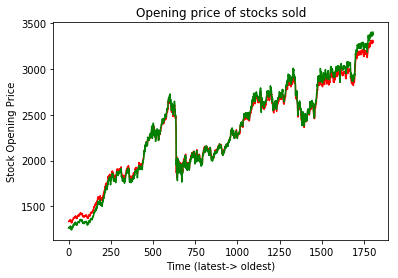

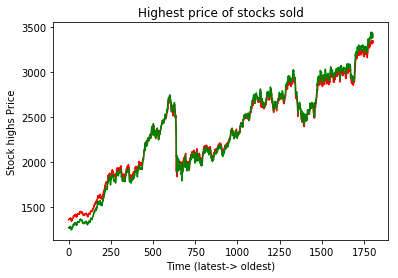

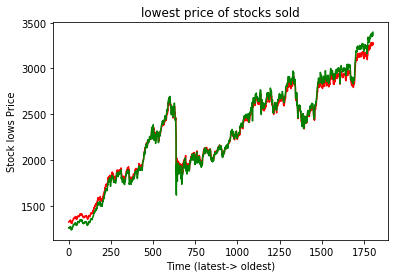

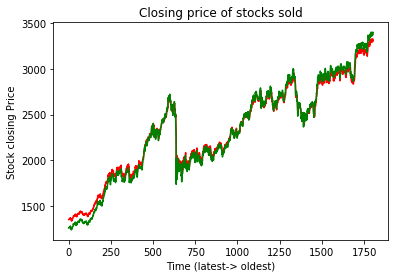

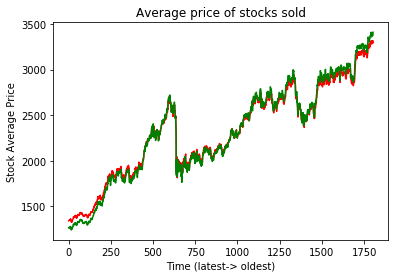

In [50]:
plt.plot(predicted_opens, color= 'red')
plt.plot(input_data[lookback:test_size+(2*lookback),0], color='green')
plt.title("Opening price of stocks sold")
plt.xlabel("Time (latest-> oldest)")
plt.ylabel("Stock Opening Price")
plt.show()

plt.plot(predicted_highs, color= 'red')
plt.plot(input_data[lookback:test_size+(2*lookback),1], color='green')
plt.title("Highest price of stocks sold")
plt.xlabel("Time (latest-> oldest)")
plt.ylabel("Stock highs Price")
plt.show()

plt.plot(predicted_lows, color= 'red')
plt.plot(input_data[lookback:test_size+(2*lookback),2], color='green')
plt.title("lowest price of stocks sold")
plt.xlabel("Time (latest-> oldest)")
plt.ylabel("Stock lows Price")
plt.show()

plt.plot(predicted_close, color= 'red')
plt.plot(input_data[lookback:test_size+(2*lookback),3], color='green')
plt.title("Closing price of stocks sold")
plt.xlabel("Time (latest-> oldest)")
plt.ylabel("Stock closing Price")
plt.show()

plt.plot(predicted_Average, color= 'red')
plt.plot(input_data[lookback:test_size+(2*lookback),6], color='green')
plt.title("Average price of stocks sold")
plt.xlabel("Time (latest-> oldest)")
plt.ylabel("Stock Average Price")
plt.show()